In [1]:
###
# The goal of this notebook is to:
# - Take two neural populations
# - Compute the JS divergence between stimuli pairs for each population (the same stimuli pairs)
# - Compute the mutual information between the distributions of JS divergences

import glob
import os
from importlib import reload
import pickle
import datetime

import numpy as np
import scipy as sp
import pandas as pd
import h5py as h5
from tqdm import tqdm_notebook as tqdm
import matplotlib.pyplot as plt
%matplotlib inline

import neuraltda.topology2 as tp2
import neuraltda.spectralAnalysis as sa
import neuraltda.simpComp as sc
import pycuslsa as pyslsa

daystr = datetime.datetime.now().strftime('%Y%m%d')
figsavepth = '/home/brad/DailyLog/'+daystr+'/'
print(figsavepth)

/home/brad/.conda/envs/neuraltda-4/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


/home/brad/DailyLog/20200106/


In [2]:
# Set up birds and block_paths
birds = ['B1083', 'B1056', 'B1235', 'B1075']
bps = {'B1083': '/home/brad/krista/B1083/P03S03/', 'B1075': '/home/brad/krista/B1075/P01S03/',
       'B1235': '/home/brad/krista/B1235/P02S01/', 'B1056': '/home/brad/krista/B1056/klusta/phy020516/Pen01_Lft_AP100_ML1300__Site03_Z2500__B1056_cat_P01_S03_1/',
       'B1056': '/home/brad/krista/B1056/klusta/phy020516/Pen01_Lft_AP100_ML1300__Site03_Z2500__B1056_cat_P01_S03_1/',
       'B1083-5': '/home/brad/krista/B1083/P03S05/'}


learned_stimuli = {'B1083': ['M_scaled_burung', 'N_scaled_burung', 'O_scaled_burung', 'P_scaled_burung'], 'B1056': ['A_scaled_burung', 'B_scaled_burung', 'C_scaled_burung', 'D_scaled_burung'], 'B1235': [], 'B1075': []}
peck_stimuli = {'B1083': {'L': ['N_40k','P_40k'], 'R': ['M_40k', 'O_40k']}, 'B1056': {'L': ['B_scaled_burung', 'D_scaled_burung'], 'R': ['A_scaled_burung', 'C_scaled_burung']}, 
                'B1235': {'L': ['F_scaled_burung', 'H_scaled_burung'], 'R': ['E_scaled_burung', 'G_scaled_burung'],}, 'B1075': {'L': ['F_40k', 'H_40k'], 'R': ['E_40k', 'G_40k']},
               'B1083-5': {'L': ['N_40k','P_40k'], 'R': ['M_40k', 'O_40k']}}

unfamiliar_stimuli = {'B1083': ['I_40k', 'J_40k', 'K_40k', 'L_40k'], 
                      'B1083-5': ['I_40k', 'J_40k', 'K_40k', 'L_40k'],
                      'B1235': ['A_scaled_burung', 'B_scaled_burung', 'C_scaled_burung', 'D_scaled_burung'], 
                      'B1075': ['A_40k', 'B_40k', 'C_40k', 'D_40k'], 
                      'B1056': ['E_scaled_burung', 'F_scaled_burung', 'G_scaled_burung', 'H_scaled_burung']
                     }

#bps =  {'B1056': '/home/AD/btheilma/krista/B1056/klusta/phy020516/Pen01_Lft_AP100_ML1300__Site03_Z2500__B1056_cat_P01_S03_1/',
#        'B1235': '/home/AD/btheilma/krista/B1235/P02S01/'}
#test_birds = ['B1056', 'B1235']
#test_birds = ['B1075', 'B1235']
#test_birds = ['B1056', 'B1235']
#test_birds =['B1056', 'B1083']
#test_birds = ['B1083']
#test_birds = ['B1083', 'B1083-5']
#test_birds = ['B1056', 'B1235', 'B1083', 'B1083-5']
#test_birds = ['B1056']
test_birds = ['B1083', 'B1083-5']
# Binning Parameters
windt = 10.0                      # milliseconds
dtovr = 0.5*windt                 # milliseconds
segment_info = [0, 0]             # use full Trial
cluster_group = ['Good']          # use just good clusters
comment = 'JS_MI_SPLTPOP'            # BootStrap Populations
bdfs = {}                         # Dictionary to store bdf

In [3]:
# Loop through each bird in our list and bin the data
for bird in test_birds:
    block_path = bps[bird]
    bfdict = tp2.dag_bin(block_path, windt, segment_info, cluster_group=cluster_group, dt_overlap=dtovr, comment=comment)
    bdf = glob.glob(os.path.join(bfdict['raw'], '*.binned'))[0]
    print(bdf)
    bdfs[bird] = bdf

/home/brad/krista/B1083/P03S03/binned_data/win-10.0_dtovr-5.0_seg-0-0-JS_MI_SPLTPOP/20200106T211155Z-10.0-5.0.binned
/home/brad/krista/B1083/P03S05/binned_data/win-10.0_dtovr-5.0_seg-0-0-JS_MI_SPLTPOP/20200106T211204Z-10.0-5.0.binned


In [6]:
# extract left vs right stims
# extract population tensors for the populations of interest
# Do not sort the stims
population_tensors_familiar_1 = {}
population_tensors_familiar_2 = {}
stimuli = []

for bird in test_birds:
    stimuli = peck_stimuli[bird]['L'] + peck_stimuli[bird]['R']
    print(stimuli)
    bdf = bdfs[bird]
    population_tensors_familiar_1[bird] = []
    population_tensors_familiar_2[bird] = []
    # open the binned data file
    with h5.File(bdf, 'r') as f:
        print(list(f.keys()))
        for stim in stimuli:
            poptens = np.array(f[stim]['pop_tens'])
            # Extract half of the population into 1 poptens, the rest into a second poptens
            split_indices = np.random.permutation(poptens.shape[0])
            split_index = int(np.round(poptens.shape[0]/2.))
            poptens1_indices = split_indices[0:split_index]
            poptens2_indices = split_indices[split_index:]

            poptens1 = poptens[poptens1_indices, :, :]
            poptens2 = poptens[poptens2_indices, :, :]
            population_tensors_familiar_1[bird].append([poptens1, stim])
            population_tensors_familiar_2[bird].append([poptens2, stim])

['N_40k', 'P_40k', 'M_40k', 'O_40k']
['I_40k', 'J_40k', 'K_40k', 'L_40k', 'M_40k', 'N_40k', 'O_40k', 'P_40k']
['N_40k', 'P_40k', 'M_40k', 'O_40k']
['I_40k', 'J_40k', 'K_40k', 'L_40k', 'M_40k', 'N_40k', 'O_40k', 'P_40k']


In [4]:
# flatten the list of population tensors for each population
threshold = 6

def threshold_poptens(tens, thresh):
    ncell, nwins, ntrials = tens.shape
    frs = np.mean(tens, axis=1)
    tfr = thresh*frs
    tfrtens = np.tile(tfr[:, np.newaxis, :], (1, nwins, 1))
    bintens = 1*np.greater(tens, tfrtens)
    return bintens

def shuffle_binmat(binmat):
    ncells, nwin = binmat.shape
    for i in range(ncells):
        binmat[i, :] = np.random.permutation(binmat[i, :])
    return binmat

def get_JS(i, j, Li, Lj, speci, specj, beta):
    js = (i, j, sc.sparse_JS_divergence2_fast(Li, Lj, speci, specj, beta))
    print((i, j))
    return js

def get_Lap(trial_matrix, sh):
    if sh == 'shuffled':
        mat = shuffle_binmat(trial_matrix)
    else:
        mat = trial_matrix
    ms = sc.binarytomaxsimplex(trial_matrix, rDup=True)
    scg1 = sc.simplicialChainGroups(ms)
    L = sc.sparse_laplacian(scg1, dim)
    return L

def get_M(i, j, L1, L2):
    mspec = sc.compute_M_spec(L1, L2)
    print((i, j))
    return (i, j, mspec)

def get_JS_spec(i, j, speci, specj, specm, beta):
    js = (i, j, sc.sparse_JS_divergence2_spec(speci, specj, specm, beta))
    return js

def compute_withins_vs_between(mtx, ntrials, nstim, diag=0):
    stim_per_group = int(nstim//2)
    
    btwn_data = mtx[0:stim_per_group*ntrials, stim_per_group*ntrials:]
    within1 = mtx[0:stim_per_group*ntrials, 0:stim_per_group*ntrials][np.triu_indices(stim_per_group*ntrials, diag)]
    within2 = mtx[stim_per_group*ntrials:, stim_per_group*ntrials:][np.triu_indices(stim_per_group*ntrials, diag)]
    
    within = np.concatenate((within1, within2))
    return (btwn_data, within1, within2)



In [5]:
reload(sc)
from joblib import Parallel, delayed
nreps = 40

for rep in tqdm(range(nreps)):

    # extract left vs right stims
    # extract population tensors for the populations of interest
    # Do not sort the stims
    population_tensors_familiar_1 = {}
    population_tensors_familiar_2 = {}
    stimuli = []
    combined_poptens = []

    for bird in test_birds:
        stimuli = peck_stimuli[bird]['L'] + peck_stimuli[bird]['R']
        print(stimuli)
        bdf = bdfs[bird]
        population_tensors_familiar_1[bird] = []
        population_tensors_familiar_2[bird] = []
        # open the binned data file
        with h5.File(bdf, 'r') as f:
            print(list(f.keys()))
            for stim in stimuli:
                poptens = np.array(f[stim]['pop_tens'])
                # Extract half of the population into 1 poptens, the rest into a second poptens
                split_indices = np.random.permutation(poptens.shape[0])
                split_index = int(np.round(poptens.shape[0]/2.))
                poptens1_indices = split_indices[0:split_index]
                poptens2_indices = split_indices[split_index:]

                poptens1 = poptens[poptens1_indices, :, :]
                poptens2 = poptens[poptens2_indices, :, :]
                population_tensors_familiar_1[bird].append([poptens1, stim])
                population_tensors_familiar_2[bird].append([poptens2, stim])

    combined_poptens = population_tensors_familiar_1['B1083']
    combined_poptens.extend(population_tensors_familiar_2['B1083'])
    print(len(combined_poptens))

    # mirroring cuda code
    #Left vs right

    dim = 1

    betas = [1]
    all_spectra = []

    ntrials = 20 # Only do half the trials for each stim
    bird_tensors = combined_poptens
    SCG = []
    spectra = []
    laplacians_save = []
    print('Computing Laplacians..')
    for bird_tensor, stim in bird_tensors:
        binmatlist = []
        print(stim)
        ncells, nwin, _ = bird_tensor.shape
        bin_tensor = threshold_poptens(bird_tensor, threshold)
        laps = Parallel(n_jobs=24)(delayed(get_Lap)(bin_tensor[:, :, trial], 'original') for trial in range(ntrials))
        laplacians_save.append((bird, stim, laps))
    laplacians = sum([s[2] for s in laplacians_save], [])
    N = len(laplacians)
    # compute spectra
    print('Computing Spectra...')
    spectra = Parallel(n_jobs=24)(delayed(sc.sparse_spectrum)(L) for L in laplacians)
    all_spectra.extend(spectra)

    # Precompute M spectra
    pairs = [(i, j) for i in range(N) for j in range(i, N)]
    print('Computing M spectra...')
    M_spec = Parallel(n_jobs=24)(delayed(get_M)(i, j, laplacians[i], laplacians[j]) for (i, j) in pairs)
    M_spec = {(p[0], p[1]): p[2] for p in M_spec}

    # Save computed spectra
    with open(os.path.join(figsavepth, 'Mspectra_{}-{}-{}-{}.pkl'.format('B1083Split', ntrials, 'orig', 'fam')), 'wb') as f:
        pickle.dump(M_spec, f)
    with open(os.path.join(figsavepth, 'Lapspectra_{}-{}-{}-{}.pkl'.format('B1083Split', ntrials, 'orig', 'fam')), 'wb') as f:
        pickle.dump(laplacians_save, f)


    # compute density matrices

    for beta in betas:
        print('Computing JS Divergences with beta {}...'.format(beta))
        jsmat = np.zeros((N, N))

        jsdat = Parallel(n_jobs=24)(delayed(get_JS_spec)(i, j, spectra[i], spectra[j], M_spec[(i,j)], beta) for (i, j) in pairs)
        for d in jsdat:
            jsmat[d[0], d[1]] = d[2]

        with open(os.path.join(figsavepth, 'JSpop_fast_B1083Split-{}-{}-{}_LvsR-fam-orig-{}.pkl'.format(dim, beta, ntrials, rep)), 'wb') as f:
            pickle.dump(jsmat, f)

['N_40k', 'P_40k', 'M_40k', 'O_40k']
['I_40k', 'J_40k', 'K_40k', 'L_40k', 'M_40k', 'N_40k', 'O_40k', 'P_40k']
['N_40k', 'P_40k', 'M_40k', 'O_40k']
['I_40k', 'J_40k', 'K_40k', 'L_40k', 'M_40k', 'N_40k', 'O_40k', 'P_40k']
8
Computing Laplacians..
N_40k
P_40k
M_40k
O_40k
N_40k
P_40k
M_40k
O_40k
Computing Spectra...
Computing M spectra...
(0, 6)
(0, 4)
(0, 5)
(0, 3)
(0, 10)
(0, 1)
(0, 14)
(0, 19)
(0, 7)
(0, 0)
(0, 9)
(0, 8)
(0, 16)
(0, 11)
(0, 13)
(0, 2)
(0, 15)
(0, 12)
(0, 18)
(0, 17)
(0, 22)
(0, 21)
(0, 23)
(0, 33)
(0, 42)
(0, 40)
(0, 41)
(0, 32)
(0, 35)
(0, 26)
(0, 24)
(0, 37)
(0, 36)
(0, 34)
(0, 38)
(0, 30)
(0, 44)
(0, 28)
(0, 25)
(0, 29)
(0, 39)
(0, 45)
(0, 43)
(0, 20)
(0, 46)
(0, 27)
(0, 48)
(0, 51)
(0, 50)
(0, 49)
(0, 54)
(0, 47)
(0, 31)
(0, 56)
(0, 52)
(0, 53)
(0, 59)
(0, 57)
(0, 60)
(0, 55)
(0, 61)
(0, 58)
(0, 67)
(0, 69)
(0, 68)
(0, 65)
(0, 62)
(0, 63)
(0, 66)
(0, 64)
(0, 71)
(0, 74)
(0, 70)
(0, 73)
(0, 72)
(0, 75)
(0, 79)
(0, 76)
(0, 80)
(0, 77)
(0, 78)
(0, 81)
(0, 83)
(0, 84)
(

(5, 159)
(6, 9)
(5, 151)
(6, 8)
(6, 13)
(6, 14)
(6, 10)
(6, 11)
(6, 7)
(6, 17)
(6, 12)
(6, 19)
(6, 15)
(6, 16)
(6, 18)
(6, 26)
(6, 23)
(6, 24)
(6, 21)
(6, 42)
(6, 32)
(6, 22)
(6, 37)
(6, 28)
(6, 27)
(6, 30)
(6, 33)
(6, 34)
(6, 41)
(6, 29)
(6, 36)
(6, 38)
(6, 25)
(6, 40)
(6, 35)
(6, 44)
(6, 39)
(6, 31)
(6, 51)
(6, 50)
(6, 46)
(6, 43)
(6, 54)
(6, 45)
(6, 48)
(6, 60)
(6, 20)
(6, 61)
(6, 52)
(6, 47)
(6, 49)
(6, 58)
(6, 53)
(6, 62)
(6, 56)
(6, 57)
(6, 55)
(6, 64)
(6, 65)
(6, 59)
(6, 68)
(6, 63)
(6, 70)
(6, 66)
(6, 67)
(6, 74)
(6, 71)
(6, 69)
(6, 75)
(6, 72)
(6, 76)
(6, 73)
(6, 78)
(6, 79)
(6, 77)
(6, 81)
(6, 83)
(6, 84)
(6, 85)
(6, 90)
(6, 80)
(6, 82)
(6, 105)
(6, 104)
(6, 87)
(6, 98)
(6, 92)
(6, 96)
(6, 91)
(6, 89)
(6, 101)
(6, 95)
(6, 94)
(6, 102)
(6, 88)
(6, 106)
(6, 97)
(6, 86)
(6, 93)
(6, 99)
(6, 107)
(6, 103)
(6, 100)
(6, 108)
(6, 111)
(6, 121)
(6, 112)
(6, 114)
(6, 122)
(6, 119)
(6, 109)
(6, 116)
(6, 117)
(6, 123)
(6, 120)
(6, 124)
(6, 118)
(6, 115)
(6, 125)
(6, 110)
(6, 127)
(6, 113

(12, 44)
(12, 43)
(12, 54)
(12, 31)
(12, 64)
(12, 61)
(12, 58)
(12, 60)
(12, 48)
(12, 46)
(12, 65)
(12, 45)
(12, 62)
(12, 52)
(12, 51)
(12, 66)
(12, 63)
(12, 50)
(12, 57)
(12, 56)
(12, 49)
(12, 20)
(12, 53)
(12, 47)
(12, 55)
(12, 59)
(12, 68)
(12, 73)
(12, 74)
(12, 70)
(12, 72)
(12, 71)
(12, 67)
(12, 75)
(12, 78)
(12, 69)
(12, 77)
(12, 79)
(12, 76)
(12, 84)
(12, 81)
(12, 87)
(12, 80)
(12, 83)
(12, 101)
(12, 82)
(12, 85)
(12, 104)
(12, 89)
(12, 102)
(12, 88)
(12, 90)
(12, 106)
(12, 92)
(12, 103)
(12, 95)
(12, 86)
(12, 94)
(12, 98)
(12, 105)
(12, 108)
(12, 93)
(12, 96)
(12, 109)
(12, 91)
(12, 99)
(12, 107)
(12, 97)
(12, 100)
(12, 116)
(12, 110)
(12, 115)
(12, 121)
(12, 117)
(12, 112)
(12, 111)
(12, 114)
(12, 113)
(12, 120)
(12, 127)
(12, 118)
(12, 122)
(12, 123)
(12, 131)
(12, 124)
(12, 126)
(12, 128)
(12, 119)
(12, 125)
(12, 130)
(12, 129)
(12, 132)
(12, 134)
(12, 133)
(12, 135)
(12, 138)
(12, 144)
(12, 137)
(12, 142)
(12, 146)
(12, 139)
(12, 145)
(12, 136)
(12, 143)
(12, 147)
(12, 149)

(18, 44)
(18, 48)
(18, 54)
(18, 56)
(18, 50)
(18, 43)
(18, 45)
(18, 49)
(18, 52)
(18, 60)
(18, 47)
(18, 53)
(18, 58)
(18, 62)
(18, 61)
(18, 57)
(18, 55)
(18, 59)
(18, 63)
(18, 64)
(18, 65)
(18, 67)
(18, 68)
(18, 69)
(18, 72)
(18, 70)
(18, 66)
(18, 73)
(18, 75)
(18, 71)
(18, 77)
(18, 74)
(18, 78)
(18, 76)
(18, 79)
(18, 81)
(18, 80)
(18, 83)
(18, 84)
(18, 82)
(18, 90)
(18, 87)
(18, 89)
(18, 85)
(18, 101)
(18, 94)
(18, 88)
(18, 96)
(18, 86)
(18, 92)
(18, 106)
(18, 95)
(18, 91)
(18, 105)
(18, 98)
(18, 102)
(18, 93)
(18, 97)
(18, 109)
(18, 108)
(18, 103)
(18, 107)
(18, 99)
(18, 111)
(18, 104)
(18, 113)
(18, 100)
(18, 110)
(18, 114)
(18, 116)
(18, 112)
(18, 120)
(18, 123)
(18, 115)
(18, 119)
(18, 124)
(18, 122)
(18, 118)
(18, 121)
(18, 125)
(18, 117)
(18, 126)
(18, 128)
(18, 130)
(18, 129)
(18, 131)
(18, 127)
(18, 140)
(18, 132)
(18, 136)
(18, 134)
(18, 135)
(18, 141)
(18, 137)
(18, 138)
(18, 139)
(18, 142)
(18, 133)
(18, 144)
(18, 145)
(18, 146)
(18, 143)
(18, 149)
(19, 19)
(18, 148)
(18, 1

(24, 92)
(24, 82)
(24, 88)
(24, 86)
(24, 87)
(24, 89)
(24, 98)
(24, 90)
(24, 91)
(24, 93)
(24, 97)
(24, 94)
(24, 96)
(24, 101)
(24, 100)
(24, 99)
(24, 102)
(24, 95)
(24, 109)
(24, 104)
(24, 106)
(24, 113)
(24, 105)
(24, 108)
(24, 114)
(24, 107)
(24, 111)
(24, 110)
(24, 103)
(24, 115)
(24, 112)
(24, 117)
(24, 119)
(24, 118)
(24, 116)
(24, 120)
(24, 121)
(24, 123)
(24, 122)
(24, 124)
(24, 125)
(24, 127)
(24, 137)
(24, 126)
(24, 138)
(24, 133)
(24, 128)
(24, 132)
(24, 134)
(24, 130)
(24, 135)
(24, 129)
(24, 136)
(24, 139)
(24, 131)
(24, 142)
(24, 140)
(24, 141)
(24, 143)
(24, 146)
(24, 144)
(24, 151)
(24, 147)
(24, 154)
(24, 153)
(24, 148)
(24, 149)
(24, 152)
(24, 158)
(24, 145)
(24, 155)
(24, 157)
(24, 150)
(24, 159)
(24, 156)
(25, 25)
(25, 26)
(25, 29)
(25, 28)
(25, 27)
(25, 30)
(25, 32)
(25, 31)
(25, 37)
(25, 38)
(25, 39)
(25, 33)
(25, 36)
(25, 35)
(25, 45)
(25, 43)
(25, 34)
(25, 42)
(25, 46)
(25, 40)
(25, 47)
(25, 41)
(25, 44)
(25, 48)
(25, 52)
(25, 53)
(25, 51)
(25, 49)
(25, 50)
(25,

(30, 147)
(30, 154)
(30, 158)
(30, 157)
(30, 159)
(31, 31)
(31, 32)
(31, 34)
(31, 36)
(31, 33)
(31, 41)
(31, 40)
(31, 38)
(31, 51)
(31, 42)
(31, 46)
(31, 48)
(31, 35)
(31, 37)
(31, 45)
(31, 39)
(31, 44)
(31, 49)
(31, 43)
(31, 50)
(31, 47)
(31, 52)
(31, 57)
(31, 65)
(31, 56)
(31, 53)
(31, 54)
(31, 55)
(31, 72)
(31, 63)
(31, 60)
(31, 59)
(31, 58)
(31, 68)
(31, 61)
(31, 62)
(31, 74)
(31, 64)
(31, 71)
(31, 66)
(31, 69)
(31, 70)
(31, 67)
(31, 76)
(31, 73)
(31, 75)
(31, 78)
(31, 90)
(31, 89)
(31, 83)
(31, 79)
(31, 77)
(31, 84)
(31, 95)
(31, 82)
(31, 85)
(31, 81)
(31, 88)
(31, 87)
(31, 80)
(31, 97)
(31, 93)
(31, 86)
(31, 92)
(31, 94)
(31, 96)
(31, 91)
(31, 100)
(31, 98)
(31, 118)
(31, 102)
(31, 105)
(31, 101)
(31, 104)
(31, 108)
(31, 103)
(31, 107)
(31, 113)
(31, 99)
(31, 109)
(31, 111)
(31, 106)
(31, 116)
(31, 114)
(31, 112)
(31, 115)
(31, 120)
(31, 119)
(31, 121)
(31, 110)
(31, 117)
(31, 123)
(31, 124)
(31, 125)
(31, 131)
(31, 129)
(31, 127)
(31, 130)
(31, 132)
(31, 126)
(31, 122)
(31, 134)

(37, 138)
(37, 140)
(37, 141)
(37, 143)
(37, 142)
(37, 145)
(37, 136)
(37, 146)
(37, 144)
(37, 149)
(37, 151)
(37, 150)
(37, 154)
(37, 148)
(37, 152)
(37, 156)
(37, 158)
(37, 157)
(37, 155)
(38, 38)
(37, 153)
(37, 159)
(38, 42)
(38, 40)
(38, 45)
(38, 50)
(38, 41)
(38, 48)
(38, 49)
(38, 47)
(38, 44)
(38, 46)
(38, 43)
(38, 52)
(38, 39)
(38, 51)
(38, 53)
(38, 59)
(38, 54)
(38, 56)
(38, 55)
(38, 57)
(38, 61)
(38, 58)
(38, 60)
(38, 63)
(38, 64)
(38, 62)
(38, 68)
(38, 65)
(38, 69)
(38, 66)
(38, 67)
(38, 74)
(38, 77)
(38, 73)
(38, 71)
(38, 70)
(38, 76)
(38, 78)
(38, 75)
(38, 72)
(38, 79)
(38, 83)
(38, 80)
(38, 82)
(38, 81)
(38, 84)
(38, 90)
(38, 86)
(38, 94)
(38, 85)
(38, 88)
(38, 92)
(38, 95)
(38, 98)
(38, 87)
(38, 89)
(38, 93)
(38, 100)
(38, 96)
(38, 91)
(38, 97)
(38, 99)
(38, 102)
(38, 101)
(38, 103)
(38, 104)
(38, 108)
(38, 105)
(38, 107)
(38, 109)
(38, 111)
(38, 106)
(38, 121)
(38, 118)
(38, 120)
(38, 112)
(38, 115)
(38, 110)
(38, 114)
(38, 113)
(38, 119)
(38, 122)
(38, 117)
(38, 116)
(3

(45, 51)
(45, 53)
(45, 59)
(45, 55)
(45, 47)
(45, 56)
(45, 60)
(45, 57)
(45, 61)
(45, 65)
(45, 63)
(45, 62)
(45, 64)
(45, 66)
(45, 67)
(45, 69)
(45, 71)
(45, 70)
(45, 72)
(45, 75)
(45, 77)
(45, 68)
(45, 80)
(45, 74)
(45, 78)
(45, 73)
(45, 76)
(45, 79)
(45, 81)
(45, 84)
(45, 83)
(45, 85)
(45, 82)
(45, 89)
(45, 87)
(45, 86)
(45, 90)
(45, 95)
(45, 98)
(45, 92)
(45, 101)
(45, 94)
(45, 96)
(45, 104)
(45, 97)
(45, 93)
(45, 103)
(45, 91)
(45, 88)
(45, 102)
(45, 99)
(45, 100)
(45, 105)
(45, 106)
(45, 108)
(45, 107)
(45, 109)
(45, 110)
(45, 111)
(45, 112)
(45, 117)
(45, 119)
(45, 124)
(45, 113)
(45, 123)
(45, 121)
(45, 114)
(45, 127)
(45, 122)
(45, 115)
(45, 120)
(45, 116)
(45, 130)
(45, 126)
(45, 129)
(45, 118)
(45, 128)
(45, 125)
(45, 133)
(45, 138)
(45, 132)
(45, 131)
(45, 137)
(45, 149)
(45, 136)
(45, 150)
(45, 148)
(45, 151)
(45, 134)
(45, 141)
(45, 135)
(45, 139)
(45, 140)
(45, 146)
(45, 143)
(45, 145)
(45, 147)
(45, 144)
(45, 142)
(45, 153)
(45, 152)
(45, 154)
(45, 155)
(46, 46)
(46, 56)

(52, 133)
(52, 136)
(52, 137)
(52, 132)
(52, 139)
(52, 142)
(52, 143)
(52, 145)
(52, 146)
(52, 138)
(52, 147)
(52, 149)
(52, 144)
(52, 150)
(52, 151)
(52, 148)
(52, 154)
(52, 152)
(52, 155)
(52, 153)
(52, 158)
(52, 157)
(52, 159)
(52, 156)
(53, 53)
(53, 58)
(53, 56)
(53, 61)
(53, 57)
(53, 64)
(53, 62)
(53, 54)
(53, 55)
(53, 63)
(53, 60)
(53, 59)
(53, 65)
(53, 71)
(53, 67)
(53, 68)
(53, 66)
(53, 70)
(53, 74)
(53, 72)
(53, 69)
(53, 73)
(53, 76)
(53, 77)
(53, 75)
(53, 84)
(53, 80)
(53, 85)
(53, 79)
(53, 83)
(53, 78)
(53, 81)
(53, 90)
(53, 82)
(53, 87)
(53, 92)
(53, 89)
(53, 88)
(53, 95)
(53, 94)
(53, 93)
(53, 98)
(53, 96)
(53, 86)
(53, 91)
(53, 97)
(53, 104)
(53, 101)
(53, 108)
(53, 99)
(53, 102)
(53, 105)
(53, 107)
(53, 106)
(53, 112)
(53, 103)
(53, 115)
(53, 113)
(53, 109)
(53, 110)
(53, 100)
(53, 111)
(53, 114)
(53, 116)
(53, 117)
(53, 119)
(53, 126)
(53, 122)
(53, 120)
(53, 121)
(53, 118)
(53, 125)
(53, 128)
(53, 127)
(53, 133)
(53, 130)
(53, 124)
(53, 129)
(53, 123)
(53, 134)
(53, 13

(61, 62)
(61, 63)
(61, 65)
(61, 67)
(61, 64)
(61, 68)
(61, 72)
(61, 71)
(61, 70)
(61, 77)
(61, 76)
(61, 78)
(61, 75)
(61, 74)
(61, 73)
(61, 79)
(61, 81)
(61, 83)
(61, 84)
(61, 80)
(61, 87)
(61, 90)
(61, 82)
(61, 85)
(61, 101)
(61, 94)
(61, 89)
(61, 93)
(61, 92)
(61, 86)
(61, 105)
(61, 96)
(61, 103)
(61, 95)
(61, 91)
(61, 104)
(61, 106)
(61, 88)
(61, 98)
(61, 107)
(61, 97)
(61, 108)
(61, 99)
(61, 110)
(61, 115)
(61, 112)
(61, 102)
(61, 100)
(61, 109)
(61, 113)
(61, 116)
(61, 111)
(61, 117)
(61, 121)
(61, 127)
(61, 122)
(61, 114)
(61, 123)
(61, 120)
(61, 124)
(61, 125)
(61, 118)
(61, 129)
(61, 119)
(61, 131)
(61, 128)
(61, 126)
(61, 130)
(61, 134)
(61, 132)
(61, 135)
(61, 133)
(61, 137)
(61, 140)
(61, 139)
(61, 138)
(61, 136)
(61, 147)
(61, 142)
(61, 141)
(61, 143)
(61, 144)
(61, 145)
(61, 148)
(61, 146)
(61, 152)
(61, 156)
(61, 153)
(61, 155)
(61, 150)
(61, 149)
(61, 158)
(62, 62)
(61, 154)
(61, 151)
(61, 159)
(62, 63)
(62, 72)
(62, 70)
(62, 71)
(61, 157)
(62, 65)
(62, 66)
(62, 68)
(62,

(70, 71)
(69, 151)
(69, 159)
(69, 157)
(70, 72)
(70, 77)
(70, 73)
(70, 75)
(70, 76)
(70, 78)
(70, 79)
(70, 89)
(70, 81)
(70, 80)
(70, 87)
(70, 84)
(70, 101)
(70, 85)
(70, 83)
(70, 94)
(70, 104)
(70, 88)
(70, 96)
(70, 95)
(70, 90)
(70, 82)
(70, 107)
(70, 86)
(70, 98)
(70, 106)
(70, 91)
(70, 97)
(70, 103)
(70, 92)
(70, 102)
(70, 105)
(70, 93)
(70, 99)
(70, 109)
(70, 108)
(70, 113)
(70, 112)
(70, 110)
(70, 111)
(70, 100)
(70, 116)
(70, 115)
(70, 120)
(70, 119)
(70, 118)
(70, 124)
(70, 121)
(70, 125)
(70, 122)
(70, 114)
(70, 117)
(70, 123)
(70, 128)
(70, 126)
(70, 130)
(70, 127)
(70, 129)
(70, 131)
(70, 134)
(70, 133)
(70, 135)
(70, 132)
(70, 138)
(70, 137)
(70, 136)
(70, 140)
(70, 139)
(70, 141)
(70, 149)
(70, 150)
(70, 143)
(70, 142)
(70, 146)
(70, 144)
(70, 148)
(70, 147)
(70, 145)
(70, 153)
(70, 152)
(70, 155)
(71, 71)
(70, 151)
(70, 154)
(70, 158)
(71, 75)
(70, 157)
(70, 156)
(71, 72)
(70, 159)
(71, 74)
(71, 77)
(71, 76)
(71, 78)
(71, 73)
(71, 79)
(71, 80)
(71, 81)
(71, 84)
(71, 101)


(79, 152)
(79, 147)
(79, 149)
(79, 153)
(79, 155)
(79, 154)
(79, 151)
(79, 156)
(79, 157)
(80, 80)
(79, 158)
(79, 159)
(80, 83)
(80, 87)
(80, 85)
(80, 81)
(80, 98)
(80, 84)
(80, 89)
(80, 90)
(80, 92)
(80, 101)
(80, 97)
(80, 95)
(80, 93)
(80, 82)
(80, 88)
(80, 94)
(80, 91)
(80, 105)
(80, 96)
(80, 104)
(80, 86)
(80, 103)
(80, 99)
(80, 102)
(80, 106)
(80, 108)
(80, 109)
(80, 107)
(80, 110)
(80, 114)
(80, 112)
(80, 111)
(80, 119)
(80, 113)
(80, 100)
(80, 116)
(80, 117)
(80, 115)
(80, 118)
(80, 124)
(80, 121)
(80, 120)
(80, 123)
(80, 126)
(80, 122)
(80, 125)
(80, 127)
(80, 129)
(80, 139)
(80, 133)
(80, 132)
(80, 142)
(80, 134)
(80, 130)
(80, 128)
(80, 146)
(80, 137)
(80, 135)
(80, 145)
(80, 141)
(80, 131)
(80, 143)
(80, 136)
(80, 147)
(80, 149)
(80, 140)
(80, 138)
(80, 148)
(80, 144)
(80, 153)
(80, 151)
(80, 150)
(81, 81)
(80, 154)
(80, 152)
(80, 155)
(81, 83)
(80, 156)
(80, 159)
(81, 84)
(81, 95)
(80, 157)
(80, 158)
(81, 85)
(81, 87)
(81, 90)
(81, 82)
(81, 92)
(81, 86)
(81, 89)
(81, 93)
(8

(91, 91)
(91, 104)
(91, 95)
(91, 105)
(91, 111)
(91, 98)
(91, 101)
(91, 93)
(91, 92)
(91, 96)
(91, 94)
(91, 100)
(91, 102)
(91, 97)
(91, 99)
(91, 108)
(91, 106)
(91, 112)
(91, 103)
(91, 107)
(91, 113)
(91, 109)
(91, 110)
(91, 115)
(91, 121)
(91, 120)
(91, 128)
(91, 114)
(91, 118)
(91, 126)
(91, 116)
(91, 129)
(91, 123)
(91, 119)
(91, 124)
(91, 122)
(91, 131)
(91, 117)
(91, 125)
(91, 130)
(91, 127)
(91, 134)
(91, 136)
(91, 133)
(91, 135)
(91, 132)
(91, 137)
(91, 152)
(91, 144)
(91, 154)
(91, 143)
(91, 146)
(91, 153)
(92, 92)
(91, 149)
(91, 140)
(91, 150)
(91, 138)
(91, 139)
(91, 148)
(91, 145)
(91, 141)
(91, 142)
(91, 155)
(91, 156)
(91, 151)
(91, 147)
(91, 158)
(91, 157)
(91, 159)
(92, 93)
(92, 104)
(92, 94)
(92, 105)
(92, 97)
(92, 96)
(92, 108)
(92, 101)
(92, 114)
(92, 98)
(92, 109)
(92, 107)
(92, 106)
(92, 102)
(92, 95)
(92, 110)
(92, 113)
(92, 99)
(92, 103)
(92, 111)
(92, 112)
(92, 100)
(92, 115)
(92, 117)
(92, 116)
(92, 124)
(92, 122)
(92, 125)
(92, 126)
(92, 127)
(92, 121)
(92, 12

(103, 141)
(103, 151)
(103, 142)
(104, 104)
(103, 147)
(103, 146)
(103, 150)
(103, 143)
(103, 155)
(103, 153)
(103, 152)
(103, 148)
(104, 108)
(104, 107)
(104, 121)
(104, 106)
(104, 105)
(104, 120)
(104, 119)
(103, 154)
(104, 109)
(103, 156)
(104, 115)
(103, 157)
(104, 113)
(103, 158)
(104, 122)
(104, 112)
(104, 118)
(104, 110)
(103, 159)
(104, 116)
(104, 111)
(104, 117)
(104, 124)
(104, 127)
(104, 125)
(104, 130)
(104, 132)
(104, 134)
(104, 133)
(104, 128)
(104, 136)
(104, 123)
(104, 114)
(104, 129)
(104, 131)
(104, 126)
(104, 138)
(104, 135)
(104, 143)
(104, 142)
(104, 137)
(104, 141)
(104, 144)
(104, 139)
(104, 148)
(104, 140)
(104, 149)
(104, 145)
(104, 154)
(104, 147)
(104, 153)
(104, 159)
(104, 155)
(104, 146)
(104, 150)
(104, 158)
(104, 152)
(105, 105)
(104, 156)
(105, 106)
(104, 151)
(105, 107)
(104, 157)
(105, 108)
(105, 109)
(105, 110)
(105, 115)
(105, 113)
(105, 118)
(105, 117)
(105, 120)
(105, 116)
(105, 119)
(105, 124)
(105, 111)
(105, 122)
(105, 114)
(105, 123)
(105, 112)

(119, 121)
(118, 154)
(119, 123)
(119, 119)
(118, 155)
(118, 158)
(119, 125)
(118, 152)
(119, 124)
(118, 151)
(119, 122)
(118, 156)
(119, 129)
(119, 126)
(118, 157)
(119, 128)
(119, 127)
(119, 131)
(119, 130)
(119, 132)
(119, 139)
(119, 135)
(119, 136)
(119, 143)
(119, 133)
(119, 134)
(119, 138)
(119, 142)
(119, 144)
(119, 140)
(119, 146)
(119, 141)
(119, 147)
(119, 148)
(119, 137)
(120, 120)
(120, 122)
(120, 123)
(120, 121)
(120, 124)
(119, 150)
(119, 145)
(120, 125)
(120, 127)
(119, 153)
(120, 131)
(119, 149)
(120, 130)
(120, 132)
(120, 129)
(120, 133)
(119, 154)
(120, 126)
(119, 155)
(120, 135)
(119, 156)
(120, 128)
(120, 134)
(119, 158)
(120, 137)
(120, 136)
(120, 138)
(120, 139)
(119, 152)
(119, 151)
(119, 157)
(119, 159)
(120, 142)
(120, 156)
(121, 125)
(121, 121)
(120, 143)
(120, 149)
(121, 123)
(121, 122)
(120, 148)
(121, 124)
(120, 147)
(120, 154)
(121, 126)
(120, 145)
(120, 144)
(121, 127)
(120, 155)
(120, 153)
(120, 152)
(120, 140)
(121, 130)
(120, 150)
(121, 132)
(121, 133)

(144, 156)
(145, 149)
(145, 146)
(145, 148)
(145, 150)
(144, 157)
(145, 147)
(144, 151)
(145, 158)
(145, 151)
(145, 154)
(145, 153)
(145, 152)
(145, 155)
(146, 150)
(145, 156)
(146, 146)
(146, 148)
(145, 159)
(146, 147)
(145, 157)
(146, 156)
(146, 152)
(146, 149)
(146, 154)
(146, 153)
(147, 147)
(146, 151)
(146, 159)
(147, 148)
(146, 155)
(146, 158)
(146, 157)
(147, 150)
(147, 149)
(148, 148)
(148, 149)
(147, 155)
(147, 154)
(147, 153)
(147, 158)
(147, 156)
(148, 153)
(147, 151)
(147, 152)
(148, 150)
(148, 152)
(148, 155)
(149, 149)
(148, 156)
(147, 157)
(147, 159)
(148, 154)
(149, 150)
(148, 151)
(149, 154)
(148, 159)
(149, 155)
(148, 158)
(149, 153)
(150, 155)
(149, 156)
(148, 157)
(149, 158)
(149, 152)
(149, 159)
(150, 150)
(150, 153)
(150, 154)
(149, 151)
(150, 152)
(150, 156)
(149, 157)
(150, 151)
(151, 151)
(150, 158)
(150, 157)
(150, 159)
(151, 157)
(152, 152)
(152, 154)
(152, 155)
(151, 153)
(151, 152)
(153, 153)
(151, 154)
(152, 153)
(151, 155)
(153, 154)
(152, 158)
(152, 156)

(4, 148)
(4, 150)
(4, 151)
(4, 153)
(4, 154)
(4, 155)
(4, 156)
(4, 159)
(4, 152)
(4, 157)
(4, 158)
(5, 5)
(5, 17)
(5, 14)
(5, 12)
(5, 11)
(5, 8)
(5, 10)
(5, 7)
(5, 19)
(5, 16)
(5, 9)
(5, 13)
(5, 15)
(5, 18)
(5, 6)
(5, 21)
(5, 24)
(5, 28)
(5, 26)
(5, 27)
(5, 25)
(5, 34)
(5, 22)
(5, 23)
(5, 20)
(5, 42)
(5, 37)
(5, 29)
(5, 30)
(5, 36)
(5, 38)
(5, 33)
(5, 32)
(5, 40)
(5, 35)
(5, 39)
(5, 41)
(5, 43)
(5, 31)
(5, 45)
(5, 44)
(5, 46)
(5, 47)
(5, 48)
(5, 55)
(5, 51)
(5, 49)
(5, 54)
(5, 53)
(5, 59)
(5, 52)
(5, 50)
(5, 57)
(5, 56)
(5, 61)
(5, 60)
(5, 62)
(5, 58)
(5, 68)
(5, 66)
(5, 67)
(5, 63)
(5, 64)
(5, 69)
(5, 65)
(5, 70)
(5, 71)
(5, 76)
(5, 73)
(5, 78)
(5, 79)
(5, 74)
(5, 85)
(5, 75)
(5, 77)
(5, 89)
(5, 72)
(5, 82)
(5, 84)
(5, 81)
(5, 80)
(5, 86)
(5, 83)
(5, 87)
(5, 90)
(5, 88)
(5, 92)
(5, 91)
(5, 94)
(5, 93)
(5, 96)
(5, 97)
(5, 98)
(5, 108)
(5, 95)
(5, 104)
(5, 99)
(5, 101)
(5, 113)
(5, 103)
(5, 102)
(5, 106)
(5, 107)
(5, 109)
(5, 105)
(5, 114)
(5, 111)
(5, 112)
(5, 110)
(5, 115)
(5, 120)
(5

(11, 41)
(11, 42)
(11, 31)
(11, 20)
(11, 49)
(11, 47)
(11, 44)
(11, 48)
(11, 50)
(11, 52)
(11, 51)
(11, 57)
(11, 55)
(11, 54)
(11, 56)
(11, 53)
(11, 59)
(11, 58)
(11, 62)
(11, 65)
(11, 64)
(11, 61)
(11, 63)
(11, 60)
(11, 66)
(11, 68)
(11, 69)
(11, 67)
(11, 70)
(11, 71)
(11, 72)
(11, 73)
(11, 74)
(11, 77)
(11, 75)
(11, 78)
(11, 76)
(11, 79)
(11, 80)
(11, 84)
(11, 83)
(11, 82)
(11, 90)
(11, 89)
(11, 85)
(11, 86)
(11, 81)
(11, 87)
(11, 88)
(11, 92)
(11, 91)
(11, 98)
(11, 94)
(11, 93)
(11, 96)
(11, 95)
(11, 97)
(11, 99)
(11, 103)
(11, 113)
(11, 104)
(11, 101)
(11, 109)
(11, 105)
(11, 108)
(11, 106)
(11, 102)
(11, 115)
(11, 111)
(11, 112)
(11, 114)
(11, 110)
(11, 120)
(11, 116)
(11, 107)
(11, 121)
(11, 122)
(11, 100)
(11, 123)
(11, 124)
(11, 118)
(11, 128)
(11, 126)
(11, 129)
(11, 131)
(11, 119)
(11, 117)
(11, 125)
(11, 134)
(11, 127)
(11, 133)
(11, 130)
(11, 132)
(11, 136)
(11, 135)
(11, 138)
(11, 139)
(11, 144)
(11, 137)
(11, 145)
(11, 140)
(11, 146)
(11, 141)
(11, 143)
(11, 154)
(11, 142

(17, 35)
(17, 46)
(17, 39)
(17, 47)
(17, 32)
(17, 34)
(17, 37)
(17, 49)
(17, 20)
(17, 31)
(17, 50)
(17, 55)
(17, 51)
(17, 58)
(17, 64)
(17, 54)
(17, 56)
(17, 53)
(17, 52)
(17, 70)
(17, 57)
(17, 59)
(17, 65)
(17, 62)
(17, 67)
(17, 66)
(17, 69)
(17, 63)
(17, 61)
(17, 60)
(17, 68)
(17, 76)
(17, 73)
(17, 72)
(17, 75)
(17, 74)
(17, 85)
(17, 71)
(17, 78)
(17, 77)
(17, 79)
(17, 83)
(17, 84)
(17, 80)
(17, 90)
(17, 82)
(17, 81)
(17, 87)
(17, 89)
(17, 86)
(17, 88)
(17, 91)
(17, 92)
(17, 98)
(17, 94)
(17, 97)
(17, 93)
(17, 95)
(17, 96)
(17, 104)
(17, 103)
(17, 108)
(17, 102)
(17, 99)
(17, 101)
(17, 107)
(17, 115)
(17, 106)
(17, 120)
(17, 122)
(17, 100)
(17, 109)
(17, 121)
(17, 113)
(17, 105)
(17, 116)
(17, 126)
(17, 123)
(17, 111)
(17, 112)
(17, 114)
(17, 125)
(17, 119)
(17, 110)
(17, 127)
(17, 124)
(17, 117)
(17, 128)
(17, 118)
(17, 130)
(17, 131)
(17, 132)
(17, 134)
(17, 133)
(17, 137)
(17, 135)
(17, 149)
(17, 129)
(17, 138)
(17, 139)
(17, 136)
(17, 146)
(17, 142)
(17, 148)
(17, 141)
(17, 143)


(23, 74)
(23, 82)
(23, 78)
(23, 75)
(23, 76)
(23, 77)
(23, 89)
(23, 83)
(23, 81)
(23, 84)
(23, 85)
(23, 79)
(23, 86)
(23, 80)
(23, 87)
(23, 94)
(23, 91)
(23, 95)
(23, 88)
(23, 96)
(23, 93)
(23, 97)
(23, 90)
(23, 92)
(23, 101)
(23, 99)
(23, 103)
(23, 98)
(23, 113)
(23, 115)
(23, 104)
(23, 108)
(23, 105)
(23, 106)
(23, 102)
(23, 109)
(23, 107)
(23, 111)
(23, 112)
(23, 114)
(23, 117)
(23, 110)
(23, 100)
(23, 119)
(23, 116)
(23, 120)
(23, 123)
(23, 124)
(23, 122)
(23, 118)
(23, 121)
(23, 125)
(23, 126)
(23, 132)
(23, 129)
(23, 131)
(23, 130)
(23, 140)
(23, 128)
(23, 138)
(23, 127)
(23, 133)
(23, 135)
(23, 134)
(23, 136)
(23, 141)
(23, 137)
(23, 143)
(23, 139)
(23, 144)
(24, 24)
(23, 142)
(23, 148)
(24, 26)
(23, 147)
(24, 27)
(23, 149)
(23, 145)
(24, 28)
(23, 146)
(23, 151)
(23, 152)
(24, 25)
(23, 150)
(23, 153)
(24, 29)
(24, 30)
(23, 155)
(23, 157)
(23, 154)
(23, 159)
(23, 158)
(24, 32)
(24, 36)
(23, 156)
(24, 33)
(24, 41)
(24, 34)
(24, 44)
(24, 43)
(24, 45)
(24, 42)
(24, 40)
(24, 38)
(24,

(29, 137)
(29, 141)
(29, 140)
(29, 142)
(29, 144)
(29, 143)
(29, 145)
(29, 146)
(29, 147)
(29, 149)
(29, 148)
(29, 151)
(30, 30)
(29, 150)
(29, 154)
(29, 155)
(29, 156)
(29, 153)
(30, 34)
(29, 158)
(30, 32)
(30, 33)
(29, 157)
(30, 35)
(29, 152)
(29, 159)
(30, 40)
(30, 36)
(30, 39)
(30, 38)
(30, 37)
(30, 43)
(30, 45)
(30, 42)
(30, 46)
(30, 31)
(30, 41)
(30, 44)
(30, 47)
(30, 56)
(30, 48)
(30, 50)
(30, 51)
(30, 53)
(30, 49)
(30, 52)
(30, 54)
(30, 57)
(30, 55)
(30, 58)
(30, 59)
(30, 60)
(30, 62)
(30, 63)
(30, 65)
(30, 61)
(30, 64)
(30, 67)
(30, 69)
(30, 66)
(30, 72)
(30, 70)
(30, 76)
(30, 68)
(30, 73)
(30, 71)
(30, 74)
(30, 77)
(30, 78)
(30, 83)
(30, 79)
(30, 80)
(30, 75)
(30, 81)
(30, 82)
(30, 84)
(30, 85)
(30, 87)
(30, 89)
(30, 86)
(30, 88)
(30, 90)
(30, 91)
(30, 92)
(30, 98)
(30, 97)
(30, 93)
(30, 104)
(30, 94)
(30, 95)
(30, 96)
(30, 103)
(30, 99)
(30, 108)
(30, 101)
(30, 106)
(30, 102)
(30, 115)
(30, 105)
(30, 109)
(30, 110)
(30, 107)
(30, 122)
(30, 120)
(30, 111)
(30, 116)
(30, 121)


(36, 117)
(36, 118)
(36, 113)
(36, 100)
(36, 128)
(36, 129)
(36, 127)
(36, 124)
(36, 125)
(36, 130)
(36, 119)
(36, 126)
(36, 114)
(36, 116)
(36, 131)
(36, 135)
(36, 133)
(36, 134)
(36, 132)
(36, 138)
(36, 137)
(36, 136)
(36, 139)
(36, 142)
(36, 145)
(36, 146)
(36, 144)
(36, 141)
(36, 140)
(36, 147)
(36, 150)
(36, 143)
(36, 148)
(36, 149)
(36, 156)
(36, 155)
(36, 153)
(36, 151)
(36, 158)
(36, 154)
(36, 157)
(37, 37)
(36, 159)
(37, 41)
(36, 152)
(37, 40)
(37, 47)
(37, 50)
(37, 43)
(37, 45)
(37, 38)
(37, 42)
(37, 48)
(37, 44)
(37, 46)
(37, 39)
(37, 49)
(37, 51)
(37, 56)
(37, 52)
(37, 53)
(37, 55)
(37, 54)
(37, 58)
(37, 66)
(37, 60)
(37, 61)
(37, 57)
(37, 68)
(37, 59)
(37, 64)
(37, 63)
(37, 65)
(37, 80)
(37, 70)
(37, 74)
(37, 62)
(37, 67)
(37, 69)
(37, 73)
(37, 72)
(37, 75)
(37, 78)
(37, 79)
(37, 71)
(37, 76)
(37, 88)
(37, 92)
(37, 77)
(37, 81)
(37, 86)
(37, 87)
(37, 84)
(37, 90)
(37, 82)
(37, 83)
(37, 85)
(37, 89)
(37, 91)
(37, 98)
(37, 95)
(37, 96)
(37, 94)
(37, 97)
(37, 93)
(37, 104)
(3

(43, 142)
(43, 140)
(43, 143)
(43, 139)
(43, 141)
(44, 46)
(43, 146)
(43, 144)
(44, 45)
(43, 153)
(43, 148)
(43, 149)
(43, 147)
(43, 145)
(44, 44)
(43, 154)
(43, 158)
(43, 155)
(44, 47)
(43, 150)
(43, 156)
(43, 151)
(44, 50)
(44, 49)
(44, 48)
(44, 54)
(44, 56)
(44, 52)
(44, 53)
(44, 55)
(43, 157)
(44, 58)
(44, 63)
(44, 65)
(44, 57)
(44, 51)
(44, 69)
(44, 62)
(44, 59)
(43, 152)
(44, 61)
(44, 60)
(43, 159)
(44, 68)
(44, 74)
(44, 75)
(44, 72)
(44, 70)
(44, 66)
(44, 67)
(44, 76)
(44, 73)
(44, 78)
(44, 71)
(44, 64)
(44, 79)
(44, 77)
(44, 85)
(44, 84)
(44, 83)
(44, 81)
(44, 80)
(44, 90)
(44, 82)
(44, 87)
(44, 89)
(44, 88)
(44, 93)
(44, 92)
(44, 98)
(44, 91)
(44, 86)
(44, 97)
(44, 95)
(44, 96)
(44, 94)
(44, 104)
(44, 101)
(44, 103)
(44, 99)
(44, 108)
(44, 105)
(44, 106)
(44, 120)
(44, 121)
(44, 115)
(44, 100)
(44, 123)
(44, 110)
(44, 109)
(44, 122)
(44, 113)
(44, 107)
(44, 128)
(44, 102)
(44, 111)
(44, 116)
(44, 112)
(44, 114)
(44, 126)
(44, 119)
(44, 124)
(44, 117)
(44, 118)
(44, 132)
(44, 1

(51, 103)
(51, 104)
(51, 108)
(51, 121)
(51, 120)
(51, 106)
(51, 123)
(51, 102)
(51, 115)
(51, 122)
(51, 110)
(51, 109)
(51, 112)
(51, 125)
(51, 126)
(51, 113)
(51, 128)
(51, 100)
(51, 116)
(51, 105)
(51, 118)
(51, 127)
(51, 111)
(51, 107)
(51, 124)
(51, 132)
(51, 119)
(51, 129)
(51, 131)
(51, 130)
(51, 117)
(51, 133)
(51, 135)
(51, 137)
(51, 136)
(51, 134)
(51, 138)
(51, 142)
(51, 114)
(51, 140)
(51, 144)
(51, 143)
(51, 141)
(51, 139)
(51, 149)
(51, 148)
(51, 145)
(52, 52)
(51, 146)
(51, 147)
(51, 154)
(52, 53)
(51, 153)
(51, 155)
(51, 158)
(52, 63)
(52, 56)
(51, 150)
(52, 54)
(51, 156)
(52, 57)
(52, 58)
(51, 159)
(52, 55)
(52, 69)
(52, 59)
(51, 157)
(52, 62)
(52, 64)
(52, 65)
(52, 67)
(51, 152)
(52, 72)
(52, 68)
(52, 61)
(51, 151)
(52, 70)
(52, 74)
(52, 66)
(52, 73)
(52, 75)
(52, 78)
(52, 60)
(52, 71)
(52, 76)
(52, 77)
(52, 85)
(52, 79)
(52, 84)
(52, 83)
(52, 81)
(52, 80)
(52, 87)
(52, 89)
(52, 82)
(52, 90)
(52, 88)
(52, 86)
(52, 98)
(52, 92)
(52, 93)
(52, 97)
(52, 91)
(52, 96)
(52, 

(59, 114)
(59, 100)
(59, 132)
(59, 119)
(59, 112)
(59, 128)
(59, 125)
(59, 127)
(59, 129)
(59, 126)
(59, 135)
(59, 131)
(59, 137)
(59, 130)
(59, 124)
(59, 136)
(59, 133)
(59, 138)
(59, 134)
(59, 142)
(59, 144)
(59, 141)
(59, 139)
(59, 146)
(59, 148)
(59, 143)
(59, 153)
(59, 149)
(59, 140)
(59, 154)
(59, 147)
(59, 145)
(59, 155)
(59, 157)
(60, 61)
(59, 151)
(59, 158)
(60, 60)
(59, 150)
(59, 156)
(60, 63)
(60, 62)
(59, 159)
(60, 64)
(59, 152)
(60, 69)
(60, 66)
(60, 65)
(60, 70)
(60, 67)
(60, 72)
(60, 68)
(60, 76)
(60, 71)
(60, 73)
(60, 74)
(60, 77)
(60, 78)
(60, 85)
(60, 75)
(60, 79)
(60, 83)
(60, 84)
(60, 81)
(60, 80)
(60, 87)
(60, 86)
(60, 89)
(60, 88)
(60, 90)
(60, 82)
(60, 98)
(60, 92)
(60, 91)
(60, 94)
(60, 93)
(60, 97)
(60, 95)
(60, 96)
(60, 101)
(60, 104)
(60, 108)
(60, 99)
(60, 103)
(60, 105)
(60, 102)
(60, 106)
(60, 121)
(60, 107)
(60, 109)
(60, 122)
(60, 110)
(60, 123)
(60, 111)
(60, 120)
(60, 116)
(60, 113)
(60, 115)
(60, 118)
(60, 100)
(60, 112)
(60, 127)
(60, 126)
(60, 119)


(68, 102)
(68, 122)
(68, 115)
(68, 113)
(68, 111)
(68, 107)
(68, 110)
(68, 118)
(68, 106)
(68, 112)
(68, 100)
(68, 116)
(68, 119)
(68, 127)
(68, 128)
(68, 132)
(68, 131)
(68, 117)
(68, 123)
(68, 130)
(68, 138)
(68, 125)
(68, 129)
(68, 126)
(68, 133)
(68, 134)
(68, 114)
(68, 137)
(68, 124)
(68, 136)
(68, 142)
(68, 135)
(68, 139)
(68, 143)
(69, 69)
(68, 141)
(68, 149)
(68, 147)
(68, 144)
(68, 146)
(68, 140)
(68, 148)
(69, 70)
(68, 153)
(69, 74)
(68, 145)
(68, 154)
(69, 75)
(68, 155)
(69, 72)
(69, 71)
(68, 158)
(69, 73)
(68, 150)
(68, 156)
(68, 157)
(68, 159)
(69, 76)
(69, 77)
(69, 78)
(69, 79)
(68, 152)
(69, 85)
(68, 151)
(69, 80)
(69, 84)
(69, 83)
(69, 81)
(69, 86)
(69, 90)
(69, 82)
(69, 91)
(69, 92)
(69, 98)
(69, 89)
(69, 87)
(69, 88)
(69, 94)
(69, 97)
(69, 96)
(69, 93)
(69, 95)
(69, 104)
(69, 101)
(69, 99)
(69, 108)
(69, 123)
(69, 102)
(69, 103)
(69, 121)
(69, 110)
(69, 115)
(69, 125)
(69, 105)
(69, 124)
(69, 106)
(69, 118)
(69, 107)
(69, 122)
(69, 120)
(69, 116)
(69, 114)
(69, 119)
(

(78, 86)
(78, 88)
(78, 90)
(78, 98)
(78, 91)
(78, 92)
(78, 95)
(78, 97)
(78, 96)
(78, 93)
(78, 94)
(78, 101)
(78, 108)
(78, 103)
(78, 104)
(78, 102)
(78, 109)
(78, 99)
(78, 115)
(78, 105)
(78, 121)
(78, 120)
(78, 110)
(78, 122)
(78, 106)
(78, 111)
(78, 128)
(78, 100)
(78, 107)
(78, 132)
(78, 123)
(78, 127)
(78, 113)
(78, 118)
(78, 116)
(78, 119)
(78, 130)
(78, 124)
(78, 131)
(78, 126)
(78, 112)
(78, 129)
(78, 117)
(78, 125)
(78, 135)
(78, 114)
(78, 134)
(78, 138)
(78, 142)
(78, 133)
(78, 137)
(78, 139)
(78, 141)
(78, 150)
(78, 148)
(78, 149)
(78, 146)
(78, 143)
(78, 153)
(78, 136)
(78, 147)
(78, 144)
(78, 145)
(78, 155)
(78, 140)
(78, 151)
(79, 79)
(78, 158)
(78, 156)
(78, 154)
(78, 159)
(78, 157)
(78, 152)
(79, 83)
(79, 84)
(79, 85)
(79, 80)
(79, 81)
(79, 82)
(79, 89)
(79, 90)
(79, 88)
(79, 87)
(79, 86)
(79, 92)
(79, 91)
(79, 98)
(79, 94)
(79, 93)
(79, 97)
(79, 96)
(79, 95)
(79, 108)
(79, 104)
(79, 101)
(79, 103)
(79, 99)
(79, 106)
(79, 102)
(79, 115)
(79, 110)
(79, 109)
(79, 105)
(79

(88, 159)
(89, 92)
(89, 91)
(89, 96)
(89, 98)
(89, 94)
(89, 97)
(89, 93)
(89, 95)
(89, 104)
(89, 108)
(89, 103)
(89, 99)
(89, 115)
(89, 113)
(89, 101)
(89, 102)
(89, 120)
(89, 112)
(89, 118)
(89, 106)
(89, 109)
(89, 105)
(89, 116)
(89, 117)
(89, 111)
(89, 119)
(89, 122)
(89, 110)
(89, 121)
(89, 114)
(89, 100)
(89, 107)
(89, 125)
(89, 124)
(89, 123)
(89, 128)
(89, 131)
(89, 129)
(89, 130)
(89, 132)
(89, 126)
(89, 127)
(89, 135)
(89, 136)
(89, 145)
(89, 142)
(89, 138)
(89, 134)
(89, 133)
(89, 146)
(89, 144)
(89, 137)
(89, 141)
(89, 139)
(89, 140)
(89, 143)
(89, 148)
(89, 147)
(89, 150)
(89, 149)
(89, 154)
(89, 151)
(89, 153)
(89, 157)
(90, 90)
(90, 92)
(89, 158)
(89, 159)
(89, 156)
(89, 155)
(90, 91)
(89, 152)
(90, 93)
(90, 97)
(90, 98)
(90, 95)
(90, 94)
(90, 96)
(90, 99)
(90, 115)
(90, 108)
(90, 103)
(90, 121)
(90, 120)
(90, 101)
(90, 102)
(90, 113)
(90, 104)
(90, 116)
(90, 111)
(90, 110)
(90, 105)
(90, 123)
(90, 106)
(90, 118)
(90, 109)
(90, 122)
(90, 114)
(90, 107)
(90, 112)
(90, 117)

(101, 137)
(101, 133)
(101, 130)
(101, 134)
(101, 136)
(101, 138)
(101, 155)
(101, 139)
(101, 146)
(101, 144)
(101, 140)
(101, 145)
(101, 148)
(101, 147)
(101, 151)
(101, 143)
(101, 141)
(101, 142)
(101, 149)
(101, 152)
(101, 153)
(101, 154)
(101, 150)
(101, 157)
(101, 159)
(101, 156)
(101, 158)
(102, 102)
(102, 103)
(102, 104)
(102, 109)
(102, 105)
(102, 113)
(102, 121)
(102, 116)
(102, 106)
(102, 110)
(102, 111)
(102, 118)
(102, 114)
(102, 119)
(102, 120)
(102, 122)
(102, 115)
(102, 107)
(102, 112)
(102, 108)
(102, 124)
(102, 117)
(102, 123)
(102, 127)
(102, 128)
(102, 125)
(102, 126)
(102, 129)
(102, 135)
(102, 140)
(102, 131)
(102, 141)
(102, 133)
(102, 130)
(102, 132)
(102, 134)
(102, 139)
(102, 143)
(102, 145)
(102, 136)
(102, 138)
(102, 144)
(102, 142)
(102, 147)
(102, 137)
(102, 146)
(102, 148)
(103, 103)
(102, 149)
(103, 106)
(102, 151)
(102, 152)
(102, 150)
(103, 109)
(102, 156)
(103, 112)
(103, 108)
(103, 113)
(103, 104)
(102, 155)
(102, 154)
(103, 111)
(102, 153)
(103, 110)

(115, 154)
(115, 159)
(115, 157)
(116, 116)
(116, 117)
(116, 124)
(116, 126)
(116, 121)
(116, 120)
(116, 122)
(116, 123)
(116, 119)
(116, 118)
(116, 125)
(116, 128)
(116, 129)
(116, 127)
(116, 132)
(116, 137)
(116, 139)
(116, 130)
(116, 138)
(116, 131)
(116, 136)
(116, 134)
(116, 133)
(116, 135)
(116, 142)
(116, 141)
(116, 143)
(116, 144)
(116, 146)
(116, 148)
(116, 145)
(116, 149)
(116, 147)
(116, 140)
(116, 150)
(116, 154)
(116, 153)
(116, 151)
(116, 156)
(116, 159)
(116, 155)
(116, 158)
(116, 152)
(116, 157)
(117, 117)
(117, 121)
(117, 118)
(117, 123)
(117, 119)
(117, 120)
(117, 127)
(117, 122)
(117, 126)
(117, 125)
(117, 129)
(117, 128)
(117, 124)
(117, 131)
(117, 130)
(117, 135)
(117, 132)
(117, 136)
(117, 137)
(117, 134)
(117, 141)
(117, 133)
(117, 142)
(117, 138)
(117, 140)
(117, 143)
(117, 139)
(117, 147)
(117, 148)
(117, 144)
(117, 150)
(117, 145)
(117, 149)
(117, 146)
(117, 153)
(117, 154)
(117, 151)
(117, 156)
(118, 120)
(118, 118)
(117, 152)
(117, 157)
(117, 158)
(118, 122)

(137, 159)
(138, 145)
(138, 147)
(138, 143)
(138, 144)
(138, 155)
(138, 140)
(138, 154)
(137, 152)
(138, 153)
(138, 150)
(138, 151)
(138, 156)
(139, 141)
(139, 139)
(139, 142)
(138, 158)
(139, 146)
(138, 157)
(139, 144)
(139, 145)
(138, 152)
(139, 143)
(139, 153)
(139, 148)
(139, 147)
(139, 140)
(139, 154)
(139, 149)
(139, 155)
(139, 158)
(139, 157)
(138, 159)
(139, 150)
(139, 151)
(139, 156)
(140, 140)
(140, 143)
(140, 148)
(140, 144)
(140, 141)
(139, 159)
(140, 149)
(139, 152)
(140, 150)
(140, 146)
(140, 154)
(140, 145)
(140, 147)
(141, 141)
(140, 151)
(140, 157)
(140, 153)
(140, 142)
(140, 155)
(140, 156)
(141, 142)
(141, 145)
(141, 143)
(141, 148)
(141, 146)
(140, 152)
(141, 157)
(141, 149)
(141, 150)
(141, 147)
(140, 159)
(141, 144)
(141, 156)
(140, 158)
(141, 155)
(141, 153)
(142, 142)
(141, 154)
(141, 151)
(142, 144)
(141, 159)
(141, 158)
(142, 143)
(142, 145)
(142, 153)
(142, 148)
(142, 149)
(142, 147)
(142, 146)
(141, 152)
(142, 155)
(143, 143)
(142, 157)
(142, 154)
(142, 158)

(3, 135)
(3, 145)
(3, 142)
(3, 138)
(3, 143)
(3, 132)
(3, 146)
(3, 147)
(3, 149)
(3, 144)
(3, 148)
(3, 151)
(3, 152)
(3, 154)
(3, 150)
(4, 4)
(3, 156)
(3, 159)
(3, 155)
(4, 7)
(3, 153)
(3, 158)
(3, 157)
(4, 6)
(4, 10)
(4, 5)
(4, 8)
(4, 9)
(4, 13)
(4, 14)
(4, 15)
(4, 11)
(4, 16)
(4, 12)
(4, 17)
(4, 18)
(4, 24)
(4, 33)
(4, 26)
(4, 21)
(4, 23)
(4, 19)
(4, 27)
(4, 28)
(4, 40)
(4, 35)
(4, 22)
(4, 25)
(4, 29)
(4, 32)
(4, 36)
(4, 38)
(4, 42)
(4, 37)
(4, 30)
(4, 41)
(4, 34)
(4, 43)
(4, 44)
(4, 39)
(4, 31)
(4, 49)
(4, 45)
(4, 54)
(4, 51)
(4, 46)
(4, 56)
(4, 50)
(4, 57)
(4, 53)
(4, 20)
(4, 52)
(4, 58)
(4, 47)
(4, 48)
(4, 55)
(4, 59)
(4, 60)
(4, 65)
(4, 63)
(4, 62)
(4, 75)
(4, 64)
(4, 69)
(4, 74)
(4, 66)
(4, 67)
(4, 61)
(4, 68)
(4, 70)
(4, 76)
(4, 78)
(4, 73)
(4, 72)
(4, 79)
(4, 77)
(4, 71)
(4, 83)
(4, 85)
(4, 84)
(4, 80)
(4, 90)
(4, 91)
(4, 88)
(4, 87)
(4, 95)
(4, 96)
(4, 97)
(4, 93)
(4, 89)
(4, 92)
(4, 81)
(4, 99)
(4, 94)
(4, 86)
(4, 104)
(4, 98)
(4, 82)
(4, 108)
(4, 107)
(4, 101)
(4, 103)
(4, 

(10, 31)
(10, 44)
(10, 49)
(10, 52)
(10, 50)
(10, 58)
(10, 20)
(10, 55)
(10, 42)
(10, 48)
(10, 62)
(10, 51)
(10, 54)
(10, 53)
(10, 56)
(10, 47)
(10, 59)
(10, 57)
(10, 65)
(10, 61)
(10, 64)
(10, 60)
(10, 67)
(10, 68)
(10, 66)
(10, 63)
(10, 69)
(10, 73)
(10, 71)
(10, 77)
(10, 74)
(10, 70)
(10, 85)
(10, 76)
(10, 72)
(10, 75)
(10, 78)
(10, 79)
(10, 80)
(10, 87)
(10, 83)
(10, 84)
(10, 88)
(10, 89)
(10, 93)
(10, 91)
(10, 81)
(10, 90)
(10, 99)
(10, 96)
(10, 82)
(10, 98)
(10, 97)
(10, 95)
(10, 104)
(10, 86)
(10, 94)
(10, 101)
(10, 107)
(10, 92)
(10, 108)
(10, 102)
(10, 105)
(10, 109)
(10, 106)
(10, 110)
(10, 103)
(10, 115)
(10, 116)
(10, 114)
(10, 117)
(10, 120)
(10, 125)
(10, 112)
(10, 122)
(10, 100)
(10, 121)
(10, 118)
(10, 124)
(10, 111)
(10, 123)
(10, 113)
(10, 119)
(10, 128)
(10, 127)
(10, 129)
(10, 130)
(10, 132)
(10, 126)
(10, 133)
(10, 134)
(10, 138)
(10, 136)
(10, 131)
(10, 137)
(10, 141)
(10, 135)
(10, 146)
(10, 139)
(10, 140)
(10, 143)
(10, 142)
(10, 144)
(10, 145)
(10, 147)
(10, 14

(16, 45)
(16, 40)
(16, 38)
(16, 20)
(16, 39)
(16, 30)
(16, 46)
(16, 44)
(16, 42)
(16, 31)
(16, 49)
(16, 53)
(16, 51)
(16, 47)
(16, 48)
(16, 43)
(16, 50)
(16, 54)
(16, 52)
(16, 34)
(16, 58)
(16, 55)
(16, 57)
(16, 59)
(16, 62)
(16, 65)
(16, 61)
(16, 63)
(16, 60)
(16, 66)
(16, 64)
(16, 56)
(16, 68)
(16, 67)
(16, 70)
(16, 69)
(16, 73)
(16, 75)
(16, 76)
(16, 71)
(16, 74)
(16, 72)
(16, 77)
(16, 79)
(16, 84)
(16, 78)
(16, 90)
(16, 91)
(16, 87)
(16, 85)
(16, 83)
(16, 89)
(16, 81)
(16, 88)
(16, 80)
(16, 82)
(16, 98)
(16, 94)
(16, 95)
(16, 92)
(16, 93)
(16, 96)
(16, 86)
(16, 97)
(16, 99)
(16, 106)
(16, 103)
(16, 108)
(16, 104)
(16, 107)
(16, 101)
(16, 109)
(16, 116)
(16, 105)
(16, 112)
(16, 102)
(16, 115)
(16, 114)
(16, 110)
(16, 118)
(16, 121)
(16, 119)
(16, 120)
(16, 117)
(16, 113)
(16, 122)
(16, 111)
(16, 100)
(16, 128)
(16, 130)
(16, 123)
(16, 129)
(16, 127)
(16, 126)
(16, 133)
(16, 135)
(16, 124)
(16, 137)
(16, 131)
(16, 125)
(16, 140)
(16, 136)
(16, 144)
(16, 132)
(16, 142)
(16, 143)
(16, 

(22, 53)
(22, 65)
(22, 67)
(22, 64)
(22, 75)
(22, 76)
(22, 77)
(22, 68)
(22, 73)
(22, 66)
(22, 69)
(22, 72)
(22, 70)
(22, 87)
(22, 79)
(22, 71)
(22, 74)
(22, 78)
(22, 80)
(22, 85)
(22, 82)
(22, 81)
(22, 83)
(22, 84)
(22, 86)
(22, 91)
(22, 96)
(22, 92)
(22, 88)
(22, 89)
(22, 95)
(22, 90)
(22, 94)
(22, 97)
(22, 98)
(22, 93)
(22, 101)
(22, 106)
(22, 99)
(22, 107)
(22, 105)
(22, 103)
(22, 108)
(22, 102)
(22, 100)
(22, 104)
(22, 110)
(22, 109)
(22, 111)
(22, 114)
(22, 115)
(22, 112)
(22, 116)
(22, 117)
(22, 113)
(22, 120)
(22, 118)
(22, 121)
(22, 122)
(22, 119)
(22, 123)
(22, 126)
(22, 124)
(22, 125)
(22, 127)
(22, 129)
(22, 131)
(22, 132)
(22, 128)
(22, 130)
(22, 133)
(22, 134)
(22, 135)
(22, 137)
(22, 145)
(22, 136)
(22, 144)
(22, 139)
(22, 138)
(22, 143)
(22, 141)
(22, 146)
(22, 142)
(22, 147)
(22, 140)
(22, 149)
(22, 148)
(22, 154)
(22, 150)
(22, 153)
(22, 152)
(22, 151)
(22, 157)
(22, 155)
(22, 159)
(22, 156)
(23, 23)
(22, 158)
(23, 24)
(23, 30)
(23, 27)
(23, 32)
(23, 33)
(23, 26)
(23,

(28, 126)
(28, 121)
(28, 127)
(28, 124)
(28, 129)
(28, 130)
(28, 131)
(28, 133)
(28, 143)
(28, 142)
(28, 135)
(28, 134)
(28, 132)
(28, 136)
(28, 137)
(28, 128)
(28, 140)
(28, 138)
(28, 139)
(28, 141)
(28, 146)
(28, 144)
(28, 145)
(28, 149)
(28, 147)
(28, 151)
(28, 150)
(28, 148)
(28, 152)
(28, 154)
(28, 158)
(28, 155)
(28, 159)
(28, 153)
(29, 29)
(29, 30)
(28, 157)
(28, 156)
(29, 33)
(29, 32)
(29, 36)
(29, 31)
(29, 34)
(29, 37)
(29, 35)
(29, 41)
(29, 43)
(29, 39)
(29, 42)
(29, 38)
(29, 44)
(29, 40)
(29, 47)
(29, 48)
(29, 45)
(29, 46)
(29, 52)
(29, 50)
(29, 54)
(29, 53)
(29, 49)
(29, 51)
(29, 56)
(29, 58)
(29, 55)
(29, 59)
(29, 61)
(29, 57)
(29, 63)
(29, 60)
(29, 69)
(29, 68)
(29, 64)
(29, 67)
(29, 62)
(29, 66)
(29, 65)
(29, 70)
(29, 71)
(29, 76)
(29, 72)
(29, 73)
(29, 79)
(29, 78)
(29, 77)
(29, 74)
(29, 75)
(29, 80)
(29, 81)
(29, 83)
(29, 85)
(29, 84)
(29, 87)
(29, 88)
(29, 91)
(29, 89)
(29, 90)
(29, 92)
(29, 86)
(29, 82)
(29, 93)
(29, 97)
(29, 95)
(29, 94)
(29, 96)
(29, 99)
(29, 98)
(

(35, 89)
(35, 88)
(35, 82)
(35, 86)
(35, 119)
(35, 99)
(35, 104)
(35, 105)
(35, 108)
(35, 101)
(35, 106)
(35, 115)
(35, 109)
(35, 116)
(35, 110)
(35, 103)
(35, 112)
(35, 120)
(35, 102)
(35, 118)
(35, 111)
(35, 107)
(35, 113)
(35, 121)
(35, 114)
(35, 117)
(35, 122)
(35, 123)
(35, 100)
(35, 125)
(35, 127)
(35, 126)
(35, 134)
(35, 135)
(35, 132)
(35, 143)
(35, 131)
(35, 128)
(35, 137)
(35, 124)
(35, 133)
(35, 138)
(35, 142)
(35, 130)
(35, 129)
(35, 141)
(35, 136)
(35, 139)
(35, 140)
(35, 144)
(35, 146)
(35, 145)
(35, 147)
(35, 149)
(35, 152)
(35, 155)
(35, 154)
(35, 153)
(35, 148)
(35, 159)
(35, 156)
(35, 150)
(35, 157)
(35, 151)
(35, 158)
(36, 36)
(36, 40)
(36, 38)
(36, 41)
(36, 37)
(36, 39)
(36, 43)
(36, 42)
(36, 47)
(36, 50)
(36, 58)
(36, 45)
(36, 49)
(36, 44)
(36, 54)
(36, 57)
(36, 51)
(36, 56)
(36, 55)
(36, 52)
(36, 48)
(36, 46)
(36, 53)
(36, 59)
(36, 62)
(36, 60)
(36, 63)
(36, 61)
(36, 66)
(36, 65)
(36, 64)
(36, 70)
(36, 68)
(36, 67)
(36, 69)
(36, 75)
(36, 72)
(36, 74)
(36, 73)
(36,

(42, 103)
(42, 102)
(42, 116)
(42, 122)
(42, 115)
(42, 113)
(42, 114)
(42, 119)
(42, 112)
(42, 126)
(42, 123)
(42, 111)
(42, 125)
(42, 100)
(42, 124)
(42, 127)
(42, 129)
(42, 117)
(42, 128)
(42, 130)
(42, 131)
(42, 133)
(42, 136)
(42, 141)
(42, 137)
(42, 132)
(42, 134)
(42, 138)
(42, 135)
(42, 142)
(42, 140)
(42, 149)
(42, 139)
(42, 145)
(42, 147)
(42, 144)
(42, 146)
(42, 148)
(42, 151)
(42, 143)
(42, 152)
(42, 150)
(42, 153)
(42, 155)
(42, 158)
(42, 154)
(42, 159)
(42, 157)
(43, 44)
(43, 43)
(42, 156)
(43, 58)
(43, 48)
(43, 50)
(43, 51)
(43, 52)
(43, 46)
(43, 53)
(43, 45)
(43, 55)
(43, 54)
(43, 49)
(43, 56)
(43, 57)
(43, 47)
(43, 59)
(43, 64)
(43, 62)
(43, 65)
(43, 60)
(43, 66)
(43, 69)
(43, 63)
(43, 71)
(43, 68)
(43, 67)
(43, 61)
(43, 73)
(43, 70)
(43, 74)
(43, 79)
(43, 76)
(43, 75)
(43, 78)
(43, 72)
(43, 85)
(43, 77)
(43, 91)
(43, 80)
(43, 83)
(43, 87)
(43, 84)
(43, 90)
(43, 81)
(43, 96)
(43, 82)
(43, 95)
(43, 92)
(43, 89)
(43, 88)
(43, 99)
(43, 98)
(43, 106)
(43, 105)
(43, 104)
(43

(50, 65)
(50, 62)
(50, 68)
(50, 69)
(50, 60)
(50, 74)
(50, 73)
(50, 75)
(50, 76)
(50, 67)
(50, 61)
(50, 78)
(50, 66)
(50, 79)
(50, 72)
(50, 70)
(50, 71)
(50, 77)
(50, 90)
(50, 85)
(50, 83)
(50, 80)
(50, 95)
(50, 92)
(50, 96)
(50, 89)
(50, 82)
(50, 91)
(50, 87)
(50, 84)
(50, 97)
(50, 81)
(50, 99)
(50, 88)
(50, 98)
(50, 93)
(50, 94)
(50, 86)
(50, 108)
(50, 109)
(50, 104)
(50, 122)
(50, 105)
(50, 107)
(50, 121)
(50, 120)
(50, 106)
(50, 112)
(50, 123)
(50, 103)
(50, 101)
(50, 116)
(50, 115)
(50, 110)
(50, 111)
(50, 118)
(50, 114)
(50, 102)
(50, 128)
(50, 126)
(50, 124)
(50, 127)
(50, 130)
(50, 113)
(50, 119)
(50, 133)
(50, 129)
(50, 135)
(50, 100)
(50, 132)
(50, 131)
(50, 125)
(50, 141)
(50, 117)
(50, 136)
(50, 134)
(50, 140)
(50, 139)
(50, 138)
(50, 142)
(50, 143)
(50, 137)
(50, 144)
(50, 146)
(50, 149)
(50, 148)
(50, 145)
(50, 155)
(50, 147)
(50, 151)
(51, 51)
(50, 153)
(50, 150)
(51, 52)
(50, 158)
(50, 154)
(51, 53)
(51, 58)
(50, 156)
(50, 157)
(51, 57)
(51, 59)
(51, 54)
(50, 159)
(51, 

(58, 76)
(58, 77)
(58, 85)
(58, 70)
(58, 79)
(58, 90)
(58, 72)
(58, 87)
(58, 81)
(58, 84)
(58, 91)
(58, 92)
(58, 83)
(58, 93)
(58, 80)
(58, 97)
(58, 89)
(58, 88)
(58, 98)
(58, 96)
(58, 94)
(58, 86)
(58, 99)
(58, 82)
(58, 95)
(58, 107)
(58, 109)
(58, 108)
(58, 104)
(58, 105)
(58, 102)
(58, 106)
(58, 101)
(58, 123)
(58, 124)
(58, 125)
(58, 116)
(58, 127)
(58, 115)
(58, 121)
(58, 120)
(58, 128)
(58, 126)
(58, 122)
(58, 110)
(58, 118)
(58, 100)
(58, 114)
(58, 103)
(58, 111)
(58, 112)
(58, 130)
(58, 119)
(58, 132)
(58, 113)
(58, 117)
(58, 129)
(58, 138)
(58, 135)
(58, 131)
(58, 133)
(58, 134)
(58, 143)
(58, 142)
(58, 137)
(58, 148)
(58, 140)
(58, 150)
(58, 136)
(58, 141)
(58, 144)
(58, 145)
(58, 149)
(58, 146)
(58, 139)
(58, 147)
(58, 152)
(58, 153)
(58, 155)
(58, 154)
(58, 151)
(58, 156)
(59, 59)
(58, 157)
(58, 158)
(59, 63)
(58, 159)
(59, 68)
(59, 62)
(59, 65)
(59, 69)
(59, 74)
(59, 60)
(59, 71)
(59, 75)
(59, 66)
(59, 61)
(59, 73)
(59, 64)
(59, 78)
(59, 67)
(59, 79)
(59, 72)
(59, 77)
(59,

(66, 143)
(66, 150)
(66, 146)
(66, 147)
(66, 151)
(66, 152)
(66, 153)
(67, 67)
(66, 157)
(66, 156)
(66, 154)
(66, 155)
(66, 158)
(66, 159)
(67, 68)
(67, 69)
(67, 73)
(67, 76)
(67, 71)
(67, 74)
(67, 70)
(67, 79)
(67, 75)
(67, 78)
(67, 77)
(67, 72)
(67, 81)
(67, 96)
(67, 90)
(67, 83)
(67, 85)
(67, 80)
(67, 84)
(67, 88)
(67, 92)
(67, 87)
(67, 91)
(67, 95)
(67, 98)
(67, 93)
(67, 99)
(67, 97)
(67, 82)
(67, 89)
(67, 94)
(67, 86)
(67, 105)
(67, 120)
(67, 101)
(67, 104)
(67, 102)
(67, 106)
(67, 109)
(67, 103)
(67, 108)
(67, 107)
(67, 118)
(67, 115)
(67, 110)
(67, 116)
(67, 117)
(67, 113)
(67, 112)
(67, 123)
(67, 122)
(67, 111)
(67, 114)
(67, 121)
(67, 124)
(67, 119)
(67, 125)
(67, 100)
(67, 129)
(67, 135)
(67, 126)
(67, 127)
(67, 128)
(67, 131)
(67, 133)
(67, 136)
(67, 130)
(67, 132)
(67, 134)
(67, 138)
(67, 140)
(67, 141)
(67, 144)
(67, 139)
(67, 143)
(67, 145)
(67, 147)
(67, 137)
(67, 149)
(67, 142)
(67, 148)
(68, 68)
(67, 146)
(67, 155)
(67, 151)
(67, 152)
(68, 75)
(67, 150)
(68, 69)
(67, 1

(76, 106)
(76, 121)
(76, 112)
(76, 102)
(76, 122)
(76, 116)
(76, 123)
(76, 110)
(76, 113)
(76, 119)
(76, 117)
(76, 114)
(76, 126)
(76, 125)
(76, 127)
(76, 131)
(76, 124)
(76, 134)
(76, 130)
(76, 135)
(76, 133)
(76, 128)
(76, 132)
(76, 100)
(76, 111)
(76, 129)
(76, 137)
(76, 140)
(76, 138)
(76, 141)
(76, 136)
(76, 139)
(76, 143)
(76, 144)
(76, 148)
(76, 142)
(76, 146)
(76, 149)
(76, 155)
(76, 152)
(76, 154)
(76, 145)
(76, 151)
(76, 150)
(76, 147)
(77, 77)
(76, 157)
(76, 153)
(76, 159)
(76, 158)
(76, 156)
(77, 79)
(77, 78)
(77, 83)
(77, 85)
(77, 80)
(77, 84)
(77, 90)
(77, 91)
(77, 88)
(77, 81)
(77, 97)
(77, 92)
(77, 82)
(77, 89)
(77, 96)
(77, 87)
(77, 99)
(77, 93)
(77, 95)
(77, 98)
(77, 94)
(77, 104)
(77, 102)
(77, 86)
(77, 106)
(77, 101)
(77, 107)
(77, 105)
(77, 109)
(77, 108)
(77, 103)
(77, 122)
(77, 110)
(77, 120)
(77, 115)
(77, 112)
(77, 118)
(77, 100)
(77, 116)
(77, 124)
(77, 119)
(77, 114)
(77, 123)
(77, 113)
(77, 125)
(77, 117)
(77, 121)
(77, 111)
(77, 126)
(77, 129)
(77, 128)
(77

(87, 88)
(87, 95)
(87, 98)
(87, 93)
(87, 99)
(87, 94)
(86, 158)
(86, 157)
(86, 159)
(87, 101)
(87, 104)
(87, 105)
(87, 103)
(87, 109)
(87, 107)
(87, 110)
(87, 106)
(87, 112)
(87, 115)
(87, 108)
(87, 118)
(87, 117)
(87, 102)
(87, 121)
(87, 116)
(87, 114)
(87, 119)
(87, 113)
(87, 111)
(87, 100)
(87, 123)
(87, 122)
(87, 120)
(87, 125)
(87, 126)
(87, 128)
(87, 124)
(87, 130)
(87, 135)
(87, 129)
(87, 127)
(87, 132)
(87, 133)
(87, 136)
(87, 131)
(87, 134)
(87, 137)
(87, 142)
(87, 138)
(87, 144)
(87, 141)
(87, 140)
(87, 143)
(87, 139)
(87, 146)
(87, 148)
(87, 145)
(87, 150)
(87, 149)
(87, 147)
(87, 152)
(87, 151)
(87, 155)
(87, 157)
(87, 156)
(87, 153)
(87, 159)
(88, 88)
(88, 92)
(87, 154)
(87, 158)
(88, 90)
(88, 96)
(88, 89)
(88, 91)
(88, 95)
(88, 97)
(88, 93)
(88, 94)
(88, 105)
(88, 106)
(88, 98)
(88, 99)
(88, 113)
(88, 112)
(88, 114)
(88, 108)
(88, 110)
(88, 101)
(88, 104)
(88, 109)
(88, 103)
(88, 111)
(88, 107)
(88, 115)
(88, 116)
(88, 102)
(88, 117)
(88, 118)
(88, 100)
(88, 119)
(88, 132

(99, 123)
(99, 124)
(99, 122)
(99, 126)
(99, 100)
(99, 138)
(99, 128)
(99, 136)
(99, 137)
(99, 130)
(99, 135)
(99, 133)
(99, 131)
(99, 134)
(99, 132)
(99, 125)
(99, 129)
(99, 139)
(99, 127)
(99, 143)
(99, 140)
(99, 141)
(99, 142)
(99, 144)
(99, 146)
(99, 145)
(99, 148)
(99, 153)
(99, 151)
(99, 149)
(99, 147)
(99, 155)
(99, 154)
(99, 150)
(99, 152)
(99, 157)
(99, 158)
(99, 156)
(99, 159)
(100, 100)
(100, 105)
(100, 103)
(100, 104)
(100, 101)
(100, 110)
(100, 106)
(100, 108)
(100, 107)
(100, 109)
(100, 102)
(100, 112)
(100, 116)
(100, 118)
(100, 111)
(100, 115)
(100, 120)
(100, 114)
(100, 117)
(100, 113)
(100, 123)
(100, 119)
(100, 121)
(100, 122)
(100, 125)
(100, 124)
(100, 126)
(100, 128)
(100, 134)
(100, 132)
(100, 130)
(100, 127)
(100, 131)
(100, 129)
(100, 133)
(100, 136)
(100, 141)
(100, 137)
(100, 138)
(100, 139)
(100, 140)
(100, 135)
(100, 144)
(100, 145)
(100, 142)
(101, 101)
(100, 143)
(101, 108)
(101, 107)
(100, 147)
(101, 104)
(100, 146)
(101, 102)
(101, 105)
(100, 148)
(101,

(113, 124)
(113, 123)
(113, 120)
(113, 116)
(113, 121)
(113, 129)
(113, 126)
(113, 128)
(113, 127)
(113, 132)
(113, 133)
(113, 130)
(113, 131)
(113, 136)
(113, 137)
(113, 135)
(113, 134)
(113, 138)
(113, 142)
(113, 141)
(113, 145)
(113, 144)
(113, 139)
(113, 146)
(113, 148)
(113, 147)
(113, 143)
(113, 151)
(113, 140)
(113, 152)
(113, 150)
(113, 149)
(113, 153)
(113, 155)
(114, 114)
(113, 157)
(113, 154)
(113, 156)
(113, 159)
(114, 115)
(113, 158)
(114, 120)
(114, 116)
(114, 118)
(114, 121)
(114, 117)
(114, 125)
(114, 123)
(114, 119)
(114, 126)
(114, 122)
(114, 127)
(114, 124)
(114, 129)
(114, 128)
(114, 130)
(114, 134)
(114, 131)
(114, 133)
(114, 132)
(114, 137)
(114, 143)
(114, 141)
(114, 144)
(114, 142)
(114, 146)
(114, 145)
(114, 148)
(114, 135)
(114, 140)
(114, 147)
(114, 150)
(114, 149)
(114, 138)
(114, 136)
(114, 139)
(114, 152)
(114, 151)
(114, 153)
(114, 154)
(114, 155)
(115, 120)
(115, 116)
(115, 126)
(114, 157)
(115, 118)
(115, 123)
(115, 115)
(115, 129)
(115, 128)
(115, 125)

(133, 137)
(133, 136)
(133, 143)
(133, 148)
(132, 159)
(133, 140)
(133, 141)
(133, 149)
(133, 142)
(133, 146)
(133, 144)
(133, 155)
(133, 154)
(133, 153)
(133, 145)
(133, 139)
(133, 150)
(133, 147)
(133, 152)
(134, 134)
(133, 151)
(134, 138)
(134, 135)
(134, 143)
(134, 142)
(134, 137)
(134, 136)
(133, 159)
(133, 158)
(134, 148)
(133, 157)
(134, 141)
(134, 144)
(134, 149)
(134, 145)
(134, 139)
(134, 150)
(134, 140)
(133, 156)
(134, 146)
(134, 151)
(134, 154)
(134, 153)
(135, 135)
(134, 152)
(134, 155)
(134, 157)
(135, 136)
(134, 147)
(134, 158)
(135, 143)
(135, 141)
(135, 148)
(135, 138)
(135, 144)
(135, 137)
(135, 145)
(135, 142)
(135, 150)
(135, 146)
(135, 149)
(135, 151)
(134, 156)
(135, 155)
(135, 154)
(135, 147)
(135, 153)
(135, 139)
(135, 140)
(134, 159)
(135, 152)
(135, 158)
(136, 136)
(136, 138)
(135, 159)
(136, 141)
(135, 157)
(136, 149)
(136, 148)
(136, 140)
(136, 139)
(136, 145)
(136, 137)
(136, 150)
(136, 143)
(136, 147)
(136, 142)
(136, 153)
(136, 146)
(135, 156)
(136, 144)

(2, 130)
(2, 137)
(2, 133)
(2, 134)
(2, 135)
(2, 131)
(2, 136)
(2, 140)
(2, 132)
(2, 143)
(2, 139)
(2, 141)
(2, 138)
(2, 142)
(2, 149)
(2, 144)
(2, 146)
(2, 147)
(2, 145)
(3, 3)
(2, 148)
(2, 152)
(2, 151)
(3, 5)
(2, 150)
(3, 10)
(2, 154)
(3, 8)
(3, 7)
(3, 15)
(3, 9)
(3, 12)
(2, 153)
(3, 4)
(2, 155)
(3, 6)
(3, 13)
(2, 156)
(3, 11)
(2, 158)
(3, 16)
(3, 14)
(3, 17)
(2, 157)
(3, 19)
(2, 159)
(3, 24)
(3, 18)
(3, 30)
(3, 25)
(3, 23)
(3, 26)
(3, 28)
(3, 32)
(3, 29)
(3, 33)
(3, 34)
(3, 21)
(3, 27)
(3, 36)
(3, 37)
(3, 35)
(3, 31)
(3, 41)
(3, 38)
(3, 43)
(3, 40)
(3, 22)
(3, 20)
(3, 47)
(3, 39)
(3, 46)
(3, 49)
(3, 45)
(3, 42)
(3, 44)
(3, 50)
(3, 52)
(3, 51)
(3, 54)
(3, 48)
(3, 53)
(3, 57)
(3, 55)
(3, 56)
(3, 59)
(3, 65)
(3, 69)
(3, 58)
(3, 68)
(3, 66)
(3, 63)
(3, 62)
(3, 67)
(3, 64)
(3, 73)
(3, 74)
(3, 77)
(3, 61)
(3, 71)
(3, 70)
(3, 60)
(3, 75)
(3, 79)
(3, 72)
(3, 78)
(3, 76)
(3, 81)
(3, 87)
(3, 84)
(3, 82)
(3, 80)
(3, 85)
(3, 91)
(3, 97)
(3, 86)
(3, 96)
(3, 90)
(3, 83)
(3, 94)
(3, 89)
(3, 88)
(

(9, 37)
(9, 28)
(9, 22)
(9, 38)
(9, 34)
(9, 36)
(9, 20)
(9, 35)
(9, 43)
(9, 40)
(9, 39)
(9, 41)
(9, 42)
(9, 45)
(9, 48)
(9, 44)
(9, 47)
(9, 50)
(9, 46)
(9, 52)
(9, 54)
(9, 53)
(9, 56)
(9, 55)
(9, 49)
(9, 58)
(9, 57)
(9, 63)
(9, 59)
(9, 51)
(9, 60)
(9, 62)
(9, 66)
(9, 61)
(9, 67)
(9, 65)
(9, 64)
(9, 69)
(9, 68)
(9, 70)
(9, 71)
(9, 73)
(9, 78)
(9, 72)
(9, 77)
(9, 74)
(9, 75)
(9, 76)
(9, 81)
(9, 79)
(9, 85)
(9, 84)
(9, 87)
(9, 90)
(9, 80)
(9, 83)
(9, 82)
(9, 91)
(9, 88)
(9, 89)
(9, 86)
(9, 94)
(9, 97)
(9, 96)
(9, 95)
(9, 98)
(9, 92)
(9, 93)
(9, 99)
(9, 102)
(9, 108)
(9, 101)
(9, 104)
(9, 120)
(9, 107)
(9, 121)
(9, 123)
(9, 122)
(9, 106)
(9, 109)
(9, 105)
(9, 103)
(9, 113)
(9, 127)
(9, 110)
(9, 119)
(9, 126)
(9, 115)
(9, 125)
(9, 124)
(9, 128)
(9, 112)
(9, 132)
(9, 116)
(9, 129)
(9, 111)
(9, 131)
(9, 117)
(9, 133)
(9, 130)
(9, 114)
(9, 118)
(9, 134)
(9, 138)
(9, 136)
(9, 137)
(9, 140)
(9, 142)
(9, 135)
(9, 141)
(9, 145)
(9, 143)
(9, 139)
(9, 144)
(9, 146)
(9, 147)
(9, 100)
(9, 148)
(9, 149

(15, 34)
(15, 32)
(15, 19)
(15, 22)
(15, 38)
(15, 35)
(15, 39)
(15, 42)
(15, 40)
(15, 37)
(15, 44)
(15, 43)
(15, 31)
(15, 47)
(15, 41)
(15, 46)
(15, 48)
(15, 49)
(15, 45)
(15, 52)
(15, 50)
(15, 51)
(15, 56)
(15, 53)
(15, 58)
(15, 55)
(15, 54)
(15, 57)
(15, 59)
(15, 62)
(15, 65)
(15, 66)
(15, 68)
(15, 63)
(15, 71)
(15, 69)
(15, 75)
(15, 74)
(15, 72)
(15, 67)
(15, 60)
(15, 73)
(15, 61)
(15, 64)
(15, 76)
(15, 78)
(15, 79)
(15, 77)
(15, 70)
(15, 81)
(15, 80)
(15, 85)
(15, 87)
(15, 84)
(15, 90)
(15, 97)
(15, 96)
(15, 83)
(15, 91)
(15, 94)
(15, 86)
(15, 95)
(15, 98)
(15, 93)
(15, 82)
(15, 89)
(15, 92)
(15, 88)
(15, 99)
(15, 102)
(15, 120)
(15, 122)
(15, 123)
(15, 121)
(15, 108)
(15, 104)
(15, 101)
(15, 124)
(15, 116)
(15, 109)
(15, 126)
(15, 115)
(15, 106)
(15, 107)
(15, 127)
(15, 103)
(15, 105)
(15, 117)
(15, 110)
(15, 119)
(15, 125)
(15, 113)
(15, 114)
(15, 112)
(15, 128)
(15, 132)
(15, 133)
(15, 129)
(15, 130)
(15, 131)
(15, 118)
(15, 134)
(15, 137)
(15, 111)
(15, 138)
(15, 139)
(15, 136)

(21, 54)
(21, 53)
(21, 58)
(21, 57)
(21, 55)
(21, 56)
(21, 67)
(21, 62)
(21, 68)
(21, 63)
(21, 65)
(21, 59)
(21, 64)
(21, 66)
(21, 74)
(21, 71)
(21, 70)
(21, 60)
(21, 69)
(21, 73)
(21, 61)
(21, 72)
(21, 75)
(21, 79)
(21, 78)
(21, 76)
(21, 81)
(21, 77)
(21, 87)
(21, 84)
(21, 85)
(21, 80)
(21, 83)
(21, 96)
(21, 94)
(21, 90)
(21, 97)
(21, 91)
(21, 82)
(21, 95)
(21, 89)
(21, 93)
(21, 92)
(21, 98)
(21, 86)
(21, 88)
(21, 99)
(21, 101)
(21, 120)
(21, 108)
(21, 102)
(21, 123)
(21, 121)
(21, 113)
(21, 109)
(21, 115)
(21, 116)
(21, 104)
(21, 119)
(21, 103)
(21, 107)
(21, 106)
(21, 122)
(21, 110)
(21, 124)
(21, 105)
(21, 125)
(21, 128)
(21, 118)
(21, 117)
(21, 126)
(21, 112)
(21, 114)
(21, 111)
(21, 127)
(21, 129)
(21, 130)
(21, 131)
(21, 133)
(21, 132)
(21, 139)
(21, 138)
(21, 136)
(21, 140)
(21, 134)
(21, 135)
(21, 141)
(21, 137)
(21, 143)
(21, 142)
(21, 146)
(21, 145)
(21, 147)
(21, 100)
(21, 150)
(21, 153)
(21, 149)
(21, 144)
(21, 151)
(21, 156)
(21, 148)
(21, 157)
(21, 154)
(21, 159)
(21, 15

(27, 105)
(27, 116)
(27, 124)
(27, 107)
(27, 110)
(27, 117)
(27, 103)
(27, 115)
(27, 112)
(27, 113)
(27, 111)
(27, 118)
(27, 119)
(27, 126)
(27, 125)
(27, 114)
(27, 127)
(27, 130)
(27, 128)
(27, 134)
(27, 131)
(27, 135)
(27, 129)
(27, 141)
(27, 136)
(27, 138)
(27, 132)
(27, 139)
(27, 133)
(27, 137)
(27, 143)
(27, 142)
(27, 140)
(27, 144)
(27, 145)
(27, 150)
(27, 148)
(27, 146)
(27, 100)
(27, 149)
(27, 147)
(27, 153)
(28, 28)
(28, 29)
(27, 151)
(28, 32)
(28, 30)
(27, 152)
(27, 159)
(27, 154)
(28, 35)
(27, 155)
(28, 33)
(27, 158)
(27, 157)
(27, 156)
(28, 40)
(28, 39)
(28, 36)
(28, 37)
(28, 34)
(28, 43)
(28, 38)
(28, 41)
(28, 31)
(28, 44)
(28, 42)
(28, 45)
(28, 50)
(28, 48)
(28, 47)
(28, 49)
(28, 56)
(28, 51)
(28, 57)
(28, 54)
(28, 46)
(28, 52)
(28, 53)
(28, 58)
(28, 55)
(28, 59)
(28, 62)
(28, 68)
(28, 66)
(28, 65)
(28, 67)
(28, 64)
(28, 63)
(28, 69)
(28, 61)
(28, 74)
(28, 75)
(28, 73)
(28, 71)
(28, 60)
(28, 72)
(28, 77)
(28, 78)
(28, 79)
(28, 76)
(28, 70)
(28, 81)
(28, 87)
(28, 80)
(28, 

(34, 75)
(34, 70)
(34, 61)
(34, 71)
(34, 77)
(34, 81)
(34, 78)
(34, 87)
(34, 76)
(34, 79)
(34, 85)
(34, 80)
(34, 84)
(34, 90)
(34, 83)
(34, 91)
(34, 97)
(34, 94)
(34, 86)
(34, 96)
(34, 88)
(34, 95)
(34, 89)
(34, 92)
(34, 98)
(34, 82)
(34, 93)
(34, 99)
(34, 104)
(34, 120)
(34, 122)
(34, 121)
(34, 102)
(34, 101)
(34, 108)
(34, 117)
(34, 109)
(34, 116)
(34, 103)
(34, 106)
(34, 107)
(34, 105)
(34, 115)
(34, 111)
(34, 113)
(34, 123)
(34, 124)
(34, 128)
(34, 125)
(34, 118)
(34, 126)
(34, 112)
(34, 132)
(34, 131)
(34, 110)
(34, 114)
(34, 127)
(34, 119)
(34, 133)
(34, 134)
(34, 130)
(34, 137)
(34, 135)
(34, 129)
(34, 140)
(34, 139)
(34, 138)
(34, 136)
(34, 143)
(34, 146)
(34, 145)
(34, 150)
(34, 144)
(34, 142)
(34, 141)
(34, 148)
(34, 147)
(34, 151)
(34, 155)
(34, 149)
(34, 100)
(35, 35)
(34, 157)
(34, 152)
(34, 153)
(34, 154)
(34, 156)
(34, 158)
(35, 36)
(34, 159)
(35, 39)
(35, 41)
(35, 43)
(35, 38)
(35, 44)
(35, 40)
(35, 37)
(35, 49)
(35, 42)
(35, 47)
(35, 46)
(35, 45)
(35, 48)
(35, 51)
(35,

(41, 85)
(41, 87)
(41, 90)
(41, 84)
(41, 96)
(41, 97)
(41, 82)
(41, 94)
(41, 91)
(41, 83)
(41, 92)
(41, 93)
(41, 88)
(41, 95)
(41, 86)
(41, 89)
(41, 98)
(41, 99)
(41, 102)
(41, 123)
(41, 121)
(41, 122)
(41, 120)
(41, 101)
(41, 108)
(41, 103)
(41, 104)
(41, 124)
(41, 109)
(41, 125)
(41, 105)
(41, 110)
(41, 116)
(41, 106)
(41, 127)
(41, 113)
(41, 126)
(41, 107)
(41, 132)
(41, 112)
(41, 133)
(41, 115)
(41, 118)
(41, 119)
(41, 128)
(41, 130)
(41, 138)
(41, 111)
(41, 131)
(41, 134)
(41, 129)
(41, 117)
(41, 141)
(41, 143)
(41, 114)
(41, 137)
(41, 144)
(41, 149)
(41, 142)
(41, 135)
(41, 155)
(41, 153)
(41, 139)
(41, 150)
(41, 148)
(41, 145)
(41, 140)
(41, 136)
(41, 154)
(41, 152)
(41, 147)
(41, 158)
(42, 44)
(42, 45)
(42, 43)
(41, 159)
(42, 42)
(41, 100)
(41, 151)
(41, 156)
(41, 146)
(42, 50)
(42, 46)
(41, 157)
(42, 48)
(42, 49)
(42, 52)
(42, 58)
(42, 47)
(42, 57)
(42, 54)
(42, 56)
(42, 55)
(42, 59)
(42, 51)
(42, 53)
(42, 68)
(42, 75)
(42, 62)
(42, 64)
(42, 71)
(42, 66)
(42, 74)
(42, 67)
(42,

(48, 135)
(48, 144)
(48, 143)
(48, 138)
(48, 139)
(48, 150)
(48, 148)
(48, 149)
(48, 140)
(48, 145)
(48, 146)
(48, 137)
(48, 147)
(48, 151)
(48, 152)
(48, 154)
(48, 153)
(49, 49)
(49, 51)
(49, 50)
(48, 159)
(48, 155)
(49, 52)
(49, 54)
(49, 55)
(48, 100)
(49, 56)
(48, 157)
(48, 156)
(49, 53)
(49, 58)
(49, 57)
(48, 158)
(49, 59)
(49, 62)
(49, 66)
(49, 75)
(49, 69)
(49, 74)
(49, 71)
(49, 68)
(49, 64)
(49, 61)
(49, 63)
(49, 73)
(49, 65)
(49, 67)
(49, 72)
(49, 60)
(49, 70)
(49, 76)
(49, 77)
(49, 79)
(49, 78)
(49, 81)
(49, 87)
(49, 85)
(49, 80)
(49, 84)
(49, 90)
(49, 96)
(49, 91)
(49, 82)
(49, 83)
(49, 97)
(49, 88)
(49, 86)
(49, 89)
(49, 92)
(49, 98)
(49, 94)
(49, 99)
(49, 95)
(49, 93)
(49, 102)
(49, 101)
(49, 123)
(49, 120)
(49, 108)
(49, 122)
(49, 121)
(49, 104)
(49, 125)
(49, 106)
(49, 105)
(49, 124)
(49, 109)
(49, 103)
(49, 115)
(49, 116)
(49, 126)
(49, 127)
(49, 107)
(49, 113)
(49, 117)
(49, 119)
(49, 128)
(49, 112)
(49, 110)
(49, 133)
(49, 118)
(49, 114)
(49, 132)
(49, 134)
(49, 138)
(

(56, 114)
(56, 135)
(56, 141)
(56, 144)
(56, 142)
(56, 139)
(56, 140)
(56, 136)
(56, 145)
(56, 149)
(56, 150)
(56, 137)
(56, 147)
(56, 148)
(56, 154)
(56, 153)
(56, 146)
(56, 151)
(56, 152)
(56, 155)
(56, 158)
(57, 58)
(57, 57)
(56, 156)
(56, 159)
(57, 68)
(57, 59)
(57, 62)
(56, 157)
(56, 100)
(57, 65)
(57, 66)
(57, 75)
(57, 64)
(57, 74)
(57, 73)
(57, 71)
(57, 63)
(57, 69)
(57, 60)
(57, 61)
(57, 67)
(57, 72)
(57, 77)
(57, 70)
(57, 79)
(57, 78)
(57, 76)
(57, 81)
(57, 80)
(57, 87)
(57, 84)
(57, 85)
(57, 90)
(57, 96)
(57, 86)
(57, 91)
(57, 88)
(57, 82)
(57, 83)
(57, 94)
(57, 97)
(57, 89)
(57, 92)
(57, 98)
(57, 95)
(57, 93)
(57, 99)
(57, 120)
(57, 101)
(57, 102)
(57, 108)
(57, 123)
(57, 104)
(57, 106)
(57, 122)
(57, 121)
(57, 125)
(57, 103)
(57, 107)
(57, 109)
(57, 116)
(57, 124)
(57, 113)
(57, 130)
(57, 119)
(57, 117)
(57, 133)
(57, 134)
(57, 115)
(57, 105)
(57, 110)
(57, 126)
(57, 112)
(57, 128)
(57, 131)
(57, 135)
(57, 114)
(57, 127)
(57, 137)
(57, 138)
(57, 132)
(57, 129)
(57, 111)
(57

(65, 99)
(65, 102)
(65, 101)
(65, 120)
(65, 108)
(65, 121)
(65, 109)
(65, 107)
(65, 122)
(65, 106)
(65, 105)
(65, 104)
(65, 110)
(65, 115)
(65, 103)
(65, 123)
(65, 125)
(65, 124)
(65, 116)
(65, 118)
(65, 119)
(65, 126)
(65, 113)
(65, 111)
(65, 117)
(65, 114)
(65, 129)
(65, 128)
(65, 130)
(65, 132)
(65, 112)
(65, 133)
(65, 127)
(65, 131)
(65, 134)
(65, 135)
(65, 142)
(65, 136)
(65, 140)
(65, 138)
(65, 141)
(65, 137)
(65, 139)
(65, 144)
(65, 149)
(65, 148)
(65, 143)
(65, 146)
(65, 145)
(65, 147)
(65, 152)
(65, 150)
(65, 155)
(65, 156)
(65, 154)
(65, 153)
(65, 151)
(65, 100)
(66, 66)
(66, 68)
(65, 159)
(65, 157)
(66, 67)
(66, 69)
(66, 75)
(66, 74)
(66, 73)
(65, 158)
(66, 72)
(66, 71)
(66, 70)
(66, 76)
(66, 79)
(66, 77)
(66, 78)
(66, 81)
(66, 80)
(66, 85)
(66, 87)
(66, 84)
(66, 82)
(66, 83)
(66, 90)
(66, 86)
(66, 97)
(66, 89)
(66, 96)
(66, 88)
(66, 94)
(66, 98)
(66, 92)
(66, 95)
(66, 91)
(66, 93)
(66, 108)
(66, 99)
(66, 120)
(66, 109)
(66, 121)
(66, 104)
(66, 102)
(66, 122)
(66, 107)
(66, 

(74, 137)
(74, 142)
(74, 136)
(74, 139)
(74, 141)
(74, 145)
(74, 135)
(74, 143)
(74, 153)
(74, 140)
(74, 149)
(74, 154)
(74, 148)
(74, 100)
(74, 151)
(74, 147)
(74, 155)
(74, 150)
(74, 156)
(74, 146)
(74, 158)
(74, 152)
(75, 75)
(74, 159)
(74, 157)
(75, 79)
(75, 77)
(75, 78)
(75, 76)
(75, 81)
(75, 87)
(75, 85)
(75, 80)
(75, 90)
(75, 84)
(75, 91)
(75, 83)
(75, 96)
(75, 82)
(75, 97)
(75, 86)
(75, 94)
(75, 98)
(75, 89)
(75, 95)
(75, 88)
(75, 93)
(75, 92)
(75, 101)
(75, 99)
(75, 102)
(75, 120)
(75, 122)
(75, 108)
(75, 123)
(75, 121)
(75, 103)
(75, 104)
(75, 105)
(75, 109)
(75, 116)
(75, 125)
(75, 107)
(75, 124)
(75, 115)
(75, 119)
(75, 130)
(75, 126)
(75, 112)
(75, 113)
(75, 106)
(75, 118)
(75, 131)
(75, 110)
(75, 133)
(75, 129)
(75, 127)
(75, 128)
(75, 117)
(75, 132)
(75, 111)
(75, 134)
(75, 137)
(75, 144)
(75, 138)
(75, 139)
(75, 143)
(75, 141)
(75, 142)
(75, 145)
(75, 136)
(75, 149)
(75, 114)
(75, 135)
(75, 140)
(75, 100)
(75, 148)
(75, 146)
(75, 154)
(75, 150)
(75, 153)
(75, 151)
(75, 

(85, 89)
(85, 98)
(85, 108)
(85, 101)
(85, 99)
(85, 102)
(85, 104)
(85, 109)
(85, 120)
(85, 106)
(85, 107)
(85, 121)
(85, 110)
(85, 103)
(85, 113)
(85, 105)
(85, 116)
(85, 122)
(85, 112)
(85, 115)
(85, 111)
(85, 117)
(85, 124)
(85, 125)
(85, 114)
(85, 123)
(85, 119)
(85, 129)
(85, 126)
(85, 130)
(85, 128)
(85, 127)
(85, 131)
(85, 137)
(85, 118)
(85, 134)
(85, 132)
(85, 133)
(85, 135)
(85, 136)
(85, 138)
(85, 139)
(85, 141)
(85, 142)
(85, 145)
(85, 144)
(85, 146)
(85, 143)
(85, 140)
(85, 148)
(85, 150)
(85, 100)
(85, 151)
(85, 147)
(85, 154)
(85, 149)
(85, 153)
(85, 152)
(85, 155)
(85, 157)
(85, 156)
(85, 158)
(85, 159)
(86, 86)
(86, 89)
(86, 88)
(86, 87)
(86, 90)
(86, 91)
(86, 97)
(86, 95)
(86, 96)
(86, 98)
(86, 94)
(86, 92)
(86, 93)
(86, 99)
(86, 108)
(86, 101)
(86, 102)
(86, 104)
(86, 109)
(86, 106)
(86, 103)
(86, 107)
(86, 120)
(86, 124)
(86, 121)
(86, 110)
(86, 122)
(86, 116)
(86, 105)
(86, 119)
(86, 115)
(86, 123)
(86, 112)
(86, 113)
(86, 118)
(86, 117)
(86, 111)
(86, 114)
(86, 12

(97, 106)
(97, 107)
(97, 120)
(97, 110)
(97, 122)
(97, 121)
(97, 103)
(97, 124)
(97, 112)
(97, 111)
(97, 105)
(97, 123)
(97, 117)
(97, 115)
(97, 113)
(97, 125)
(97, 114)
(97, 116)
(97, 119)
(97, 118)
(97, 126)
(97, 127)
(97, 132)
(97, 128)
(97, 133)
(97, 129)
(97, 130)
(97, 131)
(97, 137)
(97, 134)
(97, 135)
(97, 138)
(97, 136)
(97, 141)
(97, 140)
(97, 139)
(97, 143)
(97, 145)
(97, 142)
(97, 100)
(97, 146)
(97, 144)
(97, 147)
(97, 148)
(97, 151)
(97, 152)
(97, 153)
(97, 149)
(97, 150)
(97, 155)
(97, 154)
(97, 157)
(97, 156)
(97, 158)
(97, 159)
(98, 98)
(98, 99)
(98, 108)
(98, 101)
(98, 102)
(98, 120)
(98, 106)
(98, 121)
(98, 109)
(98, 107)
(98, 104)
(98, 122)
(98, 105)
(98, 103)
(98, 113)
(98, 119)
(98, 115)
(98, 110)
(98, 116)
(98, 112)
(98, 117)
(98, 118)
(98, 114)
(98, 111)
(98, 123)
(98, 125)
(98, 128)
(98, 124)
(98, 127)
(98, 126)
(98, 134)
(98, 133)
(98, 135)
(98, 131)
(98, 138)
(98, 129)
(98, 136)
(98, 132)
(98, 130)
(98, 137)
(98, 100)
(98, 144)
(98, 141)
(98, 142)
(98, 140)
(9

(110, 149)
(110, 147)
(110, 142)
(110, 141)
(110, 137)
(110, 148)
(110, 144)
(110, 150)
(110, 145)
(110, 139)
(110, 140)
(110, 143)
(110, 151)
(110, 157)
(110, 159)
(110, 153)
(110, 158)
(110, 155)
(110, 156)
(111, 111)
(110, 152)
(110, 154)
(111, 114)
(111, 115)
(111, 113)
(111, 116)
(111, 119)
(111, 123)
(111, 118)
(111, 120)
(111, 112)
(111, 117)
(111, 122)
(111, 121)
(111, 125)
(111, 124)
(111, 130)
(111, 133)
(111, 127)
(111, 126)
(111, 128)
(111, 134)
(111, 131)
(111, 132)
(111, 129)
(111, 135)
(111, 138)
(111, 136)
(111, 137)
(111, 140)
(111, 139)
(111, 142)
(111, 141)
(111, 145)
(111, 143)
(111, 144)
(111, 148)
(111, 147)
(111, 146)
(112, 112)
(111, 149)
(111, 150)
(111, 152)
(111, 151)
(112, 113)
(111, 158)
(112, 115)
(111, 159)
(111, 153)
(112, 114)
(111, 154)
(111, 156)
(112, 116)
(111, 155)
(112, 120)
(111, 157)
(112, 118)
(112, 122)
(112, 117)
(112, 121)
(112, 119)
(112, 123)
(112, 125)
(112, 127)
(112, 124)
(112, 128)
(112, 126)
(112, 132)
(112, 138)
(112, 135)
(112, 129)

(128, 146)
(128, 159)
(128, 158)
(128, 153)
(128, 157)
(128, 152)
(129, 130)
(129, 133)
(129, 131)
(129, 134)
(129, 143)
(129, 139)
(129, 137)
(129, 135)
(129, 138)
(129, 136)
(129, 144)
(129, 132)
(129, 150)
(129, 140)
(129, 142)
(129, 147)
(129, 148)
(129, 141)
(129, 146)
(129, 145)
(129, 155)
(129, 152)
(129, 149)
(129, 151)
(130, 130)
(130, 132)
(129, 153)
(130, 133)
(129, 156)
(130, 134)
(129, 154)
(130, 131)
(129, 158)
(129, 157)
(129, 159)
(130, 139)
(130, 136)
(130, 138)
(130, 142)
(130, 143)
(130, 135)
(130, 144)
(130, 141)
(130, 140)
(130, 145)
(130, 137)
(130, 153)
(130, 149)
(130, 148)
(130, 146)
(130, 150)
(131, 131)
(130, 158)
(130, 151)
(130, 152)
(130, 147)
(130, 159)
(131, 132)
(130, 155)
(130, 154)
(130, 156)
(131, 133)
(131, 134)
(131, 136)
(131, 135)
(131, 139)
(131, 138)
(130, 157)
(131, 141)
(131, 143)
(131, 140)
(131, 142)
(131, 137)
(131, 145)
(131, 144)
(131, 148)
(131, 149)
(131, 147)
(131, 151)
(131, 146)
(131, 152)
(131, 150)
(131, 153)
(132, 132)
(131, 156)

(1, 111)
(1, 125)
(1, 121)
(1, 131)
(1, 126)
(1, 128)
(1, 130)
(1, 129)
(1, 127)
(1, 132)
(1, 139)
(1, 133)
(1, 138)
(1, 136)
(1, 135)
(1, 134)
(1, 137)
(1, 100)
(1, 143)
(1, 148)
(1, 142)
(1, 146)
(1, 154)
(1, 140)
(1, 147)
(1, 149)
(1, 141)
(1, 155)
(1, 144)
(1, 145)
(1, 151)
(2, 2)
(1, 153)
(1, 158)
(1, 157)
(2, 5)
(1, 150)
(1, 159)
(2, 3)
(1, 156)
(1, 152)
(2, 4)
(2, 7)
(2, 6)
(2, 10)
(2, 8)
(2, 11)
(2, 15)
(2, 9)
(2, 12)
(2, 14)
(2, 16)
(2, 13)
(2, 17)
(2, 18)
(2, 21)
(2, 22)
(2, 19)
(2, 26)
(2, 25)
(2, 24)
(2, 20)
(2, 27)
(2, 23)
(2, 28)
(2, 31)
(2, 29)
(2, 30)
(2, 32)
(2, 34)
(2, 41)
(2, 37)
(2, 33)
(2, 42)
(2, 38)
(2, 40)
(2, 36)
(2, 35)
(2, 39)
(2, 43)
(2, 44)
(2, 51)
(2, 47)
(2, 45)
(2, 49)
(2, 50)
(2, 46)
(2, 48)
(2, 52)
(2, 56)
(2, 54)
(2, 55)
(2, 53)
(2, 61)
(2, 64)
(2, 57)
(2, 63)
(2, 58)
(2, 60)
(2, 62)
(2, 59)
(2, 70)
(2, 66)
(2, 71)
(2, 67)
(2, 65)
(2, 69)
(2, 72)
(2, 73)
(2, 74)
(2, 68)
(2, 75)
(2, 76)
(2, 77)
(2, 79)
(2, 78)
(2, 82)
(2, 85)
(2, 83)
(2, 89)
(2, 84)
(2

(8, 17)
(8, 19)
(8, 22)
(8, 21)
(8, 18)
(8, 14)
(8, 27)
(8, 32)
(8, 24)
(8, 28)
(8, 29)
(8, 20)
(8, 30)
(8, 36)
(8, 25)
(8, 26)
(8, 31)
(8, 33)
(8, 37)
(8, 35)
(8, 34)
(8, 23)
(8, 38)
(8, 40)
(8, 41)
(8, 42)
(8, 39)
(8, 48)
(8, 45)
(8, 46)
(8, 44)
(8, 43)
(8, 54)
(8, 47)
(8, 56)
(8, 53)
(8, 49)
(8, 50)
(8, 51)
(8, 52)
(8, 55)
(8, 57)
(8, 58)
(8, 61)
(8, 60)
(8, 59)
(8, 64)
(8, 65)
(8, 67)
(8, 62)
(8, 66)
(8, 69)
(8, 63)
(8, 70)
(8, 71)
(8, 68)
(8, 72)
(8, 79)
(8, 73)
(8, 74)
(8, 75)
(8, 81)
(8, 77)
(8, 78)
(8, 76)
(8, 80)
(8, 83)
(8, 82)
(8, 84)
(8, 85)
(8, 86)
(8, 88)
(8, 87)
(8, 89)
(8, 90)
(8, 91)
(8, 96)
(8, 92)
(8, 93)
(8, 95)
(8, 97)
(8, 94)
(8, 104)
(8, 99)
(8, 98)
(8, 103)
(8, 105)
(8, 106)
(8, 101)
(8, 109)
(8, 115)
(8, 108)
(8, 102)
(8, 110)
(8, 120)
(8, 114)
(8, 118)
(8, 116)
(8, 112)
(8, 107)
(8, 119)
(8, 122)
(8, 117)
(8, 121)
(8, 113)
(8, 111)
(8, 124)
(8, 123)
(8, 125)
(8, 126)
(8, 100)
(8, 131)
(8, 134)
(8, 128)
(8, 127)
(8, 130)
(8, 129)
(8, 137)
(8, 135)
(8, 132)
(8, 

(14, 20)
(14, 31)
(14, 29)
(14, 32)
(14, 35)
(14, 37)
(14, 34)
(14, 33)
(14, 36)
(14, 38)
(14, 39)
(14, 44)
(14, 46)
(14, 40)
(14, 42)
(14, 47)
(14, 43)
(14, 41)
(14, 52)
(14, 49)
(14, 48)
(14, 50)
(14, 54)
(14, 45)
(14, 51)
(14, 57)
(14, 58)
(14, 53)
(14, 56)
(14, 55)
(14, 60)
(14, 61)
(14, 62)
(14, 59)
(14, 64)
(14, 63)
(14, 67)
(14, 69)
(14, 65)
(14, 71)
(14, 73)
(14, 66)
(14, 70)
(14, 68)
(14, 72)
(14, 77)
(14, 74)
(14, 75)
(14, 78)
(14, 76)
(14, 83)
(14, 79)
(14, 85)
(14, 81)
(14, 80)
(14, 82)
(14, 86)
(14, 84)
(14, 87)
(14, 92)
(14, 90)
(14, 91)
(14, 89)
(14, 88)
(14, 94)
(14, 103)
(14, 93)
(14, 99)
(14, 104)
(14, 97)
(14, 98)
(14, 96)
(14, 95)
(14, 101)
(14, 106)
(14, 105)
(14, 108)
(14, 102)
(14, 107)
(14, 109)
(14, 110)
(14, 118)
(14, 113)
(14, 112)
(14, 114)
(14, 117)
(14, 115)
(14, 111)
(14, 123)
(14, 124)
(14, 120)
(14, 121)
(14, 125)
(14, 122)
(14, 119)
(14, 116)
(14, 127)
(14, 129)
(14, 100)
(14, 126)
(14, 128)
(14, 131)
(14, 130)
(14, 132)
(14, 133)
(14, 139)
(14, 138)
(

(20, 45)
(20, 46)
(20, 50)
(20, 47)
(20, 48)
(20, 56)
(20, 49)
(20, 51)
(20, 63)
(20, 60)
(20, 52)
(20, 54)
(20, 53)
(20, 57)
(20, 55)
(20, 61)
(20, 58)
(20, 64)
(20, 59)
(20, 62)
(20, 67)
(20, 65)
(20, 66)
(20, 69)
(20, 68)
(20, 76)
(20, 70)
(20, 75)
(20, 84)
(20, 77)
(20, 72)
(20, 74)
(20, 73)
(20, 86)
(20, 71)
(20, 80)
(20, 79)
(20, 78)
(20, 81)
(20, 85)
(20, 83)
(20, 87)
(20, 82)
(20, 88)
(20, 91)
(20, 90)
(20, 89)
(20, 94)
(20, 92)
(20, 93)
(20, 95)
(20, 96)
(20, 97)
(20, 98)
(20, 99)
(20, 103)
(20, 104)
(20, 106)
(20, 105)
(20, 101)
(20, 102)
(20, 107)
(20, 108)
(20, 109)
(20, 110)
(20, 112)
(20, 113)
(20, 111)
(20, 116)
(20, 120)
(20, 121)
(20, 114)
(20, 117)
(20, 118)
(20, 122)
(20, 123)
(20, 115)
(20, 124)
(20, 126)
(20, 119)
(20, 125)
(20, 100)
(20, 127)
(20, 131)
(20, 128)
(20, 130)
(20, 129)
(20, 132)
(20, 133)
(20, 134)
(20, 135)
(20, 137)
(20, 136)
(20, 138)
(20, 139)
(20, 141)
(20, 143)
(20, 149)
(20, 147)
(20, 148)
(20, 140)
(20, 144)
(20, 142)
(20, 146)
(20, 145)
(20, 

(26, 97)
(26, 99)
(26, 108)
(26, 104)
(26, 98)
(26, 106)
(26, 105)
(26, 115)
(26, 102)
(26, 113)
(26, 109)
(26, 117)
(26, 110)
(26, 116)
(26, 103)
(26, 112)
(26, 114)
(26, 107)
(26, 101)
(26, 118)
(26, 124)
(26, 119)
(26, 121)
(26, 122)
(26, 123)
(26, 127)
(26, 125)
(26, 111)
(26, 120)
(26, 129)
(26, 126)
(26, 136)
(26, 133)
(26, 138)
(26, 131)
(26, 132)
(26, 134)
(26, 130)
(26, 128)
(26, 137)
(26, 135)
(26, 139)
(26, 100)
(26, 143)
(26, 148)
(26, 147)
(26, 146)
(26, 144)
(26, 155)
(26, 154)
(26, 142)
(26, 149)
(26, 140)
(27, 27)
(26, 151)
(27, 28)
(26, 141)
(27, 29)
(26, 150)
(26, 145)
(26, 156)
(26, 152)
(26, 158)
(26, 159)
(26, 157)
(27, 30)
(27, 32)
(26, 153)
(27, 33)
(27, 36)
(27, 37)
(27, 40)
(27, 46)
(27, 34)
(27, 38)
(27, 41)
(27, 39)
(27, 31)
(27, 43)
(27, 35)
(27, 45)
(27, 42)
(27, 48)
(27, 49)
(27, 44)
(27, 53)
(27, 47)
(27, 52)
(27, 51)
(27, 50)
(27, 54)
(27, 58)
(27, 56)
(27, 57)
(27, 61)
(27, 63)
(27, 64)
(27, 60)
(27, 70)
(27, 55)
(27, 68)
(27, 65)
(27, 59)
(27, 62)
(27,

(33, 52)
(33, 54)
(33, 51)
(33, 53)
(33, 57)
(33, 55)
(33, 60)
(33, 56)
(33, 58)
(33, 59)
(33, 61)
(33, 65)
(33, 66)
(33, 64)
(33, 69)
(33, 63)
(33, 62)
(33, 68)
(33, 70)
(33, 67)
(33, 72)
(33, 71)
(33, 76)
(33, 75)
(33, 73)
(33, 74)
(33, 78)
(33, 79)
(33, 77)
(33, 81)
(33, 80)
(33, 84)
(33, 82)
(33, 86)
(33, 91)
(33, 89)
(33, 94)
(33, 85)
(33, 83)
(33, 93)
(33, 90)
(33, 92)
(33, 88)
(33, 95)
(33, 87)
(33, 98)
(33, 97)
(33, 96)
(33, 99)
(33, 108)
(33, 101)
(33, 106)
(33, 115)
(33, 104)
(33, 116)
(33, 120)
(33, 119)
(33, 121)
(33, 113)
(33, 122)
(33, 114)
(33, 110)
(33, 102)
(33, 117)
(33, 109)
(33, 105)
(33, 107)
(33, 103)
(33, 118)
(33, 112)
(33, 123)
(33, 111)
(33, 125)
(33, 124)
(33, 131)
(33, 126)
(33, 132)
(33, 127)
(33, 130)
(33, 135)
(33, 129)
(33, 133)
(33, 128)
(33, 134)
(33, 137)
(33, 136)
(33, 139)
(33, 138)
(33, 143)
(33, 146)
(33, 142)
(33, 147)
(33, 100)
(33, 145)
(33, 148)
(33, 144)
(33, 141)
(33, 149)
(33, 154)
(33, 155)
(34, 34)
(33, 151)
(33, 153)
(33, 140)
(33, 158)


(40, 53)
(40, 58)
(40, 61)
(40, 57)
(40, 55)
(40, 56)
(40, 59)
(40, 60)
(40, 62)
(40, 67)
(40, 65)
(40, 63)
(40, 70)
(40, 68)
(40, 71)
(40, 66)
(40, 73)
(40, 69)
(40, 72)
(40, 64)
(40, 75)
(40, 74)
(40, 79)
(40, 78)
(40, 76)
(40, 77)
(40, 85)
(40, 80)
(40, 83)
(40, 81)
(40, 90)
(40, 88)
(40, 91)
(40, 89)
(40, 87)
(40, 84)
(40, 86)
(40, 95)
(40, 82)
(40, 99)
(40, 94)
(40, 92)
(40, 93)
(40, 97)
(40, 96)
(40, 104)
(40, 108)
(40, 98)
(40, 103)
(40, 101)
(40, 121)
(40, 113)
(40, 120)
(40, 122)
(40, 110)
(40, 115)
(40, 116)
(40, 119)
(40, 105)
(40, 102)
(40, 106)
(40, 118)
(40, 109)
(40, 112)
(40, 114)
(40, 107)
(40, 117)
(40, 123)
(40, 124)
(40, 127)
(40, 128)
(40, 126)
(40, 125)
(40, 129)
(40, 100)
(40, 132)
(40, 130)
(40, 133)
(40, 139)
(40, 131)
(40, 111)
(40, 136)
(40, 134)
(40, 138)
(40, 135)
(40, 137)
(40, 143)
(40, 142)
(40, 146)
(40, 148)
(41, 41)
(40, 144)
(40, 145)
(40, 147)
(40, 154)
(40, 141)
(40, 140)
(41, 44)
(41, 42)
(41, 45)
(40, 149)
(41, 43)
(40, 155)
(40, 153)
(40, 151)
(

(47, 119)
(47, 101)
(47, 102)
(47, 115)
(47, 123)
(47, 108)
(47, 121)
(47, 112)
(47, 116)
(47, 107)
(47, 114)
(47, 105)
(47, 110)
(47, 109)
(47, 125)
(47, 117)
(47, 118)
(47, 124)
(47, 126)
(47, 128)
(47, 130)
(47, 129)
(47, 139)
(47, 133)
(47, 131)
(47, 132)
(47, 127)
(47, 111)
(47, 138)
(47, 136)
(47, 134)
(47, 137)
(47, 135)
(47, 100)
(47, 143)
(47, 142)
(48, 48)
(47, 146)
(47, 140)
(47, 148)
(48, 49)
(47, 154)
(48, 50)
(47, 141)
(47, 147)
(47, 149)
(47, 155)
(47, 145)
(47, 144)
(47, 151)
(47, 153)
(48, 51)
(48, 52)
(47, 158)
(48, 53)
(47, 156)
(47, 157)
(48, 54)
(48, 55)
(47, 150)
(47, 152)
(48, 60)
(48, 59)
(47, 159)
(48, 58)
(48, 61)
(48, 62)
(48, 65)
(48, 63)
(48, 64)
(48, 67)
(48, 57)
(48, 70)
(48, 68)
(48, 56)
(48, 69)
(48, 71)
(48, 66)
(48, 73)
(48, 78)
(48, 72)
(48, 79)
(48, 75)
(48, 76)
(48, 77)
(48, 74)
(48, 90)
(48, 80)
(48, 85)
(48, 89)
(48, 81)
(48, 94)
(48, 88)
(48, 92)
(48, 95)
(48, 87)
(48, 84)
(48, 86)
(48, 83)
(48, 91)
(48, 93)
(48, 97)
(48, 82)
(48, 96)
(48, 99)
(

(55, 96)
(55, 99)
(55, 82)
(55, 98)
(55, 104)
(55, 108)
(55, 120)
(55, 115)
(55, 112)
(55, 106)
(55, 109)
(55, 122)
(55, 101)
(55, 116)
(55, 110)
(55, 113)
(55, 119)
(55, 105)
(55, 123)
(55, 103)
(55, 117)
(55, 118)
(55, 125)
(55, 107)
(55, 124)
(55, 121)
(55, 102)
(55, 111)
(55, 114)
(55, 127)
(55, 129)
(55, 126)
(55, 134)
(55, 138)
(55, 130)
(55, 136)
(55, 135)
(55, 131)
(55, 133)
(55, 139)
(55, 132)
(55, 128)
(55, 137)
(55, 100)
(55, 147)
(55, 142)
(55, 148)
(55, 154)
(55, 149)
(55, 143)
(55, 144)
(56, 56)
(55, 146)
(55, 151)
(55, 155)
(56, 58)
(55, 140)
(55, 141)
(56, 57)
(55, 158)
(55, 145)
(55, 156)
(55, 153)
(55, 159)
(55, 150)
(55, 157)
(56, 63)
(55, 152)
(56, 61)
(56, 60)
(56, 64)
(56, 65)
(56, 72)
(56, 70)
(56, 62)
(56, 59)
(56, 67)
(56, 68)
(56, 66)
(56, 69)
(56, 77)
(56, 75)
(56, 73)
(56, 74)
(56, 71)
(56, 78)
(56, 79)
(56, 76)
(56, 81)
(56, 83)
(56, 85)
(56, 91)
(56, 89)
(56, 84)
(56, 80)
(56, 90)
(56, 88)
(56, 82)
(56, 96)
(56, 86)
(56, 87)
(56, 92)
(56, 93)
(56, 97)
(56,

(63, 146)
(63, 154)
(63, 149)
(63, 143)
(63, 147)
(63, 144)
(64, 68)
(63, 100)
(63, 155)
(64, 69)
(64, 74)
(63, 158)
(64, 75)
(64, 70)
(64, 67)
(63, 153)
(64, 73)
(63, 145)
(64, 72)
(63, 159)
(63, 140)
(64, 76)
(64, 78)
(64, 77)
(63, 157)
(64, 71)
(63, 141)
(63, 150)
(63, 152)
(64, 79)
(63, 156)
(64, 90)
(64, 85)
(64, 89)
(64, 91)
(64, 86)
(64, 88)
(64, 97)
(64, 92)
(64, 81)
(64, 84)
(64, 95)
(64, 93)
(64, 99)
(64, 80)
(64, 87)
(64, 94)
(64, 96)
(64, 83)
(64, 98)
(64, 82)
(64, 104)
(64, 122)
(64, 120)
(64, 121)
(64, 103)
(64, 101)
(64, 108)
(64, 123)
(64, 124)
(64, 115)
(64, 113)
(64, 125)
(64, 105)
(64, 109)
(64, 119)
(64, 112)
(64, 116)
(64, 102)
(64, 114)
(64, 126)
(64, 107)
(64, 117)
(64, 110)
(64, 132)
(64, 106)
(64, 130)
(64, 129)
(64, 118)
(64, 133)
(64, 128)
(64, 127)
(64, 134)
(64, 131)
(64, 111)
(64, 137)
(64, 136)
(64, 138)
(64, 135)
(64, 139)
(65, 65)
(64, 100)
(64, 142)
(64, 149)
(65, 66)
(65, 67)
(64, 154)
(64, 155)
(64, 143)
(64, 144)
(64, 148)
(65, 69)
(64, 147)
(64, 14

(73, 80)
(72, 156)
(73, 81)
(73, 85)
(73, 89)
(73, 83)
(73, 86)
(73, 90)
(73, 88)
(73, 91)
(73, 92)
(73, 93)
(73, 84)
(73, 87)
(73, 94)
(73, 95)
(73, 96)
(73, 99)
(73, 82)
(73, 97)
(73, 98)
(73, 104)
(73, 108)
(73, 120)
(73, 122)
(73, 121)
(73, 106)
(73, 124)
(73, 102)
(73, 125)
(73, 110)
(73, 113)
(73, 103)
(73, 115)
(73, 116)
(73, 101)
(73, 107)
(73, 119)
(73, 109)
(73, 123)
(73, 126)
(73, 105)
(73, 114)
(73, 112)
(73, 129)
(73, 131)
(73, 118)
(73, 130)
(73, 132)
(73, 134)
(73, 128)
(73, 117)
(73, 127)
(73, 138)
(73, 135)
(73, 136)
(73, 137)
(73, 133)
(73, 139)
(73, 111)
(74, 74)
(73, 100)
(74, 75)
(74, 76)
(74, 78)
(73, 154)
(73, 146)
(73, 148)
(73, 147)
(73, 149)
(73, 142)
(73, 143)
(73, 155)
(74, 77)
(73, 144)
(74, 79)
(73, 145)
(73, 141)
(73, 151)
(73, 153)
(73, 158)
(73, 150)
(73, 157)
(73, 156)
(74, 85)
(73, 159)
(74, 81)
(74, 89)
(73, 140)
(74, 84)
(74, 87)
(74, 83)
(74, 91)
(74, 88)
(74, 90)
(74, 80)
(74, 86)
(74, 93)
(74, 92)
(74, 82)
(74, 94)
(73, 152)
(74, 96)
(74, 97)
(74

(83, 105)
(83, 101)
(83, 102)
(83, 112)
(83, 114)
(83, 113)
(83, 116)
(83, 121)
(83, 115)
(83, 117)
(83, 122)
(83, 119)
(83, 118)
(83, 111)
(83, 120)
(83, 123)
(83, 124)
(83, 130)
(83, 127)
(83, 128)
(83, 125)
(83, 126)
(83, 129)
(83, 132)
(83, 133)
(83, 131)
(83, 100)
(83, 135)
(83, 134)
(83, 138)
(83, 136)
(83, 137)
(83, 142)
(83, 139)
(83, 143)
(83, 146)
(83, 144)
(83, 148)
(83, 147)
(83, 149)
(83, 151)
(83, 141)
(83, 154)
(83, 145)
(83, 140)
(83, 153)
(83, 155)
(83, 150)
(83, 157)
(84, 84)
(83, 156)
(84, 86)
(83, 152)
(83, 158)
(84, 87)
(84, 88)
(84, 85)
(84, 91)
(84, 90)
(84, 93)
(84, 94)
(84, 92)
(84, 89)
(84, 99)
(84, 96)
(84, 95)
(84, 97)
(83, 159)
(84, 98)
(84, 104)
(84, 106)
(84, 103)
(84, 108)
(84, 102)
(84, 101)
(84, 115)
(84, 105)
(84, 116)
(84, 113)
(84, 109)
(84, 119)
(84, 107)
(84, 110)
(84, 112)
(84, 117)
(84, 121)
(84, 120)
(84, 118)
(84, 124)
(84, 125)
(84, 114)
(84, 123)
(84, 126)
(84, 127)
(84, 111)
(84, 122)
(84, 128)
(84, 130)
(84, 133)
(84, 100)
(84, 131)
(84, 1

(94, 157)
(95, 99)
(94, 156)
(94, 158)
(94, 152)
(95, 98)
(94, 159)
(95, 104)
(95, 108)
(95, 120)
(95, 107)
(95, 113)
(95, 110)
(95, 106)
(95, 121)
(95, 102)
(95, 116)
(95, 103)
(95, 122)
(95, 115)
(95, 101)
(95, 109)
(95, 114)
(95, 112)
(95, 105)
(95, 118)
(95, 117)
(95, 123)
(95, 119)
(95, 124)
(95, 111)
(95, 125)
(95, 128)
(95, 127)
(95, 132)
(95, 129)
(95, 126)
(95, 133)
(95, 130)
(95, 138)
(95, 136)
(95, 134)
(95, 131)
(95, 137)
(95, 139)
(95, 135)
(95, 100)
(95, 142)
(95, 146)
(95, 143)
(95, 145)
(95, 144)
(95, 149)
(95, 148)
(95, 154)
(95, 147)
(95, 155)
(95, 141)
(96, 98)
(95, 140)
(96, 97)
(96, 96)
(95, 153)
(95, 151)
(95, 156)
(96, 99)
(95, 158)
(95, 157)
(95, 159)
(95, 152)
(95, 150)
(96, 104)
(96, 108)
(96, 115)
(96, 122)
(96, 119)
(96, 103)
(96, 112)
(96, 105)
(96, 109)
(96, 106)
(96, 121)
(96, 101)
(96, 113)
(96, 124)
(96, 114)
(96, 110)
(96, 107)
(96, 123)
(96, 120)
(96, 102)
(96, 116)
(96, 111)
(96, 118)
(96, 117)
(96, 127)
(96, 128)
(96, 129)
(96, 138)
(96, 137)
(96, 1

(108, 114)
(108, 120)
(108, 122)
(108, 126)
(108, 123)
(108, 116)
(108, 125)
(108, 124)
(108, 128)
(108, 121)
(108, 130)
(108, 117)
(108, 127)
(108, 134)
(108, 132)
(108, 118)
(108, 119)
(108, 131)
(108, 136)
(108, 111)
(108, 135)
(108, 133)
(108, 129)
(108, 137)
(108, 138)
(108, 139)
(108, 148)
(108, 158)
(108, 147)
(108, 142)
(108, 149)
(109, 109)
(108, 143)
(108, 151)
(108, 154)
(108, 146)
(108, 155)
(108, 144)
(108, 141)
(108, 153)
(108, 145)
(108, 159)
(108, 157)
(108, 140)
(108, 156)
(108, 150)
(108, 152)
(109, 110)
(109, 115)
(109, 113)
(109, 116)
(109, 112)
(109, 118)
(109, 120)
(109, 125)
(109, 121)
(109, 117)
(109, 123)
(109, 124)
(109, 129)
(109, 114)
(109, 119)
(109, 122)
(109, 127)
(109, 111)
(109, 126)
(109, 128)
(109, 131)
(109, 130)
(109, 132)
(109, 133)
(109, 146)
(109, 138)
(109, 136)
(109, 135)
(109, 139)
(109, 137)
(109, 151)
(109, 155)
(109, 144)
(109, 143)
(109, 134)
(109, 149)
(109, 147)
(109, 145)
(109, 148)
(109, 150)
(109, 142)
(109, 141)
(109, 140)
(109, 153)

(125, 133)
(124, 158)
(124, 156)
(124, 157)
(124, 150)
(125, 135)
(125, 136)
(124, 152)
(125, 138)
(124, 141)
(125, 139)
(124, 159)
(126, 126)
(126, 129)
(125, 146)
(126, 127)
(125, 142)
(125, 143)
(125, 154)
(125, 147)
(126, 128)
(125, 148)
(125, 149)
(125, 155)
(125, 140)
(126, 130)
(125, 151)
(126, 134)
(126, 131)
(125, 144)
(125, 158)
(126, 133)
(125, 141)
(126, 135)
(126, 132)
(126, 137)
(125, 157)
(126, 138)
(125, 150)
(125, 145)
(126, 136)
(125, 159)
(125, 153)
(125, 152)
(125, 156)
(126, 139)
(127, 127)
(127, 129)
(126, 146)
(126, 142)
(127, 128)
(126, 154)
(126, 148)
(126, 149)
(126, 147)
(127, 130)
(126, 143)
(126, 155)
(127, 132)
(126, 145)
(126, 144)
(126, 151)
(127, 133)
(127, 131)
(126, 153)
(127, 134)
(126, 140)
(127, 136)
(127, 137)
(127, 135)
(126, 141)
(126, 159)
(126, 158)
(126, 150)
(126, 152)
(126, 156)
(127, 138)
(127, 139)
(126, 157)
(128, 128)
(128, 130)
(127, 143)
(128, 129)
(127, 148)
(127, 142)
(127, 154)
(128, 131)
(127, 147)
(127, 149)
(127, 144)
(127, 146)

(0, 118)
(0, 125)
(0, 111)
(0, 117)
(0, 122)
(0, 100)
(0, 121)
(0, 126)
(0, 113)
(0, 124)
(0, 123)
(0, 119)
(0, 128)
(0, 127)
(0, 130)
(0, 132)
(0, 136)
(0, 135)
(0, 133)
(0, 134)
(0, 131)
(0, 137)
(0, 143)
(0, 140)
(0, 138)
(0, 129)
(0, 139)
(0, 141)
(0, 144)
(0, 145)
(0, 142)
(0, 149)
(0, 146)
(0, 148)
(0, 150)
(0, 147)
(0, 152)
(0, 153)
(0, 154)
(0, 155)
(0, 158)
(1, 3)
(0, 151)
(0, 157)
(1, 1)
(1, 6)
(1, 10)
(1, 11)
(1, 13)
(1, 14)
(0, 159)
(1, 17)
(1, 4)
(1, 7)
(1, 9)
(1, 5)
(0, 156)
(1, 8)
(1, 15)
(1, 16)
(1, 12)
(1, 2)
(1, 19)
(1, 18)
(1, 33)
(1, 28)
(1, 40)
(1, 24)
(1, 35)
(1, 39)
(1, 41)
(1, 27)
(1, 25)
(1, 30)
(1, 26)
(1, 37)
(1, 36)
(1, 29)
(1, 32)
(1, 21)
(1, 42)
(1, 38)
(1, 43)
(1, 23)
(1, 34)
(1, 31)
(1, 22)
(1, 44)
(1, 50)
(1, 46)
(1, 54)
(1, 51)
(1, 58)
(1, 48)
(1, 45)
(1, 47)
(1, 53)
(1, 20)
(1, 49)
(1, 52)
(1, 56)
(1, 59)
(1, 55)
(1, 62)
(1, 57)
(1, 60)
(1, 63)
(1, 64)
(1, 65)
(1, 61)
(1, 66)
(1, 76)
(1, 68)
(1, 75)
(1, 77)
(1, 78)
(1, 72)
(1, 67)
(1, 71)
(1, 69)
(1, 

(6, 158)
(6, 150)
(6, 154)
(6, 156)
(6, 151)
(7, 10)
(7, 18)
(7, 14)
(7, 9)
(7, 17)
(7, 8)
(7, 19)
(7, 13)
(7, 15)
(7, 16)
(6, 157)
(7, 28)
(7, 41)
(7, 27)
(7, 33)
(6, 159)
(7, 35)
(7, 40)
(7, 24)
(7, 32)
(7, 22)
(7, 36)
(7, 30)
(7, 26)
(7, 25)
(7, 39)
(7, 37)
(7, 23)
(7, 29)
(7, 38)
(7, 42)
(7, 21)
(7, 44)
(7, 34)
(7, 45)
(7, 52)
(7, 46)
(7, 43)
(7, 50)
(7, 51)
(7, 31)
(7, 54)
(7, 57)
(7, 55)
(7, 49)
(7, 48)
(7, 58)
(7, 47)
(7, 53)
(7, 59)
(7, 20)
(7, 60)
(7, 62)
(7, 56)
(7, 61)
(7, 63)
(7, 67)
(7, 64)
(7, 66)
(7, 78)
(7, 68)
(7, 70)
(7, 71)
(7, 79)
(7, 74)
(7, 76)
(7, 69)
(7, 73)
(7, 72)
(7, 65)
(7, 75)
(7, 77)
(7, 81)
(7, 83)
(7, 80)
(7, 90)
(7, 82)
(7, 87)
(7, 84)
(7, 85)
(7, 102)
(7, 88)
(7, 103)
(7, 101)
(7, 86)
(7, 93)
(7, 97)
(7, 89)
(7, 104)
(7, 106)
(7, 91)
(7, 95)
(7, 94)
(7, 92)
(7, 96)
(7, 100)
(7, 105)
(7, 108)
(7, 114)
(7, 112)
(7, 116)
(7, 98)
(7, 99)
(7, 115)
(7, 118)
(7, 123)
(7, 107)
(7, 120)
(7, 109)
(7, 124)
(7, 119)
(7, 125)
(7, 122)
(7, 117)
(7, 126)
(7, 110)
(7,

(13, 41)
(13, 21)
(13, 32)
(13, 23)
(13, 30)
(13, 42)
(13, 36)
(13, 39)
(13, 27)
(13, 29)
(13, 34)
(13, 38)
(13, 37)
(13, 44)
(13, 43)
(13, 31)
(13, 49)
(13, 50)
(13, 46)
(13, 56)
(13, 45)
(13, 57)
(13, 54)
(13, 48)
(13, 47)
(13, 52)
(13, 53)
(13, 51)
(13, 55)
(13, 58)
(13, 59)
(13, 62)
(13, 61)
(13, 63)
(13, 20)
(13, 60)
(13, 66)
(13, 70)
(13, 65)
(13, 64)
(13, 67)
(13, 71)
(13, 69)
(13, 73)
(13, 68)
(13, 76)
(13, 78)
(13, 74)
(13, 72)
(13, 75)
(13, 77)
(13, 79)
(13, 81)
(13, 83)
(13, 80)
(13, 90)
(13, 84)
(13, 85)
(13, 87)
(13, 101)
(13, 82)
(13, 86)
(13, 104)
(13, 93)
(13, 88)
(13, 102)
(13, 89)
(13, 97)
(13, 94)
(13, 96)
(13, 95)
(13, 91)
(13, 103)
(13, 92)
(13, 106)
(13, 100)
(13, 98)
(13, 105)
(13, 108)
(13, 115)
(13, 116)
(13, 114)
(13, 99)
(13, 109)
(13, 112)
(13, 107)
(13, 119)
(13, 118)
(13, 110)
(13, 125)
(13, 126)
(13, 120)
(13, 117)
(13, 111)
(13, 113)
(13, 121)
(13, 128)
(13, 127)
(13, 124)
(13, 122)
(13, 130)
(13, 132)
(13, 123)
(13, 131)
(13, 129)
(13, 133)
(13, 135)
(1

(19, 43)
(19, 46)
(19, 45)
(19, 48)
(19, 53)
(19, 47)
(19, 54)
(19, 51)
(19, 44)
(19, 49)
(19, 50)
(19, 55)
(19, 52)
(19, 31)
(19, 58)
(19, 39)
(19, 56)
(19, 57)
(19, 34)
(19, 59)
(19, 38)
(19, 67)
(19, 64)
(19, 65)
(19, 66)
(19, 60)
(19, 62)
(19, 69)
(19, 68)
(19, 63)
(19, 61)
(19, 73)
(19, 74)
(19, 71)
(19, 72)
(19, 20)
(19, 70)
(19, 75)
(19, 77)
(19, 76)
(19, 79)
(19, 78)
(19, 90)
(19, 83)
(19, 81)
(19, 85)
(19, 80)
(19, 87)
(19, 101)
(19, 84)
(19, 88)
(19, 89)
(19, 82)
(19, 86)
(19, 91)
(19, 93)
(19, 102)
(19, 94)
(19, 97)
(19, 96)
(19, 92)
(19, 103)
(19, 98)
(19, 106)
(19, 104)
(19, 105)
(19, 95)
(19, 108)
(19, 109)
(19, 116)
(19, 115)
(19, 99)
(19, 107)
(19, 100)
(19, 112)
(19, 121)
(19, 120)
(19, 118)
(19, 114)
(19, 122)
(19, 123)
(19, 113)
(19, 124)
(19, 110)
(19, 117)
(19, 119)
(19, 111)
(19, 132)
(19, 131)
(19, 125)
(19, 130)
(19, 126)
(19, 133)
(19, 143)
(19, 128)
(19, 136)
(19, 127)
(19, 149)
(19, 135)
(19, 129)
(19, 145)
(19, 141)
(19, 146)
(19, 137)
(19, 144)
(19, 134)
(1

(25, 82)
(25, 84)
(25, 86)
(25, 87)
(25, 88)
(25, 90)
(25, 89)
(25, 101)
(25, 102)
(25, 103)
(25, 104)
(25, 94)
(25, 91)
(25, 96)
(25, 106)
(25, 93)
(25, 97)
(25, 95)
(25, 107)
(25, 100)
(25, 108)
(25, 105)
(25, 92)
(25, 109)
(25, 98)
(25, 112)
(25, 99)
(25, 110)
(25, 115)
(25, 123)
(25, 114)
(25, 111)
(25, 117)
(25, 119)
(25, 113)
(25, 118)
(25, 121)
(25, 116)
(25, 124)
(25, 131)
(25, 120)
(25, 122)
(25, 132)
(25, 125)
(25, 130)
(25, 127)
(25, 128)
(25, 129)
(25, 126)
(25, 133)
(25, 134)
(25, 140)
(25, 137)
(25, 136)
(25, 135)
(25, 143)
(25, 141)
(25, 138)
(25, 139)
(25, 149)
(25, 148)
(25, 145)
(25, 146)
(25, 144)
(25, 151)
(25, 142)
(25, 147)
(25, 152)
(25, 150)
(25, 154)
(25, 153)
(25, 155)
(25, 157)
(26, 26)
(25, 156)
(25, 159)
(25, 158)
(26, 30)
(26, 28)
(26, 33)
(26, 27)
(26, 29)
(26, 41)
(26, 38)
(26, 32)
(26, 42)
(26, 36)
(26, 43)
(26, 35)
(26, 37)
(26, 34)
(26, 39)
(26, 31)
(26, 40)
(26, 44)
(26, 45)
(26, 47)
(26, 48)
(26, 53)
(26, 49)
(26, 60)
(26, 46)
(26, 59)
(26, 55)
(26,

(31, 158)
(32, 34)
(31, 157)
(32, 39)
(32, 37)
(32, 44)
(32, 35)
(32, 42)
(32, 41)
(31, 159)
(32, 38)
(32, 43)
(32, 40)
(32, 46)
(32, 45)
(32, 51)
(32, 47)
(32, 50)
(32, 48)
(32, 49)
(32, 52)
(32, 53)
(32, 54)
(32, 57)
(32, 55)
(32, 59)
(32, 56)
(32, 62)
(32, 58)
(32, 61)
(32, 66)
(32, 65)
(32, 63)
(32, 60)
(32, 70)
(32, 67)
(32, 64)
(32, 71)
(32, 68)
(32, 72)
(32, 73)
(32, 69)
(32, 74)
(32, 75)
(32, 76)
(32, 78)
(32, 79)
(32, 77)
(32, 83)
(32, 81)
(32, 80)
(32, 90)
(32, 85)
(32, 87)
(32, 86)
(32, 82)
(32, 88)
(32, 84)
(32, 89)
(32, 96)
(32, 101)
(32, 94)
(32, 91)
(32, 93)
(32, 104)
(32, 95)
(32, 103)
(32, 97)
(32, 102)
(32, 108)
(32, 106)
(32, 109)
(32, 107)
(32, 100)
(32, 92)
(32, 105)
(32, 110)
(32, 98)
(32, 99)
(32, 115)
(32, 112)
(32, 116)
(32, 119)
(32, 118)
(32, 120)
(32, 122)
(32, 123)
(32, 127)
(32, 114)
(32, 117)
(32, 111)
(32, 113)
(32, 126)
(32, 125)
(32, 124)
(32, 121)
(32, 128)
(32, 130)
(32, 132)
(32, 129)
(32, 131)
(32, 135)
(32, 133)
(32, 137)
(32, 134)
(32, 140)
(32, 

(38, 148)
(38, 147)
(38, 154)
(38, 151)
(38, 155)
(39, 44)
(38, 152)
(39, 40)
(39, 42)
(39, 43)
(38, 153)
(39, 45)
(38, 158)
(38, 159)
(39, 41)
(38, 156)
(39, 46)
(38, 157)
(39, 49)
(39, 48)
(39, 52)
(39, 51)
(39, 55)
(39, 61)
(39, 63)
(39, 57)
(39, 58)
(39, 59)
(39, 53)
(39, 50)
(39, 47)
(39, 56)
(39, 68)
(39, 54)
(39, 60)
(39, 67)
(39, 62)
(39, 65)
(39, 64)
(39, 69)
(39, 66)
(39, 70)
(39, 71)
(39, 74)
(39, 75)
(39, 76)
(39, 73)
(39, 79)
(39, 72)
(39, 81)
(39, 78)
(39, 77)
(39, 83)
(39, 80)
(39, 87)
(39, 90)
(39, 85)
(39, 89)
(39, 82)
(39, 84)
(39, 86)
(39, 91)
(39, 88)
(39, 93)
(39, 104)
(39, 92)
(39, 102)
(39, 94)
(39, 101)
(39, 96)
(39, 105)
(39, 106)
(39, 103)
(39, 97)
(39, 107)
(39, 100)
(39, 112)
(39, 95)
(39, 98)
(39, 110)
(39, 108)
(39, 111)
(39, 114)
(39, 115)
(39, 99)
(39, 109)
(39, 118)
(39, 113)
(39, 122)
(39, 119)
(39, 117)
(39, 116)
(39, 126)
(39, 123)
(39, 121)
(39, 128)
(39, 120)
(39, 124)
(39, 127)
(39, 129)
(39, 125)
(39, 130)
(39, 134)
(39, 131)
(39, 132)
(39, 136)


(46, 76)
(46, 70)
(46, 78)
(45, 156)
(46, 79)
(45, 159)
(46, 77)
(46, 83)
(46, 81)
(46, 90)
(46, 86)
(46, 88)
(46, 87)
(46, 84)
(46, 82)
(46, 85)
(46, 80)
(46, 101)
(46, 94)
(46, 93)
(46, 89)
(46, 91)
(46, 102)
(46, 104)
(46, 96)
(46, 95)
(46, 97)
(46, 106)
(46, 98)
(46, 100)
(46, 92)
(46, 103)
(46, 99)
(46, 108)
(46, 105)
(46, 107)
(46, 114)
(46, 109)
(46, 110)
(46, 118)
(46, 116)
(46, 115)
(46, 121)
(46, 120)
(46, 112)
(46, 119)
(46, 111)
(46, 122)
(46, 125)
(46, 117)
(46, 123)
(46, 113)
(46, 131)
(46, 126)
(46, 124)
(46, 132)
(46, 133)
(46, 128)
(46, 130)
(46, 143)
(46, 127)
(46, 135)
(46, 129)
(46, 134)
(46, 136)
(46, 149)
(46, 141)
(46, 140)
(46, 137)
(46, 138)
(46, 146)
(46, 139)
(46, 148)
(46, 145)
(47, 47)
(47, 49)
(46, 142)
(47, 50)
(47, 48)
(46, 144)
(47, 51)
(46, 150)
(46, 147)
(47, 54)
(47, 56)
(46, 152)
(46, 153)
(47, 52)
(47, 57)
(47, 58)
(47, 55)
(47, 53)
(46, 155)
(46, 154)
(46, 158)
(47, 62)
(46, 151)
(46, 156)
(47, 59)
(47, 67)
(47, 65)
(47, 61)
(47, 73)
(47, 69)
(47,

(53, 153)
(53, 152)
(53, 156)
(54, 65)
(54, 64)
(54, 63)
(54, 60)
(54, 75)
(53, 157)
(54, 69)
(54, 66)
(54, 73)
(54, 67)
(53, 151)
(54, 61)
(54, 68)
(54, 74)
(54, 77)
(54, 78)
(54, 71)
(54, 79)
(54, 72)
(54, 70)
(53, 159)
(54, 76)
(54, 83)
(54, 81)
(54, 87)
(54, 80)
(54, 101)
(54, 85)
(54, 90)
(54, 102)
(54, 84)
(54, 82)
(54, 88)
(54, 86)
(54, 89)
(54, 94)
(54, 93)
(54, 97)
(54, 91)
(54, 96)
(54, 100)
(54, 95)
(54, 106)
(54, 103)
(54, 98)
(54, 92)
(54, 104)
(54, 108)
(54, 99)
(54, 116)
(54, 109)
(54, 105)
(54, 115)
(54, 118)
(54, 114)
(54, 112)
(54, 120)
(54, 111)
(54, 107)
(54, 123)
(54, 117)
(54, 122)
(54, 119)
(54, 121)
(54, 110)
(54, 124)
(54, 126)
(54, 131)
(54, 113)
(54, 125)
(54, 127)
(54, 128)
(54, 132)
(54, 130)
(54, 133)
(54, 134)
(54, 143)
(54, 136)
(54, 137)
(54, 135)
(54, 138)
(54, 129)
(54, 149)
(54, 141)
(54, 148)
(54, 140)
(54, 142)
(54, 139)
(54, 146)
(55, 55)
(55, 56)
(54, 145)
(54, 152)
(54, 144)
(55, 57)
(55, 59)
(55, 58)
(54, 153)
(54, 155)
(54, 154)
(54, 147)
(54,

(62, 96)
(62, 105)
(62, 95)
(62, 92)
(62, 103)
(62, 98)
(62, 107)
(62, 108)
(62, 109)
(62, 116)
(62, 118)
(62, 114)
(62, 115)
(62, 112)
(62, 120)
(62, 100)
(62, 119)
(62, 123)
(62, 117)
(62, 122)
(62, 111)
(62, 128)
(62, 121)
(62, 110)
(62, 124)
(62, 125)
(62, 126)
(62, 99)
(62, 113)
(62, 132)
(62, 127)
(62, 130)
(62, 143)
(62, 133)
(62, 129)
(62, 149)
(62, 131)
(62, 136)
(62, 134)
(62, 140)
(62, 138)
(62, 146)
(62, 137)
(62, 148)
(62, 135)
(62, 141)
(62, 145)
(62, 142)
(62, 139)
(62, 144)
(62, 147)
(62, 155)
(63, 63)
(63, 65)
(62, 150)
(63, 67)
(63, 64)
(62, 154)
(63, 68)
(63, 69)
(63, 66)
(63, 70)
(62, 152)
(62, 158)
(63, 75)
(63, 73)
(62, 153)
(62, 151)
(62, 156)
(63, 71)
(63, 72)
(63, 74)
(63, 76)
(63, 78)
(62, 157)
(63, 79)
(63, 77)
(62, 159)
(63, 90)
(63, 80)
(63, 83)
(63, 81)
(63, 85)
(63, 87)
(63, 106)
(63, 93)
(63, 86)
(63, 94)
(63, 89)
(63, 88)
(63, 101)
(63, 84)
(63, 91)
(63, 104)
(63, 96)
(63, 82)
(63, 95)
(63, 97)
(63, 102)
(63, 100)
(63, 103)
(63, 92)
(63, 98)
(63, 120)
(

(71, 116)
(71, 112)
(71, 118)
(71, 115)
(71, 119)
(71, 121)
(71, 120)
(71, 122)
(71, 117)
(71, 126)
(71, 125)
(71, 111)
(71, 124)
(71, 123)
(71, 143)
(71, 113)
(71, 132)
(71, 130)
(71, 131)
(71, 129)
(71, 133)
(71, 127)
(71, 137)
(71, 128)
(71, 135)
(71, 138)
(71, 134)
(71, 140)
(71, 141)
(71, 136)
(71, 149)
(71, 139)
(71, 145)
(71, 148)
(71, 144)
(72, 72)
(71, 146)
(71, 142)
(72, 73)
(72, 75)
(72, 76)
(72, 74)
(72, 78)
(71, 155)
(72, 77)
(71, 153)
(71, 150)
(71, 147)
(71, 152)
(71, 154)
(72, 79)
(71, 158)
(71, 156)
(71, 151)
(71, 157)
(72, 81)
(72, 83)
(71, 159)
(72, 90)
(72, 80)
(72, 84)
(72, 85)
(72, 87)
(72, 88)
(72, 82)
(72, 86)
(72, 93)
(72, 89)
(72, 101)
(72, 91)
(72, 104)
(72, 94)
(72, 106)
(72, 102)
(72, 105)
(72, 103)
(72, 96)
(72, 97)
(72, 95)
(72, 108)
(72, 98)
(72, 99)
(72, 92)
(72, 100)
(72, 110)
(72, 112)
(72, 107)
(72, 114)
(72, 111)
(72, 115)
(72, 109)
(72, 116)
(72, 118)
(72, 120)
(72, 117)
(72, 123)
(72, 132)
(72, 113)
(72, 122)
(72, 119)
(72, 128)
(72, 124)
(72, 131

(81, 117)
(81, 120)
(81, 124)
(81, 126)
(81, 123)
(81, 122)
(81, 128)
(81, 125)
(81, 129)
(81, 127)
(81, 130)
(81, 133)
(81, 131)
(81, 137)
(81, 132)
(81, 135)
(81, 134)
(81, 138)
(81, 136)
(81, 142)
(81, 143)
(81, 139)
(81, 141)
(81, 144)
(81, 148)
(81, 140)
(81, 146)
(81, 150)
(81, 145)
(81, 152)
(81, 147)
(81, 149)
(81, 155)
(81, 153)
(81, 151)
(81, 154)
(81, 157)
(81, 156)
(81, 158)
(82, 82)
(82, 83)
(81, 159)
(82, 86)
(82, 85)
(82, 89)
(82, 84)
(82, 87)
(82, 93)
(82, 94)
(82, 90)
(82, 88)
(82, 97)
(82, 95)
(82, 96)
(82, 91)
(82, 92)
(82, 101)
(82, 103)
(82, 102)
(82, 98)
(82, 106)
(82, 104)
(82, 100)
(82, 105)
(82, 107)
(82, 99)
(82, 110)
(82, 114)
(82, 117)
(82, 108)
(82, 115)
(82, 109)
(82, 116)
(82, 112)
(82, 111)
(82, 113)
(82, 118)
(82, 120)
(82, 121)
(82, 119)
(82, 123)
(82, 122)
(82, 124)
(82, 126)
(82, 127)
(82, 131)
(82, 125)
(82, 128)
(82, 129)
(82, 130)
(82, 132)
(82, 133)
(82, 135)
(82, 136)
(82, 134)
(82, 142)
(82, 138)
(82, 137)
(82, 143)
(82, 141)
(82, 144)
(82, 140

(92, 151)
(92, 142)
(92, 152)
(92, 155)
(92, 150)
(92, 157)
(92, 153)
(93, 93)
(93, 101)
(93, 94)
(93, 104)
(93, 106)
(93, 98)
(92, 158)
(93, 108)
(93, 103)
(93, 109)
(93, 97)
(93, 100)
(93, 107)
(93, 102)
(93, 96)
(93, 105)
(92, 159)
(93, 95)
(93, 111)
(93, 110)
(93, 114)
(93, 112)
(93, 99)
(93, 113)
(93, 115)
(93, 116)
(93, 118)
(93, 119)
(93, 122)
(93, 117)
(93, 120)
(93, 128)
(93, 124)
(93, 121)
(93, 130)
(93, 132)
(93, 126)
(93, 123)
(93, 125)
(93, 129)
(93, 131)
(93, 133)
(93, 127)
(93, 136)
(93, 134)
(93, 135)
(93, 137)
(93, 143)
(93, 141)
(93, 140)
(93, 139)
(93, 145)
(93, 144)
(93, 142)
(93, 146)
(93, 153)
(93, 138)
(93, 147)
(93, 154)
(93, 148)
(93, 150)
(93, 149)
(93, 152)
(93, 151)
(93, 157)
(93, 158)
(93, 155)
(93, 156)
(94, 94)
(94, 95)
(94, 102)
(93, 159)
(94, 108)
(94, 96)
(94, 110)
(94, 101)
(94, 97)
(94, 103)
(94, 107)
(94, 104)
(94, 114)
(94, 106)
(94, 105)
(94, 109)
(94, 100)
(94, 111)
(94, 98)
(94, 112)
(94, 99)
(94, 113)
(94, 117)
(94, 115)
(94, 118)
(94, 121)
(94

(105, 149)
(105, 146)
(105, 144)
(105, 151)
(105, 150)
(105, 152)
(106, 106)
(105, 155)
(106, 108)
(106, 116)
(105, 156)
(105, 153)
(105, 157)
(106, 107)
(106, 114)
(106, 109)
(106, 115)
(106, 118)
(105, 159)
(105, 158)
(105, 154)
(106, 112)
(106, 119)
(106, 117)
(106, 120)
(106, 110)
(106, 113)
(106, 122)
(106, 121)
(106, 111)
(106, 123)
(106, 138)
(106, 125)
(106, 133)
(106, 127)
(106, 131)
(106, 140)
(106, 128)
(106, 135)
(106, 134)
(106, 132)
(106, 126)
(106, 124)
(106, 130)
(106, 137)
(106, 129)
(106, 139)
(106, 141)
(106, 136)
(106, 144)
(106, 145)
(106, 143)
(106, 142)
(106, 147)
(106, 146)
(106, 149)
(106, 153)
(106, 155)
(106, 148)
(106, 152)
(106, 158)
(106, 154)
(106, 150)
(106, 156)
(107, 107)
(106, 157)
(106, 151)
(106, 159)
(107, 109)
(107, 108)
(107, 110)
(107, 115)
(107, 113)
(107, 112)
(107, 114)
(107, 111)
(107, 116)
(107, 120)
(107, 121)
(107, 125)
(107, 123)
(107, 122)
(107, 126)
(107, 119)
(107, 118)
(107, 124)
(107, 117)
(107, 128)
(107, 127)
(107, 132)
(107, 129)

(121, 146)
(121, 154)
(121, 147)
(121, 145)
(122, 122)
(121, 156)
(122, 123)
(121, 149)
(121, 151)
(121, 155)
(121, 157)
(121, 153)
(121, 158)
(121, 159)
(122, 124)
(122, 125)
(122, 127)
(122, 128)
(122, 126)
(122, 130)
(122, 133)
(122, 134)
(122, 132)
(122, 136)
(122, 131)
(122, 129)
(122, 139)
(122, 144)
(122, 137)
(122, 138)
(122, 141)
(122, 135)
(122, 143)
(122, 142)
(122, 145)
(122, 146)
(122, 140)
(122, 147)
(122, 150)
(122, 148)
(122, 149)
(122, 155)
(122, 153)
(122, 154)
(122, 152)
(123, 123)
(123, 125)
(122, 156)
(122, 159)
(123, 126)
(122, 151)
(123, 124)
(122, 157)
(123, 127)
(122, 158)
(123, 130)
(123, 129)
(123, 128)
(123, 133)
(123, 131)
(123, 132)
(123, 134)
(123, 137)
(123, 136)
(123, 140)
(123, 135)
(123, 138)
(123, 145)
(123, 139)
(123, 142)
(123, 146)
(123, 143)
(123, 141)
(123, 144)
(123, 152)
(123, 150)
(123, 147)
(123, 149)
(123, 148)
(123, 155)
(123, 153)
(123, 154)
(124, 124)
(123, 156)
(123, 151)
(124, 125)
(123, 158)
(123, 157)
(123, 159)
(124, 127)
(124, 126)

(157, 158)
(156, 157)
(155, 159)
(156, 158)
(158, 159)
(156, 159)
(157, 159)
(159, 159)
Computing JS Divergences with beta 1...
['N_40k', 'P_40k', 'M_40k', 'O_40k']
['I_40k', 'J_40k', 'K_40k', 'L_40k', 'M_40k', 'N_40k', 'O_40k', 'P_40k']
['N_40k', 'P_40k', 'M_40k', 'O_40k']
['I_40k', 'J_40k', 'K_40k', 'L_40k', 'M_40k', 'N_40k', 'O_40k', 'P_40k']
8
Computing Laplacians..
N_40k
P_40k
M_40k
O_40k
N_40k
P_40k
M_40k
O_40k
Computing Spectra...
Computing M spectra...
(0, 4)
(0, 7)
(0, 5)
(0, 1)
(0, 11)
(0, 8)
(0, 12)
(0, 3)
(0, 6)
(0, 0)
(0, 10)
(0, 18)
(0, 9)
(0, 13)
(0, 16)
(0, 14)
(0, 15)
(0, 17)
(0, 19)
(0, 2)
(0, 21)
(0, 35)
(0, 24)
(0, 26)
(0, 43)
(0, 33)
(0, 40)
(0, 28)
(0, 38)
(0, 42)
(0, 23)
(0, 41)
(0, 20)
(0, 27)
(0, 22)
(0, 36)
(0, 29)
(0, 30)
(0, 32)
(0, 37)
(0, 25)
(0, 39)
(0, 31)
(0, 34)
(0, 46)
(0, 52)
(0, 49)
(0, 51)
(0, 45)
(0, 44)
(0, 48)
(0, 54)
(0, 47)
(0, 56)
(0, 55)
(0, 57)
(0, 50)
(0, 53)
(0, 60)
(0, 58)
(0, 59)
(0, 62)
(0, 63)
(0, 61)
(0, 64)
(0, 73)
(0, 70)
(0, 65)
(

(5, 149)
(5, 144)
(5, 147)
(5, 150)
(5, 148)
(5, 146)
(5, 154)
(5, 151)
(5, 141)
(5, 153)
(5, 152)
(5, 156)
(5, 155)
(5, 158)
(5, 159)
(6, 7)
(5, 157)
(6, 6)
(6, 10)
(6, 11)
(6, 8)
(6, 12)
(6, 9)
(6, 17)
(6, 14)
(6, 13)
(6, 15)
(6, 18)
(6, 16)
(6, 19)
(6, 24)
(6, 27)
(6, 28)
(6, 26)
(6, 29)
(6, 40)
(6, 35)
(6, 21)
(6, 42)
(6, 41)
(6, 33)
(6, 36)
(6, 23)
(6, 43)
(6, 25)
(6, 22)
(6, 32)
(6, 30)
(6, 39)
(6, 45)
(6, 38)
(6, 34)
(6, 31)
(6, 46)
(6, 37)
(6, 44)
(6, 20)
(6, 48)
(6, 49)
(6, 50)
(6, 55)
(6, 52)
(6, 47)
(6, 59)
(6, 54)
(6, 51)
(6, 53)
(6, 56)
(6, 58)
(6, 64)
(6, 61)
(6, 57)
(6, 60)
(6, 63)
(6, 62)
(6, 66)
(6, 68)
(6, 70)
(6, 65)
(6, 67)
(6, 71)
(6, 72)
(6, 73)
(6, 69)
(6, 74)
(6, 77)
(6, 75)
(6, 78)
(6, 76)
(6, 80)
(6, 81)
(6, 84)
(6, 79)
(6, 82)
(6, 83)
(6, 87)
(6, 88)
(6, 85)
(6, 86)
(6, 90)
(6, 91)
(6, 97)
(6, 89)
(6, 94)
(6, 92)
(6, 102)
(6, 104)
(6, 101)
(6, 95)
(6, 107)
(6, 98)
(6, 103)
(6, 96)
(6, 108)
(6, 105)
(6, 106)
(6, 110)
(6, 109)
(6, 93)
(6, 111)
(6, 100)
(6, 112)

(12, 42)
(12, 29)
(12, 36)
(12, 35)
(12, 26)
(12, 32)
(12, 22)
(12, 38)
(12, 44)
(12, 46)
(12, 33)
(12, 45)
(12, 23)
(12, 30)
(12, 25)
(12, 47)
(12, 20)
(12, 49)
(12, 34)
(12, 48)
(12, 39)
(12, 31)
(12, 51)
(12, 50)
(12, 54)
(12, 53)
(12, 56)
(12, 52)
(12, 55)
(12, 37)
(12, 61)
(12, 59)
(12, 62)
(12, 57)
(12, 58)
(12, 60)
(12, 63)
(12, 67)
(12, 66)
(12, 65)
(12, 70)
(12, 64)
(12, 72)
(12, 73)
(12, 71)
(12, 68)
(12, 69)
(12, 74)
(12, 75)
(12, 76)
(12, 78)
(12, 77)
(12, 80)
(12, 85)
(12, 82)
(12, 79)
(12, 84)
(12, 81)
(12, 83)
(12, 88)
(12, 87)
(12, 101)
(12, 90)
(12, 89)
(12, 97)
(12, 86)
(12, 105)
(12, 91)
(12, 92)
(12, 98)
(12, 103)
(12, 104)
(12, 102)
(12, 96)
(12, 95)
(12, 106)
(12, 94)
(12, 93)
(12, 107)
(12, 109)
(12, 100)
(12, 110)
(12, 108)
(12, 114)
(12, 112)
(12, 118)
(12, 111)
(12, 117)
(12, 115)
(12, 116)
(12, 99)
(12, 113)
(12, 124)
(12, 119)
(12, 122)
(12, 123)
(12, 126)
(12, 128)
(12, 121)
(12, 131)
(12, 130)
(12, 120)
(12, 127)
(12, 125)
(12, 132)
(12, 133)
(12, 138)
(12

(18, 26)
(18, 43)
(18, 36)
(18, 45)
(18, 44)
(18, 25)
(18, 32)
(18, 52)
(18, 46)
(18, 51)
(18, 50)
(18, 48)
(18, 53)
(18, 38)
(18, 49)
(18, 34)
(18, 47)
(18, 30)
(18, 22)
(18, 20)
(18, 31)
(18, 55)
(18, 39)
(18, 54)
(18, 56)
(18, 57)
(18, 58)
(18, 60)
(18, 64)
(18, 68)
(18, 61)
(18, 67)
(18, 63)
(18, 62)
(18, 65)
(18, 59)
(18, 66)
(18, 75)
(18, 70)
(18, 73)
(18, 74)
(18, 69)
(18, 76)
(18, 37)
(18, 71)
(18, 72)
(18, 78)
(18, 77)
(18, 79)
(18, 85)
(18, 81)
(18, 80)
(18, 82)
(18, 84)
(18, 101)
(18, 83)
(18, 88)
(18, 87)
(18, 102)
(18, 90)
(18, 95)
(18, 89)
(18, 91)
(18, 86)
(18, 97)
(18, 96)
(18, 94)
(18, 105)
(18, 92)
(18, 104)
(18, 103)
(18, 98)
(18, 93)
(18, 100)
(18, 106)
(18, 107)
(18, 108)
(18, 109)
(18, 112)
(18, 116)
(18, 110)
(18, 117)
(18, 115)
(18, 111)
(18, 113)
(18, 119)
(18, 114)
(18, 118)
(18, 123)
(18, 99)
(18, 124)
(18, 122)
(18, 130)
(18, 126)
(18, 128)
(18, 121)
(18, 127)
(18, 125)
(18, 132)
(18, 120)
(18, 131)
(18, 134)
(18, 133)
(18, 135)
(18, 138)
(18, 148)
(18, 129)

(24, 71)
(24, 69)
(24, 73)
(24, 75)
(24, 74)
(24, 78)
(24, 80)
(24, 76)
(24, 79)
(24, 84)
(24, 77)
(24, 81)
(24, 86)
(24, 82)
(24, 83)
(24, 85)
(24, 91)
(24, 89)
(24, 88)
(24, 90)
(24, 87)
(24, 92)
(24, 95)
(24, 94)
(24, 96)
(24, 93)
(24, 97)
(24, 104)
(24, 98)
(24, 101)
(24, 100)
(24, 103)
(24, 109)
(24, 105)
(24, 102)
(24, 106)
(24, 99)
(24, 107)
(24, 108)
(24, 111)
(24, 110)
(24, 113)
(24, 112)
(24, 114)
(24, 115)
(24, 118)
(24, 124)
(24, 116)
(24, 122)
(24, 117)
(24, 123)
(24, 125)
(24, 119)
(24, 120)
(24, 121)
(24, 131)
(24, 126)
(24, 129)
(24, 132)
(24, 128)
(24, 127)
(24, 134)
(24, 133)
(24, 130)
(24, 138)
(24, 135)
(24, 137)
(24, 136)
(24, 140)
(24, 143)
(24, 139)
(24, 141)
(24, 142)
(24, 145)
(24, 148)
(24, 149)
(24, 147)
(24, 150)
(24, 144)
(24, 146)
(24, 152)
(24, 151)
(24, 154)
(24, 153)
(24, 157)
(24, 155)
(24, 158)
(24, 159)
(24, 156)
(25, 27)
(25, 33)
(25, 25)
(25, 26)
(25, 34)
(25, 29)
(25, 42)
(25, 38)
(25, 32)
(25, 35)
(25, 31)
(25, 28)
(25, 36)
(25, 44)
(25, 39)
(25,

(30, 139)
(30, 143)
(30, 150)
(30, 144)
(30, 145)
(30, 146)
(30, 148)
(30, 147)
(30, 152)
(30, 149)
(30, 151)
(30, 153)
(30, 154)
(30, 157)
(30, 155)
(30, 156)
(30, 158)
(30, 159)
(31, 31)
(31, 32)
(31, 35)
(31, 34)
(31, 33)
(31, 36)
(31, 37)
(31, 41)
(31, 43)
(31, 39)
(31, 42)
(31, 40)
(31, 38)
(31, 45)
(31, 49)
(31, 48)
(31, 44)
(31, 46)
(31, 54)
(31, 50)
(31, 47)
(31, 52)
(31, 56)
(31, 53)
(31, 55)
(31, 58)
(31, 51)
(31, 60)
(31, 57)
(31, 61)
(31, 62)
(31, 63)
(31, 59)
(31, 65)
(31, 66)
(31, 64)
(31, 68)
(31, 67)
(31, 69)
(31, 70)
(31, 74)
(31, 77)
(31, 76)
(31, 71)
(31, 72)
(31, 73)
(31, 80)
(31, 82)
(31, 75)
(31, 78)
(31, 79)
(31, 88)
(31, 81)
(31, 83)
(31, 84)
(31, 87)
(31, 86)
(31, 85)
(31, 90)
(31, 89)
(31, 91)
(31, 110)
(31, 95)
(31, 92)
(31, 104)
(31, 94)
(31, 101)
(31, 108)
(31, 99)
(31, 102)
(31, 105)
(31, 93)
(31, 96)
(31, 97)
(31, 100)
(31, 98)
(31, 103)
(31, 106)
(31, 109)
(31, 111)
(31, 113)
(31, 107)
(31, 112)
(31, 114)
(31, 116)
(31, 118)
(31, 117)
(31, 120)
(31, 123)

(37, 126)
(37, 132)
(37, 127)
(37, 138)
(37, 144)
(37, 134)
(37, 130)
(37, 128)
(37, 129)
(37, 133)
(37, 135)
(37, 137)
(37, 142)
(37, 136)
(37, 131)
(37, 143)
(37, 145)
(37, 141)
(37, 139)
(37, 140)
(37, 148)
(37, 146)
(37, 147)
(38, 42)
(37, 149)
(37, 152)
(38, 38)
(38, 49)
(38, 41)
(37, 153)
(37, 150)
(37, 155)
(37, 154)
(38, 43)
(38, 40)
(38, 46)
(37, 156)
(37, 151)
(37, 159)
(38, 47)
(38, 48)
(38, 45)
(37, 158)
(38, 44)
(37, 157)
(38, 39)
(38, 50)
(38, 68)
(38, 55)
(38, 59)
(38, 51)
(38, 60)
(38, 53)
(38, 57)
(38, 56)
(38, 54)
(38, 52)
(38, 58)
(38, 62)
(38, 61)
(38, 66)
(38, 63)
(38, 71)
(38, 64)
(38, 67)
(38, 69)
(38, 70)
(38, 65)
(38, 72)
(38, 74)
(38, 75)
(38, 78)
(38, 76)
(38, 82)
(38, 77)
(38, 79)
(38, 73)
(38, 80)
(38, 81)
(38, 85)
(38, 84)
(38, 83)
(38, 90)
(38, 87)
(38, 88)
(38, 86)
(38, 89)
(38, 92)
(38, 93)
(38, 91)
(38, 94)
(38, 95)
(38, 96)
(38, 97)
(38, 98)
(38, 106)
(38, 100)
(38, 102)
(38, 101)
(38, 104)
(38, 103)
(38, 99)
(38, 105)
(38, 107)
(38, 109)
(38, 112)
(3

(44, 141)
(44, 154)
(45, 48)
(44, 155)
(45, 54)
(44, 144)
(45, 52)
(45, 53)
(45, 58)
(45, 57)
(45, 50)
(44, 150)
(45, 63)
(45, 59)
(45, 56)
(45, 61)
(45, 64)
(44, 152)
(45, 69)
(44, 156)
(45, 55)
(44, 157)
(45, 74)
(44, 159)
(45, 62)
(45, 65)
(45, 68)
(45, 60)
(45, 70)
(44, 158)
(45, 73)
(45, 75)
(45, 67)
(45, 78)
(45, 66)
(45, 77)
(45, 72)
(45, 76)
(45, 71)
(45, 79)
(45, 80)
(45, 85)
(45, 87)
(45, 83)
(45, 104)
(45, 82)
(45, 102)
(45, 90)
(45, 81)
(45, 92)
(45, 88)
(45, 84)
(45, 103)
(45, 91)
(45, 101)
(45, 86)
(45, 89)
(45, 105)
(45, 96)
(45, 95)
(45, 100)
(45, 94)
(45, 106)
(45, 93)
(45, 108)
(45, 110)
(45, 114)
(45, 98)
(45, 116)
(45, 113)
(45, 107)
(45, 117)
(45, 109)
(45, 111)
(45, 119)
(45, 118)
(45, 97)
(45, 112)
(45, 115)
(45, 132)
(45, 122)
(45, 99)
(45, 128)
(45, 123)
(45, 124)
(45, 131)
(45, 133)
(45, 130)
(45, 126)
(45, 138)
(45, 121)
(45, 134)
(45, 120)
(45, 135)
(45, 125)
(45, 127)
(45, 137)
(45, 142)
(45, 129)
(45, 139)
(45, 136)
(46, 46)
(45, 140)
(45, 148)
(45, 145)
(

(52, 128)
(52, 132)
(52, 131)
(52, 130)
(52, 124)
(52, 134)
(52, 133)
(52, 123)
(52, 138)
(52, 125)
(52, 127)
(52, 120)
(52, 136)
(52, 137)
(52, 135)
(52, 129)
(52, 142)
(52, 139)
(52, 148)
(53, 53)
(52, 146)
(52, 143)
(52, 153)
(52, 147)
(53, 55)
(52, 145)
(53, 56)
(53, 54)
(52, 155)
(52, 150)
(52, 140)
(52, 141)
(52, 151)
(52, 154)
(53, 57)
(53, 61)
(53, 62)
(52, 144)
(53, 59)
(53, 69)
(53, 60)
(53, 63)
(53, 64)
(52, 149)
(53, 58)
(52, 156)
(53, 68)
(52, 152)
(53, 70)
(53, 65)
(53, 66)
(53, 73)
(53, 71)
(53, 74)
(53, 72)
(52, 158)
(52, 157)
(53, 67)
(53, 75)
(52, 159)
(53, 78)
(53, 76)
(53, 77)
(53, 79)
(53, 85)
(53, 80)
(53, 82)
(53, 87)
(53, 81)
(53, 104)
(53, 103)
(53, 102)
(53, 105)
(53, 101)
(53, 86)
(53, 89)
(53, 84)
(53, 88)
(53, 91)
(53, 83)
(53, 96)
(53, 92)
(53, 90)
(53, 100)
(53, 97)
(53, 106)
(53, 94)
(53, 109)
(53, 98)
(53, 107)
(53, 110)
(53, 95)
(53, 114)
(53, 108)
(53, 93)
(53, 115)
(53, 112)
(53, 119)
(53, 111)
(53, 118)
(53, 117)
(53, 116)
(53, 113)
(53, 132)
(53, 1

(60, 145)
(60, 153)
(61, 68)
(61, 67)
(61, 70)
(60, 155)
(60, 144)
(60, 150)
(60, 147)
(61, 65)
(61, 69)
(60, 156)
(60, 154)
(61, 66)
(60, 151)
(60, 149)
(60, 152)
(60, 158)
(61, 75)
(61, 74)
(61, 73)
(61, 72)
(60, 159)
(61, 71)
(61, 78)
(61, 77)
(61, 76)
(61, 79)
(60, 157)
(61, 80)
(61, 85)
(61, 81)
(61, 101)
(61, 82)
(61, 84)
(61, 87)
(61, 104)
(61, 88)
(61, 83)
(61, 86)
(61, 90)
(61, 102)
(61, 92)
(61, 103)
(61, 97)
(61, 96)
(61, 91)
(61, 108)
(61, 95)
(61, 106)
(61, 98)
(61, 89)
(61, 93)
(61, 94)
(61, 107)
(61, 105)
(61, 109)
(61, 100)
(61, 118)
(61, 117)
(61, 110)
(61, 119)
(61, 114)
(61, 115)
(61, 112)
(61, 99)
(61, 116)
(61, 111)
(61, 113)
(61, 122)
(61, 132)
(61, 121)
(61, 124)
(61, 130)
(61, 123)
(61, 128)
(61, 120)
(61, 127)
(61, 133)
(61, 131)
(61, 138)
(61, 125)
(61, 126)
(61, 134)
(61, 136)
(61, 135)
(61, 148)
(61, 142)
(61, 143)
(61, 129)
(61, 140)
(61, 137)
(61, 139)
(61, 145)
(61, 153)
(61, 146)
(61, 144)
(61, 155)
(62, 63)
(62, 62)
(61, 141)
(61, 147)
(62, 65)
(62, 64)

(69, 140)
(69, 146)
(70, 73)
(69, 155)
(69, 144)
(69, 153)
(70, 71)
(69, 147)
(69, 154)
(69, 152)
(70, 76)
(69, 149)
(69, 150)
(70, 75)
(70, 78)
(70, 74)
(70, 72)
(70, 77)
(69, 151)
(69, 156)
(69, 159)
(69, 158)
(70, 79)
(70, 80)
(69, 157)
(70, 85)
(70, 82)
(70, 81)
(70, 84)
(70, 87)
(70, 86)
(70, 102)
(70, 101)
(70, 88)
(70, 103)
(70, 83)
(70, 104)
(70, 91)
(70, 89)
(70, 90)
(70, 106)
(70, 96)
(70, 97)
(70, 92)
(70, 95)
(70, 93)
(70, 94)
(70, 108)
(70, 109)
(70, 114)
(70, 112)
(70, 107)
(70, 105)
(70, 116)
(70, 98)
(70, 110)
(70, 118)
(70, 100)
(70, 113)
(70, 111)
(70, 117)
(70, 115)
(70, 119)
(70, 99)
(70, 123)
(70, 122)
(70, 124)
(70, 121)
(70, 132)
(70, 130)
(70, 138)
(70, 133)
(70, 120)
(70, 128)
(70, 131)
(70, 126)
(70, 125)
(70, 134)
(70, 127)
(70, 135)
(70, 136)
(70, 148)
(70, 129)
(70, 142)
(70, 143)
(70, 137)
(70, 145)
(70, 155)
(70, 146)
(70, 147)
(70, 139)
(70, 141)
(70, 140)
(70, 153)
(70, 144)
(70, 151)
(70, 149)
(71, 72)
(71, 71)
(71, 74)
(70, 156)
(71, 76)
(70, 158)
(70

(79, 137)
(79, 129)
(79, 136)
(79, 148)
(79, 143)
(79, 145)
(79, 142)
(79, 139)
(79, 153)
(79, 146)
(79, 155)
(79, 141)
(79, 140)
(79, 147)
(79, 144)
(79, 151)
(79, 154)
(79, 152)
(79, 156)
(79, 149)
(79, 150)
(80, 80)
(79, 158)
(80, 81)
(79, 157)
(80, 85)
(79, 159)
(80, 82)
(80, 83)
(80, 84)
(80, 87)
(80, 104)
(80, 101)
(80, 102)
(80, 103)
(80, 86)
(80, 92)
(80, 105)
(80, 91)
(80, 90)
(80, 106)
(80, 88)
(80, 109)
(80, 98)
(80, 89)
(80, 94)
(80, 97)
(80, 95)
(80, 108)
(80, 96)
(80, 93)
(80, 107)
(80, 100)
(80, 110)
(80, 112)
(80, 111)
(80, 113)
(80, 116)
(80, 114)
(80, 118)
(80, 117)
(80, 124)
(80, 115)
(80, 119)
(80, 123)
(80, 122)
(80, 131)
(80, 121)
(80, 126)
(80, 99)
(80, 125)
(80, 130)
(80, 127)
(80, 128)
(80, 134)
(80, 120)
(80, 132)
(80, 133)
(80, 138)
(80, 137)
(80, 135)
(80, 136)
(80, 143)
(80, 129)
(80, 140)
(80, 153)
(80, 139)
(80, 148)
(80, 146)
(80, 142)
(80, 141)
(80, 155)
(80, 145)
(80, 147)
(80, 144)
(80, 151)
(80, 149)
(80, 150)
(80, 152)
(80, 154)
(80, 156)
(81, 81)
(

(90, 147)
(90, 151)
(90, 153)
(90, 150)
(90, 149)
(90, 156)
(90, 148)
(90, 158)
(90, 154)
(90, 152)
(90, 155)
(90, 157)
(90, 159)
(91, 91)
(91, 97)
(91, 108)
(91, 109)
(91, 110)
(91, 107)
(91, 96)
(91, 104)
(91, 103)
(91, 102)
(91, 94)
(91, 98)
(91, 100)
(91, 95)
(91, 101)
(91, 92)
(91, 106)
(91, 105)
(91, 111)
(91, 93)
(91, 112)
(91, 115)
(91, 99)
(91, 113)
(91, 124)
(91, 118)
(91, 120)
(91, 114)
(91, 116)
(91, 122)
(91, 126)
(91, 127)
(91, 121)
(91, 119)
(91, 125)
(91, 129)
(91, 117)
(91, 133)
(91, 128)
(91, 123)
(91, 131)
(91, 130)
(91, 134)
(91, 132)
(91, 135)
(91, 136)
(91, 137)
(91, 140)
(91, 143)
(91, 139)
(91, 141)
(91, 148)
(91, 144)
(91, 155)
(91, 149)
(91, 145)
(91, 138)
(91, 150)
(91, 142)
(91, 146)
(91, 151)
(91, 152)
(91, 147)
(91, 157)
(91, 154)
(91, 158)
(91, 153)
(91, 156)
(91, 159)
(92, 92)
(92, 101)
(92, 108)
(92, 106)
(92, 95)
(92, 114)
(92, 96)
(92, 104)
(92, 107)
(92, 97)
(92, 102)
(92, 93)
(92, 109)
(92, 111)
(92, 103)
(92, 94)
(92, 100)
(92, 98)
(92, 110)
(92, 1

(103, 133)
(103, 138)
(103, 125)
(103, 135)
(103, 142)
(103, 137)
(103, 136)
(103, 139)
(103, 129)
(103, 143)
(103, 145)
(103, 146)
(103, 141)
(103, 140)
(103, 144)
(103, 155)
(103, 148)
(103, 147)
(103, 154)
(103, 151)
(104, 104)
(103, 149)
(103, 152)
(103, 150)
(103, 153)
(104, 106)
(104, 108)
(103, 156)
(104, 110)
(104, 107)
(104, 109)
(104, 112)
(104, 116)
(104, 105)
(104, 114)
(103, 159)
(104, 117)
(104, 119)
(103, 158)
(104, 118)
(104, 115)
(104, 113)
(104, 111)
(104, 122)
(104, 123)
(103, 157)
(104, 132)
(104, 130)
(104, 131)
(104, 121)
(104, 125)
(104, 138)
(104, 128)
(104, 126)
(104, 124)
(104, 134)
(104, 133)
(104, 120)
(104, 136)
(104, 127)
(104, 145)
(104, 135)
(104, 137)
(104, 129)
(104, 139)
(104, 140)
(104, 143)
(104, 148)
(104, 144)
(104, 142)
(104, 146)
(104, 153)
(104, 150)
(104, 155)
(104, 149)
(104, 141)
(104, 147)
(105, 105)
(104, 151)
(104, 152)
(105, 108)
(105, 107)
(105, 109)
(105, 106)
(104, 154)
(105, 110)
(104, 158)
(105, 112)
(104, 156)
(105, 119)
(104, 159)

(118, 137)
(118, 143)
(119, 119)
(118, 153)
(118, 146)
(118, 145)
(118, 141)
(118, 149)
(118, 151)
(118, 155)
(118, 147)
(118, 154)
(118, 144)
(118, 150)
(118, 152)
(118, 156)
(119, 124)
(119, 123)
(118, 158)
(119, 122)
(119, 121)
(119, 132)
(118, 157)
(118, 159)
(119, 128)
(119, 126)
(119, 134)
(119, 131)
(119, 130)
(119, 127)
(119, 133)
(119, 120)
(119, 138)
(119, 125)
(119, 135)
(119, 136)
(119, 140)
(119, 137)
(119, 143)
(119, 148)
(119, 155)
(119, 129)
(119, 145)
(119, 139)
(119, 146)
(119, 142)
(119, 153)
(119, 141)
(119, 156)
(119, 147)
(119, 154)
(119, 151)
(119, 144)
(119, 150)
(119, 149)
(119, 158)
(119, 152)
(120, 120)
(119, 159)
(120, 122)
(120, 121)
(120, 123)
(120, 124)
(119, 157)
(120, 125)
(120, 128)
(120, 127)
(120, 126)
(120, 131)
(120, 129)
(120, 134)
(120, 138)
(120, 130)
(120, 133)
(120, 132)
(120, 135)
(120, 139)
(120, 140)
(120, 137)
(120, 136)
(120, 141)
(120, 142)
(120, 145)
(120, 143)
(120, 149)
(120, 144)
(120, 148)
(120, 146)
(121, 121)
(120, 147)
(120, 156)

(144, 153)
(144, 146)
(144, 150)
(145, 145)
(144, 145)
(144, 149)
(144, 148)
(144, 151)
(144, 152)
(145, 149)
(144, 155)
(144, 154)
(144, 157)
(145, 148)
(145, 147)
(144, 156)
(144, 159)
(145, 146)
(146, 146)
(145, 153)
(144, 158)
(145, 150)
(145, 155)
(145, 151)
(146, 148)
(145, 152)
(145, 154)
(145, 158)
(146, 150)
(146, 153)
(145, 156)
(146, 149)
(146, 147)
(145, 159)
(146, 154)
(146, 151)
(145, 157)
(146, 155)
(146, 158)
(146, 156)
(146, 152)
(147, 147)
(148, 148)
(146, 159)
(147, 150)
(146, 157)
(147, 153)
(147, 149)
(147, 152)
(147, 148)
(147, 156)
(147, 154)
(147, 155)
(147, 151)
(148, 153)
(148, 151)
(148, 149)
(147, 159)
(148, 155)
(148, 150)
(147, 158)
(148, 154)
(147, 157)
(148, 152)
(148, 156)
(149, 149)
(148, 158)
(149, 151)
(149, 155)
(148, 159)
(149, 150)
(149, 153)
(149, 156)
(149, 158)
(148, 157)
(149, 154)
(150, 150)
(149, 152)
(150, 151)
(149, 159)
(149, 157)
(150, 153)
(150, 155)
(150, 152)
(151, 151)
(150, 154)
(150, 156)
(151, 154)
(150, 159)
(151, 153)
(150, 158)

(4, 134)
(4, 137)
(4, 138)
(4, 127)
(4, 136)
(4, 140)
(4, 139)
(4, 142)
(4, 143)
(4, 144)
(4, 147)
(4, 148)
(4, 145)
(5, 5)
(4, 150)
(4, 149)
(4, 141)
(4, 146)
(4, 154)
(4, 153)
(4, 156)
(4, 152)
(5, 8)
(4, 159)
(4, 151)
(4, 157)
(4, 155)
(4, 158)
(5, 10)
(5, 6)
(5, 7)
(5, 11)
(5, 28)
(5, 9)
(5, 15)
(5, 12)
(5, 18)
(5, 25)
(5, 27)
(5, 24)
(5, 14)
(5, 29)
(5, 21)
(5, 26)
(5, 17)
(5, 13)
(5, 16)
(5, 22)
(5, 23)
(5, 32)
(5, 35)
(5, 33)
(5, 30)
(5, 39)
(5, 38)
(5, 45)
(5, 36)
(5, 44)
(5, 46)
(5, 19)
(5, 41)
(5, 43)
(5, 34)
(5, 50)
(5, 47)
(5, 37)
(5, 42)
(5, 49)
(5, 40)
(5, 48)
(5, 51)
(5, 53)
(5, 52)
(5, 60)
(5, 61)
(5, 54)
(5, 67)
(5, 63)
(5, 62)
(5, 64)
(5, 70)
(5, 69)
(5, 68)
(5, 31)
(5, 57)
(5, 71)
(5, 65)
(5, 58)
(5, 55)
(5, 66)
(5, 56)
(5, 20)
(5, 59)
(5, 74)
(5, 73)
(5, 75)
(5, 76)
(5, 78)
(5, 79)
(5, 77)
(5, 72)
(5, 84)
(5, 81)
(5, 92)
(5, 97)
(5, 90)
(5, 85)
(5, 96)
(5, 91)
(5, 95)
(5, 83)
(5, 93)
(5, 80)
(5, 87)
(5, 86)
(5, 94)
(5, 89)
(5, 98)
(5, 82)
(5, 99)
(5, 88)
(5, 120)
(5

(11, 30)
(11, 29)
(11, 33)
(11, 23)
(11, 19)
(11, 47)
(11, 35)
(11, 50)
(11, 44)
(11, 39)
(11, 45)
(11, 38)
(11, 48)
(11, 43)
(11, 46)
(11, 42)
(11, 34)
(11, 37)
(11, 36)
(11, 31)
(11, 51)
(11, 41)
(11, 40)
(11, 52)
(11, 53)
(11, 54)
(11, 49)
(11, 55)
(11, 63)
(11, 58)
(11, 60)
(11, 56)
(11, 61)
(11, 68)
(11, 62)
(11, 66)
(11, 57)
(11, 64)
(11, 67)
(11, 69)
(11, 72)
(11, 20)
(11, 71)
(11, 65)
(11, 59)
(11, 73)
(11, 74)
(11, 70)
(11, 75)
(11, 78)
(11, 79)
(11, 76)
(11, 77)
(11, 84)
(11, 93)
(11, 90)
(11, 82)
(11, 95)
(11, 96)
(11, 85)
(11, 81)
(11, 97)
(11, 91)
(11, 87)
(11, 94)
(11, 80)
(11, 92)
(11, 89)
(11, 83)
(11, 86)
(11, 98)
(11, 88)
(11, 99)
(11, 115)
(11, 120)
(11, 122)
(11, 103)
(11, 116)
(11, 104)
(11, 121)
(11, 101)
(11, 112)
(11, 106)
(11, 123)
(11, 108)
(11, 118)
(11, 114)
(11, 100)
(11, 124)
(11, 113)
(11, 109)
(11, 111)
(11, 105)
(11, 102)
(11, 110)
(11, 126)
(11, 128)
(11, 127)
(11, 107)
(11, 130)
(11, 117)
(11, 131)
(11, 125)
(11, 119)
(11, 132)
(11, 134)
(11, 129)
(11

(17, 27)
(17, 32)
(17, 33)
(17, 34)
(17, 28)
(17, 26)
(17, 30)
(17, 25)
(17, 41)
(17, 35)
(17, 39)
(17, 36)
(17, 37)
(17, 40)
(17, 38)
(17, 42)
(17, 46)
(17, 43)
(17, 31)
(17, 20)
(17, 45)
(17, 50)
(17, 48)
(17, 52)
(17, 53)
(17, 44)
(17, 49)
(17, 51)
(17, 54)
(17, 47)
(17, 58)
(17, 60)
(17, 57)
(17, 61)
(17, 55)
(17, 56)
(17, 64)
(17, 59)
(17, 62)
(17, 63)
(17, 65)
(17, 67)
(17, 68)
(17, 72)
(17, 75)
(17, 78)
(17, 66)
(17, 73)
(17, 70)
(17, 71)
(17, 77)
(17, 69)
(17, 76)
(17, 74)
(17, 79)
(17, 84)
(17, 81)
(17, 80)
(17, 85)
(17, 87)
(17, 93)
(17, 90)
(17, 83)
(17, 97)
(17, 86)
(17, 92)
(17, 88)
(17, 96)
(17, 95)
(17, 99)
(17, 82)
(17, 91)
(17, 94)
(17, 89)
(17, 98)
(17, 120)
(17, 101)
(17, 121)
(17, 106)
(17, 104)
(17, 115)
(17, 122)
(17, 103)
(17, 108)
(17, 116)
(17, 100)
(17, 105)
(17, 102)
(17, 112)
(17, 117)
(17, 109)
(17, 111)
(17, 114)
(17, 123)
(17, 113)
(17, 118)
(17, 107)
(17, 110)
(17, 119)
(17, 124)
(17, 128)
(17, 126)
(17, 125)
(17, 127)
(17, 129)
(17, 133)
(17, 132)
(17, 

(23, 64)
(23, 61)
(23, 58)
(23, 59)
(23, 60)
(23, 63)
(23, 66)
(23, 67)
(23, 70)
(23, 65)
(23, 69)
(23, 68)
(23, 71)
(23, 74)
(23, 77)
(23, 75)
(23, 72)
(23, 73)
(23, 76)
(23, 79)
(23, 78)
(23, 80)
(23, 83)
(23, 85)
(23, 81)
(23, 86)
(23, 84)
(23, 89)
(23, 82)
(23, 91)
(23, 92)
(23, 88)
(23, 87)
(23, 90)
(23, 93)
(23, 94)
(23, 96)
(23, 95)
(23, 97)
(23, 98)
(23, 99)
(23, 104)
(23, 101)
(23, 108)
(23, 112)
(23, 103)
(23, 109)
(23, 110)
(23, 116)
(23, 102)
(23, 107)
(23, 106)
(23, 100)
(23, 114)
(23, 117)
(23, 120)
(23, 115)
(23, 111)
(23, 119)
(23, 113)
(23, 122)
(23, 121)
(23, 123)
(23, 105)
(23, 124)
(23, 118)
(23, 125)
(23, 127)
(23, 130)
(23, 126)
(23, 137)
(23, 131)
(23, 129)
(23, 134)
(23, 138)
(23, 133)
(23, 132)
(23, 128)
(23, 139)
(23, 141)
(23, 135)
(23, 140)
(23, 136)
(23, 143)
(23, 142)
(23, 145)
(23, 146)
(23, 144)
(24, 27)
(24, 24)
(24, 25)
(24, 28)
(23, 147)
(24, 29)
(24, 26)
(23, 151)
(23, 150)
(23, 148)
(23, 154)
(23, 149)
(23, 153)
(24, 30)
(24, 33)
(24, 32)
(23, 155)


(29, 110)
(29, 105)
(29, 118)
(29, 136)
(29, 137)
(29, 133)
(29, 132)
(29, 128)
(29, 130)
(29, 135)
(29, 119)
(29, 134)
(29, 138)
(29, 139)
(29, 143)
(29, 142)
(29, 144)
(29, 148)
(29, 149)
(29, 145)
(29, 140)
(29, 150)
(29, 155)
(29, 158)
(29, 146)
(29, 154)
(29, 152)
(29, 151)
(29, 153)
(29, 141)
(29, 147)
(29, 156)
(29, 159)
(29, 157)
(30, 30)
(30, 33)
(30, 34)
(30, 35)
(30, 32)
(30, 36)
(30, 37)
(30, 39)
(30, 38)
(30, 42)
(30, 41)
(30, 40)
(30, 31)
(30, 45)
(30, 43)
(30, 48)
(30, 44)
(30, 47)
(30, 46)
(30, 49)
(30, 50)
(30, 51)
(30, 52)
(30, 60)
(30, 55)
(30, 56)
(30, 53)
(30, 61)
(30, 62)
(30, 54)
(30, 63)
(30, 59)
(30, 64)
(30, 58)
(30, 57)
(30, 67)
(30, 68)
(30, 70)
(30, 69)
(30, 71)
(30, 76)
(30, 73)
(30, 74)
(30, 72)
(30, 65)
(30, 66)
(30, 75)
(30, 77)
(30, 79)
(30, 78)
(30, 81)
(30, 84)
(30, 85)
(30, 93)
(30, 92)
(30, 80)
(30, 89)
(30, 83)
(30, 90)
(30, 91)
(30, 94)
(30, 95)
(30, 87)
(30, 96)
(30, 99)
(30, 82)
(30, 86)
(30, 98)
(30, 97)
(30, 88)
(30, 103)
(30, 120)
(30, 116)


(36, 120)
(36, 101)
(36, 108)
(36, 102)
(36, 123)
(36, 121)
(36, 122)
(36, 112)
(36, 103)
(36, 100)
(36, 117)
(36, 107)
(36, 110)
(36, 114)
(36, 113)
(36, 118)
(36, 109)
(36, 111)
(36, 105)
(36, 119)
(36, 126)
(36, 125)
(36, 128)
(36, 124)
(36, 132)
(36, 129)
(36, 131)
(36, 137)
(36, 127)
(36, 135)
(36, 134)
(36, 138)
(36, 133)
(36, 139)
(36, 130)
(36, 140)
(36, 136)
(36, 144)
(36, 142)
(36, 141)
(36, 143)
(36, 148)
(36, 145)
(36, 155)
(36, 147)
(36, 146)
(36, 150)
(36, 154)
(36, 152)
(36, 157)
(36, 149)
(36, 153)
(36, 151)
(36, 158)
(36, 159)
(36, 156)
(37, 37)
(37, 38)
(37, 41)
(37, 39)
(37, 43)
(37, 42)
(37, 40)
(37, 44)
(37, 46)
(37, 49)
(37, 48)
(37, 52)
(37, 50)
(37, 45)
(37, 47)
(37, 51)
(37, 54)
(37, 57)
(37, 53)
(37, 60)
(37, 63)
(37, 58)
(37, 55)
(37, 62)
(37, 59)
(37, 61)
(37, 56)
(37, 64)
(37, 68)
(37, 66)
(37, 65)
(37, 67)
(37, 71)
(37, 70)
(37, 73)
(37, 69)
(37, 72)
(37, 79)
(37, 75)
(37, 78)
(37, 77)
(37, 74)
(37, 85)
(37, 81)
(37, 83)
(37, 76)
(37, 84)
(37, 80)
(37, 97)

(43, 119)
(43, 126)
(43, 127)
(43, 130)
(43, 133)
(43, 132)
(43, 131)
(43, 134)
(43, 137)
(43, 135)
(43, 129)
(43, 139)
(43, 138)
(43, 136)
(43, 140)
(43, 149)
(43, 143)
(43, 145)
(43, 147)
(43, 142)
(43, 144)
(43, 141)
(43, 148)
(43, 150)
(43, 146)
(43, 155)
(43, 152)
(44, 44)
(43, 154)
(43, 151)
(43, 156)
(43, 159)
(43, 153)
(44, 45)
(43, 158)
(44, 48)
(44, 46)
(44, 53)
(43, 157)
(44, 47)
(44, 49)
(44, 50)
(44, 60)
(44, 52)
(44, 57)
(44, 61)
(44, 58)
(44, 54)
(44, 51)
(44, 64)
(44, 62)
(44, 56)
(44, 68)
(44, 65)
(44, 55)
(44, 67)
(44, 63)
(44, 59)
(44, 69)
(44, 66)
(44, 74)
(44, 75)
(44, 72)
(44, 70)
(44, 71)
(44, 78)
(44, 73)
(44, 77)
(44, 76)
(44, 79)
(44, 81)
(44, 84)
(44, 97)
(44, 92)
(44, 87)
(44, 85)
(44, 95)
(44, 96)
(44, 80)
(44, 91)
(44, 90)
(44, 99)
(44, 93)
(44, 82)
(44, 83)
(44, 98)
(44, 86)
(44, 94)
(44, 89)
(44, 88)
(44, 120)
(44, 123)
(44, 101)
(44, 103)
(44, 106)
(44, 104)
(44, 121)
(44, 122)
(44, 115)
(44, 102)
(44, 116)
(44, 108)
(44, 112)
(44, 117)
(44, 113)
(44, 1

(51, 92)
(51, 89)
(51, 85)
(51, 96)
(51, 87)
(51, 93)
(51, 95)
(51, 86)
(51, 97)
(51, 82)
(51, 98)
(51, 99)
(51, 94)
(51, 88)
(51, 104)
(51, 121)
(51, 120)
(51, 101)
(51, 115)
(51, 106)
(51, 103)
(51, 122)
(51, 100)
(51, 116)
(51, 108)
(51, 124)
(51, 102)
(51, 111)
(51, 109)
(51, 107)
(51, 112)
(51, 113)
(51, 105)
(51, 117)
(51, 110)
(51, 114)
(51, 119)
(51, 123)
(51, 128)
(51, 125)
(51, 127)
(51, 118)
(51, 126)
(51, 129)
(51, 132)
(51, 130)
(51, 131)
(51, 137)
(51, 133)
(51, 136)
(51, 138)
(51, 135)
(51, 134)
(51, 139)
(51, 140)
(51, 141)
(51, 142)
(51, 143)
(51, 145)
(51, 144)
(52, 52)
(51, 146)
(51, 150)
(51, 147)
(51, 148)
(51, 149)
(51, 153)
(51, 154)
(51, 156)
(51, 155)
(51, 157)
(51, 152)
(52, 54)
(51, 151)
(51, 159)
(52, 53)
(52, 55)
(52, 60)
(51, 158)
(52, 56)
(52, 62)
(52, 57)
(52, 70)
(52, 68)
(52, 63)
(52, 69)
(52, 61)
(52, 64)
(52, 58)
(52, 66)
(52, 67)
(52, 65)
(52, 71)
(52, 74)
(52, 75)
(52, 73)
(52, 72)
(52, 78)
(52, 59)
(52, 77)
(52, 76)
(52, 79)
(52, 87)
(52, 84)
(52,

(59, 100)
(59, 122)
(59, 105)
(59, 120)
(59, 121)
(59, 108)
(59, 112)
(59, 123)
(59, 114)
(59, 107)
(59, 110)
(59, 117)
(59, 109)
(59, 119)
(59, 111)
(59, 113)
(59, 118)
(59, 124)
(59, 127)
(59, 125)
(59, 126)
(59, 128)
(59, 131)
(59, 130)
(59, 135)
(59, 129)
(59, 132)
(59, 133)
(59, 134)
(59, 137)
(59, 136)
(59, 138)
(59, 139)
(59, 141)
(59, 142)
(59, 143)
(59, 144)
(59, 140)
(59, 145)
(60, 60)
(59, 147)
(60, 62)
(59, 146)
(60, 61)
(59, 149)
(59, 148)
(60, 63)
(60, 64)
(60, 66)
(60, 65)
(60, 69)
(59, 153)
(59, 150)
(59, 159)
(60, 68)
(59, 154)
(60, 67)
(59, 157)
(59, 151)
(59, 152)
(59, 158)
(60, 74)
(59, 155)
(60, 71)
(60, 73)
(59, 156)
(60, 75)
(60, 70)
(60, 76)
(60, 77)
(60, 78)
(60, 72)
(60, 79)
(60, 92)
(60, 84)
(60, 90)
(60, 81)
(60, 85)
(60, 97)
(60, 93)
(60, 86)
(60, 95)
(60, 87)
(60, 96)
(60, 91)
(60, 99)
(60, 80)
(60, 94)
(60, 82)
(60, 89)
(60, 83)
(60, 98)
(60, 88)
(60, 103)
(60, 121)
(60, 122)
(60, 124)
(60, 104)
(60, 120)
(60, 116)
(60, 106)
(60, 101)
(60, 123)
(60, 102)


(68, 91)
(68, 93)
(68, 82)
(68, 88)
(68, 98)
(68, 121)
(68, 120)
(68, 122)
(68, 103)
(68, 123)
(68, 101)
(68, 125)
(68, 124)
(68, 100)
(68, 115)
(68, 116)
(68, 104)
(68, 117)
(68, 127)
(68, 112)
(68, 106)
(68, 126)
(68, 102)
(68, 128)
(68, 108)
(68, 132)
(68, 130)
(68, 113)
(68, 133)
(68, 111)
(68, 109)
(68, 114)
(68, 118)
(68, 129)
(68, 136)
(68, 131)
(68, 110)
(68, 105)
(68, 134)
(68, 139)
(68, 119)
(68, 135)
(68, 137)
(68, 138)
(68, 107)
(68, 143)
(68, 149)
(69, 69)
(68, 145)
(68, 144)
(68, 142)
(68, 155)
(68, 148)
(68, 150)
(69, 70)
(68, 146)
(68, 158)
(68, 154)
(69, 71)
(68, 140)
(68, 152)
(68, 141)
(68, 147)
(68, 153)
(69, 73)
(68, 159)
(69, 74)
(69, 75)
(68, 156)
(69, 72)
(68, 157)
(68, 151)
(69, 76)
(69, 77)
(69, 78)
(69, 79)
(69, 96)
(69, 95)
(69, 97)
(69, 93)
(69, 84)
(69, 83)
(69, 87)
(69, 92)
(69, 81)
(69, 85)
(69, 90)
(69, 80)
(69, 99)
(69, 89)
(69, 94)
(69, 86)
(69, 91)
(69, 82)
(69, 98)
(69, 121)
(69, 120)
(69, 88)
(69, 124)
(69, 125)
(69, 116)
(69, 122)
(69, 104)
(69, 1

(77, 155)
(77, 151)
(77, 157)
(78, 79)
(77, 159)
(78, 84)
(78, 97)
(78, 80)
(78, 87)
(78, 82)
(78, 95)
(78, 85)
(78, 81)
(78, 96)
(78, 93)
(78, 90)
(78, 92)
(78, 83)
(78, 89)
(78, 99)
(78, 91)
(78, 94)
(78, 86)
(78, 98)
(78, 88)
(78, 122)
(78, 120)
(78, 121)
(78, 123)
(78, 116)
(78, 101)
(78, 115)
(78, 103)
(78, 106)
(78, 124)
(78, 125)
(78, 104)
(78, 112)
(78, 108)
(78, 128)
(78, 117)
(78, 114)
(78, 107)
(78, 126)
(78, 110)
(78, 118)
(78, 100)
(78, 127)
(78, 131)
(78, 113)
(78, 105)
(78, 130)
(78, 102)
(78, 111)
(78, 109)
(78, 119)
(78, 132)
(78, 129)
(78, 133)
(78, 134)
(78, 135)
(78, 136)
(78, 138)
(78, 137)
(78, 139)
(78, 142)
(78, 145)
(78, 143)
(78, 148)
(78, 144)
(78, 154)
(78, 149)
(78, 155)
(78, 147)
(78, 150)
(78, 158)
(78, 140)
(78, 146)
(78, 153)
(78, 141)
(78, 152)
(79, 79)
(78, 157)
(78, 156)
(78, 151)
(78, 159)
(79, 80)
(79, 97)
(79, 85)
(79, 90)
(79, 93)
(79, 82)
(79, 84)
(79, 96)
(79, 81)
(79, 95)
(79, 87)
(79, 92)
(79, 83)
(79, 89)
(79, 91)
(79, 94)
(79, 98)
(79, 86)


(88, 149)
(88, 148)
(89, 89)
(89, 91)
(88, 155)
(88, 153)
(88, 152)
(88, 151)
(88, 156)
(88, 150)
(89, 90)
(88, 159)
(88, 158)
(88, 157)
(88, 154)
(89, 92)
(89, 93)
(89, 94)
(89, 95)
(89, 96)
(89, 97)
(89, 99)
(89, 98)
(89, 101)
(89, 104)
(89, 103)
(89, 106)
(89, 108)
(89, 109)
(89, 112)
(89, 113)
(89, 110)
(89, 102)
(89, 115)
(89, 100)
(89, 114)
(89, 111)
(89, 120)
(89, 105)
(89, 107)
(89, 116)
(89, 121)
(89, 122)
(89, 117)
(89, 118)
(89, 127)
(89, 126)
(89, 125)
(89, 124)
(89, 123)
(89, 119)
(89, 130)
(89, 129)
(89, 128)
(89, 134)
(89, 131)
(89, 133)
(89, 132)
(89, 135)
(89, 138)
(89, 137)
(89, 139)
(89, 136)
(89, 142)
(89, 140)
(89, 143)
(89, 146)
(89, 145)
(89, 144)
(89, 141)
(89, 149)
(89, 148)
(89, 147)
(89, 153)
(90, 90)
(89, 152)
(89, 155)
(89, 150)
(90, 91)
(89, 154)
(89, 151)
(89, 159)
(90, 92)
(89, 157)
(90, 94)
(89, 158)
(90, 95)
(89, 156)
(90, 93)
(90, 97)
(90, 96)
(90, 98)
(90, 99)
(90, 104)
(90, 106)
(90, 101)
(90, 115)
(90, 103)
(90, 108)
(90, 116)
(90, 112)
(90, 120)
(

(101, 125)
(101, 124)
(101, 118)
(101, 117)
(101, 120)
(101, 128)
(101, 114)
(101, 127)
(101, 131)
(101, 130)
(101, 129)
(101, 134)
(101, 133)
(101, 132)
(101, 138)
(101, 144)
(101, 148)
(101, 141)
(101, 143)
(101, 139)
(101, 136)
(101, 135)
(101, 142)
(101, 147)
(101, 146)
(101, 157)
(101, 137)
(101, 145)
(101, 140)
(101, 153)
(101, 152)
(101, 156)
(101, 150)
(101, 151)
(101, 154)
(101, 149)
(101, 155)
(101, 159)
(101, 158)
(102, 102)
(102, 109)
(102, 111)
(102, 104)
(102, 115)
(102, 106)
(102, 103)
(102, 108)
(102, 112)
(102, 107)
(102, 120)
(102, 113)
(102, 114)
(102, 116)
(102, 121)
(102, 105)
(102, 110)
(102, 118)
(102, 117)
(102, 119)
(102, 123)
(102, 122)
(102, 125)
(102, 124)
(102, 133)
(102, 135)
(102, 126)
(102, 130)
(102, 131)
(102, 128)
(102, 134)
(102, 139)
(102, 137)
(102, 132)
(102, 136)
(102, 127)
(102, 138)
(102, 129)
(102, 143)
(102, 141)
(102, 140)
(102, 145)
(102, 144)
(102, 142)
(103, 104)
(102, 158)
(103, 103)
(103, 108)
(103, 106)
(102, 146)
(102, 148)
(102, 153)

(115, 141)
(115, 147)
(115, 151)
(115, 145)
(115, 153)
(115, 140)
(115, 143)
(115, 150)
(115, 154)
(115, 152)
(115, 156)
(115, 155)
(115, 157)
(116, 116)
(115, 158)
(116, 120)
(116, 121)
(115, 159)
(116, 125)
(116, 122)
(116, 124)
(116, 123)
(116, 129)
(116, 133)
(116, 127)
(116, 126)
(116, 132)
(116, 131)
(116, 117)
(116, 130)
(116, 118)
(116, 128)
(116, 134)
(116, 119)
(116, 137)
(116, 135)
(116, 139)
(116, 136)
(116, 144)
(116, 138)
(116, 140)
(116, 141)
(116, 143)
(116, 145)
(116, 148)
(116, 146)
(116, 142)
(116, 150)
(116, 147)
(116, 149)
(116, 155)
(116, 153)
(116, 154)
(116, 152)
(116, 151)
(116, 159)
(116, 157)
(116, 158)
(116, 156)
(117, 117)
(117, 120)
(117, 123)
(117, 122)
(117, 125)
(117, 127)
(117, 118)
(117, 124)
(117, 132)
(117, 121)
(117, 134)
(117, 126)
(117, 130)
(117, 128)
(117, 137)
(117, 119)
(117, 129)
(117, 133)
(117, 131)
(117, 135)
(117, 136)
(117, 138)
(117, 141)
(117, 139)
(117, 140)
(117, 142)
(117, 145)
(117, 144)
(117, 143)
(117, 151)
(117, 147)
(117, 148)

(137, 158)
(137, 146)
(137, 147)
(137, 153)
(137, 152)
(138, 143)
(138, 144)
(137, 151)
(137, 157)
(138, 145)
(137, 156)
(137, 159)
(138, 142)
(138, 140)
(138, 149)
(139, 139)
(138, 150)
(138, 154)
(138, 155)
(138, 148)
(138, 152)
(138, 153)
(138, 141)
(138, 158)
(138, 147)
(138, 146)
(138, 156)
(138, 151)
(139, 143)
(138, 157)
(138, 159)
(139, 144)
(139, 148)
(139, 149)
(139, 145)
(139, 154)
(139, 140)
(139, 147)
(139, 142)
(139, 155)
(139, 158)
(139, 153)
(139, 150)
(139, 146)
(139, 152)
(139, 141)
(139, 156)
(140, 140)
(139, 151)
(139, 159)
(139, 157)
(140, 141)
(140, 142)
(140, 143)
(140, 146)
(140, 147)
(140, 144)
(140, 145)
(140, 153)
(140, 149)
(140, 151)
(140, 154)
(140, 148)
(140, 150)
(140, 152)
(140, 155)
(140, 157)
(140, 156)
(140, 159)
(140, 158)
(141, 141)
(141, 144)
(141, 143)
(141, 142)
(141, 145)
(142, 142)
(141, 150)
(141, 151)
(142, 144)
(141, 148)
(141, 146)
(141, 147)
(142, 143)
(141, 155)
(142, 145)
(141, 158)
(141, 156)
(141, 159)
(141, 149)
(141, 157)
(142, 148)

(3, 130)
(3, 114)
(3, 132)
(3, 131)
(3, 133)
(3, 137)
(3, 139)
(3, 134)
(3, 127)
(3, 141)
(3, 128)
(3, 138)
(3, 135)
(3, 129)
(3, 140)
(3, 143)
(3, 100)
(3, 144)
(3, 149)
(3, 142)
(3, 136)
(3, 148)
(3, 145)
(3, 155)
(3, 153)
(3, 151)
(4, 4)
(3, 150)
(3, 158)
(3, 147)
(3, 152)
(4, 5)
(3, 146)
(3, 154)
(3, 159)
(4, 10)
(4, 8)
(4, 7)
(3, 156)
(4, 9)
(3, 157)
(4, 12)
(4, 11)
(4, 13)
(4, 14)
(4, 15)
(4, 6)
(4, 16)
(4, 17)
(4, 18)
(4, 19)
(4, 22)
(4, 24)
(4, 28)
(4, 27)
(4, 21)
(4, 23)
(4, 26)
(4, 29)
(4, 25)
(4, 34)
(4, 35)
(4, 41)
(4, 40)
(4, 20)
(4, 33)
(4, 32)
(4, 44)
(4, 42)
(4, 46)
(4, 37)
(4, 43)
(4, 48)
(4, 38)
(4, 30)
(4, 49)
(4, 51)
(4, 45)
(4, 31)
(4, 50)
(4, 47)
(4, 39)
(4, 36)
(4, 52)
(4, 55)
(4, 53)
(4, 54)
(4, 57)
(4, 58)
(4, 56)
(4, 62)
(4, 59)
(4, 63)
(4, 69)
(4, 60)
(4, 64)
(4, 66)
(4, 61)
(4, 70)
(4, 65)
(4, 71)
(4, 68)
(4, 67)
(4, 74)
(4, 72)
(4, 73)
(4, 77)
(4, 79)
(4, 76)
(4, 78)
(4, 75)
(4, 81)
(4, 97)
(4, 84)
(4, 85)
(4, 80)
(4, 83)
(4, 90)
(4, 91)
(4, 96)
(4, 93)
(4,

(10, 23)
(10, 26)
(10, 42)
(10, 44)
(10, 35)
(10, 29)
(10, 45)
(10, 43)
(10, 32)
(10, 46)
(10, 51)
(10, 47)
(10, 48)
(10, 49)
(10, 34)
(10, 50)
(10, 52)
(10, 53)
(10, 54)
(10, 36)
(10, 31)
(10, 55)
(10, 37)
(10, 57)
(10, 33)
(10, 38)
(10, 56)
(10, 30)
(10, 39)
(10, 62)
(10, 63)
(10, 58)
(10, 64)
(10, 65)
(10, 69)
(10, 59)
(10, 70)
(10, 67)
(10, 60)
(10, 71)
(10, 66)
(10, 68)
(10, 73)
(10, 72)
(10, 75)
(10, 61)
(10, 79)
(10, 78)
(10, 74)
(10, 76)
(10, 77)
(10, 85)
(10, 97)
(10, 83)
(10, 80)
(10, 91)
(10, 84)
(10, 87)
(10, 90)
(10, 95)
(10, 81)
(10, 99)
(10, 93)
(10, 96)
(10, 98)
(10, 94)
(10, 92)
(10, 82)
(10, 86)
(10, 101)
(10, 88)
(10, 104)
(10, 89)
(10, 113)
(10, 108)
(10, 116)
(10, 119)
(10, 112)
(10, 122)
(10, 109)
(10, 123)
(10, 118)
(10, 121)
(10, 102)
(10, 110)
(10, 106)
(10, 117)
(10, 103)
(10, 120)
(10, 111)
(10, 115)
(10, 124)
(10, 114)
(10, 105)
(10, 126)
(10, 107)
(10, 125)
(10, 127)
(10, 132)
(10, 130)
(10, 138)
(10, 131)
(10, 100)
(10, 135)
(10, 141)
(10, 133)
(10, 129)
(

(16, 27)
(16, 20)
(16, 29)
(16, 26)
(16, 23)
(16, 22)
(16, 25)
(16, 24)
(16, 28)
(16, 35)
(16, 40)
(16, 46)
(16, 42)
(16, 43)
(16, 34)
(16, 38)
(16, 33)
(16, 41)
(16, 32)
(16, 44)
(16, 51)
(16, 37)
(16, 45)
(16, 50)
(16, 49)
(16, 47)
(16, 30)
(16, 36)
(16, 31)
(16, 52)
(16, 56)
(16, 48)
(16, 54)
(16, 58)
(16, 55)
(16, 59)
(16, 57)
(16, 61)
(16, 53)
(16, 39)
(16, 63)
(16, 62)
(16, 66)
(16, 60)
(16, 68)
(16, 67)
(16, 70)
(16, 65)
(16, 72)
(16, 71)
(16, 69)
(16, 73)
(16, 75)
(16, 64)
(16, 79)
(16, 78)
(16, 74)
(16, 77)
(16, 76)
(16, 83)
(16, 85)
(16, 90)
(16, 80)
(16, 84)
(16, 91)
(16, 93)
(16, 81)
(16, 97)
(16, 95)
(16, 92)
(16, 96)
(16, 87)
(16, 94)
(16, 88)
(16, 86)
(16, 89)
(16, 99)
(16, 82)
(16, 104)
(16, 101)
(16, 102)
(16, 106)
(16, 108)
(16, 109)
(16, 118)
(16, 98)
(16, 105)
(16, 112)
(16, 113)
(16, 110)
(16, 103)
(16, 116)
(16, 107)
(16, 117)
(16, 122)
(16, 119)
(16, 123)
(16, 121)
(16, 111)
(16, 115)
(16, 124)
(16, 114)
(16, 125)
(16, 100)
(16, 127)
(16, 126)
(16, 120)
(16, 130)

(22, 36)
(22, 31)
(22, 39)
(22, 52)
(22, 53)
(22, 54)
(22, 56)
(22, 55)
(22, 57)
(22, 62)
(22, 59)
(22, 64)
(22, 68)
(22, 65)
(22, 63)
(22, 66)
(22, 60)
(22, 58)
(22, 61)
(22, 67)
(22, 69)
(22, 71)
(22, 72)
(22, 70)
(22, 73)
(22, 74)
(22, 75)
(22, 77)
(22, 79)
(22, 76)
(22, 78)
(22, 83)
(22, 90)
(22, 85)
(22, 84)
(22, 80)
(22, 81)
(22, 94)
(22, 91)
(22, 93)
(22, 95)
(22, 92)
(22, 87)
(22, 96)
(22, 82)
(22, 97)
(22, 88)
(22, 86)
(22, 89)
(22, 99)
(22, 109)
(22, 108)
(22, 106)
(22, 98)
(22, 110)
(22, 104)
(22, 101)
(22, 119)
(22, 113)
(22, 112)
(22, 111)
(22, 115)
(22, 118)
(22, 105)
(22, 120)
(22, 107)
(22, 117)
(22, 103)
(22, 116)
(22, 121)
(22, 114)
(22, 102)
(22, 125)
(22, 100)
(22, 122)
(22, 127)
(22, 123)
(22, 130)
(22, 126)
(22, 129)
(22, 134)
(22, 124)
(22, 131)
(22, 135)
(22, 138)
(22, 139)
(22, 133)
(22, 136)
(22, 132)
(22, 128)
(22, 137)
(22, 140)
(22, 142)
(22, 141)
(22, 148)
(22, 145)
(22, 147)
(22, 146)
(22, 143)
(23, 23)
(22, 157)
(22, 144)
(22, 152)
(22, 153)
(22, 156)
(2

(28, 112)
(28, 102)
(28, 113)
(28, 115)
(28, 107)
(28, 121)
(28, 114)
(28, 100)
(28, 119)
(28, 120)
(28, 122)
(28, 128)
(28, 125)
(28, 127)
(28, 123)
(28, 124)
(28, 131)
(28, 134)
(28, 132)
(28, 129)
(28, 130)
(28, 133)
(28, 137)
(28, 138)
(28, 126)
(28, 143)
(28, 139)
(28, 136)
(28, 135)
(28, 140)
(28, 141)
(28, 142)
(28, 145)
(28, 144)
(28, 147)
(28, 153)
(28, 146)
(28, 148)
(28, 150)
(28, 151)
(28, 152)
(28, 149)
(28, 154)
(28, 155)
(28, 156)
(28, 159)
(29, 29)
(28, 158)
(28, 157)
(29, 34)
(29, 32)
(29, 33)
(29, 35)
(29, 31)
(29, 30)
(29, 36)
(29, 42)
(29, 41)
(29, 49)
(29, 37)
(29, 46)
(29, 40)
(29, 44)
(29, 43)
(29, 52)
(29, 45)
(29, 53)
(29, 51)
(29, 48)
(29, 50)
(29, 38)
(29, 47)
(29, 54)
(29, 55)
(29, 57)
(29, 56)
(29, 39)
(29, 58)
(29, 63)
(29, 73)
(29, 59)
(29, 61)
(29, 60)
(29, 75)
(29, 65)
(29, 68)
(29, 67)
(29, 66)
(29, 62)
(29, 72)
(29, 64)
(29, 69)
(29, 71)
(29, 74)
(29, 76)
(29, 70)
(29, 77)
(29, 83)
(29, 79)
(29, 90)
(29, 91)
(29, 87)
(29, 99)
(29, 84)
(29, 78)
(29, 85

(35, 84)
(35, 83)
(35, 80)
(35, 81)
(35, 90)
(35, 91)
(35, 87)
(35, 96)
(35, 93)
(35, 92)
(35, 95)
(35, 94)
(35, 97)
(35, 86)
(35, 82)
(35, 88)
(35, 99)
(35, 89)
(35, 101)
(35, 98)
(35, 104)
(35, 108)
(35, 113)
(35, 106)
(35, 102)
(35, 109)
(35, 105)
(35, 116)
(35, 112)
(35, 110)
(35, 117)
(35, 107)
(35, 115)
(35, 103)
(35, 118)
(35, 119)
(35, 123)
(35, 111)
(35, 122)
(35, 120)
(35, 114)
(35, 121)
(35, 125)
(35, 100)
(35, 124)
(35, 132)
(35, 131)
(35, 129)
(35, 133)
(35, 126)
(35, 127)
(35, 128)
(35, 140)
(35, 139)
(35, 130)
(35, 134)
(35, 136)
(35, 135)
(35, 137)
(35, 138)
(35, 142)
(35, 141)
(35, 143)
(35, 144)
(35, 145)
(35, 146)
(35, 149)
(35, 147)
(35, 148)
(35, 150)
(35, 151)
(35, 153)
(35, 156)
(35, 155)
(35, 154)
(35, 152)
(35, 158)
(35, 157)
(35, 159)
(36, 36)
(36, 40)
(36, 43)
(36, 41)
(36, 42)
(36, 44)
(36, 38)
(36, 46)
(36, 37)
(36, 39)
(36, 47)
(36, 51)
(36, 45)
(36, 49)
(36, 48)
(36, 54)
(36, 50)
(36, 53)
(36, 55)
(36, 52)
(36, 56)
(36, 57)
(36, 60)
(36, 59)
(36, 58)
(36,

(42, 101)
(42, 104)
(42, 82)
(42, 89)
(42, 106)
(42, 103)
(42, 108)
(42, 109)
(42, 113)
(42, 119)
(42, 107)
(42, 118)
(42, 123)
(42, 116)
(42, 122)
(42, 121)
(42, 115)
(42, 111)
(42, 105)
(42, 117)
(42, 110)
(42, 112)
(42, 114)
(42, 124)
(42, 102)
(42, 126)
(42, 127)
(42, 132)
(42, 125)
(42, 138)
(42, 130)
(42, 134)
(42, 131)
(42, 133)
(42, 120)
(42, 129)
(42, 139)
(42, 140)
(42, 143)
(42, 144)
(42, 100)
(42, 128)
(42, 137)
(42, 141)
(42, 135)
(42, 142)
(42, 136)
(42, 149)
(42, 148)
(42, 145)
(42, 153)
(43, 45)
(43, 44)
(43, 43)
(42, 158)
(43, 48)
(42, 159)
(42, 155)
(43, 46)
(42, 156)
(43, 47)
(42, 151)
(42, 154)
(43, 50)
(43, 52)
(42, 146)
(42, 150)
(43, 49)
(42, 147)
(42, 157)
(42, 152)
(43, 53)
(43, 51)
(43, 54)
(43, 56)
(43, 57)
(43, 55)
(43, 58)
(43, 66)
(43, 67)
(43, 68)
(43, 59)
(43, 62)
(43, 63)
(43, 65)
(43, 64)
(43, 61)
(43, 69)
(43, 73)
(43, 74)
(43, 70)
(43, 72)
(43, 75)
(43, 71)
(43, 76)
(43, 60)
(43, 79)
(43, 77)
(43, 78)
(43, 84)
(43, 85)
(43, 83)
(43, 97)
(43, 80)
(43,

(50, 51)
(49, 146)
(50, 56)
(49, 155)
(49, 154)
(50, 57)
(50, 59)
(49, 156)
(49, 147)
(50, 64)
(49, 152)
(50, 65)
(50, 75)
(50, 62)
(50, 73)
(50, 74)
(49, 157)
(50, 66)
(50, 63)
(49, 159)
(50, 68)
(50, 67)
(50, 69)
(50, 70)
(50, 72)
(50, 76)
(50, 60)
(50, 61)
(50, 79)
(50, 77)
(50, 71)
(50, 78)
(50, 84)
(50, 83)
(50, 97)
(50, 85)
(50, 90)
(50, 81)
(50, 95)
(50, 80)
(50, 91)
(50, 92)
(50, 94)
(50, 93)
(50, 104)
(50, 82)
(50, 96)
(50, 86)
(50, 98)
(50, 87)
(50, 101)
(50, 88)
(50, 99)
(50, 89)
(50, 103)
(50, 106)
(50, 105)
(50, 116)
(50, 113)
(50, 109)
(50, 108)
(50, 122)
(50, 123)
(50, 119)
(50, 118)
(50, 126)
(50, 121)
(50, 110)
(50, 117)
(50, 120)
(50, 112)
(50, 102)
(50, 125)
(50, 107)
(50, 111)
(50, 124)
(50, 100)
(50, 115)
(50, 114)
(50, 127)
(50, 130)
(50, 132)
(50, 131)
(50, 138)
(50, 134)
(50, 143)
(50, 128)
(50, 137)
(50, 133)
(50, 129)
(50, 139)
(50, 144)
(50, 149)
(50, 141)
(50, 142)
(50, 135)
(50, 140)
(50, 136)
(50, 148)
(50, 150)
(51, 51)
(50, 145)
(51, 53)
(50, 155)
(50, 1

(58, 63)
(58, 60)
(58, 73)
(58, 74)
(58, 72)
(58, 70)
(58, 68)
(57, 156)
(58, 71)
(57, 159)
(57, 152)
(58, 67)
(58, 76)
(58, 75)
(57, 157)
(58, 79)
(58, 61)
(58, 77)
(58, 78)
(58, 84)
(58, 80)
(58, 85)
(58, 90)
(58, 97)
(58, 83)
(58, 81)
(58, 91)
(58, 93)
(58, 96)
(58, 87)
(58, 95)
(58, 88)
(58, 94)
(58, 86)
(58, 92)
(58, 99)
(58, 98)
(58, 89)
(58, 82)
(58, 108)
(58, 113)
(58, 118)
(58, 104)
(58, 116)
(58, 119)
(58, 110)
(58, 109)
(58, 106)
(58, 102)
(58, 122)
(58, 121)
(58, 117)
(58, 107)
(58, 101)
(58, 103)
(58, 111)
(58, 112)
(58, 123)
(58, 105)
(58, 115)
(58, 126)
(58, 114)
(58, 132)
(58, 127)
(58, 130)
(58, 131)
(58, 124)
(58, 125)
(58, 129)
(58, 120)
(58, 133)
(58, 137)
(58, 134)
(58, 135)
(58, 143)
(58, 100)
(58, 128)
(58, 140)
(58, 139)
(58, 138)
(58, 144)
(58, 141)
(58, 136)
(58, 142)
(58, 155)
(58, 149)
(58, 153)
(59, 59)
(58, 148)
(58, 150)
(58, 158)
(58, 151)
(58, 147)
(59, 62)
(59, 65)
(58, 145)
(58, 146)
(58, 156)
(59, 64)
(58, 154)
(58, 157)
(59, 66)
(59, 67)
(58, 159)
(

(66, 141)
(66, 130)
(66, 134)
(66, 129)
(66, 133)
(66, 139)
(66, 137)
(66, 136)
(66, 144)
(66, 140)
(66, 142)
(66, 145)
(66, 149)
(66, 153)
(66, 148)
(67, 67)
(66, 155)
(67, 68)
(67, 70)
(67, 74)
(66, 150)
(66, 158)
(67, 73)
(66, 151)
(67, 69)
(67, 72)
(67, 75)
(66, 147)
(66, 159)
(66, 156)
(66, 154)
(66, 146)
(67, 76)
(67, 71)
(66, 152)
(66, 157)
(67, 79)
(67, 78)
(67, 77)
(67, 85)
(67, 83)
(67, 84)
(67, 97)
(67, 80)
(67, 81)
(67, 90)
(67, 92)
(67, 91)
(67, 96)
(67, 95)
(67, 93)
(67, 94)
(67, 86)
(67, 87)
(67, 88)
(67, 99)
(67, 89)
(67, 104)
(67, 82)
(67, 98)
(67, 101)
(67, 116)
(67, 108)
(67, 109)
(67, 113)
(67, 106)
(67, 119)
(67, 118)
(67, 105)
(67, 117)
(67, 102)
(67, 125)
(67, 122)
(67, 110)
(67, 123)
(67, 103)
(67, 115)
(67, 111)
(67, 112)
(67, 107)
(67, 120)
(67, 121)
(67, 124)
(67, 126)
(67, 100)
(67, 114)
(67, 138)
(67, 131)
(67, 130)
(67, 134)
(67, 129)
(67, 132)
(67, 139)
(67, 127)
(67, 128)
(67, 143)
(67, 144)
(67, 135)
(67, 133)
(67, 140)
(67, 137)
(67, 141)
(67, 142)
(67

(76, 89)
(76, 92)
(76, 104)
(76, 98)
(76, 101)
(76, 108)
(76, 113)
(76, 118)
(76, 109)
(76, 123)
(76, 116)
(76, 106)
(76, 119)
(76, 115)
(76, 111)
(76, 110)
(76, 107)
(76, 125)
(76, 121)
(76, 105)
(76, 122)
(76, 112)
(76, 126)
(76, 102)
(76, 103)
(76, 117)
(76, 114)
(76, 120)
(76, 124)
(76, 100)
(76, 127)
(76, 132)
(76, 130)
(76, 134)
(76, 138)
(76, 143)
(76, 135)
(76, 133)
(76, 131)
(76, 144)
(76, 137)
(76, 129)
(76, 140)
(76, 139)
(76, 141)
(76, 148)
(76, 128)
(76, 136)
(76, 149)
(76, 153)
(77, 77)
(76, 155)
(76, 142)
(76, 147)
(76, 145)
(76, 146)
(76, 150)
(76, 159)
(76, 151)
(76, 158)
(76, 154)
(77, 79)
(77, 78)
(76, 156)
(76, 152)
(76, 157)
(77, 81)
(77, 83)
(77, 85)
(77, 80)
(77, 84)
(77, 91)
(77, 97)
(77, 93)
(77, 90)
(77, 88)
(77, 104)
(77, 82)
(77, 94)
(77, 87)
(77, 92)
(77, 96)
(77, 99)
(77, 95)
(77, 98)
(77, 86)
(77, 89)
(77, 106)
(77, 101)
(77, 108)
(77, 105)
(77, 102)
(77, 113)
(77, 103)
(77, 119)
(77, 123)
(77, 122)
(77, 125)
(77, 118)
(77, 110)
(77, 109)
(77, 107)
(77, 1

(86, 152)
(86, 151)
(86, 153)
(86, 156)
(87, 87)
(86, 154)
(86, 155)
(86, 159)
(86, 158)
(86, 157)
(87, 90)
(87, 92)
(87, 88)
(87, 91)
(87, 93)
(87, 94)
(87, 89)
(87, 98)
(87, 97)
(87, 95)
(87, 96)
(87, 99)
(87, 101)
(87, 103)
(87, 109)
(87, 106)
(87, 108)
(87, 105)
(87, 110)
(87, 104)
(87, 107)
(87, 111)
(87, 102)
(87, 116)
(87, 112)
(87, 113)
(87, 115)
(87, 119)
(87, 114)
(87, 117)
(87, 122)
(87, 118)
(87, 100)
(87, 123)
(87, 120)
(87, 121)
(87, 125)
(87, 124)
(87, 127)
(87, 130)
(87, 126)
(87, 132)
(87, 129)
(87, 128)
(87, 131)
(87, 133)
(87, 134)
(87, 135)
(87, 140)
(87, 141)
(87, 137)
(87, 138)
(87, 142)
(87, 139)
(87, 136)
(87, 144)
(87, 143)
(87, 148)
(87, 145)
(87, 147)
(87, 150)
(87, 151)
(87, 146)
(87, 152)
(87, 153)
(87, 149)
(87, 155)
(87, 154)
(87, 156)
(87, 158)
(88, 88)
(87, 159)
(87, 157)
(88, 90)
(88, 93)
(88, 91)
(88, 89)
(88, 92)
(88, 96)
(88, 95)
(88, 94)
(88, 98)
(88, 97)
(88, 104)
(88, 101)
(88, 99)
(88, 105)
(88, 103)
(88, 110)
(88, 106)
(88, 111)
(88, 107)
(88, 

(99, 111)
(99, 117)
(99, 102)
(99, 112)
(99, 116)
(99, 114)
(99, 113)
(99, 119)
(99, 118)
(99, 121)
(99, 120)
(99, 122)
(99, 115)
(99, 123)
(99, 100)
(99, 126)
(99, 125)
(99, 127)
(99, 124)
(99, 128)
(99, 129)
(99, 131)
(99, 130)
(99, 135)
(99, 133)
(99, 132)
(99, 134)
(99, 137)
(99, 138)
(99, 140)
(99, 136)
(99, 143)
(99, 139)
(99, 144)
(99, 142)
(99, 141)
(99, 145)
(99, 146)
(99, 151)
(99, 149)
(99, 148)
(99, 150)
(99, 153)
(99, 154)
(99, 155)
(99, 147)
(99, 152)
(99, 157)
(99, 156)
(99, 158)
(99, 159)
(100, 106)
(100, 101)
(100, 102)
(100, 100)
(100, 104)
(100, 105)
(100, 109)
(100, 103)
(100, 108)
(100, 107)
(100, 111)
(100, 122)
(100, 110)
(100, 116)
(100, 121)
(100, 120)
(100, 113)
(100, 119)
(100, 117)
(100, 118)
(100, 123)
(100, 115)
(100, 112)
(100, 114)
(100, 124)
(100, 126)
(100, 129)
(100, 130)
(100, 128)
(100, 125)
(100, 131)
(100, 132)
(100, 127)
(100, 134)
(100, 137)
(100, 133)
(100, 138)
(100, 135)
(100, 139)
(100, 140)
(100, 136)
(100, 142)
(100, 141)
(100, 143)
(100, 

(112, 156)
(113, 116)
(112, 157)
(112, 159)
(113, 118)
(112, 158)
(113, 115)
(113, 123)
(113, 119)
(113, 127)
(113, 122)
(113, 126)
(113, 125)
(113, 121)
(113, 124)
(113, 117)
(113, 131)
(113, 132)
(113, 130)
(113, 114)
(113, 120)
(113, 134)
(113, 129)
(113, 133)
(113, 128)
(113, 135)
(113, 136)
(113, 142)
(113, 137)
(113, 138)
(113, 143)
(113, 139)
(113, 149)
(113, 141)
(113, 144)
(113, 140)
(113, 148)
(113, 151)
(113, 153)
(113, 150)
(113, 155)
(113, 145)
(113, 146)
(113, 158)
(113, 154)
(113, 147)
(113, 152)
(113, 156)
(113, 159)
(113, 157)
(114, 119)
(114, 114)
(114, 121)
(114, 118)
(114, 116)
(114, 115)
(114, 122)
(114, 120)
(114, 123)
(114, 128)
(114, 126)
(114, 130)
(114, 125)
(114, 117)
(114, 124)
(114, 127)
(114, 131)
(114, 129)
(114, 132)
(114, 134)
(114, 133)
(114, 136)
(114, 135)
(114, 137)
(114, 138)
(114, 139)
(114, 140)
(114, 148)
(114, 141)
(114, 144)
(114, 147)
(114, 152)
(114, 149)
(114, 143)
(114, 142)
(114, 150)
(114, 145)
(114, 146)
(114, 151)
(114, 153)
(114, 154)

(132, 158)
(132, 146)
(132, 154)
(132, 147)
(132, 156)
(133, 133)
(133, 135)
(132, 152)
(133, 139)
(133, 137)
(133, 134)
(132, 157)
(132, 159)
(133, 141)
(133, 136)
(133, 138)
(133, 140)
(133, 144)
(133, 142)
(133, 143)
(133, 145)
(133, 150)
(133, 148)
(133, 149)
(133, 151)
(133, 153)
(134, 134)
(133, 146)
(133, 155)
(134, 138)
(133, 147)
(133, 158)
(134, 135)
(134, 140)
(133, 152)
(133, 157)
(133, 156)
(134, 136)
(134, 139)
(134, 142)
(134, 141)
(134, 137)
(133, 159)
(133, 154)
(134, 144)
(134, 143)
(134, 149)
(134, 148)
(134, 151)
(134, 145)
(134, 150)
(134, 147)
(134, 158)
(134, 153)
(134, 155)
(134, 154)
(134, 146)
(135, 135)
(134, 156)
(135, 140)
(134, 159)
(135, 137)
(134, 157)
(135, 139)
(135, 141)
(135, 138)
(134, 152)
(135, 142)
(135, 144)
(135, 143)
(135, 136)
(135, 148)
(135, 149)
(135, 155)
(135, 150)
(135, 153)
(135, 145)
(135, 147)
(135, 151)
(136, 136)
(135, 154)
(135, 158)
(135, 146)
(135, 156)
(135, 157)
(135, 159)
(135, 152)
(136, 141)
(136, 138)
(136, 143)
(136, 140)

(2, 113)
(2, 121)
(2, 117)
(2, 118)
(2, 119)
(2, 111)
(2, 124)
(2, 122)
(2, 126)
(2, 128)
(2, 129)
(2, 127)
(2, 123)
(2, 125)
(2, 131)
(2, 134)
(2, 135)
(2, 132)
(2, 133)
(2, 136)
(2, 130)
(2, 137)
(2, 138)
(2, 139)
(2, 142)
(2, 143)
(2, 146)
(2, 149)
(2, 150)
(2, 144)
(2, 145)
(2, 148)
(2, 147)
(2, 151)
(2, 140)
(2, 141)
(2, 153)
(2, 152)
(2, 154)
(2, 156)
(2, 158)
(2, 155)
(3, 3)
(3, 5)
(3, 4)
(2, 157)
(2, 159)
(3, 9)
(3, 7)
(3, 11)
(3, 10)
(3, 8)
(3, 13)
(3, 17)
(3, 15)
(3, 16)
(3, 14)
(3, 12)
(3, 18)
(3, 24)
(3, 19)
(3, 6)
(3, 28)
(3, 21)
(3, 25)
(3, 26)
(3, 27)
(3, 33)
(3, 29)
(3, 30)
(3, 34)
(3, 40)
(3, 32)
(3, 23)
(3, 41)
(3, 38)
(3, 35)
(3, 39)
(3, 36)
(3, 42)
(3, 45)
(3, 44)
(3, 31)
(3, 20)
(3, 43)
(3, 47)
(3, 22)
(3, 37)
(3, 46)
(3, 48)
(3, 50)
(3, 51)
(3, 57)
(3, 53)
(3, 56)
(3, 49)
(3, 52)
(3, 55)
(3, 58)
(3, 54)
(3, 60)
(3, 59)
(3, 62)
(3, 61)
(3, 65)
(3, 63)
(3, 67)
(3, 69)
(3, 66)
(3, 68)
(3, 64)
(3, 71)
(3, 73)
(3, 70)
(3, 72)
(3, 77)
(3, 78)
(3, 74)
(3, 79)
(3, 76)
(3,

(8, 155)
(9, 16)
(9, 33)
(9, 27)
(9, 28)
(9, 18)
(9, 34)
(9, 24)
(9, 29)
(9, 40)
(9, 25)
(9, 26)
(9, 19)
(9, 30)
(9, 32)
(9, 21)
(9, 41)
(9, 35)
(9, 36)
(9, 38)
(9, 39)
(9, 31)
(9, 23)
(9, 37)
(9, 46)
(9, 43)
(9, 44)
(9, 22)
(9, 45)
(9, 42)
(9, 52)
(9, 49)
(9, 20)
(9, 50)
(9, 47)
(9, 48)
(9, 51)
(9, 55)
(9, 58)
(9, 54)
(9, 53)
(9, 56)
(9, 61)
(9, 57)
(9, 60)
(9, 62)
(9, 63)
(9, 59)
(9, 64)
(9, 66)
(9, 65)
(9, 69)
(9, 67)
(9, 68)
(9, 72)
(9, 70)
(9, 79)
(9, 71)
(9, 74)
(9, 77)
(9, 73)
(9, 76)
(9, 75)
(9, 78)
(9, 83)
(9, 81)
(9, 86)
(9, 85)
(9, 84)
(9, 80)
(9, 87)
(9, 92)
(9, 91)
(9, 88)
(9, 90)
(9, 82)
(9, 96)
(9, 89)
(9, 99)
(9, 97)
(9, 95)
(9, 93)
(9, 98)
(9, 101)
(9, 94)
(9, 106)
(9, 102)
(9, 104)
(9, 103)
(9, 105)
(9, 107)
(9, 108)
(9, 100)
(9, 110)
(9, 120)
(9, 116)
(9, 112)
(9, 115)
(9, 121)
(9, 124)
(9, 117)
(9, 114)
(9, 122)
(9, 109)
(9, 118)
(9, 119)
(9, 127)
(9, 123)
(9, 111)
(9, 113)
(9, 125)
(9, 128)
(9, 126)
(9, 129)
(9, 130)
(9, 137)
(9, 132)
(9, 136)
(9, 133)
(9, 135)
(9,

(15, 28)
(15, 24)
(15, 19)
(15, 27)
(15, 25)
(15, 18)
(15, 33)
(15, 26)
(15, 32)
(15, 29)
(15, 31)
(15, 21)
(15, 30)
(15, 23)
(15, 34)
(15, 35)
(15, 36)
(15, 37)
(15, 40)
(15, 39)
(15, 38)
(15, 42)
(15, 43)
(15, 46)
(15, 45)
(15, 20)
(15, 47)
(15, 22)
(15, 52)
(15, 44)
(15, 50)
(15, 53)
(15, 49)
(15, 48)
(15, 51)
(15, 41)
(15, 58)
(15, 54)
(15, 57)
(15, 55)
(15, 60)
(15, 59)
(15, 56)
(15, 61)
(15, 62)
(15, 66)
(15, 64)
(15, 63)
(15, 68)
(15, 70)
(15, 72)
(15, 65)
(15, 67)
(15, 71)
(15, 69)
(15, 78)
(15, 74)
(15, 75)
(15, 73)
(15, 76)
(15, 79)
(15, 77)
(15, 81)
(15, 80)
(15, 83)
(15, 92)
(15, 84)
(15, 87)
(15, 88)
(15, 85)
(15, 95)
(15, 90)
(15, 91)
(15, 86)
(15, 96)
(15, 98)
(15, 94)
(15, 89)
(15, 93)
(15, 97)
(15, 82)
(15, 99)
(15, 101)
(15, 103)
(15, 102)
(15, 104)
(15, 112)
(15, 117)
(15, 100)
(15, 109)
(15, 106)
(15, 105)
(15, 118)
(15, 110)
(15, 124)
(15, 119)
(15, 121)
(15, 120)
(15, 115)
(15, 116)
(15, 123)
(15, 108)
(15, 114)
(15, 107)
(15, 122)
(15, 113)
(15, 111)
(15, 125)
(1

(21, 45)
(21, 48)
(21, 46)
(21, 50)
(21, 41)
(21, 47)
(21, 43)
(21, 42)
(21, 54)
(21, 57)
(21, 51)
(21, 40)
(20, 159)
(21, 49)
(21, 53)
(21, 55)
(21, 52)
(21, 59)
(21, 58)
(21, 56)
(21, 61)
(21, 63)
(21, 60)
(21, 64)
(21, 65)
(21, 67)
(21, 66)
(21, 70)
(21, 69)
(21, 62)
(21, 71)
(21, 72)
(21, 73)
(21, 68)
(21, 79)
(21, 76)
(21, 74)
(21, 75)
(21, 78)
(21, 80)
(21, 77)
(21, 81)
(21, 95)
(21, 86)
(21, 84)
(21, 100)
(21, 85)
(21, 87)
(21, 82)
(21, 83)
(21, 91)
(21, 90)
(21, 94)
(21, 88)
(21, 93)
(21, 89)
(21, 97)
(21, 92)
(21, 101)
(21, 99)
(21, 98)
(21, 96)
(21, 103)
(21, 102)
(21, 104)
(21, 105)
(21, 109)
(21, 106)
(21, 108)
(21, 110)
(21, 111)
(21, 107)
(21, 119)
(21, 120)
(21, 117)
(21, 114)
(21, 118)
(21, 113)
(21, 115)
(21, 112)
(21, 116)
(21, 122)
(21, 121)
(21, 123)
(21, 125)
(21, 126)
(21, 124)
(21, 132)
(21, 127)
(21, 131)
(21, 134)
(21, 128)
(21, 133)
(21, 129)
(21, 130)
(21, 135)
(21, 145)
(21, 139)
(21, 143)
(21, 142)
(21, 146)
(21, 136)
(21, 138)
(21, 137)
(21, 149)
(21, 140)

(27, 80)
(27, 82)
(27, 99)
(27, 102)
(27, 104)
(27, 106)
(27, 116)
(27, 103)
(27, 115)
(27, 120)
(27, 112)
(27, 122)
(27, 119)
(27, 118)
(27, 100)
(27, 123)
(27, 117)
(27, 110)
(27, 109)
(27, 113)
(27, 105)
(27, 108)
(27, 121)
(27, 107)
(27, 114)
(27, 111)
(27, 124)
(27, 126)
(27, 125)
(27, 127)
(27, 136)
(27, 129)
(27, 131)
(27, 133)
(27, 130)
(27, 128)
(27, 132)
(27, 137)
(27, 142)
(27, 134)
(27, 138)
(27, 144)
(27, 139)
(27, 135)
(27, 143)
(27, 145)
(27, 146)
(27, 147)
(27, 148)
(27, 140)
(27, 141)
(27, 149)
(27, 150)
(28, 28)
(27, 153)
(27, 152)
(27, 154)
(27, 159)
(27, 155)
(27, 158)
(27, 157)
(27, 156)
(28, 29)
(28, 33)
(27, 151)
(28, 41)
(28, 30)
(28, 35)
(28, 40)
(28, 43)
(28, 45)
(28, 34)
(28, 42)
(28, 44)
(28, 36)
(28, 46)
(28, 32)
(28, 49)
(28, 47)
(28, 31)
(28, 50)
(28, 37)
(28, 51)
(28, 52)
(28, 38)
(28, 48)
(28, 39)
(28, 55)
(28, 53)
(28, 54)
(28, 56)
(28, 58)
(28, 59)
(28, 57)
(28, 63)
(28, 65)
(28, 64)
(28, 62)
(28, 67)
(28, 60)
(28, 61)
(28, 66)
(28, 68)
(28, 72)
(28, 

(34, 58)
(34, 59)
(34, 62)
(34, 65)
(34, 61)
(34, 66)
(34, 64)
(34, 63)
(34, 67)
(34, 68)
(34, 72)
(34, 71)
(34, 69)
(34, 70)
(34, 77)
(34, 74)
(34, 79)
(34, 76)
(34, 75)
(34, 73)
(34, 78)
(34, 80)
(34, 83)
(34, 86)
(34, 81)
(34, 82)
(34, 87)
(34, 90)
(34, 85)
(34, 84)
(34, 89)
(34, 95)
(34, 88)
(34, 92)
(34, 91)
(34, 93)
(34, 94)
(34, 96)
(34, 102)
(34, 101)
(34, 97)
(34, 98)
(34, 104)
(34, 99)
(34, 103)
(34, 108)
(34, 105)
(34, 109)
(34, 106)
(34, 100)
(34, 110)
(34, 114)
(34, 112)
(34, 107)
(34, 115)
(34, 116)
(34, 118)
(34, 117)
(34, 113)
(34, 111)
(34, 121)
(34, 119)
(34, 122)
(34, 120)
(34, 125)
(34, 124)
(34, 127)
(34, 130)
(34, 123)
(34, 131)
(34, 133)
(34, 129)
(34, 126)
(34, 132)
(34, 136)
(34, 128)
(34, 134)
(34, 135)
(34, 137)
(34, 141)
(34, 139)
(34, 138)
(34, 144)
(34, 140)
(34, 143)
(34, 142)
(34, 145)
(34, 147)
(34, 146)
(34, 149)
(34, 148)
(34, 150)
(34, 153)
(34, 152)
(34, 157)
(34, 154)
(34, 151)
(35, 35)
(34, 159)
(35, 38)
(35, 36)
(34, 156)
(34, 158)
(34, 155)
(35,

(41, 67)
(41, 69)
(41, 71)
(41, 74)
(41, 75)
(41, 72)
(41, 73)
(41, 79)
(41, 76)
(41, 78)
(41, 77)
(41, 85)
(41, 90)
(41, 84)
(41, 83)
(41, 86)
(41, 87)
(41, 92)
(41, 88)
(41, 91)
(41, 98)
(41, 95)
(41, 101)
(41, 93)
(41, 97)
(41, 94)
(41, 102)
(41, 80)
(41, 96)
(41, 81)
(41, 89)
(41, 103)
(41, 99)
(41, 104)
(41, 82)
(41, 106)
(41, 100)
(41, 115)
(41, 122)
(41, 120)
(41, 116)
(41, 108)
(41, 119)
(41, 121)
(41, 123)
(41, 124)
(41, 112)
(41, 126)
(41, 114)
(41, 105)
(41, 118)
(41, 125)
(41, 117)
(41, 110)
(41, 109)
(41, 130)
(41, 113)
(41, 107)
(41, 111)
(41, 128)
(41, 132)
(41, 129)
(41, 133)
(41, 134)
(41, 131)
(41, 127)
(41, 136)
(41, 137)
(41, 138)
(41, 135)
(41, 139)
(41, 144)
(41, 148)
(41, 149)
(41, 146)
(41, 142)
(42, 42)
(41, 154)
(41, 147)
(41, 145)
(41, 155)
(41, 143)
(42, 43)
(41, 157)
(41, 150)
(41, 152)
(42, 46)
(41, 141)
(41, 140)
(42, 44)
(42, 45)
(41, 151)
(41, 153)
(41, 158)
(41, 159)
(41, 156)
(42, 49)
(42, 47)
(42, 52)
(42, 50)
(42, 51)
(42, 54)
(42, 57)
(42, 58)
(42,

(48, 127)
(48, 132)
(48, 133)
(48, 128)
(48, 126)
(48, 135)
(48, 124)
(48, 134)
(48, 137)
(48, 131)
(48, 139)
(48, 125)
(48, 138)
(48, 136)
(48, 129)
(48, 143)
(48, 142)
(48, 144)
(48, 146)
(48, 145)
(48, 154)
(49, 49)
(48, 148)
(48, 150)
(48, 149)
(49, 53)
(49, 51)
(48, 140)
(48, 147)
(48, 153)
(48, 152)
(48, 155)
(49, 50)
(49, 54)
(49, 52)
(48, 151)
(48, 141)
(49, 57)
(48, 157)
(49, 55)
(48, 156)
(49, 61)
(48, 159)
(49, 62)
(49, 60)
(49, 67)
(49, 64)
(49, 63)
(49, 58)
(48, 158)
(49, 71)
(49, 66)
(49, 56)
(49, 59)
(49, 65)
(49, 73)
(49, 69)
(49, 72)
(49, 68)
(49, 74)
(49, 70)
(49, 77)
(49, 75)
(49, 76)
(49, 78)
(49, 79)
(49, 85)
(49, 84)
(49, 90)
(49, 83)
(49, 92)
(49, 97)
(49, 95)
(49, 96)
(49, 93)
(49, 91)
(49, 81)
(49, 86)
(49, 87)
(49, 94)
(49, 80)
(49, 88)
(49, 89)
(49, 98)
(49, 101)
(49, 99)
(49, 82)
(49, 102)
(49, 104)
(49, 103)
(49, 106)
(49, 120)
(49, 108)
(49, 115)
(49, 122)
(49, 121)
(49, 105)
(49, 100)
(49, 119)
(49, 112)
(49, 116)
(49, 124)
(49, 123)
(49, 118)
(49, 117)
(

(56, 126)
(56, 113)
(56, 127)
(56, 111)
(56, 132)
(56, 134)
(56, 128)
(56, 131)
(56, 107)
(56, 130)
(56, 133)
(56, 138)
(56, 139)
(56, 135)
(56, 136)
(56, 137)
(56, 129)
(56, 144)
(56, 142)
(56, 146)
(56, 148)
(56, 147)
(56, 143)
(56, 149)
(57, 57)
(57, 58)
(57, 62)
(57, 61)
(57, 60)
(56, 140)
(56, 145)
(56, 155)
(56, 150)
(56, 152)
(56, 151)
(56, 141)
(56, 154)
(57, 59)
(57, 65)
(57, 63)
(56, 158)
(56, 153)
(56, 157)
(56, 156)
(57, 64)
(57, 66)
(56, 159)
(57, 68)
(57, 67)
(57, 73)
(57, 78)
(57, 74)
(57, 71)
(57, 69)
(57, 70)
(57, 75)
(57, 76)
(57, 77)
(57, 72)
(57, 79)
(57, 88)
(57, 90)
(57, 86)
(57, 85)
(57, 83)
(57, 87)
(57, 84)
(57, 91)
(57, 81)
(57, 101)
(57, 92)
(57, 96)
(57, 80)
(57, 97)
(57, 102)
(57, 95)
(57, 98)
(57, 93)
(57, 99)
(57, 89)
(57, 103)
(57, 94)
(57, 82)
(57, 104)
(57, 120)
(57, 122)
(57, 108)
(57, 121)
(57, 109)
(57, 115)
(57, 118)
(57, 119)
(57, 123)
(57, 112)
(57, 110)
(57, 116)
(57, 106)
(57, 107)
(57, 100)
(57, 105)
(57, 125)
(57, 124)
(57, 113)
(57, 126)
(57

(65, 95)
(65, 86)
(65, 81)
(65, 96)
(65, 88)
(65, 101)
(65, 91)
(65, 93)
(65, 97)
(65, 92)
(65, 80)
(65, 98)
(65, 94)
(65, 99)
(65, 102)
(65, 89)
(65, 82)
(65, 120)
(65, 103)
(65, 100)
(65, 122)
(65, 121)
(65, 106)
(65, 116)
(65, 109)
(65, 104)
(65, 115)
(65, 123)
(65, 125)
(65, 112)
(65, 124)
(65, 119)
(65, 108)
(65, 128)
(65, 126)
(65, 110)
(65, 117)
(65, 118)
(65, 105)
(65, 113)
(65, 114)
(65, 127)
(65, 107)
(65, 133)
(65, 129)
(65, 138)
(65, 130)
(65, 139)
(65, 132)
(65, 136)
(65, 134)
(65, 111)
(65, 137)
(65, 131)
(65, 135)
(65, 148)
(65, 142)
(65, 149)
(65, 154)
(65, 144)
(65, 146)
(66, 67)
(65, 143)
(66, 66)
(66, 68)
(65, 145)
(66, 69)
(65, 147)
(65, 155)
(66, 73)
(65, 153)
(65, 150)
(65, 152)
(65, 159)
(65, 158)
(65, 141)
(65, 140)
(65, 151)
(65, 157)
(65, 156)
(66, 71)
(66, 72)
(66, 74)
(66, 76)
(66, 79)
(66, 70)
(66, 77)
(66, 75)
(66, 78)
(66, 85)
(66, 90)
(66, 84)
(66, 87)
(66, 83)
(66, 97)
(66, 91)
(66, 96)
(66, 86)
(66, 92)
(66, 88)
(66, 81)
(66, 94)
(66, 101)
(66, 93)
(66

(74, 100)
(74, 105)
(74, 132)
(74, 114)
(74, 113)
(74, 111)
(74, 136)
(74, 107)
(74, 134)
(74, 133)
(74, 130)
(74, 129)
(74, 138)
(74, 131)
(74, 135)
(74, 139)
(74, 137)
(74, 144)
(75, 78)
(75, 75)
(74, 148)
(74, 149)
(75, 76)
(74, 146)
(74, 147)
(74, 143)
(74, 142)
(74, 152)
(74, 154)
(74, 140)
(74, 153)
(75, 77)
(74, 150)
(74, 155)
(75, 79)
(74, 145)
(74, 151)
(74, 159)
(74, 158)
(74, 141)
(74, 156)
(74, 157)
(75, 83)
(75, 85)
(75, 97)
(75, 90)
(75, 81)
(75, 84)
(75, 96)
(75, 91)
(75, 80)
(75, 101)
(75, 98)
(75, 86)
(75, 92)
(75, 93)
(75, 94)
(75, 87)
(75, 89)
(75, 95)
(75, 102)
(75, 99)
(75, 88)
(75, 120)
(75, 104)
(75, 122)
(75, 82)
(75, 123)
(75, 117)
(75, 121)
(75, 106)
(75, 103)
(75, 124)
(75, 116)
(75, 112)
(75, 115)
(75, 118)
(75, 105)
(75, 125)
(75, 108)
(75, 110)
(75, 126)
(75, 119)
(75, 130)
(75, 127)
(75, 128)
(75, 100)
(75, 133)
(75, 131)
(75, 134)
(75, 113)
(75, 114)
(75, 129)
(75, 132)
(75, 136)
(75, 109)
(75, 135)
(75, 111)
(75, 138)
(75, 139)
(75, 137)
(75, 107)
(75, 

(84, 159)
(85, 91)
(84, 157)
(85, 87)
(85, 86)
(84, 158)
(85, 92)
(84, 156)
(85, 88)
(85, 96)
(85, 89)
(85, 95)
(85, 93)
(85, 94)
(85, 98)
(85, 101)
(85, 102)
(85, 97)
(85, 99)
(85, 115)
(85, 106)
(85, 104)
(85, 103)
(85, 112)
(85, 108)
(85, 110)
(85, 109)
(85, 105)
(85, 118)
(85, 114)
(85, 113)
(85, 121)
(85, 122)
(85, 120)
(85, 111)
(85, 107)
(85, 116)
(85, 100)
(85, 119)
(85, 123)
(85, 125)
(85, 117)
(85, 129)
(85, 126)
(85, 127)
(85, 124)
(85, 131)
(85, 128)
(85, 133)
(85, 135)
(85, 132)
(85, 130)
(85, 137)
(85, 138)
(85, 136)
(85, 139)
(85, 144)
(85, 134)
(85, 142)
(85, 149)
(85, 146)
(85, 143)
(85, 148)
(85, 147)
(85, 141)
(85, 150)
(85, 145)
(85, 140)
(85, 154)
(85, 153)
(85, 155)
(85, 151)
(85, 152)
(86, 86)
(85, 159)
(85, 157)
(85, 158)
(85, 156)
(86, 87)
(86, 90)
(86, 93)
(86, 91)
(86, 95)
(86, 88)
(86, 96)
(86, 92)
(86, 97)
(86, 94)
(86, 89)
(86, 98)
(86, 101)
(86, 99)
(86, 104)
(86, 103)
(86, 106)
(86, 102)
(86, 100)
(86, 108)
(86, 110)
(86, 109)
(86, 112)
(86, 105)
(86, 11

(96, 152)
(96, 150)
(97, 98)
(97, 102)
(96, 151)
(97, 99)
(97, 101)
(96, 156)
(96, 157)
(96, 159)
(97, 106)
(97, 104)
(97, 103)
(97, 108)
(97, 105)
(97, 110)
(97, 112)
(97, 121)
(97, 116)
(97, 118)
(97, 119)
(97, 120)
(97, 115)
(97, 122)
(97, 109)
(97, 100)
(97, 125)
(97, 123)
(97, 126)
(97, 114)
(97, 113)
(97, 117)
(97, 111)
(97, 107)
(97, 124)
(97, 128)
(97, 129)
(97, 127)
(97, 130)
(97, 131)
(97, 134)
(97, 136)
(97, 135)
(97, 133)
(97, 132)
(97, 139)
(97, 138)
(97, 137)
(97, 142)
(97, 148)
(97, 144)
(97, 149)
(97, 143)
(97, 146)
(97, 141)
(97, 145)
(97, 154)
(97, 147)
(97, 140)
(97, 153)
(97, 152)
(97, 151)
(97, 150)
(97, 155)
(98, 102)
(98, 98)
(97, 157)
(97, 158)
(97, 156)
(98, 101)
(97, 159)
(98, 99)
(98, 106)
(98, 103)
(98, 104)
(98, 110)
(98, 115)
(98, 116)
(98, 105)
(98, 108)
(98, 118)
(98, 100)
(98, 122)
(98, 109)
(98, 121)
(98, 112)
(98, 113)
(98, 119)
(98, 107)
(98, 114)
(98, 124)
(98, 117)
(98, 120)
(98, 111)
(98, 123)
(98, 137)
(98, 126)
(98, 125)
(98, 129)
(98, 135)
(98,

(110, 125)
(110, 129)
(110, 136)
(110, 133)
(110, 132)
(110, 128)
(110, 130)
(110, 131)
(110, 134)
(110, 135)
(110, 138)
(110, 137)
(110, 139)
(110, 142)
(110, 145)
(110, 144)
(110, 147)
(110, 143)
(110, 140)
(110, 141)
(110, 148)
(110, 146)
(110, 151)
(110, 149)
(110, 154)
(110, 152)
(110, 150)
(110, 155)
(110, 158)
(110, 153)
(110, 156)
(110, 157)
(110, 159)
(111, 111)
(111, 112)
(111, 115)
(111, 113)
(111, 120)
(111, 116)
(111, 114)
(111, 118)
(111, 119)
(111, 121)
(111, 117)
(111, 122)
(111, 124)
(111, 126)
(111, 125)
(111, 127)
(111, 123)
(111, 134)
(111, 131)
(111, 130)
(111, 133)
(111, 128)
(111, 132)
(111, 129)
(111, 135)
(111, 139)
(111, 137)
(111, 136)
(111, 141)
(111, 138)
(111, 140)
(111, 142)
(111, 143)
(111, 144)
(111, 147)
(111, 145)
(111, 148)
(112, 112)
(111, 152)
(111, 153)
(111, 150)
(111, 154)
(112, 115)
(112, 116)
(111, 146)
(111, 149)
(112, 113)
(111, 155)
(111, 151)
(112, 114)
(112, 117)
(112, 121)
(112, 118)
(111, 156)
(111, 158)
(111, 157)
(112, 123)
(111, 159)

(128, 142)
(128, 146)
(128, 155)
(129, 129)
(128, 144)
(128, 149)
(128, 147)
(129, 131)
(128, 143)
(128, 153)
(129, 132)
(128, 150)
(128, 145)
(128, 151)
(128, 152)
(128, 141)
(128, 140)
(128, 156)
(128, 157)
(128, 158)
(129, 135)
(128, 159)
(129, 136)
(129, 134)
(129, 133)
(129, 139)
(129, 138)
(129, 137)
(129, 149)
(129, 148)
(129, 142)
(129, 154)
(129, 144)
(129, 146)
(130, 130)
(129, 152)
(130, 131)
(129, 143)
(129, 147)
(129, 155)
(129, 145)
(130, 132)
(130, 133)
(129, 153)
(129, 150)
(129, 151)
(129, 159)
(130, 134)
(130, 139)
(130, 136)
(129, 158)
(129, 156)
(129, 157)
(129, 140)
(129, 141)
(130, 137)
(130, 135)
(130, 138)
(130, 148)
(130, 149)
(130, 144)
(130, 146)
(130, 142)
(130, 143)
(130, 154)
(130, 155)
(131, 132)
(131, 131)
(131, 133)
(130, 140)
(130, 152)
(130, 147)
(130, 150)
(130, 153)
(130, 141)
(131, 134)
(131, 138)
(130, 156)
(131, 137)
(130, 145)
(131, 139)
(131, 135)
(131, 136)
(130, 157)
(130, 158)
(130, 151)
(130, 159)
(131, 148)
(131, 143)
(131, 146)
(132, 133)

(1, 105)
(1, 109)
(1, 100)
(1, 113)
(1, 112)
(1, 116)
(1, 117)
(1, 115)
(1, 114)
(1, 110)
(1, 121)
(1, 120)
(1, 118)
(1, 119)
(1, 111)
(1, 122)
(1, 126)
(1, 128)
(1, 123)
(1, 125)
(1, 130)
(1, 127)
(1, 124)
(1, 129)
(1, 133)
(1, 131)
(1, 132)
(1, 135)
(1, 137)
(1, 136)
(1, 147)
(1, 134)
(1, 138)
(1, 142)
(1, 139)
(1, 146)
(1, 141)
(1, 140)
(1, 143)
(1, 151)
(1, 144)
(1, 145)
(1, 152)
(1, 148)
(1, 149)
(1, 154)
(1, 150)
(1, 153)
(1, 159)
(1, 155)
(1, 158)
(1, 157)
(1, 156)
(2, 2)
(2, 5)
(2, 4)
(2, 7)
(2, 8)
(2, 3)
(2, 6)
(2, 10)
(2, 12)
(2, 11)
(2, 14)
(2, 9)
(2, 15)
(2, 18)
(2, 16)
(2, 13)
(2, 23)
(2, 17)
(2, 19)
(2, 21)
(2, 22)
(2, 20)
(2, 24)
(2, 25)
(2, 30)
(2, 36)
(2, 28)
(2, 34)
(2, 27)
(2, 33)
(2, 35)
(2, 26)
(2, 32)
(2, 29)
(2, 38)
(2, 31)
(2, 37)
(2, 39)
(2, 40)
(2, 44)
(2, 46)
(2, 42)
(2, 41)
(2, 45)
(2, 43)
(2, 47)
(2, 49)
(2, 48)
(2, 50)
(2, 54)
(2, 55)
(2, 56)
(2, 52)
(2, 51)
(2, 58)
(2, 53)
(2, 61)
(2, 59)
(2, 62)
(2, 57)
(2, 60)
(2, 64)
(2, 65)
(2, 66)
(2, 63)
(2, 69)
(2,

(7, 150)
(7, 154)
(7, 153)
(7, 155)
(7, 157)
(7, 156)
(7, 159)
(8, 8)
(7, 158)
(8, 11)
(8, 14)
(8, 13)
(8, 9)
(8, 17)
(8, 10)
(8, 12)
(8, 15)
(8, 16)
(8, 19)
(8, 18)
(8, 21)
(8, 25)
(8, 24)
(8, 23)
(8, 22)
(8, 28)
(8, 27)
(8, 31)
(8, 26)
(8, 30)
(8, 29)
(8, 20)
(8, 36)
(8, 35)
(8, 32)
(8, 40)
(8, 34)
(8, 41)
(8, 43)
(8, 37)
(8, 39)
(8, 33)
(8, 38)
(8, 42)
(8, 44)
(8, 49)
(8, 47)
(8, 46)
(8, 48)
(8, 51)
(8, 45)
(8, 50)
(8, 52)
(8, 53)
(8, 55)
(8, 54)
(8, 56)
(8, 57)
(8, 58)
(8, 62)
(8, 59)
(8, 64)
(8, 65)
(8, 63)
(8, 68)
(8, 61)
(8, 67)
(8, 60)
(8, 66)
(8, 69)
(8, 70)
(8, 71)
(8, 73)
(8, 72)
(8, 75)
(8, 77)
(8, 74)
(8, 80)
(8, 76)
(8, 82)
(8, 81)
(8, 78)
(8, 79)
(8, 83)
(8, 85)
(8, 87)
(8, 88)
(8, 94)
(8, 90)
(8, 89)
(8, 97)
(8, 95)
(8, 93)
(8, 84)
(8, 96)
(8, 86)
(8, 91)
(8, 98)
(8, 99)
(8, 92)
(8, 101)
(8, 103)
(8, 100)
(8, 104)
(8, 102)
(8, 105)
(8, 106)
(8, 107)
(8, 109)
(8, 112)
(8, 116)
(8, 113)
(8, 111)
(8, 108)
(8, 110)
(8, 114)
(8, 120)
(8, 115)
(8, 121)
(8, 118)
(8, 122)
(8, 1

(13, 154)
(14, 17)
(14, 15)
(14, 19)
(14, 16)
(14, 18)
(14, 28)
(14, 24)
(14, 30)
(14, 23)
(14, 36)
(14, 29)
(14, 26)
(14, 25)
(14, 32)
(14, 21)
(14, 27)
(14, 35)
(14, 31)
(14, 37)
(14, 22)
(14, 38)
(14, 34)
(14, 33)
(14, 20)
(14, 39)
(14, 41)
(14, 40)
(14, 42)
(14, 43)
(14, 46)
(14, 49)
(14, 52)
(14, 48)
(14, 44)
(14, 45)
(14, 55)
(14, 51)
(14, 54)
(14, 56)
(14, 47)
(14, 50)
(14, 53)
(14, 57)
(14, 58)
(14, 59)
(14, 62)
(14, 63)
(14, 60)
(14, 61)
(14, 64)
(14, 67)
(14, 68)
(14, 69)
(14, 74)
(14, 71)
(14, 73)
(14, 75)
(14, 66)
(14, 77)
(14, 81)
(14, 65)
(14, 70)
(14, 76)
(14, 80)
(14, 78)
(14, 82)
(14, 72)
(14, 79)
(14, 84)
(14, 85)
(14, 83)
(14, 86)
(14, 88)
(14, 87)
(14, 89)
(14, 92)
(14, 96)
(14, 95)
(14, 97)
(14, 90)
(14, 93)
(14, 94)
(14, 98)
(14, 91)
(14, 101)
(14, 102)
(14, 99)
(14, 106)
(14, 100)
(14, 105)
(14, 103)
(14, 111)
(14, 104)
(14, 108)
(14, 109)
(14, 112)
(14, 107)
(14, 110)
(14, 119)
(14, 118)
(14, 113)
(14, 114)
(14, 115)
(14, 116)
(14, 123)
(14, 121)
(14, 117)
(14, 

(20, 36)
(20, 26)
(20, 25)
(20, 35)
(20, 23)
(20, 32)
(20, 29)
(20, 42)
(20, 38)
(20, 40)
(20, 41)
(20, 37)
(20, 44)
(20, 43)
(20, 39)
(20, 48)
(20, 51)
(20, 49)
(20, 47)
(20, 54)
(20, 55)
(20, 45)
(20, 50)
(20, 46)
(20, 52)
(20, 57)
(20, 59)
(20, 53)
(20, 60)
(20, 56)
(20, 58)
(20, 61)
(20, 66)
(20, 63)
(20, 62)
(20, 65)
(20, 64)
(20, 69)
(20, 67)
(20, 68)
(20, 70)
(20, 74)
(20, 72)
(20, 77)
(20, 71)
(20, 73)
(20, 76)
(20, 75)
(20, 78)
(20, 81)
(20, 79)
(20, 80)
(20, 82)
(20, 84)
(20, 89)
(20, 88)
(20, 85)
(20, 86)
(20, 83)
(20, 87)
(20, 90)
(20, 91)
(20, 93)
(20, 94)
(20, 99)
(20, 103)
(20, 92)
(20, 100)
(20, 97)
(20, 95)
(20, 98)
(20, 96)
(20, 102)
(20, 101)
(20, 104)
(20, 105)
(20, 106)
(20, 107)
(20, 108)
(20, 109)
(20, 123)
(20, 113)
(20, 118)
(20, 110)
(20, 116)
(20, 122)
(20, 120)
(20, 115)
(20, 121)
(20, 112)
(20, 114)
(20, 119)
(20, 117)
(20, 125)
(20, 124)
(20, 111)
(20, 126)
(20, 127)
(20, 128)
(20, 143)
(20, 130)
(20, 145)
(20, 131)
(20, 135)
(20, 129)
(20, 139)
(20, 136)


(26, 72)
(26, 86)
(26, 87)
(26, 83)
(26, 85)
(26, 84)
(26, 89)
(26, 88)
(26, 92)
(26, 91)
(26, 90)
(26, 94)
(26, 93)
(26, 98)
(26, 97)
(26, 96)
(26, 95)
(26, 103)
(26, 101)
(26, 104)
(26, 106)
(26, 99)
(26, 102)
(26, 110)
(26, 107)
(26, 108)
(26, 109)
(26, 105)
(26, 111)
(26, 112)
(26, 114)
(26, 100)
(26, 113)
(26, 115)
(26, 116)
(26, 120)
(26, 117)
(26, 123)
(26, 122)
(26, 119)
(26, 128)
(26, 124)
(26, 121)
(26, 118)
(26, 129)
(26, 130)
(26, 126)
(26, 125)
(26, 127)
(26, 131)
(26, 133)
(26, 132)
(26, 134)
(26, 135)
(26, 141)
(26, 138)
(26, 137)
(26, 136)
(26, 142)
(26, 139)
(26, 143)
(26, 150)
(26, 146)
(26, 145)
(26, 140)
(26, 149)
(26, 144)
(26, 148)
(26, 147)
(26, 152)
(26, 154)
(26, 151)
(26, 153)
(26, 157)
(26, 155)
(26, 156)
(26, 159)
(26, 158)
(27, 27)
(27, 28)
(27, 32)
(27, 33)
(27, 40)
(27, 30)
(27, 34)
(27, 31)
(27, 35)
(27, 29)
(27, 36)
(27, 39)
(27, 38)
(27, 41)
(27, 37)
(27, 43)
(27, 44)
(27, 42)
(27, 45)
(27, 51)
(27, 46)
(27, 50)
(27, 49)
(27, 47)
(27, 52)
(27, 48)
(27,

(33, 48)
(33, 36)
(33, 42)
(33, 47)
(33, 41)
(33, 43)
(33, 46)
(33, 45)
(33, 39)
(33, 44)
(33, 34)
(33, 38)
(33, 51)
(33, 37)
(33, 49)
(33, 55)
(33, 52)
(33, 50)
(33, 54)
(33, 57)
(33, 56)
(33, 53)
(33, 58)
(33, 65)
(33, 59)
(33, 63)
(33, 67)
(33, 66)
(33, 62)
(33, 69)
(33, 64)
(33, 68)
(33, 70)
(33, 74)
(33, 60)
(33, 71)
(33, 73)
(33, 61)
(33, 75)
(33, 79)
(33, 78)
(33, 76)
(33, 72)
(33, 77)
(33, 80)
(33, 82)
(33, 81)
(33, 83)
(33, 86)
(33, 84)
(33, 85)
(33, 87)
(33, 89)
(33, 88)
(33, 94)
(33, 92)
(33, 90)
(33, 91)
(33, 96)
(33, 93)
(33, 97)
(33, 95)
(33, 98)
(33, 99)
(33, 102)
(33, 107)
(33, 101)
(33, 109)
(33, 103)
(33, 108)
(33, 104)
(33, 105)
(33, 106)
(33, 112)
(33, 110)
(33, 113)
(33, 114)
(33, 118)
(33, 116)
(33, 100)
(33, 115)
(33, 120)
(33, 117)
(33, 119)
(33, 111)
(33, 123)
(33, 125)
(33, 121)
(33, 122)
(33, 124)
(33, 127)
(33, 131)
(33, 130)
(33, 132)
(33, 128)
(33, 129)
(33, 126)
(33, 136)
(33, 134)
(33, 133)
(33, 137)
(33, 135)
(33, 140)
(33, 139)
(33, 138)
(33, 141)
(33,

(39, 155)
(39, 157)
(39, 152)
(40, 45)
(39, 158)
(39, 159)
(40, 47)
(40, 49)
(40, 54)
(40, 50)
(40, 52)
(40, 53)
(40, 51)
(40, 46)
(40, 48)
(40, 57)
(40, 56)
(40, 58)
(40, 59)
(40, 55)
(40, 62)
(40, 68)
(40, 63)
(40, 67)
(40, 69)
(40, 66)
(40, 74)
(40, 78)
(40, 73)
(40, 65)
(40, 61)
(40, 64)
(40, 75)
(40, 70)
(40, 76)
(40, 84)
(40, 60)
(40, 82)
(40, 72)
(40, 77)
(40, 85)
(40, 80)
(40, 79)
(40, 87)
(40, 83)
(40, 81)
(40, 71)
(40, 86)
(40, 91)
(40, 88)
(40, 92)
(40, 94)
(40, 90)
(40, 89)
(40, 93)
(40, 95)
(40, 96)
(40, 97)
(40, 98)
(40, 106)
(40, 101)
(40, 104)
(40, 107)
(40, 105)
(40, 103)
(40, 102)
(40, 99)
(40, 108)
(40, 109)
(40, 110)
(40, 118)
(40, 112)
(40, 114)
(40, 123)
(40, 117)
(40, 119)
(40, 115)
(40, 113)
(40, 122)
(40, 116)
(40, 121)
(40, 126)
(40, 127)
(40, 120)
(40, 124)
(40, 128)
(40, 129)
(40, 111)
(40, 130)
(40, 125)
(40, 100)
(40, 134)
(40, 131)
(40, 132)
(40, 133)
(40, 135)
(40, 136)
(40, 145)
(40, 144)
(40, 141)
(40, 142)
(40, 137)
(40, 146)
(40, 149)
(40, 139)
(40, 

(47, 87)
(47, 98)
(47, 93)
(47, 60)
(47, 86)
(47, 88)
(47, 94)
(47, 99)
(47, 108)
(47, 104)
(47, 101)
(47, 106)
(47, 120)
(47, 102)
(47, 123)
(47, 107)
(47, 121)
(47, 112)
(47, 118)
(47, 103)
(47, 105)
(47, 109)
(47, 115)
(47, 113)
(47, 119)
(47, 117)
(47, 116)
(47, 114)
(47, 124)
(47, 122)
(47, 110)
(47, 100)
(47, 133)
(47, 125)
(47, 128)
(47, 138)
(47, 126)
(47, 132)
(47, 130)
(47, 142)
(47, 127)
(47, 137)
(47, 135)
(47, 139)
(47, 131)
(47, 129)
(47, 141)
(47, 140)
(47, 136)
(47, 143)
(47, 144)
(47, 134)
(47, 145)
(47, 146)
(47, 147)
(47, 111)
(48, 48)
(47, 152)
(47, 148)
(47, 150)
(48, 52)
(47, 155)
(47, 156)
(48, 49)
(48, 51)
(47, 154)
(47, 149)
(47, 151)
(47, 158)
(47, 159)
(48, 50)
(47, 157)
(47, 153)
(48, 54)
(48, 57)
(48, 58)
(48, 55)
(48, 53)
(48, 59)
(48, 56)
(48, 73)
(48, 74)
(48, 75)
(48, 68)
(48, 62)
(48, 67)
(48, 69)
(48, 78)
(48, 63)
(48, 77)
(48, 66)
(48, 64)
(48, 70)
(48, 65)
(48, 71)
(48, 79)
(48, 85)
(48, 81)
(48, 76)
(48, 60)
(48, 61)
(48, 72)
(48, 89)
(48, 80)
(48,

(55, 80)
(55, 60)
(55, 72)
(55, 89)
(55, 84)
(55, 90)
(55, 87)
(55, 85)
(55, 95)
(55, 98)
(55, 97)
(55, 92)
(55, 96)
(55, 88)
(55, 91)
(55, 93)
(55, 86)
(55, 94)
(55, 104)
(55, 99)
(55, 101)
(55, 105)
(55, 102)
(55, 106)
(55, 108)
(55, 121)
(55, 120)
(55, 103)
(55, 122)
(55, 107)
(55, 114)
(55, 123)
(55, 126)
(55, 118)
(55, 115)
(55, 116)
(55, 112)
(55, 109)
(55, 113)
(55, 117)
(55, 125)
(55, 119)
(55, 110)
(55, 124)
(55, 100)
(55, 133)
(55, 130)
(55, 128)
(55, 131)
(55, 132)
(55, 143)
(55, 144)
(55, 141)
(55, 138)
(55, 127)
(55, 140)
(55, 142)
(55, 147)
(55, 135)
(55, 146)
(55, 129)
(55, 152)
(55, 137)
(55, 136)
(55, 145)
(55, 139)
(55, 150)
(55, 134)
(55, 148)
(55, 111)
(55, 153)
(55, 149)
(55, 154)
(56, 56)
(55, 151)
(55, 155)
(55, 158)
(56, 58)
(56, 57)
(55, 157)
(55, 156)
(56, 59)
(55, 159)
(56, 75)
(56, 74)
(56, 73)
(56, 68)
(56, 62)
(56, 67)
(56, 63)
(56, 69)
(56, 78)
(56, 66)
(56, 81)
(56, 65)
(56, 76)
(56, 71)
(56, 82)
(56, 79)
(56, 70)
(56, 64)
(56, 77)
(56, 72)
(56, 83)
(56,

(63, 128)
(63, 143)
(63, 150)
(63, 134)
(63, 142)
(63, 135)
(63, 133)
(63, 137)
(63, 144)
(63, 148)
(63, 145)
(63, 132)
(63, 141)
(63, 146)
(63, 139)
(63, 140)
(63, 138)
(63, 153)
(63, 149)
(63, 147)
(63, 136)
(63, 152)
(63, 151)
(63, 156)
(63, 155)
(63, 157)
(63, 159)
(63, 154)
(63, 158)
(64, 65)
(64, 68)
(64, 64)
(64, 66)
(64, 75)
(64, 69)
(64, 67)
(64, 79)
(64, 71)
(64, 70)
(64, 74)
(64, 73)
(64, 77)
(64, 80)
(64, 76)
(64, 72)
(64, 78)
(64, 81)
(64, 83)
(64, 82)
(64, 85)
(64, 84)
(64, 87)
(64, 89)
(64, 86)
(64, 92)
(64, 95)
(64, 88)
(64, 91)
(64, 93)
(64, 96)
(64, 90)
(64, 99)
(64, 94)
(64, 101)
(64, 98)
(64, 97)
(64, 105)
(64, 102)
(64, 104)
(64, 103)
(64, 100)
(64, 107)
(64, 110)
(64, 116)
(64, 109)
(64, 114)
(64, 106)
(64, 117)
(64, 121)
(64, 118)
(64, 112)
(64, 113)
(64, 120)
(64, 108)
(64, 115)
(64, 122)
(64, 111)
(64, 123)
(64, 119)
(64, 128)
(64, 124)
(64, 126)
(64, 127)
(64, 125)
(64, 129)
(64, 134)
(64, 130)
(64, 138)
(64, 131)
(64, 140)
(64, 137)
(64, 132)
(64, 141)
(64, 1

(73, 73)
(73, 87)
(73, 75)
(73, 74)
(73, 85)
(72, 153)
(73, 83)
(73, 81)
(73, 80)
(73, 78)
(73, 84)
(72, 152)
(73, 82)
(73, 79)
(72, 157)
(73, 88)
(73, 77)
(72, 154)
(73, 86)
(73, 76)
(72, 158)
(72, 156)
(72, 155)
(72, 159)
(73, 90)
(73, 92)
(73, 95)
(73, 89)
(73, 96)
(73, 94)
(73, 97)
(73, 93)
(73, 91)
(73, 98)
(73, 101)
(73, 104)
(73, 108)
(73, 105)
(73, 106)
(73, 102)
(73, 99)
(73, 103)
(73, 109)
(73, 107)
(73, 120)
(73, 112)
(73, 118)
(73, 119)
(73, 110)
(73, 113)
(73, 114)
(73, 124)
(73, 122)
(73, 121)
(73, 117)
(73, 116)
(73, 123)
(73, 125)
(73, 111)
(73, 115)
(73, 127)
(73, 130)
(73, 100)
(73, 131)
(73, 129)
(73, 128)
(73, 126)
(73, 135)
(73, 137)
(73, 132)
(73, 140)
(73, 133)
(73, 138)
(73, 134)
(73, 136)
(73, 139)
(73, 142)
(73, 144)
(73, 141)
(73, 143)
(73, 145)
(73, 148)
(73, 147)
(73, 149)
(73, 146)
(73, 150)
(73, 154)
(73, 151)
(73, 152)
(74, 74)
(73, 153)
(73, 158)
(73, 156)
(74, 75)
(73, 155)
(73, 159)
(74, 81)
(73, 157)
(74, 78)
(74, 83)
(74, 77)
(74, 76)
(74, 85)
(74, 

(83, 92)
(83, 88)
(83, 91)
(83, 93)
(83, 96)
(83, 94)
(83, 101)
(83, 99)
(83, 108)
(83, 104)
(83, 106)
(83, 109)
(83, 107)
(83, 105)
(83, 103)
(83, 120)
(83, 112)
(83, 116)
(83, 122)
(83, 119)
(83, 115)
(83, 118)
(83, 121)
(83, 102)
(83, 117)
(83, 114)
(83, 123)
(83, 113)
(83, 110)
(83, 124)
(83, 125)
(83, 131)
(83, 138)
(83, 128)
(83, 139)
(83, 133)
(83, 130)
(83, 134)
(83, 135)
(83, 100)
(83, 126)
(83, 132)
(83, 129)
(83, 140)
(83, 136)
(83, 127)
(83, 137)
(83, 141)
(83, 111)
(83, 142)
(83, 143)
(83, 145)
(83, 144)
(83, 146)
(83, 150)
(83, 149)
(83, 147)
(83, 154)
(83, 151)
(83, 148)
(83, 155)
(83, 153)
(83, 152)
(83, 157)
(83, 159)
(83, 158)
(83, 156)
(84, 84)
(84, 85)
(84, 87)
(84, 89)
(84, 86)
(84, 90)
(84, 88)
(84, 91)
(84, 93)
(84, 95)
(84, 97)
(84, 96)
(84, 98)
(84, 94)
(84, 108)
(84, 92)
(84, 101)
(84, 99)
(84, 104)
(84, 107)
(84, 112)
(84, 106)
(84, 102)
(84, 105)
(84, 103)
(84, 109)
(84, 113)
(84, 114)
(84, 119)
(84, 125)
(84, 122)
(84, 124)
(84, 118)
(84, 120)
(84, 129)
(84

(94, 146)
(94, 153)
(94, 148)
(94, 142)
(94, 147)
(95, 97)
(94, 156)
(94, 155)
(94, 150)
(95, 98)
(94, 154)
(94, 143)
(94, 158)
(94, 157)
(94, 144)
(94, 145)
(94, 159)
(94, 151)
(95, 96)
(95, 121)
(95, 108)
(95, 120)
(95, 101)
(95, 104)
(95, 99)
(95, 122)
(95, 105)
(95, 106)
(95, 119)
(95, 115)
(95, 102)
(95, 107)
(95, 118)
(95, 113)
(95, 103)
(95, 112)
(95, 116)
(95, 114)
(95, 109)
(95, 123)
(95, 130)
(95, 126)
(95, 124)
(95, 117)
(95, 125)
(95, 131)
(95, 129)
(95, 110)
(95, 127)
(95, 111)
(95, 133)
(95, 137)
(95, 135)
(95, 128)
(95, 132)
(95, 134)
(95, 138)
(95, 139)
(95, 140)
(95, 141)
(95, 142)
(95, 144)
(95, 145)
(95, 136)
(95, 149)
(95, 143)
(95, 146)
(95, 157)
(95, 152)
(95, 153)
(95, 151)
(95, 154)
(95, 148)
(95, 150)
(95, 156)
(95, 159)
(95, 100)
(95, 147)
(95, 155)
(95, 158)
(96, 96)
(96, 98)
(96, 97)
(96, 101)
(96, 104)
(96, 108)
(96, 102)
(96, 106)
(96, 99)
(96, 121)
(96, 107)
(96, 120)
(96, 105)
(96, 118)
(96, 109)
(96, 114)
(96, 123)
(96, 112)
(96, 115)
(96, 122)
(96, 119

(107, 153)
(108, 108)
(107, 156)
(108, 120)
(107, 158)
(108, 121)
(108, 126)
(107, 159)
(108, 123)
(108, 125)
(108, 122)
(108, 124)
(107, 157)
(108, 112)
(108, 127)
(108, 119)
(108, 118)
(108, 109)
(108, 116)
(108, 117)
(108, 115)
(108, 113)
(108, 114)
(108, 128)
(108, 110)
(108, 129)
(108, 134)
(108, 132)
(108, 139)
(108, 135)
(108, 131)
(108, 137)
(108, 111)
(108, 142)
(108, 133)
(108, 136)
(108, 130)
(108, 141)
(108, 140)
(108, 144)
(108, 143)
(108, 138)
(108, 147)
(108, 145)
(108, 148)
(108, 146)
(108, 150)
(108, 149)
(108, 153)
(108, 151)
(108, 154)
(108, 155)
(108, 152)
(108, 159)
(108, 158)
(108, 156)
(108, 157)
(109, 109)
(109, 118)
(109, 121)
(109, 113)
(109, 116)
(109, 117)
(109, 123)
(109, 115)
(109, 122)
(109, 114)
(109, 112)
(109, 110)
(109, 120)
(109, 119)
(109, 126)
(109, 132)
(109, 128)
(109, 131)
(109, 127)
(109, 133)
(109, 125)
(109, 130)
(109, 124)
(109, 129)
(109, 111)
(109, 142)
(109, 139)
(109, 140)
(109, 141)
(109, 134)
(109, 136)
(109, 144)
(109, 135)
(109, 143)

(124, 154)
(125, 125)
(124, 152)
(124, 156)
(124, 153)
(125, 126)
(124, 157)
(124, 155)
(124, 159)
(125, 128)
(124, 158)
(125, 133)
(125, 127)
(125, 130)
(125, 131)
(125, 135)
(125, 132)
(125, 136)
(125, 129)
(125, 134)
(125, 137)
(125, 138)
(125, 142)
(125, 144)
(125, 141)
(125, 146)
(125, 150)
(125, 147)
(125, 148)
(125, 139)
(125, 143)
(125, 152)
(125, 140)
(125, 155)
(125, 145)
(125, 151)
(125, 154)
(125, 156)
(125, 149)
(125, 157)
(125, 153)
(126, 126)
(125, 158)
(125, 159)
(126, 135)
(126, 127)
(126, 132)
(126, 131)
(126, 133)
(126, 130)
(126, 143)
(126, 138)
(126, 134)
(126, 142)
(126, 146)
(126, 140)
(126, 141)
(126, 144)
(126, 137)
(126, 148)
(126, 129)
(126, 139)
(126, 128)
(126, 145)
(126, 136)
(126, 149)
(126, 147)
(126, 153)
(126, 150)
(126, 155)
(126, 156)
(126, 151)
(126, 158)
(126, 157)
(126, 154)
(126, 159)
(127, 127)
(126, 152)
(127, 131)
(127, 128)
(127, 135)
(127, 134)
(127, 130)
(127, 133)
(127, 132)
(127, 140)
(127, 137)
(127, 139)
(127, 129)
(127, 136)
(127, 138)

(0, 105)
(0, 108)
(0, 97)
(0, 98)
(0, 112)
(0, 93)
(0, 107)
(0, 99)
(0, 103)
(0, 118)
(0, 115)
(0, 102)
(0, 114)
(0, 120)
(0, 100)
(0, 123)
(0, 121)
(0, 113)
(0, 125)
(0, 126)
(0, 122)
(0, 116)
(0, 129)
(0, 111)
(0, 128)
(0, 124)
(0, 119)
(0, 131)
(0, 117)
(0, 130)
(0, 127)
(0, 133)
(0, 134)
(0, 137)
(0, 136)
(0, 143)
(0, 142)
(0, 144)
(0, 147)
(0, 140)
(0, 138)
(0, 135)
(0, 132)
(0, 141)
(0, 146)
(0, 145)
(0, 139)
(0, 148)
(0, 151)
(0, 152)
(0, 150)
(0, 153)
(0, 154)
(0, 157)
(0, 149)
(0, 158)
(0, 155)
(1, 1)
(1, 7)
(1, 4)
(1, 5)
(0, 156)
(1, 2)
(1, 10)
(1, 3)
(1, 9)
(1, 13)
(1, 12)
(0, 159)
(1, 14)
(1, 16)
(1, 15)
(1, 19)
(1, 17)
(1, 6)
(1, 18)
(1, 11)
(1, 8)
(1, 21)
(1, 23)
(1, 41)
(1, 28)
(1, 24)
(1, 40)
(1, 26)
(1, 33)
(1, 38)
(1, 25)
(1, 27)
(1, 36)
(1, 22)
(1, 32)
(1, 29)
(1, 34)
(1, 31)
(1, 39)
(1, 42)
(1, 35)
(1, 37)
(1, 44)
(1, 43)
(1, 45)
(1, 30)
(1, 51)
(1, 20)
(1, 49)
(1, 52)
(1, 50)
(1, 58)
(1, 46)
(1, 56)
(1, 63)
(1, 47)
(1, 53)
(1, 48)
(1, 55)
(1, 54)
(1, 64)
(1, 57)
(1

(6, 142)
(6, 145)
(6, 143)
(6, 144)
(6, 147)
(7, 7)
(6, 146)
(6, 148)
(6, 149)
(7, 12)
(7, 10)
(6, 154)
(6, 156)
(7, 13)
(6, 158)
(6, 153)
(6, 159)
(6, 152)
(6, 155)
(6, 151)
(6, 157)
(7, 9)
(7, 11)
(6, 150)
(7, 8)
(7, 15)
(7, 14)
(7, 18)
(7, 17)
(7, 19)
(7, 16)
(7, 24)
(7, 23)
(7, 28)
(7, 33)
(7, 21)
(7, 29)
(7, 22)
(7, 26)
(7, 39)
(7, 25)
(7, 38)
(7, 34)
(7, 36)
(7, 40)
(7, 32)
(7, 41)
(7, 27)
(7, 42)
(7, 31)
(7, 35)
(7, 43)
(7, 45)
(7, 30)
(7, 37)
(7, 44)
(7, 49)
(7, 52)
(7, 50)
(7, 46)
(7, 51)
(7, 54)
(7, 48)
(7, 55)
(7, 53)
(7, 47)
(7, 20)
(7, 56)
(7, 63)
(7, 58)
(7, 64)
(7, 67)
(7, 57)
(7, 66)
(7, 61)
(7, 62)
(7, 68)
(7, 59)
(7, 65)
(7, 73)
(7, 74)
(7, 60)
(7, 69)
(7, 75)
(7, 71)
(7, 72)
(7, 70)
(7, 76)
(7, 79)
(7, 78)
(7, 77)
(7, 83)
(7, 85)
(7, 88)
(7, 84)
(7, 90)
(7, 87)
(7, 81)
(7, 91)
(7, 80)
(7, 92)
(7, 95)
(7, 104)
(7, 82)
(7, 86)
(7, 89)
(7, 93)
(7, 94)
(7, 106)
(7, 96)
(7, 101)
(7, 110)
(7, 98)
(7, 97)
(7, 112)
(7, 102)
(7, 108)
(7, 115)
(7, 109)
(7, 107)
(7, 103)
(7, 12

(12, 159)
(13, 16)
(13, 15)
(13, 17)
(13, 19)
(13, 14)
(13, 21)
(13, 24)
(13, 28)
(13, 23)
(13, 26)
(13, 29)
(13, 40)
(13, 25)
(13, 36)
(13, 43)
(13, 22)
(13, 33)
(13, 32)
(13, 34)
(13, 27)
(13, 41)
(13, 38)
(13, 39)
(13, 37)
(13, 45)
(13, 31)
(13, 35)
(13, 44)
(13, 30)
(13, 20)
(13, 42)
(13, 46)
(13, 52)
(13, 49)
(13, 51)
(13, 50)
(13, 47)
(13, 53)
(13, 58)
(13, 48)
(13, 55)
(13, 56)
(13, 54)
(13, 63)
(13, 65)
(13, 61)
(13, 68)
(13, 64)
(13, 62)
(13, 57)
(13, 59)
(13, 67)
(13, 60)
(13, 73)
(13, 66)
(13, 69)
(13, 74)
(13, 71)
(13, 70)
(13, 75)
(13, 72)
(13, 76)
(13, 78)
(13, 77)
(13, 79)
(13, 83)
(13, 85)
(13, 88)
(13, 90)
(13, 84)
(13, 91)
(13, 81)
(13, 87)
(13, 95)
(13, 80)
(13, 89)
(13, 92)
(13, 82)
(13, 97)
(13, 93)
(13, 104)
(13, 86)
(13, 106)
(13, 101)
(13, 94)
(13, 96)
(13, 102)
(13, 108)
(13, 98)
(13, 109)
(13, 107)
(13, 110)
(13, 100)
(13, 105)
(13, 115)
(13, 112)
(13, 121)
(13, 120)
(13, 122)
(13, 99)
(13, 116)
(13, 126)
(13, 124)
(13, 111)
(13, 123)
(13, 103)
(13, 113)
(13, 

(19, 22)
(19, 28)
(19, 43)
(19, 40)
(19, 29)
(19, 36)
(19, 34)
(19, 41)
(19, 38)
(19, 25)
(19, 27)
(19, 32)
(19, 39)
(19, 45)
(19, 31)
(19, 33)
(19, 42)
(19, 35)
(19, 44)
(19, 30)
(19, 37)
(19, 51)
(19, 49)
(19, 50)
(19, 52)
(19, 48)
(19, 20)
(19, 53)
(19, 54)
(19, 46)
(19, 58)
(19, 64)
(19, 63)
(19, 65)
(19, 55)
(19, 47)
(19, 56)
(19, 57)
(19, 67)
(19, 62)
(19, 66)
(19, 61)
(19, 59)
(19, 68)
(19, 60)
(19, 73)
(19, 69)
(19, 74)
(19, 75)
(19, 76)
(19, 70)
(19, 72)
(19, 71)
(19, 78)
(19, 77)
(19, 79)
(19, 83)
(19, 85)
(19, 84)
(19, 80)
(19, 90)
(19, 88)
(19, 81)
(19, 95)
(19, 89)
(19, 91)
(19, 92)
(19, 87)
(19, 86)
(19, 106)
(19, 109)
(19, 82)
(19, 97)
(19, 93)
(19, 98)
(19, 94)
(19, 110)
(19, 96)
(19, 104)
(19, 101)
(19, 112)
(19, 108)
(19, 105)
(19, 102)
(19, 107)
(19, 115)
(19, 99)
(19, 103)
(19, 100)
(19, 127)
(19, 122)
(19, 124)
(19, 111)
(19, 121)
(19, 113)
(19, 120)
(19, 125)
(19, 118)
(19, 123)
(19, 128)
(19, 126)
(19, 116)
(19, 129)
(19, 130)
(19, 114)
(19, 117)
(19, 119)
(19, 1

(25, 72)
(25, 75)
(25, 78)
(25, 73)
(25, 74)
(25, 70)
(25, 76)
(25, 71)
(25, 77)
(25, 79)
(25, 81)
(25, 80)
(25, 88)
(25, 83)
(25, 85)
(25, 84)
(25, 90)
(25, 91)
(25, 82)
(25, 95)
(25, 87)
(25, 89)
(25, 92)
(25, 97)
(25, 96)
(25, 86)
(25, 94)
(25, 101)
(25, 98)
(25, 93)
(25, 103)
(25, 102)
(25, 107)
(25, 104)
(25, 100)
(25, 99)
(25, 109)
(25, 105)
(25, 106)
(25, 110)
(25, 114)
(25, 115)
(25, 108)
(25, 112)
(25, 113)
(25, 118)
(25, 117)
(25, 116)
(25, 120)
(25, 111)
(25, 119)
(25, 121)
(25, 125)
(25, 128)
(25, 122)
(25, 124)
(25, 126)
(25, 127)
(25, 123)
(25, 130)
(25, 131)
(25, 133)
(25, 135)
(25, 129)
(25, 132)
(25, 134)
(25, 137)
(25, 138)
(25, 136)
(25, 139)
(25, 142)
(25, 140)
(25, 143)
(25, 144)
(25, 141)
(25, 147)
(25, 146)
(25, 148)
(26, 26)
(25, 150)
(25, 153)
(25, 151)
(25, 149)
(25, 145)
(25, 155)
(25, 156)
(25, 158)
(25, 154)
(25, 152)
(25, 159)
(26, 28)
(26, 29)
(26, 27)
(25, 157)
(26, 36)
(26, 33)
(26, 34)
(26, 39)
(26, 30)
(26, 40)
(26, 31)
(26, 35)
(26, 32)
(26, 44)
(26,

(31, 149)
(31, 141)
(31, 147)
(31, 150)
(31, 154)
(31, 151)
(31, 155)
(31, 148)
(31, 152)
(31, 156)
(32, 32)
(32, 33)
(31, 157)
(32, 34)
(32, 35)
(31, 159)
(32, 36)
(32, 44)
(32, 46)
(31, 158)
(32, 41)
(32, 43)
(32, 37)
(32, 38)
(32, 40)
(32, 42)
(32, 39)
(32, 45)
(32, 47)
(32, 49)
(32, 48)
(32, 50)
(32, 51)
(32, 52)
(32, 71)
(32, 55)
(32, 73)
(32, 62)
(32, 66)
(32, 65)
(32, 53)
(32, 57)
(32, 59)
(32, 63)
(32, 64)
(32, 69)
(32, 56)
(32, 58)
(32, 54)
(32, 68)
(32, 61)
(32, 72)
(32, 70)
(32, 67)
(32, 60)
(32, 75)
(32, 74)
(32, 76)
(32, 88)
(32, 78)
(32, 83)
(32, 85)
(32, 90)
(32, 84)
(32, 79)
(32, 77)
(32, 91)
(32, 81)
(32, 95)
(32, 80)
(32, 87)
(32, 92)
(32, 96)
(32, 97)
(32, 86)
(32, 89)
(32, 93)
(32, 94)
(32, 98)
(32, 82)
(32, 104)
(32, 105)
(32, 112)
(32, 99)
(32, 108)
(32, 101)
(32, 107)
(32, 106)
(32, 110)
(32, 109)
(32, 117)
(32, 114)
(32, 113)
(32, 102)
(32, 116)
(32, 100)
(32, 121)
(32, 111)
(32, 115)
(32, 119)
(32, 103)
(32, 118)
(32, 122)
(32, 120)
(32, 125)
(32, 124)
(32, 134

(38, 144)
(38, 141)
(38, 146)
(38, 138)
(38, 137)
(38, 147)
(38, 132)
(38, 139)
(38, 143)
(38, 142)
(38, 152)
(38, 148)
(38, 149)
(38, 150)
(38, 151)
(38, 145)
(38, 153)
(38, 154)
(38, 155)
(38, 157)
(38, 156)
(38, 158)
(39, 39)
(39, 44)
(39, 42)
(39, 40)
(39, 56)
(39, 41)
(39, 45)
(39, 48)
(39, 47)
(39, 43)
(38, 159)
(39, 49)
(39, 46)
(39, 51)
(39, 50)
(39, 57)
(39, 55)
(39, 53)
(39, 52)
(39, 54)
(39, 58)
(39, 64)
(39, 74)
(39, 61)
(39, 66)
(39, 60)
(39, 69)
(39, 63)
(39, 67)
(39, 62)
(39, 75)
(39, 76)
(39, 70)
(39, 65)
(39, 72)
(39, 68)
(39, 73)
(39, 71)
(39, 59)
(39, 78)
(39, 77)
(39, 79)
(39, 83)
(39, 85)
(39, 91)
(39, 84)
(39, 81)
(39, 88)
(39, 90)
(39, 80)
(39, 95)
(39, 87)
(39, 89)
(39, 97)
(39, 93)
(39, 96)
(39, 92)
(39, 82)
(39, 101)
(39, 98)
(39, 94)
(39, 86)
(39, 100)
(39, 99)
(39, 104)
(39, 107)
(39, 102)
(39, 109)
(39, 106)
(39, 108)
(39, 110)
(39, 112)
(39, 113)
(39, 111)
(39, 116)
(39, 103)
(39, 118)
(39, 114)
(39, 105)
(39, 121)
(39, 117)
(39, 115)
(39, 123)
(39, 122)
(

(46, 56)
(46, 61)
(46, 49)
(46, 64)
(46, 62)
(46, 65)
(46, 60)
(46, 59)
(46, 67)
(46, 69)
(46, 71)
(46, 73)
(46, 68)
(46, 72)
(46, 70)
(46, 78)
(46, 74)
(46, 88)
(46, 79)
(46, 77)
(46, 75)
(46, 76)
(46, 83)
(46, 85)
(46, 84)
(46, 90)
(46, 81)
(46, 87)
(46, 80)
(46, 82)
(46, 89)
(46, 91)
(46, 86)
(46, 96)
(46, 92)
(46, 105)
(46, 101)
(46, 104)
(46, 95)
(46, 106)
(46, 93)
(46, 102)
(46, 94)
(46, 107)
(46, 97)
(46, 108)
(46, 103)
(46, 112)
(46, 113)
(46, 114)
(46, 99)
(46, 98)
(46, 110)
(46, 109)
(46, 100)
(46, 111)
(46, 115)
(46, 116)
(46, 126)
(46, 121)
(46, 122)
(46, 117)
(46, 125)
(46, 123)
(46, 118)
(46, 128)
(46, 120)
(46, 129)
(46, 127)
(46, 124)
(46, 130)
(46, 132)
(46, 119)
(46, 133)
(46, 135)
(46, 134)
(46, 131)
(46, 137)
(46, 140)
(46, 138)
(46, 136)
(46, 158)
(46, 150)
(46, 142)
(46, 145)
(46, 139)
(46, 153)
(46, 146)
(46, 149)
(46, 143)
(46, 152)
(46, 154)
(46, 147)
(46, 144)
(46, 151)
(46, 141)
(46, 148)
(46, 157)
(46, 156)
(46, 155)
(46, 159)
(47, 47)
(47, 63)
(47, 48)
(47,

(53, 147)
(53, 149)
(53, 153)
(53, 142)
(53, 152)
(53, 155)
(53, 154)
(53, 148)
(53, 156)
(54, 54)
(53, 158)
(53, 157)
(53, 159)
(54, 58)
(54, 61)
(54, 56)
(54, 63)
(54, 57)
(54, 55)
(54, 62)
(54, 66)
(54, 68)
(54, 65)
(54, 64)
(54, 60)
(54, 67)
(54, 70)
(54, 71)
(54, 73)
(54, 59)
(54, 72)
(54, 69)
(54, 74)
(54, 75)
(54, 78)
(54, 79)
(54, 77)
(54, 83)
(54, 88)
(54, 76)
(54, 84)
(54, 90)
(54, 85)
(54, 81)
(54, 91)
(54, 95)
(54, 89)
(54, 87)
(54, 80)
(54, 94)
(54, 96)
(54, 93)
(54, 82)
(54, 92)
(54, 98)
(54, 86)
(54, 97)
(54, 108)
(54, 101)
(54, 110)
(54, 106)
(54, 107)
(54, 99)
(54, 104)
(54, 109)
(54, 112)
(54, 105)
(54, 102)
(54, 118)
(54, 103)
(54, 115)
(54, 120)
(54, 114)
(54, 117)
(54, 116)
(54, 113)
(54, 111)
(54, 119)
(54, 100)
(54, 121)
(54, 123)
(54, 122)
(54, 124)
(54, 125)
(54, 127)
(54, 128)
(54, 126)
(54, 129)
(54, 130)
(54, 132)
(54, 131)
(54, 135)
(54, 133)
(54, 134)
(54, 136)
(54, 138)
(54, 139)
(54, 137)
(54, 143)
(54, 141)
(54, 140)
(54, 142)
(54, 145)
(54, 144)
(54, 1

(62, 91)
(62, 87)
(62, 80)
(62, 82)
(62, 101)
(62, 89)
(62, 98)
(62, 92)
(62, 94)
(62, 96)
(62, 95)
(62, 86)
(62, 97)
(62, 93)
(62, 104)
(62, 106)
(62, 105)
(62, 102)
(62, 108)
(62, 99)
(62, 112)
(62, 109)
(62, 107)
(62, 103)
(62, 100)
(62, 110)
(62, 118)
(62, 121)
(62, 116)
(62, 120)
(62, 114)
(62, 113)
(62, 122)
(62, 115)
(62, 119)
(62, 117)
(62, 123)
(62, 126)
(62, 111)
(62, 124)
(62, 125)
(62, 128)
(62, 127)
(62, 129)
(62, 133)
(62, 136)
(62, 132)
(62, 130)
(62, 137)
(62, 138)
(62, 131)
(62, 142)
(62, 134)
(62, 140)
(62, 146)
(62, 144)
(62, 139)
(62, 135)
(62, 145)
(62, 147)
(62, 141)
(62, 148)
(62, 143)
(62, 149)
(62, 150)
(63, 68)
(62, 151)
(63, 63)
(62, 153)
(62, 152)
(63, 64)
(62, 156)
(62, 155)
(62, 158)
(62, 154)
(63, 75)
(63, 67)
(63, 65)
(63, 69)
(63, 74)
(62, 159)
(62, 157)
(63, 66)
(63, 73)
(63, 71)
(63, 72)
(63, 76)
(63, 77)
(63, 70)
(63, 83)
(63, 78)
(63, 85)
(63, 79)
(63, 88)
(63, 84)
(63, 90)
(63, 80)
(63, 81)
(63, 91)
(63, 95)
(63, 89)
(63, 87)
(63, 97)
(63, 94)
(63,

(71, 110)
(71, 95)
(71, 102)
(71, 101)
(71, 94)
(71, 109)
(71, 107)
(71, 108)
(71, 98)
(71, 99)
(71, 114)
(71, 103)
(71, 113)
(71, 100)
(71, 115)
(71, 117)
(71, 111)
(71, 125)
(71, 116)
(71, 112)
(71, 118)
(71, 119)
(71, 120)
(71, 122)
(71, 123)
(71, 124)
(71, 121)
(71, 126)
(71, 128)
(71, 129)
(71, 131)
(71, 127)
(71, 132)
(71, 133)
(71, 135)
(71, 130)
(71, 134)
(71, 137)
(71, 136)
(71, 139)
(71, 138)
(71, 141)
(71, 140)
(71, 144)
(71, 150)
(71, 153)
(71, 148)
(71, 143)
(71, 146)
(71, 149)
(71, 147)
(71, 145)
(71, 151)
(71, 142)
(71, 155)
(71, 152)
(71, 158)
(71, 157)
(71, 156)
(71, 154)
(72, 72)
(71, 159)
(72, 73)
(72, 76)
(72, 74)
(72, 75)
(72, 78)
(72, 79)
(72, 83)
(72, 85)
(72, 77)
(72, 88)
(72, 84)
(72, 90)
(72, 80)
(72, 87)
(72, 91)
(72, 95)
(72, 81)
(72, 86)
(72, 82)
(72, 92)
(72, 89)
(72, 97)
(72, 96)
(72, 98)
(72, 93)
(72, 104)
(72, 94)
(72, 102)
(72, 101)
(72, 107)
(72, 106)
(72, 105)
(72, 109)
(72, 99)
(72, 108)
(72, 110)
(72, 103)
(72, 115)
(72, 114)
(72, 118)
(72, 100)
(7

(81, 100)
(81, 110)
(81, 112)
(81, 108)
(81, 113)
(81, 114)
(81, 111)
(81, 115)
(81, 117)
(81, 119)
(81, 122)
(81, 120)
(81, 116)
(81, 118)
(81, 126)
(81, 121)
(81, 125)
(81, 124)
(81, 123)
(81, 132)
(81, 127)
(81, 128)
(81, 130)
(81, 129)
(81, 131)
(81, 134)
(81, 135)
(81, 133)
(81, 136)
(81, 137)
(81, 138)
(81, 139)
(81, 143)
(81, 146)
(81, 142)
(81, 141)
(81, 140)
(81, 144)
(81, 151)
(81, 145)
(81, 149)
(81, 148)
(81, 147)
(81, 152)
(81, 150)
(81, 154)
(81, 153)
(81, 156)
(81, 155)
(81, 157)
(81, 158)
(81, 159)
(82, 83)
(82, 82)
(82, 84)
(82, 86)
(82, 87)
(82, 89)
(82, 85)
(82, 88)
(82, 94)
(82, 90)
(82, 95)
(82, 92)
(82, 91)
(82, 93)
(82, 97)
(82, 102)
(82, 96)
(82, 98)
(82, 100)
(82, 99)
(82, 103)
(82, 101)
(82, 104)
(82, 106)
(82, 105)
(82, 108)
(82, 109)
(82, 107)
(82, 116)
(82, 111)
(82, 110)
(82, 112)
(82, 114)
(82, 113)
(82, 115)
(82, 119)
(82, 120)
(82, 124)
(82, 118)
(82, 122)
(82, 117)
(82, 123)
(82, 121)
(82, 125)
(82, 127)
(82, 126)
(82, 129)
(82, 128)
(82, 130)
(82, 131

(92, 140)
(92, 138)
(92, 142)
(92, 147)
(92, 146)
(92, 143)
(92, 141)
(92, 149)
(92, 144)
(92, 155)
(92, 145)
(92, 151)
(92, 148)
(92, 153)
(92, 150)
(92, 157)
(92, 152)
(92, 156)
(92, 154)
(92, 159)
(92, 158)
(93, 95)
(93, 93)
(93, 94)
(93, 98)
(93, 96)
(93, 97)
(93, 107)
(93, 106)
(93, 108)
(93, 101)
(93, 115)
(93, 102)
(93, 99)
(93, 105)
(93, 110)
(93, 103)
(93, 109)
(93, 104)
(93, 112)
(93, 111)
(93, 114)
(93, 100)
(93, 113)
(93, 116)
(93, 118)
(93, 117)
(93, 120)
(93, 122)
(93, 119)
(93, 121)
(93, 127)
(93, 129)
(93, 124)
(93, 123)
(93, 126)
(93, 125)
(93, 131)
(93, 132)
(93, 138)
(93, 133)
(93, 128)
(93, 130)
(93, 137)
(93, 136)
(93, 135)
(93, 139)
(93, 140)
(93, 134)
(93, 143)
(93, 141)
(93, 142)
(93, 146)
(93, 144)
(93, 147)
(93, 145)
(93, 158)
(93, 149)
(93, 153)
(93, 148)
(93, 155)
(93, 157)
(93, 156)
(93, 150)
(93, 151)
(93, 154)
(93, 152)
(93, 159)
(94, 94)
(94, 95)
(94, 97)
(94, 96)
(94, 98)
(94, 99)
(94, 101)
(94, 103)
(94, 100)
(94, 104)
(94, 107)
(94, 108)
(94, 106)
(94

(105, 137)
(105, 143)
(105, 138)
(105, 136)
(105, 139)
(105, 140)
(105, 144)
(105, 141)
(105, 142)
(105, 146)
(105, 145)
(105, 148)
(105, 147)
(105, 151)
(105, 149)
(105, 153)
(105, 150)
(106, 106)
(105, 152)
(106, 110)
(105, 155)
(105, 156)
(106, 108)
(106, 112)
(105, 158)
(106, 115)
(106, 119)
(106, 107)
(106, 116)
(106, 109)
(105, 157)
(106, 114)
(105, 154)
(105, 159)
(106, 118)
(106, 113)
(106, 117)
(106, 111)
(106, 122)
(106, 121)
(106, 123)
(106, 120)
(106, 129)
(106, 127)
(106, 125)
(106, 124)
(106, 131)
(106, 130)
(106, 134)
(106, 132)
(106, 135)
(106, 126)
(106, 128)
(106, 136)
(106, 133)
(106, 139)
(106, 138)
(106, 140)
(106, 137)
(106, 141)
(106, 142)
(106, 144)
(106, 143)
(106, 147)
(106, 146)
(106, 148)
(106, 145)
(106, 155)
(106, 149)
(106, 154)
(106, 150)
(106, 151)
(106, 156)
(106, 152)
(106, 159)
(106, 157)
(106, 158)
(106, 153)
(107, 107)
(107, 115)
(107, 111)
(107, 109)
(107, 108)
(107, 110)
(107, 112)
(107, 114)
(107, 113)
(107, 118)
(107, 117)
(107, 121)
(107, 126)

(121, 140)
(121, 137)
(121, 141)
(121, 135)
(121, 143)
(121, 148)
(121, 139)
(121, 150)
(121, 142)
(121, 146)
(122, 122)
(121, 147)
(121, 145)
(121, 154)
(122, 124)
(121, 144)
(121, 153)
(121, 152)
(121, 156)
(121, 151)
(121, 159)
(121, 157)
(121, 149)
(121, 158)
(121, 155)
(122, 125)
(122, 133)
(122, 126)
(122, 129)
(122, 128)
(122, 132)
(122, 130)
(122, 123)
(122, 139)
(122, 134)
(122, 135)
(122, 131)
(122, 127)
(122, 138)
(122, 136)
(122, 140)
(122, 142)
(122, 137)
(122, 143)
(122, 148)
(122, 154)
(122, 141)
(122, 149)
(122, 145)
(122, 150)
(123, 123)
(122, 155)
(122, 144)
(122, 146)
(122, 151)
(122, 158)
(122, 157)
(122, 147)
(122, 156)
(122, 152)
(123, 125)
(123, 127)
(123, 124)
(123, 131)
(122, 153)
(123, 132)
(123, 126)
(123, 133)
(123, 135)
(123, 129)
(122, 159)
(123, 134)
(123, 128)
(123, 130)
(123, 136)
(123, 140)
(123, 138)
(123, 143)
(123, 141)
(123, 144)
(123, 137)
(123, 142)
(123, 139)
(123, 145)
(123, 148)
(123, 149)
(124, 124)
(123, 150)
(123, 155)
(123, 146)
(124, 126)

(155, 156)
(153, 159)
(156, 156)
(155, 158)
(157, 157)
(154, 158)
(159, 159)
(158, 159)
(155, 157)
(158, 158)
(154, 159)
(156, 158)
(156, 157)
(154, 157)
(154, 156)
(157, 159)
(155, 159)
(157, 158)
(156, 159)
Computing JS Divergences with beta 1...
['N_40k', 'P_40k', 'M_40k', 'O_40k']
['I_40k', 'J_40k', 'K_40k', 'L_40k', 'M_40k', 'N_40k', 'O_40k', 'P_40k']
['N_40k', 'P_40k', 'M_40k', 'O_40k']
['I_40k', 'J_40k', 'K_40k', 'L_40k', 'M_40k', 'N_40k', 'O_40k', 'P_40k']
8
Computing Laplacians..
N_40k
P_40k
M_40k
O_40k
N_40k
P_40k
M_40k
O_40k
Computing Spectra...
Computing M spectra...
(0, 2)
(0, 20)
(0, 4)
(0, 7)
(0, 15)
(0, 18)
(0, 14)
(0, 1)
(0, 5)
(0, 21)
(0, 11)
(0, 16)
(0, 13)
(0, 8)
(0, 9)
(0, 22)
(0, 19)
(0, 10)
(0, 17)
(0, 3)
(0, 0)
(0, 12)
(0, 23)
(0, 6)
(0, 24)
(0, 34)
(0, 30)
(0, 27)
(0, 31)
(0, 28)
(0, 29)
(0, 26)
(0, 38)
(0, 46)
(0, 32)
(0, 45)
(0, 35)
(0, 25)
(0, 33)
(0, 42)
(0, 40)
(0, 36)
(0, 39)
(0, 37)
(0, 43)
(0, 44)
(0, 41)
(0, 47)
(0, 67)
(0, 53)
(0, 69)
(0, 54)
(0, 48)


(5, 141)
(5, 118)
(5, 132)
(5, 133)
(5, 131)
(5, 140)
(5, 137)
(5, 139)
(5, 143)
(5, 142)
(5, 144)
(5, 147)
(5, 146)
(5, 148)
(5, 150)
(5, 149)
(5, 151)
(5, 111)
(5, 100)
(5, 145)
(5, 114)
(5, 154)
(5, 152)
(5, 153)
(5, 155)
(5, 157)
(5, 156)
(5, 158)
(5, 159)
(6, 6)
(6, 13)
(6, 11)
(6, 8)
(6, 7)
(6, 9)
(6, 18)
(6, 12)
(6, 10)
(6, 15)
(6, 24)
(6, 17)
(6, 22)
(6, 14)
(6, 16)
(6, 26)
(6, 19)
(6, 25)
(6, 21)
(6, 23)
(6, 20)
(6, 27)
(6, 29)
(6, 28)
(6, 31)
(6, 30)
(6, 32)
(6, 33)
(6, 37)
(6, 35)
(6, 34)
(6, 36)
(6, 42)
(6, 41)
(6, 40)
(6, 39)
(6, 38)
(6, 43)
(6, 46)
(6, 49)
(6, 45)
(6, 44)
(6, 51)
(6, 47)
(6, 48)
(6, 52)
(6, 50)
(6, 54)
(6, 55)
(6, 56)
(6, 59)
(6, 57)
(6, 53)
(6, 61)
(6, 58)
(6, 60)
(6, 62)
(6, 63)
(6, 66)
(6, 65)
(6, 64)
(6, 73)
(6, 72)
(6, 69)
(6, 70)
(6, 71)
(6, 67)
(6, 75)
(6, 68)
(6, 74)
(6, 77)
(6, 80)
(6, 79)
(6, 78)
(6, 76)
(6, 83)
(6, 81)
(6, 85)
(6, 84)
(6, 82)
(6, 87)
(6, 92)
(6, 91)
(6, 95)
(6, 89)
(6, 96)
(6, 86)
(6, 90)
(6, 97)
(6, 88)
(6, 94)
(6, 93)
(6, 98)

(11, 159)
(12, 13)
(12, 14)
(12, 22)
(12, 19)
(12, 21)
(12, 18)
(12, 20)
(12, 25)
(12, 15)
(12, 26)
(12, 23)
(12, 29)
(12, 24)
(12, 28)
(12, 27)
(12, 31)
(12, 32)
(12, 35)
(12, 30)
(12, 36)
(12, 34)
(12, 38)
(12, 33)
(12, 37)
(12, 41)
(12, 39)
(12, 40)
(12, 45)
(12, 43)
(12, 49)
(12, 46)
(12, 44)
(12, 47)
(12, 42)
(12, 50)
(12, 48)
(12, 52)
(12, 54)
(12, 51)
(12, 55)
(12, 53)
(12, 59)
(12, 57)
(12, 56)
(12, 58)
(12, 62)
(12, 63)
(12, 69)
(12, 64)
(12, 65)
(12, 68)
(12, 73)
(12, 74)
(12, 60)
(12, 70)
(12, 61)
(12, 67)
(12, 76)
(12, 75)
(12, 71)
(12, 66)
(12, 72)
(12, 77)
(12, 80)
(12, 81)
(12, 79)
(12, 83)
(12, 82)
(12, 78)
(12, 84)
(12, 85)
(12, 90)
(12, 88)
(12, 86)
(12, 87)
(12, 89)
(12, 91)
(12, 99)
(12, 93)
(12, 92)
(12, 95)
(12, 94)
(12, 96)
(12, 97)
(12, 98)
(12, 122)
(12, 120)
(12, 104)
(12, 119)
(12, 121)
(12, 112)
(12, 108)
(12, 123)
(12, 116)
(12, 106)
(12, 105)
(12, 109)
(12, 117)
(12, 113)
(12, 110)
(12, 107)
(12, 103)
(12, 125)
(12, 124)
(12, 101)
(12, 115)
(12, 127)
(12, 

(17, 159)
(18, 19)
(18, 22)
(18, 20)
(18, 38)
(18, 32)
(18, 24)
(18, 21)
(18, 39)
(18, 29)
(18, 31)
(18, 27)
(18, 30)
(18, 23)
(18, 25)
(18, 26)
(18, 28)
(18, 34)
(18, 36)
(18, 37)
(18, 40)
(18, 35)
(18, 33)
(18, 42)
(18, 41)
(18, 43)
(18, 50)
(18, 52)
(18, 46)
(18, 51)
(18, 45)
(18, 59)
(18, 58)
(18, 54)
(18, 53)
(18, 55)
(18, 63)
(18, 47)
(18, 48)
(18, 56)
(18, 44)
(18, 49)
(18, 57)
(18, 65)
(18, 60)
(18, 61)
(18, 66)
(18, 64)
(18, 62)
(18, 68)
(18, 87)
(18, 86)
(18, 70)
(18, 69)
(18, 76)
(18, 80)
(18, 78)
(18, 72)
(18, 82)
(18, 71)
(18, 81)
(18, 75)
(18, 67)
(18, 73)
(18, 74)
(18, 83)
(18, 77)
(18, 79)
(18, 84)
(18, 85)
(18, 88)
(18, 90)
(18, 89)
(18, 93)
(18, 92)
(18, 91)
(18, 95)
(18, 99)
(18, 94)
(18, 96)
(18, 97)
(18, 98)
(18, 108)
(18, 121)
(18, 123)
(18, 113)
(18, 104)
(18, 120)
(18, 107)
(18, 106)
(18, 115)
(18, 122)
(18, 109)
(18, 110)
(18, 105)
(18, 116)
(18, 117)
(18, 112)
(18, 103)
(18, 101)
(18, 119)
(18, 125)
(18, 118)
(18, 102)
(18, 127)
(18, 126)
(18, 124)
(18, 114)
(

(24, 56)
(24, 47)
(24, 69)
(24, 65)
(24, 62)
(24, 63)
(24, 68)
(24, 75)
(24, 73)
(24, 74)
(24, 60)
(24, 70)
(24, 79)
(24, 64)
(24, 66)
(24, 83)
(24, 81)
(24, 76)
(24, 71)
(24, 78)
(24, 61)
(24, 72)
(24, 80)
(24, 67)
(24, 84)
(24, 85)
(24, 82)
(24, 77)
(24, 90)
(24, 87)
(24, 95)
(24, 89)
(24, 86)
(24, 88)
(24, 96)
(24, 92)
(24, 91)
(24, 94)
(24, 99)
(24, 93)
(24, 97)
(24, 98)
(24, 120)
(24, 121)
(24, 122)
(24, 123)
(24, 104)
(24, 126)
(24, 125)
(24, 124)
(24, 108)
(24, 127)
(24, 128)
(24, 130)
(24, 106)
(24, 132)
(24, 101)
(24, 117)
(24, 129)
(24, 112)
(24, 131)
(24, 119)
(24, 113)
(24, 115)
(24, 110)
(24, 107)
(24, 116)
(24, 105)
(24, 133)
(24, 109)
(24, 134)
(24, 137)
(24, 146)
(24, 138)
(24, 136)
(24, 139)
(24, 135)
(24, 145)
(24, 140)
(24, 141)
(24, 142)
(24, 143)
(24, 102)
(24, 149)
(24, 148)
(24, 150)
(24, 118)
(24, 147)
(24, 103)
(24, 144)
(24, 156)
(24, 154)
(24, 153)
(24, 157)
(24, 152)
(24, 158)
(24, 159)
(25, 27)
(24, 155)
(24, 151)
(25, 25)
(25, 26)
(24, 114)
(25, 28)
(25, 2

(30, 135)
(30, 141)
(30, 140)
(30, 118)
(30, 109)
(30, 139)
(30, 142)
(30, 138)
(30, 145)
(30, 143)
(30, 144)
(30, 136)
(30, 114)
(30, 146)
(30, 102)
(30, 100)
(30, 148)
(30, 149)
(30, 151)
(30, 147)
(30, 152)
(30, 157)
(30, 150)
(30, 153)
(30, 155)
(31, 31)
(30, 154)
(30, 158)
(30, 159)
(31, 32)
(30, 156)
(31, 33)
(31, 39)
(31, 34)
(31, 35)
(30, 111)
(31, 37)
(31, 36)
(31, 38)
(31, 42)
(31, 40)
(31, 41)
(31, 43)
(31, 50)
(31, 45)
(31, 52)
(31, 49)
(31, 44)
(31, 57)
(31, 54)
(31, 51)
(31, 46)
(31, 55)
(31, 48)
(31, 53)
(31, 56)
(31, 59)
(31, 58)
(31, 47)
(31, 62)
(31, 69)
(31, 74)
(31, 68)
(31, 73)
(31, 65)
(31, 63)
(31, 75)
(31, 61)
(31, 64)
(31, 80)
(31, 72)
(31, 70)
(31, 76)
(31, 81)
(31, 79)
(31, 71)
(31, 60)
(31, 67)
(31, 66)
(31, 78)
(31, 83)
(31, 82)
(31, 85)
(31, 77)
(31, 87)
(31, 90)
(31, 88)
(31, 86)
(31, 84)
(31, 95)
(31, 89)
(31, 99)
(31, 97)
(31, 98)
(31, 92)
(31, 91)
(31, 93)
(31, 94)
(31, 96)
(31, 121)
(31, 120)
(31, 122)
(31, 123)
(31, 104)
(31, 124)
(31, 127)
(31, 108)

(37, 129)
(37, 112)
(37, 119)
(37, 117)
(37, 116)
(37, 105)
(37, 110)
(37, 101)
(37, 130)
(37, 107)
(37, 109)
(37, 133)
(37, 114)
(37, 131)
(37, 135)
(37, 136)
(37, 134)
(37, 132)
(37, 137)
(37, 140)
(37, 141)
(37, 138)
(37, 139)
(37, 102)
(37, 143)
(37, 118)
(37, 142)
(37, 144)
(37, 103)
(37, 145)
(37, 146)
(37, 148)
(38, 38)
(37, 149)
(37, 147)
(37, 150)
(37, 156)
(37, 158)
(37, 155)
(37, 152)
(37, 157)
(38, 39)
(37, 153)
(38, 41)
(37, 151)
(38, 42)
(37, 154)
(37, 159)
(38, 40)
(38, 43)
(37, 111)
(38, 46)
(38, 50)
(38, 44)
(38, 52)
(38, 45)
(38, 51)
(38, 49)
(38, 54)
(38, 55)
(38, 48)
(38, 58)
(37, 100)
(38, 56)
(38, 53)
(38, 57)
(38, 59)
(38, 47)
(38, 63)
(38, 68)
(38, 74)
(38, 70)
(38, 73)
(38, 62)
(38, 64)
(38, 75)
(38, 65)
(38, 69)
(38, 80)
(38, 61)
(38, 78)
(38, 60)
(38, 66)
(38, 72)
(38, 79)
(38, 81)
(38, 71)
(38, 76)
(38, 83)
(38, 82)
(38, 67)
(38, 90)
(38, 77)
(38, 85)
(38, 84)
(38, 87)
(38, 96)
(38, 86)
(38, 88)
(38, 92)
(38, 89)
(38, 91)
(38, 97)
(38, 95)
(38, 99)
(38, 93)


(44, 100)
(44, 143)
(44, 149)
(44, 148)
(44, 144)
(44, 102)
(44, 140)
(44, 147)
(44, 150)
(44, 154)
(44, 152)
(44, 155)
(44, 151)
(44, 157)
(44, 153)
(44, 156)
(44, 158)
(44, 159)
(45, 49)
(45, 45)
(45, 46)
(45, 52)
(45, 51)
(45, 50)
(45, 58)
(45, 48)
(45, 54)
(45, 55)
(45, 53)
(45, 56)
(45, 59)
(45, 47)
(45, 57)
(45, 68)
(45, 65)
(45, 63)
(45, 73)
(45, 69)
(45, 64)
(45, 62)
(45, 75)
(45, 74)
(45, 70)
(45, 61)
(45, 60)
(45, 66)
(45, 67)
(45, 71)
(45, 76)
(45, 72)
(45, 80)
(45, 79)
(45, 81)
(45, 78)
(45, 90)
(45, 77)
(45, 87)
(45, 85)
(45, 83)
(45, 82)
(45, 88)
(45, 84)
(45, 86)
(45, 89)
(45, 96)
(45, 97)
(45, 95)
(45, 92)
(45, 93)
(45, 98)
(45, 91)
(45, 99)
(45, 94)
(45, 120)
(45, 121)
(45, 122)
(45, 123)
(45, 104)
(45, 125)
(45, 108)
(45, 106)
(45, 119)
(45, 116)
(45, 113)
(45, 127)
(45, 124)
(45, 112)
(45, 115)
(45, 101)
(45, 126)
(45, 107)
(45, 105)
(45, 117)
(45, 109)
(45, 128)
(45, 103)
(45, 129)
(45, 130)
(45, 110)
(45, 118)
(45, 133)
(45, 134)
(45, 131)
(45, 132)
(45, 136)
(45, 

(52, 113)
(52, 115)
(52, 126)
(52, 133)
(52, 128)
(52, 112)
(52, 106)
(52, 119)
(52, 107)
(52, 109)
(52, 116)
(52, 132)
(52, 105)
(52, 134)
(52, 117)
(52, 110)
(52, 101)
(52, 141)
(52, 138)
(52, 131)
(52, 135)
(52, 139)
(52, 140)
(52, 144)
(52, 142)
(52, 137)
(52, 147)
(52, 143)
(52, 149)
(52, 118)
(52, 136)
(52, 148)
(52, 145)
(52, 146)
(52, 103)
(52, 150)
(52, 152)
(52, 154)
(52, 102)
(52, 157)
(52, 155)
(52, 114)
(52, 156)
(52, 158)
(52, 111)
(52, 153)
(52, 159)
(52, 151)
(52, 100)
(53, 53)
(53, 56)
(53, 55)
(53, 54)
(53, 59)
(53, 58)
(53, 57)
(53, 73)
(53, 69)
(53, 62)
(53, 72)
(53, 68)
(53, 74)
(53, 64)
(53, 63)
(53, 75)
(53, 65)
(53, 70)
(53, 61)
(53, 60)
(53, 66)
(53, 71)
(53, 76)
(53, 67)
(53, 79)
(53, 80)
(53, 78)
(53, 83)
(53, 82)
(53, 81)
(53, 84)
(53, 90)
(53, 77)
(53, 85)
(53, 92)
(53, 87)
(53, 88)
(53, 97)
(53, 95)
(53, 86)
(53, 94)
(53, 96)
(53, 89)
(53, 91)
(53, 93)
(53, 99)
(53, 98)
(53, 120)
(53, 121)
(53, 122)
(53, 123)
(53, 125)
(53, 124)
(53, 108)
(53, 104)
(53, 11

(60, 111)
(60, 138)
(60, 141)
(60, 139)
(60, 142)
(60, 143)
(60, 149)
(60, 147)
(60, 148)
(60, 146)
(60, 144)
(60, 150)
(60, 145)
(60, 151)
(60, 157)
(60, 154)
(60, 153)
(60, 152)
(60, 158)
(60, 156)
(60, 155)
(60, 159)
(61, 61)
(61, 62)
(61, 64)
(61, 69)
(61, 71)
(61, 68)
(61, 63)
(61, 74)
(61, 67)
(61, 66)
(61, 65)
(61, 73)
(61, 72)
(61, 75)
(61, 70)
(61, 78)
(61, 76)
(61, 77)
(61, 80)
(61, 81)
(61, 79)
(61, 82)
(61, 84)
(61, 85)
(61, 83)
(61, 86)
(61, 89)
(61, 87)
(61, 88)
(61, 90)
(61, 92)
(61, 93)
(61, 99)
(61, 94)
(61, 97)
(61, 91)
(61, 95)
(61, 98)
(61, 96)
(61, 104)
(61, 106)
(61, 120)
(61, 108)
(61, 124)
(61, 123)
(61, 121)
(61, 122)
(61, 101)
(61, 119)
(61, 107)
(61, 105)
(61, 113)
(61, 109)
(61, 103)
(61, 110)
(61, 115)
(61, 116)
(61, 112)
(61, 117)
(61, 125)
(61, 102)
(61, 126)
(61, 114)
(61, 100)
(61, 128)
(61, 130)
(61, 111)
(61, 133)
(61, 134)
(61, 127)
(61, 132)
(61, 135)
(61, 129)
(61, 118)
(61, 131)
(61, 138)
(61, 136)
(61, 137)
(61, 139)
(61, 140)
(61, 142)
(61, 143)

(69, 134)
(69, 136)
(69, 102)
(69, 140)
(69, 141)
(69, 142)
(69, 143)
(69, 114)
(69, 100)
(69, 146)
(69, 111)
(69, 145)
(69, 144)
(69, 147)
(69, 150)
(69, 148)
(69, 149)
(69, 155)
(69, 156)
(69, 151)
(69, 157)
(69, 153)
(69, 154)
(69, 158)
(69, 159)
(69, 152)
(70, 70)
(70, 73)
(70, 71)
(70, 72)
(70, 74)
(70, 76)
(70, 79)
(70, 81)
(70, 80)
(70, 87)
(70, 75)
(70, 85)
(70, 78)
(70, 86)
(70, 84)
(70, 83)
(70, 88)
(70, 77)
(70, 89)
(70, 82)
(70, 92)
(70, 90)
(70, 91)
(70, 93)
(70, 94)
(70, 95)
(70, 97)
(70, 98)
(70, 96)
(70, 99)
(70, 120)
(70, 121)
(70, 104)
(70, 108)
(70, 115)
(70, 122)
(70, 116)
(70, 113)
(70, 119)
(70, 112)
(70, 106)
(70, 109)
(70, 110)
(70, 107)
(70, 123)
(70, 117)
(70, 125)
(70, 126)
(70, 124)
(70, 127)
(70, 130)
(70, 101)
(70, 128)
(70, 105)
(70, 129)
(70, 114)
(70, 103)
(70, 118)
(70, 132)
(70, 133)
(70, 111)
(70, 131)
(70, 134)
(70, 102)
(70, 137)
(70, 136)
(70, 138)
(70, 140)
(70, 144)
(70, 135)
(70, 143)
(70, 141)
(70, 150)
(70, 139)
(70, 148)
(70, 142)
(70, 146)


(79, 114)
(79, 129)
(79, 132)
(79, 130)
(79, 135)
(79, 118)
(79, 137)
(79, 133)
(79, 134)
(79, 136)
(79, 140)
(79, 131)
(79, 102)
(79, 139)
(79, 138)
(79, 141)
(79, 111)
(79, 100)
(79, 144)
(79, 142)
(79, 145)
(79, 143)
(79, 146)
(79, 155)
(79, 148)
(79, 150)
(79, 149)
(79, 154)
(79, 147)
(80, 80)
(79, 156)
(79, 151)
(79, 158)
(79, 157)
(79, 152)
(79, 153)
(79, 159)
(80, 82)
(80, 85)
(80, 81)
(80, 83)
(80, 84)
(80, 87)
(80, 90)
(80, 86)
(80, 92)
(80, 88)
(80, 93)
(80, 91)
(80, 95)
(80, 89)
(80, 99)
(80, 96)
(80, 98)
(80, 94)
(80, 97)
(80, 123)
(80, 104)
(80, 120)
(80, 122)
(80, 121)
(80, 106)
(80, 108)
(80, 112)
(80, 115)
(80, 127)
(80, 113)
(80, 126)
(80, 109)
(80, 110)
(80, 124)
(80, 101)
(80, 107)
(80, 128)
(80, 117)
(80, 105)
(80, 116)
(80, 125)
(80, 119)
(80, 103)
(80, 102)
(80, 111)
(80, 129)
(80, 118)
(80, 134)
(80, 133)
(80, 131)
(80, 130)
(80, 136)
(80, 137)
(80, 138)
(80, 140)
(80, 139)
(80, 132)
(80, 135)
(80, 143)
(80, 114)
(80, 142)
(80, 146)
(80, 144)
(80, 141)
(80, 148)


(90, 141)
(90, 102)
(90, 140)
(90, 137)
(90, 142)
(90, 138)
(90, 143)
(90, 150)
(90, 147)
(90, 146)
(90, 149)
(90, 144)
(90, 145)
(90, 148)
(90, 153)
(90, 151)
(90, 152)
(90, 155)
(90, 154)
(90, 158)
(90, 156)
(90, 157)
(90, 100)
(90, 159)
(90, 111)
(91, 91)
(91, 95)
(91, 93)
(91, 96)
(91, 92)
(91, 94)
(91, 97)
(91, 98)
(91, 99)
(91, 120)
(91, 121)
(91, 104)
(91, 106)
(91, 108)
(91, 122)
(91, 112)
(91, 115)
(91, 123)
(91, 107)
(91, 113)
(91, 110)
(91, 119)
(91, 116)
(91, 109)
(91, 117)
(91, 105)
(91, 101)
(91, 125)
(91, 126)
(91, 103)
(91, 127)
(91, 124)
(91, 128)
(91, 130)
(91, 111)
(91, 114)
(91, 132)
(91, 118)
(91, 129)
(91, 131)
(91, 137)
(91, 133)
(91, 135)
(91, 136)
(91, 100)
(91, 102)
(91, 138)
(91, 134)
(91, 140)
(91, 139)
(91, 144)
(91, 143)
(91, 141)
(91, 142)
(91, 145)
(91, 147)
(91, 146)
(91, 149)
(91, 148)
(91, 151)
(91, 150)
(91, 155)
(91, 157)
(91, 152)
(91, 153)
(91, 156)
(91, 154)
(92, 92)
(91, 159)
(91, 158)
(92, 95)
(92, 96)
(92, 98)
(92, 93)
(92, 97)
(92, 94)
(92, 9

(103, 126)
(103, 115)
(103, 125)
(103, 119)
(103, 128)
(103, 129)
(103, 121)
(103, 134)
(103, 124)
(103, 127)
(103, 135)
(103, 132)
(103, 130)
(103, 133)
(103, 131)
(103, 137)
(103, 138)
(103, 139)
(103, 140)
(103, 147)
(103, 143)
(103, 157)
(103, 155)
(103, 136)
(103, 146)
(103, 158)
(103, 142)
(103, 149)
(103, 141)
(103, 145)
(103, 144)
(103, 154)
(103, 153)
(103, 156)
(103, 150)
(103, 148)
(103, 152)
(103, 151)
(104, 104)
(104, 106)
(104, 120)
(104, 105)
(104, 108)
(104, 123)
(104, 122)
(104, 127)
(104, 125)
(103, 159)
(104, 113)
(104, 121)
(104, 115)
(104, 124)
(104, 119)
(104, 128)
(104, 126)
(104, 116)
(104, 117)
(104, 107)
(104, 109)
(104, 112)
(104, 110)
(104, 118)
(104, 130)
(104, 129)
(104, 114)
(104, 133)
(104, 131)
(104, 111)
(104, 132)
(104, 137)
(104, 138)
(104, 135)
(104, 140)
(104, 134)
(104, 142)
(104, 136)
(104, 141)
(104, 139)
(104, 143)
(104, 146)
(104, 145)
(104, 144)
(104, 147)
(104, 148)
(104, 149)
(104, 151)
(104, 150)
(104, 152)
(104, 154)
(104, 157)
(104, 155)

(118, 127)
(118, 131)
(118, 134)
(118, 136)
(118, 138)
(118, 137)
(118, 135)
(118, 140)
(118, 139)
(118, 132)
(118, 141)
(119, 119)
(119, 121)
(118, 151)
(118, 142)
(118, 149)
(118, 143)
(119, 120)
(118, 156)
(118, 147)
(118, 152)
(118, 148)
(118, 144)
(118, 145)
(118, 146)
(118, 150)
(118, 153)
(118, 155)
(119, 124)
(118, 154)
(118, 159)
(118, 157)
(118, 158)
(119, 123)
(119, 122)
(119, 126)
(119, 127)
(119, 125)
(119, 130)
(119, 135)
(119, 136)
(119, 131)
(119, 133)
(119, 134)
(119, 129)
(119, 128)
(119, 137)
(119, 141)
(119, 132)
(119, 138)
(119, 145)
(119, 142)
(119, 140)
(119, 139)
(119, 146)
(120, 120)
(119, 143)
(120, 121)
(120, 122)
(120, 125)
(120, 123)
(120, 127)
(120, 126)
(119, 147)
(119, 144)
(120, 124)
(120, 128)
(119, 149)
(120, 129)
(119, 148)
(120, 131)
(120, 130)
(120, 133)
(120, 137)
(120, 136)
(119, 150)
(119, 154)
(120, 140)
(120, 138)
(120, 132)
(120, 135)
(120, 134)
(119, 152)
(120, 143)
(120, 139)
(120, 141)
(119, 153)
(119, 157)
(119, 151)
(120, 144)
(119, 156)

(143, 158)
(143, 154)
(144, 149)
(144, 148)
(143, 152)
(143, 157)
(142, 157)
(143, 150)
(144, 146)
(144, 145)
(144, 147)
(143, 153)
(143, 156)
(143, 151)
(144, 155)
(144, 153)
(144, 150)
(144, 158)
(143, 159)
(145, 145)
(144, 154)
(145, 154)
(144, 157)
(145, 146)
(145, 155)
(145, 148)
(144, 159)
(144, 152)
(145, 147)
(145, 149)
(145, 152)
(144, 156)
(144, 151)
(145, 150)
(145, 158)
(145, 153)
(146, 147)
(146, 146)
(146, 155)
(146, 148)
(145, 156)
(147, 147)
(145, 157)
(146, 158)
(146, 149)
(145, 151)
(147, 149)
(146, 152)
(146, 156)
(146, 154)
(146, 157)
(145, 159)
(147, 148)
(146, 150)
(147, 150)
(146, 153)
(147, 155)
(146, 159)
(148, 148)
(146, 151)
(148, 149)
(147, 158)
(149, 149)
(147, 154)
(147, 153)
(148, 155)
(147, 151)
(147, 157)
(147, 152)
(147, 156)
(148, 153)
(148, 158)
(148, 154)
(147, 159)
(149, 155)
(148, 152)
(148, 159)
(148, 157)
(149, 150)
(148, 151)
(149, 153)
(149, 154)
(148, 156)
(148, 150)
(149, 152)
(149, 158)
(149, 159)
(149, 156)
(150, 152)
(150, 150)
(149, 157)

(4, 120)
(4, 123)
(4, 121)
(4, 126)
(4, 127)
(4, 130)
(4, 100)
(4, 125)
(4, 133)
(4, 131)
(4, 134)
(4, 132)
(4, 138)
(4, 129)
(4, 128)
(4, 137)
(4, 136)
(4, 139)
(4, 135)
(4, 146)
(4, 143)
(4, 149)
(4, 144)
(4, 148)
(4, 140)
(4, 147)
(4, 145)
(4, 153)
(4, 151)
(4, 150)
(4, 155)
(4, 142)
(4, 154)
(5, 5)
(4, 157)
(4, 141)
(4, 156)
(4, 158)
(5, 7)
(4, 159)
(4, 152)
(5, 6)
(5, 10)
(5, 9)
(5, 8)
(5, 13)
(5, 11)
(5, 12)
(5, 15)
(5, 16)
(5, 14)
(5, 24)
(5, 17)
(5, 28)
(5, 18)
(5, 27)
(5, 22)
(5, 19)
(5, 21)
(5, 29)
(5, 25)
(5, 23)
(5, 30)
(5, 41)
(5, 33)
(5, 40)
(5, 44)
(5, 42)
(5, 45)
(5, 43)
(5, 47)
(5, 26)
(5, 35)
(5, 36)
(5, 46)
(5, 32)
(5, 50)
(5, 31)
(5, 37)
(5, 34)
(5, 53)
(5, 49)
(5, 38)
(5, 56)
(5, 51)
(5, 20)
(5, 48)
(5, 52)
(5, 39)
(5, 60)
(5, 62)
(5, 55)
(5, 57)
(5, 61)
(5, 54)
(5, 58)
(5, 59)
(5, 63)
(5, 64)
(5, 65)
(5, 68)
(5, 70)
(5, 69)
(5, 67)
(5, 75)
(5, 66)
(5, 71)
(5, 73)
(5, 74)
(5, 72)
(5, 76)
(5, 78)
(5, 79)
(5, 77)
(5, 83)
(5, 95)
(5, 92)
(5, 96)
(5, 90)
(5, 85)
(5, 97

(11, 14)
(11, 15)
(11, 16)
(11, 17)
(11, 18)
(11, 21)
(11, 28)
(11, 27)
(11, 19)
(11, 24)
(11, 33)
(11, 23)
(11, 22)
(11, 30)
(11, 29)
(11, 35)
(11, 25)
(11, 38)
(11, 44)
(11, 43)
(11, 34)
(11, 36)
(11, 42)
(11, 40)
(11, 46)
(11, 41)
(11, 32)
(11, 26)
(11, 45)
(11, 37)
(11, 20)
(11, 47)
(11, 39)
(11, 49)
(11, 31)
(11, 48)
(11, 53)
(11, 50)
(11, 51)
(11, 55)
(11, 56)
(11, 58)
(11, 52)
(11, 54)
(11, 66)
(11, 61)
(11, 57)
(11, 60)
(11, 64)
(11, 63)
(11, 62)
(11, 59)
(11, 65)
(11, 68)
(11, 70)
(11, 69)
(11, 67)
(11, 71)
(11, 74)
(11, 77)
(11, 73)
(11, 76)
(11, 78)
(11, 79)
(11, 75)
(11, 72)
(11, 85)
(11, 81)
(11, 83)
(11, 84)
(11, 92)
(11, 88)
(11, 90)
(11, 91)
(11, 87)
(11, 95)
(11, 89)
(11, 93)
(11, 96)
(11, 99)
(11, 86)
(11, 97)
(11, 80)
(11, 94)
(11, 82)
(11, 98)
(11, 104)
(11, 101)
(11, 106)
(11, 105)
(11, 112)
(11, 113)
(11, 108)
(11, 109)
(11, 107)
(11, 103)
(11, 114)
(11, 111)
(11, 102)
(11, 116)
(11, 110)
(11, 115)
(11, 122)
(11, 121)
(11, 117)
(11, 118)
(11, 125)
(11, 120)
(11, 1

(16, 154)
(16, 156)
(16, 157)
(16, 155)
(16, 158)
(16, 159)
(17, 19)
(17, 18)
(17, 21)
(17, 28)
(17, 22)
(17, 27)
(17, 24)
(17, 29)
(17, 30)
(17, 33)
(17, 25)
(17, 32)
(17, 26)
(17, 23)
(17, 35)
(17, 31)
(17, 44)
(17, 38)
(17, 34)
(17, 40)
(17, 41)
(17, 36)
(17, 37)
(17, 20)
(17, 42)
(17, 43)
(17, 49)
(17, 46)
(17, 39)
(17, 50)
(17, 47)
(17, 51)
(17, 48)
(17, 52)
(17, 45)
(17, 53)
(17, 54)
(17, 62)
(17, 58)
(17, 57)
(17, 55)
(17, 59)
(17, 56)
(17, 60)
(17, 67)
(17, 61)
(17, 63)
(17, 65)
(17, 68)
(17, 64)
(17, 66)
(17, 71)
(17, 73)
(17, 69)
(17, 72)
(17, 70)
(17, 74)
(17, 75)
(17, 77)
(17, 76)
(17, 79)
(17, 78)
(17, 83)
(17, 85)
(17, 81)
(17, 84)
(17, 90)
(17, 95)
(17, 92)
(17, 91)
(17, 88)
(17, 96)
(17, 97)
(17, 87)
(17, 98)
(17, 89)
(17, 94)
(17, 82)
(17, 99)
(17, 80)
(17, 93)
(17, 101)
(17, 106)
(17, 109)
(17, 104)
(17, 86)
(17, 105)
(17, 103)
(17, 112)
(17, 108)
(17, 102)
(17, 113)
(17, 116)
(17, 119)
(17, 115)
(17, 107)
(17, 118)
(17, 114)
(17, 117)
(17, 100)
(17, 110)
(17, 111)
(1

(23, 44)
(23, 45)
(23, 50)
(23, 49)
(23, 47)
(23, 48)
(23, 52)
(23, 54)
(23, 53)
(23, 51)
(23, 55)
(23, 56)
(23, 59)
(23, 62)
(23, 58)
(23, 57)
(23, 60)
(23, 61)
(23, 63)
(23, 66)
(23, 64)
(23, 65)
(23, 70)
(23, 68)
(23, 69)
(23, 72)
(23, 73)
(23, 67)
(23, 71)
(23, 76)
(23, 75)
(23, 77)
(23, 74)
(23, 79)
(23, 78)
(23, 81)
(23, 83)
(23, 84)
(23, 89)
(23, 94)
(23, 88)
(23, 85)
(23, 86)
(23, 87)
(23, 93)
(23, 90)
(23, 91)
(23, 92)
(23, 82)
(23, 95)
(23, 97)
(23, 99)
(23, 96)
(23, 80)
(23, 98)
(23, 101)
(23, 102)
(23, 103)
(23, 105)
(23, 106)
(23, 104)
(23, 108)
(23, 110)
(23, 109)
(23, 112)
(23, 118)
(23, 116)
(23, 117)
(23, 120)
(23, 100)
(23, 115)
(23, 107)
(23, 114)
(23, 113)
(23, 111)
(23, 119)
(23, 121)
(23, 122)
(23, 123)
(23, 124)
(23, 126)
(23, 127)
(23, 132)
(23, 131)
(23, 129)
(23, 139)
(23, 128)
(23, 135)
(23, 125)
(23, 130)
(23, 137)
(23, 133)
(23, 134)
(23, 136)
(23, 138)
(23, 140)
(23, 145)
(23, 144)
(23, 142)
(23, 141)
(23, 143)
(23, 148)
(23, 147)
(24, 24)
(23, 146)
(23, 1

(29, 102)
(29, 110)
(29, 118)
(29, 117)
(29, 120)
(29, 116)
(29, 119)
(29, 100)
(29, 121)
(29, 122)
(29, 124)
(29, 136)
(29, 126)
(29, 142)
(29, 131)
(29, 133)
(29, 128)
(29, 134)
(29, 132)
(29, 130)
(29, 125)
(29, 138)
(29, 129)
(29, 127)
(29, 137)
(29, 139)
(29, 123)
(29, 135)
(29, 144)
(29, 141)
(29, 143)
(29, 145)
(29, 140)
(29, 146)
(30, 30)
(29, 158)
(29, 152)
(29, 149)
(29, 148)
(29, 157)
(29, 153)
(29, 155)
(30, 36)
(30, 33)
(29, 151)
(29, 154)
(29, 147)
(29, 156)
(29, 150)
(29, 159)
(30, 35)
(30, 37)
(30, 34)
(30, 32)
(30, 31)
(30, 38)
(30, 40)
(30, 41)
(30, 39)
(30, 43)
(30, 42)
(30, 46)
(30, 50)
(30, 57)
(30, 52)
(30, 44)
(30, 48)
(30, 45)
(30, 49)
(30, 47)
(30, 53)
(30, 51)
(30, 54)
(30, 55)
(30, 56)
(30, 59)
(30, 58)
(30, 60)
(30, 63)
(30, 64)
(30, 61)
(30, 66)
(30, 68)
(30, 69)
(30, 62)
(30, 70)
(30, 67)
(30, 65)
(30, 71)
(30, 73)
(30, 78)
(30, 74)
(30, 75)
(30, 72)
(30, 79)
(30, 77)
(30, 76)
(30, 84)
(30, 83)
(30, 81)
(30, 80)
(30, 87)
(30, 85)
(30, 90)
(30, 95)
(30, 88)

(36, 82)
(36, 93)
(36, 99)
(36, 95)
(36, 97)
(36, 86)
(36, 87)
(36, 94)
(36, 101)
(36, 92)
(36, 98)
(36, 103)
(36, 105)
(36, 124)
(36, 111)
(36, 104)
(36, 106)
(36, 102)
(36, 113)
(36, 108)
(36, 100)
(36, 122)
(36, 110)
(36, 118)
(36, 107)
(36, 114)
(36, 116)
(36, 112)
(36, 109)
(36, 119)
(36, 115)
(36, 123)
(36, 117)
(36, 125)
(36, 120)
(36, 121)
(36, 127)
(36, 130)
(36, 126)
(36, 135)
(36, 136)
(36, 133)
(36, 132)
(36, 134)
(36, 131)
(36, 139)
(36, 128)
(36, 137)
(36, 129)
(36, 138)
(36, 144)
(36, 141)
(36, 142)
(36, 145)
(36, 143)
(36, 146)
(36, 140)
(36, 149)
(36, 147)
(36, 148)
(36, 153)
(36, 150)
(36, 151)
(36, 155)
(36, 159)
(36, 158)
(36, 157)
(36, 154)
(36, 156)
(37, 37)
(37, 38)
(36, 152)
(37, 41)
(37, 40)
(37, 39)
(37, 46)
(37, 42)
(37, 47)
(37, 45)
(37, 43)
(37, 44)
(37, 48)
(37, 49)
(37, 51)
(37, 52)
(37, 54)
(37, 61)
(37, 55)
(37, 64)
(37, 58)
(37, 57)
(37, 50)
(37, 53)
(37, 56)
(37, 62)
(37, 59)
(37, 65)
(37, 63)
(37, 67)
(37, 60)
(37, 66)
(37, 68)
(37, 69)
(37, 70)
(37,

(43, 107)
(43, 119)
(43, 122)
(43, 111)
(43, 117)
(43, 121)
(43, 118)
(43, 113)
(43, 124)
(43, 123)
(43, 120)
(43, 110)
(43, 125)
(43, 127)
(43, 126)
(43, 130)
(43, 133)
(43, 131)
(43, 134)
(43, 136)
(43, 132)
(43, 129)
(43, 139)
(43, 137)
(43, 138)
(43, 128)
(43, 135)
(43, 143)
(43, 149)
(43, 148)
(44, 44)
(43, 146)
(43, 141)
(44, 48)
(43, 145)
(44, 45)
(44, 49)
(44, 46)
(43, 154)
(43, 142)
(43, 155)
(44, 47)
(44, 50)
(43, 151)
(43, 150)
(43, 159)
(43, 144)
(43, 147)
(43, 153)
(43, 157)
(44, 51)
(44, 53)
(43, 140)
(44, 56)
(44, 57)
(43, 156)
(44, 60)
(43, 152)
(44, 55)
(44, 52)
(44, 54)
(43, 158)
(44, 59)
(44, 64)
(44, 58)
(44, 65)
(44, 62)
(44, 63)
(44, 61)
(44, 74)
(44, 67)
(44, 68)
(44, 73)
(44, 66)
(44, 72)
(44, 71)
(44, 75)
(44, 70)
(44, 78)
(44, 69)
(44, 79)
(44, 76)
(44, 77)
(44, 95)
(44, 97)
(44, 84)
(44, 85)
(44, 96)
(44, 81)
(44, 83)
(44, 91)
(44, 88)
(44, 90)
(44, 92)
(44, 87)
(44, 89)
(44, 98)
(44, 94)
(44, 99)
(44, 93)
(44, 104)
(44, 106)
(44, 86)
(44, 101)
(44, 82)
(44, 

(50, 152)
(51, 74)
(51, 78)
(51, 71)
(51, 72)
(51, 76)
(51, 79)
(51, 77)
(51, 97)
(51, 91)
(51, 85)
(51, 95)
(51, 83)
(51, 96)
(51, 81)
(51, 88)
(51, 94)
(51, 89)
(51, 84)
(51, 92)
(51, 87)
(51, 98)
(51, 90)
(51, 93)
(51, 99)
(51, 82)
(51, 86)
(51, 104)
(51, 108)
(51, 101)
(51, 80)
(51, 102)
(51, 106)
(51, 109)
(51, 112)
(51, 117)
(51, 105)
(51, 115)
(51, 116)
(51, 114)
(51, 118)
(51, 103)
(51, 119)
(51, 113)
(51, 107)
(51, 110)
(51, 121)
(51, 100)
(51, 124)
(51, 122)
(51, 111)
(51, 120)
(51, 123)
(51, 127)
(51, 126)
(51, 125)
(51, 130)
(51, 128)
(51, 137)
(51, 132)
(51, 133)
(51, 135)
(51, 131)
(51, 134)
(51, 138)
(51, 136)
(51, 129)
(51, 139)
(51, 143)
(52, 52)
(51, 142)
(51, 149)
(51, 148)
(51, 144)
(52, 53)
(52, 55)
(52, 54)
(51, 146)
(51, 154)
(52, 58)
(51, 141)
(51, 147)
(51, 153)
(52, 56)
(51, 157)
(52, 59)
(52, 62)
(52, 64)
(52, 63)
(52, 61)
(51, 152)
(52, 57)
(52, 65)
(51, 150)
(51, 155)
(51, 145)
(52, 60)
(51, 140)
(51, 151)
(51, 156)
(52, 66)
(52, 68)
(51, 158)
(52, 69)
(52,

(59, 98)
(59, 94)
(59, 80)
(59, 99)
(59, 101)
(59, 104)
(59, 93)
(59, 86)
(59, 82)
(59, 108)
(59, 106)
(59, 109)
(59, 105)
(59, 116)
(59, 102)
(59, 114)
(59, 117)
(59, 112)
(59, 113)
(59, 115)
(59, 103)
(59, 110)
(59, 107)
(59, 122)
(59, 100)
(59, 119)
(59, 111)
(59, 124)
(59, 118)
(59, 121)
(59, 120)
(59, 123)
(59, 126)
(59, 125)
(59, 132)
(59, 134)
(59, 127)
(59, 133)
(59, 130)
(59, 131)
(59, 138)
(59, 136)
(59, 137)
(59, 139)
(59, 128)
(59, 135)
(59, 129)
(59, 144)
(59, 145)
(60, 60)
(59, 143)
(59, 149)
(60, 61)
(59, 142)
(60, 63)
(59, 148)
(60, 62)
(59, 141)
(59, 154)
(59, 146)
(59, 150)
(59, 155)
(60, 64)
(60, 65)
(60, 68)
(59, 140)
(59, 147)
(60, 70)
(59, 157)
(60, 69)
(59, 151)
(59, 153)
(60, 67)
(60, 66)
(59, 159)
(59, 158)
(59, 156)
(60, 71)
(60, 74)
(60, 73)
(60, 78)
(60, 72)
(60, 75)
(59, 152)
(60, 77)
(60, 76)
(60, 79)
(60, 98)
(60, 97)
(60, 92)
(60, 95)
(60, 83)
(60, 81)
(60, 84)
(60, 96)
(60, 90)
(60, 88)
(60, 89)
(60, 91)
(60, 85)
(60, 94)
(60, 87)
(60, 99)
(60, 93)
(60,

(68, 88)
(68, 83)
(68, 95)
(68, 96)
(68, 87)
(68, 97)
(68, 92)
(68, 85)
(68, 89)
(68, 90)
(68, 98)
(68, 81)
(68, 91)
(68, 84)
(68, 94)
(68, 99)
(68, 101)
(68, 93)
(68, 104)
(68, 106)
(68, 82)
(68, 80)
(68, 102)
(68, 114)
(68, 108)
(68, 115)
(68, 105)
(68, 116)
(68, 112)
(68, 86)
(68, 109)
(68, 122)
(68, 107)
(68, 119)
(68, 103)
(68, 117)
(68, 113)
(68, 111)
(68, 118)
(68, 120)
(68, 100)
(68, 121)
(68, 124)
(68, 110)
(68, 123)
(68, 125)
(68, 126)
(68, 127)
(68, 130)
(68, 136)
(68, 137)
(68, 139)
(68, 133)
(68, 138)
(68, 132)
(68, 131)
(68, 134)
(68, 149)
(68, 135)
(68, 128)
(68, 146)
(68, 129)
(69, 69)
(68, 150)
(68, 154)
(68, 144)
(68, 148)
(69, 71)
(68, 142)
(69, 70)
(68, 143)
(68, 155)
(68, 145)
(68, 140)
(68, 141)
(69, 75)
(68, 153)
(68, 147)
(69, 74)
(69, 73)
(69, 72)
(68, 156)
(68, 152)
(68, 159)
(68, 157)
(69, 76)
(68, 158)
(68, 151)
(69, 78)
(69, 79)
(69, 77)
(69, 97)
(69, 83)
(69, 96)
(69, 95)
(69, 88)
(69, 85)
(69, 84)
(69, 87)
(69, 91)
(69, 98)
(69, 90)
(69, 94)
(69, 92)
(69,

(77, 142)
(78, 78)
(77, 150)
(77, 147)
(77, 146)
(77, 144)
(77, 141)
(77, 155)
(77, 154)
(77, 145)
(77, 156)
(77, 153)
(77, 158)
(77, 140)
(78, 79)
(77, 151)
(77, 159)
(77, 152)
(77, 157)
(78, 83)
(78, 88)
(78, 91)
(78, 90)
(78, 95)
(78, 96)
(78, 81)
(78, 97)
(78, 87)
(78, 89)
(78, 92)
(78, 84)
(78, 85)
(78, 94)
(78, 98)
(78, 93)
(78, 80)
(78, 104)
(78, 82)
(78, 101)
(78, 99)
(78, 86)
(78, 116)
(78, 112)
(78, 106)
(78, 114)
(78, 103)
(78, 115)
(78, 105)
(78, 109)
(78, 110)
(78, 113)
(78, 111)
(78, 119)
(78, 102)
(78, 108)
(78, 117)
(78, 118)
(78, 120)
(78, 123)
(78, 122)
(78, 100)
(78, 107)
(78, 124)
(78, 121)
(78, 126)
(78, 130)
(78, 133)
(78, 125)
(78, 134)
(78, 132)
(78, 136)
(78, 137)
(78, 131)
(78, 138)
(78, 128)
(78, 135)
(78, 127)
(78, 146)
(78, 139)
(78, 149)
(78, 143)
(78, 129)
(78, 154)
(78, 148)
(78, 144)
(78, 142)
(78, 155)
(78, 147)
(78, 150)
(78, 141)
(78, 153)
(78, 140)
(79, 79)
(78, 158)
(78, 145)
(78, 152)
(78, 157)
(78, 156)
(78, 159)
(78, 151)
(79, 96)
(79, 88)
(79, 

(88, 139)
(88, 138)
(88, 146)
(88, 147)
(88, 129)
(88, 143)
(88, 136)
(88, 135)
(88, 128)
(88, 148)
(88, 149)
(88, 145)
(88, 144)
(88, 142)
(88, 140)
(88, 141)
(88, 151)
(88, 150)
(89, 89)
(88, 154)
(88, 153)
(88, 155)
(89, 90)
(88, 152)
(89, 92)
(88, 159)
(88, 156)
(88, 158)
(89, 94)
(89, 102)
(88, 157)
(89, 96)
(89, 98)
(89, 91)
(89, 95)
(89, 97)
(89, 104)
(89, 99)
(89, 93)
(89, 101)
(89, 103)
(89, 105)
(89, 106)
(89, 115)
(89, 109)
(89, 108)
(89, 119)
(89, 118)
(89, 117)
(89, 116)
(89, 111)
(89, 120)
(89, 113)
(89, 107)
(89, 121)
(89, 125)
(89, 124)
(89, 123)
(89, 112)
(89, 114)
(89, 110)
(89, 100)
(89, 122)
(89, 126)
(89, 127)
(89, 128)
(89, 129)
(89, 133)
(89, 130)
(89, 138)
(89, 134)
(89, 136)
(89, 131)
(89, 147)
(89, 135)
(89, 132)
(89, 137)
(89, 149)
(89, 146)
(89, 139)
(89, 143)
(89, 148)
(89, 144)
(89, 142)
(89, 145)
(89, 150)
(89, 140)
(89, 141)
(89, 152)
(89, 151)
(90, 90)
(89, 154)
(89, 159)
(89, 156)
(89, 153)
(90, 97)
(89, 157)
(90, 91)
(89, 155)
(90, 92)
(89, 158)
(90, 

(100, 159)
(101, 110)
(101, 112)
(101, 121)
(101, 115)
(101, 114)
(101, 113)
(101, 125)
(101, 119)
(101, 127)
(101, 117)
(101, 111)
(101, 124)
(101, 128)
(101, 118)
(101, 120)
(101, 122)
(101, 123)
(101, 116)
(101, 130)
(101, 126)
(101, 129)
(101, 134)
(101, 131)
(101, 132)
(101, 133)
(101, 135)
(101, 138)
(101, 142)
(101, 136)
(101, 137)
(101, 146)
(101, 147)
(101, 143)
(101, 139)
(101, 145)
(101, 144)
(101, 149)
(101, 154)
(101, 151)
(101, 148)
(101, 152)
(101, 150)
(101, 141)
(101, 140)
(101, 155)
(101, 153)
(101, 156)
(102, 102)
(101, 159)
(101, 158)
(102, 103)
(102, 106)
(101, 157)
(102, 110)
(102, 109)
(102, 108)
(102, 104)
(102, 107)
(102, 116)
(102, 111)
(102, 105)
(102, 112)
(102, 114)
(102, 113)
(102, 115)
(102, 118)
(102, 119)
(102, 117)
(102, 123)
(102, 120)
(102, 121)
(102, 124)
(102, 122)
(102, 127)
(102, 126)
(102, 134)
(102, 136)
(102, 128)
(102, 129)
(102, 138)
(102, 125)
(102, 137)
(102, 130)
(102, 131)
(102, 133)
(102, 141)
(102, 132)
(102, 135)
(102, 139)
(102, 140)

(115, 136)
(115, 135)
(115, 137)
(115, 128)
(115, 131)
(115, 139)
(115, 129)
(116, 116)
(115, 142)
(115, 148)
(115, 143)
(115, 153)
(115, 149)
(115, 150)
(115, 154)
(115, 155)
(115, 156)
(115, 158)
(115, 144)
(115, 146)
(115, 141)
(115, 157)
(115, 159)
(115, 145)
(115, 147)
(116, 117)
(115, 151)
(115, 140)
(115, 152)
(116, 119)
(116, 118)
(116, 124)
(116, 122)
(116, 120)
(116, 121)
(116, 126)
(116, 137)
(116, 123)
(116, 133)
(116, 134)
(116, 127)
(116, 125)
(116, 132)
(116, 130)
(116, 138)
(116, 136)
(116, 131)
(116, 135)
(116, 139)
(116, 129)
(116, 128)
(116, 142)
(116, 148)
(116, 149)
(116, 150)
(116, 154)
(116, 158)
(116, 153)
(116, 141)
(116, 145)
(116, 155)
(116, 146)
(116, 140)
(116, 143)
(116, 159)
(116, 157)
(116, 144)
(116, 152)
(116, 156)
(117, 118)
(116, 147)
(116, 151)
(117, 117)
(117, 119)
(117, 120)
(117, 122)
(117, 124)
(117, 121)
(117, 123)
(117, 126)
(117, 131)
(117, 130)
(117, 133)
(117, 132)
(117, 128)
(117, 127)
(117, 136)
(117, 129)
(117, 125)
(117, 138)
(117, 137)

(137, 149)
(137, 155)
(138, 138)
(137, 143)
(137, 154)
(137, 144)
(137, 153)
(137, 152)
(137, 146)
(137, 150)
(137, 140)
(137, 157)
(137, 142)
(137, 159)
(137, 141)
(137, 158)
(137, 151)
(137, 147)
(138, 139)
(137, 156)
(137, 145)
(138, 158)
(138, 146)
(138, 149)
(138, 150)
(138, 155)
(138, 143)
(138, 148)
(138, 154)
(138, 157)
(138, 142)
(138, 144)
(138, 141)
(139, 139)
(138, 153)
(138, 156)
(138, 140)
(138, 145)
(138, 151)
(138, 147)
(138, 152)
(138, 159)
(139, 142)
(139, 141)
(139, 143)
(139, 146)
(139, 149)
(139, 154)
(139, 144)
(139, 156)
(139, 148)
(139, 150)
(139, 158)
(139, 147)
(139, 157)
(139, 155)
(139, 153)
(139, 152)
(139, 140)
(139, 145)
(139, 151)
(139, 159)
(140, 140)
(140, 141)
(140, 142)
(141, 141)
(140, 147)
(140, 157)
(140, 143)
(140, 148)
(140, 144)
(140, 159)
(140, 146)
(140, 145)
(140, 153)
(140, 150)
(140, 155)
(140, 158)
(140, 151)
(141, 142)
(140, 156)
(140, 152)
(140, 154)
(140, 149)
(141, 145)
(141, 144)
(141, 143)
(142, 142)
(141, 158)
(141, 159)
(141, 150)

(3, 115)
(3, 113)
(3, 117)
(3, 107)
(3, 109)
(3, 122)
(3, 121)
(3, 119)
(3, 100)
(3, 123)
(3, 118)
(3, 111)
(3, 114)
(3, 110)
(3, 125)
(3, 127)
(3, 124)
(3, 134)
(3, 130)
(3, 126)
(3, 138)
(3, 132)
(3, 131)
(3, 128)
(3, 135)
(3, 133)
(3, 129)
(3, 136)
(3, 137)
(3, 141)
(3, 140)
(3, 139)
(3, 144)
(3, 143)
(3, 142)
(3, 145)
(3, 146)
(3, 148)
(3, 147)
(3, 149)
(3, 151)
(3, 150)
(3, 152)
(3, 154)
(3, 153)
(3, 155)
(3, 158)
(4, 4)
(3, 157)
(3, 159)
(3, 156)
(4, 9)
(4, 5)
(4, 8)
(4, 7)
(4, 12)
(4, 13)
(4, 11)
(4, 10)
(4, 14)
(4, 17)
(4, 15)
(4, 16)
(4, 6)
(4, 19)
(4, 18)
(4, 21)
(4, 24)
(4, 22)
(4, 23)
(4, 25)
(4, 27)
(4, 20)
(4, 28)
(4, 30)
(4, 29)
(4, 26)
(4, 31)
(4, 34)
(4, 32)
(4, 35)
(4, 33)
(4, 36)
(4, 39)
(4, 38)
(4, 40)
(4, 37)
(4, 43)
(4, 42)
(4, 45)
(4, 44)
(4, 46)
(4, 48)
(4, 50)
(4, 41)
(4, 47)
(4, 52)
(4, 54)
(4, 53)
(4, 55)
(4, 56)
(4, 51)
(4, 49)
(4, 58)
(4, 61)
(4, 57)
(4, 59)
(4, 63)
(4, 60)
(4, 62)
(4, 64)
(4, 67)
(4, 68)
(4, 71)
(4, 70)
(4, 66)
(4, 75)
(4, 69)
(4, 80)
(4, 

(9, 159)
(10, 11)
(10, 18)
(10, 13)
(10, 17)
(10, 21)
(10, 23)
(10, 32)
(10, 22)
(10, 30)
(10, 19)
(10, 26)
(10, 31)
(10, 33)
(10, 27)
(10, 25)
(10, 28)
(10, 24)
(10, 29)
(10, 36)
(10, 34)
(10, 39)
(10, 35)
(10, 20)
(10, 38)
(10, 37)
(10, 40)
(10, 41)
(10, 43)
(10, 44)
(10, 45)
(10, 47)
(10, 53)
(10, 46)
(10, 57)
(10, 50)
(10, 42)
(10, 52)
(10, 59)
(10, 48)
(10, 55)
(10, 49)
(10, 51)
(10, 54)
(10, 58)
(10, 56)
(10, 61)
(10, 60)
(10, 62)
(10, 63)
(10, 64)
(10, 65)
(10, 68)
(10, 73)
(10, 67)
(10, 69)
(10, 72)
(10, 71)
(10, 75)
(10, 76)
(10, 74)
(10, 78)
(10, 70)
(10, 66)
(10, 83)
(10, 77)
(10, 84)
(10, 85)
(10, 80)
(10, 81)
(10, 87)
(10, 82)
(10, 79)
(10, 88)
(10, 86)
(10, 90)
(10, 89)
(10, 95)
(10, 91)
(10, 92)
(10, 94)
(10, 96)
(10, 97)
(10, 93)
(10, 99)
(10, 98)
(10, 104)
(10, 108)
(10, 107)
(10, 101)
(10, 106)
(10, 102)
(10, 112)
(10, 109)
(10, 105)
(10, 103)
(10, 123)
(10, 111)
(10, 113)
(10, 100)
(10, 120)
(10, 115)
(10, 110)
(10, 126)
(10, 121)
(10, 118)
(10, 116)
(10, 125)
(10, 1

(15, 152)
(15, 154)
(15, 157)
(15, 149)
(15, 156)
(15, 151)
(15, 155)
(15, 158)
(15, 159)
(16, 19)
(16, 16)
(16, 17)
(16, 18)
(16, 24)
(16, 21)
(16, 25)
(16, 23)
(16, 22)
(16, 27)
(16, 20)
(16, 26)
(16, 28)
(16, 31)
(16, 32)
(16, 33)
(16, 34)
(16, 30)
(16, 35)
(16, 29)
(16, 38)
(16, 37)
(16, 36)
(16, 39)
(16, 40)
(16, 43)
(16, 45)
(16, 48)
(16, 42)
(16, 41)
(16, 46)
(16, 44)
(16, 47)
(16, 50)
(16, 52)
(16, 55)
(16, 54)
(16, 58)
(16, 49)
(16, 56)
(16, 57)
(16, 53)
(16, 51)
(16, 60)
(16, 63)
(16, 61)
(16, 59)
(16, 62)
(16, 64)
(16, 65)
(16, 70)
(16, 66)
(16, 68)
(16, 67)
(16, 69)
(16, 71)
(16, 74)
(16, 73)
(16, 72)
(16, 75)
(16, 77)
(16, 80)
(16, 76)
(16, 79)
(16, 81)
(16, 78)
(16, 85)
(16, 82)
(16, 84)
(16, 83)
(16, 87)
(16, 86)
(16, 88)
(16, 90)
(16, 89)
(16, 93)
(16, 95)
(16, 91)
(16, 92)
(16, 96)
(16, 97)
(16, 101)
(16, 94)
(16, 99)
(16, 98)
(16, 104)
(16, 102)
(16, 106)
(16, 108)
(16, 103)
(16, 105)
(16, 109)
(16, 107)
(16, 100)
(16, 112)
(16, 113)
(16, 110)
(16, 115)
(16, 116)
(16,

(22, 33)
(22, 35)
(22, 36)
(22, 38)
(22, 37)
(22, 41)
(22, 42)
(22, 40)
(22, 43)
(22, 39)
(22, 47)
(22, 44)
(22, 49)
(22, 45)
(22, 48)
(22, 46)
(22, 50)
(22, 56)
(22, 54)
(22, 52)
(22, 51)
(22, 55)
(22, 53)
(22, 58)
(22, 59)
(22, 64)
(22, 57)
(22, 62)
(22, 61)
(22, 65)
(22, 63)
(22, 66)
(22, 68)
(22, 67)
(22, 60)
(22, 69)
(22, 72)
(22, 70)
(22, 74)
(22, 73)
(22, 71)
(22, 75)
(22, 77)
(22, 83)
(22, 78)
(22, 82)
(22, 76)
(22, 80)
(22, 84)
(22, 79)
(22, 81)
(22, 86)
(22, 87)
(22, 85)
(22, 93)
(22, 88)
(22, 96)
(22, 92)
(22, 89)
(22, 90)
(22, 94)
(22, 95)
(22, 91)
(22, 97)
(22, 99)
(22, 98)
(22, 106)
(22, 101)
(22, 105)
(22, 104)
(22, 102)
(22, 115)
(22, 107)
(22, 113)
(22, 108)
(22, 116)
(22, 109)
(22, 103)
(22, 112)
(22, 114)
(22, 110)
(22, 119)
(22, 117)
(22, 111)
(22, 118)
(22, 120)
(22, 121)
(22, 123)
(22, 122)
(22, 100)
(22, 124)
(22, 125)
(22, 129)
(22, 126)
(22, 131)
(22, 134)
(22, 132)
(22, 127)
(22, 128)
(22, 133)
(22, 136)
(22, 137)
(22, 130)
(22, 135)
(22, 138)
(22, 142)
(22, 1

(28, 99)
(28, 98)
(28, 121)
(28, 120)
(28, 122)
(28, 108)
(28, 101)
(28, 106)
(28, 113)
(28, 102)
(28, 104)
(28, 107)
(28, 112)
(28, 115)
(28, 109)
(28, 105)
(28, 103)
(28, 118)
(28, 126)
(28, 125)
(28, 124)
(28, 123)
(28, 111)
(28, 116)
(28, 131)
(28, 110)
(28, 114)
(28, 117)
(28, 127)
(28, 134)
(28, 128)
(28, 119)
(28, 133)
(28, 130)
(28, 129)
(28, 139)
(28, 135)
(28, 132)
(28, 100)
(28, 136)
(28, 137)
(28, 138)
(28, 142)
(28, 144)
(28, 143)
(28, 145)
(28, 146)
(28, 148)
(28, 149)
(28, 154)
(28, 150)
(28, 153)
(28, 152)
(28, 155)
(29, 29)
(28, 141)
(28, 147)
(28, 157)
(28, 140)
(28, 151)
(28, 156)
(28, 158)
(29, 34)
(28, 159)
(29, 30)
(29, 33)
(29, 36)
(29, 42)
(29, 37)
(29, 32)
(29, 35)
(29, 38)
(29, 31)
(29, 41)
(29, 40)
(29, 39)
(29, 43)
(29, 44)
(29, 48)
(29, 45)
(29, 50)
(29, 46)
(29, 53)
(29, 49)
(29, 56)
(29, 47)
(29, 55)
(29, 57)
(29, 51)
(29, 61)
(29, 52)
(29, 58)
(29, 59)
(29, 54)
(29, 60)
(29, 62)
(29, 68)
(29, 65)
(29, 63)
(29, 67)
(29, 69)
(29, 64)
(29, 66)
(29, 71)
(29,

(35, 71)
(35, 65)
(35, 69)
(35, 67)
(35, 68)
(35, 73)
(35, 70)
(35, 72)
(35, 81)
(35, 74)
(35, 77)
(35, 79)
(35, 75)
(35, 78)
(35, 76)
(35, 82)
(35, 84)
(35, 80)
(35, 83)
(35, 91)
(35, 90)
(35, 85)
(35, 87)
(35, 86)
(35, 89)
(35, 88)
(35, 97)
(35, 94)
(35, 96)
(35, 93)
(35, 95)
(35, 92)
(35, 98)
(35, 99)
(35, 104)
(35, 101)
(35, 105)
(35, 106)
(35, 120)
(35, 102)
(35, 108)
(35, 103)
(35, 121)
(35, 115)
(35, 109)
(35, 113)
(35, 122)
(35, 112)
(35, 116)
(35, 124)
(35, 117)
(35, 118)
(35, 123)
(35, 107)
(35, 100)
(35, 125)
(35, 114)
(35, 127)
(35, 119)
(35, 111)
(35, 128)
(35, 126)
(35, 132)
(35, 129)
(35, 131)
(35, 130)
(35, 110)
(35, 133)
(35, 135)
(35, 134)
(35, 138)
(35, 137)
(35, 136)
(35, 139)
(35, 144)
(35, 143)
(35, 140)
(35, 142)
(35, 141)
(35, 145)
(35, 146)
(35, 150)
(35, 149)
(35, 152)
(35, 148)
(36, 36)
(35, 154)
(35, 147)
(36, 37)
(35, 153)
(35, 155)
(35, 157)
(35, 151)
(35, 156)
(35, 159)
(35, 158)
(36, 38)
(36, 42)
(36, 39)
(36, 43)
(36, 40)
(36, 44)
(36, 41)
(36, 45)
(36,

(42, 81)
(42, 86)
(42, 91)
(42, 85)
(42, 89)
(42, 87)
(42, 88)
(42, 83)
(42, 90)
(42, 92)
(42, 93)
(42, 95)
(42, 96)
(42, 94)
(42, 99)
(42, 97)
(42, 98)
(42, 120)
(42, 113)
(42, 108)
(42, 122)
(42, 101)
(42, 104)
(42, 115)
(42, 102)
(42, 105)
(42, 116)
(42, 109)
(42, 103)
(42, 107)
(42, 106)
(42, 112)
(42, 118)
(42, 121)
(42, 117)
(42, 123)
(42, 110)
(42, 114)
(42, 111)
(42, 119)
(42, 125)
(42, 130)
(42, 129)
(42, 131)
(42, 126)
(42, 124)
(42, 132)
(42, 133)
(42, 137)
(42, 100)
(42, 127)
(42, 134)
(42, 128)
(42, 135)
(42, 136)
(42, 139)
(42, 143)
(42, 138)
(42, 144)
(42, 142)
(42, 146)
(42, 141)
(42, 145)
(42, 149)
(42, 148)
(42, 152)
(42, 150)
(42, 154)
(42, 140)
(42, 155)
(43, 43)
(42, 157)
(42, 156)
(42, 153)
(42, 147)
(43, 44)
(42, 159)
(42, 158)
(43, 46)
(42, 151)
(43, 47)
(43, 45)
(43, 48)
(43, 54)
(43, 52)
(43, 53)
(43, 56)
(43, 50)
(43, 57)
(43, 59)
(43, 58)
(43, 62)
(43, 51)
(43, 64)
(43, 49)
(43, 60)
(43, 55)
(43, 63)
(43, 61)
(43, 66)
(43, 65)
(43, 70)
(43, 69)
(43, 68)
(43,

(49, 142)
(49, 148)
(49, 154)
(49, 150)
(49, 153)
(49, 149)
(49, 141)
(49, 155)
(49, 147)
(49, 140)
(50, 50)
(50, 52)
(49, 157)
(50, 53)
(49, 159)
(50, 51)
(49, 158)
(49, 152)
(49, 156)
(49, 151)
(50, 55)
(50, 56)
(50, 54)
(50, 60)
(50, 58)
(50, 59)
(50, 57)
(50, 63)
(50, 61)
(50, 64)
(50, 62)
(50, 68)
(50, 66)
(50, 67)
(50, 65)
(50, 73)
(50, 69)
(50, 71)
(50, 72)
(50, 70)
(50, 75)
(50, 74)
(50, 77)
(50, 76)
(50, 78)
(50, 80)
(50, 79)
(50, 81)
(50, 85)
(50, 87)
(50, 86)
(50, 82)
(50, 84)
(50, 83)
(50, 88)
(50, 89)
(50, 92)
(50, 93)
(50, 94)
(50, 91)
(50, 90)
(50, 96)
(50, 97)
(50, 95)
(50, 98)
(50, 99)
(50, 123)
(50, 107)
(50, 104)
(50, 105)
(50, 120)
(50, 102)
(50, 108)
(50, 121)
(50, 122)
(50, 106)
(50, 113)
(50, 101)
(50, 115)
(50, 109)
(50, 112)
(50, 116)
(50, 103)
(50, 117)
(50, 111)
(50, 110)
(50, 118)
(50, 100)
(50, 125)
(50, 119)
(50, 128)
(50, 127)
(50, 114)
(50, 124)
(50, 126)
(50, 129)
(50, 133)
(50, 132)
(50, 134)
(50, 131)
(50, 130)
(50, 135)
(50, 137)
(50, 139)
(50, 138)


(57, 149)
(57, 148)
(57, 154)
(57, 142)
(57, 155)
(57, 150)
(57, 153)
(58, 61)
(58, 59)
(57, 158)
(58, 60)
(57, 157)
(57, 159)
(57, 156)
(57, 151)
(58, 63)
(58, 64)
(58, 69)
(58, 75)
(58, 66)
(58, 68)
(58, 62)
(58, 71)
(58, 65)
(58, 76)
(58, 77)
(58, 78)
(58, 67)
(58, 73)
(58, 81)
(58, 72)
(58, 82)
(58, 70)
(58, 79)
(58, 74)
(58, 80)
(58, 84)
(58, 90)
(58, 87)
(58, 88)
(58, 85)
(58, 83)
(58, 91)
(58, 93)
(58, 89)
(58, 95)
(58, 97)
(58, 86)
(58, 96)
(58, 99)
(58, 92)
(58, 94)
(58, 98)
(58, 113)
(58, 120)
(58, 121)
(58, 108)
(58, 104)
(58, 101)
(58, 106)
(58, 122)
(58, 109)
(58, 124)
(58, 123)
(58, 107)
(58, 115)
(58, 112)
(58, 105)
(58, 116)
(58, 102)
(58, 125)
(58, 127)
(58, 117)
(58, 130)
(58, 129)
(58, 128)
(58, 118)
(58, 133)
(58, 126)
(58, 103)
(58, 110)
(58, 119)
(58, 114)
(58, 132)
(58, 136)
(58, 131)
(58, 135)
(58, 111)
(58, 139)
(58, 134)
(58, 138)
(58, 142)
(58, 137)
(58, 143)
(58, 100)
(58, 144)
(58, 154)
(58, 146)
(58, 145)
(58, 148)
(58, 155)
(58, 149)
(58, 153)
(59, 59)
(5

(66, 114)
(66, 119)
(66, 128)
(66, 127)
(66, 130)
(66, 137)
(66, 129)
(66, 133)
(66, 132)
(66, 131)
(66, 136)
(66, 135)
(66, 134)
(66, 126)
(66, 111)
(66, 138)
(66, 100)
(66, 110)
(66, 139)
(66, 144)
(66, 143)
(66, 149)
(66, 145)
(66, 142)
(66, 141)
(67, 67)
(66, 148)
(66, 150)
(66, 154)
(66, 146)
(66, 140)
(67, 68)
(66, 155)
(67, 69)
(66, 153)
(66, 147)
(66, 152)
(67, 73)
(67, 75)
(66, 158)
(67, 82)
(67, 72)
(66, 157)
(67, 74)
(67, 84)
(67, 77)
(67, 71)
(67, 78)
(67, 70)
(67, 76)
(67, 79)
(66, 159)
(67, 85)
(67, 81)
(66, 151)
(67, 87)
(67, 83)
(66, 156)
(67, 88)
(67, 80)
(67, 90)
(67, 86)
(67, 91)
(67, 89)
(67, 96)
(67, 95)
(67, 97)
(67, 93)
(67, 92)
(67, 99)
(67, 94)
(67, 98)
(67, 120)
(67, 121)
(67, 122)
(67, 101)
(67, 104)
(67, 109)
(67, 116)
(67, 113)
(67, 108)
(67, 105)
(67, 102)
(67, 107)
(67, 115)
(67, 106)
(67, 118)
(67, 125)
(67, 117)
(67, 124)
(67, 127)
(67, 123)
(67, 103)
(67, 119)
(67, 126)
(67, 128)
(67, 112)
(67, 114)
(67, 131)
(67, 130)
(67, 111)
(67, 129)
(67, 110)
(67

(76, 84)
(76, 88)
(76, 85)
(76, 80)
(76, 91)
(76, 90)
(76, 87)
(76, 86)
(76, 95)
(76, 96)
(76, 89)
(76, 92)
(76, 97)
(76, 93)
(76, 94)
(76, 99)
(76, 98)
(76, 121)
(76, 120)
(76, 104)
(76, 101)
(76, 113)
(76, 122)
(76, 102)
(76, 115)
(76, 107)
(76, 124)
(76, 123)
(76, 125)
(76, 112)
(76, 108)
(76, 105)
(76, 109)
(76, 106)
(76, 116)
(76, 118)
(76, 103)
(76, 126)
(76, 127)
(76, 129)
(76, 128)
(76, 130)
(76, 117)
(76, 132)
(76, 131)
(76, 137)
(76, 135)
(76, 142)
(76, 119)
(76, 133)
(76, 100)
(76, 134)
(76, 138)
(76, 111)
(76, 143)
(76, 110)
(76, 136)
(76, 139)
(76, 144)
(76, 114)
(76, 145)
(77, 77)
(76, 149)
(76, 154)
(77, 78)
(76, 146)
(76, 148)
(76, 150)
(76, 141)
(76, 155)
(76, 147)
(76, 153)
(76, 140)
(77, 79)
(76, 158)
(77, 81)
(76, 152)
(77, 83)
(77, 87)
(77, 84)
(77, 88)
(77, 80)
(77, 82)
(76, 151)
(77, 89)
(76, 157)
(76, 159)
(76, 156)
(77, 85)
(77, 86)
(77, 91)
(77, 90)
(77, 93)
(77, 92)
(77, 96)
(77, 95)
(77, 97)
(77, 94)
(77, 99)
(77, 98)
(77, 121)
(77, 120)
(77, 104)
(77, 122)


(86, 144)
(86, 139)
(86, 143)
(86, 142)
(86, 137)
(86, 149)
(87, 87)
(86, 146)
(86, 148)
(86, 145)
(86, 153)
(86, 154)
(86, 140)
(86, 150)
(87, 90)
(86, 147)
(86, 155)
(86, 152)
(87, 89)
(87, 88)
(86, 141)
(86, 157)
(87, 91)
(87, 97)
(86, 158)
(87, 96)
(86, 156)
(87, 95)
(87, 92)
(86, 159)
(86, 151)
(87, 99)
(87, 93)
(87, 94)
(87, 98)
(87, 120)
(87, 121)
(87, 122)
(87, 123)
(87, 124)
(87, 104)
(87, 101)
(87, 113)
(87, 108)
(87, 106)
(87, 102)
(87, 103)
(87, 109)
(87, 117)
(87, 107)
(87, 105)
(87, 112)
(87, 116)
(87, 129)
(87, 126)
(87, 128)
(87, 115)
(87, 127)
(87, 132)
(87, 125)
(87, 119)
(87, 130)
(87, 137)
(87, 131)
(87, 135)
(87, 111)
(87, 110)
(87, 138)
(87, 139)
(87, 118)
(87, 133)
(87, 114)
(87, 134)
(87, 136)
(87, 142)
(87, 143)
(87, 144)
(87, 100)
(87, 149)
(87, 154)
(88, 88)
(87, 150)
(87, 155)
(87, 146)
(87, 153)
(87, 145)
(87, 148)
(88, 90)
(87, 152)
(87, 140)
(87, 157)
(88, 91)
(87, 147)
(88, 89)
(87, 158)
(87, 159)
(87, 151)
(87, 141)
(88, 93)
(88, 97)
(87, 156)
(88, 96)


(98, 151)
(98, 159)
(98, 158)
(98, 156)
(99, 101)
(99, 120)
(99, 121)
(99, 104)
(99, 106)
(99, 108)
(99, 123)
(99, 113)
(99, 107)
(99, 102)
(99, 109)
(99, 112)
(99, 122)
(99, 105)
(99, 103)
(99, 100)
(99, 115)
(99, 118)
(99, 125)
(99, 117)
(99, 124)
(99, 116)
(99, 119)
(99, 110)
(99, 111)
(99, 126)
(99, 128)
(99, 133)
(99, 129)
(99, 131)
(99, 114)
(99, 132)
(99, 127)
(99, 135)
(99, 130)
(99, 137)
(99, 139)
(99, 134)
(99, 136)
(99, 143)
(99, 138)
(99, 142)
(99, 144)
(99, 146)
(99, 148)
(99, 149)
(99, 154)
(99, 145)
(99, 155)
(99, 150)
(99, 153)
(99, 141)
(99, 147)
(99, 152)
(99, 140)
(99, 157)
(99, 158)
(99, 151)
(99, 159)
(99, 156)
(100, 104)
(100, 100)
(100, 103)
(100, 102)
(100, 107)
(100, 101)
(100, 108)
(100, 105)
(100, 113)
(100, 109)
(100, 111)
(100, 110)
(100, 106)
(100, 116)
(100, 112)
(100, 119)
(100, 117)
(100, 114)
(100, 115)
(100, 120)
(100, 121)
(100, 122)
(100, 123)
(100, 118)
(100, 124)
(100, 125)
(100, 127)
(100, 130)
(100, 128)
(100, 132)
(100, 126)
(100, 133)
(100, 13

(112, 145)
(112, 146)
(112, 149)
(112, 148)
(112, 147)
(112, 150)
(113, 113)
(113, 121)
(112, 151)
(112, 153)
(113, 118)
(113, 122)
(112, 156)
(112, 155)
(112, 157)
(113, 120)
(113, 116)
(112, 154)
(112, 152)
(113, 115)
(113, 123)
(113, 124)
(113, 119)
(112, 159)
(112, 158)
(113, 117)
(113, 114)
(113, 125)
(113, 126)
(113, 128)
(113, 127)
(113, 129)
(113, 132)
(113, 141)
(113, 133)
(113, 130)
(113, 134)
(113, 138)
(113, 131)
(113, 135)
(113, 136)
(113, 137)
(113, 143)
(113, 146)
(113, 142)
(113, 144)
(113, 140)
(113, 139)
(113, 145)
(113, 147)
(113, 148)
(113, 149)
(113, 151)
(113, 150)
(113, 152)
(113, 156)
(113, 153)
(113, 159)
(113, 158)
(113, 155)
(113, 157)
(113, 154)
(114, 120)
(114, 114)
(114, 115)
(114, 116)
(114, 119)
(114, 117)
(114, 122)
(114, 123)
(114, 118)
(114, 124)
(114, 126)
(114, 125)
(114, 121)
(114, 127)
(114, 128)
(114, 133)
(114, 134)
(114, 132)
(114, 130)
(114, 131)
(114, 129)
(114, 135)
(114, 137)
(114, 138)
(114, 136)
(114, 142)
(114, 139)
(114, 140)
(114, 144)

(131, 157)
(132, 143)
(132, 154)
(133, 133)
(132, 144)
(132, 149)
(132, 148)
(132, 145)
(133, 134)
(132, 155)
(132, 150)
(133, 137)
(133, 135)
(132, 153)
(132, 146)
(132, 147)
(133, 138)
(133, 136)
(133, 139)
(132, 152)
(132, 159)
(132, 140)
(132, 157)
(132, 151)
(132, 156)
(132, 141)
(133, 143)
(133, 142)
(133, 144)
(132, 158)
(133, 145)
(133, 149)
(134, 134)
(133, 154)
(133, 148)
(133, 146)
(134, 138)
(133, 155)
(133, 150)
(134, 135)
(133, 147)
(133, 153)
(134, 136)
(133, 140)
(134, 139)
(134, 137)
(133, 152)
(133, 157)
(133, 141)
(133, 158)
(133, 156)
(134, 142)
(133, 151)
(133, 159)
(134, 143)
(134, 144)
(134, 145)
(134, 154)
(135, 135)
(134, 149)
(134, 146)
(134, 155)
(134, 147)
(135, 136)
(135, 137)
(134, 153)
(134, 148)
(134, 141)
(134, 152)
(135, 138)
(135, 139)
(134, 150)
(134, 158)
(134, 140)
(134, 151)
(134, 157)
(135, 143)
(134, 159)
(134, 156)
(135, 144)
(135, 142)
(135, 154)
(135, 149)
(136, 136)
(135, 146)
(135, 155)
(136, 138)
(135, 145)
(135, 148)
(135, 141)
(135, 150)

(2, 99)
(2, 108)
(2, 104)
(2, 106)
(2, 102)
(2, 103)
(2, 109)
(2, 107)
(2, 113)
(2, 105)
(2, 110)
(2, 114)
(2, 115)
(2, 111)
(2, 100)
(2, 118)
(2, 120)
(2, 121)
(2, 124)
(2, 116)
(2, 122)
(2, 119)
(2, 123)
(2, 127)
(2, 125)
(2, 129)
(2, 130)
(2, 126)
(2, 133)
(2, 132)
(2, 131)
(2, 128)
(2, 134)
(2, 117)
(2, 135)
(2, 136)
(2, 139)
(2, 138)
(2, 141)
(2, 137)
(3, 3)
(2, 140)
(2, 142)
(2, 144)
(2, 150)
(2, 152)
(2, 148)
(2, 155)
(2, 153)
(2, 143)
(2, 147)
(2, 149)
(2, 154)
(2, 146)
(2, 145)
(2, 151)
(2, 156)
(2, 159)
(3, 4)
(2, 157)
(3, 5)
(3, 10)
(3, 8)
(3, 6)
(3, 21)
(3, 11)
(3, 7)
(3, 12)
(3, 9)
(3, 24)
(3, 23)
(2, 158)
(3, 15)
(3, 17)
(3, 22)
(3, 16)
(3, 13)
(3, 18)
(3, 28)
(3, 25)
(3, 26)
(3, 29)
(3, 30)
(3, 14)
(3, 34)
(3, 35)
(3, 31)
(3, 27)
(3, 36)
(3, 32)
(3, 33)
(3, 39)
(3, 19)
(3, 20)
(3, 37)
(3, 38)
(3, 40)
(3, 44)
(3, 43)
(3, 41)
(3, 42)
(3, 48)
(3, 50)
(3, 45)
(3, 46)
(3, 54)
(3, 49)
(3, 53)
(3, 64)
(3, 58)
(3, 52)
(3, 60)
(3, 51)
(3, 61)
(3, 63)
(3, 62)
(3, 56)
(3, 47)
(3, 6

(8, 154)
(8, 147)
(8, 151)
(8, 158)
(8, 157)
(8, 156)
(8, 152)
(8, 153)
(8, 159)
(9, 9)
(9, 11)
(9, 10)
(9, 12)
(9, 15)
(9, 16)
(9, 13)
(9, 17)
(9, 27)
(9, 30)
(9, 18)
(9, 21)
(9, 24)
(9, 23)
(9, 26)
(9, 31)
(9, 22)
(9, 29)
(9, 28)
(9, 25)
(9, 33)
(9, 14)
(9, 32)
(9, 20)
(9, 34)
(9, 19)
(9, 36)
(9, 38)
(9, 35)
(9, 43)
(9, 39)
(9, 37)
(9, 42)
(9, 40)
(9, 41)
(9, 45)
(9, 51)
(9, 44)
(9, 48)
(9, 53)
(9, 47)
(9, 49)
(9, 50)
(9, 46)
(9, 52)
(9, 58)
(9, 55)
(9, 54)
(9, 59)
(9, 60)
(9, 57)
(9, 65)
(9, 56)
(9, 73)
(9, 66)
(9, 72)
(9, 67)
(9, 61)
(9, 64)
(9, 63)
(9, 75)
(9, 68)
(9, 69)
(9, 70)
(9, 62)
(9, 74)
(9, 71)
(9, 76)
(9, 77)
(9, 78)
(9, 80)
(9, 79)
(9, 82)
(9, 81)
(9, 84)
(9, 83)
(9, 87)
(9, 90)
(9, 86)
(9, 88)
(9, 93)
(9, 85)
(9, 97)
(9, 99)
(9, 96)
(9, 94)
(9, 91)
(9, 89)
(9, 92)
(9, 95)
(9, 98)
(9, 101)
(9, 104)
(9, 103)
(9, 102)
(9, 107)
(9, 106)
(9, 122)
(9, 121)
(9, 120)
(9, 109)
(9, 108)
(9, 112)
(9, 113)
(9, 100)
(9, 116)
(9, 115)
(9, 123)
(9, 105)
(9, 118)
(9, 125)
(9, 110)
(9,

(15, 16)
(14, 153)
(14, 152)
(14, 149)
(14, 158)
(14, 148)
(14, 154)
(14, 156)
(15, 17)
(15, 18)
(14, 151)
(14, 155)
(15, 21)
(14, 157)
(15, 23)
(14, 150)
(14, 159)
(15, 24)
(15, 22)
(15, 25)
(15, 20)
(15, 28)
(15, 29)
(15, 19)
(15, 27)
(15, 31)
(15, 30)
(15, 32)
(15, 34)
(15, 37)
(15, 39)
(15, 36)
(15, 26)
(15, 41)
(15, 35)
(15, 38)
(15, 33)
(15, 44)
(15, 43)
(15, 40)
(15, 42)
(15, 45)
(15, 46)
(15, 47)
(15, 48)
(15, 49)
(15, 50)
(15, 60)
(15, 53)
(15, 62)
(15, 55)
(15, 51)
(15, 54)
(15, 64)
(15, 63)
(15, 61)
(15, 56)
(15, 52)
(15, 67)
(15, 58)
(15, 65)
(15, 57)
(15, 59)
(15, 66)
(15, 68)
(15, 69)
(15, 71)
(15, 70)
(15, 78)
(15, 75)
(15, 72)
(15, 77)
(15, 88)
(15, 81)
(15, 80)
(15, 87)
(15, 76)
(15, 83)
(15, 74)
(15, 82)
(15, 84)
(15, 73)
(15, 79)
(15, 86)
(15, 92)
(15, 85)
(15, 89)
(15, 91)
(15, 93)
(15, 90)
(15, 96)
(15, 97)
(15, 94)
(15, 99)
(15, 95)
(15, 98)
(15, 104)
(15, 102)
(15, 103)
(15, 101)
(15, 108)
(15, 106)
(15, 107)
(15, 113)
(15, 112)
(15, 109)
(15, 115)
(15, 105)
(15,

(21, 31)
(21, 32)
(20, 158)
(20, 155)
(21, 34)
(20, 154)
(21, 36)
(20, 157)
(21, 33)
(20, 156)
(21, 37)
(20, 159)
(21, 35)
(21, 38)
(21, 39)
(21, 42)
(21, 45)
(21, 49)
(21, 50)
(21, 43)
(21, 48)
(21, 41)
(21, 44)
(21, 40)
(21, 47)
(21, 46)
(21, 51)
(21, 53)
(21, 54)
(21, 52)
(21, 62)
(21, 55)
(21, 58)
(21, 56)
(21, 63)
(21, 64)
(21, 61)
(21, 60)
(21, 68)
(21, 65)
(21, 69)
(21, 71)
(21, 67)
(21, 70)
(21, 59)
(21, 66)
(21, 72)
(21, 57)
(21, 73)
(21, 74)
(21, 75)
(21, 76)
(21, 84)
(21, 79)
(21, 85)
(21, 77)
(21, 81)
(21, 82)
(21, 80)
(21, 78)
(21, 90)
(21, 87)
(21, 94)
(21, 92)
(21, 97)
(21, 88)
(21, 93)
(21, 83)
(21, 89)
(21, 95)
(21, 91)
(21, 86)
(21, 98)
(21, 96)
(21, 99)
(21, 113)
(21, 121)
(21, 108)
(21, 122)
(21, 104)
(21, 120)
(21, 101)
(21, 112)
(21, 106)
(21, 109)
(21, 107)
(21, 103)
(21, 118)
(21, 102)
(21, 116)
(21, 114)
(21, 105)
(21, 115)
(21, 119)
(21, 117)
(21, 127)
(21, 110)
(21, 125)
(21, 135)
(21, 131)
(21, 128)
(21, 123)
(21, 124)
(21, 137)
(21, 126)
(21, 130)
(21, 134)

(27, 87)
(27, 90)
(27, 85)
(27, 82)
(27, 89)
(27, 81)
(27, 84)
(27, 88)
(27, 92)
(27, 94)
(27, 95)
(27, 91)
(27, 93)
(27, 98)
(27, 96)
(27, 86)
(27, 99)
(27, 97)
(27, 120)
(27, 101)
(27, 121)
(27, 113)
(27, 104)
(27, 122)
(27, 123)
(27, 102)
(27, 109)
(27, 108)
(27, 112)
(27, 103)
(27, 106)
(27, 107)
(27, 116)
(27, 115)
(27, 119)
(27, 118)
(27, 124)
(27, 114)
(27, 105)
(27, 127)
(27, 110)
(27, 125)
(27, 129)
(27, 126)
(27, 131)
(27, 130)
(27, 128)
(27, 132)
(27, 138)
(27, 137)
(27, 133)
(27, 134)
(27, 136)
(27, 117)
(27, 139)
(27, 135)
(27, 100)
(27, 111)
(27, 140)
(27, 141)
(27, 145)
(27, 153)
(27, 152)
(27, 142)
(27, 149)
(27, 148)
(27, 143)
(27, 154)
(27, 144)
(27, 155)
(27, 147)
(27, 150)
(27, 151)
(27, 156)
(27, 158)
(27, 146)
(28, 28)
(27, 157)
(28, 29)
(28, 30)
(28, 37)
(27, 159)
(28, 35)
(28, 31)
(28, 39)
(28, 38)
(28, 34)
(28, 36)
(28, 32)
(28, 33)
(28, 48)
(28, 44)
(28, 45)
(28, 43)
(28, 49)
(28, 51)
(28, 41)
(28, 50)
(28, 40)
(28, 46)
(28, 54)
(28, 53)
(28, 60)
(28, 42)
(28,

(34, 41)
(34, 44)
(34, 51)
(34, 46)
(34, 50)
(34, 54)
(34, 48)
(34, 42)
(34, 52)
(34, 45)
(34, 58)
(34, 47)
(34, 40)
(34, 60)
(34, 55)
(34, 56)
(34, 57)
(34, 62)
(34, 61)
(34, 63)
(34, 67)
(34, 59)
(34, 69)
(34, 65)
(34, 68)
(34, 64)
(34, 70)
(34, 71)
(34, 66)
(34, 73)
(34, 74)
(34, 75)
(34, 72)
(34, 76)
(34, 78)
(34, 79)
(34, 81)
(34, 80)
(34, 77)
(34, 83)
(34, 84)
(34, 82)
(34, 89)
(34, 87)
(34, 90)
(34, 88)
(34, 85)
(34, 94)
(34, 93)
(34, 92)
(34, 97)
(34, 96)
(34, 95)
(34, 91)
(34, 98)
(34, 86)
(34, 99)
(34, 106)
(34, 123)
(34, 121)
(34, 108)
(34, 104)
(34, 102)
(34, 113)
(34, 120)
(34, 107)
(34, 101)
(34, 122)
(34, 103)
(34, 109)
(34, 117)
(34, 112)
(34, 118)
(34, 119)
(34, 116)
(34, 105)
(34, 124)
(34, 100)
(34, 125)
(34, 129)
(34, 128)
(34, 126)
(34, 110)
(34, 132)
(34, 115)
(34, 114)
(34, 127)
(34, 135)
(34, 136)
(34, 130)
(34, 137)
(34, 134)
(34, 133)
(34, 131)
(34, 111)
(34, 138)
(34, 139)
(34, 142)
(34, 149)
(34, 140)
(34, 143)
(34, 144)
(34, 150)
(34, 141)
(35, 35)
(34, 152

(41, 54)
(41, 56)
(41, 55)
(41, 53)
(41, 60)
(41, 58)
(41, 59)
(41, 62)
(41, 64)
(41, 57)
(41, 65)
(41, 74)
(41, 72)
(41, 69)
(41, 75)
(41, 63)
(41, 73)
(41, 61)
(41, 71)
(41, 70)
(41, 66)
(41, 67)
(41, 76)
(41, 68)
(41, 77)
(41, 78)
(41, 79)
(41, 83)
(41, 80)
(41, 81)
(41, 85)
(41, 82)
(41, 90)
(41, 98)
(41, 88)
(41, 93)
(41, 87)
(41, 89)
(41, 84)
(41, 86)
(41, 95)
(41, 91)
(41, 94)
(41, 97)
(41, 92)
(41, 96)
(41, 99)
(41, 101)
(41, 104)
(41, 103)
(41, 102)
(41, 106)
(41, 120)
(41, 108)
(41, 109)
(41, 113)
(41, 121)
(41, 107)
(41, 122)
(41, 112)
(41, 116)
(41, 115)
(41, 118)
(41, 119)
(41, 100)
(41, 123)
(41, 114)
(41, 105)
(41, 124)
(41, 125)
(41, 110)
(41, 111)
(41, 128)
(41, 117)
(41, 129)
(41, 126)
(41, 131)
(41, 127)
(41, 136)
(41, 133)
(41, 134)
(41, 130)
(41, 135)
(41, 132)
(41, 139)
(41, 137)
(41, 140)
(41, 138)
(41, 141)
(41, 142)
(41, 143)
(41, 145)
(41, 146)
(41, 144)
(41, 147)
(41, 151)
(41, 152)
(41, 148)
(42, 42)
(41, 154)
(41, 155)
(41, 153)
(41, 150)
(41, 157)
(41, 149

(48, 102)
(48, 120)
(48, 105)
(48, 121)
(48, 110)
(48, 123)
(48, 122)
(48, 125)
(48, 126)
(48, 114)
(48, 100)
(48, 129)
(48, 128)
(48, 127)
(48, 117)
(48, 118)
(48, 124)
(48, 130)
(48, 133)
(48, 132)
(48, 111)
(48, 134)
(48, 131)
(48, 135)
(48, 119)
(48, 138)
(48, 136)
(48, 139)
(48, 140)
(48, 137)
(48, 143)
(48, 148)
(48, 142)
(48, 149)
(48, 146)
(48, 145)
(48, 144)
(48, 150)
(48, 147)
(48, 141)
(48, 154)
(48, 152)
(48, 156)
(49, 49)
(48, 153)
(48, 155)
(48, 159)
(48, 158)
(48, 151)
(48, 157)
(49, 50)
(49, 54)
(49, 51)
(49, 53)
(49, 58)
(49, 60)
(49, 61)
(49, 69)
(49, 52)
(49, 63)
(49, 55)
(49, 66)
(49, 62)
(49, 64)
(49, 65)
(49, 56)
(49, 68)
(49, 67)
(49, 57)
(49, 71)
(49, 70)
(49, 59)
(49, 72)
(49, 74)
(49, 75)
(49, 73)
(49, 79)
(49, 80)
(49, 77)
(49, 81)
(49, 90)
(49, 78)
(49, 88)
(49, 76)
(49, 85)
(49, 89)
(49, 83)
(49, 84)
(49, 82)
(49, 92)
(49, 91)
(49, 86)
(49, 87)
(49, 93)
(49, 94)
(49, 97)
(49, 98)
(49, 95)
(49, 96)
(49, 99)
(49, 113)
(49, 101)
(49, 104)
(49, 103)
(49, 102)
(

(56, 109)
(56, 120)
(56, 100)
(56, 105)
(56, 116)
(56, 118)
(56, 121)
(56, 122)
(56, 115)
(56, 123)
(56, 124)
(56, 114)
(56, 119)
(56, 110)
(56, 128)
(56, 117)
(56, 125)
(56, 127)
(56, 129)
(56, 126)
(56, 111)
(56, 130)
(56, 132)
(56, 131)
(56, 133)
(56, 134)
(56, 135)
(56, 137)
(56, 136)
(56, 139)
(56, 141)
(56, 138)
(56, 140)
(56, 142)
(56, 143)
(56, 144)
(56, 145)
(56, 148)
(56, 147)
(56, 146)
(56, 150)
(56, 149)
(56, 151)
(57, 57)
(56, 154)
(56, 153)
(56, 152)
(56, 155)
(56, 156)
(56, 158)
(56, 157)
(56, 159)
(57, 59)
(57, 61)
(57, 60)
(57, 58)
(57, 63)
(57, 65)
(57, 70)
(57, 77)
(57, 78)
(57, 62)
(57, 67)
(57, 68)
(57, 69)
(57, 79)
(57, 66)
(57, 71)
(57, 64)
(57, 72)
(57, 76)
(57, 74)
(57, 73)
(57, 75)
(57, 80)
(57, 81)
(57, 84)
(57, 82)
(57, 83)
(57, 85)
(57, 89)
(57, 88)
(57, 90)
(57, 95)
(57, 86)
(57, 93)
(57, 87)
(57, 91)
(57, 92)
(57, 94)
(57, 97)
(57, 96)
(57, 98)
(57, 99)
(57, 101)
(57, 102)
(57, 103)
(57, 104)
(57, 107)
(57, 106)
(57, 108)
(57, 113)
(57, 112)
(57, 109)
(57

(65, 73)
(65, 71)
(65, 74)
(64, 159)
(65, 76)
(65, 75)
(65, 79)
(65, 77)
(65, 78)
(65, 72)
(65, 85)
(65, 81)
(65, 80)
(65, 90)
(65, 84)
(65, 83)
(65, 87)
(65, 91)
(65, 97)
(65, 89)
(65, 92)
(65, 94)
(65, 86)
(65, 95)
(65, 96)
(65, 82)
(65, 93)
(65, 88)
(65, 98)
(65, 99)
(65, 121)
(65, 120)
(65, 122)
(65, 123)
(65, 125)
(65, 107)
(65, 101)
(65, 126)
(65, 113)
(65, 104)
(65, 108)
(65, 112)
(65, 124)
(65, 106)
(65, 102)
(65, 129)
(65, 116)
(65, 109)
(65, 103)
(65, 131)
(65, 130)
(65, 127)
(65, 128)
(65, 118)
(65, 132)
(65, 133)
(65, 134)
(65, 135)
(65, 119)
(65, 115)
(65, 139)
(65, 105)
(65, 138)
(65, 110)
(65, 137)
(65, 136)
(65, 114)
(65, 100)
(65, 111)
(65, 149)
(65, 143)
(65, 142)
(65, 148)
(65, 155)
(65, 147)
(65, 140)
(65, 150)
(65, 141)
(65, 117)
(65, 145)
(65, 146)
(65, 153)
(66, 67)
(65, 156)
(65, 154)
(66, 66)
(65, 152)
(65, 158)
(65, 151)
(65, 144)
(66, 69)
(66, 74)
(66, 68)
(66, 73)
(65, 157)
(66, 75)
(66, 78)
(66, 71)
(66, 79)
(66, 76)
(66, 81)
(66, 77)
(66, 72)
(65, 159)
(66

(74, 108)
(74, 112)
(74, 104)
(74, 127)
(74, 106)
(74, 109)
(74, 105)
(74, 129)
(74, 116)
(74, 107)
(74, 126)
(74, 118)
(74, 115)
(74, 130)
(74, 132)
(74, 128)
(74, 133)
(74, 135)
(74, 131)
(74, 134)
(74, 137)
(74, 119)
(74, 136)
(74, 110)
(74, 114)
(74, 139)
(74, 138)
(74, 148)
(74, 150)
(74, 143)
(75, 75)
(74, 155)
(74, 140)
(74, 154)
(74, 142)
(74, 141)
(74, 149)
(74, 117)
(74, 144)
(74, 146)
(74, 100)
(74, 158)
(74, 111)
(74, 153)
(74, 145)
(74, 152)
(74, 151)
(74, 147)
(74, 156)
(75, 78)
(75, 76)
(74, 159)
(74, 157)
(75, 85)
(75, 77)
(75, 81)
(75, 79)
(75, 94)
(75, 90)
(75, 80)
(75, 84)
(75, 95)
(75, 89)
(75, 87)
(75, 93)
(75, 92)
(75, 88)
(75, 97)
(75, 91)
(75, 83)
(75, 82)
(75, 96)
(75, 98)
(75, 86)
(75, 99)
(75, 121)
(75, 120)
(75, 122)
(75, 123)
(75, 124)
(75, 104)
(75, 113)
(75, 101)
(75, 125)
(75, 106)
(75, 108)
(75, 107)
(75, 126)
(75, 130)
(75, 128)
(75, 129)
(75, 103)
(75, 109)
(75, 132)
(75, 102)
(75, 116)
(75, 112)
(75, 127)
(75, 131)
(75, 118)
(75, 115)
(75, 135)
(75, 

(84, 142)
(85, 85)
(84, 145)
(84, 155)
(84, 156)
(84, 141)
(84, 147)
(84, 150)
(84, 146)
(84, 151)
(84, 154)
(84, 157)
(84, 153)
(84, 152)
(84, 158)
(85, 89)
(85, 90)
(85, 87)
(85, 98)
(85, 88)
(85, 95)
(84, 159)
(85, 96)
(85, 94)
(85, 97)
(85, 92)
(85, 86)
(85, 91)
(85, 93)
(85, 99)
(85, 121)
(85, 122)
(85, 120)
(85, 123)
(85, 108)
(85, 106)
(85, 113)
(85, 124)
(85, 103)
(85, 126)
(85, 107)
(85, 104)
(85, 101)
(85, 102)
(85, 109)
(85, 127)
(85, 112)
(85, 125)
(85, 116)
(85, 115)
(85, 105)
(85, 131)
(85, 130)
(85, 133)
(85, 129)
(85, 128)
(85, 136)
(85, 138)
(85, 132)
(85, 118)
(85, 137)
(85, 134)
(85, 110)
(85, 135)
(85, 119)
(85, 114)
(85, 139)
(85, 142)
(85, 100)
(85, 117)
(85, 143)
(85, 148)
(85, 144)
(85, 140)
(85, 150)
(85, 149)
(85, 155)
(85, 141)
(85, 158)
(85, 154)
(85, 147)
(85, 152)
(85, 156)
(85, 153)
(85, 157)
(85, 145)
(85, 146)
(85, 111)
(85, 151)
(85, 159)
(86, 87)
(86, 89)
(86, 86)
(86, 92)
(86, 90)
(86, 91)
(86, 88)
(86, 93)
(86, 94)
(86, 95)
(86, 97)
(86, 98)
(86, 96

(96, 140)
(96, 144)
(96, 142)
(96, 143)
(96, 150)
(96, 148)
(96, 155)
(97, 98)
(96, 145)
(96, 153)
(96, 152)
(96, 141)
(96, 156)
(97, 97)
(96, 158)
(96, 157)
(96, 147)
(96, 151)
(96, 146)
(96, 159)
(97, 99)
(97, 120)
(97, 122)
(97, 121)
(97, 101)
(97, 104)
(97, 113)
(97, 103)
(97, 124)
(97, 108)
(97, 123)
(97, 102)
(97, 106)
(97, 107)
(97, 112)
(97, 109)
(97, 127)
(97, 115)
(97, 116)
(97, 125)
(97, 126)
(97, 132)
(97, 135)
(97, 134)
(97, 133)
(97, 131)
(97, 130)
(97, 118)
(97, 129)
(97, 105)
(97, 128)
(97, 110)
(97, 138)
(97, 119)
(97, 139)
(97, 117)
(97, 136)
(97, 100)
(97, 114)
(97, 137)
(97, 111)
(97, 142)
(97, 143)
(98, 98)
(97, 155)
(97, 149)
(97, 140)
(97, 154)
(97, 141)
(97, 150)
(97, 148)
(97, 144)
(97, 145)
(97, 153)
(97, 147)
(98, 99)
(97, 151)
(97, 158)
(97, 152)
(97, 156)
(97, 157)
(97, 146)
(97, 159)
(98, 120)
(98, 121)
(98, 122)
(98, 101)
(98, 106)
(98, 113)
(98, 104)
(98, 102)
(98, 123)
(98, 116)
(98, 124)
(98, 108)
(98, 109)
(98, 125)
(98, 103)
(98, 115)
(98, 112)
(98, 

(110, 125)
(110, 115)
(110, 121)
(110, 120)
(110, 113)
(110, 126)
(110, 123)
(110, 119)
(110, 111)
(110, 117)
(110, 118)
(110, 122)
(110, 128)
(110, 127)
(110, 130)
(110, 129)
(110, 135)
(110, 132)
(110, 134)
(110, 131)
(110, 137)
(110, 139)
(110, 133)
(110, 145)
(110, 136)
(110, 138)
(110, 147)
(110, 141)
(110, 146)
(110, 143)
(110, 148)
(110, 144)
(110, 150)
(110, 140)
(110, 142)
(110, 152)
(110, 151)
(110, 149)
(110, 153)
(110, 155)
(110, 159)
(110, 156)
(110, 157)
(110, 154)
(110, 158)
(111, 111)
(111, 116)
(111, 118)
(111, 113)
(111, 122)
(111, 112)
(111, 123)
(111, 124)
(111, 125)
(111, 121)
(111, 114)
(111, 117)
(111, 126)
(111, 120)
(111, 127)
(111, 119)
(111, 115)
(111, 128)
(111, 129)
(111, 130)
(111, 131)
(111, 135)
(111, 134)
(111, 132)
(111, 146)
(111, 137)
(111, 133)
(111, 136)
(111, 145)
(111, 148)
(111, 138)
(111, 139)
(111, 151)
(111, 140)
(111, 141)
(111, 144)
(111, 142)
(111, 147)
(111, 143)
(111, 149)
(111, 150)
(111, 152)
(112, 112)
(112, 122)
(111, 153)
(112, 116)

(127, 159)
(128, 135)
(127, 151)
(128, 130)
(128, 139)
(127, 145)
(127, 156)
(127, 146)
(128, 138)
(129, 129)
(129, 131)
(129, 130)
(129, 132)
(128, 155)
(129, 135)
(128, 143)
(128, 148)
(128, 142)
(129, 134)
(128, 149)
(128, 154)
(129, 136)
(128, 152)
(128, 150)
(129, 133)
(128, 156)
(128, 146)
(129, 138)
(128, 147)
(128, 153)
(128, 144)
(129, 139)
(128, 157)
(128, 140)
(128, 145)
(128, 141)
(128, 158)
(129, 137)
(128, 151)
(128, 159)
(130, 130)
(130, 132)
(129, 143)
(130, 131)
(129, 155)
(130, 133)
(129, 148)
(129, 154)
(129, 149)
(130, 135)
(129, 142)
(130, 136)
(129, 144)
(130, 134)
(129, 150)
(129, 145)
(129, 153)
(130, 137)
(130, 138)
(129, 146)
(129, 152)
(129, 158)
(130, 139)
(129, 157)
(129, 141)
(129, 147)
(129, 140)
(129, 151)
(129, 156)
(131, 131)
(131, 132)
(129, 159)
(130, 149)
(131, 133)
(130, 143)
(130, 142)
(130, 150)
(131, 134)
(130, 154)
(130, 155)
(131, 137)
(130, 148)
(130, 144)
(131, 136)
(131, 135)
(130, 158)
(130, 156)
(130, 152)
(131, 139)
(130, 140)
(131, 138)

(1, 90)
(1, 88)
(1, 93)
(1, 94)
(1, 96)
(1, 97)
(1, 95)
(1, 99)
(1, 98)
(1, 106)
(1, 105)
(1, 108)
(1, 102)
(1, 104)
(1, 109)
(1, 101)
(1, 114)
(1, 113)
(1, 112)
(1, 107)
(1, 110)
(1, 103)
(1, 111)
(1, 115)
(1, 116)
(1, 122)
(1, 118)
(1, 117)
(1, 120)
(1, 119)
(1, 121)
(1, 123)
(1, 124)
(1, 126)
(1, 128)
(1, 127)
(1, 125)
(1, 100)
(1, 129)
(1, 133)
(1, 131)
(1, 130)
(1, 134)
(1, 136)
(1, 132)
(1, 135)
(1, 137)
(1, 139)
(1, 138)
(1, 143)
(1, 140)
(1, 145)
(1, 147)
(1, 151)
(1, 144)
(1, 142)
(1, 141)
(1, 149)
(1, 146)
(1, 154)
(1, 153)
(1, 155)
(1, 148)
(1, 158)
(1, 152)
(1, 150)
(1, 156)
(2, 2)
(1, 157)
(1, 159)
(2, 3)
(2, 5)
(2, 8)
(2, 4)
(2, 10)
(2, 6)
(2, 12)
(2, 11)
(2, 7)
(2, 14)
(2, 22)
(2, 9)
(2, 13)
(2, 20)
(2, 15)
(2, 18)
(2, 25)
(2, 21)
(2, 17)
(2, 24)
(2, 16)
(2, 23)
(2, 19)
(2, 27)
(2, 28)
(2, 37)
(2, 26)
(2, 29)
(2, 30)
(2, 35)
(2, 38)
(2, 34)
(2, 31)
(2, 36)
(2, 40)
(2, 41)
(2, 33)
(2, 32)
(2, 44)
(2, 39)
(2, 42)
(2, 45)
(2, 43)
(2, 46)
(2, 47)
(2, 49)
(2, 48)
(2, 52)
(2, 

(7, 141)
(7, 137)
(7, 139)
(7, 140)
(7, 138)
(7, 143)
(7, 145)
(7, 142)
(7, 144)
(7, 150)
(7, 153)
(8, 8)
(7, 148)
(7, 152)
(7, 147)
(7, 154)
(7, 149)
(7, 155)
(7, 146)
(8, 11)
(8, 10)
(7, 151)
(7, 156)
(7, 157)
(8, 12)
(7, 158)
(8, 9)
(7, 159)
(8, 15)
(8, 14)
(8, 21)
(8, 22)
(8, 17)
(8, 29)
(8, 30)
(8, 13)
(8, 20)
(8, 32)
(8, 24)
(8, 23)
(8, 34)
(8, 26)
(8, 25)
(8, 28)
(8, 27)
(8, 35)
(8, 33)
(8, 31)
(8, 19)
(8, 16)
(8, 36)
(8, 37)
(8, 18)
(8, 48)
(8, 43)
(8, 53)
(8, 46)
(8, 54)
(8, 41)
(8, 52)
(8, 39)
(8, 47)
(8, 45)
(8, 51)
(8, 50)
(8, 38)
(8, 40)
(8, 49)
(8, 42)
(8, 44)
(8, 55)
(8, 58)
(8, 57)
(8, 60)
(8, 56)
(8, 61)
(8, 68)
(8, 62)
(8, 64)
(8, 67)
(8, 77)
(8, 65)
(8, 70)
(8, 63)
(8, 59)
(8, 71)
(8, 79)
(8, 69)
(8, 75)
(8, 72)
(8, 66)
(8, 73)
(8, 78)
(8, 76)
(8, 80)
(8, 74)
(8, 82)
(8, 83)
(8, 81)
(8, 89)
(8, 88)
(8, 97)
(8, 87)
(8, 92)
(8, 90)
(8, 91)
(8, 95)
(8, 93)
(8, 86)
(8, 85)
(8, 96)
(8, 104)
(8, 84)
(8, 98)
(8, 99)
(8, 94)
(8, 102)
(8, 121)
(8, 106)
(8, 103)
(8, 108)
(8, 1

(13, 141)
(13, 148)
(13, 143)
(13, 149)
(13, 150)
(13, 151)
(13, 154)
(13, 153)
(13, 156)
(14, 14)
(13, 155)
(13, 152)
(13, 157)
(14, 15)
(14, 21)
(13, 159)
(13, 158)
(14, 23)
(14, 17)
(14, 22)
(14, 20)
(14, 27)
(14, 16)
(14, 24)
(14, 19)
(14, 25)
(14, 26)
(14, 18)
(14, 28)
(14, 29)
(14, 30)
(14, 32)
(14, 38)
(14, 31)
(14, 35)
(14, 39)
(14, 34)
(14, 41)
(14, 50)
(14, 33)
(14, 46)
(14, 47)
(14, 42)
(14, 48)
(14, 37)
(14, 45)
(14, 43)
(14, 40)
(14, 36)
(14, 44)
(14, 51)
(14, 49)
(14, 54)
(14, 53)
(14, 55)
(14, 60)
(14, 61)
(14, 52)
(14, 56)
(14, 63)
(14, 62)
(14, 71)
(14, 57)
(14, 68)
(14, 73)
(14, 58)
(14, 67)
(14, 66)
(14, 59)
(14, 65)
(14, 64)
(14, 74)
(14, 72)
(14, 69)
(14, 70)
(14, 75)
(14, 78)
(14, 76)
(14, 84)
(14, 85)
(14, 77)
(14, 79)
(14, 82)
(14, 93)
(14, 89)
(14, 80)
(14, 91)
(14, 81)
(14, 87)
(14, 83)
(14, 90)
(14, 88)
(14, 86)
(14, 94)
(14, 92)
(14, 98)
(14, 96)
(14, 95)
(14, 97)
(14, 99)
(14, 106)
(14, 112)
(14, 105)
(14, 115)
(14, 109)
(14, 104)
(14, 120)
(14, 114)
(14, 1

(20, 24)
(20, 27)
(20, 26)
(20, 25)
(20, 23)
(19, 155)
(20, 29)
(20, 22)
(19, 154)
(19, 157)
(20, 28)
(19, 158)
(19, 153)
(20, 31)
(19, 156)
(20, 32)
(19, 159)
(20, 35)
(20, 30)
(20, 34)
(20, 36)
(20, 38)
(20, 33)
(20, 37)
(20, 45)
(20, 48)
(20, 41)
(20, 40)
(20, 42)
(20, 39)
(20, 44)
(20, 47)
(20, 50)
(20, 43)
(20, 51)
(20, 46)
(20, 49)
(20, 52)
(20, 55)
(20, 53)
(20, 57)
(20, 54)
(20, 56)
(20, 58)
(20, 59)
(20, 60)
(20, 63)
(20, 64)
(20, 68)
(20, 71)
(20, 61)
(20, 62)
(20, 72)
(20, 67)
(20, 69)
(20, 66)
(20, 65)
(20, 73)
(20, 70)
(20, 77)
(20, 79)
(20, 75)
(20, 74)
(20, 76)
(20, 78)
(20, 80)
(20, 84)
(20, 82)
(20, 81)
(20, 83)
(20, 87)
(20, 86)
(20, 88)
(20, 90)
(20, 85)
(20, 93)
(20, 89)
(20, 92)
(20, 99)
(20, 97)
(20, 94)
(20, 91)
(20, 95)
(20, 98)
(20, 96)
(20, 103)
(20, 106)
(20, 105)
(20, 116)
(20, 108)
(20, 121)
(20, 104)
(20, 123)
(20, 114)
(20, 102)
(20, 107)
(20, 120)
(20, 109)
(20, 122)
(20, 101)
(20, 118)
(20, 112)
(20, 115)
(20, 113)
(20, 111)
(20, 117)
(20, 119)
(20, 133

(26, 66)
(26, 73)
(26, 70)
(26, 69)
(26, 68)
(26, 63)
(26, 72)
(26, 71)
(26, 75)
(26, 74)
(26, 77)
(26, 76)
(26, 85)
(26, 79)
(26, 82)
(26, 78)
(26, 94)
(26, 93)
(26, 84)
(26, 81)
(26, 87)
(26, 89)
(26, 96)
(26, 88)
(26, 80)
(26, 90)
(26, 97)
(26, 92)
(26, 91)
(26, 83)
(26, 95)
(26, 99)
(26, 86)
(26, 98)
(26, 121)
(26, 108)
(26, 120)
(26, 123)
(26, 106)
(26, 109)
(26, 122)
(26, 104)
(26, 116)
(26, 118)
(26, 105)
(26, 113)
(26, 112)
(26, 103)
(26, 115)
(26, 107)
(26, 111)
(26, 114)
(26, 124)
(26, 101)
(26, 127)
(26, 125)
(26, 128)
(26, 102)
(26, 119)
(26, 110)
(26, 126)
(26, 131)
(26, 129)
(26, 135)
(26, 130)
(26, 138)
(26, 136)
(26, 132)
(26, 133)
(26, 134)
(26, 117)
(26, 139)
(26, 137)
(26, 143)
(26, 148)
(26, 140)
(26, 153)
(26, 154)
(26, 149)
(26, 142)
(26, 158)
(26, 150)
(26, 144)
(27, 27)
(27, 28)
(26, 155)
(26, 159)
(26, 147)
(26, 141)
(26, 145)
(26, 156)
(26, 100)
(26, 146)
(26, 152)
(27, 29)
(27, 30)
(26, 157)
(26, 151)
(27, 37)
(27, 36)
(27, 33)
(27, 35)
(27, 32)
(27, 44)
(27,

(32, 145)
(32, 155)
(32, 140)
(32, 141)
(32, 100)
(32, 152)
(32, 156)
(32, 147)
(32, 157)
(32, 151)
(33, 36)
(33, 38)
(33, 41)
(33, 35)
(33, 39)
(32, 146)
(33, 37)
(33, 46)
(33, 49)
(33, 34)
(33, 42)
(33, 40)
(33, 45)
(33, 44)
(33, 48)
(32, 159)
(33, 43)
(33, 50)
(33, 47)
(33, 51)
(33, 53)
(33, 52)
(33, 57)
(33, 54)
(33, 55)
(33, 56)
(33, 58)
(33, 60)
(33, 63)
(33, 59)
(33, 64)
(33, 62)
(33, 66)
(33, 61)
(33, 69)
(33, 65)
(33, 73)
(33, 72)
(33, 71)
(33, 67)
(33, 75)
(33, 68)
(33, 70)
(33, 74)
(33, 78)
(33, 76)
(33, 77)
(33, 81)
(33, 80)
(33, 85)
(33, 79)
(33, 82)
(33, 92)
(33, 87)
(33, 83)
(33, 90)
(33, 95)
(33, 84)
(33, 91)
(33, 98)
(33, 89)
(33, 88)
(33, 93)
(33, 97)
(33, 86)
(33, 94)
(33, 96)
(33, 99)
(33, 122)
(33, 120)
(33, 123)
(33, 108)
(33, 121)
(33, 109)
(33, 104)
(33, 111)
(33, 106)
(33, 116)
(33, 107)
(33, 113)
(33, 105)
(33, 112)
(33, 103)
(33, 124)
(33, 101)
(33, 125)
(33, 102)
(33, 126)
(33, 128)
(33, 114)
(33, 115)
(33, 110)
(33, 127)
(33, 118)
(33, 129)
(33, 135)
(33, 1

(39, 154)
(40, 40)
(39, 158)
(40, 41)
(39, 150)
(39, 145)
(39, 141)
(39, 100)
(39, 152)
(39, 144)
(39, 155)
(39, 146)
(39, 147)
(39, 157)
(40, 43)
(40, 42)
(40, 45)
(39, 159)
(40, 44)
(39, 151)
(40, 47)
(40, 50)
(40, 46)
(39, 156)
(40, 51)
(40, 48)
(40, 52)
(40, 54)
(40, 53)
(40, 55)
(40, 49)
(40, 56)
(40, 57)
(40, 61)
(40, 58)
(40, 65)
(40, 60)
(40, 67)
(40, 63)
(40, 62)
(40, 59)
(40, 68)
(40, 64)
(40, 66)
(40, 69)
(40, 72)
(40, 74)
(40, 70)
(40, 73)
(40, 76)
(40, 77)
(40, 75)
(40, 78)
(40, 81)
(40, 79)
(40, 80)
(40, 71)
(40, 84)
(40, 82)
(40, 93)
(40, 87)
(40, 83)
(40, 90)
(40, 94)
(40, 85)
(40, 92)
(40, 96)
(40, 88)
(40, 98)
(40, 91)
(40, 97)
(40, 89)
(40, 95)
(40, 99)
(40, 86)
(40, 120)
(40, 121)
(40, 123)
(40, 122)
(40, 108)
(40, 106)
(40, 112)
(40, 104)
(40, 116)
(40, 105)
(40, 102)
(40, 109)
(40, 115)
(40, 113)
(40, 111)
(40, 101)
(40, 114)
(40, 118)
(40, 103)
(40, 119)
(40, 107)
(40, 125)
(40, 110)
(40, 124)
(40, 117)
(40, 127)
(40, 126)
(40, 128)
(40, 129)
(40, 130)
(40, 134)


(47, 74)
(47, 72)
(47, 75)
(47, 79)
(47, 78)
(47, 80)
(47, 85)
(47, 82)
(47, 98)
(47, 87)
(47, 95)
(47, 81)
(47, 91)
(47, 89)
(47, 93)
(47, 97)
(47, 94)
(47, 90)
(47, 84)
(47, 96)
(47, 92)
(47, 83)
(47, 88)
(47, 99)
(47, 86)
(47, 120)
(47, 123)
(47, 121)
(47, 122)
(47, 106)
(47, 105)
(47, 108)
(47, 101)
(47, 104)
(47, 118)
(47, 113)
(47, 114)
(47, 116)
(47, 109)
(47, 112)
(47, 119)
(47, 124)
(47, 103)
(47, 102)
(47, 126)
(47, 111)
(47, 115)
(47, 125)
(47, 107)
(47, 128)
(47, 127)
(47, 133)
(47, 117)
(47, 130)
(47, 129)
(47, 136)
(47, 132)
(47, 131)
(47, 137)
(47, 138)
(47, 134)
(47, 139)
(47, 135)
(47, 110)
(47, 143)
(47, 148)
(47, 150)
(47, 144)
(48, 48)
(47, 153)
(47, 140)
(47, 142)
(47, 149)
(47, 154)
(48, 50)
(47, 158)
(47, 141)
(47, 146)
(47, 145)
(47, 155)
(47, 100)
(47, 152)
(47, 147)
(47, 159)
(47, 156)
(48, 49)
(48, 51)
(47, 157)
(47, 151)
(48, 52)
(48, 53)
(48, 56)
(48, 57)
(48, 59)
(48, 55)
(48, 58)
(48, 61)
(48, 54)
(48, 63)
(48, 60)
(48, 64)
(48, 65)
(48, 69)
(48, 62)
(48,

(55, 66)
(55, 72)
(55, 68)
(55, 65)
(55, 69)
(54, 157)
(55, 73)
(55, 74)
(55, 71)
(55, 75)
(55, 70)
(55, 81)
(55, 79)
(55, 78)
(55, 76)
(55, 80)
(55, 77)
(55, 85)
(55, 90)
(55, 87)
(55, 82)
(55, 84)
(55, 83)
(55, 89)
(55, 96)
(55, 92)
(55, 94)
(55, 88)
(55, 97)
(55, 95)
(55, 93)
(55, 91)
(55, 98)
(55, 86)
(55, 99)
(55, 120)
(55, 121)
(55, 108)
(55, 122)
(55, 123)
(55, 104)
(55, 106)
(55, 109)
(55, 107)
(55, 113)
(55, 114)
(55, 112)
(55, 125)
(55, 101)
(55, 105)
(55, 111)
(55, 116)
(55, 115)
(55, 126)
(55, 103)
(55, 127)
(55, 124)
(55, 128)
(55, 118)
(55, 102)
(55, 129)
(55, 110)
(55, 117)
(55, 131)
(55, 134)
(55, 132)
(55, 130)
(55, 136)
(55, 133)
(55, 137)
(55, 138)
(55, 139)
(55, 135)
(55, 119)
(55, 143)
(55, 149)
(56, 56)
(55, 158)
(55, 154)
(55, 142)
(55, 148)
(56, 58)
(56, 57)
(55, 155)
(55, 140)
(55, 150)
(55, 159)
(55, 153)
(55, 156)
(55, 141)
(55, 145)
(55, 144)
(55, 152)
(55, 100)
(55, 157)
(55, 146)
(55, 147)
(56, 62)
(56, 69)
(56, 59)
(56, 67)
(56, 63)
(56, 68)
(56, 64)
(56,

(63, 126)
(63, 102)
(63, 129)
(63, 111)
(63, 105)
(63, 107)
(63, 114)
(63, 118)
(63, 131)
(63, 115)
(63, 132)
(63, 130)
(63, 134)
(63, 133)
(63, 138)
(63, 135)
(63, 119)
(63, 137)
(63, 110)
(63, 117)
(63, 136)
(63, 139)
(64, 64)
(63, 143)
(64, 66)
(63, 149)
(64, 65)
(64, 67)
(64, 68)
(63, 153)
(63, 150)
(63, 158)
(64, 69)
(63, 148)
(63, 154)
(63, 141)
(63, 142)
(63, 155)
(64, 70)
(63, 145)
(64, 73)
(63, 152)
(63, 147)
(63, 144)
(63, 146)
(63, 159)
(64, 74)
(63, 140)
(64, 75)
(63, 151)
(63, 156)
(64, 71)
(64, 77)
(64, 76)
(64, 72)
(63, 157)
(64, 78)
(64, 79)
(64, 80)
(64, 81)
(64, 85)
(64, 97)
(64, 90)
(64, 95)
(64, 87)
(64, 96)
(64, 82)
(64, 84)
(64, 92)
(64, 98)
(63, 100)
(64, 91)
(64, 99)
(64, 93)
(64, 89)
(64, 88)
(64, 83)
(64, 94)
(64, 86)
(64, 122)
(64, 120)
(64, 121)
(64, 101)
(64, 104)
(64, 123)
(64, 125)
(64, 106)
(64, 108)
(64, 115)
(64, 109)
(64, 113)
(64, 103)
(64, 126)
(64, 132)
(64, 112)
(64, 105)
(64, 116)
(64, 124)
(64, 107)
(64, 118)
(64, 130)
(64, 131)
(64, 129)
(64, 1

(72, 117)
(72, 143)
(73, 73)
(73, 74)
(72, 141)
(73, 75)
(73, 77)
(72, 158)
(73, 76)
(72, 145)
(72, 148)
(72, 154)
(72, 153)
(72, 155)
(72, 149)
(72, 159)
(72, 144)
(72, 142)
(72, 100)
(72, 146)
(72, 150)
(72, 157)
(72, 140)
(72, 152)
(72, 156)
(73, 79)
(73, 78)
(72, 151)
(72, 147)
(73, 81)
(73, 96)
(73, 85)
(73, 97)
(73, 90)
(73, 84)
(73, 82)
(73, 87)
(73, 95)
(73, 80)
(73, 98)
(73, 88)
(73, 89)
(73, 91)
(73, 93)
(73, 83)
(73, 94)
(73, 99)
(73, 92)
(73, 86)
(73, 122)
(73, 120)
(73, 123)
(73, 121)
(73, 108)
(73, 125)
(73, 104)
(73, 106)
(73, 126)
(73, 109)
(73, 127)
(73, 114)
(73, 102)
(73, 105)
(73, 103)
(73, 116)
(73, 115)
(73, 107)
(73, 111)
(73, 124)
(73, 113)
(73, 118)
(73, 112)
(73, 101)
(73, 129)
(73, 128)
(73, 131)
(73, 130)
(73, 132)
(73, 133)
(73, 119)
(73, 138)
(73, 134)
(73, 135)
(73, 110)
(73, 136)
(73, 137)
(73, 139)
(73, 117)
(73, 143)
(74, 74)
(74, 75)
(73, 148)
(73, 149)
(73, 140)
(73, 154)
(73, 153)
(73, 150)
(74, 77)
(73, 158)
(73, 152)
(73, 141)
(73, 142)
(73, 155)


(82, 159)
(82, 157)
(82, 152)
(83, 83)
(83, 85)
(83, 84)
(82, 156)
(82, 151)
(83, 87)
(83, 96)
(83, 88)
(83, 91)
(83, 90)
(83, 93)
(83, 89)
(83, 95)
(83, 92)
(83, 97)
(83, 94)
(83, 86)
(83, 99)
(83, 98)
(83, 108)
(83, 109)
(83, 104)
(83, 101)
(83, 102)
(83, 103)
(83, 121)
(83, 106)
(83, 107)
(83, 111)
(83, 116)
(83, 112)
(83, 105)
(83, 122)
(83, 113)
(83, 114)
(83, 115)
(83, 118)
(83, 110)
(83, 124)
(83, 120)
(83, 123)
(83, 119)
(83, 125)
(83, 127)
(83, 117)
(83, 126)
(83, 130)
(83, 137)
(83, 138)
(83, 129)
(83, 128)
(83, 133)
(83, 132)
(83, 139)
(83, 134)
(83, 131)
(83, 135)
(83, 136)
(83, 143)
(83, 141)
(83, 140)
(83, 142)
(83, 148)
(83, 149)
(83, 146)
(83, 144)
(83, 145)
(83, 150)
(84, 84)
(83, 159)
(83, 153)
(83, 100)
(84, 85)
(83, 152)
(83, 147)
(83, 155)
(83, 158)
(83, 154)
(84, 87)
(83, 156)
(84, 89)
(84, 90)
(83, 151)
(84, 88)
(84, 86)
(84, 91)
(83, 157)
(84, 94)
(84, 93)
(84, 92)
(84, 95)
(84, 98)
(84, 97)
(84, 96)
(84, 99)
(84, 108)
(84, 104)
(84, 120)
(84, 103)
(84, 113)
(84

(94, 132)
(94, 135)
(94, 134)
(94, 137)
(94, 136)
(94, 138)
(94, 139)
(94, 117)
(94, 143)
(94, 154)
(94, 149)
(94, 141)
(94, 148)
(94, 142)
(94, 153)
(94, 140)
(94, 150)
(95, 95)
(94, 155)
(94, 158)
(94, 145)
(94, 144)
(94, 152)
(95, 96)
(94, 156)
(94, 146)
(94, 147)
(95, 97)
(94, 157)
(95, 98)
(95, 99)
(94, 151)
(94, 100)
(94, 159)
(95, 108)
(95, 120)
(95, 122)
(95, 104)
(95, 121)
(95, 109)
(95, 106)
(95, 123)
(95, 105)
(95, 111)
(95, 124)
(95, 112)
(95, 113)
(95, 103)
(95, 101)
(95, 115)
(95, 125)
(95, 107)
(95, 116)
(95, 102)
(95, 127)
(95, 128)
(95, 126)
(95, 129)
(95, 130)
(95, 132)
(95, 110)
(95, 118)
(95, 134)
(95, 135)
(95, 133)
(95, 114)
(95, 136)
(95, 131)
(95, 137)
(95, 139)
(95, 138)
(95, 119)
(95, 117)
(95, 143)
(96, 96)
(95, 154)
(95, 153)
(95, 158)
(96, 97)
(95, 148)
(95, 149)
(95, 155)
(95, 150)
(95, 141)
(95, 152)
(95, 142)
(96, 98)
(95, 145)
(95, 140)
(95, 144)
(95, 146)
(95, 156)
(95, 147)
(95, 157)
(95, 159)
(95, 151)
(96, 99)
(95, 100)
(96, 122)
(96, 120)
(96, 104)

(107, 144)
(107, 143)
(107, 148)
(108, 108)
(107, 147)
(107, 149)
(107, 150)
(107, 145)
(107, 142)
(107, 153)
(107, 146)
(107, 152)
(107, 151)
(107, 154)
(107, 155)
(107, 159)
(107, 158)
(107, 157)
(107, 156)
(108, 109)
(108, 120)
(108, 124)
(108, 111)
(108, 112)
(108, 121)
(108, 123)
(108, 116)
(108, 126)
(108, 122)
(108, 125)
(108, 115)
(108, 129)
(108, 128)
(108, 113)
(108, 118)
(108, 127)
(108, 110)
(108, 114)
(108, 131)
(108, 119)
(108, 132)
(108, 130)
(108, 117)
(108, 133)
(108, 134)
(108, 135)
(108, 136)
(108, 137)
(108, 139)
(108, 143)
(108, 138)
(108, 145)
(108, 148)
(108, 149)
(108, 144)
(108, 141)
(108, 142)
(108, 140)
(108, 152)
(108, 150)
(108, 153)
(108, 155)
(108, 146)
(108, 147)
(108, 151)
(108, 156)
(108, 158)
(108, 154)
(109, 109)
(108, 157)
(108, 159)
(109, 114)
(109, 113)
(109, 116)
(109, 112)
(109, 115)
(109, 122)
(109, 120)
(109, 111)
(109, 123)
(109, 118)
(109, 121)
(109, 125)
(109, 124)
(109, 126)
(109, 119)
(109, 110)
(109, 117)
(109, 128)
(109, 129)
(109, 130)

(124, 137)
(124, 143)
(125, 125)
(124, 148)
(124, 153)
(124, 155)
(124, 141)
(124, 154)
(124, 149)
(125, 127)
(124, 158)
(125, 126)
(124, 142)
(124, 150)
(124, 140)
(124, 152)
(124, 144)
(124, 156)
(124, 145)
(125, 128)
(124, 157)
(124, 159)
(125, 133)
(125, 132)
(125, 130)
(125, 134)
(125, 131)
(124, 146)
(125, 129)
(124, 147)
(124, 151)
(125, 135)
(125, 138)
(125, 137)
(125, 136)
(125, 139)
(125, 143)
(125, 148)
(125, 149)
(126, 128)
(125, 154)
(125, 142)
(125, 153)
(126, 127)
(125, 158)
(126, 126)
(125, 145)
(126, 129)
(126, 130)
(125, 155)
(125, 150)
(125, 140)
(125, 157)
(125, 152)
(125, 141)
(125, 156)
(125, 144)
(125, 159)
(125, 146)
(125, 151)
(125, 147)
(126, 133)
(126, 131)
(126, 132)
(126, 134)
(126, 135)
(126, 138)
(126, 139)
(126, 136)
(126, 137)
(126, 143)
(126, 141)
(126, 153)
(126, 148)
(126, 158)
(126, 149)
(126, 154)
(127, 128)
(126, 142)
(126, 140)
(126, 150)
(127, 129)
(127, 131)
(126, 155)
(127, 127)
(127, 130)
(126, 144)
(126, 152)
(126, 145)
(126, 159)
(126, 146)

(0, 92)
(0, 81)
(0, 85)
(0, 91)
(0, 88)
(0, 95)
(0, 89)
(0, 90)
(0, 82)
(0, 94)
(0, 96)
(0, 101)
(0, 104)
(0, 103)
(0, 93)
(0, 106)
(0, 98)
(0, 108)
(0, 86)
(0, 109)
(0, 105)
(0, 97)
(0, 102)
(0, 107)
(0, 121)
(0, 114)
(0, 120)
(0, 123)
(0, 126)
(0, 122)
(0, 99)
(0, 127)
(0, 128)
(0, 113)
(0, 125)
(0, 110)
(0, 124)
(0, 112)
(0, 130)
(0, 115)
(0, 131)
(0, 116)
(0, 117)
(0, 132)
(0, 136)
(0, 133)
(0, 129)
(0, 134)
(0, 111)
(0, 118)
(0, 138)
(0, 139)
(0, 119)
(0, 135)
(0, 137)
(0, 140)
(0, 141)
(0, 145)
(0, 149)
(0, 100)
(0, 151)
(0, 143)
(0, 150)
(0, 147)
(0, 153)
(0, 148)
(0, 152)
(0, 144)
(0, 154)
(0, 146)
(0, 142)
(0, 155)
(1, 1)
(0, 158)
(1, 2)
(0, 159)
(0, 157)
(0, 156)
(1, 3)
(1, 6)
(1, 4)
(1, 13)
(1, 7)
(1, 5)
(1, 16)
(1, 11)
(1, 8)
(1, 15)
(1, 18)
(1, 10)
(1, 17)
(1, 12)
(1, 14)
(1, 9)
(1, 19)
(1, 21)
(1, 36)
(1, 27)
(1, 22)
(1, 33)
(1, 35)
(1, 28)
(1, 39)
(1, 24)
(1, 25)
(1, 23)
(1, 32)
(1, 38)
(1, 34)
(1, 20)
(1, 37)
(1, 29)
(1, 42)
(1, 31)
(1, 30)
(1, 40)
(1, 26)
(1, 45)
(1, 4

(6, 119)
(6, 131)
(6, 130)
(6, 129)
(6, 137)
(6, 133)
(6, 134)
(6, 135)
(6, 138)
(6, 111)
(6, 132)
(6, 139)
(6, 136)
(6, 141)
(6, 140)
(6, 144)
(6, 146)
(6, 147)
(6, 145)
(6, 148)
(6, 143)
(6, 142)
(6, 149)
(6, 152)
(6, 154)
(6, 150)
(6, 151)
(6, 153)
(7, 7)
(6, 156)
(6, 157)
(6, 100)
(7, 12)
(6, 158)
(7, 9)
(7, 8)
(6, 159)
(6, 155)
(7, 14)
(7, 11)
(7, 10)
(7, 15)
(7, 17)
(7, 16)
(7, 19)
(7, 18)
(7, 13)
(7, 24)
(7, 36)
(7, 35)
(7, 32)
(7, 22)
(7, 21)
(7, 23)
(7, 42)
(7, 39)
(7, 33)
(7, 27)
(7, 28)
(7, 41)
(7, 43)
(7, 25)
(7, 31)
(7, 29)
(7, 38)
(7, 37)
(7, 40)
(7, 20)
(7, 26)
(7, 30)
(7, 34)
(7, 44)
(7, 47)
(7, 51)
(7, 49)
(7, 46)
(7, 45)
(7, 50)
(7, 58)
(7, 52)
(7, 48)
(7, 53)
(7, 56)
(7, 55)
(7, 54)
(7, 59)
(7, 68)
(7, 63)
(7, 57)
(7, 62)
(7, 64)
(7, 60)
(7, 61)
(7, 65)
(7, 69)
(7, 66)
(7, 74)
(7, 73)
(7, 67)
(7, 75)
(7, 70)
(7, 71)
(7, 72)
(7, 77)
(7, 76)
(7, 78)
(7, 79)
(7, 83)
(7, 84)
(7, 90)
(7, 85)
(7, 104)
(7, 92)
(7, 81)
(7, 87)
(7, 93)
(7, 91)
(7, 80)
(7, 89)
(7, 88)
(7, 95)


(12, 145)
(12, 155)
(12, 153)
(12, 150)
(12, 142)
(12, 146)
(12, 158)
(12, 152)
(12, 151)
(12, 157)
(12, 144)
(13, 13)
(13, 15)
(13, 14)
(13, 18)
(13, 17)
(13, 16)
(13, 19)
(12, 159)
(12, 156)
(13, 23)
(13, 28)
(13, 36)
(13, 31)
(13, 32)
(13, 24)
(13, 35)
(13, 21)
(13, 33)
(13, 26)
(13, 25)
(13, 27)
(13, 22)
(13, 39)
(13, 30)
(13, 34)
(13, 38)
(13, 37)
(13, 43)
(13, 45)
(13, 42)
(13, 50)
(13, 44)
(13, 29)
(13, 49)
(13, 20)
(13, 41)
(13, 54)
(13, 40)
(13, 53)
(13, 58)
(13, 48)
(13, 52)
(13, 47)
(13, 46)
(13, 51)
(13, 55)
(13, 62)
(13, 63)
(13, 59)
(13, 57)
(13, 56)
(13, 60)
(13, 64)
(13, 75)
(13, 65)
(13, 74)
(13, 68)
(13, 61)
(13, 73)
(13, 69)
(13, 66)
(13, 76)
(13, 71)
(13, 72)
(13, 70)
(13, 67)
(13, 77)
(13, 78)
(13, 79)
(13, 83)
(13, 85)
(13, 84)
(13, 91)
(13, 89)
(13, 90)
(13, 81)
(13, 80)
(13, 82)
(13, 88)
(13, 95)
(13, 94)
(13, 96)
(13, 87)
(13, 101)
(13, 92)
(13, 93)
(13, 86)
(13, 108)
(13, 104)
(13, 109)
(13, 102)
(13, 97)
(13, 105)
(13, 106)
(13, 103)
(13, 121)
(13, 120)
(13, 

(18, 155)
(18, 154)
(18, 153)
(18, 142)
(18, 146)
(18, 158)
(19, 19)
(18, 156)
(18, 157)
(18, 152)
(18, 159)
(19, 21)
(19, 24)
(19, 36)
(19, 35)
(19, 22)
(19, 23)
(19, 25)
(19, 28)
(19, 27)
(19, 39)
(19, 34)
(19, 32)
(19, 31)
(19, 33)
(19, 37)
(19, 30)
(19, 43)
(19, 42)
(19, 40)
(19, 38)
(19, 20)
(19, 29)
(19, 26)
(19, 44)
(19, 45)
(19, 50)
(19, 49)
(19, 48)
(19, 46)
(19, 51)
(19, 53)
(19, 41)
(19, 54)
(19, 52)
(19, 47)
(19, 56)
(19, 57)
(19, 62)
(19, 59)
(19, 58)
(19, 63)
(19, 64)
(19, 55)
(19, 61)
(19, 60)
(19, 68)
(19, 69)
(19, 65)
(19, 74)
(19, 66)
(19, 75)
(19, 73)
(19, 70)
(19, 67)
(19, 72)
(19, 71)
(19, 76)
(19, 78)
(19, 77)
(19, 79)
(19, 83)
(19, 81)
(19, 84)
(19, 90)
(19, 85)
(19, 91)
(19, 87)
(19, 95)
(19, 101)
(19, 80)
(19, 82)
(19, 89)
(19, 88)
(19, 104)
(19, 92)
(19, 96)
(19, 97)
(19, 94)
(19, 86)
(19, 93)
(19, 98)
(19, 102)
(19, 108)
(19, 103)
(19, 105)
(19, 106)
(19, 120)
(19, 109)
(19, 121)
(19, 123)
(19, 122)
(19, 124)
(19, 107)
(19, 99)
(19, 114)
(19, 126)
(19, 125)
(

(25, 58)
(25, 52)
(25, 57)
(25, 62)
(25, 51)
(25, 56)
(25, 55)
(25, 69)
(25, 64)
(25, 63)
(25, 61)
(25, 65)
(25, 67)
(25, 68)
(25, 66)
(25, 60)
(25, 70)
(25, 72)
(25, 71)
(25, 74)
(25, 75)
(25, 73)
(25, 76)
(25, 77)
(25, 78)
(25, 83)
(25, 79)
(25, 81)
(25, 85)
(25, 84)
(25, 90)
(25, 91)
(25, 89)
(25, 87)
(25, 80)
(25, 82)
(25, 92)
(25, 93)
(25, 88)
(25, 95)
(25, 101)
(25, 86)
(25, 105)
(25, 96)
(25, 94)
(25, 104)
(25, 106)
(25, 97)
(25, 108)
(25, 107)
(25, 109)
(25, 102)
(25, 112)
(25, 110)
(25, 103)
(25, 113)
(25, 114)
(25, 117)
(25, 98)
(25, 115)
(25, 118)
(25, 120)
(25, 99)
(25, 125)
(25, 121)
(25, 111)
(25, 116)
(25, 123)
(25, 126)
(25, 119)
(25, 124)
(25, 122)
(25, 127)
(25, 100)
(25, 128)
(25, 131)
(25, 129)
(25, 135)
(25, 133)
(25, 132)
(25, 136)
(25, 130)
(25, 137)
(25, 134)
(25, 139)
(25, 138)
(25, 140)
(25, 141)
(25, 143)
(25, 144)
(25, 145)
(25, 142)
(25, 146)
(25, 148)
(25, 152)
(25, 149)
(25, 155)
(25, 147)
(25, 150)
(25, 151)
(25, 154)
(25, 153)
(25, 156)
(25, 157)
(25, 1

(31, 132)
(31, 131)
(31, 133)
(31, 135)
(31, 136)
(31, 138)
(31, 141)
(31, 134)
(31, 140)
(31, 137)
(31, 142)
(31, 143)
(31, 145)
(31, 147)
(31, 146)
(31, 150)
(31, 144)
(31, 151)
(31, 149)
(31, 148)
(32, 32)
(31, 153)
(31, 157)
(31, 155)
(32, 33)
(31, 152)
(32, 35)
(31, 158)
(31, 156)
(31, 154)
(32, 39)
(31, 159)
(32, 37)
(32, 36)
(32, 41)
(32, 42)
(32, 34)
(32, 38)
(32, 40)
(32, 43)
(32, 46)
(32, 44)
(32, 45)
(32, 50)
(32, 48)
(32, 55)
(32, 52)
(32, 49)
(32, 51)
(32, 54)
(32, 58)
(32, 56)
(32, 47)
(32, 59)
(32, 53)
(32, 60)
(32, 57)
(32, 61)
(32, 63)
(32, 62)
(32, 65)
(32, 64)
(32, 68)
(32, 66)
(32, 67)
(32, 70)
(32, 72)
(32, 78)
(32, 75)
(32, 71)
(32, 77)
(32, 73)
(32, 74)
(32, 76)
(32, 69)
(32, 79)
(32, 81)
(32, 83)
(32, 82)
(32, 85)
(32, 91)
(32, 80)
(32, 90)
(32, 84)
(32, 87)
(32, 96)
(32, 88)
(32, 101)
(32, 86)
(32, 92)
(32, 104)
(32, 89)
(32, 95)
(32, 94)
(32, 98)
(32, 97)
(32, 93)
(32, 103)
(32, 105)
(32, 106)
(32, 99)
(32, 108)
(32, 102)
(32, 109)
(32, 122)
(32, 120)
(32, 107

(38, 115)
(38, 126)
(38, 116)
(38, 130)
(38, 128)
(38, 129)
(38, 131)
(38, 111)
(38, 132)
(38, 100)
(38, 133)
(38, 135)
(38, 134)
(38, 127)
(38, 141)
(38, 139)
(38, 140)
(38, 136)
(38, 145)
(38, 143)
(38, 138)
(38, 142)
(38, 147)
(38, 137)
(38, 144)
(38, 149)
(38, 148)
(38, 155)
(38, 152)
(38, 150)
(38, 151)
(38, 146)
(38, 153)
(39, 39)
(38, 154)
(38, 157)
(38, 156)
(38, 159)
(39, 43)
(39, 44)
(38, 158)
(39, 42)
(39, 40)
(39, 49)
(39, 46)
(39, 45)
(39, 48)
(39, 47)
(39, 51)
(39, 52)
(39, 50)
(39, 55)
(39, 41)
(39, 57)
(39, 53)
(39, 56)
(39, 58)
(39, 54)
(39, 63)
(39, 59)
(39, 64)
(39, 65)
(39, 62)
(39, 61)
(39, 70)
(39, 69)
(39, 60)
(39, 68)
(39, 76)
(39, 66)
(39, 75)
(39, 74)
(39, 73)
(39, 67)
(39, 71)
(39, 78)
(39, 72)
(39, 77)
(39, 79)
(39, 83)
(39, 91)
(39, 85)
(39, 87)
(39, 84)
(39, 90)
(39, 81)
(39, 89)
(39, 92)
(39, 80)
(39, 93)
(39, 95)
(39, 82)
(39, 88)
(39, 96)
(39, 94)
(39, 101)
(39, 98)
(39, 97)
(39, 86)
(39, 104)
(39, 106)
(39, 99)
(39, 109)
(39, 108)
(39, 122)
(39, 103)
(

(46, 46)
(45, 157)
(45, 156)
(45, 159)
(45, 158)
(46, 53)
(46, 47)
(46, 50)
(46, 48)
(46, 52)
(46, 49)
(46, 59)
(46, 57)
(46, 54)
(46, 55)
(46, 58)
(46, 51)
(46, 64)
(46, 56)
(46, 63)
(46, 65)
(46, 62)
(46, 61)
(46, 60)
(46, 66)
(46, 69)
(46, 68)
(46, 74)
(46, 70)
(46, 75)
(46, 72)
(46, 76)
(46, 71)
(46, 73)
(46, 78)
(46, 67)
(46, 77)
(46, 79)
(46, 83)
(46, 84)
(46, 90)
(46, 81)
(46, 87)
(46, 91)
(46, 85)
(46, 80)
(46, 82)
(46, 86)
(46, 96)
(46, 88)
(46, 101)
(46, 104)
(46, 95)
(46, 92)
(46, 89)
(46, 108)
(46, 94)
(46, 93)
(46, 97)
(46, 98)
(46, 106)
(46, 105)
(46, 109)
(46, 102)
(46, 124)
(46, 122)
(46, 99)
(46, 120)
(46, 123)
(46, 121)
(46, 125)
(46, 103)
(46, 113)
(46, 112)
(46, 107)
(46, 115)
(46, 118)
(46, 114)
(46, 117)
(46, 110)
(46, 116)
(46, 126)
(46, 128)
(46, 130)
(46, 127)
(46, 131)
(46, 119)
(46, 100)
(46, 132)
(46, 134)
(46, 133)
(46, 136)
(46, 139)
(46, 129)
(46, 138)
(46, 137)
(46, 111)
(46, 141)
(46, 144)
(46, 140)
(46, 135)
(46, 143)
(46, 145)
(46, 149)
(46, 147)
(46,

(53, 138)
(53, 134)
(53, 100)
(53, 129)
(53, 111)
(53, 137)
(53, 143)
(53, 140)
(53, 135)
(53, 149)
(53, 148)
(53, 139)
(53, 147)
(53, 145)
(53, 154)
(53, 153)
(53, 150)
(53, 141)
(54, 55)
(53, 146)
(53, 144)
(53, 151)
(53, 155)
(53, 142)
(53, 152)
(54, 54)
(53, 158)
(53, 159)
(53, 157)
(54, 58)
(54, 62)
(54, 57)
(54, 59)
(53, 156)
(54, 64)
(54, 63)
(54, 56)
(54, 61)
(54, 68)
(54, 65)
(54, 66)
(54, 73)
(54, 69)
(54, 75)
(54, 70)
(54, 74)
(54, 72)
(54, 71)
(54, 77)
(54, 76)
(54, 60)
(54, 67)
(54, 78)
(54, 79)
(54, 81)
(54, 87)
(54, 90)
(54, 91)
(54, 85)
(54, 80)
(54, 84)
(54, 92)
(54, 83)
(54, 94)
(54, 88)
(54, 96)
(54, 82)
(54, 89)
(54, 101)
(54, 93)
(54, 95)
(54, 97)
(54, 104)
(54, 103)
(54, 106)
(54, 98)
(54, 86)
(54, 108)
(54, 109)
(54, 105)
(54, 120)
(54, 102)
(54, 121)
(54, 122)
(54, 123)
(54, 107)
(54, 126)
(54, 124)
(54, 114)
(54, 113)
(54, 125)
(54, 128)
(54, 116)
(54, 115)
(54, 110)
(54, 99)
(54, 118)
(54, 117)
(54, 127)
(54, 131)
(54, 134)
(54, 133)
(54, 136)
(54, 132)
(54, 1

(61, 159)
(62, 66)
(62, 70)
(61, 158)
(62, 76)
(62, 77)
(62, 78)
(62, 72)
(62, 67)
(62, 71)
(62, 79)
(62, 83)
(62, 81)
(62, 84)
(62, 80)
(62, 90)
(62, 85)
(62, 91)
(62, 82)
(62, 89)
(62, 101)
(62, 87)
(62, 95)
(62, 88)
(62, 92)
(62, 96)
(62, 94)
(62, 93)
(62, 106)
(62, 86)
(62, 104)
(62, 108)
(62, 98)
(62, 103)
(62, 120)
(62, 99)
(62, 107)
(62, 102)
(62, 109)
(62, 97)
(62, 121)
(62, 105)
(62, 125)
(62, 122)
(62, 113)
(62, 112)
(62, 123)
(62, 124)
(62, 110)
(62, 126)
(62, 127)
(62, 119)
(62, 111)
(62, 131)
(62, 114)
(62, 117)
(62, 128)
(62, 129)
(62, 130)
(62, 115)
(62, 118)
(62, 138)
(62, 116)
(62, 136)
(62, 132)
(62, 133)
(62, 134)
(62, 137)
(62, 135)
(62, 141)
(62, 149)
(62, 139)
(62, 154)
(62, 143)
(62, 140)
(62, 153)
(62, 147)
(62, 144)
(62, 148)
(62, 146)
(62, 145)
(62, 150)
(62, 151)
(62, 155)
(62, 158)
(62, 142)
(62, 100)
(62, 159)
(62, 157)
(62, 152)
(63, 63)
(63, 64)
(62, 156)
(63, 68)
(63, 65)
(63, 74)
(63, 75)
(63, 73)
(63, 66)
(63, 69)
(63, 70)
(63, 76)
(63, 67)
(63, 77)
(6

(71, 91)
(71, 82)
(71, 87)
(71, 84)
(71, 90)
(71, 88)
(71, 101)
(71, 85)
(71, 86)
(71, 104)
(71, 96)
(71, 89)
(71, 92)
(71, 95)
(71, 98)
(71, 93)
(71, 97)
(71, 94)
(71, 105)
(71, 102)
(71, 106)
(71, 99)
(71, 103)
(71, 108)
(71, 122)
(71, 109)
(71, 120)
(71, 121)
(71, 107)
(71, 123)
(71, 113)
(71, 125)
(71, 126)
(71, 117)
(71, 124)
(71, 112)
(71, 110)
(71, 115)
(71, 116)
(71, 128)
(71, 114)
(71, 118)
(71, 127)
(71, 119)
(71, 129)
(71, 132)
(71, 131)
(71, 135)
(71, 130)
(71, 134)
(71, 133)
(71, 100)
(71, 139)
(71, 143)
(71, 138)
(71, 136)
(71, 140)
(71, 111)
(71, 137)
(71, 141)
(71, 142)
(71, 146)
(71, 148)
(71, 147)
(71, 144)
(71, 150)
(71, 145)
(71, 149)
(71, 153)
(71, 158)
(71, 154)
(71, 152)
(71, 156)
(71, 155)
(71, 157)
(72, 74)
(71, 151)
(72, 73)
(72, 77)
(72, 75)
(72, 72)
(71, 159)
(72, 76)
(72, 78)
(72, 79)
(72, 84)
(72, 81)
(72, 83)
(72, 85)
(72, 80)
(72, 91)
(72, 86)
(72, 104)
(72, 87)
(72, 88)
(72, 89)
(72, 90)
(72, 96)
(72, 105)
(72, 82)
(72, 101)
(72, 95)
(72, 92)
(72, 94)
(

(81, 86)
(81, 107)
(81, 95)
(81, 96)
(81, 106)
(81, 104)
(81, 105)
(81, 101)
(81, 110)
(81, 93)
(81, 109)
(81, 108)
(81, 94)
(81, 103)
(81, 111)
(81, 97)
(81, 98)
(81, 113)
(81, 112)
(81, 102)
(81, 114)
(81, 115)
(81, 99)
(81, 116)
(81, 117)
(81, 121)
(81, 120)
(81, 119)
(81, 118)
(81, 125)
(81, 123)
(81, 132)
(81, 122)
(81, 129)
(81, 124)
(81, 100)
(81, 127)
(81, 126)
(81, 128)
(81, 131)
(81, 130)
(81, 134)
(81, 136)
(81, 133)
(81, 137)
(81, 138)
(81, 135)
(81, 142)
(81, 139)
(81, 150)
(81, 152)
(81, 147)
(81, 149)
(81, 140)
(81, 145)
(81, 155)
(81, 151)
(81, 141)
(81, 146)
(81, 154)
(81, 143)
(81, 144)
(81, 148)
(81, 153)
(81, 158)
(81, 156)
(81, 157)
(82, 82)
(81, 159)
(82, 83)
(82, 84)
(82, 93)
(82, 85)
(82, 87)
(82, 91)
(82, 94)
(82, 95)
(82, 89)
(82, 88)
(82, 96)
(82, 92)
(82, 90)
(82, 97)
(82, 98)
(82, 86)
(82, 101)
(82, 102)
(82, 99)
(82, 105)
(82, 106)
(82, 103)
(82, 104)
(82, 107)
(82, 111)
(82, 115)
(82, 110)
(82, 112)
(82, 113)
(82, 118)
(82, 108)
(82, 100)
(82, 109)
(82, 1

(92, 121)
(92, 130)
(92, 124)
(92, 128)
(92, 131)
(92, 123)
(92, 127)
(92, 132)
(92, 129)
(92, 136)
(92, 133)
(92, 137)
(92, 134)
(92, 135)
(92, 139)
(92, 138)
(92, 142)
(92, 141)
(92, 140)
(92, 145)
(92, 148)
(92, 146)
(92, 143)
(92, 150)
(92, 149)
(92, 152)
(92, 144)
(92, 151)
(92, 153)
(92, 147)
(92, 155)
(92, 154)
(92, 156)
(92, 157)
(92, 159)
(92, 158)
(93, 94)
(93, 93)
(93, 95)
(93, 97)
(93, 105)
(93, 106)
(93, 96)
(93, 104)
(93, 107)
(93, 98)
(93, 101)
(93, 108)
(93, 109)
(93, 102)
(93, 110)
(93, 112)
(93, 103)
(93, 111)
(93, 99)
(93, 113)
(93, 117)
(93, 115)
(93, 114)
(93, 118)
(93, 100)
(93, 123)
(93, 125)
(93, 116)
(93, 120)
(93, 126)
(93, 121)
(93, 122)
(93, 124)
(93, 129)
(93, 119)
(93, 132)
(93, 127)
(93, 130)
(93, 128)
(93, 131)
(93, 134)
(93, 137)
(93, 135)
(93, 133)
(93, 139)
(93, 138)
(93, 136)
(93, 141)
(93, 143)
(93, 140)
(93, 149)
(93, 142)
(93, 152)
(93, 147)
(93, 145)
(93, 148)
(93, 150)
(93, 144)
(93, 146)
(93, 154)
(93, 153)
(93, 156)
(93, 151)
(93, 158)
(93, 15

(105, 121)
(105, 127)
(105, 116)
(105, 111)
(105, 126)
(105, 128)
(105, 129)
(105, 131)
(105, 132)
(105, 130)
(105, 133)
(105, 136)
(105, 135)
(105, 134)
(105, 143)
(105, 140)
(105, 142)
(105, 150)
(105, 138)
(105, 148)
(105, 137)
(105, 139)
(105, 144)
(105, 145)
(105, 151)
(105, 141)
(105, 147)
(105, 146)
(105, 152)
(105, 149)
(105, 153)
(105, 154)
(106, 106)
(105, 155)
(106, 109)
(105, 157)
(105, 156)
(105, 158)
(106, 108)
(106, 120)
(106, 121)
(105, 159)
(106, 122)
(106, 107)
(106, 110)
(106, 118)
(106, 113)
(106, 126)
(106, 112)
(106, 114)
(106, 115)
(106, 117)
(106, 125)
(106, 123)
(106, 124)
(106, 119)
(106, 127)
(106, 116)
(106, 128)
(106, 130)
(106, 133)
(106, 143)
(106, 141)
(106, 132)
(106, 134)
(106, 131)
(106, 135)
(106, 111)
(106, 140)
(106, 137)
(106, 138)
(106, 139)
(106, 144)
(106, 129)
(106, 142)
(106, 145)
(106, 136)
(106, 148)
(106, 146)
(106, 149)
(106, 150)
(106, 147)
(106, 155)
(106, 152)
(106, 151)
(106, 153)
(106, 159)
(106, 157)
(106, 154)
(106, 156)
(107, 107)

(120, 157)
(120, 159)
(121, 126)
(121, 131)
(121, 127)
(121, 130)
(121, 138)
(121, 136)
(121, 134)
(121, 132)
(121, 135)
(121, 128)
(121, 143)
(121, 148)
(121, 133)
(121, 149)
(121, 141)
(121, 129)
(121, 139)
(121, 147)
(121, 140)
(121, 145)
(121, 137)
(121, 144)
(121, 142)
(121, 151)
(122, 122)
(121, 146)
(121, 153)
(121, 154)
(121, 155)
(121, 152)
(122, 123)
(121, 150)
(121, 157)
(121, 156)
(122, 125)
(121, 158)
(122, 126)
(122, 131)
(122, 124)
(122, 132)
(122, 130)
(121, 159)
(122, 127)
(122, 128)
(122, 138)
(122, 133)
(122, 136)
(122, 129)
(122, 134)
(122, 143)
(122, 148)
(122, 150)
(122, 141)
(122, 137)
(122, 149)
(122, 145)
(122, 147)
(122, 139)
(122, 144)
(122, 154)
(122, 135)
(122, 140)
(122, 151)
(122, 153)
(123, 123)
(122, 146)
(122, 142)
(122, 152)
(122, 155)
(122, 156)
(122, 158)
(123, 125)
(123, 126)
(123, 124)
(123, 134)
(122, 157)
(122, 159)
(123, 131)
(123, 136)
(123, 132)
(123, 130)
(123, 138)
(123, 133)
(123, 139)
(123, 128)
(123, 127)
(123, 137)
(123, 135)
(123, 149)

(154, 154)
(153, 154)
(152, 154)
(151, 159)
(152, 158)
(153, 155)
(153, 158)
(152, 159)
(153, 157)
(153, 156)
(152, 156)
(155, 155)
(154, 159)
(153, 159)
(154, 155)
(154, 158)
(158, 158)
(159, 159)
(157, 159)
(154, 157)
(154, 156)
(157, 157)
(155, 158)
(155, 159)
(155, 156)
(156, 157)
(155, 157)
(156, 158)
(156, 156)
(157, 158)
(156, 159)
(158, 159)
Computing JS Divergences with beta 1...
['N_40k', 'P_40k', 'M_40k', 'O_40k']
['I_40k', 'J_40k', 'K_40k', 'L_40k', 'M_40k', 'N_40k', 'O_40k', 'P_40k']
['N_40k', 'P_40k', 'M_40k', 'O_40k']
['I_40k', 'J_40k', 'K_40k', 'L_40k', 'M_40k', 'N_40k', 'O_40k', 'P_40k']
8
Computing Laplacians..
N_40k
P_40k
M_40k
O_40k
N_40k
P_40k
M_40k
O_40k
Computing Spectra...
Computing M spectra...
(0, 3)
(0, 7)
(0, 4)
(0, 0)
(0, 12)
(0, 8)
(0, 5)
(0, 1)
(0, 17)
(0, 6)
(0, 2)
(0, 9)
(0, 13)
(0, 14)
(0, 11)
(0, 10)
(0, 19)
(0, 15)
(0, 18)
(0, 16)
(0, 24)
(0, 21)
(0, 43)
(0, 35)
(0, 32)
(0, 28)
(0, 27)
(0, 29)
(0, 26)
(0, 36)
(0, 31)
(0, 25)
(0, 42)
(0, 22)
(0, 41)
(

(5, 129)
(5, 131)
(5, 113)
(5, 135)
(5, 105)
(5, 128)
(5, 130)
(5, 132)
(5, 134)
(5, 115)
(5, 116)
(5, 109)
(5, 133)
(5, 138)
(5, 107)
(5, 119)
(5, 117)
(5, 112)
(5, 114)
(5, 142)
(5, 143)
(5, 139)
(5, 118)
(5, 148)
(5, 149)
(5, 136)
(5, 144)
(5, 110)
(5, 137)
(5, 154)
(5, 155)
(5, 146)
(5, 141)
(6, 6)
(5, 150)
(5, 147)
(5, 157)
(5, 111)
(5, 153)
(5, 145)
(5, 152)
(6, 7)
(6, 9)
(5, 140)
(6, 10)
(5, 156)
(5, 159)
(6, 15)
(6, 8)
(6, 12)
(6, 14)
(6, 17)
(5, 151)
(5, 158)
(6, 19)
(6, 13)
(6, 18)
(6, 16)
(6, 11)
(6, 24)
(6, 21)
(6, 26)
(6, 28)
(6, 30)
(6, 27)
(6, 35)
(6, 31)
(6, 22)
(6, 32)
(6, 36)
(6, 41)
(6, 29)
(6, 38)
(6, 34)
(6, 44)
(6, 33)
(6, 39)
(6, 25)
(6, 37)
(6, 42)
(6, 40)
(6, 45)
(6, 23)
(6, 49)
(6, 48)
(6, 43)
(6, 51)
(6, 53)
(6, 52)
(6, 58)
(6, 57)
(6, 46)
(6, 50)
(6, 54)
(6, 47)
(6, 60)
(6, 59)
(6, 55)
(6, 20)
(6, 65)
(6, 69)
(6, 61)
(6, 56)
(6, 63)
(6, 68)
(6, 71)
(6, 73)
(6, 66)
(6, 75)
(6, 74)
(6, 64)
(6, 78)
(6, 67)
(6, 70)
(6, 62)
(6, 72)
(6, 79)
(6, 77)
(6, 76)
(6, 80)

(11, 146)
(12, 15)
(11, 145)
(11, 155)
(12, 13)
(11, 148)
(12, 16)
(11, 150)
(12, 14)
(11, 147)
(11, 153)
(11, 152)
(12, 17)
(11, 156)
(11, 140)
(11, 157)
(11, 158)
(11, 159)
(12, 18)
(12, 19)
(11, 151)
(12, 24)
(12, 27)
(12, 29)
(12, 26)
(12, 21)
(12, 43)
(12, 42)
(12, 41)
(12, 36)
(12, 25)
(12, 35)
(12, 28)
(12, 22)
(12, 30)
(12, 40)
(12, 39)
(12, 31)
(12, 32)
(12, 33)
(12, 23)
(12, 37)
(12, 38)
(12, 45)
(12, 34)
(12, 48)
(12, 44)
(12, 57)
(12, 53)
(12, 58)
(12, 49)
(12, 50)
(12, 52)
(12, 54)
(12, 51)
(12, 46)
(12, 65)
(12, 63)
(12, 56)
(12, 60)
(12, 47)
(12, 64)
(12, 55)
(12, 20)
(12, 59)
(12, 61)
(12, 78)
(12, 75)
(12, 73)
(12, 62)
(12, 74)
(12, 66)
(12, 68)
(12, 67)
(12, 69)
(12, 71)
(12, 70)
(12, 79)
(12, 77)
(12, 72)
(12, 76)
(12, 90)
(12, 81)
(12, 101)
(12, 85)
(12, 80)
(12, 84)
(12, 83)
(12, 89)
(12, 98)
(12, 95)
(12, 82)
(12, 87)
(12, 100)
(12, 96)
(12, 97)
(12, 93)
(12, 88)
(12, 99)
(12, 91)
(12, 94)
(12, 102)
(12, 103)
(12, 92)
(12, 123)
(12, 121)
(12, 122)
(12, 86)
(12, 12

(17, 147)
(17, 111)
(17, 145)
(17, 150)
(17, 152)
(17, 154)
(18, 19)
(17, 153)
(17, 141)
(17, 155)
(17, 140)
(18, 18)
(17, 159)
(17, 157)
(17, 158)
(17, 156)
(17, 151)
(18, 24)
(18, 21)
(18, 26)
(18, 22)
(18, 28)
(18, 35)
(18, 23)
(18, 25)
(18, 34)
(18, 42)
(18, 27)
(18, 36)
(18, 32)
(18, 30)
(18, 31)
(18, 29)
(18, 44)
(18, 41)
(18, 40)
(18, 39)
(18, 33)
(18, 43)
(18, 38)
(18, 37)
(18, 45)
(18, 48)
(18, 46)
(18, 52)
(18, 49)
(18, 51)
(18, 57)
(18, 53)
(18, 58)
(18, 47)
(18, 50)
(18, 55)
(18, 60)
(18, 54)
(18, 63)
(18, 65)
(18, 64)
(18, 59)
(18, 68)
(18, 56)
(18, 73)
(18, 75)
(18, 66)
(18, 61)
(18, 67)
(18, 20)
(18, 62)
(18, 74)
(18, 78)
(18, 69)
(18, 70)
(18, 71)
(18, 76)
(18, 72)
(18, 79)
(18, 77)
(18, 83)
(18, 90)
(18, 87)
(18, 84)
(18, 85)
(18, 101)
(18, 82)
(18, 81)
(18, 91)
(18, 92)
(18, 89)
(18, 88)
(18, 93)
(18, 98)
(18, 80)
(18, 96)
(18, 102)
(18, 104)
(18, 95)
(18, 97)
(18, 100)
(18, 105)
(18, 99)
(18, 103)
(18, 94)
(18, 86)
(18, 120)
(18, 121)
(18, 122)
(18, 106)
(18, 123)
(1

(24, 33)
(24, 42)
(24, 51)
(24, 48)
(24, 58)
(24, 57)
(24, 43)
(24, 44)
(24, 46)
(24, 53)
(24, 45)
(24, 56)
(24, 50)
(24, 54)
(24, 49)
(24, 52)
(24, 47)
(24, 60)
(24, 55)
(24, 59)
(24, 63)
(24, 65)
(24, 69)
(24, 78)
(24, 64)
(24, 66)
(24, 61)
(24, 75)
(24, 71)
(24, 74)
(24, 73)
(24, 70)
(24, 67)
(24, 68)
(24, 79)
(24, 76)
(24, 72)
(24, 62)
(24, 77)
(24, 81)
(24, 83)
(24, 85)
(24, 101)
(24, 90)
(24, 84)
(24, 82)
(24, 80)
(24, 87)
(24, 89)
(24, 98)
(24, 96)
(24, 92)
(24, 91)
(24, 102)
(24, 88)
(24, 103)
(24, 100)
(24, 93)
(24, 99)
(24, 106)
(24, 97)
(24, 108)
(24, 104)
(24, 122)
(24, 94)
(24, 86)
(24, 121)
(24, 120)
(24, 123)
(24, 105)
(24, 124)
(24, 107)
(24, 113)
(24, 95)
(24, 116)
(24, 125)
(24, 117)
(24, 112)
(24, 128)
(24, 109)
(24, 126)
(24, 130)
(24, 115)
(24, 127)
(24, 114)
(24, 131)
(24, 119)
(24, 129)
(24, 134)
(24, 137)
(24, 136)
(24, 110)
(24, 138)
(24, 133)
(24, 118)
(24, 132)
(24, 135)
(24, 111)
(24, 144)
(24, 143)
(24, 139)
(24, 142)
(24, 146)
(24, 141)
(24, 147)
(24, 148)

(30, 109)
(30, 115)
(30, 126)
(30, 124)
(30, 118)
(30, 105)
(30, 116)
(30, 119)
(30, 112)
(30, 125)
(30, 114)
(30, 110)
(30, 128)
(30, 129)
(30, 111)
(30, 135)
(30, 137)
(30, 136)
(30, 134)
(30, 141)
(30, 139)
(30, 146)
(30, 130)
(30, 131)
(30, 138)
(30, 140)
(30, 147)
(30, 142)
(30, 133)
(30, 132)
(30, 144)
(30, 148)
(30, 145)
(30, 151)
(30, 143)
(30, 150)
(30, 149)
(30, 158)
(30, 152)
(30, 153)
(31, 31)
(31, 32)
(30, 159)
(31, 36)
(30, 154)
(30, 155)
(30, 156)
(31, 33)
(30, 157)
(31, 38)
(31, 35)
(31, 41)
(31, 40)
(31, 39)
(31, 34)
(31, 37)
(31, 44)
(31, 42)
(31, 43)
(31, 47)
(31, 45)
(31, 53)
(31, 49)
(31, 46)
(31, 56)
(31, 52)
(31, 58)
(31, 48)
(31, 55)
(31, 50)
(31, 54)
(31, 57)
(31, 51)
(31, 60)
(31, 65)
(31, 59)
(31, 61)
(31, 63)
(31, 64)
(31, 66)
(31, 62)
(31, 69)
(31, 68)
(31, 67)
(31, 70)
(31, 72)
(31, 78)
(31, 71)
(31, 74)
(31, 75)
(31, 79)
(31, 73)
(31, 76)
(31, 77)
(31, 81)
(31, 82)
(31, 84)
(31, 80)
(31, 90)
(31, 83)
(31, 89)
(31, 101)
(31, 85)
(31, 87)
(31, 91)
(31, 88)


(37, 97)
(37, 103)
(37, 99)
(37, 104)
(37, 94)
(37, 86)
(37, 106)
(37, 107)
(37, 113)
(37, 108)
(37, 109)
(37, 112)
(37, 105)
(37, 121)
(37, 117)
(37, 128)
(37, 120)
(37, 122)
(37, 115)
(37, 125)
(37, 114)
(37, 124)
(37, 126)
(37, 116)
(37, 127)
(37, 119)
(37, 123)
(37, 129)
(37, 118)
(37, 110)
(37, 111)
(37, 131)
(37, 130)
(37, 134)
(37, 133)
(37, 136)
(37, 132)
(37, 135)
(37, 138)
(37, 143)
(37, 140)
(37, 137)
(37, 142)
(37, 145)
(37, 141)
(37, 149)
(37, 144)
(37, 150)
(37, 147)
(37, 148)
(37, 146)
(37, 139)
(37, 151)
(37, 158)
(38, 39)
(37, 153)
(37, 154)
(38, 38)
(37, 156)
(37, 152)
(37, 155)
(38, 45)
(38, 48)
(38, 41)
(38, 44)
(38, 40)
(38, 43)
(38, 46)
(38, 49)
(38, 42)
(37, 157)
(38, 47)
(37, 159)
(38, 50)
(38, 52)
(38, 51)
(38, 53)
(38, 54)
(38, 57)
(38, 60)
(38, 63)
(38, 61)
(38, 55)
(38, 59)
(38, 56)
(38, 69)
(38, 68)
(38, 65)
(38, 66)
(38, 67)
(38, 73)
(38, 58)
(38, 71)
(38, 70)
(38, 64)
(38, 72)
(38, 74)
(38, 62)
(38, 75)
(38, 76)
(38, 79)
(38, 78)
(38, 77)
(38, 90)
(38, 83

(44, 127)
(44, 130)
(44, 129)
(44, 132)
(44, 134)
(44, 131)
(44, 111)
(44, 133)
(44, 135)
(44, 137)
(44, 142)
(44, 143)
(44, 144)
(44, 138)
(44, 139)
(44, 136)
(44, 141)
(44, 147)
(44, 145)
(44, 140)
(44, 146)
(44, 148)
(44, 150)
(44, 154)
(44, 151)
(44, 149)
(44, 152)
(44, 155)
(44, 157)
(44, 153)
(45, 45)
(44, 159)
(45, 51)
(45, 46)
(44, 156)
(45, 48)
(44, 158)
(45, 57)
(45, 52)
(45, 53)
(45, 47)
(45, 49)
(45, 54)
(45, 58)
(45, 50)
(45, 65)
(45, 56)
(45, 55)
(45, 60)
(45, 59)
(45, 64)
(45, 63)
(45, 69)
(45, 67)
(45, 62)
(45, 68)
(45, 73)
(45, 66)
(45, 61)
(45, 70)
(45, 74)
(45, 75)
(45, 72)
(45, 79)
(45, 78)
(45, 71)
(45, 77)
(45, 76)
(45, 101)
(45, 84)
(45, 83)
(45, 81)
(45, 85)
(45, 90)
(45, 103)
(45, 98)
(45, 82)
(45, 80)
(45, 102)
(45, 87)
(45, 92)
(45, 89)
(45, 100)
(45, 96)
(45, 93)
(45, 99)
(45, 88)
(45, 91)
(45, 95)
(45, 115)
(45, 122)
(45, 107)
(45, 121)
(45, 120)
(45, 106)
(45, 97)
(45, 104)
(45, 86)
(45, 113)
(45, 108)
(45, 116)
(45, 94)
(45, 105)
(45, 123)
(45, 124)
(45, 

(52, 96)
(52, 95)
(52, 93)
(52, 94)
(52, 92)
(52, 99)
(52, 88)
(52, 97)
(52, 106)
(52, 104)
(52, 113)
(52, 120)
(52, 107)
(52, 123)
(52, 122)
(52, 108)
(52, 117)
(52, 121)
(52, 112)
(52, 116)
(52, 124)
(52, 126)
(52, 109)
(52, 105)
(52, 125)
(52, 115)
(52, 114)
(52, 86)
(52, 130)
(52, 128)
(52, 129)
(52, 127)
(52, 119)
(52, 118)
(52, 131)
(52, 132)
(52, 135)
(52, 133)
(52, 137)
(52, 134)
(52, 110)
(52, 136)
(52, 142)
(52, 139)
(52, 141)
(52, 145)
(52, 144)
(52, 143)
(52, 138)
(52, 140)
(52, 148)
(52, 147)
(52, 111)
(52, 156)
(52, 149)
(52, 150)
(52, 154)
(52, 152)
(52, 155)
(52, 146)
(53, 53)
(52, 153)
(52, 157)
(52, 158)
(52, 159)
(52, 151)
(53, 60)
(53, 54)
(53, 57)
(53, 58)
(53, 55)
(53, 59)
(53, 61)
(53, 63)
(53, 64)
(53, 56)
(53, 65)
(53, 68)
(53, 69)
(53, 66)
(53, 75)
(53, 74)
(53, 67)
(53, 78)
(53, 70)
(53, 71)
(53, 73)
(53, 72)
(53, 76)
(53, 77)
(53, 62)
(53, 79)
(53, 101)
(53, 90)
(53, 81)
(53, 83)
(53, 85)
(53, 87)
(53, 82)
(53, 80)
(53, 84)
(53, 95)
(53, 98)
(53, 91)
(53, 10

(60, 121)
(60, 112)
(60, 129)
(60, 114)
(60, 118)
(60, 127)
(60, 119)
(60, 111)
(60, 130)
(60, 132)
(60, 131)
(60, 134)
(60, 135)
(60, 133)
(60, 136)
(60, 137)
(60, 143)
(60, 138)
(60, 142)
(60, 141)
(60, 139)
(60, 144)
(60, 140)
(60, 149)
(60, 145)
(60, 151)
(60, 147)
(60, 148)
(60, 150)
(60, 152)
(60, 146)
(60, 154)
(60, 155)
(60, 157)
(60, 153)
(60, 156)
(60, 158)
(60, 159)
(61, 61)
(61, 63)
(61, 66)
(61, 70)
(61, 64)
(61, 65)
(61, 69)
(61, 68)
(61, 62)
(61, 67)
(61, 73)
(61, 77)
(61, 75)
(61, 76)
(61, 74)
(61, 72)
(61, 79)
(61, 71)
(61, 78)
(61, 90)
(61, 80)
(61, 83)
(61, 101)
(61, 84)
(61, 85)
(61, 103)
(61, 98)
(61, 81)
(61, 89)
(61, 82)
(61, 87)
(61, 91)
(61, 102)
(61, 88)
(61, 96)
(61, 92)
(61, 93)
(61, 99)
(61, 97)
(61, 95)
(61, 94)
(61, 104)
(61, 86)
(61, 120)
(61, 100)
(61, 105)
(61, 113)
(61, 106)
(61, 117)
(61, 108)
(61, 122)
(61, 121)
(61, 116)
(61, 109)
(61, 115)
(61, 125)
(61, 107)
(61, 119)
(61, 123)
(61, 126)
(61, 118)
(61, 112)
(61, 114)
(61, 127)
(61, 124)
(61, 128)

(69, 117)
(69, 118)
(69, 123)
(69, 116)
(69, 111)
(69, 127)
(69, 126)
(69, 119)
(69, 110)
(69, 130)
(69, 131)
(69, 133)
(69, 129)
(69, 136)
(69, 137)
(69, 128)
(69, 125)
(69, 132)
(69, 134)
(69, 135)
(69, 138)
(69, 142)
(69, 143)
(69, 139)
(69, 144)
(69, 141)
(69, 145)
(69, 140)
(69, 149)
(69, 148)
(69, 150)
(69, 159)
(69, 152)
(69, 157)
(69, 155)
(69, 146)
(69, 156)
(69, 147)
(69, 158)
(69, 153)
(70, 70)
(69, 151)
(69, 154)
(70, 75)
(70, 74)
(70, 76)
(70, 73)
(70, 72)
(70, 71)
(70, 77)
(70, 79)
(70, 78)
(70, 90)
(70, 84)
(70, 83)
(70, 87)
(70, 81)
(70, 85)
(70, 80)
(70, 102)
(70, 89)
(70, 91)
(70, 93)
(70, 95)
(70, 82)
(70, 98)
(70, 101)
(70, 100)
(70, 92)
(70, 96)
(70, 94)
(70, 88)
(70, 99)
(70, 97)
(70, 103)
(70, 86)
(70, 120)
(70, 121)
(70, 123)
(70, 106)
(70, 122)
(70, 105)
(70, 113)
(70, 108)
(70, 104)
(70, 124)
(70, 117)
(70, 118)
(70, 109)
(70, 107)
(70, 115)
(70, 116)
(70, 114)
(70, 112)
(70, 125)
(70, 119)
(70, 110)
(70, 128)
(70, 126)
(70, 131)
(70, 136)
(70, 127)
(70, 132)


(79, 104)
(79, 86)
(79, 117)
(79, 105)
(79, 106)
(79, 112)
(79, 108)
(79, 114)
(79, 116)
(79, 107)
(79, 115)
(79, 126)
(79, 109)
(79, 125)
(79, 130)
(79, 127)
(79, 128)
(79, 124)
(79, 136)
(79, 132)
(79, 134)
(79, 129)
(79, 118)
(79, 131)
(79, 138)
(79, 135)
(79, 133)
(79, 139)
(79, 140)
(79, 119)
(79, 111)
(79, 110)
(79, 141)
(79, 137)
(79, 143)
(79, 142)
(79, 144)
(79, 146)
(79, 145)
(79, 150)
(79, 149)
(79, 152)
(79, 147)
(79, 154)
(79, 148)
(79, 153)
(79, 157)
(79, 155)
(79, 159)
(79, 151)
(79, 156)
(79, 158)
(80, 84)
(80, 83)
(80, 87)
(80, 80)
(80, 81)
(80, 82)
(80, 85)
(80, 98)
(80, 89)
(80, 100)
(80, 102)
(80, 99)
(80, 93)
(80, 90)
(80, 91)
(80, 88)
(80, 101)
(80, 92)
(80, 95)
(80, 103)
(80, 94)
(80, 96)
(80, 86)
(80, 97)
(80, 104)
(80, 105)
(80, 110)
(80, 106)
(80, 111)
(80, 114)
(80, 113)
(80, 107)
(80, 108)
(80, 109)
(80, 117)
(80, 112)
(80, 116)
(80, 118)
(80, 115)
(80, 119)
(80, 121)
(80, 120)
(80, 125)
(80, 126)
(80, 122)
(80, 124)
(80, 123)
(80, 129)
(80, 128)
(80, 130)
(

(90, 123)
(90, 117)
(90, 111)
(90, 110)
(90, 126)
(90, 115)
(90, 127)
(90, 124)
(90, 120)
(90, 128)
(90, 129)
(90, 131)
(90, 130)
(90, 136)
(90, 139)
(90, 135)
(90, 143)
(90, 138)
(90, 144)
(90, 148)
(90, 146)
(90, 132)
(90, 134)
(90, 137)
(90, 151)
(90, 142)
(90, 141)
(90, 140)
(90, 133)
(90, 153)
(90, 150)
(90, 147)
(90, 145)
(90, 149)
(90, 152)
(90, 154)
(90, 155)
(90, 156)
(90, 157)
(90, 159)
(90, 158)
(91, 91)
(91, 96)
(91, 92)
(91, 106)
(91, 95)
(91, 99)
(91, 100)
(91, 101)
(91, 93)
(91, 104)
(91, 105)
(91, 108)
(91, 103)
(91, 102)
(91, 98)
(91, 109)
(91, 94)
(91, 97)
(91, 107)
(91, 110)
(91, 115)
(91, 113)
(91, 112)
(91, 111)
(91, 114)
(91, 122)
(91, 116)
(91, 118)
(91, 123)
(91, 117)
(91, 126)
(91, 120)
(91, 129)
(91, 121)
(91, 132)
(91, 125)
(91, 124)
(91, 119)
(91, 127)
(91, 131)
(91, 128)
(91, 130)
(91, 133)
(91, 134)
(91, 137)
(91, 145)
(91, 136)
(91, 151)
(91, 139)
(91, 138)
(91, 142)
(91, 144)
(91, 141)
(91, 143)
(91, 135)
(91, 150)
(91, 140)
(91, 154)
(91, 149)
(91, 147)

(103, 108)
(103, 103)
(103, 113)
(103, 106)
(103, 104)
(103, 110)
(103, 114)
(103, 112)
(103, 115)
(103, 116)
(103, 111)
(103, 118)
(103, 117)
(103, 123)
(103, 121)
(103, 128)
(103, 119)
(103, 125)
(103, 122)
(103, 132)
(103, 120)
(103, 127)
(103, 131)
(103, 124)
(103, 126)
(103, 130)
(103, 129)
(103, 133)
(103, 134)
(103, 136)
(103, 137)
(103, 138)
(103, 135)
(103, 140)
(103, 139)
(103, 141)
(103, 142)
(104, 104)
(103, 148)
(103, 144)
(103, 149)
(103, 143)
(103, 147)
(103, 146)
(103, 145)
(103, 154)
(103, 155)
(103, 150)
(103, 151)
(103, 152)
(103, 153)
(103, 156)
(103, 157)
(104, 105)
(103, 159)
(103, 158)
(104, 107)
(104, 106)
(104, 109)
(104, 108)
(104, 118)
(104, 121)
(104, 113)
(104, 114)
(104, 115)
(104, 112)
(104, 123)
(104, 119)
(104, 122)
(104, 117)
(104, 120)
(104, 116)
(104, 125)
(104, 124)
(104, 128)
(104, 126)
(104, 127)
(104, 110)
(104, 111)
(104, 132)
(104, 131)
(104, 133)
(104, 130)
(104, 129)
(104, 141)
(104, 135)
(104, 137)
(104, 134)
(104, 139)
(104, 146)
(104, 143)

(117, 156)
(117, 159)
(118, 118)
(118, 124)
(118, 122)
(118, 121)
(118, 120)
(118, 119)
(118, 128)
(118, 125)
(118, 126)
(118, 132)
(118, 135)
(118, 129)
(118, 123)
(118, 127)
(118, 133)
(118, 137)
(118, 130)
(118, 131)
(118, 134)
(118, 138)
(118, 136)
(118, 139)
(118, 141)
(118, 146)
(118, 158)
(118, 144)
(118, 148)
(118, 150)
(118, 155)
(118, 143)
(118, 140)
(118, 149)
(118, 142)
(119, 119)
(118, 147)
(118, 151)
(118, 154)
(118, 145)
(118, 159)
(118, 153)
(118, 152)
(118, 156)
(118, 157)
(119, 120)
(119, 122)
(119, 124)
(119, 121)
(119, 133)
(119, 123)
(119, 131)
(119, 127)
(119, 138)
(119, 142)
(119, 128)
(119, 130)
(119, 125)
(119, 139)
(119, 136)
(119, 134)
(119, 140)
(119, 126)
(119, 129)
(119, 143)
(119, 135)
(119, 132)
(119, 137)
(119, 141)
(120, 120)
(120, 122)
(120, 121)
(120, 125)
(120, 124)
(120, 123)
(120, 126)
(120, 127)
(119, 144)
(120, 132)
(120, 133)
(120, 131)
(120, 129)
(120, 128)
(120, 130)
(119, 149)
(120, 134)
(120, 135)
(119, 145)
(119, 150)
(119, 146)
(119, 148)

(142, 155)
(143, 149)
(142, 147)
(143, 148)
(142, 157)
(142, 156)
(142, 152)
(143, 146)
(142, 158)
(144, 144)
(143, 150)
(143, 145)
(142, 153)
(142, 159)
(143, 147)
(142, 151)
(143, 154)
(143, 152)
(144, 149)
(143, 156)
(144, 148)
(143, 155)
(144, 145)
(143, 153)
(144, 154)
(143, 157)
(143, 151)
(144, 146)
(144, 152)
(143, 159)
(144, 147)
(144, 150)
(144, 155)
(143, 158)
(145, 145)
(144, 153)
(144, 158)
(144, 157)
(144, 151)
(144, 156)
(144, 159)
(145, 148)
(145, 146)
(145, 147)
(145, 154)
(145, 150)
(145, 155)
(145, 149)
(145, 159)
(146, 146)
(146, 147)
(145, 153)
(145, 152)
(146, 149)
(145, 156)
(145, 157)
(146, 148)
(146, 150)
(145, 151)
(145, 158)
(146, 155)
(146, 154)
(146, 156)
(146, 159)
(146, 157)
(146, 152)
(146, 151)
(148, 149)
(146, 158)
(147, 150)
(146, 153)
(148, 148)
(147, 153)
(147, 148)
(147, 152)
(147, 147)
(147, 154)
(147, 149)
(147, 157)
(147, 158)
(147, 159)
(147, 155)
(147, 156)
(147, 151)
(149, 149)
(148, 154)
(148, 150)
(149, 154)
(148, 153)
(148, 155)
(148, 156)

(4, 106)
(4, 104)
(4, 101)
(4, 103)
(4, 109)
(4, 108)
(4, 110)
(4, 102)
(4, 111)
(4, 100)
(4, 115)
(4, 112)
(4, 113)
(4, 114)
(4, 116)
(4, 117)
(4, 118)
(4, 124)
(4, 119)
(4, 120)
(4, 121)
(4, 125)
(4, 128)
(4, 126)
(4, 132)
(4, 127)
(4, 123)
(4, 122)
(4, 129)
(4, 130)
(4, 131)
(4, 133)
(4, 134)
(4, 136)
(4, 135)
(4, 137)
(4, 138)
(4, 141)
(4, 144)
(4, 139)
(4, 140)
(4, 143)
(4, 148)
(4, 142)
(4, 146)
(4, 149)
(4, 155)
(4, 145)
(4, 156)
(4, 152)
(4, 147)
(4, 153)
(4, 150)
(4, 154)
(4, 157)
(5, 5)
(4, 151)
(4, 158)
(4, 159)
(5, 7)
(5, 6)
(5, 8)
(5, 9)
(5, 10)
(5, 13)
(5, 15)
(5, 14)
(5, 17)
(5, 12)
(5, 11)
(5, 18)
(5, 16)
(5, 19)
(5, 22)
(5, 21)
(5, 23)
(5, 24)
(5, 26)
(5, 29)
(5, 32)
(5, 28)
(5, 44)
(5, 30)
(5, 27)
(5, 42)
(5, 41)
(5, 36)
(5, 43)
(5, 33)
(5, 34)
(5, 40)
(5, 38)
(5, 20)
(5, 25)
(5, 35)
(5, 48)
(5, 45)
(5, 46)
(5, 49)
(5, 37)
(5, 50)
(5, 47)
(5, 31)
(5, 53)
(5, 52)
(5, 39)
(5, 57)
(5, 51)
(5, 56)
(5, 55)
(5, 54)
(5, 58)
(5, 60)
(5, 59)
(5, 63)
(5, 64)
(5, 61)
(5, 65)
(5,

(10, 148)
(10, 146)
(10, 142)
(10, 149)
(10, 151)
(10, 150)
(10, 153)
(10, 154)
(10, 152)
(10, 155)
(10, 157)
(10, 156)
(10, 158)
(10, 159)
(11, 11)
(11, 12)
(11, 15)
(11, 17)
(11, 13)
(11, 14)
(11, 19)
(11, 18)
(11, 16)
(11, 22)
(11, 21)
(11, 23)
(11, 35)
(11, 24)
(11, 33)
(11, 36)
(11, 40)
(11, 42)
(11, 32)
(11, 34)
(11, 27)
(11, 41)
(11, 25)
(11, 28)
(11, 26)
(11, 20)
(11, 29)
(11, 43)
(11, 38)
(11, 30)
(11, 44)
(11, 39)
(11, 45)
(11, 37)
(11, 46)
(11, 47)
(11, 52)
(11, 55)
(11, 53)
(11, 54)
(11, 50)
(11, 51)
(11, 49)
(11, 48)
(11, 57)
(11, 56)
(11, 31)
(11, 58)
(11, 63)
(11, 59)
(11, 61)
(11, 64)
(11, 62)
(11, 60)
(11, 66)
(11, 68)
(11, 65)
(11, 67)
(11, 69)
(11, 76)
(11, 75)
(11, 70)
(11, 74)
(11, 72)
(11, 73)
(11, 79)
(11, 71)
(11, 78)
(11, 80)
(11, 84)
(11, 77)
(11, 83)
(11, 82)
(11, 81)
(11, 85)
(11, 87)
(11, 86)
(11, 89)
(11, 90)
(11, 88)
(11, 91)
(11, 92)
(11, 96)
(11, 101)
(11, 97)
(11, 93)
(11, 95)
(11, 107)
(11, 94)
(11, 98)
(11, 108)
(11, 106)
(11, 109)
(11, 105)
(11, 110

(16, 139)
(16, 142)
(16, 140)
(16, 141)
(16, 143)
(16, 144)
(16, 145)
(16, 146)
(16, 151)
(16, 149)
(16, 152)
(16, 147)
(16, 148)
(16, 150)
(16, 153)
(16, 154)
(16, 155)
(17, 17)
(16, 157)
(16, 158)
(17, 19)
(17, 18)
(16, 156)
(16, 159)
(17, 22)
(17, 21)
(17, 35)
(17, 43)
(17, 23)
(17, 40)
(17, 33)
(17, 24)
(17, 36)
(17, 41)
(17, 26)
(17, 32)
(17, 34)
(17, 30)
(17, 29)
(17, 42)
(17, 27)
(17, 28)
(17, 38)
(17, 44)
(17, 25)
(17, 46)
(17, 47)
(17, 39)
(17, 48)
(17, 49)
(17, 20)
(17, 54)
(17, 45)
(17, 51)
(17, 37)
(17, 52)
(17, 50)
(17, 57)
(17, 59)
(17, 56)
(17, 53)
(17, 55)
(17, 58)
(17, 61)
(17, 63)
(17, 62)
(17, 60)
(17, 31)
(17, 69)
(17, 65)
(17, 68)
(17, 66)
(17, 64)
(17, 77)
(17, 67)
(17, 70)
(17, 78)
(17, 75)
(17, 74)
(17, 76)
(17, 72)
(17, 79)
(17, 81)
(17, 80)
(17, 73)
(17, 84)
(17, 71)
(17, 85)
(17, 82)
(17, 83)
(17, 89)
(17, 90)
(17, 91)
(17, 87)
(17, 95)
(17, 92)
(17, 96)
(17, 88)
(17, 93)
(17, 98)
(17, 97)
(17, 104)
(17, 86)
(17, 101)
(17, 105)
(17, 106)
(17, 107)
(17, 94)
(1

(23, 34)
(23, 32)
(23, 24)
(23, 35)
(23, 38)
(23, 40)
(23, 25)
(23, 43)
(23, 27)
(23, 29)
(23, 28)
(23, 30)
(23, 44)
(23, 37)
(23, 42)
(23, 41)
(23, 45)
(23, 39)
(23, 47)
(23, 48)
(23, 46)
(23, 31)
(23, 55)
(23, 49)
(23, 53)
(23, 51)
(23, 58)
(23, 52)
(23, 50)
(23, 57)
(23, 61)
(23, 54)
(23, 56)
(23, 59)
(23, 60)
(23, 62)
(23, 63)
(23, 64)
(23, 67)
(23, 65)
(23, 66)
(23, 71)
(23, 73)
(23, 68)
(23, 69)
(23, 70)
(23, 77)
(23, 78)
(23, 75)
(23, 74)
(23, 72)
(23, 79)
(23, 76)
(23, 81)
(23, 80)
(23, 83)
(23, 82)
(23, 86)
(23, 85)
(23, 88)
(23, 89)
(23, 84)
(23, 87)
(23, 90)
(23, 95)
(23, 93)
(23, 97)
(23, 98)
(23, 94)
(23, 91)
(23, 96)
(23, 92)
(23, 101)
(23, 106)
(23, 104)
(23, 103)
(23, 99)
(23, 102)
(23, 105)
(23, 109)
(23, 108)
(23, 100)
(23, 107)
(23, 112)
(23, 111)
(23, 110)
(23, 113)
(23, 116)
(23, 114)
(23, 117)
(23, 115)
(23, 118)
(23, 125)
(23, 122)
(23, 130)
(23, 120)
(23, 123)
(23, 124)
(23, 126)
(23, 127)
(23, 119)
(23, 128)
(23, 121)
(23, 129)
(23, 131)
(23, 134)
(23, 132)
(23

(29, 93)
(29, 99)
(29, 92)
(29, 97)
(29, 94)
(29, 101)
(29, 104)
(29, 106)
(29, 105)
(29, 102)
(29, 107)
(29, 108)
(29, 110)
(29, 111)
(29, 114)
(29, 109)
(29, 126)
(29, 119)
(29, 127)
(29, 124)
(29, 121)
(29, 115)
(29, 113)
(29, 112)
(29, 125)
(29, 116)
(29, 123)
(29, 118)
(29, 117)
(29, 122)
(29, 120)
(29, 128)
(29, 132)
(29, 129)
(29, 130)
(29, 131)
(29, 133)
(29, 140)
(29, 142)
(29, 136)
(29, 149)
(29, 145)
(29, 144)
(29, 139)
(29, 134)
(29, 148)
(29, 146)
(29, 135)
(29, 143)
(29, 141)
(29, 138)
(29, 150)
(29, 147)
(29, 137)
(29, 151)
(29, 152)
(29, 155)
(29, 154)
(29, 153)
(29, 157)
(29, 159)
(30, 35)
(29, 158)
(30, 41)
(30, 30)
(30, 40)
(30, 42)
(30, 33)
(30, 43)
(29, 156)
(30, 32)
(30, 39)
(30, 34)
(30, 45)
(30, 36)
(30, 44)
(30, 38)
(30, 46)
(30, 47)
(30, 37)
(30, 48)
(30, 31)
(30, 50)
(30, 52)
(30, 57)
(30, 64)
(30, 51)
(30, 53)
(30, 54)
(30, 49)
(30, 56)
(30, 55)
(30, 61)
(30, 59)
(30, 65)
(30, 67)
(30, 58)
(30, 63)
(30, 60)
(30, 66)
(30, 62)
(30, 68)
(30, 70)
(30, 69)
(30, 7

(36, 72)
(36, 74)
(36, 69)
(36, 73)
(36, 84)
(36, 81)
(36, 79)
(36, 78)
(36, 71)
(36, 80)
(36, 83)
(36, 82)
(36, 86)
(36, 85)
(36, 77)
(36, 87)
(36, 91)
(36, 90)
(36, 92)
(36, 88)
(36, 89)
(36, 95)
(36, 96)
(36, 94)
(36, 97)
(36, 93)
(36, 98)
(36, 99)
(36, 107)
(36, 106)
(36, 102)
(36, 108)
(36, 104)
(36, 105)
(36, 101)
(36, 103)
(36, 110)
(36, 100)
(36, 111)
(36, 109)
(36, 113)
(36, 114)
(36, 112)
(36, 115)
(36, 117)
(36, 120)
(36, 118)
(36, 119)
(36, 121)
(36, 116)
(36, 122)
(36, 126)
(36, 124)
(36, 129)
(36, 127)
(36, 123)
(36, 130)
(36, 128)
(36, 131)
(36, 134)
(36, 125)
(36, 135)
(36, 133)
(36, 137)
(36, 136)
(36, 132)
(36, 138)
(36, 141)
(36, 139)
(36, 142)
(36, 140)
(36, 143)
(36, 146)
(36, 147)
(36, 156)
(36, 149)
(36, 144)
(36, 151)
(36, 150)
(36, 148)
(36, 145)
(36, 152)
(36, 155)
(36, 154)
(36, 158)
(36, 153)
(36, 159)
(36, 157)
(37, 37)
(37, 40)
(37, 44)
(37, 42)
(37, 46)
(37, 47)
(37, 50)
(37, 39)
(37, 45)
(37, 41)
(37, 38)
(37, 43)
(37, 48)
(37, 56)
(37, 51)
(37, 57)
(37,

(43, 82)
(43, 89)
(43, 94)
(43, 99)
(43, 104)
(43, 105)
(43, 107)
(43, 112)
(43, 101)
(43, 113)
(43, 108)
(43, 110)
(43, 106)
(43, 109)
(43, 100)
(43, 120)
(43, 111)
(43, 115)
(43, 114)
(43, 118)
(43, 119)
(43, 116)
(43, 103)
(43, 122)
(43, 102)
(43, 117)
(43, 121)
(43, 125)
(43, 123)
(43, 126)
(43, 124)
(43, 128)
(43, 129)
(43, 133)
(43, 127)
(43, 130)
(43, 132)
(43, 134)
(43, 139)
(43, 137)
(43, 136)
(43, 131)
(43, 135)
(43, 138)
(43, 141)
(43, 140)
(43, 142)
(43, 143)
(43, 148)
(43, 147)
(43, 149)
(43, 144)
(43, 146)
(44, 44)
(44, 46)
(43, 151)
(43, 152)
(43, 145)
(43, 150)
(43, 153)
(43, 154)
(43, 155)
(43, 156)
(43, 157)
(43, 158)
(44, 45)
(43, 159)
(44, 51)
(44, 48)
(44, 47)
(44, 52)
(44, 49)
(44, 56)
(44, 58)
(44, 50)
(44, 54)
(44, 53)
(44, 57)
(44, 55)
(44, 68)
(44, 59)
(44, 67)
(44, 61)
(44, 62)
(44, 69)
(44, 64)
(44, 63)
(44, 66)
(44, 65)
(44, 74)
(44, 60)
(44, 72)
(44, 73)
(44, 81)
(44, 71)
(44, 70)
(44, 77)
(44, 76)
(44, 85)
(44, 75)
(44, 79)
(44, 83)
(44, 78)
(44, 92)
(44,

(51, 55)
(51, 54)
(50, 156)
(51, 57)
(51, 58)
(51, 63)
(51, 59)
(51, 61)
(51, 60)
(51, 68)
(51, 62)
(51, 65)
(51, 69)
(51, 67)
(51, 75)
(51, 74)
(51, 66)
(51, 73)
(51, 72)
(51, 76)
(51, 77)
(51, 64)
(51, 78)
(51, 71)
(51, 70)
(51, 81)
(51, 85)
(51, 79)
(51, 84)
(51, 83)
(51, 80)
(51, 87)
(51, 90)
(51, 92)
(51, 91)
(51, 95)
(51, 96)
(51, 88)
(51, 97)
(51, 82)
(51, 98)
(51, 86)
(51, 93)
(51, 89)
(51, 101)
(51, 94)
(51, 106)
(51, 109)
(51, 110)
(51, 116)
(51, 104)
(51, 105)
(51, 115)
(51, 108)
(51, 107)
(51, 120)
(51, 112)
(51, 121)
(51, 113)
(51, 99)
(51, 122)
(51, 117)
(51, 119)
(51, 118)
(51, 114)
(51, 100)
(51, 111)
(51, 103)
(51, 125)
(51, 133)
(51, 126)
(51, 124)
(51, 123)
(51, 129)
(51, 128)
(51, 130)
(51, 132)
(51, 127)
(51, 131)
(51, 137)
(51, 135)
(51, 136)
(51, 102)
(51, 138)
(51, 140)
(51, 134)
(51, 142)
(51, 139)
(51, 141)
(51, 144)
(51, 143)
(51, 145)
(52, 52)
(52, 53)
(51, 149)
(51, 147)
(51, 152)
(51, 148)
(51, 146)
(51, 154)
(51, 153)
(51, 155)
(52, 54)
(51, 151)
(51, 150

(59, 70)
(59, 76)
(59, 77)
(59, 79)
(59, 78)
(59, 81)
(59, 85)
(59, 80)
(59, 84)
(59, 90)
(59, 91)
(59, 96)
(59, 97)
(59, 88)
(59, 87)
(59, 83)
(59, 92)
(59, 82)
(59, 86)
(59, 89)
(59, 93)
(59, 95)
(59, 98)
(59, 99)
(59, 104)
(59, 105)
(59, 109)
(59, 108)
(59, 106)
(59, 116)
(59, 110)
(59, 107)
(59, 94)
(59, 118)
(59, 115)
(59, 101)
(59, 112)
(59, 117)
(59, 119)
(59, 114)
(59, 121)
(59, 111)
(59, 113)
(59, 103)
(59, 100)
(59, 120)
(59, 122)
(59, 102)
(59, 125)
(59, 123)
(59, 124)
(59, 126)
(59, 128)
(59, 139)
(59, 130)
(59, 127)
(59, 132)
(59, 131)
(59, 137)
(59, 133)
(59, 135)
(59, 140)
(59, 138)
(59, 129)
(59, 134)
(59, 141)
(59, 136)
(59, 143)
(59, 142)
(59, 146)
(59, 145)
(59, 144)
(59, 148)
(59, 151)
(59, 152)
(59, 150)
(59, 153)
(59, 154)
(59, 149)
(59, 147)
(59, 155)
(59, 158)
(59, 156)
(59, 157)
(59, 159)
(60, 60)
(60, 61)
(60, 63)
(60, 65)
(60, 64)
(60, 62)
(60, 67)
(60, 66)
(60, 73)
(60, 69)
(60, 68)
(60, 74)
(60, 77)
(60, 72)
(60, 76)
(60, 70)
(60, 81)
(60, 75)
(60, 71)
(60,

(67, 152)
(67, 153)
(67, 156)
(67, 159)
(67, 157)
(68, 73)
(68, 69)
(68, 72)
(68, 76)
(67, 158)
(68, 78)
(68, 75)
(68, 74)
(68, 77)
(68, 81)
(68, 70)
(68, 79)
(68, 80)
(68, 85)
(68, 71)
(68, 84)
(68, 82)
(68, 87)
(68, 83)
(68, 89)
(68, 90)
(68, 91)
(68, 88)
(68, 86)
(68, 92)
(68, 95)
(68, 96)
(68, 104)
(68, 97)
(68, 105)
(68, 93)
(68, 98)
(68, 106)
(68, 101)
(68, 109)
(68, 94)
(68, 107)
(68, 108)
(68, 99)
(68, 112)
(68, 117)
(68, 110)
(68, 116)
(68, 103)
(68, 115)
(68, 120)
(68, 102)
(68, 118)
(68, 113)
(68, 121)
(68, 124)
(68, 125)
(68, 119)
(68, 111)
(68, 127)
(68, 122)
(68, 123)
(68, 114)
(68, 129)
(68, 130)
(68, 100)
(68, 126)
(68, 128)
(68, 132)
(68, 133)
(68, 135)
(68, 134)
(68, 131)
(68, 136)
(68, 139)
(68, 137)
(68, 144)
(68, 140)
(68, 138)
(68, 148)
(68, 146)
(68, 151)
(68, 142)
(68, 141)
(68, 143)
(68, 149)
(68, 145)
(68, 153)
(68, 154)
(68, 150)
(68, 147)
(69, 69)
(68, 152)
(68, 155)
(68, 158)
(69, 74)
(69, 81)
(68, 156)
(69, 72)
(69, 76)
(68, 157)
(68, 159)
(69, 70)
(69, 71

(77, 126)
(77, 129)
(77, 123)
(77, 134)
(77, 127)
(77, 130)
(77, 133)
(77, 132)
(77, 137)
(77, 136)
(77, 135)
(77, 138)
(77, 139)
(77, 142)
(77, 140)
(77, 143)
(77, 141)
(77, 147)
(77, 145)
(77, 144)
(77, 148)
(77, 146)
(77, 149)
(77, 153)
(77, 150)
(77, 151)
(77, 158)
(78, 81)
(78, 78)
(78, 79)
(77, 159)
(77, 152)
(77, 155)
(77, 157)
(77, 154)
(77, 156)
(78, 85)
(78, 84)
(78, 80)
(78, 90)
(78, 88)
(78, 92)
(78, 87)
(78, 86)
(78, 83)
(78, 91)
(78, 95)
(78, 82)
(78, 89)
(78, 96)
(78, 98)
(78, 97)
(78, 106)
(78, 104)
(78, 93)
(78, 101)
(78, 94)
(78, 105)
(78, 107)
(78, 108)
(78, 99)
(78, 109)
(78, 115)
(78, 103)
(78, 116)
(78, 102)
(78, 117)
(78, 110)
(78, 120)
(78, 112)
(78, 114)
(78, 121)
(78, 118)
(78, 113)
(78, 122)
(78, 127)
(78, 123)
(78, 129)
(78, 125)
(78, 111)
(78, 124)
(78, 100)
(78, 126)
(78, 119)
(78, 131)
(78, 130)
(78, 128)
(78, 132)
(78, 142)
(78, 135)
(78, 137)
(78, 136)
(78, 134)
(78, 133)
(78, 144)
(78, 140)
(78, 138)
(78, 141)
(78, 139)
(78, 145)
(78, 143)
(78, 148)
(7

(88, 120)
(88, 113)
(88, 100)
(88, 121)
(88, 122)
(88, 124)
(88, 123)
(88, 128)
(88, 127)
(88, 132)
(88, 126)
(88, 125)
(88, 135)
(88, 129)
(88, 133)
(88, 130)
(88, 134)
(88, 131)
(88, 139)
(88, 144)
(88, 136)
(88, 137)
(88, 142)
(88, 140)
(88, 143)
(88, 138)
(88, 141)
(88, 145)
(88, 148)
(88, 147)
(88, 146)
(88, 156)
(88, 152)
(88, 151)
(88, 158)
(88, 153)
(88, 155)
(88, 150)
(88, 157)
(88, 159)
(88, 149)
(88, 154)
(89, 89)
(89, 91)
(89, 92)
(89, 96)
(89, 95)
(89, 90)
(89, 93)
(89, 94)
(89, 97)
(89, 98)
(89, 105)
(89, 104)
(89, 101)
(89, 111)
(89, 109)
(89, 108)
(89, 107)
(89, 113)
(89, 106)
(89, 110)
(89, 100)
(89, 115)
(89, 99)
(89, 103)
(89, 114)
(89, 112)
(89, 116)
(89, 117)
(89, 119)
(89, 102)
(89, 118)
(89, 120)
(89, 121)
(89, 124)
(89, 127)
(89, 137)
(89, 129)
(89, 135)
(89, 126)
(89, 138)
(89, 128)
(89, 136)
(89, 122)
(89, 131)
(89, 133)
(89, 130)
(89, 141)
(89, 125)
(89, 123)
(89, 132)
(89, 143)
(89, 134)
(89, 139)
(89, 140)
(89, 142)
(90, 90)
(89, 148)
(89, 145)
(89, 153)
(8

(101, 106)
(100, 156)
(100, 147)
(100, 151)
(100, 154)
(101, 104)
(101, 107)
(100, 153)
(101, 102)
(101, 109)
(101, 103)
(101, 108)
(100, 155)
(100, 157)
(100, 158)
(100, 159)
(101, 110)
(101, 111)
(101, 113)
(101, 112)
(101, 114)
(101, 115)
(101, 116)
(101, 117)
(101, 118)
(101, 121)
(101, 119)
(101, 123)
(101, 120)
(101, 122)
(101, 128)
(101, 124)
(101, 126)
(101, 130)
(101, 127)
(101, 125)
(101, 129)
(101, 131)
(101, 132)
(101, 135)
(101, 134)
(101, 137)
(101, 136)
(101, 139)
(101, 138)
(101, 133)
(101, 140)
(101, 143)
(101, 144)
(101, 148)
(101, 145)
(101, 142)
(101, 141)
(101, 147)
(101, 149)
(101, 156)
(101, 146)
(101, 150)
(101, 152)
(101, 153)
(101, 151)
(101, 154)
(101, 158)
(101, 155)
(101, 157)
(101, 159)
(102, 102)
(102, 107)
(102, 108)
(102, 103)
(102, 106)
(102, 109)
(102, 104)
(102, 105)
(102, 110)
(102, 114)
(102, 118)
(102, 112)
(102, 119)
(102, 120)
(102, 121)
(102, 111)
(102, 115)
(102, 117)
(102, 116)
(102, 113)
(102, 124)
(102, 122)
(102, 125)
(102, 123)
(102, 129)

(114, 158)
(115, 118)
(115, 121)
(115, 120)
(115, 134)
(115, 132)
(115, 125)
(115, 123)
(115, 126)
(115, 119)
(115, 127)
(115, 124)
(115, 130)
(115, 131)
(115, 133)
(115, 138)
(115, 128)
(115, 129)
(115, 136)
(115, 135)
(115, 137)
(115, 144)
(115, 140)
(115, 139)
(115, 142)
(115, 141)
(115, 143)
(115, 145)
(115, 146)
(115, 148)
(115, 149)
(115, 147)
(116, 116)
(115, 158)
(115, 150)
(115, 152)
(116, 117)
(115, 153)
(115, 155)
(115, 154)
(115, 151)
(115, 159)
(116, 118)
(115, 156)
(115, 157)
(116, 122)
(116, 123)
(116, 121)
(116, 119)
(116, 131)
(116, 120)
(116, 125)
(116, 128)
(116, 127)
(116, 130)
(116, 126)
(116, 129)
(116, 124)
(116, 137)
(116, 132)
(116, 136)
(116, 138)
(116, 135)
(116, 133)
(116, 134)
(116, 142)
(116, 143)
(116, 140)
(116, 141)
(116, 139)
(116, 144)
(116, 145)
(116, 151)
(116, 149)
(117, 117)
(116, 146)
(116, 150)
(116, 147)
(116, 148)
(116, 154)
(116, 153)
(116, 152)
(116, 157)
(117, 118)
(117, 120)
(116, 155)
(116, 159)
(116, 158)
(116, 156)
(117, 121)
(117, 119)

(135, 157)
(135, 156)
(136, 153)
(136, 151)
(136, 152)
(136, 154)
(136, 155)
(136, 158)
(137, 137)
(137, 138)
(137, 143)
(137, 146)
(137, 139)
(137, 142)
(137, 145)
(137, 140)
(137, 148)
(137, 149)
(137, 144)
(136, 159)
(137, 150)
(136, 157)
(136, 156)
(137, 151)
(137, 141)
(137, 153)
(137, 154)
(138, 138)
(137, 152)
(137, 155)
(138, 139)
(138, 144)
(137, 158)
(138, 143)
(138, 142)
(137, 147)
(138, 149)
(138, 145)
(137, 159)
(138, 148)
(138, 153)
(138, 140)
(138, 154)
(137, 157)
(138, 151)
(138, 152)
(138, 155)
(138, 146)
(138, 147)
(137, 156)
(138, 150)
(138, 141)
(139, 143)
(138, 158)
(139, 145)
(139, 142)
(139, 144)
(139, 139)
(139, 149)
(139, 148)
(139, 146)
(138, 156)
(139, 150)
(139, 153)
(138, 159)
(139, 154)
(139, 140)
(139, 147)
(139, 141)
(139, 151)
(139, 155)
(138, 157)
(139, 152)
(139, 157)
(140, 140)
(140, 149)
(139, 158)
(140, 144)
(140, 143)
(139, 156)
(140, 148)
(140, 145)
(140, 146)
(139, 159)
(140, 142)
(140, 141)
(140, 147)
(140, 153)
(140, 150)
(140, 152)
(140, 155)

(3, 92)
(3, 95)
(3, 86)
(3, 93)
(3, 99)
(3, 94)
(3, 96)
(3, 77)
(3, 98)
(3, 120)
(3, 122)
(3, 121)
(3, 123)
(3, 126)
(3, 124)
(3, 101)
(3, 106)
(3, 116)
(3, 125)
(3, 104)
(3, 113)
(3, 115)
(3, 119)
(3, 102)
(3, 107)
(3, 118)
(3, 105)
(3, 108)
(3, 110)
(3, 117)
(3, 127)
(3, 109)
(3, 114)
(3, 112)
(3, 131)
(3, 129)
(3, 132)
(3, 134)
(3, 103)
(3, 140)
(3, 130)
(3, 111)
(3, 135)
(3, 133)
(3, 142)
(3, 141)
(3, 143)
(3, 128)
(3, 139)
(3, 138)
(3, 144)
(3, 137)
(3, 147)
(3, 146)
(3, 149)
(3, 148)
(3, 136)
(3, 145)
(3, 151)
(3, 150)
(3, 155)
(3, 154)
(3, 153)
(3, 152)
(3, 156)
(3, 100)
(3, 157)
(3, 158)
(4, 7)
(3, 159)
(4, 4)
(4, 10)
(4, 15)
(4, 9)
(4, 8)
(4, 13)
(4, 18)
(4, 12)
(4, 5)
(4, 21)
(4, 14)
(4, 17)
(4, 16)
(4, 6)
(4, 11)
(4, 23)
(4, 27)
(4, 28)
(4, 29)
(4, 25)
(4, 24)
(4, 26)
(4, 32)
(4, 19)
(4, 34)
(4, 22)
(4, 38)
(4, 36)
(4, 33)
(4, 39)
(4, 30)
(4, 43)
(4, 37)
(4, 41)
(4, 40)
(4, 35)
(4, 45)
(4, 44)
(4, 20)
(4, 31)
(4, 46)
(4, 47)
(4, 48)
(4, 50)
(4, 42)
(4, 53)
(4, 49)
(4, 57)
(4

(9, 149)
(9, 148)
(9, 136)
(9, 100)
(9, 151)
(9, 153)
(10, 10)
(9, 154)
(9, 152)
(9, 155)
(9, 147)
(9, 156)
(9, 157)
(10, 15)
(10, 12)
(9, 158)
(10, 11)
(9, 159)
(10, 18)
(10, 14)
(10, 21)
(10, 24)
(10, 13)
(10, 17)
(10, 25)
(10, 16)
(10, 27)
(10, 28)
(10, 23)
(10, 29)
(10, 26)
(10, 34)
(10, 36)
(10, 32)
(10, 42)
(10, 33)
(10, 40)
(10, 44)
(10, 35)
(10, 22)
(10, 38)
(10, 30)
(10, 41)
(10, 45)
(10, 43)
(10, 19)
(10, 39)
(10, 46)
(10, 31)
(10, 48)
(10, 37)
(10, 20)
(10, 49)
(10, 53)
(10, 47)
(10, 54)
(10, 55)
(10, 51)
(10, 50)
(10, 52)
(10, 59)
(10, 56)
(10, 58)
(10, 57)
(10, 62)
(10, 63)
(10, 64)
(10, 61)
(10, 68)
(10, 60)
(10, 65)
(10, 69)
(10, 80)
(10, 67)
(10, 73)
(10, 66)
(10, 70)
(10, 75)
(10, 74)
(10, 71)
(10, 82)
(10, 83)
(10, 81)
(10, 76)
(10, 85)
(10, 72)
(10, 84)
(10, 78)
(10, 79)
(10, 90)
(10, 86)
(10, 87)
(10, 88)
(10, 94)
(10, 95)
(10, 92)
(10, 91)
(10, 96)
(10, 89)
(10, 77)
(10, 97)
(10, 93)
(10, 98)
(10, 99)
(10, 122)
(10, 121)
(10, 123)
(10, 108)
(10, 106)
(10, 120)
(10,

(15, 141)
(15, 117)
(15, 139)
(15, 140)
(15, 133)
(15, 142)
(15, 147)
(15, 143)
(15, 145)
(15, 144)
(15, 146)
(15, 137)
(15, 148)
(15, 151)
(15, 154)
(15, 149)
(15, 136)
(15, 153)
(15, 150)
(15, 155)
(15, 159)
(15, 156)
(15, 157)
(15, 152)
(15, 158)
(16, 17)
(16, 16)
(16, 23)
(16, 21)
(16, 18)
(16, 24)
(16, 22)
(16, 30)
(16, 29)
(16, 28)
(16, 25)
(16, 27)
(16, 36)
(16, 26)
(16, 19)
(16, 34)
(16, 35)
(16, 33)
(16, 32)
(16, 37)
(16, 31)
(16, 39)
(16, 20)
(16, 38)
(16, 40)
(16, 43)
(16, 45)
(16, 44)
(16, 42)
(16, 47)
(16, 49)
(16, 48)
(16, 50)
(16, 54)
(16, 46)
(16, 57)
(16, 53)
(16, 41)
(16, 56)
(16, 59)
(16, 62)
(16, 52)
(16, 55)
(16, 58)
(16, 51)
(16, 61)
(16, 63)
(16, 60)
(16, 65)
(16, 64)
(16, 69)
(16, 68)
(16, 70)
(16, 80)
(16, 73)
(16, 67)
(16, 66)
(16, 74)
(16, 75)
(16, 81)
(16, 71)
(16, 85)
(16, 72)
(16, 82)
(16, 78)
(16, 76)
(16, 84)
(16, 83)
(16, 90)
(16, 79)
(16, 88)
(16, 87)
(16, 97)
(16, 86)
(16, 91)
(16, 92)
(16, 95)
(16, 96)
(16, 89)
(16, 93)
(16, 94)
(16, 77)
(16, 99)
(16

(21, 158)
(21, 157)
(21, 136)
(21, 154)
(21, 159)
(22, 22)
(22, 24)
(22, 26)
(22, 27)
(22, 25)
(22, 23)
(22, 37)
(22, 32)
(22, 35)
(22, 36)
(22, 34)
(22, 33)
(22, 28)
(22, 30)
(22, 41)
(22, 31)
(22, 29)
(22, 42)
(22, 44)
(22, 45)
(22, 40)
(22, 39)
(22, 38)
(22, 43)
(22, 46)
(22, 47)
(22, 48)
(22, 49)
(22, 52)
(22, 55)
(22, 64)
(22, 59)
(22, 50)
(22, 53)
(22, 54)
(22, 56)
(22, 51)
(22, 58)
(22, 60)
(22, 62)
(22, 57)
(22, 61)
(22, 63)
(22, 66)
(22, 67)
(22, 68)
(22, 65)
(22, 74)
(22, 73)
(22, 81)
(22, 70)
(22, 80)
(22, 75)
(22, 69)
(22, 83)
(22, 71)
(22, 72)
(22, 82)
(22, 84)
(22, 76)
(22, 78)
(22, 90)
(22, 85)
(22, 87)
(22, 88)
(22, 91)
(22, 79)
(22, 86)
(22, 89)
(22, 94)
(22, 93)
(22, 92)
(22, 95)
(22, 77)
(22, 97)
(22, 96)
(22, 98)
(22, 99)
(22, 120)
(22, 121)
(22, 113)
(22, 108)
(22, 106)
(22, 122)
(22, 104)
(22, 102)
(22, 109)
(22, 107)
(22, 110)
(22, 115)
(22, 111)
(22, 105)
(22, 103)
(22, 116)
(22, 112)
(22, 101)
(22, 117)
(22, 125)
(22, 119)
(22, 126)
(22, 124)
(22, 123)
(22, 130

(28, 76)
(28, 83)
(28, 84)
(28, 85)
(28, 79)
(28, 90)
(28, 88)
(28, 89)
(28, 87)
(28, 96)
(28, 86)
(28, 97)
(28, 91)
(28, 94)
(28, 95)
(28, 92)
(28, 77)
(28, 99)
(28, 98)
(28, 93)
(28, 120)
(28, 121)
(28, 122)
(28, 106)
(28, 108)
(28, 104)
(28, 115)
(28, 102)
(28, 116)
(28, 123)
(28, 101)
(28, 124)
(28, 112)
(28, 105)
(28, 117)
(28, 110)
(28, 107)
(28, 114)
(28, 113)
(28, 111)
(28, 132)
(28, 119)
(28, 103)
(28, 125)
(28, 131)
(28, 129)
(28, 130)
(28, 138)
(28, 134)
(28, 128)
(28, 126)
(28, 135)
(28, 143)
(28, 109)
(28, 118)
(28, 133)
(28, 141)
(28, 140)
(28, 142)
(28, 145)
(28, 147)
(28, 149)
(28, 139)
(28, 136)
(28, 137)
(28, 151)
(28, 154)
(28, 146)
(28, 152)
(28, 148)
(28, 127)
(28, 144)
(28, 153)
(28, 150)
(28, 100)
(28, 156)
(28, 159)
(28, 157)
(28, 155)
(28, 158)
(29, 29)
(29, 34)
(29, 38)
(29, 36)
(29, 39)
(29, 40)
(29, 32)
(29, 37)
(29, 43)
(29, 41)
(29, 44)
(29, 42)
(29, 30)
(29, 45)
(29, 46)
(29, 33)
(29, 47)
(29, 35)
(29, 48)
(29, 49)
(29, 51)
(29, 50)
(29, 52)
(29, 54)
(29,

(35, 37)
(35, 50)
(35, 47)
(35, 53)
(35, 41)
(35, 55)
(35, 56)
(35, 54)
(35, 52)
(35, 58)
(35, 57)
(35, 59)
(35, 62)
(35, 63)
(35, 61)
(35, 60)
(35, 64)
(35, 68)
(35, 80)
(35, 65)
(35, 74)
(35, 73)
(35, 67)
(35, 75)
(35, 66)
(35, 69)
(35, 70)
(35, 71)
(35, 76)
(35, 72)
(35, 78)
(35, 81)
(35, 79)
(35, 82)
(35, 83)
(35, 77)
(35, 87)
(35, 90)
(35, 96)
(35, 85)
(35, 89)
(35, 97)
(35, 95)
(35, 91)
(35, 94)
(35, 84)
(35, 88)
(35, 93)
(35, 86)
(35, 92)
(35, 99)
(35, 98)
(35, 120)
(35, 121)
(35, 122)
(35, 124)
(35, 108)
(35, 125)
(35, 126)
(35, 104)
(35, 118)
(35, 106)
(35, 107)
(35, 115)
(35, 102)
(35, 113)
(35, 123)
(35, 105)
(35, 103)
(35, 116)
(35, 119)
(35, 117)
(35, 110)
(35, 101)
(35, 112)
(35, 111)
(35, 109)
(35, 114)
(35, 129)
(35, 130)
(35, 139)
(35, 128)
(35, 138)
(35, 144)
(35, 132)
(35, 134)
(35, 133)
(35, 135)
(35, 137)
(35, 131)
(35, 140)
(35, 142)
(35, 100)
(35, 141)
(35, 145)
(35, 143)
(35, 127)
(35, 148)
(35, 146)
(35, 149)
(35, 136)
(35, 147)
(36, 38)
(36, 36)
(35, 155)
(35,

(42, 64)
(42, 68)
(42, 67)
(42, 74)
(42, 80)
(42, 69)
(42, 73)
(42, 70)
(42, 75)
(42, 66)
(42, 72)
(42, 81)
(42, 82)
(42, 78)
(42, 83)
(42, 76)
(42, 71)
(42, 79)
(42, 84)
(42, 90)
(42, 88)
(42, 97)
(42, 91)
(42, 98)
(42, 95)
(42, 87)
(42, 85)
(42, 77)
(42, 96)
(42, 93)
(42, 99)
(42, 94)
(42, 86)
(42, 89)
(42, 92)
(42, 121)
(42, 120)
(42, 123)
(42, 108)
(42, 106)
(42, 122)
(42, 102)
(42, 104)
(42, 101)
(42, 112)
(42, 113)
(42, 116)
(42, 115)
(42, 110)
(42, 103)
(42, 105)
(42, 124)
(42, 118)
(42, 109)
(42, 125)
(42, 107)
(42, 117)
(42, 100)
(42, 132)
(42, 128)
(42, 138)
(42, 114)
(42, 131)
(42, 130)
(42, 126)
(42, 134)
(42, 111)
(42, 129)
(42, 140)
(42, 127)
(42, 142)
(42, 135)
(42, 133)
(42, 139)
(42, 137)
(42, 141)
(42, 146)
(42, 143)
(42, 148)
(42, 144)
(42, 153)
(42, 145)
(42, 119)
(42, 147)
(42, 151)
(42, 155)
(42, 154)
(42, 149)
(42, 150)
(42, 136)
(42, 152)
(42, 157)
(42, 158)
(42, 156)
(43, 43)
(42, 159)
(43, 45)
(43, 44)
(43, 47)
(43, 46)
(43, 58)
(43, 51)
(43, 53)
(43, 52)
(43,

(49, 114)
(49, 128)
(49, 133)
(49, 139)
(49, 144)
(49, 138)
(49, 129)
(49, 135)
(49, 143)
(49, 130)
(49, 142)
(49, 127)
(49, 146)
(49, 137)
(49, 141)
(50, 50)
(49, 140)
(49, 145)
(49, 153)
(49, 150)
(49, 148)
(49, 147)
(49, 152)
(49, 149)
(49, 136)
(49, 155)
(49, 151)
(49, 157)
(49, 158)
(49, 154)
(50, 51)
(50, 52)
(50, 56)
(50, 64)
(49, 159)
(50, 53)
(50, 57)
(49, 100)
(50, 55)
(50, 54)
(50, 58)
(50, 59)
(49, 156)
(50, 63)
(50, 66)
(50, 62)
(50, 68)
(50, 61)
(50, 60)
(50, 65)
(50, 69)
(50, 73)
(50, 80)
(50, 70)
(50, 67)
(50, 74)
(50, 75)
(50, 81)
(50, 72)
(50, 82)
(50, 78)
(50, 76)
(50, 71)
(50, 83)
(50, 85)
(50, 90)
(50, 84)
(50, 79)
(50, 88)
(50, 87)
(50, 86)
(50, 89)
(50, 91)
(50, 94)
(50, 97)
(50, 96)
(50, 95)
(50, 92)
(50, 93)
(50, 77)
(50, 99)
(50, 98)
(50, 121)
(50, 120)
(50, 123)
(50, 122)
(50, 108)
(50, 106)
(50, 115)
(50, 102)
(50, 116)
(50, 113)
(50, 112)
(50, 124)
(50, 118)
(50, 103)
(50, 104)
(50, 107)
(50, 110)
(50, 109)
(50, 132)
(50, 101)
(50, 126)
(50, 131)
(50, 125)


(57, 144)
(57, 134)
(57, 135)
(57, 143)
(57, 133)
(57, 140)
(57, 127)
(57, 141)
(57, 100)
(57, 139)
(57, 147)
(57, 142)
(57, 137)
(57, 151)
(57, 146)
(57, 152)
(57, 136)
(57, 155)
(57, 154)
(57, 148)
(57, 150)
(57, 149)
(57, 156)
(57, 159)
(57, 158)
(57, 153)
(57, 157)
(58, 58)
(58, 59)
(58, 62)
(58, 63)
(58, 60)
(58, 64)
(58, 61)
(58, 65)
(58, 68)
(58, 69)
(58, 66)
(58, 70)
(58, 74)
(58, 73)
(58, 80)
(58, 67)
(58, 71)
(58, 81)
(58, 75)
(58, 76)
(58, 78)
(58, 72)
(58, 85)
(58, 82)
(58, 79)
(58, 87)
(58, 83)
(58, 84)
(58, 90)
(58, 77)
(58, 95)
(58, 97)
(58, 91)
(58, 94)
(58, 88)
(58, 96)
(58, 99)
(58, 89)
(58, 92)
(58, 86)
(58, 93)
(58, 98)
(58, 120)
(58, 122)
(58, 102)
(58, 123)
(58, 106)
(58, 115)
(58, 121)
(58, 101)
(58, 108)
(58, 104)
(58, 126)
(58, 107)
(58, 125)
(58, 113)
(58, 116)
(58, 110)
(58, 124)
(58, 112)
(58, 103)
(58, 131)
(58, 119)
(58, 118)
(58, 132)
(58, 129)
(58, 105)
(58, 128)
(58, 133)
(58, 130)
(58, 111)
(58, 114)
(58, 138)
(58, 109)
(58, 134)
(58, 142)
(58, 127)
(5

(66, 121)
(66, 115)
(66, 113)
(66, 102)
(66, 116)
(66, 107)
(66, 112)
(66, 123)
(66, 101)
(66, 105)
(66, 122)
(66, 114)
(66, 118)
(66, 111)
(66, 109)
(66, 119)
(66, 103)
(66, 117)
(66, 125)
(66, 100)
(66, 124)
(66, 128)
(66, 134)
(66, 127)
(66, 129)
(66, 135)
(66, 126)
(66, 131)
(66, 140)
(66, 133)
(66, 132)
(66, 136)
(66, 130)
(66, 141)
(66, 137)
(66, 138)
(66, 139)
(66, 142)
(66, 145)
(66, 144)
(66, 143)
(66, 146)
(66, 147)
(66, 149)
(66, 150)
(66, 151)
(66, 157)
(66, 155)
(66, 154)
(66, 148)
(66, 152)
(66, 153)
(66, 158)
(67, 67)
(66, 156)
(66, 159)
(67, 69)
(67, 68)
(67, 74)
(67, 70)
(67, 72)
(67, 73)
(67, 71)
(67, 75)
(67, 76)
(67, 81)
(67, 78)
(67, 80)
(67, 82)
(67, 83)
(67, 84)
(67, 90)
(67, 93)
(67, 89)
(67, 96)
(67, 85)
(67, 94)
(67, 95)
(67, 88)
(67, 91)
(67, 79)
(67, 87)
(67, 92)
(67, 99)
(67, 97)
(67, 77)
(67, 86)
(67, 98)
(67, 115)
(67, 120)
(67, 113)
(67, 116)
(67, 121)
(67, 104)
(67, 108)
(67, 118)
(67, 110)
(67, 106)
(67, 107)
(67, 102)
(67, 112)
(67, 114)
(67, 117)
(67

(75, 147)
(75, 153)
(75, 156)
(75, 150)
(75, 157)
(75, 149)
(75, 159)
(75, 155)
(75, 158)
(75, 154)
(76, 76)
(76, 80)
(76, 78)
(76, 82)
(76, 79)
(76, 81)
(76, 85)
(76, 86)
(76, 84)
(76, 77)
(76, 89)
(76, 83)
(76, 88)
(76, 92)
(76, 87)
(76, 91)
(76, 98)
(76, 96)
(76, 93)
(76, 90)
(76, 94)
(76, 99)
(76, 97)
(76, 95)
(76, 108)
(76, 104)
(76, 106)
(76, 102)
(76, 113)
(76, 103)
(76, 110)
(76, 105)
(76, 120)
(76, 101)
(76, 116)
(76, 107)
(76, 115)
(76, 119)
(76, 109)
(76, 117)
(76, 121)
(76, 123)
(76, 112)
(76, 114)
(76, 100)
(76, 122)
(76, 111)
(76, 118)
(76, 124)
(76, 125)
(76, 126)
(76, 128)
(76, 130)
(76, 129)
(76, 127)
(76, 132)
(76, 134)
(76, 135)
(76, 139)
(76, 133)
(76, 136)
(76, 138)
(76, 137)
(76, 140)
(76, 131)
(76, 141)
(76, 144)
(76, 143)
(76, 142)
(76, 146)
(76, 148)
(76, 145)
(76, 147)
(76, 149)
(76, 154)
(76, 150)
(76, 151)
(76, 152)
(76, 153)
(76, 158)
(76, 157)
(76, 156)
(76, 155)
(76, 159)
(77, 77)
(77, 80)
(77, 82)
(77, 78)
(77, 79)
(77, 83)
(77, 84)
(77, 81)
(77, 85)
(77

(86, 119)
(86, 124)
(86, 117)
(86, 126)
(86, 128)
(86, 132)
(86, 131)
(86, 130)
(86, 125)
(86, 127)
(86, 129)
(86, 133)
(86, 134)
(86, 136)
(86, 135)
(86, 137)
(86, 143)
(86, 142)
(86, 144)
(86, 140)
(86, 141)
(86, 138)
(86, 147)
(86, 139)
(86, 145)
(86, 146)
(86, 149)
(86, 150)
(86, 151)
(86, 148)
(86, 155)
(86, 157)
(86, 156)
(86, 153)
(87, 87)
(87, 88)
(86, 154)
(87, 89)
(86, 152)
(87, 95)
(87, 96)
(87, 90)
(86, 159)
(87, 91)
(86, 158)
(87, 94)
(87, 92)
(87, 98)
(87, 93)
(87, 97)
(87, 99)
(87, 108)
(87, 113)
(87, 120)
(87, 114)
(87, 115)
(87, 116)
(87, 107)
(87, 106)
(87, 104)
(87, 110)
(87, 112)
(87, 102)
(87, 117)
(87, 121)
(87, 111)
(87, 119)
(87, 105)
(87, 101)
(87, 118)
(87, 109)
(87, 122)
(87, 103)
(87, 100)
(87, 123)
(87, 125)
(87, 131)
(87, 133)
(87, 126)
(87, 127)
(87, 134)
(87, 130)
(87, 128)
(87, 124)
(87, 129)
(87, 132)
(87, 138)
(87, 141)
(87, 136)
(87, 140)
(87, 139)
(87, 135)
(87, 137)
(87, 146)
(87, 142)
(87, 144)
(87, 143)
(87, 145)
(87, 147)
(87, 149)
(87, 150)
(88

(98, 132)
(98, 142)
(98, 143)
(98, 147)
(98, 145)
(98, 146)
(98, 144)
(98, 158)
(98, 155)
(98, 151)
(99, 99)
(98, 150)
(98, 149)
(98, 152)
(98, 153)
(98, 156)
(98, 148)
(98, 157)
(98, 159)
(98, 154)
(99, 120)
(99, 102)
(99, 123)
(99, 122)
(99, 103)
(99, 121)
(99, 104)
(99, 108)
(99, 113)
(99, 101)
(99, 107)
(99, 116)
(99, 106)
(99, 105)
(99, 115)
(99, 110)
(99, 112)
(99, 119)
(99, 111)
(99, 117)
(99, 114)
(99, 100)
(99, 109)
(99, 124)
(99, 125)
(99, 127)
(99, 118)
(99, 130)
(99, 128)
(99, 129)
(99, 126)
(99, 131)
(99, 133)
(99, 134)
(99, 135)
(99, 137)
(99, 132)
(99, 140)
(99, 136)
(99, 139)
(99, 143)
(99, 141)
(99, 138)
(99, 142)
(99, 144)
(99, 146)
(99, 147)
(99, 150)
(99, 148)
(99, 145)
(99, 149)
(99, 152)
(99, 151)
(99, 154)
(99, 157)
(99, 155)
(99, 153)
(99, 156)
(99, 159)
(99, 158)
(100, 103)
(100, 100)
(100, 101)
(100, 104)
(100, 102)
(100, 119)
(100, 109)
(100, 107)
(100, 110)
(100, 106)
(100, 105)
(100, 108)
(100, 118)
(100, 115)
(100, 121)
(100, 117)
(100, 112)
(100, 113)
(10

(112, 125)
(112, 127)
(112, 132)
(112, 134)
(112, 135)
(112, 137)
(112, 136)
(112, 140)
(112, 138)
(112, 141)
(112, 139)
(112, 142)
(112, 143)
(112, 144)
(112, 146)
(112, 149)
(112, 153)
(112, 156)
(112, 148)
(112, 145)
(112, 150)
(112, 152)
(112, 155)
(112, 147)
(113, 113)
(112, 154)
(112, 151)
(112, 157)
(112, 158)
(112, 159)
(113, 116)
(113, 115)
(113, 119)
(113, 118)
(113, 117)
(113, 114)
(113, 120)
(113, 122)
(113, 123)
(113, 121)
(113, 125)
(113, 126)
(113, 124)
(113, 129)
(113, 130)
(113, 132)
(113, 133)
(113, 127)
(113, 128)
(113, 134)
(113, 131)
(113, 135)
(113, 140)
(113, 136)
(113, 139)
(113, 145)
(113, 144)
(113, 143)
(113, 137)
(113, 138)
(113, 142)
(113, 147)
(113, 148)
(113, 141)
(113, 146)
(113, 149)
(113, 153)
(113, 150)
(113, 154)
(113, 152)
(113, 155)
(113, 156)
(113, 151)
(113, 158)
(113, 157)
(113, 159)
(114, 114)
(114, 115)
(114, 129)
(114, 121)
(114, 116)
(114, 123)
(114, 118)
(114, 117)
(114, 119)
(114, 128)
(114, 120)
(114, 124)
(114, 126)
(114, 125)
(114, 122)

(131, 159)
(131, 139)
(131, 153)
(131, 155)
(131, 158)
(131, 157)
(132, 132)
(132, 143)
(132, 141)
(132, 135)
(132, 134)
(132, 144)
(132, 138)
(132, 148)
(132, 146)
(132, 147)
(132, 150)
(132, 142)
(132, 145)
(132, 149)
(132, 139)
(132, 151)
(132, 140)
(132, 137)
(132, 153)
(132, 152)
(132, 155)
(132, 133)
(132, 136)
(132, 154)
(132, 157)
(132, 159)
(132, 156)
(132, 158)
(133, 133)
(133, 146)
(133, 139)
(133, 135)
(133, 138)
(133, 134)
(133, 141)
(133, 140)
(133, 137)
(133, 144)
(133, 147)
(133, 149)
(133, 142)
(133, 143)
(133, 145)
(133, 150)
(133, 148)
(133, 151)
(133, 154)
(133, 156)
(133, 153)
(133, 152)
(133, 155)
(133, 136)
(134, 134)
(134, 135)
(133, 159)
(133, 158)
(133, 157)
(134, 139)
(134, 140)
(134, 143)
(134, 145)
(134, 138)
(134, 141)
(134, 144)
(134, 142)
(134, 136)
(134, 150)
(134, 146)
(134, 149)
(134, 147)
(134, 137)
(134, 148)
(134, 152)
(134, 153)
(134, 157)
(134, 156)
(134, 155)
(134, 151)
(135, 135)
(134, 158)
(135, 144)
(135, 148)
(134, 154)
(135, 138)
(135, 140)

(2, 76)
(2, 78)
(2, 86)
(2, 83)
(2, 77)
(2, 79)
(2, 90)
(2, 88)
(2, 89)
(2, 91)
(2, 93)
(2, 92)
(2, 96)
(2, 97)
(2, 94)
(2, 102)
(2, 98)
(2, 105)
(2, 95)
(2, 101)
(2, 104)
(2, 107)
(2, 99)
(2, 103)
(2, 108)
(2, 111)
(2, 113)
(2, 106)
(2, 112)
(2, 100)
(2, 109)
(2, 110)
(2, 114)
(2, 115)
(2, 116)
(2, 119)
(2, 121)
(2, 126)
(2, 122)
(2, 117)
(2, 120)
(2, 118)
(2, 125)
(2, 123)
(2, 127)
(2, 135)
(2, 124)
(2, 134)
(2, 131)
(2, 129)
(2, 128)
(2, 137)
(2, 136)
(2, 132)
(2, 130)
(2, 133)
(2, 138)
(3, 3)
(2, 139)
(2, 140)
(3, 4)
(2, 145)
(2, 154)
(2, 144)
(2, 151)
(2, 147)
(2, 146)
(2, 150)
(2, 149)
(2, 141)
(2, 142)
(2, 155)
(2, 148)
(2, 152)
(2, 153)
(2, 159)
(2, 143)
(2, 158)
(2, 156)
(3, 7)
(2, 157)
(3, 10)
(3, 8)
(3, 5)
(3, 14)
(3, 15)
(3, 11)
(3, 16)
(3, 17)
(3, 12)
(3, 13)
(3, 18)
(3, 9)
(3, 6)
(3, 26)
(3, 19)
(3, 28)
(3, 24)
(3, 29)
(3, 36)
(3, 42)
(3, 41)
(3, 27)
(3, 32)
(3, 43)
(3, 30)
(3, 40)
(3, 25)
(3, 33)
(3, 23)
(3, 35)
(3, 21)
(3, 37)
(3, 31)
(3, 47)
(3, 45)
(3, 22)
(3, 44)
(3,

(8, 132)
(8, 134)
(8, 138)
(8, 135)
(8, 139)
(8, 140)
(8, 137)
(8, 144)
(8, 143)
(8, 145)
(8, 148)
(8, 142)
(8, 146)
(8, 141)
(8, 150)
(8, 149)
(8, 147)
(8, 153)
(8, 154)
(8, 152)
(8, 151)
(8, 157)
(8, 155)
(8, 159)
(8, 156)
(8, 158)
(9, 9)
(9, 11)
(9, 10)
(9, 15)
(9, 12)
(9, 13)
(9, 17)
(9, 16)
(9, 14)
(9, 28)
(9, 24)
(9, 19)
(9, 18)
(9, 26)
(9, 27)
(9, 25)
(9, 23)
(9, 29)
(9, 21)
(9, 22)
(9, 32)
(9, 40)
(9, 30)
(9, 35)
(9, 38)
(9, 20)
(9, 36)
(9, 33)
(9, 46)
(9, 43)
(9, 42)
(9, 34)
(9, 44)
(9, 31)
(9, 37)
(9, 39)
(9, 47)
(9, 45)
(9, 41)
(9, 51)
(9, 48)
(9, 50)
(9, 54)
(9, 53)
(9, 55)
(9, 49)
(9, 57)
(9, 52)
(9, 58)
(9, 56)
(9, 63)
(9, 62)
(9, 59)
(9, 60)
(9, 68)
(9, 64)
(9, 61)
(9, 65)
(9, 66)
(9, 69)
(9, 67)
(9, 70)
(9, 73)
(9, 74)
(9, 75)
(9, 80)
(9, 81)
(9, 88)
(9, 82)
(9, 84)
(9, 71)
(9, 83)
(9, 86)
(9, 78)
(9, 76)
(9, 85)
(9, 72)
(9, 89)
(9, 87)
(9, 90)
(9, 77)
(9, 79)
(9, 91)
(9, 93)
(9, 92)
(9, 96)
(9, 98)
(9, 104)
(9, 95)
(9, 97)
(9, 94)
(9, 103)
(9, 101)
(9, 109)
(9, 99)
(9,

(14, 138)
(14, 137)
(14, 136)
(14, 134)
(14, 141)
(14, 135)
(14, 149)
(14, 142)
(14, 143)
(14, 139)
(14, 140)
(14, 144)
(14, 145)
(14, 148)
(14, 146)
(14, 151)
(14, 152)
(14, 147)
(14, 150)
(14, 153)
(14, 154)
(15, 15)
(14, 155)
(14, 157)
(14, 158)
(15, 17)
(14, 159)
(15, 16)
(15, 18)
(14, 156)
(15, 19)
(15, 26)
(15, 28)
(15, 24)
(15, 29)
(15, 42)
(15, 41)
(15, 43)
(15, 27)
(15, 45)
(15, 33)
(15, 40)
(15, 25)
(15, 30)
(15, 31)
(15, 35)
(15, 36)
(15, 32)
(15, 21)
(15, 39)
(15, 23)
(15, 44)
(15, 47)
(15, 22)
(15, 34)
(15, 38)
(15, 48)
(15, 46)
(15, 52)
(15, 53)
(15, 51)
(15, 37)
(15, 56)
(15, 50)
(15, 49)
(15, 57)
(15, 20)
(15, 58)
(15, 55)
(15, 54)
(15, 59)
(15, 62)
(15, 63)
(15, 64)
(15, 68)
(15, 69)
(15, 61)
(15, 65)
(15, 66)
(15, 60)
(15, 73)
(15, 81)
(15, 74)
(15, 80)
(15, 85)
(15, 67)
(15, 82)
(15, 84)
(15, 75)
(15, 70)
(15, 83)
(15, 78)
(15, 72)
(15, 71)
(15, 76)
(15, 86)
(15, 79)
(15, 90)
(15, 87)
(15, 77)
(15, 88)
(15, 89)
(15, 101)
(15, 95)
(15, 91)
(15, 102)
(15, 104)
(15, 92)

(20, 146)
(20, 134)
(20, 139)
(20, 151)
(20, 148)
(20, 149)
(20, 152)
(21, 21)
(21, 23)
(21, 24)
(21, 30)
(21, 28)
(21, 27)
(21, 26)
(21, 32)
(21, 29)
(21, 22)
(21, 31)
(20, 155)
(21, 36)
(21, 25)
(21, 34)
(21, 33)
(21, 35)
(21, 37)
(20, 156)
(21, 38)
(20, 157)
(20, 158)
(20, 159)
(21, 39)
(21, 40)
(21, 41)
(21, 42)
(21, 45)
(21, 53)
(21, 43)
(21, 44)
(21, 46)
(21, 48)
(21, 49)
(21, 51)
(21, 50)
(21, 47)
(21, 58)
(21, 56)
(21, 52)
(21, 55)
(21, 54)
(21, 57)
(21, 62)
(21, 60)
(21, 59)
(21, 61)
(21, 64)
(21, 66)
(21, 67)
(21, 65)
(21, 68)
(21, 73)
(21, 71)
(21, 75)
(21, 63)
(21, 69)
(21, 72)
(21, 70)
(21, 78)
(21, 81)
(21, 74)
(21, 77)
(21, 76)
(21, 83)
(21, 80)
(21, 79)
(21, 82)
(21, 84)
(21, 87)
(21, 85)
(21, 86)
(21, 89)
(21, 90)
(21, 88)
(21, 91)
(21, 95)
(21, 93)
(21, 97)
(21, 101)
(21, 102)
(21, 92)
(21, 99)
(21, 96)
(21, 98)
(21, 94)
(21, 104)
(21, 100)
(21, 106)
(21, 108)
(21, 107)
(21, 103)
(21, 105)
(21, 125)
(21, 126)
(21, 111)
(21, 124)
(21, 110)
(21, 109)
(21, 112)
(21, 114)

(27, 69)
(27, 68)
(27, 66)
(27, 65)
(27, 67)
(27, 75)
(27, 74)
(27, 73)
(27, 70)
(27, 72)
(27, 76)
(27, 71)
(27, 84)
(27, 85)
(27, 81)
(27, 78)
(27, 89)
(27, 90)
(27, 92)
(27, 82)
(27, 80)
(27, 87)
(27, 83)
(27, 79)
(27, 88)
(27, 86)
(27, 91)
(27, 77)
(27, 93)
(27, 95)
(27, 96)
(27, 99)
(27, 98)
(27, 97)
(27, 94)
(27, 107)
(27, 108)
(27, 109)
(27, 104)
(27, 110)
(27, 106)
(27, 102)
(27, 113)
(27, 105)
(27, 103)
(27, 101)
(27, 117)
(27, 111)
(27, 112)
(27, 115)
(27, 116)
(27, 114)
(27, 100)
(27, 120)
(27, 128)
(27, 119)
(27, 118)
(27, 121)
(27, 123)
(27, 129)
(27, 126)
(27, 125)
(27, 133)
(27, 134)
(27, 132)
(27, 136)
(27, 124)
(27, 130)
(27, 127)
(27, 138)
(27, 131)
(27, 141)
(27, 122)
(27, 140)
(27, 139)
(27, 137)
(27, 135)
(27, 143)
(27, 142)
(27, 145)
(27, 144)
(28, 28)
(27, 148)
(27, 154)
(27, 147)
(27, 146)
(27, 149)
(27, 153)
(27, 151)
(27, 150)
(27, 152)
(27, 157)
(28, 29)
(28, 33)
(27, 155)
(27, 156)
(28, 32)
(27, 158)
(27, 159)
(28, 30)
(28, 34)
(28, 36)
(28, 35)
(28, 43)
(28,

(33, 152)
(33, 156)
(33, 155)
(33, 154)
(33, 157)
(33, 158)
(33, 159)
(34, 38)
(34, 34)
(34, 44)
(34, 35)
(34, 39)
(34, 37)
(34, 36)
(34, 43)
(34, 46)
(34, 42)
(34, 40)
(34, 45)
(34, 41)
(34, 47)
(34, 50)
(34, 52)
(34, 51)
(34, 48)
(34, 54)
(34, 49)
(34, 53)
(34, 57)
(34, 55)
(34, 61)
(34, 58)
(34, 59)
(34, 62)
(34, 66)
(34, 56)
(34, 69)
(34, 65)
(34, 64)
(34, 67)
(34, 60)
(34, 63)
(34, 70)
(34, 73)
(34, 68)
(34, 75)
(34, 74)
(34, 72)
(34, 71)
(34, 76)
(34, 77)
(34, 78)
(34, 81)
(34, 80)
(34, 82)
(34, 84)
(34, 88)
(34, 79)
(34, 93)
(34, 85)
(34, 97)
(34, 90)
(34, 83)
(34, 89)
(34, 91)
(34, 86)
(34, 92)
(34, 87)
(34, 94)
(34, 95)
(34, 96)
(34, 98)
(34, 99)
(34, 103)
(34, 104)
(34, 101)
(34, 106)
(34, 115)
(34, 109)
(34, 102)
(34, 100)
(34, 107)
(34, 119)
(34, 110)
(34, 111)
(34, 112)
(34, 108)
(34, 105)
(34, 113)
(34, 114)
(34, 116)
(34, 117)
(34, 120)
(34, 118)
(34, 140)
(34, 124)
(34, 122)
(34, 125)
(34, 123)
(34, 127)
(34, 139)
(34, 134)
(34, 130)
(34, 132)
(34, 121)
(34, 128)
(34, 1

(41, 41)
(40, 158)
(41, 47)
(41, 44)
(41, 45)
(40, 156)
(40, 159)
(41, 49)
(41, 46)
(41, 51)
(41, 48)
(41, 42)
(41, 52)
(41, 53)
(41, 50)
(41, 43)
(41, 54)
(40, 157)
(41, 55)
(41, 57)
(41, 56)
(41, 58)
(41, 59)
(41, 63)
(41, 69)
(41, 68)
(41, 80)
(41, 62)
(41, 73)
(41, 74)
(41, 64)
(41, 78)
(41, 75)
(41, 65)
(41, 81)
(41, 67)
(41, 60)
(41, 66)
(41, 61)
(41, 70)
(41, 82)
(41, 83)
(41, 76)
(41, 84)
(41, 85)
(41, 87)
(41, 71)
(41, 72)
(41, 79)
(41, 86)
(41, 88)
(41, 77)
(41, 89)
(41, 90)
(41, 92)
(41, 95)
(41, 97)
(41, 101)
(41, 102)
(41, 93)
(41, 104)
(41, 91)
(41, 96)
(41, 99)
(41, 98)
(41, 107)
(41, 106)
(41, 105)
(41, 109)
(41, 94)
(41, 103)
(41, 108)
(41, 110)
(41, 114)
(41, 115)
(41, 117)
(41, 113)
(41, 116)
(41, 119)
(41, 112)
(41, 120)
(41, 100)
(41, 122)
(41, 118)
(41, 121)
(41, 124)
(41, 123)
(41, 127)
(41, 125)
(41, 111)
(41, 129)
(41, 132)
(41, 126)
(41, 128)
(41, 130)
(41, 131)
(41, 133)
(41, 135)
(41, 134)
(41, 139)
(41, 136)
(41, 137)
(41, 141)
(41, 138)
(41, 143)
(41, 146)

(48, 104)
(48, 97)
(48, 102)
(48, 108)
(48, 99)
(48, 105)
(48, 94)
(48, 98)
(48, 106)
(48, 107)
(48, 110)
(48, 103)
(48, 93)
(48, 109)
(48, 116)
(48, 121)
(48, 115)
(48, 112)
(48, 122)
(48, 113)
(48, 123)
(48, 114)
(48, 120)
(48, 124)
(48, 118)
(48, 111)
(48, 117)
(48, 100)
(48, 125)
(48, 130)
(48, 119)
(48, 134)
(48, 129)
(48, 132)
(48, 127)
(48, 126)
(48, 128)
(48, 144)
(48, 136)
(48, 145)
(48, 141)
(48, 143)
(48, 138)
(48, 139)
(48, 131)
(48, 140)
(48, 146)
(48, 149)
(48, 133)
(48, 137)
(48, 135)
(48, 142)
(49, 49)
(48, 153)
(48, 147)
(48, 148)
(48, 150)
(48, 155)
(48, 157)
(49, 53)
(48, 159)
(48, 152)
(48, 151)
(48, 156)
(48, 154)
(49, 51)
(48, 158)
(49, 52)
(49, 50)
(49, 54)
(49, 58)
(49, 57)
(49, 55)
(49, 56)
(49, 59)
(49, 62)
(49, 63)
(49, 64)
(49, 69)
(49, 60)
(49, 68)
(49, 74)
(49, 80)
(49, 61)
(49, 81)
(49, 65)
(49, 82)
(49, 75)
(49, 67)
(49, 73)
(49, 66)
(49, 83)
(49, 86)
(49, 76)
(49, 84)
(49, 70)
(49, 85)
(49, 78)
(49, 71)
(49, 72)
(49, 87)
(49, 90)
(49, 79)
(49, 77)
(49, 

(56, 97)
(56, 91)
(56, 104)
(56, 102)
(56, 93)
(56, 101)
(56, 96)
(56, 105)
(56, 107)
(56, 99)
(56, 94)
(56, 106)
(56, 103)
(56, 112)
(56, 98)
(56, 109)
(56, 113)
(56, 110)
(56, 121)
(56, 120)
(56, 118)
(56, 115)
(56, 114)
(56, 122)
(56, 116)
(56, 111)
(56, 100)
(56, 124)
(56, 117)
(56, 125)
(56, 123)
(56, 126)
(56, 119)
(56, 130)
(56, 127)
(56, 129)
(56, 132)
(56, 134)
(56, 128)
(56, 136)
(56, 131)
(56, 133)
(56, 138)
(56, 137)
(56, 142)
(56, 139)
(56, 143)
(56, 144)
(56, 140)
(56, 146)
(56, 141)
(56, 145)
(56, 135)
(56, 148)
(56, 152)
(57, 57)
(56, 150)
(56, 147)
(56, 151)
(56, 157)
(56, 155)
(57, 58)
(56, 153)
(56, 158)
(56, 156)
(56, 149)
(57, 59)
(56, 159)
(56, 154)
(57, 63)
(57, 64)
(57, 62)
(57, 68)
(57, 61)
(57, 60)
(57, 69)
(57, 85)
(57, 74)
(57, 80)
(57, 81)
(57, 75)
(57, 84)
(57, 82)
(57, 73)
(57, 67)
(57, 65)
(57, 66)
(57, 83)
(57, 78)
(57, 70)
(57, 76)
(57, 86)
(57, 88)
(57, 89)
(57, 90)
(57, 87)
(57, 72)
(57, 71)
(57, 93)
(57, 95)
(57, 104)
(57, 91)
(57, 77)
(57, 101)
(57

(64, 153)
(64, 154)
(64, 150)
(64, 152)
(64, 156)
(64, 151)
(64, 159)
(64, 155)
(64, 157)
(64, 158)
(65, 65)
(65, 68)
(65, 74)
(65, 69)
(65, 73)
(65, 67)
(65, 75)
(65, 66)
(65, 86)
(65, 70)
(65, 71)
(65, 78)
(65, 80)
(65, 83)
(65, 82)
(65, 76)
(65, 72)
(65, 81)
(65, 85)
(65, 84)
(65, 77)
(65, 79)
(65, 87)
(65, 88)
(65, 91)
(65, 90)
(65, 89)
(65, 92)
(65, 97)
(65, 93)
(65, 95)
(65, 101)
(65, 96)
(65, 94)
(65, 98)
(65, 107)
(65, 99)
(65, 102)
(65, 106)
(65, 108)
(65, 105)
(65, 103)
(65, 109)
(65, 100)
(65, 104)
(65, 110)
(65, 112)
(65, 113)
(65, 114)
(65, 111)
(65, 116)
(65, 119)
(65, 118)
(65, 117)
(65, 121)
(65, 124)
(65, 120)
(65, 115)
(65, 127)
(65, 128)
(65, 123)
(65, 125)
(65, 122)
(65, 126)
(65, 129)
(65, 131)
(65, 130)
(65, 132)
(65, 134)
(65, 133)
(65, 138)
(65, 137)
(65, 136)
(65, 143)
(65, 141)
(65, 144)
(65, 153)
(65, 135)
(65, 142)
(65, 149)
(65, 154)
(65, 145)
(65, 139)
(65, 146)
(65, 147)
(65, 140)
(65, 148)
(65, 151)
(65, 152)
(65, 150)
(65, 155)
(65, 156)
(65, 157)
(66, 

(74, 93)
(74, 91)
(74, 99)
(74, 101)
(74, 98)
(74, 103)
(74, 102)
(74, 94)
(74, 105)
(74, 104)
(74, 106)
(74, 107)
(74, 108)
(74, 109)
(74, 110)
(74, 114)
(74, 113)
(74, 115)
(74, 116)
(74, 119)
(74, 122)
(74, 112)
(74, 123)
(74, 111)
(74, 118)
(74, 124)
(74, 121)
(74, 117)
(74, 100)
(74, 120)
(74, 125)
(74, 126)
(74, 128)
(74, 127)
(74, 130)
(74, 131)
(74, 129)
(74, 132)
(74, 135)
(74, 133)
(74, 142)
(74, 137)
(74, 134)
(74, 139)
(74, 136)
(74, 141)
(74, 143)
(74, 146)
(74, 138)
(74, 140)
(74, 145)
(74, 147)
(74, 149)
(74, 151)
(74, 144)
(74, 148)
(74, 150)
(74, 152)
(74, 154)
(74, 159)
(74, 156)
(74, 157)
(74, 155)
(74, 158)
(74, 153)
(75, 75)
(75, 82)
(75, 80)
(75, 81)
(75, 84)
(75, 83)
(75, 88)
(75, 78)
(75, 87)
(75, 76)
(75, 86)
(75, 85)
(75, 89)
(75, 77)
(75, 90)
(75, 79)
(75, 99)
(75, 98)
(75, 91)
(75, 93)
(75, 96)
(75, 103)
(75, 92)
(75, 95)
(75, 94)
(75, 101)
(75, 104)
(75, 97)
(75, 106)
(75, 108)
(75, 102)
(75, 107)
(75, 105)
(75, 112)
(75, 111)
(75, 109)
(75, 113)
(75, 110)


(84, 133)
(84, 131)
(84, 132)
(84, 130)
(84, 134)
(84, 136)
(84, 138)
(84, 137)
(84, 139)
(84, 147)
(84, 145)
(84, 141)
(84, 154)
(84, 146)
(84, 152)
(84, 144)
(84, 149)
(84, 140)
(84, 148)
(84, 143)
(84, 150)
(84, 142)
(84, 156)
(84, 157)
(85, 85)
(84, 155)
(84, 153)
(84, 151)
(84, 158)
(84, 159)
(85, 89)
(85, 88)
(85, 87)
(85, 86)
(85, 108)
(85, 104)
(85, 90)
(85, 95)
(85, 101)
(85, 92)
(85, 91)
(85, 102)
(85, 105)
(85, 93)
(85, 97)
(85, 106)
(85, 96)
(85, 99)
(85, 103)
(85, 98)
(85, 118)
(85, 110)
(85, 94)
(85, 121)
(85, 117)
(85, 116)
(85, 100)
(85, 107)
(85, 122)
(85, 120)
(85, 112)
(85, 124)
(85, 123)
(85, 109)
(85, 126)
(85, 114)
(85, 115)
(85, 119)
(85, 125)
(85, 127)
(85, 129)
(85, 113)
(85, 131)
(85, 130)
(85, 128)
(85, 134)
(85, 135)
(85, 111)
(85, 133)
(85, 136)
(85, 132)
(85, 139)
(85, 142)
(85, 140)
(85, 137)
(85, 138)
(85, 147)
(85, 144)
(85, 141)
(85, 145)
(85, 143)
(85, 146)
(85, 149)
(85, 150)
(85, 148)
(85, 152)
(85, 158)
(85, 153)
(85, 155)
(85, 151)
(85, 154)
(85, 

(96, 132)
(96, 126)
(96, 130)
(96, 125)
(96, 133)
(96, 136)
(96, 131)
(96, 137)
(96, 128)
(96, 127)
(96, 140)
(96, 134)
(96, 139)
(96, 141)
(96, 138)
(96, 144)
(96, 143)
(96, 145)
(96, 146)
(96, 148)
(96, 151)
(96, 149)
(97, 101)
(96, 153)
(96, 150)
(97, 97)
(96, 155)
(96, 156)
(96, 157)
(96, 154)
(96, 152)
(96, 147)
(96, 158)
(96, 159)
(97, 99)
(97, 102)
(97, 98)
(97, 105)
(97, 107)
(97, 104)
(97, 113)
(97, 109)
(97, 108)
(97, 114)
(97, 103)
(97, 116)
(97, 110)
(97, 100)
(97, 106)
(97, 118)
(97, 112)
(97, 117)
(97, 115)
(97, 121)
(97, 119)
(97, 111)
(97, 124)
(97, 125)
(97, 122)
(97, 120)
(97, 126)
(97, 123)
(97, 127)
(97, 134)
(97, 128)
(97, 132)
(97, 130)
(97, 140)
(97, 129)
(97, 135)
(97, 136)
(97, 138)
(97, 131)
(97, 133)
(97, 139)
(97, 141)
(97, 137)
(97, 142)
(97, 145)
(97, 146)
(97, 144)
(97, 143)
(97, 147)
(97, 148)
(97, 149)
(97, 155)
(97, 151)
(97, 154)
(97, 153)
(97, 156)
(97, 152)
(97, 150)
(97, 159)
(97, 157)
(97, 158)
(98, 98)
(98, 101)
(98, 106)
(98, 102)
(98, 99)
(98, 

(109, 148)
(109, 152)
(109, 150)
(109, 159)
(110, 110)
(109, 157)
(109, 158)
(109, 156)
(110, 117)
(110, 114)
(110, 118)
(110, 116)
(110, 115)
(110, 120)
(110, 112)
(110, 121)
(110, 128)
(110, 113)
(110, 111)
(110, 122)
(110, 119)
(110, 129)
(110, 130)
(110, 123)
(110, 124)
(110, 134)
(110, 127)
(110, 136)
(110, 126)
(110, 132)
(110, 133)
(110, 125)
(110, 131)
(110, 135)
(110, 143)
(110, 140)
(110, 138)
(110, 139)
(110, 137)
(110, 145)
(110, 141)
(110, 153)
(110, 142)
(110, 147)
(110, 157)
(110, 146)
(110, 148)
(110, 154)
(110, 144)
(110, 149)
(110, 150)
(110, 156)
(110, 151)
(110, 152)
(110, 155)
(110, 158)
(110, 159)
(111, 111)
(111, 121)
(111, 128)
(111, 120)
(111, 112)
(111, 116)
(111, 119)
(111, 115)
(111, 117)
(111, 114)
(111, 126)
(111, 118)
(111, 113)
(111, 122)
(111, 129)
(111, 125)
(111, 124)
(111, 123)
(111, 127)
(111, 131)
(111, 132)
(111, 134)
(111, 133)
(111, 135)
(111, 130)
(111, 140)
(111, 136)
(111, 139)
(111, 137)
(111, 145)
(111, 142)
(111, 147)
(111, 141)
(111, 144)

(127, 150)
(127, 154)
(127, 152)
(128, 128)
(127, 155)
(127, 153)
(127, 156)
(127, 159)
(127, 158)
(127, 157)
(128, 130)
(128, 134)
(128, 131)
(128, 129)
(128, 132)
(128, 141)
(128, 136)
(128, 143)
(128, 142)
(128, 135)
(128, 139)
(128, 133)
(128, 144)
(128, 138)
(128, 137)
(128, 140)
(128, 151)
(128, 146)
(128, 152)
(128, 149)
(128, 148)
(128, 145)
(128, 150)
(128, 154)
(128, 147)
(128, 153)
(128, 155)
(128, 156)
(128, 158)
(129, 129)
(128, 157)
(128, 159)
(129, 130)
(129, 134)
(129, 132)
(129, 136)
(129, 131)
(129, 147)
(129, 138)
(129, 140)
(129, 139)
(129, 137)
(129, 141)
(129, 133)
(129, 145)
(129, 148)
(129, 135)
(129, 143)
(129, 150)
(129, 144)
(129, 142)
(129, 149)
(129, 146)
(129, 152)
(129, 154)
(129, 153)
(129, 151)
(130, 132)
(130, 134)
(130, 138)
(130, 136)
(130, 130)
(129, 157)
(130, 140)
(129, 158)
(129, 155)
(130, 131)
(129, 159)
(130, 139)
(130, 144)
(129, 156)
(130, 145)
(130, 142)
(130, 148)
(130, 141)
(130, 143)
(130, 135)
(130, 147)
(130, 151)
(130, 133)
(130, 150)

(1, 75)
(1, 74)
(1, 79)
(1, 78)
(1, 76)
(1, 90)
(1, 95)
(1, 85)
(1, 87)
(1, 84)
(1, 94)
(1, 97)
(1, 96)
(1, 98)
(1, 86)
(1, 93)
(1, 83)
(1, 81)
(1, 91)
(1, 92)
(1, 88)
(1, 80)
(1, 89)
(1, 99)
(1, 82)
(1, 121)
(1, 103)
(1, 101)
(1, 104)
(1, 122)
(1, 119)
(1, 120)
(1, 115)
(1, 113)
(1, 112)
(1, 100)
(1, 106)
(1, 108)
(1, 116)
(1, 102)
(1, 117)
(1, 110)
(1, 123)
(1, 109)
(1, 107)
(1, 118)
(1, 126)
(1, 125)
(1, 105)
(1, 124)
(1, 129)
(1, 132)
(1, 128)
(1, 130)
(1, 131)
(1, 133)
(1, 138)
(1, 127)
(1, 134)
(1, 114)
(1, 137)
(1, 139)
(1, 136)
(1, 143)
(1, 135)
(1, 111)
(1, 144)
(1, 141)
(1, 142)
(1, 149)
(1, 145)
(1, 148)
(1, 146)
(1, 140)
(2, 2)
(1, 155)
(1, 153)
(1, 151)
(2, 3)
(1, 147)
(2, 5)
(1, 158)
(1, 150)
(1, 154)
(2, 9)
(2, 4)
(2, 8)
(2, 10)
(2, 7)
(1, 157)
(1, 159)
(2, 6)
(1, 156)
(2, 12)
(2, 13)
(2, 14)
(2, 11)
(1, 152)
(2, 21)
(2, 23)
(2, 22)
(2, 18)
(2, 17)
(2, 15)
(2, 16)
(2, 19)
(2, 29)
(2, 24)
(2, 25)
(2, 28)
(2, 31)
(2, 27)
(2, 34)
(2, 30)
(2, 32)
(2, 26)
(2, 35)
(2, 33)
(2, 

(7, 132)
(7, 131)
(7, 129)
(7, 128)
(7, 114)
(7, 125)
(7, 100)
(7, 134)
(7, 126)
(7, 133)
(7, 127)
(7, 138)
(7, 111)
(7, 139)
(7, 135)
(7, 136)
(7, 137)
(7, 143)
(7, 141)
(7, 148)
(7, 142)
(7, 145)
(7, 149)
(7, 153)
(7, 144)
(8, 11)
(8, 8)
(7, 140)
(8, 9)
(7, 154)
(8, 10)
(7, 146)
(7, 150)
(7, 147)
(7, 151)
(7, 155)
(7, 158)
(7, 152)
(8, 17)
(8, 14)
(8, 12)
(8, 15)
(7, 157)
(8, 13)
(8, 21)
(7, 159)
(8, 22)
(8, 23)
(8, 24)
(8, 19)
(8, 18)
(8, 28)
(8, 27)
(8, 26)
(8, 16)
(8, 29)
(8, 25)
(8, 31)
(8, 32)
(8, 30)
(8, 36)
(8, 40)
(8, 41)
(8, 42)
(8, 44)
(8, 33)
(8, 45)
(8, 46)
(7, 156)
(8, 50)
(8, 38)
(8, 34)
(8, 43)
(8, 47)
(8, 20)
(8, 35)
(8, 51)
(8, 48)
(8, 37)
(8, 49)
(8, 53)
(8, 54)
(8, 55)
(8, 56)
(8, 62)
(8, 68)
(8, 57)
(8, 39)
(8, 60)
(8, 59)
(8, 61)
(8, 52)
(8, 58)
(8, 66)
(8, 64)
(8, 71)
(8, 69)
(8, 65)
(8, 67)
(8, 73)
(8, 63)
(8, 72)
(8, 70)
(8, 75)
(8, 74)
(8, 78)
(8, 76)
(8, 79)
(8, 77)
(8, 90)
(8, 87)
(8, 95)
(8, 85)
(8, 96)
(8, 91)
(8, 84)
(8, 83)
(8, 94)
(8, 92)
(8, 81)
(8, 9

(13, 130)
(13, 111)
(13, 137)
(13, 138)
(13, 139)
(13, 135)
(13, 143)
(13, 141)
(13, 149)
(13, 145)
(13, 148)
(13, 144)
(14, 14)
(13, 142)
(13, 153)
(14, 15)
(13, 146)
(13, 154)
(13, 155)
(13, 151)
(13, 147)
(13, 158)
(13, 140)
(14, 17)
(13, 159)
(13, 157)
(13, 150)
(13, 152)
(14, 16)
(13, 156)
(14, 24)
(14, 18)
(14, 21)
(14, 19)
(14, 23)
(14, 25)
(14, 27)
(14, 22)
(14, 28)
(14, 29)
(14, 30)
(14, 32)
(14, 26)
(14, 34)
(14, 31)
(14, 33)
(14, 39)
(14, 46)
(14, 38)
(14, 36)
(14, 41)
(14, 44)
(14, 35)
(14, 20)
(14, 43)
(14, 42)
(14, 37)
(14, 45)
(14, 40)
(14, 50)
(14, 48)
(14, 47)
(14, 51)
(14, 49)
(14, 52)
(14, 53)
(14, 54)
(14, 58)
(14, 56)
(14, 55)
(14, 59)
(14, 60)
(14, 71)
(14, 62)
(14, 63)
(14, 67)
(14, 66)
(14, 57)
(14, 61)
(14, 68)
(14, 64)
(14, 70)
(14, 69)
(14, 74)
(14, 65)
(14, 76)
(14, 72)
(14, 73)
(14, 75)
(14, 78)
(14, 77)
(14, 79)
(14, 87)
(14, 90)
(14, 96)
(14, 84)
(14, 95)
(14, 85)
(14, 83)
(14, 97)
(14, 93)
(14, 91)
(14, 98)
(14, 92)
(14, 86)
(14, 94)
(14, 89)
(14, 81)
(1

(19, 142)
(19, 140)
(19, 144)
(19, 149)
(19, 153)
(19, 154)
(19, 148)
(19, 155)
(19, 158)
(19, 151)
(19, 147)
(20, 20)
(19, 146)
(19, 159)
(19, 157)
(20, 24)
(20, 21)
(20, 22)
(19, 156)
(19, 150)
(19, 152)
(20, 23)
(20, 26)
(20, 28)
(20, 27)
(20, 35)
(20, 25)
(20, 33)
(20, 34)
(20, 30)
(20, 31)
(20, 29)
(20, 32)
(20, 36)
(20, 38)
(20, 37)
(20, 40)
(20, 43)
(20, 42)
(20, 45)
(20, 44)
(20, 39)
(20, 47)
(20, 41)
(20, 46)
(20, 49)
(20, 48)
(20, 50)
(20, 56)
(20, 63)
(20, 54)
(20, 51)
(20, 55)
(20, 53)
(20, 52)
(20, 59)
(20, 57)
(20, 64)
(20, 60)
(20, 61)
(20, 58)
(20, 65)
(20, 66)
(20, 67)
(20, 69)
(20, 62)
(20, 68)
(20, 70)
(20, 71)
(20, 72)
(20, 73)
(20, 74)
(20, 79)
(20, 78)
(20, 77)
(20, 75)
(20, 76)
(20, 84)
(20, 87)
(20, 85)
(20, 83)
(20, 86)
(20, 90)
(20, 89)
(20, 81)
(20, 91)
(20, 80)
(20, 94)
(20, 93)
(20, 88)
(20, 82)
(20, 95)
(20, 98)
(20, 92)
(20, 97)
(20, 99)
(20, 96)
(20, 106)
(20, 105)
(20, 104)
(20, 113)
(20, 115)
(20, 117)
(20, 108)
(20, 112)
(20, 107)
(20, 110)
(20, 119)


(26, 52)
(26, 60)
(26, 48)
(26, 58)
(26, 55)
(26, 63)
(26, 64)
(26, 56)
(26, 61)
(26, 65)
(26, 57)
(26, 68)
(26, 70)
(26, 67)
(26, 62)
(26, 66)
(26, 69)
(26, 59)
(26, 71)
(26, 75)
(26, 72)
(26, 76)
(26, 74)
(26, 77)
(26, 73)
(26, 78)
(26, 79)
(26, 84)
(26, 85)
(26, 90)
(26, 83)
(26, 95)
(26, 86)
(26, 87)
(26, 91)
(26, 93)
(26, 98)
(26, 92)
(26, 81)
(26, 96)
(26, 97)
(26, 94)
(26, 89)
(26, 88)
(26, 80)
(26, 99)
(26, 82)
(26, 121)
(26, 120)
(26, 103)
(26, 115)
(26, 108)
(26, 119)
(26, 112)
(26, 122)
(26, 113)
(26, 106)
(26, 104)
(26, 117)
(26, 107)
(26, 105)
(26, 116)
(26, 123)
(26, 100)
(26, 109)
(26, 114)
(26, 110)
(26, 101)
(26, 102)
(26, 134)
(26, 130)
(26, 124)
(26, 129)
(26, 132)
(26, 126)
(26, 136)
(26, 133)
(26, 138)
(26, 125)
(26, 137)
(26, 128)
(26, 139)
(26, 111)
(26, 131)
(26, 127)
(26, 118)
(26, 135)
(26, 143)
(26, 142)
(26, 144)
(26, 141)
(27, 27)
(26, 145)
(26, 149)
(26, 140)
(27, 28)
(27, 29)
(26, 148)
(26, 153)
(27, 31)
(26, 155)
(27, 30)
(26, 154)
(26, 146)
(26, 151)
(2

(32, 100)
(32, 135)
(32, 111)
(32, 143)
(32, 142)
(32, 145)
(32, 141)
(33, 33)
(32, 148)
(32, 144)
(32, 149)
(33, 34)
(32, 155)
(32, 153)
(32, 146)
(33, 36)
(32, 154)
(33, 35)
(32, 140)
(32, 147)
(33, 38)
(32, 151)
(32, 159)
(32, 158)
(33, 39)
(32, 157)
(33, 40)
(32, 150)
(33, 37)
(33, 41)
(32, 152)
(32, 156)
(33, 42)
(33, 46)
(33, 47)
(33, 45)
(33, 44)
(33, 43)
(33, 49)
(33, 51)
(33, 48)
(33, 50)
(33, 58)
(33, 53)
(33, 55)
(33, 57)
(33, 54)
(33, 59)
(33, 56)
(33, 52)
(33, 60)
(33, 63)
(33, 69)
(33, 64)
(33, 62)
(33, 61)
(33, 67)
(33, 66)
(33, 65)
(33, 68)
(33, 74)
(33, 72)
(33, 75)
(33, 70)
(33, 76)
(33, 73)
(33, 71)
(33, 79)
(33, 78)
(33, 77)
(33, 90)
(33, 95)
(33, 87)
(33, 93)
(33, 84)
(33, 96)
(33, 85)
(33, 91)
(33, 81)
(33, 94)
(33, 98)
(33, 86)
(33, 83)
(33, 97)
(33, 92)
(33, 80)
(33, 88)
(33, 89)
(33, 82)
(33, 99)
(33, 115)
(33, 104)
(33, 113)
(33, 119)
(33, 121)
(33, 120)
(33, 101)
(33, 106)
(33, 117)
(33, 107)
(33, 108)
(33, 103)
(33, 112)
(33, 116)
(33, 105)
(33, 110)
(33, 10

(39, 127)
(39, 135)
(39, 133)
(39, 137)
(39, 134)
(39, 139)
(39, 143)
(39, 141)
(39, 142)
(40, 40)
(39, 145)
(40, 42)
(40, 43)
(40, 41)
(39, 144)
(39, 140)
(39, 149)
(40, 44)
(39, 148)
(40, 46)
(40, 45)
(40, 48)
(39, 146)
(40, 51)
(40, 47)
(40, 50)
(40, 49)
(40, 52)
(39, 153)
(40, 57)
(40, 55)
(39, 154)
(40, 54)
(40, 58)
(40, 53)
(40, 56)
(40, 59)
(39, 155)
(39, 147)
(40, 63)
(40, 62)
(40, 64)
(39, 157)
(40, 60)
(39, 151)
(40, 69)
(39, 150)
(39, 158)
(40, 67)
(40, 66)
(40, 61)
(40, 65)
(40, 68)
(40, 73)
(39, 159)
(40, 74)
(40, 72)
(40, 70)
(39, 156)
(40, 71)
(40, 78)
(39, 152)
(40, 76)
(40, 75)
(40, 77)
(40, 79)
(40, 90)
(40, 85)
(40, 87)
(40, 96)
(40, 93)
(40, 91)
(40, 97)
(40, 92)
(40, 95)
(40, 84)
(40, 94)
(40, 83)
(40, 81)
(40, 98)
(40, 99)
(40, 86)
(40, 89)
(40, 80)
(40, 88)
(40, 82)
(40, 121)
(40, 108)
(40, 122)
(40, 113)
(40, 104)
(40, 119)
(40, 115)
(40, 123)
(40, 106)
(40, 103)
(40, 101)
(40, 102)
(40, 107)
(40, 118)
(40, 120)
(40, 112)
(40, 100)
(40, 117)
(40, 110)
(40, 116)


(47, 70)
(47, 65)
(47, 74)
(46, 150)
(46, 146)
(46, 159)
(47, 72)
(47, 75)
(47, 76)
(47, 78)
(46, 152)
(47, 71)
(47, 73)
(47, 77)
(46, 156)
(47, 79)
(47, 85)
(47, 90)
(47, 84)
(47, 95)
(47, 96)
(47, 87)
(47, 98)
(47, 93)
(47, 97)
(47, 81)
(47, 91)
(47, 94)
(47, 99)
(47, 86)
(47, 92)
(47, 83)
(47, 89)
(47, 80)
(47, 88)
(47, 82)
(47, 102)
(47, 121)
(47, 122)
(47, 103)
(47, 120)
(47, 115)
(47, 119)
(47, 101)
(47, 108)
(47, 113)
(47, 107)
(47, 104)
(47, 112)
(47, 106)
(47, 116)
(47, 105)
(47, 117)
(47, 114)
(47, 123)
(47, 124)
(47, 118)
(47, 110)
(47, 109)
(47, 125)
(47, 130)
(47, 132)
(47, 134)
(47, 126)
(47, 138)
(47, 129)
(47, 133)
(47, 127)
(47, 131)
(47, 139)
(47, 128)
(47, 136)
(47, 100)
(47, 137)
(47, 135)
(47, 141)
(48, 48)
(47, 143)
(48, 49)
(48, 50)
(47, 111)
(47, 148)
(47, 142)
(47, 145)
(47, 144)
(47, 149)
(47, 153)
(47, 140)
(48, 52)
(47, 154)
(48, 51)
(47, 155)
(48, 58)
(47, 147)
(48, 53)
(47, 146)
(48, 54)
(48, 55)
(48, 56)
(48, 57)
(47, 150)
(48, 63)
(47, 158)
(48, 62)
(47,

(55, 65)
(55, 64)
(55, 63)
(55, 66)
(55, 68)
(55, 60)
(55, 58)
(54, 151)
(55, 69)
(54, 158)
(55, 70)
(55, 67)
(55, 74)
(55, 72)
(54, 150)
(54, 156)
(54, 157)
(55, 78)
(55, 73)
(55, 75)
(55, 71)
(55, 76)
(55, 79)
(54, 159)
(55, 77)
(54, 152)
(55, 90)
(55, 95)
(55, 85)
(55, 96)
(55, 83)
(55, 93)
(55, 97)
(55, 87)
(55, 94)
(55, 98)
(55, 92)
(55, 91)
(55, 89)
(55, 86)
(55, 99)
(55, 84)
(55, 81)
(55, 80)
(55, 88)
(55, 82)
(55, 117)
(55, 122)
(55, 120)
(55, 121)
(55, 115)
(55, 103)
(55, 119)
(55, 108)
(55, 113)
(55, 123)
(55, 104)
(55, 101)
(55, 107)
(55, 106)
(55, 112)
(55, 118)
(55, 102)
(55, 116)
(55, 105)
(55, 100)
(55, 124)
(55, 125)
(55, 109)
(55, 110)
(55, 114)
(55, 126)
(55, 134)
(55, 138)
(55, 132)
(55, 131)
(55, 133)
(55, 128)
(55, 127)
(55, 129)
(55, 136)
(55, 137)
(55, 130)
(55, 139)
(55, 135)
(55, 111)
(56, 56)
(55, 142)
(56, 57)
(55, 141)
(55, 143)
(55, 145)
(55, 148)
(56, 58)
(55, 149)
(56, 59)
(55, 140)
(55, 144)
(55, 155)
(55, 154)
(55, 153)
(55, 147)
(55, 146)
(56, 63)
(56,

(63, 108)
(63, 104)
(63, 102)
(63, 115)
(63, 113)
(63, 106)
(63, 123)
(63, 105)
(63, 107)
(63, 112)
(63, 118)
(63, 117)
(63, 126)
(63, 125)
(63, 116)
(63, 109)
(63, 110)
(63, 100)
(63, 129)
(63, 114)
(63, 132)
(63, 130)
(63, 128)
(63, 134)
(63, 127)
(63, 133)
(63, 131)
(63, 103)
(63, 111)
(63, 138)
(63, 135)
(63, 137)
(63, 139)
(63, 136)
(64, 64)
(63, 141)
(64, 67)
(63, 143)
(63, 145)
(64, 66)
(64, 68)
(64, 65)
(63, 144)
(63, 149)
(63, 142)
(63, 148)
(63, 153)
(64, 70)
(63, 154)
(63, 140)
(63, 155)
(64, 69)
(64, 72)
(64, 74)
(64, 73)
(64, 75)
(63, 146)
(64, 76)
(63, 147)
(64, 78)
(63, 151)
(63, 158)
(63, 150)
(64, 71)
(64, 77)
(64, 79)
(63, 159)
(63, 152)
(63, 156)
(63, 157)
(64, 85)
(64, 95)
(64, 87)
(64, 96)
(64, 90)
(64, 84)
(64, 86)
(64, 83)
(64, 91)
(64, 97)
(64, 93)
(64, 98)
(64, 81)
(64, 92)
(64, 88)
(64, 94)
(64, 80)
(64, 89)
(64, 99)
(64, 82)
(64, 106)
(64, 115)
(64, 113)
(64, 121)
(64, 108)
(64, 122)
(64, 112)
(64, 120)
(64, 104)
(64, 117)
(64, 101)
(64, 105)
(64, 116)
(64, 1

(72, 125)
(72, 130)
(72, 134)
(72, 131)
(72, 138)
(72, 133)
(72, 128)
(72, 127)
(72, 136)
(72, 139)
(72, 137)
(72, 135)
(72, 143)
(73, 73)
(72, 145)
(72, 144)
(73, 76)
(72, 142)
(73, 75)
(73, 74)
(72, 111)
(72, 141)
(72, 149)
(73, 79)
(73, 78)
(72, 140)
(72, 148)
(73, 77)
(72, 146)
(72, 154)
(72, 153)
(72, 155)
(72, 147)
(72, 150)
(72, 158)
(72, 151)
(72, 157)
(72, 152)
(72, 156)
(73, 85)
(72, 159)
(73, 87)
(73, 84)
(73, 90)
(73, 96)
(73, 95)
(73, 80)
(73, 91)
(73, 81)
(73, 93)
(73, 94)
(73, 92)
(73, 83)
(73, 86)
(73, 97)
(73, 89)
(73, 88)
(73, 98)
(73, 82)
(73, 99)
(73, 104)
(73, 121)
(73, 120)
(73, 113)
(73, 105)
(73, 115)
(73, 119)
(73, 112)
(73, 106)
(73, 101)
(73, 108)
(73, 123)
(73, 102)
(73, 117)
(73, 124)
(73, 107)
(73, 103)
(73, 109)
(73, 110)
(73, 118)
(73, 122)
(73, 116)
(73, 100)
(73, 126)
(73, 138)
(73, 132)
(73, 130)
(73, 129)
(73, 134)
(73, 131)
(73, 125)
(73, 133)
(73, 128)
(73, 111)
(73, 139)
(73, 114)
(73, 136)
(73, 137)
(73, 127)
(74, 74)
(73, 135)
(74, 75)
(73, 143)

(82, 144)
(82, 146)
(82, 141)
(82, 147)
(82, 149)
(83, 83)
(83, 84)
(82, 148)
(83, 85)
(82, 150)
(83, 86)
(82, 151)
(82, 152)
(82, 154)
(82, 153)
(82, 156)
(83, 87)
(83, 90)
(82, 155)
(83, 92)
(83, 91)
(83, 93)
(82, 159)
(83, 88)
(82, 157)
(82, 158)
(83, 89)
(83, 94)
(83, 96)
(83, 95)
(83, 108)
(83, 97)
(83, 107)
(83, 98)
(83, 99)
(83, 105)
(83, 113)
(83, 106)
(83, 109)
(83, 115)
(83, 112)
(83, 104)
(83, 102)
(83, 101)
(83, 116)
(83, 114)
(83, 110)
(83, 103)
(83, 118)
(83, 117)
(83, 125)
(83, 122)
(83, 119)
(83, 121)
(83, 120)
(83, 123)
(83, 100)
(83, 127)
(83, 111)
(83, 124)
(83, 126)
(83, 129)
(83, 128)
(83, 131)
(83, 134)
(83, 135)
(83, 132)
(83, 136)
(83, 130)
(83, 133)
(83, 137)
(83, 139)
(83, 141)
(83, 144)
(83, 138)
(83, 142)
(83, 145)
(83, 143)
(83, 140)
(83, 146)
(83, 148)
(83, 147)
(83, 149)
(83, 150)
(83, 151)
(83, 154)
(83, 153)
(84, 84)
(84, 85)
(83, 158)
(83, 152)
(83, 157)
(84, 90)
(84, 87)
(83, 155)
(84, 86)
(83, 156)
(84, 91)
(83, 159)
(84, 95)
(84, 89)
(84, 94)
(84, 9

(94, 118)
(94, 100)
(94, 124)
(94, 121)
(94, 128)
(94, 125)
(94, 129)
(94, 127)
(94, 126)
(94, 122)
(94, 134)
(94, 131)
(94, 130)
(94, 133)
(94, 132)
(94, 135)
(94, 138)
(94, 136)
(94, 140)
(94, 141)
(94, 137)
(94, 139)
(94, 142)
(94, 143)
(94, 144)
(94, 146)
(94, 147)
(94, 148)
(94, 151)
(94, 145)
(94, 154)
(94, 155)
(95, 95)
(94, 149)
(94, 150)
(94, 153)
(95, 97)
(94, 158)
(95, 96)
(94, 152)
(95, 98)
(94, 157)
(94, 156)
(94, 159)
(95, 99)
(95, 121)
(95, 108)
(95, 120)
(95, 106)
(95, 113)
(95, 119)
(95, 107)
(95, 104)
(95, 117)
(95, 115)
(95, 105)
(95, 116)
(95, 109)
(95, 118)
(95, 112)
(95, 101)
(95, 122)
(95, 114)
(95, 102)
(95, 103)
(95, 110)
(95, 123)
(95, 125)
(95, 100)
(95, 111)
(95, 127)
(95, 128)
(95, 129)
(95, 131)
(95, 124)
(95, 132)
(95, 136)
(95, 130)
(95, 126)
(95, 134)
(95, 133)
(95, 137)
(95, 135)
(95, 138)
(95, 139)
(95, 144)
(95, 141)
(95, 142)
(95, 143)
(95, 148)
(95, 145)
(95, 149)
(95, 140)
(95, 155)
(95, 153)
(96, 96)
(95, 154)
(95, 146)
(95, 158)
(95, 151)
(95, 1

(107, 133)
(107, 132)
(107, 137)
(107, 135)
(107, 136)
(107, 141)
(107, 134)
(107, 142)
(107, 139)
(107, 138)
(107, 140)
(107, 146)
(107, 143)
(107, 145)
(107, 144)
(107, 154)
(107, 150)
(107, 153)
(107, 148)
(107, 151)
(107, 147)
(107, 149)
(107, 152)
(107, 155)
(108, 108)
(107, 156)
(107, 158)
(107, 157)
(107, 159)
(108, 112)
(108, 113)
(108, 109)
(108, 115)
(108, 121)
(108, 119)
(108, 117)
(108, 118)
(108, 111)
(108, 120)
(108, 116)
(108, 110)
(108, 122)
(108, 123)
(108, 114)
(108, 127)
(108, 126)
(108, 124)
(108, 125)
(108, 129)
(108, 128)
(108, 130)
(108, 132)
(108, 131)
(108, 135)
(108, 134)
(108, 133)
(108, 136)
(108, 139)
(108, 137)
(108, 142)
(108, 140)
(108, 141)
(108, 144)
(108, 145)
(108, 138)
(108, 146)
(108, 143)
(108, 149)
(108, 147)
(108, 154)
(108, 153)
(108, 148)
(108, 152)
(108, 150)
(108, 151)
(108, 156)
(108, 157)
(108, 155)
(109, 109)
(108, 158)
(108, 159)
(109, 113)
(109, 115)
(109, 112)
(109, 120)
(109, 122)
(109, 123)
(109, 110)
(109, 116)
(109, 121)
(109, 114)

(124, 133)
(124, 131)
(124, 130)
(124, 129)
(123, 152)
(124, 134)
(124, 135)
(124, 136)
(124, 138)
(124, 143)
(124, 137)
(124, 139)
(124, 144)
(124, 142)
(124, 141)
(124, 145)
(124, 148)
(124, 153)
(124, 146)
(125, 125)
(124, 149)
(124, 154)
(124, 155)
(125, 129)
(124, 140)
(125, 128)
(125, 126)
(124, 147)
(124, 158)
(124, 157)
(124, 151)
(125, 133)
(125, 132)
(125, 127)
(125, 130)
(125, 131)
(124, 150)
(124, 156)
(124, 152)
(125, 137)
(125, 136)
(125, 139)
(125, 138)
(125, 135)
(125, 143)
(124, 159)
(125, 134)
(125, 141)
(125, 144)
(125, 145)
(125, 149)
(125, 148)
(125, 142)
(125, 153)
(125, 154)
(125, 147)
(126, 126)
(125, 155)
(125, 140)
(126, 130)
(125, 146)
(125, 150)
(126, 128)
(126, 129)
(125, 151)
(126, 131)
(126, 132)
(126, 127)
(126, 134)
(125, 152)
(125, 158)
(125, 159)
(126, 139)
(126, 133)
(126, 135)
(126, 138)
(126, 137)
(125, 157)
(126, 136)
(125, 156)
(126, 141)
(126, 143)
(126, 145)
(126, 149)
(126, 144)
(126, 142)
(126, 148)
(127, 127)
(126, 154)
(126, 153)
(126, 140)

(0, 69)
(0, 76)
(0, 73)
(0, 70)
(0, 75)
(0, 74)
(0, 81)
(0, 78)
(0, 80)
(0, 72)
(0, 79)
(0, 82)
(0, 77)
(0, 85)
(0, 86)
(0, 84)
(0, 83)
(0, 89)
(0, 87)
(0, 88)
(0, 96)
(0, 93)
(0, 95)
(0, 92)
(0, 91)
(0, 98)
(0, 97)
(0, 90)
(0, 102)
(0, 101)
(0, 103)
(0, 108)
(0, 109)
(0, 105)
(0, 104)
(0, 94)
(0, 110)
(0, 107)
(0, 106)
(0, 99)
(0, 100)
(0, 111)
(0, 112)
(0, 114)
(0, 116)
(0, 113)
(0, 115)
(0, 120)
(0, 118)
(0, 130)
(0, 122)
(0, 125)
(0, 119)
(0, 117)
(0, 124)
(0, 128)
(0, 132)
(0, 127)
(0, 121)
(0, 123)
(0, 126)
(0, 129)
(0, 133)
(0, 131)
(0, 137)
(0, 139)
(0, 134)
(0, 138)
(0, 135)
(0, 136)
(0, 142)
(0, 143)
(0, 145)
(0, 144)
(0, 141)
(0, 140)
(0, 146)
(0, 148)
(0, 151)
(0, 154)
(0, 150)
(0, 152)
(0, 149)
(0, 155)
(0, 156)
(0, 153)
(0, 147)
(0, 157)
(1, 3)
(0, 158)
(1, 1)
(0, 159)
(1, 7)
(1, 8)
(1, 11)
(1, 5)
(1, 4)
(1, 15)
(1, 6)
(1, 9)
(1, 14)
(1, 10)
(1, 12)
(1, 13)
(1, 17)
(1, 2)
(1, 18)
(1, 16)
(1, 19)
(1, 28)
(1, 38)
(1, 32)
(1, 35)
(1, 41)
(1, 27)
(1, 40)
(1, 24)
(1, 21)
(1, 3

(6, 128)
(6, 114)
(6, 125)
(6, 120)
(6, 130)
(6, 118)
(6, 121)
(6, 115)
(6, 116)
(6, 122)
(6, 131)
(6, 124)
(6, 126)
(6, 132)
(6, 123)
(6, 119)
(6, 117)
(6, 134)
(6, 127)
(6, 129)
(6, 133)
(6, 135)
(6, 138)
(6, 144)
(6, 140)
(6, 143)
(6, 147)
(6, 148)
(6, 137)
(6, 141)
(6, 139)
(6, 153)
(6, 142)
(6, 136)
(6, 151)
(6, 145)
(6, 152)
(6, 146)
(6, 150)
(6, 149)
(6, 158)
(6, 156)
(6, 154)
(6, 155)
(6, 157)
(7, 7)
(7, 10)
(7, 9)
(7, 15)
(7, 11)
(7, 16)
(7, 17)
(7, 14)
(7, 8)
(7, 18)
(7, 13)
(6, 159)
(7, 19)
(7, 12)
(7, 28)
(7, 24)
(7, 41)
(7, 26)
(7, 42)
(7, 27)
(7, 23)
(7, 25)
(7, 35)
(7, 36)
(7, 32)
(7, 40)
(7, 43)
(7, 29)
(7, 21)
(7, 30)
(7, 34)
(7, 44)
(7, 38)
(7, 33)
(7, 39)
(7, 37)
(7, 45)
(7, 46)
(7, 48)
(7, 20)
(7, 50)
(7, 49)
(7, 47)
(7, 52)
(7, 51)
(7, 53)
(7, 31)
(7, 22)
(7, 54)
(7, 64)
(7, 58)
(7, 57)
(7, 55)
(7, 59)
(7, 56)
(7, 61)
(7, 65)
(7, 62)
(7, 60)
(7, 63)
(7, 68)
(7, 66)
(7, 70)
(7, 67)
(7, 69)
(7, 73)
(7, 78)
(7, 71)
(7, 74)
(7, 75)
(7, 77)
(7, 72)
(7, 79)
(7, 76)
(7, 8

(12, 134)
(12, 137)
(12, 136)
(12, 140)
(12, 142)
(12, 141)
(12, 139)
(12, 145)
(12, 156)
(12, 144)
(12, 149)
(12, 150)
(12, 143)
(12, 148)
(12, 155)
(12, 152)
(12, 146)
(12, 153)
(12, 154)
(12, 147)
(12, 151)
(12, 159)
(12, 157)
(13, 13)
(12, 158)
(13, 17)
(13, 15)
(13, 14)
(13, 19)
(13, 18)
(13, 16)
(13, 24)
(13, 28)
(13, 32)
(13, 26)
(13, 27)
(13, 35)
(13, 36)
(13, 33)
(13, 23)
(13, 30)
(13, 21)
(13, 29)
(13, 25)
(13, 42)
(13, 34)
(13, 31)
(13, 40)
(13, 43)
(13, 41)
(13, 38)
(13, 44)
(13, 39)
(13, 20)
(13, 22)
(13, 37)
(13, 45)
(13, 46)
(13, 47)
(13, 51)
(13, 53)
(13, 54)
(13, 58)
(13, 48)
(13, 55)
(13, 57)
(13, 50)
(13, 49)
(13, 59)
(13, 56)
(13, 63)
(13, 52)
(13, 61)
(13, 60)
(13, 62)
(13, 65)
(13, 66)
(13, 64)
(13, 67)
(13, 68)
(13, 73)
(13, 71)
(13, 69)
(13, 72)
(13, 76)
(13, 75)
(13, 74)
(13, 70)
(13, 78)
(13, 80)
(13, 81)
(13, 77)
(13, 79)
(13, 84)
(13, 85)
(13, 82)
(13, 83)
(13, 92)
(13, 86)
(13, 90)
(13, 87)
(13, 88)
(13, 93)
(13, 91)
(13, 102)
(13, 101)
(13, 104)
(13, 103)


(18, 140)
(18, 141)
(18, 142)
(18, 150)
(18, 136)
(18, 144)
(18, 145)
(18, 143)
(18, 148)
(18, 153)
(18, 152)
(18, 149)
(18, 154)
(18, 146)
(18, 151)
(18, 156)
(18, 155)
(18, 158)
(18, 147)
(18, 159)
(19, 19)
(18, 157)
(19, 24)
(19, 27)
(19, 35)
(19, 28)
(19, 21)
(19, 32)
(19, 33)
(19, 36)
(19, 41)
(19, 40)
(19, 26)
(19, 25)
(19, 34)
(19, 37)
(19, 23)
(19, 43)
(19, 20)
(19, 38)
(19, 29)
(19, 30)
(19, 22)
(19, 39)
(19, 31)
(19, 42)
(19, 45)
(19, 48)
(19, 50)
(19, 54)
(19, 53)
(19, 55)
(19, 46)
(19, 52)
(19, 44)
(19, 49)
(19, 47)
(19, 51)
(19, 57)
(19, 56)
(19, 59)
(19, 58)
(19, 61)
(19, 63)
(19, 66)
(19, 60)
(19, 64)
(19, 65)
(19, 62)
(19, 67)
(19, 68)
(19, 69)
(19, 74)
(19, 70)
(19, 71)
(19, 72)
(19, 73)
(19, 76)
(19, 77)
(19, 75)
(19, 78)
(19, 80)
(19, 79)
(19, 81)
(19, 84)
(19, 82)
(19, 86)
(19, 85)
(19, 83)
(19, 92)
(19, 88)
(19, 91)
(19, 89)
(19, 87)
(19, 95)
(19, 93)
(19, 90)
(19, 97)
(19, 104)
(19, 98)
(19, 102)
(19, 106)
(19, 96)
(19, 94)
(19, 105)
(19, 103)
(19, 101)
(19, 99)
(

(25, 33)
(25, 43)
(25, 40)
(25, 47)
(25, 46)
(25, 45)
(25, 44)
(25, 48)
(25, 49)
(25, 50)
(25, 52)
(25, 55)
(25, 51)
(25, 56)
(25, 54)
(25, 60)
(25, 53)
(25, 62)
(25, 63)
(25, 65)
(25, 61)
(25, 58)
(25, 66)
(25, 67)
(25, 57)
(25, 59)
(25, 64)
(25, 69)
(25, 70)
(25, 68)
(25, 73)
(25, 75)
(25, 74)
(25, 72)
(25, 71)
(25, 88)
(25, 77)
(25, 79)
(25, 76)
(25, 78)
(25, 80)
(25, 83)
(25, 86)
(25, 82)
(25, 84)
(25, 91)
(25, 87)
(25, 89)
(25, 81)
(25, 85)
(25, 90)
(25, 92)
(25, 93)
(25, 95)
(25, 104)
(25, 110)
(25, 98)
(25, 109)
(25, 96)
(25, 97)
(25, 99)
(25, 94)
(25, 101)
(25, 105)
(25, 108)
(25, 106)
(25, 112)
(25, 111)
(25, 100)
(25, 107)
(25, 102)
(25, 103)
(25, 113)
(25, 114)
(25, 116)
(25, 115)
(25, 120)
(25, 121)
(25, 124)
(25, 122)
(25, 130)
(25, 119)
(25, 126)
(25, 123)
(25, 117)
(25, 125)
(25, 131)
(25, 118)
(25, 128)
(25, 136)
(25, 134)
(25, 137)
(25, 129)
(25, 132)
(25, 127)
(25, 135)
(25, 133)
(25, 139)
(25, 138)
(25, 140)
(25, 151)
(25, 142)
(25, 141)
(25, 144)
(25, 157)
(25, 143)

(31, 128)
(31, 119)
(31, 122)
(31, 121)
(31, 120)
(31, 118)
(31, 127)
(31, 133)
(31, 117)
(31, 124)
(31, 129)
(31, 125)
(31, 131)
(31, 136)
(31, 134)
(31, 135)
(31, 138)
(31, 139)
(31, 151)
(31, 137)
(31, 144)
(31, 148)
(31, 145)
(31, 147)
(31, 146)
(31, 141)
(31, 155)
(31, 149)
(31, 154)
(32, 33)
(31, 143)
(31, 140)
(31, 142)
(31, 153)
(31, 150)
(32, 32)
(31, 157)
(31, 156)
(31, 152)
(31, 159)
(32, 34)
(32, 35)
(32, 38)
(32, 44)
(32, 39)
(32, 43)
(32, 40)
(32, 52)
(32, 36)
(32, 42)
(32, 41)
(32, 45)
(32, 47)
(32, 46)
(32, 51)
(32, 37)
(32, 53)
(31, 158)
(32, 50)
(32, 48)
(32, 49)
(32, 54)
(32, 55)
(32, 57)
(32, 56)
(32, 58)
(32, 62)
(32, 60)
(32, 63)
(32, 59)
(32, 61)
(32, 73)
(32, 67)
(32, 75)
(32, 64)
(32, 65)
(32, 66)
(32, 69)
(32, 71)
(32, 68)
(32, 70)
(32, 74)
(32, 77)
(32, 72)
(32, 76)
(32, 78)
(32, 80)
(32, 79)
(32, 81)
(32, 85)
(32, 84)
(32, 89)
(32, 88)
(32, 90)
(32, 82)
(32, 83)
(32, 86)
(32, 95)
(32, 93)
(32, 92)
(32, 91)
(32, 98)
(32, 94)
(32, 96)
(32, 87)
(32, 102)
(32, 1

(38, 115)
(38, 100)
(38, 113)
(38, 111)
(38, 119)
(38, 116)
(38, 114)
(38, 118)
(38, 117)
(38, 121)
(38, 122)
(38, 124)
(38, 125)
(38, 120)
(38, 123)
(38, 127)
(38, 129)
(38, 126)
(38, 130)
(38, 128)
(38, 133)
(38, 131)
(38, 135)
(38, 132)
(38, 137)
(38, 140)
(38, 139)
(38, 136)
(38, 142)
(38, 134)
(38, 138)
(38, 143)
(38, 141)
(38, 144)
(38, 145)
(38, 146)
(38, 148)
(38, 150)
(38, 149)
(38, 153)
(38, 151)
(38, 152)
(38, 157)
(38, 147)
(38, 155)
(38, 156)
(38, 154)
(39, 41)
(39, 39)
(38, 159)
(39, 44)
(39, 40)
(39, 43)
(39, 42)
(38, 158)
(39, 45)
(39, 48)
(39, 46)
(39, 47)
(39, 49)
(39, 53)
(39, 50)
(39, 51)
(39, 54)
(39, 58)
(39, 56)
(39, 52)
(39, 60)
(39, 55)
(39, 61)
(39, 63)
(39, 59)
(39, 57)
(39, 62)
(39, 65)
(39, 68)
(39, 66)
(39, 64)
(39, 69)
(39, 70)
(39, 67)
(39, 72)
(39, 71)
(39, 74)
(39, 75)
(39, 73)
(39, 81)
(39, 79)
(39, 76)
(39, 78)
(39, 77)
(39, 84)
(39, 82)
(39, 80)
(39, 85)
(39, 83)
(39, 88)
(39, 90)
(39, 89)
(39, 86)
(39, 87)
(39, 91)
(39, 92)
(39, 93)
(39, 94)
(39, 9

(45, 148)
(45, 153)
(46, 46)
(45, 145)
(45, 150)
(45, 149)
(45, 155)
(45, 154)
(46, 48)
(46, 47)
(45, 151)
(46, 49)
(46, 52)
(46, 50)
(45, 158)
(46, 51)
(45, 146)
(45, 147)
(45, 156)
(45, 159)
(45, 157)
(45, 152)
(46, 55)
(46, 57)
(46, 53)
(46, 54)
(46, 58)
(46, 59)
(46, 56)
(46, 69)
(46, 66)
(46, 67)
(46, 65)
(46, 63)
(46, 73)
(46, 68)
(46, 62)
(46, 70)
(46, 61)
(46, 64)
(46, 71)
(46, 74)
(46, 75)
(46, 72)
(46, 77)
(46, 78)
(46, 60)
(46, 79)
(46, 76)
(46, 81)
(46, 80)
(46, 82)
(46, 85)
(46, 84)
(46, 92)
(46, 86)
(46, 102)
(46, 104)
(46, 93)
(46, 91)
(46, 87)
(46, 88)
(46, 90)
(46, 95)
(46, 96)
(46, 89)
(46, 83)
(46, 101)
(46, 98)
(46, 106)
(46, 94)
(46, 97)
(46, 109)
(46, 108)
(46, 107)
(46, 105)
(46, 110)
(46, 120)
(46, 113)
(46, 103)
(46, 121)
(46, 99)
(46, 112)
(46, 123)
(46, 116)
(46, 114)
(46, 122)
(46, 125)
(46, 124)
(46, 117)
(46, 115)
(46, 118)
(46, 119)
(46, 126)
(46, 127)
(46, 111)
(46, 129)
(46, 100)
(46, 128)
(46, 133)
(46, 132)
(46, 134)
(46, 130)
(46, 137)
(46, 131)
(46,

(53, 122)
(53, 114)
(53, 111)
(53, 113)
(53, 130)
(53, 118)
(53, 115)
(53, 117)
(53, 132)
(53, 133)
(53, 119)
(53, 131)
(53, 129)
(53, 134)
(53, 135)
(53, 140)
(53, 143)
(53, 137)
(53, 138)
(53, 136)
(53, 142)
(53, 144)
(53, 141)
(53, 145)
(53, 153)
(53, 148)
(54, 58)
(53, 149)
(54, 57)
(53, 155)
(54, 54)
(53, 146)
(53, 154)
(53, 139)
(54, 59)
(53, 150)
(54, 55)
(53, 158)
(53, 152)
(54, 56)
(53, 151)
(53, 156)
(53, 147)
(53, 159)
(53, 157)
(54, 68)
(54, 63)
(54, 66)
(54, 67)
(54, 65)
(54, 74)
(54, 70)
(54, 64)
(54, 69)
(54, 73)
(54, 71)
(54, 75)
(54, 72)
(54, 62)
(54, 61)
(54, 77)
(54, 60)
(54, 79)
(54, 78)
(54, 81)
(54, 76)
(54, 80)
(54, 90)
(54, 92)
(54, 101)
(54, 84)
(54, 85)
(54, 86)
(54, 88)
(54, 82)
(54, 83)
(54, 94)
(54, 93)
(54, 91)
(54, 102)
(54, 95)
(54, 104)
(54, 96)
(54, 97)
(54, 89)
(54, 98)
(54, 87)
(54, 103)
(54, 105)
(54, 108)
(54, 106)
(54, 124)
(54, 109)
(54, 125)
(54, 112)
(54, 126)
(54, 122)
(54, 110)
(54, 121)
(54, 116)
(54, 123)
(54, 107)
(54, 120)
(54, 113)
(54, 

(62, 65)
(61, 156)
(61, 147)
(62, 63)
(61, 158)
(62, 66)
(61, 146)
(62, 64)
(62, 68)
(62, 67)
(62, 71)
(61, 159)
(62, 70)
(61, 157)
(62, 69)
(62, 72)
(62, 73)
(62, 74)
(62, 77)
(62, 79)
(62, 78)
(62, 75)
(62, 76)
(62, 81)
(62, 84)
(62, 85)
(62, 80)
(62, 82)
(62, 83)
(62, 92)
(62, 88)
(62, 86)
(62, 90)
(62, 101)
(62, 93)
(62, 91)
(62, 87)
(62, 104)
(62, 98)
(62, 97)
(62, 95)
(62, 96)
(62, 94)
(62, 89)
(62, 102)
(62, 103)
(62, 106)
(62, 105)
(62, 99)
(62, 107)
(62, 110)
(62, 108)
(62, 109)
(62, 100)
(62, 112)
(62, 120)
(62, 116)
(62, 113)
(62, 123)
(62, 125)
(62, 124)
(62, 126)
(62, 122)
(62, 121)
(62, 111)
(62, 114)
(62, 115)
(62, 118)
(62, 127)
(62, 117)
(62, 128)
(62, 129)
(62, 135)
(62, 134)
(62, 132)
(62, 133)
(62, 130)
(62, 119)
(62, 131)
(62, 136)
(62, 138)
(62, 137)
(62, 142)
(62, 140)
(62, 139)
(62, 148)
(62, 143)
(62, 141)
(62, 144)
(62, 145)
(62, 149)
(62, 153)
(62, 152)
(62, 150)
(63, 65)
(63, 63)
(63, 67)
(62, 154)
(63, 68)
(62, 156)
(62, 147)
(62, 155)
(63, 69)
(62, 158)
(6

(71, 77)
(70, 151)
(71, 76)
(71, 72)
(70, 146)
(70, 147)
(71, 78)
(70, 157)
(70, 159)
(71, 81)
(71, 85)
(71, 80)
(71, 84)
(71, 82)
(71, 88)
(71, 92)
(71, 86)
(71, 90)
(71, 91)
(71, 83)
(71, 93)
(71, 95)
(71, 97)
(71, 101)
(71, 87)
(71, 98)
(71, 104)
(71, 94)
(71, 89)
(71, 102)
(71, 96)
(71, 108)
(71, 106)
(71, 105)
(71, 99)
(71, 103)
(71, 107)
(71, 109)
(71, 110)
(71, 116)
(71, 112)
(71, 121)
(71, 113)
(71, 122)
(71, 120)
(71, 124)
(71, 123)
(71, 125)
(71, 126)
(71, 129)
(71, 114)
(71, 132)
(71, 117)
(71, 119)
(71, 128)
(71, 100)
(71, 130)
(71, 118)
(71, 131)
(71, 134)
(71, 111)
(71, 127)
(71, 115)
(71, 140)
(71, 133)
(71, 137)
(71, 143)
(71, 136)
(71, 144)
(71, 142)
(71, 135)
(71, 138)
(71, 145)
(71, 149)
(71, 141)
(71, 148)
(71, 153)
(71, 139)
(71, 154)
(71, 152)
(71, 155)
(71, 150)
(71, 146)
(72, 73)
(71, 158)
(71, 147)
(72, 72)
(72, 79)
(72, 75)
(71, 151)
(72, 76)
(71, 156)
(71, 159)
(72, 78)
(72, 74)
(72, 77)
(71, 157)
(72, 81)
(72, 80)
(72, 84)
(72, 85)
(72, 82)
(72, 97)
(72, 101

(80, 158)
(81, 82)
(81, 84)
(80, 157)
(81, 85)
(81, 92)
(81, 88)
(81, 87)
(81, 83)
(81, 86)
(81, 95)
(81, 93)
(81, 96)
(81, 101)
(81, 98)
(81, 102)
(81, 90)
(81, 106)
(81, 91)
(81, 97)
(81, 103)
(81, 94)
(81, 108)
(81, 89)
(81, 104)
(81, 105)
(81, 109)
(81, 99)
(81, 107)
(81, 112)
(81, 113)
(81, 110)
(81, 100)
(81, 116)
(81, 123)
(81, 121)
(81, 114)
(81, 122)
(81, 127)
(81, 111)
(81, 125)
(81, 118)
(81, 120)
(81, 130)
(81, 128)
(81, 126)
(81, 129)
(81, 124)
(81, 115)
(81, 119)
(81, 117)
(81, 131)
(81, 132)
(81, 134)
(81, 140)
(81, 133)
(81, 142)
(81, 136)
(81, 135)
(81, 138)
(81, 141)
(81, 139)
(81, 143)
(81, 144)
(81, 137)
(81, 155)
(81, 148)
(81, 145)
(81, 149)
(81, 153)
(81, 150)
(81, 154)
(81, 146)
(81, 151)
(81, 152)
(81, 147)
(81, 156)
(81, 158)
(82, 82)
(81, 159)
(82, 86)
(81, 157)
(82, 83)
(82, 85)
(82, 90)
(82, 88)
(82, 92)
(82, 91)
(82, 87)
(82, 93)
(82, 95)
(82, 84)
(82, 97)
(82, 96)
(82, 101)
(82, 89)
(82, 102)
(82, 98)
(82, 94)
(82, 99)
(82, 104)
(82, 103)
(82, 109)
(82, 1

(92, 113)
(92, 114)
(92, 116)
(92, 100)
(92, 117)
(92, 125)
(92, 123)
(92, 118)
(92, 122)
(92, 126)
(92, 127)
(92, 120)
(92, 124)
(92, 128)
(92, 132)
(92, 121)
(92, 131)
(92, 129)
(92, 119)
(92, 133)
(92, 130)
(92, 134)
(92, 135)
(92, 136)
(92, 141)
(92, 144)
(92, 138)
(92, 142)
(92, 137)
(92, 139)
(92, 146)
(92, 143)
(92, 140)
(92, 145)
(92, 149)
(92, 148)
(92, 150)
(92, 155)
(92, 151)
(92, 156)
(92, 153)
(92, 152)
(92, 147)
(92, 154)
(92, 158)
(92, 157)
(93, 93)
(92, 159)
(93, 94)
(93, 113)
(93, 104)
(93, 101)
(93, 102)
(93, 95)
(93, 111)
(93, 97)
(93, 98)
(93, 107)
(93, 103)
(93, 108)
(93, 112)
(93, 96)
(93, 106)
(93, 109)
(93, 105)
(93, 110)
(93, 114)
(93, 115)
(93, 99)
(93, 116)
(93, 100)
(93, 117)
(93, 124)
(93, 119)
(93, 118)
(93, 125)
(93, 122)
(93, 123)
(93, 131)
(93, 130)
(93, 121)
(93, 127)
(93, 126)
(93, 129)
(93, 120)
(93, 128)
(93, 132)
(93, 133)
(93, 137)
(93, 136)
(93, 135)
(93, 134)
(93, 139)
(93, 138)
(93, 143)
(93, 145)
(93, 142)
(93, 140)
(93, 141)
(93, 148)
(93, 14

(105, 117)
(105, 114)
(105, 121)
(105, 116)
(105, 115)
(105, 127)
(105, 123)
(105, 120)
(105, 122)
(105, 126)
(105, 119)
(105, 125)
(105, 128)
(105, 124)
(105, 118)
(105, 129)
(105, 111)
(105, 131)
(105, 134)
(105, 132)
(105, 133)
(105, 130)
(105, 135)
(105, 136)
(105, 144)
(105, 140)
(105, 138)
(105, 139)
(105, 145)
(105, 149)
(105, 137)
(105, 141)
(105, 142)
(105, 143)
(105, 148)
(105, 146)
(105, 150)
(105, 153)
(105, 152)
(105, 156)
(105, 155)
(105, 154)
(105, 158)
(106, 106)
(105, 147)
(105, 151)
(105, 159)
(106, 109)
(106, 108)
(106, 110)
(106, 107)
(106, 113)
(106, 116)
(106, 112)
(106, 114)
(106, 120)
(106, 126)
(105, 157)
(106, 121)
(106, 118)
(106, 122)
(106, 111)
(106, 123)
(106, 117)
(106, 124)
(106, 127)
(106, 125)
(106, 119)
(106, 115)
(106, 131)
(106, 130)
(106, 128)
(106, 132)
(106, 129)
(106, 134)
(106, 135)
(106, 137)
(106, 138)
(106, 141)
(106, 133)
(106, 140)
(106, 136)
(106, 142)
(106, 139)
(106, 144)
(106, 143)
(106, 145)
(106, 148)
(106, 149)
(106, 146)
(106, 150)

(120, 151)
(121, 121)
(121, 122)
(120, 154)
(120, 147)
(121, 124)
(121, 123)
(120, 156)
(120, 159)
(121, 129)
(120, 158)
(121, 125)
(121, 130)
(121, 126)
(120, 157)
(121, 127)
(121, 133)
(121, 135)
(121, 128)
(121, 134)
(121, 132)
(121, 138)
(121, 131)
(121, 136)
(121, 137)
(121, 144)
(121, 142)
(121, 143)
(121, 140)
(121, 145)
(121, 139)
(121, 150)
(121, 149)
(121, 155)
(121, 153)
(121, 141)
(121, 154)
(121, 148)
(122, 122)
(121, 159)
(121, 156)
(122, 123)
(121, 152)
(121, 158)
(122, 125)
(121, 147)
(121, 151)
(121, 146)
(122, 127)
(122, 126)
(121, 157)
(122, 124)
(122, 129)
(122, 130)
(122, 128)
(122, 133)
(122, 131)
(122, 136)
(122, 132)
(122, 137)
(122, 134)
(122, 135)
(122, 140)
(122, 143)
(122, 138)
(122, 141)
(122, 149)
(122, 144)
(122, 142)
(122, 139)
(122, 148)
(122, 145)
(122, 153)
(122, 154)
(122, 150)
(122, 152)
(123, 123)
(122, 155)
(122, 156)
(122, 146)
(123, 125)
(123, 127)
(122, 151)
(123, 130)
(123, 134)
(123, 132)
(123, 129)
(123, 128)
(122, 158)
(123, 124)
(122, 147)

(152, 152)
(151, 155)
(151, 154)
(152, 154)
(151, 158)
(153, 153)
(153, 154)
(151, 156)
(152, 153)
(151, 159)
(151, 157)
(152, 159)
(152, 156)
(152, 155)
(153, 155)
(152, 158)
(153, 156)
(154, 154)
(153, 158)
(155, 155)
(154, 155)
(154, 156)
(153, 159)
(152, 157)
(154, 158)
(153, 157)
(159, 159)
(158, 158)
(156, 156)
(156, 159)
(155, 158)
(155, 156)
(155, 159)
(154, 157)
(154, 159)
(156, 158)
(158, 159)
(157, 157)
(156, 157)
(157, 159)
(157, 158)
(155, 157)
Computing JS Divergences with beta 1...
['N_40k', 'P_40k', 'M_40k', 'O_40k']
['I_40k', 'J_40k', 'K_40k', 'L_40k', 'M_40k', 'N_40k', 'O_40k', 'P_40k']
['N_40k', 'P_40k', 'M_40k', 'O_40k']
['I_40k', 'J_40k', 'K_40k', 'L_40k', 'M_40k', 'N_40k', 'O_40k', 'P_40k']
8
Computing Laplacians..
N_40k
P_40k
M_40k
O_40k
N_40k
P_40k
M_40k
O_40k
Computing Spectra...
Computing M spectra...
(0, 7)
(0, 9)
(0, 3)
(0, 8)
(0, 5)
(0, 4)
(0, 6)
(0, 17)
(0, 0)
(0, 10)
(0, 15)
(0, 14)
(0, 13)
(0, 16)
(0, 11)
(0, 18)
(0, 19)
(0, 1)
(0, 12)
(0, 21)
(0, 23)
(0

(5, 97)
(5, 108)
(5, 106)
(5, 91)
(5, 96)
(5, 107)
(5, 110)
(5, 94)
(5, 111)
(5, 99)
(5, 115)
(5, 112)
(5, 114)
(5, 118)
(5, 116)
(5, 113)
(5, 117)
(5, 122)
(5, 125)
(5, 123)
(5, 120)
(5, 121)
(5, 130)
(5, 128)
(5, 127)
(5, 124)
(5, 119)
(5, 126)
(5, 131)
(5, 132)
(5, 129)
(5, 135)
(5, 133)
(5, 134)
(5, 137)
(5, 136)
(5, 138)
(5, 139)
(5, 140)
(5, 143)
(5, 147)
(5, 144)
(5, 141)
(5, 145)
(5, 148)
(5, 142)
(5, 146)
(5, 149)
(5, 151)
(5, 150)
(5, 154)
(5, 152)
(5, 153)
(5, 155)
(5, 156)
(5, 157)
(5, 158)
(6, 6)
(5, 159)
(6, 11)
(6, 10)
(6, 8)
(6, 7)
(6, 9)
(6, 17)
(6, 15)
(6, 12)
(6, 14)
(6, 16)
(6, 13)
(6, 19)
(6, 18)
(6, 24)
(6, 21)
(6, 28)
(6, 25)
(6, 26)
(6, 23)
(6, 22)
(6, 29)
(6, 38)
(6, 27)
(6, 36)
(6, 30)
(6, 33)
(6, 40)
(6, 41)
(6, 35)
(6, 42)
(6, 32)
(6, 39)
(6, 43)
(6, 37)
(6, 44)
(6, 31)
(6, 20)
(6, 46)
(6, 48)
(6, 47)
(6, 50)
(6, 52)
(6, 54)
(6, 45)
(6, 34)
(6, 51)
(6, 56)
(6, 55)
(6, 57)
(6, 49)
(6, 53)
(6, 59)
(6, 58)
(6, 60)
(6, 64)
(6, 61)
(6, 65)
(6, 67)
(6, 66)
(6, 62)

(11, 147)
(11, 138)
(11, 142)
(11, 152)
(11, 143)
(11, 150)
(11, 137)
(11, 136)
(11, 145)
(11, 144)
(11, 139)
(11, 148)
(11, 141)
(11, 146)
(11, 149)
(11, 157)
(11, 153)
(11, 155)
(11, 156)
(11, 151)
(11, 140)
(11, 154)
(11, 159)
(11, 158)
(12, 15)
(12, 12)
(12, 13)
(12, 16)
(12, 14)
(12, 19)
(12, 17)
(12, 18)
(12, 24)
(12, 29)
(12, 21)
(12, 33)
(12, 41)
(12, 23)
(12, 27)
(12, 42)
(12, 28)
(12, 40)
(12, 43)
(12, 22)
(12, 26)
(12, 30)
(12, 35)
(12, 38)
(12, 36)
(12, 32)
(12, 25)
(12, 31)
(12, 37)
(12, 45)
(12, 44)
(12, 48)
(12, 46)
(12, 47)
(12, 53)
(12, 51)
(12, 50)
(12, 39)
(12, 54)
(12, 49)
(12, 55)
(12, 52)
(12, 34)
(12, 56)
(12, 57)
(12, 59)
(12, 20)
(12, 58)
(12, 60)
(12, 61)
(12, 63)
(12, 62)
(12, 68)
(12, 65)
(12, 66)
(12, 70)
(12, 64)
(12, 67)
(12, 83)
(12, 76)
(12, 73)
(12, 71)
(12, 74)
(12, 75)
(12, 69)
(12, 80)
(12, 79)
(12, 72)
(12, 78)
(12, 77)
(12, 81)
(12, 84)
(12, 82)
(12, 85)
(12, 88)
(12, 90)
(12, 95)
(12, 87)
(12, 89)
(12, 101)
(12, 86)
(12, 102)
(12, 105)
(12, 103)


(17, 132)
(17, 135)
(17, 136)
(17, 142)
(17, 145)
(17, 146)
(17, 144)
(17, 141)
(17, 148)
(17, 143)
(17, 147)
(17, 138)
(17, 157)
(17, 150)
(17, 137)
(17, 149)
(17, 153)
(17, 140)
(17, 152)
(17, 139)
(17, 155)
(17, 159)
(17, 151)
(17, 156)
(17, 154)
(17, 158)
(18, 18)
(18, 19)
(18, 41)
(18, 26)
(18, 24)
(18, 33)
(18, 40)
(18, 29)
(18, 27)
(18, 21)
(18, 28)
(18, 35)
(18, 36)
(18, 23)
(18, 25)
(18, 39)
(18, 38)
(18, 42)
(18, 22)
(18, 30)
(18, 32)
(18, 37)
(18, 43)
(18, 45)
(18, 31)
(18, 44)
(18, 53)
(18, 46)
(18, 48)
(18, 50)
(18, 51)
(18, 34)
(18, 57)
(18, 54)
(18, 49)
(18, 47)
(18, 52)
(18, 56)
(18, 20)
(18, 55)
(18, 60)
(18, 63)
(18, 59)
(18, 62)
(18, 61)
(18, 65)
(18, 64)
(18, 58)
(18, 66)
(18, 67)
(18, 78)
(18, 73)
(18, 69)
(18, 72)
(18, 71)
(18, 75)
(18, 76)
(18, 68)
(18, 74)
(18, 70)
(18, 79)
(18, 81)
(18, 77)
(18, 80)
(18, 83)
(18, 82)
(18, 85)
(18, 87)
(18, 84)
(18, 90)
(18, 89)
(18, 88)
(18, 86)
(18, 93)
(18, 92)
(18, 101)
(18, 103)
(18, 95)
(18, 91)
(18, 98)
(18, 102)
(18, 97)

(24, 25)
(24, 40)
(24, 35)
(24, 43)
(24, 27)
(24, 36)
(24, 29)
(24, 38)
(24, 39)
(24, 45)
(24, 26)
(24, 30)
(24, 37)
(24, 46)
(24, 44)
(24, 32)
(24, 47)
(24, 48)
(24, 49)
(24, 31)
(24, 57)
(24, 50)
(24, 34)
(24, 62)
(24, 54)
(24, 51)
(24, 60)
(24, 52)
(24, 56)
(24, 58)
(24, 55)
(24, 53)
(24, 64)
(24, 61)
(24, 59)
(24, 65)
(24, 68)
(24, 63)
(24, 66)
(24, 67)
(24, 76)
(24, 69)
(24, 77)
(24, 71)
(24, 74)
(24, 73)
(24, 72)
(24, 70)
(24, 75)
(24, 78)
(24, 80)
(24, 79)
(24, 81)
(24, 87)
(24, 86)
(24, 88)
(24, 85)
(24, 84)
(24, 83)
(24, 89)
(24, 82)
(24, 93)
(24, 90)
(24, 91)
(24, 102)
(24, 92)
(24, 97)
(24, 100)
(24, 98)
(24, 95)
(24, 96)
(24, 110)
(24, 109)
(24, 104)
(24, 94)
(24, 105)
(24, 103)
(24, 106)
(24, 108)
(24, 101)
(24, 111)
(24, 99)
(24, 107)
(24, 113)
(24, 112)
(24, 114)
(24, 119)
(24, 117)
(24, 124)
(24, 116)
(24, 115)
(24, 120)
(24, 121)
(24, 122)
(24, 125)
(24, 126)
(24, 123)
(24, 127)
(24, 128)
(24, 129)
(24, 118)
(24, 131)
(24, 135)
(24, 132)
(24, 130)
(24, 134)
(24, 133)
(

(30, 102)
(30, 103)
(30, 108)
(30, 116)
(30, 111)
(30, 109)
(30, 106)
(30, 112)
(30, 107)
(30, 117)
(30, 113)
(30, 110)
(30, 114)
(30, 115)
(30, 118)
(30, 120)
(30, 119)
(30, 122)
(30, 121)
(30, 123)
(30, 124)
(30, 127)
(30, 126)
(30, 125)
(30, 130)
(30, 132)
(30, 128)
(30, 129)
(30, 134)
(30, 133)
(30, 131)
(30, 138)
(30, 135)
(30, 136)
(30, 139)
(30, 137)
(30, 141)
(30, 143)
(30, 140)
(30, 146)
(30, 142)
(30, 144)
(30, 147)
(30, 145)
(30, 152)
(30, 149)
(30, 151)
(30, 150)
(30, 148)
(30, 153)
(30, 154)
(30, 155)
(30, 156)
(30, 157)
(30, 159)
(30, 158)
(31, 31)
(31, 33)
(31, 36)
(31, 32)
(31, 35)
(31, 37)
(31, 34)
(31, 38)
(31, 40)
(31, 48)
(31, 39)
(31, 46)
(31, 41)
(31, 50)
(31, 44)
(31, 47)
(31, 42)
(31, 43)
(31, 45)
(31, 51)
(31, 49)
(31, 53)
(31, 52)
(31, 54)
(31, 55)
(31, 57)
(31, 59)
(31, 62)
(31, 61)
(31, 58)
(31, 56)
(31, 60)
(31, 63)
(31, 72)
(31, 69)
(31, 73)
(31, 64)
(31, 65)
(31, 66)
(31, 68)
(31, 70)
(31, 74)
(31, 71)
(31, 67)
(31, 76)
(31, 75)
(31, 77)
(31, 78)
(31, 80)

(37, 88)
(37, 90)
(37, 98)
(37, 87)
(37, 99)
(37, 95)
(37, 89)
(37, 93)
(37, 101)
(37, 91)
(37, 92)
(37, 96)
(37, 94)
(37, 100)
(37, 97)
(37, 103)
(37, 102)
(37, 107)
(37, 108)
(37, 104)
(37, 105)
(37, 106)
(37, 112)
(37, 113)
(37, 109)
(37, 120)
(37, 111)
(37, 114)
(37, 116)
(37, 117)
(37, 119)
(37, 110)
(37, 124)
(37, 118)
(37, 115)
(37, 121)
(37, 122)
(37, 126)
(37, 125)
(37, 123)
(37, 127)
(37, 128)
(37, 129)
(37, 134)
(37, 130)
(37, 131)
(37, 133)
(37, 132)
(37, 135)
(37, 143)
(37, 144)
(37, 136)
(37, 137)
(37, 141)
(37, 142)
(37, 138)
(37, 140)
(37, 147)
(37, 148)
(37, 145)
(37, 146)
(37, 139)
(37, 149)
(37, 150)
(37, 152)
(37, 151)
(37, 153)
(37, 154)
(38, 47)
(38, 46)
(38, 42)
(38, 41)
(38, 43)
(37, 156)
(38, 39)
(38, 40)
(37, 155)
(38, 38)
(37, 157)
(38, 44)
(37, 159)
(38, 45)
(38, 48)
(38, 49)
(37, 158)
(38, 50)
(38, 52)
(38, 51)
(38, 56)
(38, 62)
(38, 61)
(38, 53)
(38, 55)
(38, 54)
(38, 58)
(38, 57)
(38, 60)
(38, 63)
(38, 70)
(38, 68)
(38, 59)
(38, 67)
(38, 65)
(38, 64)
(38,

(44, 111)
(44, 115)
(44, 121)
(44, 122)
(44, 128)
(44, 127)
(44, 123)
(44, 129)
(44, 119)
(44, 118)
(44, 117)
(44, 132)
(44, 131)
(44, 124)
(44, 126)
(44, 130)
(44, 125)
(44, 134)
(44, 135)
(44, 138)
(44, 142)
(44, 143)
(44, 149)
(44, 150)
(44, 136)
(44, 144)
(44, 139)
(44, 148)
(44, 133)
(44, 145)
(44, 141)
(44, 146)
(44, 147)
(44, 137)
(44, 153)
(44, 151)
(44, 152)
(44, 154)
(45, 45)
(44, 155)
(44, 156)
(44, 159)
(44, 140)
(45, 48)
(45, 49)
(45, 47)
(45, 46)
(45, 50)
(45, 54)
(45, 55)
(45, 51)
(45, 53)
(44, 157)
(45, 57)
(44, 158)
(45, 56)
(45, 58)
(45, 52)
(45, 59)
(45, 63)
(45, 60)
(45, 64)
(45, 66)
(45, 61)
(45, 62)
(45, 65)
(45, 73)
(45, 68)
(45, 69)
(45, 74)
(45, 78)
(45, 67)
(45, 70)
(45, 76)
(45, 72)
(45, 75)
(45, 71)
(45, 81)
(45, 83)
(45, 79)
(45, 80)
(45, 85)
(45, 84)
(45, 88)
(45, 87)
(45, 77)
(45, 82)
(45, 90)
(45, 86)
(45, 89)
(45, 92)
(45, 104)
(45, 95)
(45, 101)
(45, 106)
(45, 91)
(45, 93)
(45, 100)
(45, 109)
(45, 103)
(45, 108)
(45, 102)
(45, 105)
(45, 98)
(45, 107)
(

(52, 81)
(52, 82)
(52, 88)
(52, 77)
(52, 87)
(52, 90)
(52, 89)
(52, 86)
(52, 92)
(52, 104)
(52, 95)
(52, 103)
(52, 108)
(52, 101)
(52, 102)
(52, 96)
(52, 93)
(52, 105)
(52, 106)
(52, 100)
(52, 98)
(52, 91)
(52, 107)
(52, 109)
(52, 114)
(52, 94)
(52, 97)
(52, 111)
(52, 110)
(52, 99)
(52, 115)
(52, 112)
(52, 113)
(52, 125)
(52, 120)
(52, 133)
(52, 121)
(52, 116)
(52, 126)
(52, 122)
(52, 124)
(52, 132)
(52, 128)
(52, 134)
(52, 131)
(52, 129)
(52, 127)
(52, 130)
(52, 118)
(52, 117)
(52, 123)
(52, 135)
(52, 119)
(52, 142)
(52, 148)
(52, 138)
(52, 153)
(52, 146)
(52, 147)
(52, 154)
(52, 149)
(52, 145)
(52, 144)
(52, 155)
(52, 143)
(52, 141)
(52, 136)
(52, 150)
(52, 139)
(52, 156)
(52, 137)
(52, 158)
(52, 151)
(52, 157)
(52, 152)
(52, 140)
(52, 159)
(53, 54)
(53, 59)
(53, 56)
(53, 58)
(53, 53)
(53, 55)
(53, 57)
(53, 63)
(53, 64)
(53, 65)
(53, 68)
(53, 67)
(53, 69)
(53, 60)
(53, 61)
(53, 66)
(53, 75)
(53, 73)
(53, 71)
(53, 70)
(53, 62)
(53, 74)
(53, 79)
(53, 72)
(53, 78)
(53, 76)
(53, 80)
(53,

(60, 99)
(60, 112)
(60, 111)
(60, 94)
(60, 116)
(60, 117)
(60, 118)
(60, 119)
(60, 123)
(60, 128)
(60, 115)
(60, 125)
(60, 121)
(60, 124)
(60, 120)
(60, 122)
(60, 127)
(60, 129)
(60, 126)
(60, 130)
(60, 131)
(60, 132)
(60, 133)
(60, 135)
(60, 134)
(60, 138)
(60, 136)
(60, 139)
(60, 142)
(60, 143)
(60, 146)
(60, 137)
(60, 140)
(60, 148)
(60, 144)
(60, 141)
(60, 154)
(60, 147)
(60, 145)
(60, 149)
(60, 151)
(60, 150)
(60, 152)
(60, 153)
(60, 156)
(60, 155)
(60, 157)
(61, 61)
(60, 159)
(61, 63)
(61, 65)
(61, 67)
(60, 158)
(61, 64)
(61, 73)
(61, 66)
(61, 68)
(61, 75)
(61, 74)
(61, 71)
(61, 62)
(61, 69)
(61, 70)
(61, 72)
(61, 78)
(61, 76)
(61, 79)
(61, 81)
(61, 80)
(61, 83)
(61, 77)
(61, 85)
(61, 84)
(61, 90)
(61, 86)
(61, 88)
(61, 89)
(61, 87)
(61, 82)
(61, 101)
(61, 93)
(61, 102)
(61, 104)
(61, 95)
(61, 92)
(61, 97)
(61, 96)
(61, 103)
(61, 98)
(61, 100)
(61, 91)
(61, 94)
(61, 99)
(61, 105)
(61, 112)
(61, 106)
(61, 108)
(61, 109)
(61, 107)
(61, 115)
(61, 113)
(61, 114)
(61, 111)
(61, 110)
(

(69, 112)
(69, 103)
(69, 94)
(69, 110)
(69, 113)
(69, 116)
(69, 114)
(69, 120)
(69, 111)
(69, 115)
(69, 122)
(69, 121)
(69, 118)
(69, 124)
(69, 125)
(69, 126)
(69, 129)
(69, 117)
(69, 123)
(69, 127)
(69, 128)
(69, 99)
(69, 134)
(69, 131)
(69, 130)
(69, 133)
(69, 132)
(69, 135)
(69, 119)
(69, 138)
(69, 141)
(69, 142)
(69, 139)
(69, 144)
(69, 143)
(69, 146)
(69, 154)
(69, 147)
(69, 148)
(69, 145)
(69, 137)
(69, 136)
(69, 150)
(69, 155)
(69, 149)
(69, 152)
(69, 140)
(69, 156)
(69, 153)
(69, 158)
(69, 151)
(69, 159)
(69, 157)
(70, 70)
(70, 73)
(70, 75)
(70, 74)
(70, 78)
(70, 83)
(70, 71)
(70, 72)
(70, 81)
(70, 79)
(70, 76)
(70, 80)
(70, 85)
(70, 88)
(70, 84)
(70, 87)
(70, 77)
(70, 90)
(70, 82)
(70, 86)
(70, 104)
(70, 102)
(70, 95)
(70, 97)
(70, 92)
(70, 101)
(70, 93)
(70, 108)
(70, 89)
(70, 105)
(70, 103)
(70, 96)
(70, 107)
(70, 106)
(70, 94)
(70, 109)
(70, 91)
(70, 98)
(70, 100)
(70, 112)
(70, 99)
(70, 110)
(70, 114)
(70, 113)
(70, 124)
(70, 116)
(70, 111)
(70, 125)
(70, 115)
(70, 118)
(7

(79, 101)
(79, 98)
(79, 97)
(79, 96)
(79, 100)
(79, 104)
(79, 105)
(79, 94)
(79, 106)
(79, 107)
(79, 108)
(79, 111)
(79, 112)
(79, 109)
(79, 99)
(79, 110)
(79, 121)
(79, 114)
(79, 117)
(79, 116)
(79, 115)
(79, 122)
(79, 113)
(79, 123)
(79, 120)
(79, 118)
(79, 124)
(79, 126)
(79, 132)
(79, 127)
(79, 128)
(79, 131)
(79, 119)
(79, 125)
(79, 130)
(79, 135)
(79, 133)
(79, 134)
(79, 129)
(79, 136)
(79, 137)
(79, 142)
(79, 139)
(79, 145)
(79, 143)
(79, 144)
(79, 149)
(79, 147)
(79, 141)
(79, 140)
(79, 150)
(79, 138)
(79, 146)
(79, 151)
(79, 148)
(79, 155)
(79, 152)
(79, 154)
(79, 153)
(80, 80)
(79, 157)
(79, 156)
(80, 81)
(79, 158)
(79, 159)
(80, 87)
(80, 83)
(80, 84)
(80, 85)
(80, 82)
(80, 88)
(80, 90)
(80, 92)
(80, 86)
(80, 89)
(80, 101)
(80, 93)
(80, 95)
(80, 104)
(80, 91)
(80, 102)
(80, 103)
(80, 100)
(80, 94)
(80, 108)
(80, 106)
(80, 105)
(80, 97)
(80, 96)
(80, 98)
(80, 99)
(80, 112)
(80, 107)
(80, 109)
(80, 113)
(80, 110)
(80, 111)
(80, 114)
(80, 115)
(80, 121)
(80, 120)
(80, 116)
(80, 

(90, 96)
(90, 98)
(90, 94)
(90, 113)
(90, 110)
(90, 115)
(90, 99)
(90, 121)
(90, 127)
(90, 124)
(90, 116)
(90, 129)
(90, 118)
(90, 114)
(90, 119)
(90, 128)
(90, 125)
(90, 123)
(90, 122)
(90, 133)
(90, 130)
(90, 126)
(90, 120)
(90, 131)
(90, 117)
(90, 132)
(90, 134)
(90, 139)
(90, 137)
(90, 136)
(90, 135)
(90, 138)
(90, 143)
(90, 144)
(90, 146)
(90, 148)
(90, 141)
(90, 145)
(90, 142)
(90, 147)
(90, 154)
(90, 152)
(90, 149)
(90, 150)
(90, 153)
(90, 151)
(90, 140)
(90, 157)
(90, 155)
(90, 158)
(90, 156)
(90, 159)
(91, 91)
(91, 104)
(91, 102)
(91, 98)
(91, 103)
(91, 105)
(91, 108)
(91, 96)
(91, 100)
(91, 92)
(91, 95)
(91, 94)
(91, 93)
(91, 112)
(91, 101)
(91, 97)
(91, 109)
(91, 99)
(91, 107)
(91, 106)
(91, 110)
(91, 111)
(91, 113)
(91, 116)
(91, 117)
(91, 118)
(91, 120)
(91, 115)
(91, 114)
(91, 123)
(91, 121)
(91, 132)
(91, 131)
(91, 119)
(91, 125)
(91, 122)
(91, 126)
(91, 124)
(91, 129)
(91, 130)
(91, 128)
(91, 133)
(91, 135)
(91, 127)
(91, 134)
(91, 137)
(91, 140)
(91, 136)
(91, 138)
(91

(102, 156)
(102, 154)
(102, 155)
(102, 157)
(102, 159)
(103, 103)
(102, 158)
(103, 104)
(103, 113)
(103, 111)
(103, 116)
(103, 109)
(103, 117)
(103, 107)
(103, 114)
(103, 106)
(103, 105)
(103, 108)
(103, 115)
(103, 112)
(103, 110)
(103, 118)
(103, 120)
(103, 119)
(103, 121)
(103, 125)
(103, 123)
(103, 122)
(103, 124)
(103, 126)
(103, 129)
(103, 132)
(103, 134)
(103, 127)
(103, 128)
(103, 130)
(103, 139)
(103, 133)
(103, 135)
(103, 131)
(103, 136)
(103, 137)
(103, 142)
(103, 141)
(103, 138)
(103, 143)
(103, 140)
(103, 145)
(103, 147)
(103, 146)
(103, 144)
(103, 148)
(103, 150)
(103, 149)
(103, 154)
(104, 104)
(104, 106)
(104, 108)
(103, 153)
(104, 107)
(103, 155)
(103, 156)
(103, 152)
(104, 105)
(103, 151)
(104, 109)
(103, 157)
(103, 158)
(103, 159)
(104, 112)
(104, 116)
(104, 113)
(104, 111)
(104, 114)
(104, 110)
(104, 120)
(104, 121)
(104, 126)
(104, 115)
(104, 125)
(104, 118)
(104, 130)
(104, 128)
(104, 127)
(104, 117)
(104, 124)
(104, 123)
(104, 122)
(104, 129)
(104, 132)
(104, 131)

(117, 151)
(117, 144)
(117, 149)
(118, 118)
(117, 146)
(117, 145)
(117, 152)
(117, 154)
(117, 147)
(117, 157)
(117, 159)
(118, 121)
(117, 156)
(118, 120)
(118, 119)
(118, 123)
(118, 122)
(118, 125)
(118, 133)
(118, 129)
(118, 130)
(118, 127)
(118, 136)
(118, 128)
(118, 132)
(118, 126)
(118, 141)
(118, 134)
(118, 137)
(118, 131)
(118, 138)
(118, 142)
(118, 124)
(118, 139)
(118, 135)
(118, 140)
(118, 143)
(118, 144)
(118, 147)
(118, 145)
(118, 146)
(118, 152)
(118, 148)
(118, 150)
(118, 149)
(118, 151)
(118, 159)
(118, 157)
(119, 124)
(119, 119)
(118, 154)
(118, 153)
(118, 155)
(118, 158)
(118, 156)
(119, 123)
(119, 120)
(119, 121)
(119, 125)
(119, 127)
(119, 126)
(119, 122)
(119, 130)
(119, 128)
(119, 133)
(119, 138)
(119, 137)
(119, 134)
(119, 135)
(119, 142)
(119, 139)
(119, 129)
(119, 131)
(119, 132)
(119, 140)
(119, 144)
(119, 141)
(119, 136)
(119, 145)
(119, 143)
(119, 146)
(119, 150)
(119, 147)
(119, 149)
(120, 120)
(119, 148)
(120, 124)
(120, 125)
(120, 129)
(120, 123)
(120, 122)

(141, 158)
(141, 153)
(141, 146)
(141, 154)
(141, 145)
(142, 150)
(142, 154)
(142, 155)
(141, 159)
(142, 153)
(143, 148)
(142, 157)
(143, 143)
(142, 156)
(143, 145)
(142, 152)
(143, 153)
(143, 144)
(142, 158)
(142, 159)
(143, 154)
(143, 147)
(143, 149)
(143, 146)
(143, 151)
(142, 151)
(143, 150)
(143, 152)
(143, 157)
(143, 156)
(144, 144)
(144, 145)
(144, 146)
(143, 158)
(143, 155)
(144, 148)
(143, 159)
(144, 154)
(144, 147)
(144, 152)
(144, 150)
(144, 155)
(144, 157)
(144, 149)
(145, 146)
(144, 158)
(144, 153)
(144, 159)
(144, 151)
(144, 156)
(145, 145)
(145, 148)
(145, 147)
(145, 149)
(146, 146)
(145, 155)
(145, 158)
(145, 157)
(145, 150)
(146, 148)
(145, 153)
(145, 154)
(146, 155)
(146, 147)
(145, 151)
(146, 154)
(145, 159)
(146, 153)
(145, 152)
(145, 156)
(146, 149)
(146, 150)
(146, 156)
(146, 159)
(146, 157)
(146, 158)
(146, 151)
(147, 147)
(147, 149)
(148, 148)
(148, 149)
(146, 152)
(147, 150)
(147, 148)
(147, 152)
(147, 153)
(148, 155)
(147, 158)
(148, 153)
(148, 154)
(147, 159)

(4, 82)
(4, 92)
(4, 91)
(4, 93)
(4, 98)
(4, 95)
(4, 97)
(4, 96)
(4, 103)
(4, 104)
(4, 108)
(4, 102)
(4, 109)
(4, 112)
(4, 106)
(4, 101)
(4, 110)
(4, 105)
(4, 107)
(4, 94)
(4, 113)
(4, 99)
(4, 114)
(4, 111)
(4, 100)
(4, 115)
(4, 117)
(4, 120)
(4, 121)
(4, 126)
(4, 127)
(4, 116)
(4, 118)
(4, 119)
(4, 130)
(4, 124)
(4, 129)
(4, 133)
(4, 128)
(4, 125)
(4, 122)
(4, 135)
(4, 123)
(4, 134)
(4, 132)
(4, 136)
(4, 131)
(4, 138)
(4, 139)
(4, 137)
(4, 141)
(4, 140)
(4, 155)
(4, 151)
(4, 142)
(4, 143)
(4, 153)
(4, 148)
(4, 149)
(4, 147)
(4, 144)
(4, 145)
(4, 156)
(4, 146)
(4, 150)
(4, 154)
(4, 152)
(4, 157)
(4, 158)
(5, 5)
(5, 7)
(4, 159)
(5, 6)
(5, 9)
(5, 15)
(5, 14)
(5, 16)
(5, 8)
(5, 11)
(5, 10)
(5, 17)
(5, 12)
(5, 19)
(5, 13)
(5, 18)
(5, 25)
(5, 27)
(5, 40)
(5, 43)
(5, 42)
(5, 41)
(5, 24)
(5, 21)
(5, 29)
(5, 26)
(5, 36)
(5, 35)
(5, 28)
(5, 32)
(5, 44)
(5, 39)
(5, 34)
(5, 45)
(5, 48)
(5, 33)
(5, 38)
(5, 46)
(5, 50)
(5, 30)
(5, 23)
(5, 22)
(5, 47)
(5, 52)
(5, 51)
(5, 37)
(5, 49)
(5, 55)
(5, 53)
(

(10, 136)
(10, 140)
(10, 142)
(10, 143)
(10, 135)
(10, 141)
(10, 138)
(10, 145)
(10, 144)
(10, 146)
(10, 137)
(10, 148)
(10, 151)
(10, 147)
(10, 152)
(10, 149)
(10, 158)
(10, 153)
(10, 150)
(10, 157)
(10, 155)
(10, 154)
(10, 156)
(10, 159)
(11, 11)
(11, 13)
(11, 17)
(11, 12)
(11, 16)
(11, 14)
(11, 18)
(11, 15)
(11, 19)
(11, 35)
(11, 27)
(11, 24)
(11, 40)
(11, 26)
(11, 28)
(11, 29)
(11, 32)
(11, 43)
(11, 36)
(11, 39)
(11, 38)
(11, 30)
(11, 33)
(11, 25)
(11, 22)
(11, 23)
(11, 21)
(11, 42)
(11, 34)
(11, 37)
(11, 31)
(11, 41)
(11, 44)
(11, 20)
(11, 47)
(11, 46)
(11, 45)
(11, 49)
(11, 50)
(11, 52)
(11, 51)
(11, 54)
(11, 48)
(11, 57)
(11, 55)
(11, 58)
(11, 53)
(11, 61)
(11, 59)
(11, 60)
(11, 64)
(11, 56)
(11, 62)
(11, 63)
(11, 66)
(11, 68)
(11, 67)
(11, 65)
(11, 69)
(11, 71)
(11, 78)
(11, 73)
(11, 75)
(11, 72)
(11, 74)
(11, 76)
(11, 77)
(11, 79)
(11, 83)
(11, 81)
(11, 70)
(11, 84)
(11, 85)
(11, 87)
(11, 88)
(11, 80)
(11, 86)
(11, 82)
(11, 89)
(11, 90)
(11, 95)
(11, 101)
(11, 93)
(11, 94)
(11

(16, 129)
(16, 128)
(16, 134)
(16, 138)
(16, 135)
(16, 133)
(16, 137)
(16, 130)
(16, 136)
(16, 144)
(16, 132)
(16, 139)
(16, 143)
(16, 145)
(16, 141)
(16, 140)
(16, 147)
(16, 146)
(16, 148)
(16, 150)
(16, 142)
(16, 149)
(16, 155)
(16, 154)
(16, 152)
(16, 156)
(16, 153)
(16, 151)
(17, 17)
(16, 158)
(16, 159)
(16, 157)
(17, 18)
(17, 19)
(17, 40)
(17, 42)
(17, 43)
(17, 28)
(17, 27)
(17, 32)
(17, 26)
(17, 41)
(17, 29)
(17, 24)
(17, 35)
(17, 36)
(17, 30)
(17, 38)
(17, 25)
(17, 33)
(17, 22)
(17, 21)
(17, 37)
(17, 34)
(17, 31)
(17, 46)
(17, 45)
(17, 47)
(17, 52)
(17, 39)
(17, 44)
(17, 51)
(17, 50)
(17, 48)
(17, 56)
(17, 49)
(17, 23)
(17, 54)
(17, 53)
(17, 59)
(17, 55)
(17, 57)
(17, 60)
(17, 58)
(17, 63)
(17, 61)
(17, 62)
(17, 64)
(17, 67)
(17, 68)
(17, 66)
(17, 20)
(17, 65)
(17, 71)
(17, 74)
(17, 77)
(17, 70)
(17, 73)
(17, 69)
(17, 75)
(17, 72)
(17, 78)
(17, 76)
(17, 79)
(17, 83)
(17, 81)
(17, 85)
(17, 84)
(17, 87)
(17, 92)
(17, 88)
(17, 86)
(17, 90)
(17, 89)
(17, 80)
(17, 101)
(17, 103)
(17,

(22, 152)
(22, 157)
(22, 154)
(22, 156)
(22, 158)
(23, 23)
(23, 27)
(23, 25)
(23, 28)
(22, 159)
(23, 26)
(23, 34)
(23, 32)
(23, 24)
(23, 29)
(23, 33)
(23, 30)
(23, 31)
(23, 38)
(23, 37)
(23, 35)
(23, 36)
(23, 39)
(23, 40)
(23, 41)
(23, 42)
(23, 44)
(23, 43)
(23, 48)
(23, 53)
(23, 46)
(23, 45)
(23, 49)
(23, 52)
(23, 51)
(23, 47)
(23, 56)
(23, 55)
(23, 57)
(23, 54)
(23, 60)
(23, 50)
(23, 61)
(23, 59)
(23, 58)
(23, 62)
(23, 64)
(23, 63)
(23, 65)
(23, 66)
(23, 71)
(23, 69)
(23, 67)
(23, 73)
(23, 68)
(23, 70)
(23, 75)
(23, 74)
(23, 72)
(23, 81)
(23, 79)
(23, 76)
(23, 78)
(23, 80)
(23, 77)
(23, 83)
(23, 82)
(23, 85)
(23, 86)
(23, 84)
(23, 87)
(23, 88)
(23, 89)
(23, 91)
(23, 100)
(23, 97)
(23, 101)
(23, 95)
(23, 98)
(23, 90)
(23, 94)
(23, 93)
(23, 96)
(23, 99)
(23, 92)
(23, 102)
(23, 107)
(23, 104)
(23, 108)
(23, 105)
(23, 106)
(23, 103)
(23, 111)
(23, 109)
(23, 112)
(23, 130)
(23, 128)
(23, 117)
(23, 116)
(23, 114)
(23, 110)
(23, 113)
(23, 115)
(23, 127)
(23, 124)
(23, 120)
(23, 123)
(23, 11

(29, 92)
(29, 85)
(29, 80)
(29, 86)
(29, 91)
(29, 89)
(29, 93)
(29, 82)
(29, 95)
(29, 96)
(29, 98)
(29, 97)
(29, 99)
(29, 102)
(29, 104)
(29, 101)
(29, 103)
(29, 113)
(29, 108)
(29, 94)
(29, 105)
(29, 112)
(29, 107)
(29, 106)
(29, 114)
(29, 100)
(29, 110)
(29, 111)
(29, 116)
(29, 109)
(29, 118)
(29, 117)
(29, 115)
(29, 119)
(29, 120)
(29, 123)
(29, 122)
(29, 125)
(29, 130)
(29, 135)
(29, 124)
(29, 126)
(29, 127)
(29, 133)
(29, 128)
(29, 121)
(29, 129)
(29, 136)
(29, 132)
(29, 131)
(29, 134)
(29, 140)
(29, 138)
(29, 137)
(29, 141)
(29, 142)
(29, 139)
(29, 143)
(29, 144)
(29, 145)
(29, 147)
(29, 149)
(29, 151)
(29, 146)
(29, 154)
(29, 150)
(29, 152)
(29, 159)
(29, 157)
(29, 148)
(29, 155)
(29, 153)
(29, 158)
(29, 156)
(30, 30)
(30, 32)
(30, 35)
(30, 31)
(30, 33)
(30, 34)
(30, 38)
(30, 41)
(30, 37)
(30, 46)
(30, 44)
(30, 43)
(30, 42)
(30, 39)
(30, 36)
(30, 40)
(30, 49)
(30, 47)
(30, 48)
(30, 45)
(30, 53)
(30, 51)
(30, 50)
(30, 52)
(30, 54)
(30, 55)
(30, 56)
(30, 58)
(30, 57)
(30, 63)
(30,

(36, 59)
(36, 60)
(36, 64)
(36, 62)
(36, 70)
(36, 66)
(36, 65)
(36, 71)
(36, 67)
(36, 68)
(36, 69)
(36, 73)
(36, 74)
(36, 78)
(36, 76)
(36, 72)
(36, 75)
(36, 77)
(36, 81)
(36, 79)
(36, 83)
(36, 80)
(36, 84)
(36, 86)
(36, 85)
(36, 82)
(36, 92)
(36, 87)
(36, 89)
(36, 90)
(36, 93)
(36, 88)
(36, 94)
(36, 101)
(36, 91)
(36, 97)
(36, 95)
(36, 98)
(36, 96)
(36, 104)
(36, 99)
(36, 102)
(36, 103)
(36, 105)
(36, 107)
(36, 113)
(36, 108)
(36, 106)
(36, 109)
(36, 100)
(36, 110)
(36, 111)
(36, 117)
(36, 116)
(36, 122)
(36, 121)
(36, 112)
(36, 118)
(36, 115)
(36, 124)
(36, 123)
(36, 119)
(36, 120)
(36, 114)
(36, 127)
(36, 125)
(36, 129)
(36, 126)
(36, 128)
(36, 132)
(36, 131)
(36, 137)
(36, 130)
(36, 144)
(36, 139)
(36, 138)
(36, 135)
(36, 136)
(36, 133)
(36, 141)
(36, 134)
(36, 140)
(36, 143)
(36, 147)
(36, 148)
(36, 146)
(36, 145)
(36, 142)
(36, 151)
(36, 149)
(36, 150)
(36, 152)
(36, 154)
(36, 155)
(36, 153)
(36, 156)
(36, 158)
(36, 159)
(36, 157)
(37, 37)
(37, 40)
(37, 41)
(37, 43)
(37, 45)
(37,

(43, 85)
(43, 92)
(43, 87)
(43, 88)
(43, 104)
(43, 89)
(43, 95)
(43, 103)
(43, 80)
(43, 93)
(43, 102)
(43, 82)
(43, 91)
(43, 86)
(43, 96)
(43, 97)
(43, 98)
(43, 99)
(43, 106)
(43, 108)
(43, 94)
(43, 109)
(43, 105)
(43, 115)
(43, 121)
(43, 110)
(43, 100)
(43, 125)
(43, 113)
(43, 122)
(43, 112)
(43, 107)
(43, 129)
(43, 123)
(43, 116)
(43, 127)
(43, 119)
(43, 120)
(43, 111)
(43, 114)
(43, 118)
(43, 124)
(43, 128)
(43, 126)
(43, 117)
(43, 132)
(43, 130)
(43, 131)
(43, 138)
(43, 133)
(43, 135)
(43, 137)
(43, 139)
(43, 134)
(43, 136)
(43, 143)
(43, 148)
(43, 149)
(43, 147)
(43, 141)
(43, 140)
(43, 155)
(43, 154)
(43, 145)
(43, 146)
(43, 158)
(43, 153)
(43, 150)
(43, 144)
(44, 44)
(44, 46)
(43, 142)
(44, 48)
(43, 151)
(44, 45)
(43, 152)
(43, 156)
(43, 159)
(43, 157)
(44, 54)
(44, 53)
(44, 51)
(44, 52)
(44, 50)
(44, 47)
(44, 56)
(44, 62)
(44, 58)
(44, 61)
(44, 59)
(44, 55)
(44, 60)
(44, 57)
(44, 49)
(44, 65)
(44, 68)
(44, 67)
(44, 66)
(44, 70)
(44, 63)
(44, 64)
(44, 74)
(44, 75)
(44, 73)
(44, 

(50, 144)
(50, 155)
(50, 153)
(51, 51)
(50, 151)
(51, 52)
(50, 156)
(50, 159)
(50, 158)
(51, 54)
(51, 58)
(51, 61)
(51, 55)
(51, 56)
(51, 63)
(51, 64)
(51, 60)
(51, 68)
(51, 53)
(51, 62)
(51, 57)
(51, 69)
(50, 157)
(51, 65)
(51, 70)
(51, 71)
(51, 66)
(51, 75)
(51, 59)
(51, 67)
(51, 74)
(51, 72)
(51, 73)
(51, 78)
(51, 76)
(51, 79)
(51, 77)
(51, 83)
(51, 90)
(51, 87)
(51, 89)
(51, 84)
(51, 88)
(51, 92)
(51, 85)
(51, 101)
(51, 81)
(51, 95)
(51, 91)
(51, 104)
(51, 98)
(51, 86)
(51, 80)
(51, 97)
(51, 96)
(51, 103)
(51, 93)
(51, 94)
(51, 102)
(51, 82)
(51, 108)
(51, 100)
(51, 110)
(51, 112)
(51, 105)
(51, 106)
(51, 113)
(51, 109)
(51, 99)
(51, 107)
(51, 124)
(51, 121)
(51, 116)
(51, 122)
(51, 118)
(51, 123)
(51, 114)
(51, 111)
(51, 115)
(51, 125)
(51, 119)
(51, 126)
(51, 120)
(51, 117)
(51, 128)
(51, 130)
(51, 129)
(51, 127)
(51, 137)
(51, 135)
(51, 133)
(51, 138)
(51, 132)
(51, 131)
(51, 134)
(51, 136)
(51, 139)
(51, 143)
(51, 142)
(51, 148)
(51, 149)
(51, 153)
(51, 144)
(51, 140)
(51, 141)

(59, 61)
(59, 65)
(59, 69)
(59, 67)
(59, 66)
(59, 74)
(59, 70)
(59, 71)
(59, 75)
(59, 76)
(59, 63)
(59, 73)
(59, 72)
(59, 77)
(59, 78)
(59, 79)
(59, 81)
(59, 83)
(59, 87)
(59, 101)
(59, 85)
(59, 92)
(59, 95)
(59, 88)
(59, 90)
(59, 80)
(59, 84)
(59, 93)
(59, 89)
(59, 102)
(59, 104)
(59, 86)
(59, 97)
(59, 91)
(59, 103)
(59, 98)
(59, 94)
(59, 96)
(59, 82)
(59, 100)
(59, 99)
(59, 106)
(59, 105)
(59, 113)
(59, 123)
(59, 110)
(59, 125)
(59, 108)
(59, 121)
(59, 115)
(59, 126)
(59, 118)
(59, 114)
(59, 124)
(59, 119)
(59, 120)
(59, 107)
(59, 109)
(59, 116)
(59, 128)
(59, 122)
(59, 112)
(59, 111)
(59, 117)
(59, 127)
(59, 132)
(59, 133)
(59, 129)
(59, 134)
(59, 130)
(59, 139)
(59, 147)
(59, 137)
(59, 148)
(59, 131)
(59, 136)
(59, 138)
(59, 135)
(59, 149)
(59, 143)
(59, 150)
(59, 145)
(59, 141)
(59, 140)
(59, 152)
(59, 142)
(59, 146)
(59, 144)
(59, 154)
(60, 60)
(60, 62)
(60, 61)
(59, 153)
(59, 158)
(60, 68)
(60, 63)
(60, 66)
(60, 67)
(59, 151)
(59, 155)
(59, 156)
(60, 65)
(60, 69)
(59, 159)
(60, 

(67, 150)
(67, 147)
(67, 152)
(67, 145)
(67, 151)
(67, 146)
(67, 153)
(67, 154)
(67, 141)
(67, 140)
(67, 155)
(68, 68)
(67, 158)
(67, 156)
(67, 157)
(67, 159)
(68, 75)
(68, 70)
(68, 74)
(68, 69)
(68, 73)
(68, 76)
(68, 71)
(68, 78)
(68, 79)
(68, 72)
(68, 77)
(68, 85)
(68, 83)
(68, 81)
(68, 87)
(68, 90)
(68, 84)
(68, 89)
(68, 101)
(68, 92)
(68, 80)
(68, 98)
(68, 86)
(68, 88)
(68, 104)
(68, 103)
(68, 97)
(68, 91)
(68, 95)
(68, 93)
(68, 106)
(68, 94)
(68, 105)
(68, 96)
(68, 102)
(68, 99)
(68, 108)
(68, 82)
(68, 113)
(68, 112)
(68, 110)
(68, 107)
(68, 121)
(68, 123)
(68, 125)
(68, 116)
(68, 122)
(68, 114)
(68, 124)
(68, 126)
(68, 118)
(68, 115)
(68, 109)
(68, 120)
(68, 100)
(68, 119)
(68, 127)
(68, 111)
(68, 129)
(68, 132)
(68, 130)
(68, 128)
(68, 117)
(68, 137)
(68, 134)
(68, 136)
(68, 133)
(68, 138)
(68, 135)
(68, 131)
(68, 139)
(68, 143)
(68, 148)
(68, 149)
(68, 146)
(69, 69)
(68, 144)
(68, 141)
(68, 153)
(68, 155)
(68, 158)
(68, 140)
(68, 145)
(68, 150)
(68, 142)
(69, 70)
(68, 154)
(68,

(77, 116)
(77, 114)
(77, 123)
(77, 119)
(77, 117)
(77, 122)
(77, 124)
(77, 131)
(77, 129)
(77, 126)
(77, 130)
(77, 132)
(77, 111)
(77, 128)
(77, 135)
(77, 136)
(77, 133)
(77, 125)
(77, 127)
(77, 138)
(77, 134)
(77, 139)
(77, 137)
(77, 143)
(77, 144)
(77, 142)
(77, 145)
(77, 140)
(77, 149)
(77, 154)
(77, 148)
(77, 147)
(77, 153)
(77, 141)
(77, 146)
(77, 152)
(77, 150)
(77, 159)
(78, 79)
(78, 78)
(77, 155)
(77, 156)
(77, 158)
(77, 151)
(77, 157)
(78, 83)
(78, 84)
(78, 81)
(78, 85)
(78, 87)
(78, 90)
(78, 92)
(78, 88)
(78, 80)
(78, 86)
(78, 98)
(78, 89)
(78, 97)
(78, 101)
(78, 93)
(78, 95)
(78, 104)
(78, 96)
(78, 91)
(78, 94)
(78, 103)
(78, 82)
(78, 105)
(78, 106)
(78, 108)
(78, 113)
(78, 109)
(78, 121)
(78, 102)
(78, 116)
(78, 114)
(78, 100)
(78, 122)
(78, 115)
(78, 110)
(78, 120)
(78, 123)
(78, 112)
(78, 118)
(78, 99)
(78, 111)
(78, 124)
(78, 125)
(78, 126)
(78, 117)
(78, 107)
(78, 119)
(78, 131)
(78, 128)
(78, 129)
(78, 127)
(78, 136)
(78, 135)
(78, 134)
(78, 133)
(78, 130)
(78, 137)
(7

(88, 110)
(88, 112)
(88, 100)
(88, 99)
(88, 114)
(88, 113)
(88, 111)
(88, 118)
(88, 121)
(88, 116)
(88, 117)
(88, 115)
(88, 122)
(88, 119)
(88, 120)
(88, 125)
(88, 127)
(88, 123)
(88, 124)
(88, 132)
(88, 129)
(88, 126)
(88, 130)
(88, 131)
(88, 128)
(88, 133)
(88, 134)
(88, 136)
(88, 135)
(88, 137)
(88, 138)
(88, 140)
(88, 144)
(88, 143)
(88, 139)
(88, 141)
(88, 142)
(88, 145)
(88, 152)
(88, 148)
(88, 150)
(88, 146)
(88, 154)
(88, 147)
(88, 149)
(88, 155)
(88, 151)
(89, 89)
(88, 153)
(88, 158)
(88, 156)
(88, 159)
(88, 157)
(89, 90)
(89, 91)
(89, 92)
(89, 95)
(89, 96)
(89, 101)
(89, 98)
(89, 97)
(89, 103)
(89, 93)
(89, 104)
(89, 106)
(89, 94)
(89, 102)
(89, 108)
(89, 105)
(89, 112)
(89, 109)
(89, 110)
(89, 107)
(89, 114)
(89, 99)
(89, 113)
(89, 111)
(89, 100)
(89, 115)
(89, 121)
(89, 131)
(89, 118)
(89, 116)
(89, 117)
(89, 127)
(89, 125)
(89, 128)
(89, 120)
(89, 119)
(89, 133)
(89, 126)
(89, 122)
(89, 134)
(89, 129)
(89, 130)
(89, 124)
(89, 123)
(89, 137)
(89, 132)
(89, 135)
(89, 136)
(8

(100, 142)
(100, 141)
(100, 146)
(100, 147)
(100, 145)
(101, 101)
(100, 150)
(101, 104)
(101, 103)
(101, 108)
(101, 102)
(101, 106)
(101, 105)
(100, 149)
(101, 109)
(101, 107)
(100, 153)
(100, 156)
(101, 110)
(100, 151)
(101, 114)
(101, 113)
(100, 159)
(100, 157)
(101, 112)
(101, 115)
(100, 158)
(100, 154)
(101, 123)
(101, 116)
(101, 125)
(100, 155)
(101, 111)
(101, 120)
(100, 152)
(101, 127)
(101, 121)
(101, 126)
(101, 124)
(101, 119)
(101, 128)
(101, 118)
(101, 122)
(101, 117)
(101, 130)
(101, 129)
(101, 131)
(101, 134)
(101, 132)
(101, 136)
(101, 133)
(101, 137)
(101, 135)
(101, 138)
(101, 149)
(101, 148)
(101, 139)
(101, 143)
(101, 153)
(101, 154)
(101, 142)
(101, 150)
(101, 155)
(101, 145)
(101, 141)
(101, 144)
(101, 146)
(101, 147)
(101, 140)
(101, 152)
(101, 158)
(101, 151)
(102, 102)
(101, 159)
(101, 157)
(101, 156)
(102, 103)
(102, 105)
(102, 104)
(102, 109)
(102, 110)
(102, 106)
(102, 113)
(102, 108)
(102, 107)
(102, 115)
(102, 114)
(102, 112)
(102, 121)
(102, 124)
(102, 119)

(115, 115)
(114, 159)
(114, 151)
(114, 155)
(114, 157)
(114, 158)
(114, 156)
(115, 116)
(115, 130)
(115, 127)
(115, 122)
(115, 120)
(115, 124)
(115, 123)
(115, 129)
(115, 125)
(115, 121)
(115, 126)
(115, 118)
(115, 132)
(115, 131)
(115, 133)
(115, 128)
(115, 135)
(115, 119)
(115, 117)
(115, 137)
(115, 138)
(115, 134)
(115, 136)
(115, 139)
(115, 150)
(115, 141)
(115, 146)
(115, 147)
(115, 142)
(115, 145)
(115, 149)
(115, 154)
(115, 140)
(115, 155)
(116, 116)
(115, 148)
(115, 153)
(115, 143)
(115, 156)
(115, 144)
(115, 158)
(115, 152)
(115, 159)
(115, 151)
(115, 157)
(116, 118)
(116, 121)
(116, 123)
(116, 120)
(116, 124)
(116, 135)
(116, 119)
(116, 122)
(116, 117)
(116, 126)
(116, 128)
(116, 131)
(116, 129)
(116, 125)
(116, 136)
(116, 127)
(116, 134)
(116, 133)
(116, 132)
(116, 138)
(116, 137)
(116, 130)
(116, 140)
(116, 139)
(116, 143)
(116, 142)
(116, 147)
(116, 146)
(116, 150)
(116, 145)
(116, 141)
(116, 144)
(116, 155)
(116, 148)
(116, 154)
(116, 149)
(116, 153)
(116, 158)
(116, 156)

(136, 149)
(136, 148)
(136, 153)
(137, 137)
(136, 155)
(137, 138)
(136, 143)
(136, 147)
(136, 146)
(136, 145)
(137, 139)
(136, 154)
(136, 158)
(136, 150)
(136, 141)
(136, 140)
(136, 156)
(136, 142)
(136, 144)
(136, 152)
(136, 159)
(137, 143)
(137, 140)
(137, 149)
(137, 148)
(136, 157)
(137, 153)
(137, 155)
(136, 151)
(137, 145)
(137, 147)
(137, 141)
(138, 138)
(138, 139)
(137, 154)
(137, 142)
(137, 150)
(137, 144)
(137, 146)
(137, 158)
(137, 156)
(137, 159)
(137, 151)
(138, 148)
(138, 149)
(137, 157)
(138, 143)
(138, 155)
(138, 153)
(137, 152)
(138, 145)
(138, 142)
(138, 150)
(138, 158)
(138, 141)
(138, 146)
(138, 140)
(138, 152)
(138, 144)
(138, 147)
(138, 154)
(139, 139)
(138, 151)
(139, 148)
(138, 156)
(138, 157)
(138, 159)
(139, 153)
(139, 149)
(139, 143)
(139, 155)
(139, 141)
(139, 158)
(139, 145)
(139, 154)
(139, 140)
(139, 147)
(139, 150)
(139, 144)
(139, 142)
(139, 146)
(139, 156)
(139, 152)
(139, 159)
(140, 140)
(139, 151)
(139, 157)
(140, 143)
(140, 144)
(140, 142)
(140, 148)

(3, 79)
(3, 20)
(3, 101)
(3, 100)
(3, 90)
(3, 102)
(3, 96)
(3, 84)
(3, 97)
(3, 98)
(3, 94)
(3, 83)
(3, 92)
(3, 81)
(3, 85)
(3, 87)
(3, 91)
(3, 95)
(3, 103)
(3, 89)
(3, 104)
(3, 93)
(3, 99)
(3, 88)
(3, 108)
(3, 80)
(3, 106)
(3, 120)
(3, 115)
(3, 109)
(3, 121)
(3, 86)
(3, 107)
(3, 110)
(3, 105)
(3, 113)
(3, 125)
(3, 122)
(3, 123)
(3, 112)
(3, 82)
(3, 116)
(3, 118)
(3, 114)
(3, 124)
(3, 130)
(3, 119)
(3, 127)
(3, 131)
(3, 132)
(3, 126)
(3, 135)
(3, 128)
(3, 133)
(3, 129)
(3, 138)
(3, 117)
(3, 134)
(3, 136)
(3, 137)
(3, 111)
(3, 139)
(4, 4)
(3, 143)
(4, 5)
(3, 144)
(3, 141)
(3, 142)
(4, 6)
(3, 154)
(3, 148)
(3, 140)
(4, 7)
(4, 10)
(3, 155)
(3, 145)
(4, 11)
(4, 9)
(3, 146)
(3, 149)
(3, 147)
(3, 156)
(3, 153)
(4, 12)
(3, 151)
(3, 150)
(4, 17)
(4, 15)
(3, 152)
(4, 8)
(4, 16)
(4, 13)
(3, 159)
(3, 158)
(4, 14)
(4, 19)
(4, 18)
(3, 157)
(4, 32)
(4, 28)
(4, 24)
(4, 33)
(4, 36)
(4, 26)
(4, 41)
(4, 42)
(4, 31)
(4, 40)
(4, 29)
(4, 37)
(4, 38)
(4, 27)
(4, 25)
(4, 39)
(4, 46)
(4, 34)
(4, 35)
(4, 53)
(4

(9, 128)
(9, 136)
(9, 129)
(9, 117)
(10, 10)
(9, 139)
(9, 142)
(10, 11)
(10, 12)
(9, 149)
(9, 143)
(9, 141)
(9, 148)
(10, 13)
(9, 154)
(10, 15)
(10, 16)
(9, 144)
(9, 140)
(9, 155)
(9, 146)
(10, 17)
(9, 147)
(10, 18)
(9, 145)
(9, 156)
(10, 14)
(9, 158)
(9, 153)
(9, 151)
(9, 159)
(10, 19)
(9, 157)
(9, 150)
(9, 152)
(10, 24)
(10, 25)
(10, 28)
(10, 36)
(10, 32)
(10, 42)
(10, 41)
(10, 26)
(10, 33)
(10, 29)
(10, 27)
(10, 31)
(10, 46)
(10, 37)
(10, 38)
(10, 39)
(10, 45)
(10, 43)
(10, 34)
(10, 44)
(10, 35)
(10, 30)
(10, 40)
(10, 21)
(10, 22)
(10, 23)
(10, 51)
(10, 49)
(10, 48)
(10, 52)
(10, 47)
(10, 53)
(10, 58)
(10, 50)
(10, 63)
(10, 59)
(10, 54)
(10, 57)
(10, 62)
(10, 65)
(10, 68)
(10, 69)
(10, 55)
(10, 66)
(10, 67)
(10, 60)
(10, 70)
(10, 74)
(10, 56)
(10, 75)
(10, 64)
(10, 78)
(10, 61)
(10, 71)
(10, 73)
(10, 76)
(10, 72)
(10, 79)
(10, 77)
(10, 101)
(10, 102)
(10, 97)
(10, 100)
(10, 83)
(10, 92)
(10, 98)
(10, 85)
(10, 20)
(10, 96)
(10, 95)
(10, 90)
(10, 84)
(10, 94)
(10, 87)
(10, 81)
(10, 89

(15, 114)
(15, 119)
(15, 131)
(15, 132)
(15, 135)
(15, 133)
(15, 128)
(15, 134)
(15, 126)
(15, 138)
(15, 139)
(15, 137)
(15, 136)
(15, 129)
(15, 111)
(15, 143)
(15, 144)
(15, 142)
(16, 16)
(15, 141)
(15, 148)
(16, 17)
(16, 19)
(15, 149)
(15, 154)
(15, 140)
(15, 155)
(16, 18)
(15, 145)
(15, 156)
(15, 153)
(15, 147)
(15, 146)
(15, 158)
(15, 151)
(15, 152)
(15, 150)
(15, 157)
(15, 159)
(16, 26)
(16, 28)
(16, 25)
(16, 24)
(16, 41)
(16, 32)
(16, 29)
(16, 40)
(16, 36)
(16, 33)
(16, 42)
(16, 27)
(16, 31)
(16, 39)
(16, 44)
(16, 46)
(16, 21)
(16, 34)
(16, 30)
(16, 48)
(16, 43)
(16, 38)
(16, 51)
(16, 37)
(16, 45)
(16, 50)
(16, 57)
(16, 53)
(16, 49)
(16, 54)
(16, 35)
(16, 58)
(16, 47)
(16, 52)
(16, 22)
(16, 63)
(16, 55)
(16, 23)
(16, 56)
(16, 59)
(16, 62)
(16, 68)
(16, 66)
(16, 65)
(16, 64)
(16, 74)
(16, 70)
(16, 73)
(16, 67)
(16, 60)
(16, 69)
(16, 72)
(16, 61)
(16, 75)
(16, 76)
(16, 71)
(16, 78)
(16, 77)
(16, 79)
(16, 20)
(16, 101)
(16, 100)
(16, 97)
(16, 102)
(16, 96)
(16, 98)
(16, 85)
(16, 92)

(21, 147)
(21, 145)
(21, 146)
(21, 148)
(21, 149)
(21, 150)
(21, 151)
(22, 22)
(21, 154)
(21, 158)
(21, 159)
(21, 155)
(21, 152)
(21, 156)
(21, 153)
(21, 157)
(22, 28)
(22, 23)
(22, 25)
(22, 27)
(22, 26)
(22, 30)
(22, 24)
(22, 29)
(22, 33)
(22, 32)
(22, 31)
(22, 34)
(22, 35)
(22, 37)
(22, 36)
(22, 42)
(22, 40)
(22, 38)
(22, 48)
(22, 41)
(22, 45)
(22, 46)
(22, 49)
(22, 44)
(22, 39)
(22, 43)
(22, 50)
(22, 47)
(22, 55)
(22, 53)
(22, 51)
(22, 52)
(22, 57)
(22, 58)
(22, 56)
(22, 54)
(22, 61)
(22, 60)
(22, 63)
(22, 68)
(22, 59)
(22, 64)
(22, 67)
(22, 62)
(22, 73)
(22, 69)
(22, 65)
(22, 66)
(22, 75)
(22, 74)
(22, 76)
(22, 70)
(22, 72)
(22, 71)
(22, 77)
(22, 79)
(22, 78)
(22, 92)
(22, 81)
(22, 85)
(22, 100)
(22, 97)
(22, 94)
(22, 83)
(22, 95)
(22, 96)
(22, 90)
(22, 80)
(22, 101)
(22, 98)
(22, 87)
(22, 84)
(22, 89)
(22, 102)
(22, 88)
(22, 103)
(22, 82)
(22, 93)
(22, 91)
(22, 99)
(22, 86)
(22, 104)
(22, 105)
(22, 106)
(22, 112)
(22, 107)
(22, 114)
(22, 108)
(22, 110)
(22, 113)
(22, 118)
(22, 109

(28, 75)
(28, 69)
(28, 74)
(28, 76)
(28, 70)
(28, 73)
(28, 72)
(28, 71)
(28, 77)
(28, 78)
(28, 79)
(28, 101)
(28, 100)
(28, 81)
(28, 102)
(28, 94)
(28, 87)
(28, 103)
(28, 96)
(28, 85)
(28, 83)
(28, 91)
(28, 92)
(28, 84)
(28, 97)
(28, 90)
(28, 98)
(28, 88)
(28, 95)
(28, 89)
(28, 104)
(28, 80)
(28, 93)
(28, 99)
(28, 108)
(28, 115)
(28, 120)
(28, 106)
(28, 82)
(28, 107)
(28, 121)
(28, 124)
(28, 86)
(28, 123)
(28, 105)
(28, 109)
(28, 112)
(28, 118)
(28, 110)
(28, 113)
(28, 122)
(28, 116)
(28, 119)
(28, 117)
(28, 114)
(28, 125)
(28, 111)
(28, 131)
(28, 129)
(28, 127)
(28, 128)
(28, 126)
(28, 130)
(28, 132)
(28, 136)
(28, 137)
(28, 135)
(28, 133)
(28, 138)
(28, 139)
(28, 134)
(28, 142)
(28, 141)
(28, 143)
(28, 144)
(28, 155)
(28, 149)
(28, 148)
(28, 140)
(29, 29)
(28, 154)
(28, 145)
(28, 147)
(28, 153)
(28, 146)
(28, 156)
(28, 150)
(29, 31)
(29, 33)
(28, 151)
(28, 159)
(28, 152)
(29, 32)
(28, 157)
(28, 158)
(29, 30)
(29, 40)
(29, 38)
(29, 37)
(29, 39)
(29, 41)
(29, 34)
(29, 35)
(29, 36)
(29,

(35, 38)
(35, 39)
(35, 42)
(34, 157)
(35, 37)
(35, 45)
(35, 46)
(35, 43)
(35, 41)
(35, 44)
(35, 49)
(35, 48)
(35, 51)
(35, 47)
(35, 53)
(35, 55)
(35, 50)
(35, 52)
(35, 54)
(35, 56)
(35, 58)
(35, 59)
(35, 61)
(35, 57)
(35, 60)
(35, 65)
(35, 66)
(35, 63)
(35, 67)
(35, 64)
(35, 62)
(35, 69)
(35, 68)
(35, 70)
(35, 71)
(35, 73)
(35, 72)
(35, 77)
(35, 76)
(35, 74)
(35, 75)
(35, 78)
(35, 79)
(35, 101)
(35, 97)
(35, 91)
(35, 103)
(35, 90)
(35, 95)
(35, 83)
(35, 100)
(35, 85)
(35, 81)
(35, 94)
(35, 102)
(35, 84)
(35, 92)
(35, 96)
(35, 99)
(35, 87)
(35, 89)
(35, 93)
(35, 88)
(35, 98)
(35, 80)
(35, 104)
(35, 86)
(35, 108)
(35, 106)
(35, 115)
(35, 107)
(35, 110)
(35, 113)
(35, 109)
(35, 105)
(35, 118)
(35, 123)
(35, 112)
(35, 82)
(35, 116)
(35, 121)
(35, 122)
(35, 120)
(35, 119)
(35, 114)
(35, 111)
(35, 128)
(35, 117)
(35, 126)
(35, 124)
(35, 127)
(35, 129)
(35, 125)
(35, 132)
(35, 130)
(35, 135)
(35, 131)
(35, 137)
(35, 133)
(35, 136)
(35, 134)
(35, 142)
(35, 138)
(35, 139)
(35, 143)
(35, 141)
(3

(42, 52)
(42, 63)
(42, 58)
(42, 59)
(42, 55)
(42, 64)
(42, 62)
(42, 65)
(42, 60)
(42, 69)
(42, 57)
(42, 66)
(42, 61)
(42, 74)
(42, 68)
(42, 70)
(42, 67)
(42, 75)
(42, 73)
(42, 56)
(42, 71)
(42, 72)
(42, 77)
(42, 76)
(42, 79)
(42, 78)
(42, 102)
(42, 101)
(42, 100)
(42, 103)
(42, 91)
(42, 87)
(42, 97)
(42, 90)
(42, 92)
(42, 98)
(42, 85)
(42, 83)
(42, 94)
(42, 96)
(42, 81)
(42, 95)
(42, 88)
(42, 84)
(42, 89)
(42, 93)
(42, 104)
(42, 99)
(42, 108)
(42, 107)
(42, 80)
(42, 122)
(42, 106)
(42, 82)
(42, 121)
(42, 123)
(42, 120)
(42, 109)
(42, 115)
(42, 86)
(42, 116)
(42, 113)
(42, 112)
(42, 125)
(42, 110)
(42, 118)
(42, 105)
(42, 124)
(42, 114)
(42, 127)
(42, 132)
(42, 130)
(42, 131)
(42, 129)
(42, 128)
(42, 133)
(42, 126)
(42, 117)
(42, 134)
(42, 137)
(42, 111)
(42, 138)
(42, 119)
(42, 136)
(42, 135)
(42, 139)
(42, 142)
(42, 144)
(43, 43)
(42, 143)
(42, 148)
(42, 141)
(42, 140)
(43, 45)
(43, 44)
(42, 146)
(42, 149)
(42, 145)
(42, 155)
(42, 151)
(42, 154)
(42, 147)
(42, 150)
(43, 46)
(42, 156)


(49, 110)
(49, 113)
(49, 118)
(49, 116)
(49, 130)
(49, 126)
(49, 128)
(49, 117)
(49, 127)
(49, 129)
(49, 119)
(49, 131)
(49, 134)
(49, 138)
(49, 133)
(49, 114)
(49, 135)
(49, 137)
(49, 136)
(49, 82)
(49, 139)
(49, 111)
(50, 50)
(49, 144)
(49, 142)
(49, 154)
(49, 141)
(50, 52)
(49, 148)
(50, 53)
(50, 51)
(49, 143)
(49, 149)
(49, 155)
(49, 153)
(49, 156)
(50, 54)
(49, 147)
(49, 146)
(49, 145)
(49, 151)
(49, 152)
(50, 57)
(49, 140)
(50, 59)
(50, 58)
(49, 159)
(49, 150)
(50, 62)
(50, 61)
(50, 60)
(50, 63)
(50, 69)
(50, 64)
(50, 66)
(50, 65)
(50, 55)
(50, 67)
(49, 158)
(50, 68)
(50, 72)
(50, 70)
(50, 56)
(49, 157)
(50, 74)
(50, 77)
(50, 73)
(50, 75)
(50, 76)
(50, 78)
(50, 71)
(50, 79)
(50, 101)
(50, 103)
(50, 94)
(50, 100)
(50, 97)
(50, 95)
(50, 102)
(50, 85)
(50, 96)
(50, 83)
(50, 81)
(50, 92)
(50, 98)
(50, 90)
(50, 84)
(50, 87)
(50, 89)
(50, 91)
(50, 93)
(50, 88)
(50, 86)
(50, 108)
(50, 104)
(50, 115)
(50, 80)
(50, 120)
(50, 123)
(50, 106)
(50, 121)
(50, 122)
(50, 99)
(50, 109)
(50, 82)
(

(57, 110)
(57, 112)
(57, 119)
(57, 117)
(57, 126)
(57, 131)
(57, 124)
(57, 129)
(57, 128)
(57, 134)
(57, 135)
(57, 133)
(57, 138)
(57, 136)
(57, 137)
(57, 139)
(57, 111)
(58, 58)
(57, 141)
(57, 142)
(57, 143)
(57, 144)
(57, 149)
(58, 59)
(57, 148)
(58, 60)
(58, 63)
(58, 62)
(57, 140)
(57, 154)
(57, 145)
(58, 65)
(57, 147)
(57, 155)
(58, 66)
(57, 150)
(57, 151)
(58, 61)
(57, 156)
(58, 64)
(57, 146)
(58, 68)
(57, 153)
(58, 69)
(58, 67)
(58, 70)
(58, 73)
(58, 71)
(58, 74)
(57, 152)
(57, 157)
(58, 72)
(58, 78)
(57, 158)
(58, 77)
(58, 75)
(58, 76)
(57, 159)
(58, 79)
(58, 101)
(58, 103)
(58, 102)
(58, 100)
(58, 97)
(58, 98)
(58, 85)
(58, 83)
(58, 81)
(58, 89)
(58, 90)
(58, 95)
(58, 94)
(58, 92)
(58, 96)
(58, 87)
(58, 91)
(58, 84)
(58, 99)
(58, 80)
(58, 104)
(58, 88)
(58, 105)
(58, 106)
(58, 108)
(58, 82)
(58, 107)
(58, 121)
(58, 120)
(58, 115)
(58, 122)
(58, 109)
(58, 123)
(58, 125)
(58, 93)
(58, 113)
(58, 118)
(58, 110)
(58, 124)
(58, 116)
(58, 130)
(58, 127)
(58, 112)
(58, 86)
(58, 117)
(5

(66, 95)
(66, 90)
(66, 91)
(66, 88)
(66, 80)
(66, 89)
(66, 93)
(66, 99)
(66, 122)
(66, 108)
(66, 120)
(66, 107)
(66, 113)
(66, 115)
(66, 104)
(66, 121)
(66, 82)
(66, 106)
(66, 105)
(66, 124)
(66, 109)
(66, 112)
(66, 123)
(66, 116)
(66, 125)
(66, 110)
(66, 86)
(66, 118)
(66, 114)
(66, 117)
(66, 127)
(66, 130)
(66, 129)
(66, 119)
(66, 128)
(66, 126)
(66, 134)
(66, 132)
(66, 133)
(66, 131)
(66, 138)
(66, 135)
(66, 137)
(66, 136)
(66, 139)
(66, 144)
(66, 141)
(67, 67)
(66, 143)
(66, 111)
(67, 68)
(66, 142)
(67, 70)
(66, 154)
(66, 146)
(66, 145)
(67, 69)
(66, 155)
(66, 148)
(66, 149)
(66, 140)
(67, 75)
(66, 153)
(67, 76)
(67, 74)
(67, 73)
(66, 147)
(67, 71)
(67, 72)
(66, 158)
(67, 77)
(67, 79)
(66, 152)
(67, 78)
(66, 156)
(66, 151)
(66, 157)
(66, 159)
(66, 150)
(67, 101)
(67, 97)
(67, 98)
(67, 100)
(67, 92)
(67, 103)
(67, 94)
(67, 83)
(67, 102)
(67, 96)
(67, 90)
(67, 87)
(67, 95)
(67, 85)
(67, 89)
(67, 84)
(67, 81)
(67, 91)
(67, 88)
(67, 99)
(67, 80)
(67, 106)
(67, 104)
(67, 108)
(67, 121)


(76, 76)
(76, 78)
(75, 144)
(75, 143)
(75, 141)
(76, 77)
(75, 149)
(75, 142)
(75, 154)
(75, 145)
(75, 147)
(75, 148)
(75, 155)
(75, 146)
(75, 140)
(76, 79)
(75, 156)
(75, 153)
(75, 150)
(75, 151)
(75, 152)
(75, 159)
(75, 157)
(75, 158)
(76, 101)
(76, 100)
(76, 103)
(76, 102)
(76, 83)
(76, 97)
(76, 90)
(76, 98)
(76, 95)
(76, 85)
(76, 94)
(76, 92)
(76, 87)
(76, 96)
(76, 91)
(76, 81)
(76, 84)
(76, 99)
(76, 89)
(76, 88)
(76, 105)
(76, 104)
(76, 93)
(76, 80)
(76, 108)
(76, 106)
(76, 115)
(76, 86)
(76, 122)
(76, 110)
(76, 107)
(76, 124)
(76, 82)
(76, 121)
(76, 120)
(76, 125)
(76, 112)
(76, 123)
(76, 118)
(76, 113)
(76, 127)
(76, 109)
(76, 130)
(76, 126)
(76, 128)
(76, 132)
(76, 116)
(76, 119)
(76, 114)
(76, 138)
(76, 134)
(76, 117)
(76, 131)
(76, 135)
(76, 129)
(76, 133)
(76, 136)
(76, 111)
(76, 137)
(76, 139)
(77, 77)
(77, 78)
(76, 142)
(76, 144)
(76, 143)
(77, 79)
(76, 154)
(76, 141)
(76, 148)
(76, 149)
(76, 145)
(76, 156)
(76, 140)
(76, 155)
(76, 146)
(76, 147)
(76, 153)
(76, 152)
(76, 15

(86, 112)
(86, 116)
(86, 119)
(86, 113)
(86, 111)
(86, 115)
(86, 122)
(86, 120)
(86, 123)
(86, 118)
(86, 121)
(86, 114)
(86, 124)
(86, 125)
(86, 128)
(86, 129)
(86, 130)
(86, 127)
(86, 131)
(86, 126)
(86, 132)
(86, 133)
(86, 134)
(86, 135)
(86, 136)
(86, 138)
(86, 137)
(86, 143)
(86, 139)
(86, 145)
(86, 140)
(86, 146)
(86, 142)
(86, 141)
(86, 144)
(86, 147)
(86, 152)
(86, 151)
(87, 90)
(86, 154)
(86, 150)
(86, 153)
(86, 148)
(86, 149)
(87, 87)
(87, 92)
(86, 155)
(87, 91)
(87, 89)
(86, 159)
(87, 93)
(86, 156)
(86, 157)
(87, 94)
(87, 88)
(86, 158)
(87, 95)
(87, 96)
(87, 97)
(87, 98)
(87, 99)
(87, 107)
(87, 103)
(87, 101)
(87, 104)
(87, 102)
(87, 100)
(87, 109)
(87, 108)
(87, 106)
(87, 105)
(87, 111)
(87, 110)
(87, 113)
(87, 112)
(87, 116)
(87, 117)
(87, 114)
(87, 115)
(87, 119)
(87, 120)
(87, 123)
(87, 118)
(87, 121)
(87, 126)
(87, 128)
(87, 125)
(87, 124)
(87, 135)
(87, 131)
(87, 127)
(87, 122)
(87, 137)
(87, 129)
(87, 130)
(87, 141)
(87, 132)
(87, 134)
(87, 136)
(87, 133)
(87, 138)
(87

(98, 120)
(98, 124)
(98, 134)
(98, 133)
(98, 135)
(98, 136)
(98, 137)
(98, 138)
(98, 140)
(98, 139)
(98, 141)
(98, 142)
(98, 144)
(98, 143)
(98, 146)
(98, 147)
(98, 145)
(98, 154)
(98, 153)
(98, 151)
(98, 149)
(98, 150)
(98, 156)
(98, 148)
(98, 152)
(98, 158)
(98, 157)
(98, 155)
(98, 159)
(99, 99)
(99, 101)
(99, 102)
(99, 100)
(99, 103)
(99, 105)
(99, 110)
(99, 104)
(99, 106)
(99, 107)
(99, 112)
(99, 109)
(99, 113)
(99, 119)
(99, 111)
(99, 115)
(99, 108)
(99, 120)
(99, 114)
(99, 116)
(99, 117)
(99, 118)
(99, 121)
(99, 122)
(99, 125)
(99, 127)
(99, 124)
(99, 123)
(99, 132)
(99, 130)
(99, 131)
(99, 135)
(99, 133)
(99, 138)
(99, 126)
(99, 134)
(99, 129)
(99, 128)
(99, 139)
(99, 143)
(99, 136)
(99, 144)
(99, 137)
(99, 140)
(99, 142)
(99, 141)
(99, 145)
(99, 146)
(99, 147)
(100, 101)
(100, 100)
(100, 102)
(100, 108)
(100, 104)
(100, 103)
(100, 106)
(100, 107)
(100, 105)
(99, 148)
(99, 150)
(99, 152)
(99, 157)
(99, 149)
(99, 153)
(99, 156)
(99, 159)
(99, 154)
(99, 151)
(99, 155)
(99, 158)
(1

(111, 156)
(112, 122)
(112, 125)
(111, 158)
(112, 126)
(112, 127)
(112, 129)
(112, 128)
(112, 134)
(112, 131)
(112, 130)
(112, 133)
(112, 135)
(112, 132)
(112, 137)
(112, 136)
(112, 139)
(112, 145)
(112, 141)
(112, 146)
(112, 138)
(112, 140)
(112, 147)
(112, 142)
(112, 149)
(112, 143)
(112, 144)
(112, 150)
(112, 148)
(112, 151)
(112, 153)
(112, 152)
(112, 155)
(112, 154)
(113, 113)
(112, 156)
(112, 158)
(112, 157)
(112, 159)
(113, 118)
(113, 115)
(113, 120)
(113, 116)
(113, 114)
(113, 123)
(113, 124)
(113, 121)
(113, 119)
(113, 122)
(113, 125)
(113, 117)
(113, 126)
(113, 127)
(113, 130)
(113, 128)
(113, 129)
(113, 132)
(113, 134)
(113, 131)
(113, 137)
(113, 136)
(113, 133)
(113, 135)
(113, 143)
(113, 139)
(113, 142)
(113, 141)
(113, 138)
(113, 145)
(113, 147)
(113, 144)
(113, 146)
(113, 140)
(113, 148)
(113, 153)
(113, 149)
(113, 150)
(113, 155)
(113, 152)
(113, 154)
(113, 151)
(113, 156)
(113, 158)
(113, 159)
(113, 157)
(114, 114)
(114, 116)
(114, 121)
(114, 118)
(114, 117)
(114, 119)

(131, 149)
(131, 143)
(132, 135)
(131, 140)
(131, 155)
(131, 144)
(131, 147)
(131, 146)
(131, 145)
(132, 134)
(132, 133)
(131, 156)
(132, 136)
(131, 153)
(131, 151)
(131, 150)
(131, 152)
(132, 138)
(132, 137)
(131, 159)
(131, 157)
(131, 158)
(132, 139)
(132, 144)
(132, 143)
(132, 141)
(133, 133)
(132, 142)
(132, 148)
(132, 149)
(132, 154)
(132, 140)
(132, 155)
(132, 157)
(132, 150)
(132, 146)
(132, 145)
(132, 153)
(132, 158)
(132, 147)
(132, 156)
(132, 151)
(133, 134)
(132, 152)
(133, 135)
(132, 159)
(133, 138)
(133, 137)
(133, 136)
(133, 139)
(133, 142)
(134, 134)
(133, 144)
(133, 154)
(133, 141)
(133, 143)
(134, 135)
(133, 148)
(133, 145)
(133, 140)
(133, 149)
(133, 155)
(133, 150)
(133, 151)
(133, 153)
(134, 136)
(133, 146)
(133, 147)
(133, 152)
(133, 156)
(133, 158)
(134, 138)
(134, 137)
(133, 157)
(133, 159)
(134, 139)
(134, 144)
(134, 141)
(134, 154)
(134, 142)
(135, 135)
(134, 143)
(134, 149)
(134, 155)
(134, 148)
(134, 156)
(134, 146)
(134, 153)
(134, 145)
(135, 137)
(134, 150)

(2, 70)
(2, 73)
(2, 72)
(2, 77)
(2, 71)
(2, 74)
(2, 79)
(2, 83)
(2, 76)
(2, 78)
(2, 75)
(2, 81)
(2, 86)
(2, 88)
(2, 85)
(2, 89)
(2, 87)
(2, 84)
(2, 90)
(2, 92)
(2, 91)
(2, 80)
(2, 82)
(2, 93)
(2, 95)
(2, 96)
(2, 94)
(2, 97)
(2, 98)
(2, 99)
(2, 104)
(2, 101)
(2, 106)
(2, 109)
(2, 112)
(2, 108)
(2, 102)
(2, 103)
(2, 107)
(2, 110)
(2, 100)
(2, 105)
(2, 111)
(2, 113)
(2, 115)
(2, 116)
(2, 114)
(2, 117)
(2, 118)
(2, 121)
(2, 120)
(2, 119)
(2, 123)
(2, 125)
(2, 128)
(2, 126)
(2, 129)
(2, 127)
(2, 124)
(2, 132)
(2, 133)
(2, 122)
(2, 130)
(2, 137)
(2, 134)
(2, 135)
(2, 136)
(2, 138)
(2, 131)
(2, 139)
(2, 141)
(2, 140)
(2, 152)
(2, 151)
(2, 143)
(3, 4)
(3, 3)
(2, 147)
(2, 142)
(2, 148)
(2, 146)
(2, 150)
(2, 149)
(2, 144)
(2, 145)
(2, 157)
(3, 5)
(2, 159)
(2, 158)
(2, 154)
(2, 153)
(2, 155)
(2, 156)
(3, 7)
(3, 6)
(3, 10)
(3, 11)
(3, 14)
(3, 18)
(3, 12)
(3, 8)
(3, 16)
(3, 17)
(3, 13)
(3, 9)
(3, 15)
(3, 19)
(3, 28)
(3, 22)
(3, 26)
(3, 21)
(3, 24)
(3, 23)
(3, 27)
(3, 41)
(3, 40)
(3, 30)
(3, 38)
(3,

(8, 117)
(8, 125)
(8, 126)
(8, 127)
(8, 123)
(8, 130)
(8, 132)
(8, 128)
(8, 138)
(8, 136)
(8, 131)
(8, 133)
(8, 129)
(8, 134)
(8, 137)
(8, 135)
(8, 139)
(8, 144)
(8, 143)
(8, 145)
(8, 140)
(8, 146)
(8, 142)
(8, 141)
(8, 148)
(8, 147)
(8, 150)
(8, 149)
(8, 152)
(8, 154)
(8, 153)
(8, 155)
(9, 9)
(8, 151)
(8, 156)
(8, 158)
(9, 13)
(8, 157)
(8, 159)
(9, 11)
(9, 12)
(9, 17)
(9, 16)
(9, 14)
(9, 15)
(9, 18)
(9, 10)
(9, 19)
(9, 21)
(9, 28)
(9, 26)
(9, 36)
(9, 22)
(9, 24)
(9, 38)
(9, 23)
(9, 42)
(9, 40)
(9, 37)
(9, 41)
(9, 33)
(9, 27)
(9, 43)
(9, 32)
(9, 25)
(9, 35)
(9, 30)
(9, 39)
(9, 20)
(9, 29)
(9, 31)
(9, 34)
(9, 46)
(9, 49)
(9, 45)
(9, 50)
(9, 48)
(9, 47)
(9, 52)
(9, 44)
(9, 53)
(9, 55)
(9, 51)
(9, 54)
(9, 57)
(9, 56)
(9, 59)
(9, 58)
(9, 60)
(9, 61)
(9, 63)
(9, 62)
(9, 65)
(9, 67)
(9, 66)
(9, 69)
(9, 71)
(9, 64)
(9, 72)
(9, 70)
(9, 68)
(9, 76)
(9, 75)
(9, 78)
(9, 77)
(9, 74)
(9, 79)
(9, 73)
(9, 83)
(9, 85)
(9, 81)
(9, 84)
(9, 88)
(9, 80)
(9, 87)
(9, 86)
(9, 82)
(9, 91)
(9, 90)
(9, 89)
(9, 

(14, 127)
(14, 125)
(14, 126)
(14, 124)
(14, 131)
(14, 129)
(14, 128)
(14, 132)
(14, 130)
(14, 133)
(14, 137)
(14, 134)
(14, 135)
(14, 136)
(14, 138)
(14, 141)
(14, 140)
(14, 143)
(14, 144)
(14, 145)
(14, 142)
(14, 139)
(14, 146)
(14, 149)
(14, 148)
(14, 147)
(14, 150)
(14, 151)
(14, 153)
(14, 154)
(14, 152)
(14, 157)
(14, 156)
(15, 15)
(14, 158)
(14, 155)
(14, 159)
(15, 16)
(15, 17)
(15, 19)
(15, 18)
(15, 24)
(15, 26)
(15, 22)
(15, 28)
(15, 23)
(15, 36)
(15, 27)
(15, 21)
(15, 30)
(15, 29)
(15, 25)
(15, 37)
(15, 40)
(15, 41)
(15, 33)
(15, 38)
(15, 45)
(15, 39)
(15, 35)
(15, 32)
(15, 31)
(15, 44)
(15, 42)
(15, 20)
(15, 43)
(15, 34)
(15, 49)
(15, 47)
(15, 48)
(15, 53)
(15, 46)
(15, 50)
(15, 51)
(15, 54)
(15, 52)
(15, 57)
(15, 58)
(15, 61)
(15, 56)
(15, 55)
(15, 64)
(15, 59)
(15, 60)
(15, 63)
(15, 62)
(15, 66)
(15, 65)
(15, 68)
(15, 70)
(15, 67)
(15, 72)
(15, 74)
(15, 69)
(15, 73)
(15, 71)
(15, 77)
(15, 76)
(15, 75)
(15, 79)
(15, 81)
(15, 78)
(15, 88)
(15, 85)
(15, 84)
(15, 83)
(15, 86)
(

(20, 145)
(20, 147)
(20, 146)
(20, 137)
(20, 142)
(20, 141)
(20, 143)
(20, 133)
(20, 148)
(20, 138)
(20, 151)
(20, 139)
(20, 152)
(20, 150)
(20, 149)
(20, 156)
(20, 154)
(20, 153)
(20, 155)
(21, 21)
(21, 23)
(21, 22)
(21, 36)
(21, 24)
(21, 33)
(21, 26)
(21, 28)
(21, 30)
(21, 29)
(21, 27)
(21, 32)
(21, 25)
(21, 35)
(21, 31)
(21, 39)
(21, 41)
(21, 38)
(20, 159)
(21, 37)
(21, 34)
(20, 157)
(20, 158)
(21, 40)
(21, 43)
(21, 42)
(21, 45)
(21, 44)
(21, 46)
(21, 47)
(21, 48)
(21, 54)
(21, 53)
(21, 50)
(21, 51)
(21, 49)
(21, 52)
(21, 57)
(21, 58)
(21, 55)
(21, 56)
(21, 59)
(21, 62)
(21, 60)
(21, 61)
(21, 66)
(21, 65)
(21, 63)
(21, 64)
(21, 67)
(21, 68)
(21, 69)
(21, 70)
(21, 71)
(21, 76)
(21, 74)
(21, 73)
(21, 79)
(21, 72)
(21, 75)
(21, 80)
(21, 78)
(21, 77)
(21, 83)
(21, 81)
(21, 82)
(21, 84)
(21, 85)
(21, 86)
(21, 88)
(21, 89)
(21, 87)
(21, 91)
(21, 92)
(21, 90)
(21, 93)
(21, 94)
(21, 95)
(21, 104)
(21, 98)
(21, 96)
(21, 99)
(21, 103)
(21, 97)
(21, 102)
(21, 101)
(21, 100)
(21, 105)
(21, 107)

(27, 56)
(27, 52)
(27, 55)
(27, 58)
(27, 59)
(27, 61)
(27, 63)
(27, 57)
(27, 60)
(27, 65)
(27, 66)
(27, 64)
(27, 67)
(27, 62)
(27, 72)
(27, 68)
(27, 73)
(27, 70)
(27, 69)
(27, 71)
(27, 74)
(27, 75)
(27, 77)
(27, 76)
(27, 78)
(27, 79)
(27, 81)
(27, 80)
(27, 83)
(27, 82)
(27, 84)
(27, 85)
(27, 90)
(27, 87)
(27, 96)
(27, 88)
(27, 92)
(27, 89)
(27, 86)
(27, 91)
(27, 94)
(27, 93)
(27, 95)
(27, 97)
(27, 98)
(27, 99)
(27, 103)
(27, 100)
(27, 104)
(27, 101)
(27, 102)
(27, 105)
(27, 109)
(27, 110)
(27, 107)
(27, 112)
(27, 106)
(27, 108)
(27, 114)
(27, 113)
(27, 115)
(27, 116)
(27, 119)
(27, 118)
(27, 121)
(27, 111)
(27, 117)
(27, 120)
(27, 122)
(27, 123)
(27, 124)
(27, 129)
(27, 125)
(27, 128)
(27, 133)
(27, 130)
(27, 126)
(27, 127)
(27, 135)
(27, 136)
(27, 131)
(27, 138)
(27, 134)
(27, 132)
(27, 137)
(27, 139)
(27, 141)
(27, 142)
(27, 143)
(27, 140)
(27, 144)
(28, 28)
(27, 145)
(27, 149)
(27, 148)
(27, 150)
(27, 152)
(27, 146)
(27, 147)
(27, 158)
(27, 155)
(28, 30)
(27, 156)
(27, 154)
(27, 159

(33, 146)
(33, 142)
(33, 147)
(33, 143)
(33, 138)
(33, 150)
(33, 144)
(33, 151)
(33, 149)
(33, 141)
(33, 157)
(33, 155)
(33, 152)
(33, 153)
(33, 156)
(33, 158)
(34, 37)
(34, 50)
(34, 41)
(34, 36)
(34, 42)
(34, 56)
(34, 39)
(34, 38)
(33, 159)
(34, 34)
(34, 53)
(34, 48)
(34, 44)
(34, 54)
(34, 45)
(34, 35)
(34, 52)
(34, 40)
(34, 46)
(34, 47)
(34, 43)
(34, 49)
(34, 51)
(34, 55)
(34, 57)
(34, 61)
(34, 64)
(34, 68)
(34, 60)
(34, 59)
(34, 63)
(34, 66)
(34, 62)
(34, 65)
(34, 58)
(34, 74)
(34, 72)
(34, 67)
(34, 70)
(34, 76)
(34, 69)
(34, 75)
(34, 77)
(34, 71)
(34, 73)
(34, 78)
(34, 79)
(34, 81)
(34, 82)
(34, 84)
(34, 80)
(34, 96)
(34, 89)
(34, 94)
(34, 83)
(34, 88)
(34, 86)
(34, 95)
(34, 97)
(34, 93)
(34, 87)
(34, 90)
(34, 91)
(34, 85)
(34, 92)
(34, 102)
(34, 100)
(34, 99)
(34, 98)
(34, 103)
(34, 101)
(34, 104)
(34, 105)
(34, 112)
(34, 109)
(34, 108)
(34, 106)
(34, 121)
(34, 107)
(34, 113)
(34, 116)
(34, 114)
(34, 115)
(34, 110)
(34, 111)
(34, 122)
(34, 118)
(34, 124)
(34, 123)
(34, 120)
(34, 1

(40, 144)
(40, 150)
(40, 153)
(40, 152)
(40, 141)
(40, 142)
(40, 147)
(40, 145)
(40, 155)
(40, 146)
(40, 151)
(41, 41)
(40, 156)
(40, 157)
(41, 43)
(40, 159)
(41, 45)
(41, 48)
(41, 50)
(41, 42)
(41, 47)
(41, 46)
(41, 58)
(41, 44)
(41, 49)
(41, 51)
(41, 52)
(41, 57)
(41, 55)
(41, 53)
(41, 54)
(41, 56)
(41, 59)
(41, 61)
(41, 62)
(41, 65)
(41, 60)
(41, 63)
(41, 66)
(41, 64)
(41, 69)
(41, 68)
(41, 67)
(41, 71)
(41, 70)
(41, 72)
(41, 76)
(41, 74)
(41, 78)
(41, 77)
(41, 79)
(41, 73)
(41, 75)
(41, 83)
(41, 85)
(41, 84)
(41, 81)
(41, 86)
(41, 89)
(41, 97)
(41, 87)
(41, 90)
(41, 95)
(41, 88)
(41, 96)
(41, 91)
(41, 98)
(41, 101)
(41, 93)
(41, 92)
(41, 80)
(41, 94)
(41, 99)
(41, 103)
(41, 104)
(41, 82)
(41, 106)
(41, 105)
(41, 102)
(41, 112)
(41, 113)
(41, 108)
(41, 116)
(41, 109)
(41, 114)
(41, 120)
(41, 122)
(41, 118)
(41, 110)
(41, 115)
(41, 121)
(41, 119)
(41, 117)
(41, 123)
(41, 107)
(41, 100)
(41, 111)
(41, 125)
(41, 124)
(41, 127)
(41, 126)
(41, 130)
(41, 131)
(41, 134)
(41, 133)
(41, 135)

(48, 97)
(48, 90)
(48, 88)
(48, 84)
(48, 91)
(48, 93)
(48, 81)
(48, 87)
(48, 86)
(48, 96)
(48, 101)
(48, 94)
(48, 104)
(48, 103)
(48, 98)
(48, 113)
(48, 107)
(48, 82)
(48, 108)
(48, 109)
(48, 112)
(48, 115)
(48, 106)
(48, 80)
(48, 99)
(48, 117)
(48, 114)
(48, 105)
(48, 110)
(48, 116)
(48, 100)
(48, 119)
(48, 111)
(48, 123)
(48, 120)
(48, 126)
(48, 125)
(48, 102)
(48, 124)
(48, 127)
(48, 122)
(48, 118)
(48, 130)
(48, 129)
(48, 131)
(48, 121)
(48, 134)
(48, 128)
(48, 135)
(48, 132)
(48, 133)
(48, 136)
(48, 138)
(48, 139)
(48, 137)
(48, 140)
(48, 149)
(48, 141)
(48, 148)
(49, 49)
(48, 144)
(48, 143)
(48, 145)
(48, 154)
(48, 155)
(48, 147)
(48, 153)
(48, 150)
(48, 142)
(49, 51)
(48, 156)
(49, 50)
(48, 146)
(48, 152)
(48, 157)
(48, 158)
(48, 151)
(49, 52)
(49, 53)
(49, 63)
(49, 57)
(49, 65)
(49, 58)
(49, 55)
(49, 62)
(49, 56)
(49, 54)
(49, 59)
(49, 61)
(48, 159)
(49, 67)
(49, 66)
(49, 64)
(49, 69)
(49, 68)
(49, 70)
(49, 75)
(49, 60)
(49, 74)
(49, 72)
(49, 73)
(49, 71)
(49, 79)
(49, 77)
(49,

(56, 84)
(56, 85)
(56, 90)
(56, 88)
(56, 86)
(56, 81)
(56, 93)
(56, 89)
(56, 92)
(56, 97)
(56, 91)
(56, 96)
(56, 87)
(56, 94)
(56, 101)
(56, 104)
(56, 99)
(56, 106)
(56, 80)
(56, 98)
(56, 82)
(56, 108)
(56, 109)
(56, 103)
(56, 112)
(56, 115)
(56, 105)
(56, 102)
(56, 121)
(56, 107)
(56, 123)
(56, 120)
(56, 114)
(56, 100)
(56, 127)
(56, 122)
(56, 113)
(56, 111)
(56, 118)
(56, 117)
(56, 116)
(56, 124)
(56, 119)
(56, 110)
(56, 126)
(56, 125)
(56, 128)
(56, 134)
(56, 130)
(56, 138)
(56, 131)
(56, 132)
(56, 135)
(56, 137)
(56, 139)
(56, 129)
(56, 133)
(56, 143)
(56, 136)
(56, 149)
(56, 148)
(56, 140)
(56, 145)
(56, 153)
(56, 142)
(56, 144)
(56, 141)
(56, 147)
(56, 150)
(56, 158)
(57, 59)
(56, 146)
(57, 57)
(56, 155)
(56, 152)
(56, 154)
(56, 156)
(57, 63)
(57, 58)
(56, 151)
(57, 61)
(57, 62)
(56, 159)
(56, 157)
(57, 64)
(57, 66)
(57, 69)
(57, 73)
(57, 74)
(57, 67)
(57, 70)
(57, 65)
(57, 68)
(57, 75)
(57, 60)
(57, 71)
(57, 79)
(57, 76)
(57, 72)
(57, 77)
(57, 78)
(57, 84)
(57, 83)
(57, 95)
(57,

(64, 143)
(64, 139)
(64, 149)
(64, 148)
(64, 142)
(64, 141)
(64, 145)
(64, 144)
(64, 140)
(64, 150)
(64, 158)
(64, 153)
(64, 156)
(64, 147)
(64, 154)
(64, 146)
(65, 65)
(65, 67)
(64, 151)
(64, 152)
(65, 68)
(64, 155)
(65, 69)
(65, 66)
(64, 157)
(65, 71)
(65, 74)
(65, 79)
(65, 73)
(65, 70)
(65, 78)
(65, 77)
(65, 75)
(64, 159)
(65, 72)
(65, 76)
(65, 90)
(65, 81)
(65, 95)
(65, 97)
(65, 83)
(65, 87)
(65, 84)
(65, 91)
(65, 85)
(65, 89)
(65, 86)
(65, 92)
(65, 88)
(65, 94)
(65, 80)
(65, 96)
(65, 98)
(65, 101)
(65, 104)
(65, 108)
(65, 93)
(65, 99)
(65, 82)
(65, 106)
(65, 113)
(65, 109)
(65, 112)
(65, 105)
(65, 102)
(65, 103)
(65, 110)
(65, 107)
(65, 115)
(65, 121)
(65, 114)
(65, 120)
(65, 100)
(65, 122)
(65, 116)
(65, 126)
(65, 111)
(65, 119)
(65, 117)
(65, 131)
(65, 124)
(65, 125)
(65, 127)
(65, 134)
(65, 123)
(65, 118)
(65, 130)
(65, 135)
(65, 128)
(65, 133)
(65, 132)
(65, 137)
(65, 139)
(65, 138)
(65, 143)
(65, 129)
(65, 136)
(65, 149)
(65, 141)
(65, 144)
(65, 140)
(65, 148)
(65, 152)
(66, 

(74, 83)
(74, 97)
(74, 93)
(74, 84)
(74, 85)
(74, 88)
(74, 81)
(74, 96)
(74, 87)
(74, 90)
(74, 91)
(74, 92)
(74, 99)
(74, 86)
(74, 80)
(74, 101)
(74, 94)
(74, 104)
(74, 108)
(74, 103)
(74, 112)
(74, 106)
(74, 109)
(74, 113)
(74, 107)
(74, 98)
(74, 105)
(74, 119)
(74, 115)
(74, 123)
(74, 114)
(74, 102)
(74, 82)
(74, 118)
(74, 122)
(74, 116)
(74, 124)
(74, 100)
(74, 121)
(74, 110)
(74, 111)
(74, 125)
(74, 120)
(74, 127)
(74, 126)
(74, 130)
(74, 128)
(74, 134)
(74, 132)
(74, 117)
(74, 133)
(74, 138)
(74, 129)
(74, 131)
(74, 135)
(74, 137)
(75, 75)
(74, 136)
(74, 143)
(74, 139)
(74, 149)
(74, 140)
(74, 148)
(74, 142)
(74, 145)
(74, 147)
(74, 141)
(74, 158)
(74, 153)
(74, 152)
(74, 154)
(74, 156)
(74, 144)
(74, 155)
(74, 146)
(75, 77)
(74, 150)
(74, 151)
(75, 78)
(75, 79)
(74, 157)
(74, 159)
(75, 76)
(75, 95)
(75, 90)
(75, 85)
(75, 83)
(75, 89)
(75, 97)
(75, 88)
(75, 84)
(75, 93)
(75, 81)
(75, 92)
(75, 86)
(75, 87)
(75, 96)
(75, 94)
(75, 91)
(75, 101)
(75, 80)
(75, 104)
(75, 108)
(75, 98)
(

(84, 114)
(84, 125)
(84, 119)
(84, 127)
(84, 117)
(84, 123)
(84, 122)
(84, 129)
(84, 111)
(84, 124)
(84, 133)
(84, 131)
(84, 128)
(84, 130)
(84, 136)
(84, 135)
(84, 132)
(84, 134)
(84, 140)
(84, 138)
(84, 139)
(84, 137)
(84, 142)
(84, 144)
(84, 141)
(84, 145)
(84, 143)
(84, 149)
(84, 146)
(84, 147)
(84, 152)
(84, 151)
(84, 153)
(84, 154)
(84, 150)
(84, 155)
(84, 156)
(84, 148)
(85, 85)
(84, 157)
(84, 158)
(84, 159)
(85, 86)
(85, 89)
(85, 92)
(85, 88)
(85, 90)
(85, 91)
(85, 87)
(85, 95)
(85, 93)
(85, 97)
(85, 101)
(85, 96)
(85, 98)
(85, 94)
(85, 104)
(85, 105)
(85, 99)
(85, 106)
(85, 103)
(85, 107)
(85, 108)
(85, 109)
(85, 100)
(85, 110)
(85, 114)
(85, 102)
(85, 113)
(85, 112)
(85, 115)
(85, 117)
(85, 116)
(85, 121)
(85, 111)
(85, 118)
(85, 129)
(85, 120)
(85, 122)
(85, 123)
(85, 128)
(85, 130)
(85, 119)
(85, 127)
(85, 125)
(85, 126)
(85, 124)
(85, 133)
(85, 132)
(85, 131)
(85, 134)
(85, 139)
(85, 135)
(85, 137)
(85, 140)
(85, 136)
(85, 138)
(85, 141)
(85, 143)
(85, 144)
(85, 149)
(85, 

(96, 121)
(96, 113)
(96, 111)
(96, 122)
(96, 119)
(96, 116)
(96, 120)
(96, 125)
(96, 123)
(96, 124)
(96, 126)
(96, 128)
(96, 130)
(96, 127)
(96, 136)
(96, 132)
(96, 129)
(96, 131)
(96, 133)
(96, 135)
(96, 138)
(96, 137)
(96, 140)
(96, 134)
(96, 143)
(96, 139)
(96, 142)
(96, 145)
(96, 141)
(96, 147)
(96, 144)
(96, 149)
(96, 154)
(96, 155)
(96, 150)
(96, 148)
(97, 97)
(96, 152)
(96, 146)
(96, 153)
(97, 101)
(96, 151)
(96, 156)
(96, 158)
(96, 157)
(97, 104)
(97, 98)
(96, 159)
(97, 106)
(97, 99)
(97, 108)
(97, 103)
(97, 113)
(97, 109)
(97, 105)
(97, 100)
(97, 120)
(97, 115)
(97, 112)
(97, 107)
(97, 110)
(97, 122)
(97, 123)
(97, 119)
(97, 116)
(97, 102)
(97, 114)
(97, 118)
(97, 121)
(97, 124)
(97, 117)
(97, 126)
(97, 127)
(97, 125)
(97, 111)
(97, 129)
(97, 128)
(97, 131)
(97, 130)
(97, 137)
(97, 135)
(97, 134)
(97, 132)
(97, 139)
(97, 133)
(97, 136)
(97, 138)
(97, 143)
(97, 142)
(97, 140)
(97, 148)
(97, 145)
(97, 149)
(97, 144)
(97, 153)
(97, 141)
(97, 150)
(97, 154)
(97, 152)
(97, 146)
(97

(109, 148)
(109, 153)
(109, 140)
(109, 141)
(109, 142)
(109, 150)
(109, 154)
(109, 145)
(109, 144)
(109, 147)
(109, 155)
(109, 152)
(109, 146)
(109, 158)
(109, 156)
(109, 157)
(109, 151)
(110, 110)
(110, 114)
(109, 159)
(110, 113)
(110, 111)
(110, 112)
(110, 121)
(110, 118)
(110, 116)
(110, 123)
(110, 119)
(110, 124)
(110, 117)
(110, 127)
(110, 126)
(110, 120)
(110, 122)
(110, 115)
(110, 128)
(110, 125)
(110, 130)
(110, 129)
(110, 131)
(110, 132)
(110, 134)
(110, 135)
(110, 136)
(110, 137)
(110, 139)
(110, 143)
(110, 138)
(110, 142)
(110, 133)
(110, 144)
(110, 148)
(110, 141)
(110, 146)
(110, 140)
(110, 145)
(110, 147)
(110, 149)
(110, 150)
(110, 152)
(110, 153)
(110, 151)
(110, 157)
(110, 154)
(110, 158)
(110, 155)
(110, 156)
(110, 159)
(111, 114)
(111, 116)
(111, 124)
(111, 112)
(111, 111)
(111, 113)
(111, 118)
(111, 123)
(111, 121)
(111, 115)
(111, 120)
(111, 117)
(111, 122)
(111, 119)
(111, 125)
(111, 127)
(111, 126)
(111, 129)
(111, 128)
(111, 131)
(111, 130)
(111, 134)
(111, 135)

(127, 136)
(127, 139)
(127, 149)
(127, 140)
(127, 153)
(127, 144)
(127, 145)
(127, 150)
(127, 154)
(127, 142)
(127, 152)
(127, 155)
(127, 146)
(127, 158)
(127, 147)
(127, 156)
(127, 151)
(128, 132)
(127, 141)
(127, 157)
(128, 131)
(127, 159)
(128, 134)
(128, 133)
(128, 130)
(128, 135)
(128, 129)
(128, 128)
(128, 137)
(128, 136)
(128, 138)
(128, 139)
(128, 143)
(128, 144)
(128, 145)
(128, 141)
(128, 142)
(128, 154)
(128, 140)
(128, 149)
(128, 152)
(128, 148)
(128, 153)
(128, 155)
(128, 146)
(128, 147)
(129, 130)
(128, 151)
(128, 158)
(129, 132)
(128, 150)
(128, 156)
(129, 129)
(128, 157)
(129, 131)
(129, 134)
(129, 133)
(129, 137)
(129, 138)
(128, 159)
(129, 143)
(129, 139)
(129, 136)
(129, 135)
(129, 145)
(129, 148)
(129, 149)
(129, 153)
(129, 147)
(129, 144)
(129, 146)
(129, 141)
(129, 140)
(130, 131)
(129, 150)
(130, 130)
(129, 154)
(129, 152)
(129, 158)
(129, 142)
(129, 155)
(130, 132)
(129, 156)
(130, 133)
(130, 134)
(130, 137)
(129, 151)
(130, 138)
(130, 135)
(129, 159)
(129, 157)

(1, 56)
(1, 62)
(1, 59)
(1, 63)
(1, 66)
(1, 69)
(1, 71)
(1, 68)
(1, 64)
(1, 70)
(1, 65)
(1, 72)
(1, 67)
(1, 74)
(1, 75)
(1, 76)
(1, 73)
(1, 78)
(1, 77)
(1, 81)
(1, 79)
(1, 85)
(1, 83)
(1, 89)
(1, 91)
(1, 84)
(1, 90)
(1, 87)
(1, 96)
(1, 80)
(1, 86)
(1, 95)
(1, 92)
(1, 82)
(1, 88)
(1, 94)
(1, 93)
(1, 101)
(1, 97)
(1, 103)
(1, 98)
(1, 104)
(1, 102)
(1, 99)
(1, 108)
(1, 105)
(1, 106)
(1, 107)
(1, 112)
(1, 109)
(1, 113)
(1, 120)
(1, 122)
(1, 114)
(1, 110)
(1, 121)
(1, 118)
(1, 115)
(1, 116)
(1, 111)
(1, 123)
(1, 125)
(1, 100)
(1, 124)
(1, 119)
(1, 117)
(1, 128)
(1, 130)
(1, 126)
(1, 129)
(1, 131)
(1, 127)
(1, 133)
(1, 134)
(1, 132)
(1, 138)
(1, 136)
(1, 137)
(1, 139)
(1, 135)
(1, 142)
(1, 144)
(1, 149)
(1, 143)
(1, 140)
(1, 148)
(1, 141)
(1, 145)
(1, 146)
(1, 147)
(1, 151)
(2, 2)
(1, 150)
(1, 153)
(1, 156)
(1, 154)
(1, 152)
(2, 8)
(2, 4)
(1, 158)
(1, 159)
(2, 6)
(1, 155)
(2, 3)
(2, 5)
(2, 7)
(2, 9)
(2, 10)
(2, 12)
(1, 157)
(2, 11)
(2, 13)
(2, 15)
(2, 14)
(2, 17)
(2, 19)
(2, 16)
(2, 27)
(2, 

(7, 109)
(7, 121)
(7, 125)
(7, 113)
(7, 123)
(7, 100)
(7, 124)
(7, 110)
(7, 107)
(7, 114)
(7, 116)
(7, 115)
(7, 126)
(7, 118)
(7, 128)
(7, 127)
(7, 129)
(7, 119)
(7, 133)
(7, 111)
(7, 135)
(7, 131)
(7, 137)
(7, 136)
(7, 130)
(7, 132)
(7, 117)
(7, 138)
(7, 134)
(7, 139)
(7, 142)
(7, 143)
(7, 144)
(7, 141)
(7, 149)
(7, 140)
(7, 153)
(8, 8)
(7, 154)
(7, 148)
(7, 145)
(7, 150)
(7, 147)
(7, 146)
(8, 9)
(8, 11)
(7, 151)
(8, 10)
(7, 152)
(7, 156)
(7, 155)
(7, 159)
(7, 158)
(8, 13)
(7, 157)
(8, 18)
(8, 12)
(8, 17)
(8, 15)
(8, 14)
(8, 19)
(8, 16)
(8, 24)
(8, 26)
(8, 27)
(8, 28)
(8, 33)
(8, 30)
(8, 32)
(8, 29)
(8, 31)
(8, 21)
(8, 34)
(8, 25)
(8, 38)
(8, 42)
(8, 35)
(8, 43)
(8, 40)
(8, 41)
(8, 22)
(8, 45)
(8, 36)
(8, 39)
(8, 37)
(8, 44)
(8, 23)
(8, 49)
(8, 47)
(8, 46)
(8, 48)
(8, 53)
(8, 54)
(8, 20)
(8, 51)
(8, 50)
(8, 52)
(8, 55)
(8, 63)
(8, 61)
(8, 59)
(8, 56)
(8, 62)
(8, 57)
(8, 58)
(8, 60)
(8, 67)
(8, 64)
(8, 66)
(8, 68)
(8, 65)
(8, 70)
(8, 72)
(8, 73)
(8, 71)
(8, 69)
(8, 74)
(8, 79)
(8, 78)


(13, 124)
(13, 125)
(13, 129)
(13, 126)
(13, 128)
(13, 127)
(13, 111)
(13, 130)
(13, 131)
(13, 136)
(13, 134)
(13, 117)
(13, 132)
(13, 135)
(13, 138)
(13, 133)
(13, 139)
(13, 137)
(13, 142)
(13, 143)
(13, 141)
(13, 144)
(13, 148)
(13, 140)
(13, 149)
(13, 153)
(14, 17)
(14, 16)
(13, 147)
(13, 151)
(13, 156)
(13, 145)
(14, 14)
(13, 154)
(13, 155)
(13, 146)
(14, 15)
(13, 150)
(13, 158)
(13, 152)
(13, 159)
(13, 157)
(14, 19)
(14, 18)
(14, 28)
(14, 24)
(14, 26)
(14, 27)
(14, 33)
(14, 30)
(14, 34)
(14, 29)
(14, 32)
(14, 21)
(14, 35)
(14, 38)
(14, 25)
(14, 39)
(14, 37)
(14, 20)
(14, 22)
(14, 41)
(14, 36)
(14, 31)
(14, 40)
(14, 23)
(14, 43)
(14, 52)
(14, 46)
(14, 42)
(14, 61)
(14, 45)
(14, 60)
(14, 50)
(14, 44)
(14, 49)
(14, 48)
(14, 55)
(14, 58)
(14, 47)
(14, 51)
(14, 54)
(14, 62)
(14, 53)
(14, 59)
(14, 67)
(14, 57)
(14, 70)
(14, 68)
(14, 63)
(14, 56)
(14, 65)
(14, 64)
(14, 72)
(14, 73)
(14, 76)
(14, 75)
(14, 69)
(14, 71)
(14, 74)
(14, 66)
(14, 77)
(14, 79)
(14, 78)
(14, 81)
(14, 80)
(14, 84)

(19, 130)
(19, 129)
(19, 134)
(19, 133)
(19, 137)
(19, 135)
(19, 136)
(19, 138)
(19, 139)
(19, 141)
(19, 143)
(19, 142)
(19, 140)
(19, 149)
(19, 144)
(19, 145)
(19, 153)
(19, 148)
(19, 147)
(19, 146)
(19, 150)
(19, 151)
(19, 158)
(19, 156)
(19, 154)
(19, 152)
(19, 155)
(19, 159)
(19, 157)
(20, 20)
(20, 22)
(20, 21)
(20, 32)
(20, 24)
(20, 26)
(20, 28)
(20, 25)
(20, 23)
(20, 31)
(20, 30)
(20, 27)
(20, 33)
(20, 35)
(20, 38)
(20, 29)
(20, 37)
(20, 34)
(20, 41)
(20, 40)
(20, 36)
(20, 39)
(20, 42)
(20, 43)
(20, 47)
(20, 45)
(20, 44)
(20, 46)
(20, 59)
(20, 54)
(20, 50)
(20, 48)
(20, 60)
(20, 51)
(20, 58)
(20, 53)
(20, 56)
(20, 49)
(20, 57)
(20, 55)
(20, 52)
(20, 67)
(20, 62)
(20, 63)
(20, 61)
(20, 65)
(20, 64)
(20, 71)
(20, 73)
(20, 69)
(20, 66)
(20, 75)
(20, 72)
(20, 74)
(20, 68)
(20, 78)
(20, 83)
(20, 70)
(20, 79)
(20, 77)
(20, 81)
(20, 76)
(20, 80)
(20, 84)
(20, 82)
(20, 85)
(20, 86)
(20, 88)
(20, 87)
(20, 89)
(20, 91)
(20, 92)
(20, 95)
(20, 93)
(20, 90)
(20, 96)
(20, 97)
(20, 104)
(20, 10

(26, 43)
(26, 41)
(26, 44)
(26, 39)
(26, 42)
(26, 45)
(26, 46)
(26, 47)
(26, 50)
(26, 48)
(26, 51)
(26, 49)
(26, 58)
(26, 52)
(26, 57)
(26, 54)
(26, 62)
(26, 63)
(26, 61)
(26, 68)
(26, 55)
(26, 53)
(26, 66)
(26, 60)
(26, 59)
(26, 67)
(26, 69)
(26, 65)
(26, 70)
(26, 64)
(26, 71)
(26, 56)
(26, 72)
(26, 73)
(26, 74)
(26, 76)
(26, 78)
(26, 75)
(26, 77)
(26, 79)
(26, 85)
(26, 84)
(26, 88)
(26, 87)
(26, 91)
(26, 81)
(26, 90)
(26, 83)
(26, 93)
(26, 86)
(26, 89)
(26, 92)
(26, 80)
(26, 94)
(26, 82)
(26, 95)
(26, 96)
(26, 98)
(26, 97)
(26, 103)
(26, 113)
(26, 99)
(26, 102)
(26, 101)
(26, 104)
(26, 107)
(26, 109)
(26, 105)
(26, 106)
(26, 108)
(26, 112)
(26, 100)
(26, 110)
(26, 111)
(26, 118)
(26, 114)
(26, 116)
(26, 121)
(26, 119)
(26, 115)
(26, 124)
(26, 123)
(26, 120)
(26, 117)
(26, 122)
(26, 126)
(26, 125)
(26, 127)
(26, 128)
(26, 129)
(26, 130)
(26, 135)
(26, 137)
(26, 131)
(26, 134)
(26, 132)
(26, 133)
(26, 136)
(26, 138)
(26, 140)
(26, 139)
(26, 143)
(26, 144)
(26, 145)
(26, 142)
(26, 148)


(32, 128)
(32, 125)
(32, 117)
(32, 119)
(32, 129)
(32, 131)
(32, 111)
(32, 133)
(32, 137)
(32, 132)
(32, 135)
(32, 138)
(32, 134)
(32, 136)
(32, 139)
(32, 142)
(32, 148)
(32, 143)
(32, 145)
(32, 141)
(32, 149)
(32, 140)
(32, 144)
(32, 146)
(32, 147)
(32, 154)
(32, 153)
(33, 33)
(32, 150)
(32, 151)
(33, 35)
(33, 34)
(33, 37)
(32, 158)
(32, 159)
(33, 36)
(32, 156)
(33, 39)
(33, 43)
(33, 38)
(33, 42)
(32, 155)
(32, 152)
(32, 157)
(33, 40)
(33, 41)
(33, 46)
(33, 45)
(33, 47)
(33, 44)
(33, 50)
(33, 49)
(33, 54)
(33, 53)
(33, 52)
(33, 58)
(33, 62)
(33, 61)
(33, 55)
(33, 48)
(33, 60)
(33, 59)
(33, 64)
(33, 51)
(33, 57)
(33, 65)
(33, 66)
(33, 63)
(33, 56)
(33, 69)
(33, 68)
(33, 71)
(33, 67)
(33, 70)
(33, 74)
(33, 75)
(33, 72)
(33, 73)
(33, 79)
(33, 77)
(33, 76)
(33, 78)
(33, 81)
(33, 90)
(33, 84)
(33, 83)
(33, 85)
(33, 93)
(33, 91)
(33, 88)
(33, 86)
(33, 82)
(33, 96)
(33, 87)
(33, 95)
(33, 89)
(33, 97)
(33, 92)
(33, 80)
(33, 94)
(33, 104)
(33, 102)
(33, 98)
(33, 101)
(33, 106)
(33, 99)
(33, 10

(39, 118)
(39, 125)
(39, 115)
(39, 127)
(39, 119)
(39, 117)
(39, 111)
(39, 129)
(39, 132)
(39, 131)
(39, 137)
(39, 130)
(39, 135)
(39, 136)
(39, 134)
(39, 139)
(39, 138)
(39, 133)
(39, 142)
(39, 143)
(39, 149)
(39, 148)
(39, 141)
(39, 140)
(39, 145)
(39, 144)
(39, 150)
(39, 147)
(40, 40)
(39, 146)
(39, 151)
(39, 153)
(40, 45)
(40, 44)
(40, 43)
(40, 42)
(40, 41)
(39, 154)
(39, 155)
(40, 46)
(39, 156)
(39, 152)
(39, 158)
(39, 159)
(40, 48)
(40, 52)
(40, 49)
(40, 47)
(40, 50)
(40, 54)
(40, 61)
(40, 58)
(40, 53)
(40, 62)
(40, 67)
(40, 51)
(40, 64)
(40, 65)
(39, 157)
(40, 60)
(40, 55)
(40, 63)
(40, 66)
(40, 68)
(40, 57)
(40, 59)
(40, 56)
(40, 69)
(40, 73)
(40, 71)
(40, 70)
(40, 76)
(40, 77)
(40, 72)
(40, 75)
(40, 74)
(40, 79)
(40, 78)
(40, 85)
(40, 84)
(40, 81)
(40, 86)
(40, 87)
(40, 88)
(40, 90)
(40, 83)
(40, 91)
(40, 92)
(40, 93)
(40, 80)
(40, 95)
(40, 82)
(40, 94)
(40, 89)
(40, 97)
(40, 96)
(40, 104)
(40, 103)
(40, 106)
(40, 109)
(40, 101)
(40, 98)
(40, 102)
(40, 108)
(40, 99)
(40, 105)


(47, 52)
(47, 55)
(47, 54)
(46, 157)
(47, 53)
(47, 60)
(47, 51)
(47, 58)
(47, 59)
(47, 57)
(47, 61)
(47, 64)
(47, 63)
(47, 67)
(47, 56)
(47, 69)
(47, 68)
(47, 66)
(47, 62)
(47, 70)
(47, 71)
(47, 65)
(47, 75)
(47, 72)
(47, 77)
(47, 74)
(47, 76)
(47, 78)
(47, 79)
(47, 81)
(47, 73)
(47, 85)
(47, 90)
(47, 80)
(47, 88)
(47, 86)
(47, 89)
(47, 87)
(47, 84)
(47, 83)
(47, 92)
(47, 91)
(47, 95)
(47, 82)
(47, 94)
(47, 98)
(47, 93)
(47, 97)
(47, 103)
(47, 102)
(47, 105)
(47, 96)
(47, 99)
(47, 101)
(47, 104)
(47, 106)
(47, 108)
(47, 107)
(47, 113)
(47, 109)
(47, 112)
(47, 115)
(47, 114)
(47, 116)
(47, 123)
(47, 124)
(47, 118)
(47, 120)
(47, 100)
(47, 110)
(47, 111)
(47, 119)
(47, 122)
(47, 127)
(47, 126)
(47, 125)
(47, 129)
(47, 117)
(47, 121)
(47, 131)
(47, 130)
(47, 128)
(47, 132)
(47, 133)
(47, 134)
(47, 136)
(47, 135)
(47, 138)
(47, 137)
(47, 143)
(47, 139)
(47, 144)
(47, 145)
(47, 142)
(47, 148)
(47, 147)
(47, 149)
(47, 141)
(47, 140)
(47, 154)
(47, 150)
(47, 146)
(47, 153)
(47, 151)
(48, 48)


(54, 141)
(54, 145)
(54, 153)
(54, 146)
(54, 154)
(54, 150)
(54, 147)
(54, 156)
(54, 151)
(55, 55)
(54, 152)
(55, 61)
(54, 155)
(55, 58)
(54, 158)
(55, 56)
(55, 59)
(54, 159)
(55, 57)
(55, 60)
(54, 157)
(55, 62)
(55, 63)
(55, 64)
(55, 67)
(55, 65)
(55, 66)
(55, 68)
(55, 75)
(55, 72)
(55, 73)
(55, 69)
(55, 70)
(55, 76)
(55, 74)
(55, 78)
(55, 77)
(55, 71)
(55, 79)
(55, 84)
(55, 81)
(55, 83)
(55, 85)
(55, 80)
(55, 86)
(55, 88)
(55, 87)
(55, 90)
(55, 89)
(55, 91)
(55, 93)
(55, 82)
(55, 95)
(55, 92)
(55, 97)
(55, 101)
(55, 96)
(55, 105)
(55, 103)
(55, 98)
(55, 102)
(55, 94)
(55, 99)
(55, 106)
(55, 104)
(55, 107)
(55, 108)
(55, 109)
(55, 114)
(55, 112)
(55, 110)
(55, 113)
(55, 100)
(55, 123)
(55, 125)
(55, 118)
(55, 115)
(55, 122)
(55, 120)
(55, 121)
(55, 128)
(55, 119)
(55, 124)
(55, 111)
(55, 130)
(55, 127)
(55, 126)
(55, 116)
(55, 117)
(55, 132)
(55, 129)
(55, 133)
(55, 131)
(55, 134)
(55, 135)
(55, 136)
(55, 137)
(55, 139)
(55, 143)
(55, 138)
(55, 142)
(55, 144)
(55, 148)
(55, 145)
(55, 

(63, 88)
(63, 86)
(63, 80)
(63, 94)
(63, 98)
(63, 82)
(63, 103)
(63, 104)
(63, 101)
(63, 99)
(63, 108)
(63, 120)
(63, 102)
(63, 121)
(63, 124)
(63, 106)
(63, 122)
(63, 109)
(63, 123)
(63, 105)
(63, 126)
(63, 127)
(63, 107)
(63, 125)
(63, 131)
(63, 112)
(63, 128)
(63, 100)
(63, 110)
(63, 113)
(63, 116)
(63, 129)
(63, 136)
(63, 132)
(63, 134)
(63, 135)
(63, 130)
(63, 115)
(63, 133)
(63, 138)
(63, 139)
(63, 137)
(63, 118)
(63, 114)
(63, 111)
(64, 64)
(64, 65)
(63, 143)
(63, 117)
(63, 119)
(63, 142)
(63, 140)
(63, 149)
(64, 66)
(63, 144)
(63, 148)
(63, 153)
(64, 68)
(63, 154)
(64, 67)
(63, 141)
(63, 145)
(64, 73)
(64, 75)
(64, 69)
(64, 70)
(64, 74)
(64, 72)
(63, 147)
(64, 77)
(63, 156)
(63, 155)
(64, 76)
(63, 146)
(64, 71)
(63, 150)
(63, 158)
(64, 78)
(63, 152)
(63, 151)
(64, 79)
(63, 159)
(63, 157)
(64, 90)
(64, 81)
(64, 91)
(64, 95)
(64, 85)
(64, 84)
(64, 97)
(64, 101)
(64, 96)
(64, 89)
(64, 93)
(64, 92)
(64, 86)
(64, 83)
(64, 87)
(64, 80)
(64, 88)
(64, 94)
(64, 98)
(64, 99)
(64, 82)
(64

(72, 125)
(72, 112)
(72, 127)
(72, 130)
(72, 113)
(72, 132)
(72, 128)
(72, 126)
(72, 131)
(72, 100)
(72, 129)
(72, 135)
(72, 133)
(72, 118)
(72, 138)
(72, 114)
(72, 115)
(72, 119)
(72, 116)
(72, 137)
(72, 110)
(72, 139)
(72, 136)
(72, 134)
(72, 111)
(73, 74)
(72, 117)
(73, 73)
(72, 143)
(73, 75)
(72, 142)
(73, 77)
(73, 78)
(72, 149)
(72, 148)
(73, 76)
(72, 140)
(72, 144)
(72, 141)
(72, 145)
(72, 147)
(73, 79)
(72, 146)
(72, 153)
(72, 151)
(72, 154)
(72, 152)
(72, 155)
(72, 150)
(72, 156)
(72, 159)
(72, 158)
(73, 85)
(73, 81)
(73, 84)
(73, 83)
(73, 90)
(73, 87)
(73, 95)
(73, 86)
(73, 91)
(73, 80)
(73, 97)
(73, 89)
(73, 92)
(72, 157)
(73, 96)
(73, 88)
(73, 93)
(73, 82)
(73, 101)
(73, 98)
(73, 94)
(73, 104)
(73, 99)
(73, 103)
(73, 123)
(73, 122)
(73, 121)
(73, 120)
(73, 109)
(73, 106)
(73, 124)
(73, 102)
(73, 108)
(73, 126)
(73, 105)
(73, 125)
(73, 130)
(73, 112)
(73, 127)
(73, 133)
(73, 132)
(73, 135)
(73, 129)
(73, 128)
(73, 107)
(73, 134)
(73, 136)
(73, 114)
(73, 110)
(73, 131)
(73, 10

(82, 131)
(82, 135)
(82, 140)
(82, 136)
(82, 134)
(82, 148)
(82, 145)
(82, 137)
(82, 139)
(82, 132)
(82, 147)
(82, 141)
(82, 143)
(82, 133)
(82, 138)
(82, 144)
(82, 142)
(82, 146)
(82, 149)
(82, 153)
(82, 150)
(82, 152)
(83, 83)
(82, 154)
(83, 88)
(82, 151)
(83, 85)
(83, 84)
(83, 86)
(83, 93)
(82, 155)
(83, 91)
(83, 87)
(83, 90)
(82, 157)
(83, 95)
(82, 156)
(83, 89)
(83, 92)
(82, 158)
(82, 159)
(83, 94)
(83, 96)
(83, 97)
(83, 99)
(83, 98)
(83, 104)
(83, 106)
(83, 101)
(83, 102)
(83, 103)
(83, 112)
(83, 108)
(83, 105)
(83, 109)
(83, 107)
(83, 113)
(83, 118)
(83, 114)
(83, 116)
(83, 110)
(83, 119)
(83, 115)
(83, 120)
(83, 122)
(83, 111)
(83, 125)
(83, 124)
(83, 126)
(83, 117)
(83, 131)
(83, 121)
(83, 129)
(83, 132)
(83, 100)
(83, 127)
(83, 123)
(83, 133)
(83, 128)
(83, 137)
(83, 130)
(83, 135)
(83, 134)
(83, 139)
(83, 136)
(83, 138)
(83, 142)
(83, 144)
(83, 141)
(83, 140)
(83, 143)
(83, 145)
(83, 146)
(83, 148)
(83, 151)
(83, 149)
(83, 154)
(83, 147)
(83, 150)
(83, 153)
(84, 84)
(83, 156

(94, 108)
(94, 107)
(94, 100)
(94, 112)
(94, 110)
(94, 113)
(94, 120)
(94, 121)
(94, 115)
(94, 114)
(94, 119)
(94, 118)
(94, 122)
(94, 123)
(94, 116)
(94, 125)
(94, 124)
(94, 126)
(94, 127)
(94, 111)
(94, 129)
(94, 117)
(94, 128)
(94, 131)
(94, 133)
(94, 134)
(94, 130)
(94, 137)
(94, 135)
(94, 138)
(94, 132)
(94, 139)
(94, 136)
(94, 143)
(94, 142)
(94, 140)
(94, 144)
(94, 145)
(94, 149)
(94, 141)
(94, 146)
(94, 148)
(94, 151)
(94, 150)
(94, 147)
(95, 95)
(94, 152)
(94, 153)
(94, 154)
(95, 97)
(94, 156)
(95, 104)
(95, 96)
(94, 155)
(94, 158)
(95, 106)
(95, 108)
(95, 101)
(95, 103)
(95, 109)
(95, 105)
(95, 99)
(95, 102)
(94, 159)
(95, 98)
(95, 107)
(94, 157)
(95, 112)
(95, 121)
(95, 113)
(95, 110)
(95, 128)
(95, 122)
(95, 120)
(95, 125)
(95, 123)
(95, 126)
(95, 114)
(95, 124)
(95, 116)
(95, 100)
(95, 127)
(95, 115)
(95, 118)
(95, 111)
(95, 119)
(95, 129)
(95, 131)
(95, 130)
(95, 117)
(95, 133)
(95, 132)
(95, 138)
(95, 134)
(95, 135)
(95, 136)
(95, 137)
(95, 143)
(95, 139)
(95, 142)
(95, 

(107, 124)
(107, 122)
(107, 119)
(107, 117)
(107, 123)
(107, 125)
(107, 128)
(107, 126)
(107, 129)
(107, 127)
(107, 130)
(107, 132)
(107, 133)
(107, 131)
(107, 137)
(107, 134)
(107, 135)
(107, 138)
(107, 136)
(107, 139)
(107, 140)
(107, 141)
(107, 142)
(107, 143)
(107, 145)
(107, 147)
(107, 144)
(107, 151)
(107, 149)
(107, 146)
(108, 108)
(107, 148)
(107, 150)
(107, 154)
(107, 155)
(108, 109)
(107, 152)
(107, 153)
(107, 156)
(108, 113)
(107, 159)
(107, 158)
(108, 112)
(108, 110)
(107, 157)
(108, 122)
(108, 120)
(108, 121)
(108, 116)
(108, 123)
(108, 115)
(108, 118)
(108, 126)
(108, 111)
(108, 119)
(108, 114)
(108, 124)
(108, 130)
(108, 129)
(108, 128)
(108, 125)
(108, 138)
(108, 127)
(108, 117)
(108, 131)
(108, 135)
(108, 132)
(108, 136)
(108, 133)
(108, 134)
(108, 139)
(108, 137)
(108, 143)
(108, 148)
(108, 142)
(108, 144)
(108, 149)
(108, 140)
(108, 141)
(109, 109)
(108, 147)
(108, 146)
(108, 153)
(108, 150)
(108, 145)
(108, 154)
(108, 151)
(108, 156)
(108, 152)
(108, 155)
(108, 158)

(123, 141)
(123, 145)
(124, 132)
(124, 131)
(123, 153)
(123, 149)
(123, 150)
(124, 136)
(123, 151)
(124, 134)
(124, 133)
(124, 135)
(124, 137)
(123, 156)
(123, 147)
(123, 155)
(124, 138)
(123, 146)
(123, 152)
(124, 139)
(123, 158)
(123, 157)
(124, 143)
(125, 125)
(123, 159)
(124, 142)
(125, 127)
(124, 144)
(125, 126)
(125, 128)
(124, 149)
(124, 148)
(124, 141)
(124, 145)
(124, 153)
(125, 129)
(124, 151)
(124, 154)
(125, 132)
(125, 131)
(124, 147)
(124, 150)
(124, 140)
(124, 156)
(125, 133)
(125, 130)
(124, 152)
(124, 146)
(125, 136)
(125, 134)
(125, 138)
(124, 157)
(124, 155)
(125, 135)
(125, 137)
(124, 159)
(124, 158)
(125, 139)
(126, 126)
(126, 127)
(126, 128)
(126, 129)
(125, 142)
(125, 143)
(126, 131)
(125, 149)
(126, 130)
(125, 145)
(125, 144)
(125, 153)
(125, 148)
(125, 141)
(125, 146)
(125, 151)
(126, 133)
(126, 139)
(126, 134)
(125, 154)
(126, 136)
(126, 132)
(126, 138)
(126, 137)
(125, 156)
(125, 150)
(125, 158)
(125, 147)
(125, 140)
(126, 135)
(125, 152)
(125, 159)
(125, 155)

(0, 55)
(0, 51)
(0, 59)
(0, 56)
(0, 63)
(0, 58)
(0, 54)
(0, 62)
(0, 57)
(0, 60)
(0, 66)
(0, 67)
(0, 65)
(0, 68)
(0, 64)
(0, 70)
(0, 74)
(0, 69)
(0, 75)
(0, 77)
(0, 71)
(0, 76)
(0, 72)
(0, 79)
(0, 73)
(0, 78)
(0, 61)
(0, 85)
(0, 87)
(0, 90)
(0, 83)
(0, 84)
(0, 91)
(0, 80)
(0, 97)
(0, 95)
(0, 88)
(0, 81)
(0, 94)
(0, 93)
(0, 86)
(0, 82)
(0, 96)
(0, 89)
(0, 92)
(0, 99)
(0, 101)
(0, 103)
(0, 104)
(0, 98)
(0, 120)
(0, 121)
(0, 107)
(0, 115)
(0, 102)
(0, 113)
(0, 108)
(0, 106)
(0, 122)
(0, 105)
(0, 112)
(0, 109)
(0, 116)
(0, 118)
(0, 114)
(0, 126)
(0, 119)
(0, 110)
(0, 123)
(0, 125)
(0, 117)
(0, 124)
(0, 130)
(0, 127)
(0, 129)
(0, 128)
(0, 132)
(0, 134)
(0, 137)
(0, 131)
(0, 111)
(0, 100)
(0, 136)
(0, 133)
(0, 135)
(0, 140)
(0, 138)
(0, 141)
(0, 142)
(0, 139)
(0, 144)
(0, 148)
(0, 147)
(0, 149)
(0, 155)
(0, 143)
(0, 150)
(1, 1)
(0, 151)
(0, 153)
(0, 146)
(0, 145)
(0, 156)
(0, 152)
(0, 157)
(0, 159)
(1, 3)
(0, 154)
(0, 158)
(1, 5)
(1, 4)
(1, 2)
(1, 12)
(1, 9)
(1, 10)
(1, 6)
(1, 7)
(1, 13)
(1, 

(6, 93)
(6, 98)
(6, 101)
(6, 104)
(6, 108)
(6, 103)
(6, 107)
(6, 115)
(6, 106)
(6, 118)
(6, 113)
(6, 102)
(6, 122)
(6, 112)
(6, 120)
(6, 109)
(6, 116)
(6, 121)
(6, 114)
(6, 125)
(6, 119)
(6, 110)
(6, 117)
(6, 105)
(6, 124)
(6, 111)
(6, 123)
(6, 127)
(6, 126)
(6, 132)
(6, 131)
(6, 130)
(6, 135)
(6, 133)
(6, 129)
(6, 136)
(6, 100)
(6, 134)
(6, 128)
(6, 140)
(6, 139)
(6, 145)
(6, 141)
(6, 138)
(6, 142)
(6, 144)
(6, 143)
(6, 137)
(6, 146)
(6, 148)
(6, 147)
(6, 150)
(6, 152)
(6, 151)
(6, 149)
(7, 7)
(6, 154)
(7, 10)
(6, 159)
(6, 155)
(6, 157)
(6, 153)
(6, 156)
(7, 9)
(7, 13)
(6, 158)
(7, 18)
(7, 8)
(7, 15)
(7, 11)
(7, 12)
(7, 14)
(7, 17)
(7, 16)
(7, 24)
(7, 26)
(7, 19)
(7, 28)
(7, 25)
(7, 21)
(7, 36)
(7, 30)
(7, 33)
(7, 29)
(7, 34)
(7, 31)
(7, 35)
(7, 32)
(7, 27)
(7, 37)
(7, 22)
(7, 40)
(7, 23)
(7, 20)
(7, 38)
(7, 41)
(7, 50)
(7, 39)
(7, 52)
(7, 45)
(7, 43)
(7, 42)
(7, 47)
(7, 49)
(7, 53)
(7, 44)
(7, 51)
(7, 46)
(7, 57)
(7, 54)
(7, 48)
(7, 59)
(7, 56)
(7, 58)
(7, 55)
(7, 63)
(7, 62)
(7, 65)

(12, 128)
(12, 105)
(12, 131)
(12, 119)
(12, 134)
(12, 117)
(12, 132)
(12, 129)
(12, 130)
(12, 127)
(12, 136)
(12, 138)
(12, 137)
(12, 139)
(12, 140)
(12, 135)
(12, 133)
(12, 141)
(12, 142)
(12, 143)
(12, 111)
(12, 100)
(12, 144)
(12, 145)
(12, 149)
(12, 148)
(12, 150)
(12, 147)
(12, 151)
(12, 146)
(12, 154)
(12, 152)
(12, 156)
(12, 155)
(12, 153)
(12, 158)
(12, 157)
(13, 13)
(12, 159)
(13, 21)
(13, 18)
(13, 16)
(13, 15)
(13, 17)
(13, 14)
(13, 20)
(13, 22)
(13, 24)
(13, 19)
(13, 29)
(13, 30)
(13, 25)
(13, 26)
(13, 28)
(13, 32)
(13, 36)
(13, 33)
(13, 31)
(13, 34)
(13, 35)
(13, 23)
(13, 27)
(13, 38)
(13, 42)
(13, 41)
(13, 37)
(13, 43)
(13, 40)
(13, 45)
(13, 44)
(13, 46)
(13, 39)
(13, 49)
(13, 47)
(13, 50)
(13, 48)
(13, 55)
(13, 56)
(13, 57)
(13, 54)
(13, 58)
(13, 53)
(13, 52)
(13, 51)
(13, 63)
(13, 65)
(13, 66)
(13, 60)
(13, 59)
(13, 68)
(13, 62)
(13, 67)
(13, 69)
(13, 74)
(13, 72)
(13, 64)
(13, 73)
(13, 71)
(13, 70)
(13, 61)
(13, 75)
(13, 77)
(13, 79)
(13, 76)
(13, 78)
(13, 85)
(13, 91)

(18, 129)
(18, 125)
(18, 123)
(18, 128)
(18, 126)
(18, 111)
(18, 131)
(18, 134)
(18, 139)
(18, 133)
(18, 136)
(18, 140)
(18, 141)
(18, 138)
(18, 137)
(18, 135)
(18, 142)
(18, 100)
(18, 143)
(18, 148)
(18, 145)
(18, 144)
(18, 150)
(18, 149)
(18, 152)
(18, 147)
(18, 146)
(18, 151)
(18, 154)
(18, 156)
(19, 19)
(18, 155)
(18, 157)
(18, 153)
(18, 159)
(18, 158)
(19, 21)
(19, 25)
(19, 22)
(19, 24)
(19, 20)
(19, 30)
(19, 28)
(19, 23)
(19, 26)
(19, 29)
(19, 36)
(19, 34)
(19, 31)
(19, 27)
(19, 41)
(19, 35)
(19, 38)
(19, 32)
(19, 33)
(19, 40)
(19, 37)
(19, 42)
(19, 43)
(19, 44)
(19, 39)
(19, 49)
(19, 48)
(19, 46)
(19, 57)
(19, 47)
(19, 55)
(19, 45)
(19, 59)
(19, 52)
(19, 53)
(19, 51)
(19, 54)
(19, 58)
(19, 50)
(19, 60)
(19, 56)
(19, 63)
(19, 65)
(19, 66)
(19, 62)
(19, 61)
(19, 64)
(19, 67)
(19, 68)
(19, 69)
(19, 70)
(19, 71)
(19, 72)
(19, 78)
(19, 77)
(19, 73)
(19, 74)
(19, 76)
(19, 85)
(19, 87)
(19, 79)
(19, 80)
(19, 75)
(19, 81)
(19, 84)
(19, 83)
(19, 89)
(19, 88)
(19, 86)
(19, 90)
(19, 82)
(1

(24, 155)
(24, 158)
(25, 28)
(25, 32)
(25, 31)
(25, 30)
(25, 33)
(25, 27)
(25, 34)
(25, 35)
(25, 44)
(25, 47)
(25, 46)
(25, 45)
(25, 36)
(25, 43)
(25, 40)
(25, 41)
(25, 38)
(25, 51)
(25, 50)
(25, 48)
(25, 42)
(25, 49)
(25, 37)
(25, 39)
(25, 55)
(25, 52)
(25, 54)
(25, 57)
(25, 58)
(25, 53)
(25, 56)
(25, 72)
(25, 62)
(25, 73)
(25, 59)
(25, 69)
(25, 64)
(25, 65)
(25, 70)
(25, 71)
(25, 68)
(25, 63)
(25, 75)
(25, 66)
(25, 74)
(25, 60)
(25, 61)
(25, 67)
(25, 79)
(25, 78)
(25, 76)
(25, 77)
(25, 85)
(25, 81)
(25, 80)
(25, 89)
(25, 96)
(25, 90)
(25, 99)
(25, 97)
(25, 84)
(25, 83)
(25, 87)
(25, 91)
(25, 88)
(25, 95)
(25, 94)
(25, 92)
(25, 86)
(25, 93)
(25, 98)
(25, 82)
(25, 104)
(25, 103)
(25, 120)
(25, 106)
(25, 115)
(25, 107)
(25, 101)
(25, 102)
(25, 112)
(25, 108)
(25, 113)
(25, 116)
(25, 119)
(25, 118)
(25, 109)
(25, 110)
(25, 121)
(25, 122)
(25, 123)
(25, 124)
(25, 114)
(25, 117)
(25, 105)
(25, 111)
(25, 125)
(25, 126)
(25, 129)
(25, 128)
(25, 127)
(25, 134)
(25, 138)
(25, 139)
(25, 132)
(2

(31, 118)
(31, 122)
(31, 121)
(31, 115)
(31, 116)
(31, 113)
(31, 109)
(31, 119)
(31, 112)
(31, 105)
(31, 114)
(31, 123)
(31, 120)
(31, 126)
(31, 110)
(31, 124)
(31, 125)
(31, 117)
(31, 100)
(31, 127)
(31, 129)
(31, 111)
(31, 132)
(31, 135)
(31, 130)
(31, 137)
(31, 128)
(31, 138)
(31, 136)
(31, 134)
(31, 131)
(31, 133)
(31, 139)
(31, 141)
(31, 142)
(31, 145)
(31, 140)
(31, 144)
(31, 146)
(31, 143)
(31, 148)
(31, 149)
(31, 147)
(31, 151)
(31, 154)
(32, 32)
(31, 150)
(31, 152)
(31, 153)
(31, 156)
(31, 159)
(31, 157)
(32, 33)
(32, 34)
(31, 155)
(31, 158)
(32, 40)
(32, 37)
(32, 35)
(32, 43)
(32, 39)
(32, 36)
(32, 38)
(32, 42)
(32, 41)
(32, 46)
(32, 44)
(32, 47)
(32, 45)
(32, 51)
(32, 49)
(32, 48)
(32, 50)
(32, 52)
(32, 53)
(32, 57)
(32, 59)
(32, 56)
(32, 58)
(32, 54)
(32, 55)
(32, 64)
(32, 68)
(32, 60)
(32, 66)
(32, 67)
(32, 69)
(32, 63)
(32, 61)
(32, 72)
(32, 62)
(32, 70)
(32, 65)
(32, 74)
(32, 73)
(32, 71)
(32, 78)
(32, 75)
(32, 79)
(32, 77)
(32, 76)
(32, 85)
(32, 87)
(32, 90)
(32, 97)
(3

(38, 94)
(38, 93)
(38, 104)
(38, 98)
(38, 101)
(38, 106)
(38, 107)
(38, 108)
(38, 103)
(38, 102)
(38, 115)
(38, 122)
(38, 113)
(38, 118)
(38, 105)
(38, 109)
(38, 116)
(38, 119)
(38, 121)
(38, 112)
(38, 120)
(38, 124)
(38, 110)
(38, 117)
(38, 114)
(38, 123)
(38, 125)
(38, 126)
(38, 127)
(38, 129)
(38, 128)
(38, 111)
(38, 130)
(38, 131)
(38, 132)
(38, 100)
(38, 133)
(38, 135)
(38, 137)
(38, 136)
(38, 143)
(38, 134)
(38, 140)
(38, 141)
(38, 138)
(38, 139)
(38, 144)
(38, 147)
(38, 142)
(38, 150)
(38, 145)
(38, 148)
(38, 146)
(38, 149)
(38, 152)
(38, 154)
(38, 151)
(38, 153)
(38, 155)
(38, 157)
(38, 158)
(38, 156)
(39, 40)
(39, 44)
(39, 39)
(39, 49)
(39, 47)
(39, 46)
(38, 159)
(39, 51)
(39, 43)
(39, 42)
(39, 41)
(39, 45)
(39, 48)
(39, 50)
(39, 53)
(39, 52)
(39, 59)
(39, 54)
(39, 58)
(39, 60)
(39, 56)
(39, 55)
(39, 57)
(39, 63)
(39, 62)
(39, 64)
(39, 68)
(39, 66)
(39, 65)
(39, 69)
(39, 61)
(39, 75)
(39, 74)
(39, 71)
(39, 67)
(39, 73)
(39, 70)
(39, 72)
(39, 76)
(39, 78)
(39, 77)
(39, 79)
(39,

(45, 135)
(45, 139)
(45, 136)
(45, 142)
(45, 141)
(45, 140)
(45, 144)
(45, 133)
(45, 132)
(45, 111)
(45, 148)
(45, 143)
(45, 137)
(45, 145)
(45, 153)
(45, 147)
(45, 149)
(45, 151)
(45, 154)
(46, 46)
(45, 155)
(46, 52)
(45, 150)
(46, 53)
(45, 152)
(46, 49)
(46, 48)
(46, 54)
(45, 100)
(45, 146)
(46, 47)
(45, 156)
(45, 158)
(46, 50)
(46, 51)
(45, 159)
(46, 57)
(45, 157)
(46, 55)
(46, 58)
(46, 56)
(46, 63)
(46, 59)
(46, 66)
(46, 68)
(46, 74)
(46, 69)
(46, 75)
(46, 65)
(46, 73)
(46, 62)
(46, 64)
(46, 78)
(46, 67)
(46, 70)
(46, 72)
(46, 60)
(46, 77)
(46, 71)
(46, 76)
(46, 61)
(46, 79)
(46, 85)
(46, 90)
(46, 81)
(46, 91)
(46, 84)
(46, 89)
(46, 83)
(46, 95)
(46, 88)
(46, 87)
(46, 80)
(46, 94)
(46, 97)
(46, 96)
(46, 93)
(46, 99)
(46, 86)
(46, 98)
(46, 82)
(46, 92)
(46, 101)
(46, 104)
(46, 122)
(46, 120)
(46, 102)
(46, 121)
(46, 108)
(46, 106)
(46, 115)
(46, 125)
(46, 112)
(46, 103)
(46, 109)
(46, 123)
(46, 107)
(46, 124)
(46, 118)
(46, 113)
(46, 114)
(46, 116)
(46, 110)
(46, 126)
(46, 130)
(46,

(53, 108)
(53, 115)
(53, 106)
(53, 125)
(53, 109)
(53, 105)
(53, 116)
(53, 126)
(53, 124)
(53, 123)
(53, 118)
(53, 112)
(53, 110)
(53, 130)
(53, 128)
(53, 131)
(53, 129)
(53, 114)
(53, 119)
(53, 132)
(53, 127)
(53, 134)
(53, 136)
(53, 138)
(53, 117)
(53, 137)
(53, 113)
(53, 143)
(53, 144)
(53, 133)
(53, 142)
(53, 140)
(53, 141)
(53, 135)
(53, 139)
(53, 111)
(53, 148)
(53, 145)
(53, 151)
(53, 147)
(53, 149)
(53, 152)
(53, 153)
(54, 54)
(53, 154)
(53, 150)
(53, 156)
(53, 146)
(53, 155)
(53, 100)
(54, 57)
(54, 58)
(54, 59)
(53, 158)
(54, 55)
(53, 159)
(54, 63)
(53, 157)
(54, 56)
(54, 69)
(54, 66)
(54, 62)
(54, 73)
(54, 70)
(54, 65)
(54, 75)
(54, 67)
(54, 77)
(54, 68)
(54, 74)
(54, 64)
(54, 78)
(54, 72)
(54, 76)
(54, 60)
(54, 61)
(54, 71)
(54, 79)
(54, 85)
(54, 81)
(54, 80)
(54, 90)
(54, 84)
(54, 97)
(54, 95)
(54, 91)
(54, 87)
(54, 83)
(54, 96)
(54, 88)
(54, 86)
(54, 89)
(54, 94)
(54, 82)
(54, 99)
(54, 92)
(54, 101)
(54, 98)
(54, 93)
(54, 104)
(54, 103)
(54, 121)
(54, 122)
(54, 120)
(54, 1

(61, 142)
(61, 140)
(61, 144)
(61, 145)
(61, 146)
(61, 148)
(61, 147)
(62, 62)
(62, 63)
(62, 66)
(61, 153)
(61, 154)
(61, 150)
(62, 64)
(62, 68)
(62, 65)
(62, 72)
(61, 152)
(62, 69)
(61, 151)
(61, 149)
(61, 155)
(62, 70)
(61, 158)
(61, 156)
(62, 67)
(62, 71)
(61, 159)
(61, 157)
(62, 74)
(62, 73)
(62, 75)
(62, 76)
(62, 79)
(62, 78)
(62, 77)
(62, 85)
(62, 87)
(62, 95)
(62, 90)
(62, 91)
(62, 96)
(62, 88)
(62, 94)
(62, 84)
(62, 97)
(62, 89)
(62, 80)
(62, 83)
(62, 93)
(62, 86)
(62, 81)
(62, 92)
(62, 82)
(62, 101)
(62, 98)
(62, 99)
(62, 102)
(62, 115)
(62, 104)
(62, 103)
(62, 120)
(62, 122)
(62, 116)
(62, 123)
(62, 106)
(62, 118)
(62, 109)
(62, 107)
(62, 112)
(62, 119)
(62, 108)
(62, 121)
(62, 113)
(62, 114)
(62, 110)
(62, 124)
(62, 105)
(62, 126)
(62, 125)
(62, 130)
(62, 117)
(62, 132)
(62, 111)
(62, 131)
(62, 133)
(62, 137)
(62, 135)
(62, 127)
(62, 129)
(62, 136)
(62, 128)
(62, 134)
(62, 140)
(62, 144)
(62, 139)
(62, 138)
(62, 143)
(62, 142)
(62, 141)
(62, 100)
(62, 148)
(62, 147)
(63, 63)

(70, 149)
(70, 148)
(70, 151)
(70, 147)
(70, 159)
(70, 152)
(70, 150)
(71, 71)
(70, 156)
(70, 146)
(70, 155)
(70, 154)
(70, 153)
(70, 157)
(70, 158)
(71, 72)
(71, 73)
(71, 75)
(71, 76)
(71, 74)
(71, 78)
(71, 77)
(71, 79)
(71, 85)
(71, 81)
(71, 91)
(71, 90)
(71, 83)
(71, 88)
(71, 80)
(71, 87)
(71, 96)
(71, 97)
(71, 95)
(71, 84)
(71, 93)
(71, 89)
(71, 86)
(71, 94)
(71, 98)
(71, 92)
(71, 82)
(71, 99)
(71, 104)
(71, 101)
(71, 106)
(71, 108)
(71, 115)
(71, 109)
(71, 118)
(71, 103)
(71, 102)
(71, 120)
(71, 121)
(71, 107)
(71, 122)
(71, 113)
(71, 110)
(71, 116)
(71, 114)
(71, 112)
(71, 117)
(71, 105)
(71, 124)
(71, 123)
(71, 133)
(71, 125)
(71, 132)
(71, 119)
(71, 131)
(71, 129)
(71, 128)
(71, 126)
(71, 137)
(71, 134)
(71, 130)
(71, 139)
(71, 138)
(71, 135)
(71, 127)
(71, 140)
(71, 141)
(71, 100)
(71, 136)
(71, 111)
(71, 142)
(71, 143)
(71, 144)
(71, 145)
(71, 147)
(71, 150)
(71, 146)
(71, 148)
(71, 153)
(71, 149)
(71, 156)
(72, 74)
(72, 75)
(71, 157)
(72, 72)
(72, 78)
(71, 151)
(71, 152)
(71

(80, 144)
(80, 149)
(80, 145)
(80, 148)
(80, 147)
(80, 150)
(81, 88)
(80, 153)
(80, 154)
(80, 151)
(80, 152)
(81, 81)
(81, 85)
(81, 87)
(80, 159)
(80, 155)
(80, 156)
(81, 83)
(80, 158)
(80, 157)
(81, 89)
(81, 84)
(81, 91)
(81, 86)
(81, 90)
(81, 92)
(81, 82)
(81, 95)
(81, 94)
(81, 96)
(81, 97)
(81, 101)
(81, 93)
(81, 108)
(81, 99)
(81, 110)
(81, 98)
(81, 109)
(81, 104)
(81, 106)
(81, 107)
(81, 103)
(81, 112)
(81, 102)
(81, 115)
(81, 113)
(81, 114)
(81, 116)
(81, 111)
(81, 105)
(81, 117)
(81, 124)
(81, 119)
(81, 120)
(81, 123)
(81, 121)
(81, 126)
(81, 129)
(81, 118)
(81, 125)
(81, 122)
(81, 127)
(81, 131)
(81, 128)
(81, 134)
(81, 130)
(81, 100)
(81, 132)
(81, 135)
(81, 133)
(81, 136)
(81, 138)
(81, 142)
(81, 139)
(81, 141)
(81, 140)
(81, 137)
(81, 144)
(81, 143)
(81, 145)
(81, 147)
(81, 148)
(81, 146)
(81, 149)
(81, 154)
(81, 155)
(81, 152)
(81, 153)
(81, 156)
(81, 151)
(81, 150)
(81, 158)
(81, 157)
(81, 159)
(82, 82)
(82, 84)
(82, 86)
(82, 85)
(82, 90)
(82, 83)
(82, 87)
(82, 94)
(82, 89

(92, 99)
(92, 101)
(92, 104)
(92, 103)
(92, 107)
(92, 106)
(92, 108)
(92, 102)
(92, 112)
(92, 109)
(92, 113)
(92, 116)
(92, 115)
(92, 119)
(92, 114)
(92, 120)
(92, 110)
(92, 105)
(92, 118)
(92, 121)
(92, 123)
(92, 111)
(92, 124)
(92, 117)
(92, 122)
(92, 126)
(92, 130)
(92, 128)
(92, 125)
(92, 135)
(92, 129)
(92, 127)
(92, 134)
(92, 132)
(92, 136)
(92, 131)
(92, 137)
(92, 133)
(92, 139)
(92, 100)
(92, 138)
(92, 141)
(92, 144)
(92, 145)
(92, 140)
(92, 142)
(92, 143)
(92, 146)
(92, 147)
(92, 149)
(92, 150)
(92, 148)
(92, 152)
(92, 153)
(92, 151)
(92, 157)
(92, 155)
(92, 159)
(92, 154)
(93, 93)
(93, 94)
(92, 156)
(92, 158)
(93, 95)
(93, 96)
(93, 98)
(93, 99)
(93, 104)
(93, 97)
(93, 101)
(93, 107)
(93, 103)
(93, 106)
(93, 108)
(93, 109)
(93, 102)
(93, 112)
(93, 115)
(93, 116)
(93, 113)
(93, 110)
(93, 118)
(93, 119)
(93, 105)
(93, 114)
(93, 120)
(93, 117)
(93, 121)
(93, 111)
(93, 122)
(93, 123)
(93, 125)
(93, 127)
(93, 136)
(93, 129)
(93, 124)
(93, 128)
(93, 130)
(93, 126)
(93, 100)
(93, 131

(104, 158)
(104, 156)
(104, 151)
(104, 159)
(104, 157)
(105, 109)
(105, 106)
(105, 108)
(105, 113)
(105, 105)
(105, 107)
(105, 112)
(105, 114)
(105, 120)
(105, 123)
(105, 110)
(105, 119)
(105, 116)
(105, 115)
(105, 126)
(105, 125)
(105, 118)
(105, 111)
(105, 117)
(105, 122)
(105, 124)
(105, 121)
(105, 127)
(105, 128)
(105, 131)
(105, 130)
(105, 129)
(105, 132)
(105, 134)
(105, 133)
(105, 142)
(105, 135)
(105, 137)
(105, 140)
(105, 144)
(105, 148)
(105, 141)
(105, 139)
(105, 136)
(105, 143)
(105, 149)
(105, 138)
(105, 146)
(105, 147)
(105, 145)
(105, 150)
(105, 152)
(105, 151)
(106, 108)
(106, 115)
(106, 109)
(106, 106)
(106, 116)
(106, 107)
(106, 112)
(106, 113)
(105, 153)
(106, 117)
(105, 154)
(106, 118)
(106, 114)
(106, 110)
(105, 157)
(106, 120)
(105, 156)
(105, 155)
(106, 121)
(106, 119)
(105, 158)
(106, 111)
(105, 159)
(106, 125)
(106, 123)
(106, 122)
(106, 126)
(106, 129)
(106, 127)
(106, 128)
(106, 130)
(106, 124)
(106, 131)
(106, 135)
(106, 134)
(106, 136)
(106, 132)
(106, 137)

(120, 143)
(120, 138)
(120, 133)
(120, 144)
(120, 148)
(120, 147)
(120, 145)
(120, 142)
(120, 150)
(120, 154)
(120, 153)
(120, 155)
(120, 151)
(120, 146)
(121, 121)
(120, 149)
(120, 158)
(120, 156)
(120, 152)
(121, 122)
(121, 128)
(121, 124)
(120, 157)
(121, 126)
(121, 125)
(121, 131)
(121, 123)
(120, 159)
(121, 130)
(121, 127)
(121, 129)
(121, 132)
(121, 133)
(121, 134)
(121, 142)
(121, 137)
(121, 138)
(121, 143)
(121, 136)
(121, 139)
(121, 140)
(121, 145)
(121, 144)
(121, 135)
(121, 141)
(121, 148)
(121, 150)
(121, 149)
(121, 151)
(121, 152)
(121, 153)
(121, 147)
(121, 154)
(121, 155)
(122, 125)
(122, 124)
(121, 158)
(122, 122)
(121, 146)
(122, 123)
(122, 130)
(121, 156)
(121, 157)
(122, 128)
(121, 159)
(122, 131)
(122, 127)
(122, 126)
(122, 134)
(122, 132)
(122, 129)
(122, 133)
(122, 137)
(122, 136)
(122, 135)
(122, 138)
(122, 141)
(122, 143)
(122, 145)
(122, 144)
(122, 142)
(122, 139)
(122, 140)
(122, 148)
(122, 155)
(122, 151)
(122, 153)
(122, 147)
(122, 150)
(122, 149)
(122, 154)

(150, 153)
(151, 153)
(150, 151)
(151, 155)
(149, 157)
(150, 152)
(150, 156)
(150, 159)
(150, 157)
(151, 154)
(150, 158)
(149, 159)
(150, 154)
(150, 155)
(151, 152)
(151, 156)
(151, 157)
(151, 159)
(151, 158)
(153, 153)
(152, 152)
(152, 153)
(152, 155)
(153, 154)
(152, 154)
(152, 158)
(154, 154)
(154, 155)
(153, 155)
(152, 156)
(155, 155)
(154, 158)
(152, 159)
(152, 157)
(153, 156)
(153, 158)
(153, 157)
(153, 159)
(154, 156)
(154, 157)
(155, 159)
(155, 158)
(154, 159)
(155, 156)
(156, 156)
(156, 158)
(157, 159)
(158, 159)
(159, 159)
(157, 158)
(156, 159)
(157, 157)
(155, 157)
(156, 157)
(158, 158)
Computing JS Divergences with beta 1...
['N_40k', 'P_40k', 'M_40k', 'O_40k']
['I_40k', 'J_40k', 'K_40k', 'L_40k', 'M_40k', 'N_40k', 'O_40k', 'P_40k']
['N_40k', 'P_40k', 'M_40k', 'O_40k']
['I_40k', 'J_40k', 'K_40k', 'L_40k', 'M_40k', 'N_40k', 'O_40k', 'P_40k']
8
Computing Laplacians..
N_40k
P_40k
M_40k
O_40k
N_40k
P_40k
M_40k
O_40k
Computing Spectra...
Computing M spectra...
(0, 6)
(0, 5)
(0, 

(5, 82)
(5, 90)
(5, 87)
(5, 104)
(5, 88)
(5, 91)
(5, 103)
(5, 101)
(5, 89)
(5, 97)
(5, 106)
(5, 107)
(5, 95)
(5, 108)
(5, 93)
(5, 105)
(5, 86)
(5, 94)
(5, 92)
(5, 102)
(5, 100)
(5, 109)
(5, 98)
(5, 113)
(5, 112)
(5, 96)
(5, 122)
(5, 120)
(5, 115)
(5, 116)
(5, 123)
(5, 121)
(5, 99)
(5, 124)
(5, 110)
(5, 118)
(5, 111)
(5, 126)
(5, 125)
(5, 117)
(5, 127)
(5, 114)
(5, 128)
(5, 119)
(5, 131)
(5, 129)
(5, 130)
(5, 135)
(5, 132)
(5, 134)
(5, 142)
(5, 141)
(5, 133)
(5, 140)
(5, 149)
(5, 143)
(5, 137)
(5, 144)
(5, 139)
(5, 138)
(5, 136)
(5, 150)
(5, 148)
(5, 145)
(5, 147)
(5, 151)
(5, 146)
(5, 152)
(5, 153)
(5, 155)
(5, 154)
(5, 159)
(5, 157)
(5, 156)
(5, 158)
(6, 6)
(6, 13)
(6, 11)
(6, 17)
(6, 9)
(6, 14)
(6, 8)
(6, 15)
(6, 10)
(6, 7)
(6, 19)
(6, 12)
(6, 18)
(6, 16)
(6, 29)
(6, 41)
(6, 28)
(6, 40)
(6, 42)
(6, 43)
(6, 30)
(6, 21)
(6, 24)
(6, 26)
(6, 39)
(6, 22)
(6, 33)
(6, 35)
(6, 34)
(6, 36)
(6, 32)
(6, 27)
(6, 38)
(6, 25)
(6, 47)
(6, 31)
(6, 44)
(6, 46)
(6, 23)
(6, 50)
(6, 37)
(6, 45)
(6, 48)


(11, 120)
(11, 114)
(11, 119)
(11, 125)
(11, 122)
(11, 130)
(11, 121)
(11, 132)
(11, 129)
(11, 128)
(11, 133)
(11, 131)
(11, 135)
(11, 134)
(11, 143)
(11, 138)
(11, 142)
(11, 139)
(11, 141)
(11, 136)
(11, 140)
(11, 145)
(11, 137)
(11, 149)
(11, 146)
(11, 144)
(11, 147)
(11, 148)
(11, 155)
(11, 151)
(11, 156)
(11, 150)
(11, 152)
(11, 153)
(11, 157)
(12, 12)
(11, 154)
(12, 15)
(12, 13)
(12, 16)
(12, 17)
(11, 159)
(12, 18)
(11, 158)
(12, 14)
(12, 19)
(12, 29)
(12, 42)
(12, 40)
(12, 43)
(12, 41)
(12, 33)
(12, 28)
(12, 35)
(12, 36)
(12, 24)
(12, 30)
(12, 44)
(12, 26)
(12, 38)
(12, 21)
(12, 32)
(12, 39)
(12, 45)
(12, 34)
(12, 27)
(12, 31)
(12, 22)
(12, 37)
(12, 46)
(12, 52)
(12, 51)
(12, 47)
(12, 50)
(12, 25)
(12, 49)
(12, 54)
(12, 55)
(12, 53)
(12, 57)
(12, 23)
(12, 58)
(12, 48)
(12, 56)
(12, 59)
(12, 63)
(12, 20)
(12, 64)
(12, 74)
(12, 67)
(12, 61)
(12, 65)
(12, 73)
(12, 75)
(12, 78)
(12, 62)
(12, 69)
(12, 68)
(12, 66)
(12, 70)
(12, 71)
(12, 79)
(12, 76)
(12, 80)
(12, 72)
(12, 60)
(12, 81)

(17, 115)
(17, 121)
(17, 114)
(17, 117)
(17, 110)
(17, 99)
(17, 119)
(17, 111)
(17, 127)
(17, 129)
(17, 134)
(17, 130)
(17, 133)
(17, 137)
(17, 135)
(17, 136)
(17, 140)
(17, 143)
(17, 132)
(17, 131)
(17, 144)
(17, 138)
(17, 142)
(17, 146)
(17, 145)
(17, 148)
(17, 149)
(17, 139)
(17, 150)
(17, 141)
(17, 147)
(17, 152)
(17, 153)
(17, 155)
(17, 154)
(17, 151)
(17, 158)
(17, 156)
(17, 157)
(17, 159)
(18, 18)
(18, 40)
(18, 41)
(18, 19)
(18, 33)
(18, 32)
(18, 42)
(18, 30)
(18, 36)
(18, 29)
(18, 38)
(18, 28)
(18, 22)
(18, 24)
(18, 35)
(18, 21)
(18, 34)
(18, 39)
(18, 26)
(18, 27)
(18, 43)
(18, 31)
(18, 37)
(18, 25)
(18, 44)
(18, 47)
(18, 45)
(18, 54)
(18, 50)
(18, 49)
(18, 57)
(18, 55)
(18, 46)
(18, 52)
(18, 58)
(18, 51)
(18, 53)
(18, 23)
(18, 56)
(18, 59)
(18, 48)
(18, 64)
(18, 62)
(18, 63)
(18, 65)
(18, 73)
(18, 67)
(18, 74)
(18, 60)
(18, 69)
(18, 66)
(18, 78)
(18, 20)
(18, 75)
(18, 68)
(18, 70)
(18, 61)
(18, 76)
(18, 71)
(18, 72)
(18, 79)
(18, 80)
(18, 82)
(18, 83)
(18, 84)
(18, 81)
(18, 77

(23, 154)
(23, 148)
(23, 149)
(24, 25)
(23, 155)
(23, 153)
(23, 157)
(23, 158)
(23, 151)
(23, 159)
(23, 156)
(24, 26)
(24, 28)
(24, 30)
(24, 29)
(24, 33)
(24, 34)
(24, 36)
(24, 32)
(24, 31)
(24, 27)
(24, 43)
(24, 41)
(24, 38)
(24, 42)
(24, 35)
(24, 40)
(24, 45)
(24, 39)
(24, 37)
(24, 47)
(24, 46)
(24, 48)
(24, 44)
(24, 49)
(24, 51)
(24, 50)
(24, 52)
(24, 58)
(24, 54)
(24, 53)
(24, 60)
(24, 65)
(24, 62)
(24, 61)
(24, 56)
(24, 57)
(24, 55)
(24, 64)
(24, 59)
(24, 66)
(24, 69)
(24, 63)
(24, 67)
(24, 68)
(24, 70)
(24, 71)
(24, 72)
(24, 73)
(24, 76)
(24, 75)
(24, 77)
(24, 79)
(24, 74)
(24, 88)
(24, 83)
(24, 87)
(24, 84)
(24, 80)
(24, 78)
(24, 81)
(24, 82)
(24, 90)
(24, 89)
(24, 86)
(24, 93)
(24, 85)
(24, 92)
(24, 94)
(24, 91)
(24, 97)
(24, 113)
(24, 96)
(24, 95)
(24, 103)
(24, 98)
(24, 105)
(24, 106)
(24, 100)
(24, 104)
(24, 108)
(24, 109)
(24, 112)
(24, 102)
(24, 101)
(24, 111)
(24, 107)
(24, 118)
(24, 115)
(24, 99)
(24, 116)
(24, 117)
(24, 114)
(24, 110)
(24, 125)
(24, 124)
(24, 120)
(24, 

(30, 86)
(30, 88)
(30, 92)
(30, 89)
(30, 94)
(30, 95)
(30, 97)
(30, 96)
(30, 98)
(30, 101)
(30, 99)
(30, 104)
(30, 112)
(30, 106)
(30, 116)
(30, 102)
(30, 100)
(30, 107)
(30, 111)
(30, 110)
(30, 103)
(30, 105)
(30, 109)
(30, 113)
(30, 108)
(30, 114)
(30, 115)
(30, 118)
(30, 117)
(30, 120)
(30, 123)
(30, 121)
(30, 119)
(30, 124)
(30, 128)
(30, 130)
(30, 126)
(30, 127)
(30, 131)
(30, 125)
(30, 122)
(30, 134)
(30, 133)
(30, 135)
(30, 137)
(30, 132)
(30, 129)
(30, 136)
(30, 142)
(30, 141)
(30, 139)
(30, 140)
(30, 138)
(30, 144)
(30, 143)
(30, 145)
(30, 146)
(30, 149)
(30, 148)
(30, 150)
(30, 157)
(30, 151)
(30, 153)
(30, 152)
(30, 147)
(30, 154)
(30, 155)
(30, 156)
(30, 159)
(30, 158)
(31, 31)
(31, 37)
(31, 32)
(31, 34)
(31, 33)
(31, 38)
(31, 39)
(31, 40)
(31, 36)
(31, 41)
(31, 35)
(31, 43)
(31, 53)
(31, 48)
(31, 45)
(31, 46)
(31, 50)
(31, 54)
(31, 47)
(31, 44)
(31, 49)
(31, 42)
(31, 52)
(31, 51)
(31, 55)
(31, 56)
(31, 62)
(31, 58)
(31, 66)
(31, 61)
(31, 57)
(31, 64)
(31, 59)
(31, 69)
(31,

(37, 79)
(37, 65)
(37, 72)
(37, 68)
(37, 76)
(37, 77)
(37, 78)
(37, 80)
(37, 75)
(37, 82)
(37, 81)
(37, 83)
(37, 84)
(37, 85)
(37, 87)
(37, 89)
(37, 86)
(37, 94)
(37, 102)
(37, 97)
(37, 96)
(37, 95)
(37, 101)
(37, 92)
(37, 88)
(37, 90)
(37, 93)
(37, 103)
(37, 91)
(37, 98)
(37, 105)
(37, 104)
(37, 106)
(37, 99)
(37, 100)
(37, 108)
(37, 107)
(37, 111)
(37, 114)
(37, 117)
(37, 112)
(37, 109)
(37, 121)
(37, 125)
(37, 115)
(37, 118)
(37, 123)
(37, 126)
(37, 110)
(37, 124)
(37, 119)
(37, 113)
(37, 122)
(37, 120)
(37, 127)
(37, 116)
(37, 129)
(37, 128)
(37, 130)
(37, 133)
(37, 136)
(37, 134)
(37, 140)
(37, 143)
(37, 146)
(37, 138)
(37, 145)
(37, 132)
(37, 139)
(37, 135)
(37, 147)
(37, 131)
(37, 141)
(37, 142)
(37, 151)
(37, 137)
(37, 149)
(37, 144)
(37, 148)
(37, 150)
(37, 152)
(37, 158)
(38, 38)
(37, 157)
(37, 156)
(38, 50)
(38, 40)
(38, 46)
(37, 155)
(38, 48)
(38, 43)
(37, 154)
(37, 159)
(38, 45)
(38, 47)
(38, 39)
(38, 41)
(38, 42)
(38, 44)
(37, 153)
(38, 49)
(38, 51)
(38, 52)
(38, 54)
(38,

(44, 104)
(44, 93)
(44, 86)
(44, 97)
(44, 109)
(44, 110)
(44, 113)
(44, 123)
(44, 99)
(44, 127)
(44, 121)
(44, 96)
(44, 116)
(44, 112)
(44, 120)
(44, 115)
(44, 128)
(44, 125)
(44, 122)
(44, 118)
(44, 114)
(44, 111)
(44, 124)
(44, 119)
(44, 98)
(44, 129)
(44, 117)
(44, 126)
(44, 133)
(44, 132)
(44, 130)
(44, 138)
(44, 131)
(44, 135)
(44, 136)
(44, 140)
(44, 141)
(44, 145)
(44, 149)
(44, 134)
(44, 142)
(44, 143)
(44, 137)
(44, 139)
(44, 146)
(44, 147)
(44, 144)
(44, 148)
(44, 152)
(44, 150)
(44, 151)
(44, 153)
(44, 154)
(44, 156)
(44, 155)
(45, 45)
(44, 157)
(44, 159)
(44, 158)
(45, 52)
(45, 50)
(45, 54)
(45, 55)
(45, 51)
(45, 49)
(45, 47)
(45, 53)
(45, 56)
(45, 58)
(45, 59)
(45, 57)
(45, 46)
(45, 48)
(45, 68)
(45, 64)
(45, 69)
(45, 73)
(45, 63)
(45, 62)
(45, 70)
(45, 66)
(45, 67)
(45, 65)
(45, 71)
(45, 74)
(45, 61)
(45, 78)
(45, 75)
(45, 60)
(45, 76)
(45, 72)
(45, 79)
(45, 84)
(45, 81)
(45, 80)
(45, 77)
(45, 85)
(45, 87)
(45, 82)
(45, 88)
(45, 104)
(45, 105)
(45, 103)
(45, 101)
(45, 106

(52, 69)
(52, 65)
(52, 67)
(52, 78)
(52, 75)
(52, 71)
(52, 79)
(52, 76)
(52, 70)
(52, 72)
(52, 83)
(52, 60)
(52, 80)
(52, 85)
(52, 82)
(52, 81)
(52, 77)
(52, 84)
(52, 87)
(52, 91)
(52, 90)
(52, 108)
(52, 103)
(52, 104)
(52, 88)
(52, 101)
(52, 105)
(52, 106)
(52, 89)
(52, 95)
(52, 86)
(52, 97)
(52, 92)
(52, 100)
(52, 94)
(52, 98)
(52, 109)
(52, 102)
(52, 107)
(52, 93)
(52, 96)
(52, 99)
(52, 122)
(52, 113)
(52, 110)
(52, 118)
(52, 120)
(52, 121)
(52, 116)
(52, 112)
(52, 125)
(52, 127)
(52, 124)
(52, 128)
(52, 117)
(52, 111)
(52, 115)
(52, 114)
(52, 131)
(52, 123)
(52, 129)
(52, 119)
(52, 130)
(52, 133)
(52, 137)
(52, 126)
(52, 132)
(52, 136)
(52, 143)
(52, 138)
(52, 134)
(52, 135)
(52, 142)
(52, 140)
(52, 145)
(52, 139)
(52, 144)
(52, 141)
(52, 146)
(52, 147)
(52, 153)
(52, 148)
(52, 150)
(52, 149)
(52, 152)
(52, 157)
(52, 151)
(52, 154)
(52, 156)
(52, 155)
(52, 159)
(52, 158)
(53, 53)
(53, 54)
(53, 58)
(53, 57)
(53, 59)
(53, 56)
(53, 55)
(53, 64)
(53, 68)
(53, 67)
(53, 66)
(53, 63)
(53,

(60, 100)
(60, 91)
(60, 101)
(60, 104)
(60, 96)
(60, 105)
(60, 106)
(60, 102)
(60, 99)
(60, 103)
(60, 108)
(60, 107)
(60, 109)
(60, 116)
(60, 114)
(60, 111)
(60, 115)
(60, 112)
(60, 113)
(60, 110)
(60, 117)
(60, 121)
(60, 120)
(60, 124)
(60, 118)
(60, 119)
(60, 123)
(60, 122)
(60, 125)
(60, 127)
(60, 128)
(60, 126)
(60, 130)
(60, 129)
(60, 132)
(60, 134)
(60, 137)
(60, 133)
(60, 131)
(60, 136)
(60, 140)
(60, 141)
(60, 135)
(60, 139)
(60, 144)
(60, 138)
(60, 146)
(60, 145)
(60, 142)
(60, 143)
(60, 147)
(60, 149)
(60, 148)
(60, 150)
(60, 152)
(60, 153)
(60, 155)
(61, 61)
(60, 156)
(60, 151)
(61, 62)
(61, 63)
(60, 154)
(60, 158)
(60, 157)
(61, 68)
(60, 159)
(61, 66)
(61, 64)
(61, 69)
(61, 71)
(61, 65)
(61, 67)
(61, 70)
(61, 72)
(61, 76)
(61, 74)
(61, 75)
(61, 73)
(61, 80)
(61, 78)
(61, 77)
(61, 79)
(61, 88)
(61, 85)
(61, 83)
(61, 82)
(61, 81)
(61, 87)
(61, 90)
(61, 89)
(61, 84)
(61, 91)
(61, 86)
(61, 93)
(61, 92)
(61, 94)
(61, 95)
(61, 96)
(61, 97)
(61, 98)
(61, 100)
(61, 104)
(61, 101)
(

(69, 100)
(69, 101)
(69, 105)
(69, 95)
(69, 104)
(69, 107)
(69, 94)
(69, 86)
(69, 102)
(69, 97)
(69, 98)
(69, 106)
(69, 92)
(69, 96)
(69, 108)
(69, 110)
(69, 99)
(69, 109)
(69, 112)
(69, 111)
(69, 115)
(69, 116)
(69, 117)
(69, 114)
(69, 120)
(69, 113)
(69, 118)
(69, 119)
(69, 122)
(69, 121)
(69, 123)
(69, 126)
(69, 124)
(69, 125)
(69, 131)
(69, 130)
(69, 127)
(69, 128)
(69, 129)
(69, 133)
(69, 132)
(69, 134)
(69, 135)
(69, 136)
(69, 137)
(69, 140)
(69, 139)
(69, 141)
(69, 145)
(69, 138)
(69, 143)
(69, 142)
(69, 144)
(69, 147)
(69, 148)
(69, 149)
(69, 146)
(69, 152)
(69, 154)
(69, 151)
(69, 150)
(69, 153)
(69, 158)
(69, 156)
(69, 155)
(69, 157)
(70, 70)
(69, 159)
(70, 71)
(70, 72)
(70, 75)
(70, 74)
(70, 76)
(70, 73)
(70, 78)
(70, 79)
(70, 80)
(70, 84)
(70, 87)
(70, 82)
(70, 81)
(70, 83)
(70, 77)
(70, 85)
(70, 88)
(70, 89)
(70, 90)
(70, 86)
(70, 91)
(70, 93)
(70, 94)
(70, 103)
(70, 105)
(70, 92)
(70, 95)
(70, 97)
(70, 104)
(70, 106)
(70, 100)
(70, 102)
(70, 108)
(70, 101)
(70, 109)
(70, 

(79, 84)
(79, 83)
(79, 80)
(79, 87)
(79, 82)
(79, 90)
(79, 88)
(79, 89)
(79, 91)
(79, 95)
(79, 100)
(79, 86)
(79, 101)
(79, 94)
(79, 98)
(79, 103)
(79, 109)
(79, 108)
(79, 106)
(79, 97)
(79, 92)
(79, 107)
(79, 105)
(79, 102)
(79, 93)
(79, 104)
(79, 96)
(79, 110)
(79, 112)
(79, 99)
(79, 113)
(79, 115)
(79, 125)
(79, 128)
(79, 124)
(79, 123)
(79, 111)
(79, 116)
(79, 126)
(79, 114)
(79, 122)
(79, 120)
(79, 127)
(79, 121)
(79, 118)
(79, 119)
(79, 117)
(79, 129)
(79, 132)
(79, 130)
(79, 133)
(79, 131)
(79, 134)
(79, 142)
(79, 140)
(79, 148)
(79, 144)
(79, 135)
(79, 145)
(79, 137)
(79, 139)
(79, 146)
(79, 136)
(79, 147)
(79, 141)
(79, 152)
(79, 138)
(79, 143)
(79, 150)
(79, 149)
(79, 151)
(79, 153)
(79, 154)
(79, 156)
(79, 155)
(80, 80)
(79, 159)
(79, 157)
(80, 85)
(79, 158)
(80, 81)
(80, 84)
(80, 83)
(80, 88)
(80, 90)
(80, 91)
(80, 82)
(80, 87)
(80, 95)
(80, 97)
(80, 94)
(80, 86)
(80, 92)
(80, 89)
(80, 93)
(80, 96)
(80, 98)
(80, 101)
(80, 99)
(80, 100)
(80, 104)
(80, 102)
(80, 109)
(80, 107

(90, 103)
(90, 107)
(90, 105)
(90, 104)
(90, 93)
(90, 101)
(90, 108)
(90, 106)
(90, 98)
(90, 100)
(90, 97)
(90, 92)
(90, 102)
(90, 109)
(90, 96)
(90, 112)
(90, 111)
(90, 110)
(90, 125)
(90, 113)
(90, 99)
(90, 114)
(90, 122)
(90, 115)
(90, 116)
(90, 117)
(90, 127)
(90, 123)
(90, 118)
(90, 119)
(90, 124)
(90, 128)
(90, 121)
(90, 126)
(90, 120)
(90, 132)
(90, 129)
(90, 131)
(90, 133)
(90, 136)
(90, 130)
(90, 137)
(90, 135)
(90, 138)
(90, 134)
(90, 140)
(90, 148)
(90, 152)
(90, 142)
(90, 139)
(90, 143)
(90, 145)
(90, 144)
(90, 151)
(90, 154)
(90, 153)
(90, 149)
(90, 141)
(90, 147)
(90, 146)
(90, 156)
(91, 91)
(90, 150)
(90, 158)
(90, 157)
(90, 155)
(90, 159)
(91, 110)
(91, 100)
(91, 101)
(91, 109)
(91, 104)
(91, 92)
(91, 107)
(91, 105)
(91, 102)
(91, 95)
(91, 103)
(91, 97)
(91, 108)
(91, 113)
(91, 111)
(91, 93)
(91, 94)
(91, 112)
(91, 106)
(91, 98)
(91, 114)
(91, 115)
(91, 96)
(91, 99)
(91, 116)
(91, 118)
(91, 128)
(91, 121)
(91, 124)
(91, 127)
(91, 122)
(91, 129)
(91, 123)
(91, 119)
(91, 

(102, 139)
(102, 140)
(102, 141)
(102, 138)
(102, 144)
(102, 148)
(102, 147)
(102, 142)
(102, 150)
(102, 149)
(102, 151)
(103, 103)
(102, 152)
(103, 104)
(102, 155)
(102, 156)
(103, 106)
(103, 107)
(102, 158)
(102, 154)
(103, 105)
(102, 157)
(103, 112)
(102, 153)
(103, 110)
(103, 116)
(103, 108)
(103, 109)
(103, 113)
(103, 115)
(102, 159)
(103, 120)
(103, 114)
(103, 118)
(103, 122)
(103, 111)
(103, 117)
(103, 119)
(103, 123)
(103, 121)
(103, 130)
(103, 127)
(103, 134)
(103, 132)
(103, 128)
(103, 126)
(103, 133)
(103, 124)
(103, 129)
(103, 125)
(103, 136)
(103, 135)
(103, 131)
(103, 137)
(103, 145)
(103, 140)
(103, 138)
(103, 142)
(103, 139)
(103, 143)
(103, 141)
(103, 144)
(103, 147)
(103, 151)
(103, 153)
(103, 149)
(104, 104)
(103, 146)
(103, 148)
(103, 152)
(103, 150)
(103, 154)
(103, 156)
(103, 155)
(103, 157)
(103, 159)
(103, 158)
(104, 106)
(104, 108)
(104, 105)
(104, 107)
(104, 110)
(104, 122)
(104, 118)
(104, 123)
(104, 120)
(104, 124)
(104, 115)
(104, 121)
(104, 128)
(104, 125)

(117, 136)
(117, 141)
(117, 135)
(117, 140)
(117, 139)
(117, 137)
(117, 142)
(117, 143)
(117, 144)
(117, 148)
(117, 147)
(117, 149)
(117, 145)
(117, 151)
(117, 152)
(118, 120)
(117, 150)
(118, 122)
(117, 154)
(117, 158)
(117, 146)
(118, 118)
(117, 159)
(117, 153)
(117, 157)
(117, 155)
(118, 119)
(118, 124)
(117, 156)
(118, 121)
(118, 126)
(118, 123)
(118, 125)
(118, 130)
(118, 128)
(118, 131)
(118, 127)
(118, 133)
(118, 132)
(118, 129)
(118, 134)
(118, 137)
(118, 143)
(118, 141)
(118, 139)
(118, 136)
(118, 135)
(118, 138)
(118, 145)
(118, 140)
(118, 144)
(118, 146)
(118, 148)
(118, 142)
(118, 150)
(118, 149)
(118, 152)
(118, 154)
(118, 151)
(118, 147)
(118, 153)
(118, 156)
(118, 159)
(118, 155)
(119, 119)
(118, 158)
(118, 157)
(119, 121)
(119, 120)
(119, 122)
(119, 124)
(119, 125)
(119, 127)
(119, 126)
(119, 123)
(119, 128)
(119, 130)
(119, 129)
(119, 131)
(119, 134)
(119, 138)
(119, 133)
(119, 137)
(119, 135)
(119, 132)
(119, 141)
(119, 140)
(119, 143)
(119, 139)
(119, 136)
(119, 142)

(141, 150)
(142, 143)
(141, 154)
(141, 152)
(141, 151)
(142, 145)
(142, 149)
(141, 155)
(141, 153)
(142, 148)
(141, 158)
(141, 147)
(142, 142)
(141, 157)
(142, 150)
(142, 147)
(142, 144)
(141, 156)
(143, 143)
(143, 148)
(142, 155)
(142, 152)
(141, 159)
(142, 151)
(142, 146)
(143, 149)
(142, 154)
(142, 153)
(143, 145)
(142, 157)
(143, 144)
(143, 155)
(143, 154)
(143, 150)
(142, 159)
(142, 158)
(143, 147)
(143, 152)
(143, 153)
(143, 151)
(143, 146)
(142, 156)
(144, 148)
(144, 144)
(143, 159)
(143, 158)
(144, 150)
(144, 145)
(143, 157)
(143, 156)
(144, 149)
(144, 152)
(144, 154)
(144, 147)
(144, 158)
(144, 146)
(144, 155)
(144, 157)
(144, 153)
(145, 148)
(145, 149)
(145, 145)
(145, 155)
(144, 159)
(145, 154)
(145, 146)
(144, 151)
(145, 150)
(145, 153)
(145, 152)
(145, 156)
(144, 156)
(145, 147)
(145, 151)
(145, 157)
(145, 158)
(146, 146)
(146, 151)
(146, 147)
(146, 148)
(146, 150)
(146, 152)
(145, 159)
(146, 149)
(146, 153)
(146, 157)
(146, 155)
(147, 147)
(146, 154)
(146, 158)
(146, 156)

(4, 66)
(4, 76)
(4, 74)
(4, 70)
(4, 73)
(4, 71)
(4, 78)
(4, 83)
(4, 77)
(4, 81)
(4, 80)
(4, 87)
(4, 85)
(4, 84)
(4, 90)
(4, 86)
(4, 95)
(4, 93)
(4, 104)
(4, 88)
(4, 103)
(4, 94)
(4, 101)
(4, 96)
(4, 102)
(4, 98)
(4, 89)
(4, 92)
(4, 105)
(4, 97)
(4, 91)
(4, 106)
(4, 108)
(4, 82)
(4, 107)
(4, 110)
(4, 100)
(4, 112)
(4, 114)
(4, 113)
(4, 99)
(4, 109)
(4, 120)
(4, 118)
(4, 115)
(4, 121)
(4, 123)
(4, 122)
(4, 111)
(4, 119)
(4, 116)
(4, 127)
(4, 117)
(4, 126)
(4, 124)
(4, 128)
(4, 125)
(4, 129)
(4, 132)
(4, 130)
(4, 133)
(4, 131)
(4, 134)
(4, 138)
(4, 135)
(4, 137)
(4, 136)
(4, 139)
(4, 143)
(4, 142)
(4, 145)
(4, 146)
(4, 147)
(4, 144)
(4, 148)
(4, 149)
(4, 150)
(4, 141)
(4, 153)
(4, 154)
(4, 151)
(4, 155)
(4, 140)
(5, 5)
(4, 152)
(4, 156)
(4, 157)
(4, 158)
(5, 11)
(4, 159)
(5, 10)
(5, 9)
(5, 12)
(5, 8)
(5, 6)
(5, 7)
(5, 16)
(5, 17)
(5, 19)
(5, 14)
(5, 15)
(5, 13)
(5, 18)
(5, 21)
(5, 26)
(5, 40)
(5, 41)
(5, 36)
(5, 35)
(5, 24)
(5, 37)
(5, 28)
(5, 32)
(5, 33)
(5, 30)
(5, 31)
(5, 34)
(5, 27)
(

(10, 119)
(10, 117)
(10, 116)
(10, 111)
(10, 128)
(10, 127)
(10, 126)
(10, 132)
(10, 129)
(10, 130)
(10, 131)
(10, 134)
(10, 133)
(10, 135)
(10, 137)
(10, 136)
(10, 138)
(10, 139)
(10, 144)
(10, 146)
(10, 148)
(10, 145)
(10, 149)
(10, 153)
(10, 147)
(10, 141)
(10, 140)
(10, 150)
(11, 11)
(10, 143)
(10, 142)
(10, 151)
(10, 154)
(10, 155)
(10, 152)
(10, 156)
(10, 158)
(11, 12)
(11, 14)
(11, 15)
(10, 159)
(11, 16)
(11, 13)
(11, 19)
(11, 17)
(10, 157)
(11, 18)
(11, 24)
(11, 41)
(11, 40)
(11, 36)
(11, 35)
(11, 26)
(11, 21)
(11, 28)
(11, 42)
(11, 43)
(11, 30)
(11, 39)
(11, 33)
(11, 22)
(11, 34)
(11, 23)
(11, 32)
(11, 37)
(11, 44)
(11, 27)
(11, 31)
(11, 45)
(11, 46)
(11, 48)
(11, 29)
(11, 49)
(11, 53)
(11, 50)
(11, 47)
(11, 52)
(11, 58)
(11, 54)
(11, 56)
(11, 51)
(11, 25)
(11, 38)
(11, 62)
(11, 55)
(11, 59)
(11, 63)
(11, 65)
(11, 20)
(11, 60)
(11, 61)
(11, 67)
(11, 66)
(11, 57)
(11, 69)
(11, 64)
(11, 68)
(11, 70)
(11, 79)
(11, 76)
(11, 75)
(11, 73)
(11, 71)
(11, 72)
(11, 74)
(11, 77)
(11, 78)

(16, 122)
(16, 112)
(16, 123)
(16, 120)
(16, 124)
(16, 114)
(16, 125)
(16, 111)
(16, 127)
(16, 119)
(16, 117)
(16, 126)
(16, 128)
(16, 116)
(16, 129)
(16, 132)
(16, 138)
(16, 134)
(16, 130)
(16, 133)
(16, 143)
(16, 136)
(16, 131)
(16, 135)
(16, 139)
(16, 137)
(16, 144)
(16, 148)
(16, 145)
(16, 146)
(16, 147)
(16, 150)
(16, 151)
(16, 154)
(16, 141)
(16, 153)
(16, 142)
(16, 140)
(16, 149)
(16, 155)
(17, 17)
(16, 152)
(16, 156)
(16, 159)
(16, 158)
(16, 157)
(17, 19)
(17, 18)
(17, 36)
(17, 26)
(17, 21)
(17, 42)
(17, 41)
(17, 28)
(17, 35)
(17, 24)
(17, 37)
(17, 40)
(17, 22)
(17, 32)
(17, 39)
(17, 31)
(17, 23)
(17, 34)
(17, 45)
(17, 30)
(17, 33)
(17, 25)
(17, 38)
(17, 29)
(17, 43)
(17, 27)
(17, 46)
(17, 44)
(17, 48)
(17, 47)
(17, 60)
(17, 53)
(17, 50)
(17, 62)
(17, 58)
(17, 61)
(17, 49)
(17, 64)
(17, 54)
(17, 59)
(17, 65)
(17, 51)
(17, 56)
(17, 66)
(17, 67)
(17, 52)
(17, 63)
(17, 57)
(17, 20)
(17, 55)
(17, 68)
(17, 69)
(17, 70)
(17, 74)
(17, 76)
(17, 71)
(17, 79)
(17, 77)
(17, 73)
(17, 72)
(

(22, 144)
(22, 139)
(22, 140)
(22, 150)
(22, 145)
(22, 143)
(22, 148)
(22, 146)
(22, 141)
(22, 149)
(22, 147)
(22, 152)
(22, 153)
(22, 151)
(22, 154)
(22, 157)
(22, 156)
(23, 23)
(22, 155)
(23, 26)
(22, 159)
(22, 158)
(23, 33)
(23, 28)
(23, 24)
(23, 31)
(23, 30)
(23, 27)
(23, 32)
(23, 29)
(23, 34)
(23, 35)
(23, 36)
(23, 37)
(23, 25)
(23, 39)
(23, 42)
(23, 40)
(23, 38)
(23, 41)
(23, 44)
(23, 43)
(23, 47)
(23, 46)
(23, 48)
(23, 54)
(23, 49)
(23, 51)
(23, 55)
(23, 45)
(23, 50)
(23, 53)
(23, 52)
(23, 57)
(23, 56)
(23, 59)
(23, 58)
(23, 60)
(23, 63)
(23, 61)
(23, 62)
(23, 64)
(23, 67)
(23, 69)
(23, 71)
(23, 70)
(23, 66)
(23, 73)
(23, 65)
(23, 68)
(23, 72)
(23, 75)
(23, 74)
(23, 80)
(23, 77)
(23, 81)
(23, 76)
(23, 78)
(23, 82)
(23, 79)
(23, 84)
(23, 83)
(23, 85)
(23, 88)
(23, 86)
(23, 92)
(23, 91)
(23, 94)
(23, 90)
(23, 93)
(23, 89)
(23, 87)
(23, 99)
(23, 97)
(23, 96)
(23, 103)
(23, 98)
(23, 95)
(23, 100)
(23, 104)
(23, 101)
(23, 106)
(23, 102)
(23, 105)
(23, 107)
(23, 109)
(23, 108)
(23, 11

(29, 68)
(29, 69)
(29, 74)
(29, 72)
(29, 78)
(29, 76)
(29, 79)
(29, 83)
(29, 82)
(29, 77)
(29, 84)
(29, 75)
(29, 81)
(29, 85)
(29, 88)
(29, 86)
(29, 80)
(29, 87)
(29, 90)
(29, 93)
(29, 92)
(29, 89)
(29, 91)
(29, 94)
(29, 95)
(29, 97)
(29, 96)
(29, 98)
(29, 99)
(29, 105)
(29, 101)
(29, 104)
(29, 100)
(29, 102)
(29, 108)
(29, 106)
(29, 103)
(29, 107)
(29, 109)
(29, 110)
(29, 114)
(29, 111)
(29, 112)
(29, 115)
(29, 113)
(29, 116)
(29, 117)
(29, 118)
(29, 120)
(29, 122)
(29, 123)
(29, 119)
(29, 121)
(29, 124)
(29, 127)
(29, 126)
(29, 129)
(29, 128)
(29, 125)
(29, 131)
(29, 134)
(29, 132)
(29, 130)
(29, 133)
(29, 135)
(29, 136)
(29, 137)
(29, 139)
(29, 149)
(29, 143)
(29, 141)
(29, 138)
(29, 145)
(29, 142)
(29, 144)
(29, 140)
(29, 147)
(29, 148)
(29, 151)
(29, 146)
(29, 150)
(29, 155)
(29, 153)
(29, 154)
(29, 152)
(29, 159)
(29, 158)
(29, 157)
(29, 156)
(30, 30)
(30, 33)
(30, 31)
(30, 34)
(30, 35)
(30, 44)
(30, 41)
(30, 48)
(30, 36)
(30, 38)
(30, 32)
(30, 37)
(30, 40)
(30, 45)
(30, 42)
(30,

(36, 46)
(36, 47)
(36, 49)
(36, 62)
(36, 55)
(36, 48)
(36, 50)
(36, 53)
(36, 61)
(36, 56)
(36, 51)
(36, 54)
(36, 52)
(36, 63)
(36, 57)
(36, 60)
(36, 65)
(36, 67)
(36, 64)
(36, 58)
(36, 66)
(36, 59)
(36, 68)
(36, 70)
(36, 71)
(36, 69)
(36, 73)
(36, 78)
(36, 72)
(36, 74)
(36, 77)
(36, 83)
(36, 75)
(36, 79)
(36, 85)
(36, 84)
(36, 76)
(36, 87)
(36, 90)
(36, 81)
(36, 80)
(36, 86)
(36, 88)
(36, 89)
(36, 93)
(36, 91)
(36, 94)
(36, 96)
(36, 92)
(36, 102)
(36, 103)
(36, 97)
(36, 101)
(36, 95)
(36, 106)
(36, 104)
(36, 98)
(36, 105)
(36, 82)
(36, 107)
(36, 100)
(36, 110)
(36, 108)
(36, 99)
(36, 109)
(36, 112)
(36, 114)
(36, 113)
(36, 115)
(36, 111)
(36, 120)
(36, 117)
(36, 119)
(36, 125)
(36, 116)
(36, 122)
(36, 124)
(36, 118)
(36, 129)
(36, 123)
(36, 121)
(36, 128)
(36, 130)
(36, 127)
(36, 126)
(36, 133)
(36, 131)
(36, 134)
(36, 132)
(36, 137)
(36, 135)
(36, 138)
(36, 139)
(36, 136)
(36, 140)
(36, 141)
(36, 148)
(36, 149)
(36, 146)
(36, 142)
(36, 145)
(36, 144)
(36, 143)
(36, 151)
(36, 153)
(36,

(43, 77)
(43, 69)
(43, 72)
(43, 71)
(43, 73)
(43, 75)
(43, 74)
(43, 76)
(43, 78)
(43, 79)
(43, 85)
(43, 83)
(43, 90)
(43, 84)
(43, 80)
(43, 81)
(43, 86)
(43, 87)
(43, 93)
(43, 92)
(43, 94)
(43, 102)
(43, 88)
(43, 89)
(43, 101)
(43, 95)
(43, 98)
(43, 96)
(43, 104)
(43, 91)
(43, 97)
(43, 100)
(43, 107)
(43, 106)
(43, 110)
(43, 82)
(43, 108)
(43, 112)
(43, 105)
(43, 103)
(43, 99)
(43, 109)
(43, 113)
(43, 118)
(43, 120)
(43, 122)
(43, 123)
(43, 114)
(43, 125)
(43, 116)
(43, 111)
(43, 119)
(43, 117)
(43, 115)
(43, 124)
(43, 121)
(43, 130)
(43, 126)
(43, 127)
(43, 131)
(43, 128)
(43, 132)
(43, 134)
(43, 133)
(43, 139)
(43, 138)
(43, 135)
(43, 137)
(43, 143)
(43, 136)
(43, 129)
(43, 145)
(43, 144)
(43, 146)
(43, 142)
(43, 149)
(43, 148)
(43, 147)
(43, 140)
(43, 150)
(43, 141)
(43, 153)
(43, 154)
(43, 152)
(43, 151)
(44, 44)
(43, 155)
(43, 156)
(44, 46)
(43, 158)
(44, 45)
(43, 159)
(44, 53)
(44, 54)
(43, 157)
(44, 50)
(44, 51)
(44, 52)
(44, 58)
(44, 48)
(44, 56)
(44, 49)
(44, 61)
(44, 55)
(44,

(50, 135)
(50, 144)
(50, 140)
(50, 145)
(50, 143)
(50, 138)
(50, 146)
(50, 148)
(50, 142)
(50, 150)
(50, 149)
(50, 147)
(50, 154)
(50, 152)
(50, 155)
(50, 151)
(50, 153)
(50, 157)
(51, 51)
(51, 52)
(50, 156)
(50, 158)
(51, 54)
(51, 53)
(50, 159)
(51, 56)
(51, 57)
(51, 64)
(51, 58)
(51, 63)
(51, 61)
(51, 62)
(51, 68)
(51, 67)
(51, 66)
(51, 55)
(51, 59)
(51, 60)
(51, 65)
(51, 70)
(51, 75)
(51, 69)
(51, 73)
(51, 72)
(51, 76)
(51, 74)
(51, 71)
(51, 77)
(51, 79)
(51, 84)
(51, 78)
(51, 83)
(51, 87)
(51, 80)
(51, 85)
(51, 81)
(51, 90)
(51, 93)
(51, 92)
(51, 86)
(51, 89)
(51, 95)
(51, 94)
(51, 88)
(51, 98)
(51, 96)
(51, 91)
(51, 102)
(51, 97)
(51, 101)
(51, 103)
(51, 109)
(51, 105)
(51, 106)
(51, 82)
(51, 104)
(51, 107)
(51, 100)
(51, 108)
(51, 112)
(51, 99)
(51, 113)
(51, 111)
(51, 114)
(51, 110)
(51, 119)
(51, 118)
(51, 121)
(51, 115)
(51, 116)
(51, 117)
(51, 120)
(51, 122)
(51, 123)
(51, 124)
(51, 127)
(51, 125)
(51, 126)
(51, 129)
(51, 130)
(51, 128)
(51, 133)
(51, 134)
(51, 135)
(51, 138)

(58, 154)
(58, 141)
(58, 155)
(58, 152)
(58, 153)
(58, 158)
(59, 59)
(58, 159)
(58, 157)
(59, 63)
(59, 65)
(59, 60)
(59, 61)
(58, 156)
(59, 64)
(59, 66)
(59, 62)
(59, 67)
(59, 72)
(59, 73)
(59, 74)
(59, 71)
(59, 70)
(59, 68)
(59, 69)
(59, 77)
(59, 75)
(59, 78)
(59, 76)
(59, 79)
(59, 83)
(59, 84)
(59, 90)
(59, 85)
(59, 87)
(59, 95)
(59, 80)
(59, 81)
(59, 86)
(59, 101)
(59, 96)
(59, 92)
(59, 93)
(59, 104)
(59, 98)
(59, 94)
(59, 89)
(59, 88)
(59, 97)
(59, 105)
(59, 91)
(59, 103)
(59, 102)
(59, 82)
(59, 109)
(59, 100)
(59, 106)
(59, 107)
(59, 113)
(59, 99)
(59, 108)
(59, 112)
(59, 110)
(59, 121)
(59, 118)
(59, 114)
(59, 115)
(59, 116)
(59, 120)
(59, 122)
(59, 117)
(59, 123)
(59, 119)
(59, 111)
(59, 124)
(59, 128)
(59, 125)
(59, 130)
(59, 126)
(59, 127)
(59, 129)
(59, 132)
(59, 136)
(59, 131)
(59, 133)
(59, 138)
(59, 143)
(59, 137)
(59, 135)
(59, 134)
(59, 149)
(59, 148)
(59, 150)
(59, 142)
(59, 144)
(59, 139)
(59, 151)
(59, 145)
(59, 141)
(59, 147)
(60, 63)
(59, 146)
(59, 140)
(59, 153)
(6

(67, 129)
(67, 134)
(67, 136)
(67, 133)
(67, 135)
(67, 132)
(67, 139)
(67, 137)
(67, 138)
(67, 143)
(67, 144)
(67, 149)
(67, 148)
(67, 145)
(67, 150)
(67, 142)
(67, 141)
(67, 146)
(67, 153)
(67, 147)
(68, 69)
(67, 154)
(67, 151)
(67, 140)
(68, 68)
(68, 70)
(67, 158)
(67, 155)
(68, 72)
(67, 157)
(68, 73)
(68, 75)
(67, 156)
(67, 159)
(68, 76)
(68, 71)
(67, 152)
(68, 77)
(68, 74)
(68, 78)
(68, 79)
(68, 81)
(68, 83)
(68, 85)
(68, 103)
(68, 84)
(68, 98)
(68, 87)
(68, 97)
(68, 88)
(68, 90)
(68, 92)
(68, 93)
(68, 101)
(68, 94)
(68, 95)
(68, 80)
(68, 96)
(68, 91)
(68, 89)
(68, 102)
(68, 86)
(68, 104)
(68, 108)
(68, 109)
(68, 99)
(68, 82)
(68, 121)
(68, 120)
(68, 122)
(68, 113)
(68, 107)
(68, 105)
(68, 123)
(68, 106)
(68, 112)
(68, 100)
(68, 110)
(68, 124)
(68, 125)
(68, 118)
(68, 115)
(68, 128)
(68, 114)
(68, 119)
(68, 135)
(68, 111)
(68, 132)
(68, 127)
(68, 129)
(68, 126)
(68, 130)
(68, 117)
(68, 131)
(68, 116)
(68, 133)
(68, 136)
(68, 134)
(68, 139)
(68, 137)
(68, 138)
(68, 155)
(68, 148)
(6

(77, 109)
(77, 103)
(77, 110)
(77, 82)
(77, 102)
(77, 100)
(77, 112)
(77, 97)
(77, 113)
(77, 115)
(77, 99)
(77, 118)
(77, 120)
(77, 126)
(77, 121)
(77, 122)
(77, 124)
(77, 125)
(77, 116)
(77, 127)
(77, 129)
(77, 131)
(77, 123)
(77, 114)
(77, 132)
(77, 111)
(77, 130)
(77, 119)
(77, 117)
(77, 128)
(77, 133)
(77, 136)
(77, 134)
(77, 135)
(77, 139)
(77, 138)
(77, 137)
(77, 148)
(77, 151)
(77, 150)
(77, 144)
(77, 143)
(77, 145)
(77, 153)
(77, 146)
(77, 149)
(77, 147)
(77, 154)
(77, 142)
(78, 78)
(77, 158)
(78, 79)
(77, 141)
(77, 140)
(77, 155)
(77, 156)
(77, 159)
(77, 152)
(78, 83)
(77, 157)
(78, 84)
(78, 87)
(78, 81)
(78, 80)
(78, 93)
(78, 90)
(78, 85)
(78, 95)
(78, 89)
(78, 92)
(78, 98)
(78, 104)
(78, 94)
(78, 96)
(78, 91)
(78, 97)
(78, 88)
(78, 103)
(78, 107)
(78, 101)
(78, 108)
(78, 86)
(78, 109)
(78, 106)
(78, 82)
(78, 113)
(78, 102)
(78, 105)
(78, 115)
(78, 100)
(78, 110)
(78, 124)
(78, 121)
(78, 118)
(78, 120)
(78, 125)
(78, 123)
(78, 122)
(78, 112)
(78, 126)
(78, 128)
(78, 131)
(78,

(88, 101)
(88, 89)
(88, 96)
(88, 91)
(88, 95)
(88, 94)
(88, 102)
(88, 100)
(88, 103)
(88, 104)
(88, 99)
(88, 105)
(88, 106)
(88, 107)
(88, 110)
(88, 109)
(88, 112)
(88, 108)
(88, 111)
(88, 113)
(88, 116)
(88, 118)
(88, 115)
(88, 114)
(88, 126)
(88, 119)
(88, 121)
(88, 120)
(88, 123)
(88, 124)
(88, 117)
(88, 130)
(88, 122)
(88, 127)
(88, 125)
(88, 128)
(88, 131)
(88, 129)
(88, 132)
(88, 134)
(88, 137)
(88, 133)
(88, 135)
(88, 138)
(88, 136)
(88, 142)
(88, 140)
(88, 139)
(88, 151)
(88, 145)
(88, 150)
(88, 141)
(88, 143)
(88, 144)
(88, 148)
(88, 146)
(88, 149)
(88, 155)
(88, 154)
(88, 147)
(88, 152)
(88, 153)
(88, 156)
(88, 158)
(89, 89)
(88, 157)
(89, 95)
(88, 159)
(89, 92)
(89, 94)
(89, 90)
(89, 93)
(89, 102)
(89, 91)
(89, 96)
(89, 101)
(89, 105)
(89, 104)
(89, 98)
(89, 97)
(89, 103)
(89, 106)
(89, 100)
(89, 99)
(89, 107)
(89, 108)
(89, 109)
(89, 111)
(89, 110)
(89, 124)
(89, 118)
(89, 119)
(89, 117)
(89, 116)
(89, 112)
(89, 115)
(89, 113)
(89, 120)
(89, 122)
(89, 121)
(89, 123)
(89, 12

(100, 128)
(100, 133)
(100, 134)
(100, 136)
(100, 137)
(100, 135)
(100, 139)
(100, 143)
(100, 144)
(100, 141)
(100, 140)
(100, 142)
(100, 150)
(100, 147)
(100, 138)
(100, 146)
(100, 149)
(101, 101)
(100, 148)
(100, 145)
(100, 154)
(100, 153)
(100, 152)
(100, 151)
(101, 102)
(100, 155)
(100, 156)
(100, 158)
(100, 157)
(100, 159)
(101, 104)
(101, 103)
(101, 110)
(101, 105)
(101, 113)
(101, 109)
(101, 112)
(101, 114)
(101, 106)
(101, 120)
(101, 121)
(101, 108)
(101, 107)
(101, 123)
(101, 111)
(101, 119)
(101, 118)
(101, 125)
(101, 116)
(101, 115)
(101, 122)
(101, 124)
(101, 126)
(101, 117)
(101, 127)
(101, 129)
(101, 128)
(101, 130)
(101, 135)
(101, 146)
(101, 142)
(101, 131)
(101, 141)
(101, 132)
(101, 138)
(101, 137)
(101, 139)
(101, 133)
(101, 136)
(101, 134)
(101, 148)
(101, 140)
(101, 147)
(101, 149)
(101, 144)
(101, 143)
(101, 150)
(101, 145)
(101, 153)
(101, 152)
(101, 155)
(101, 157)
(101, 159)
(101, 156)
(101, 154)
(102, 102)
(101, 158)
(102, 107)
(102, 103)
(102, 104)
(102, 108)

(114, 140)
(114, 142)
(114, 143)
(114, 146)
(114, 148)
(114, 150)
(114, 144)
(114, 145)
(114, 153)
(114, 154)
(114, 152)
(114, 156)
(114, 141)
(114, 157)
(114, 151)
(114, 158)
(114, 155)
(115, 115)
(115, 133)
(115, 121)
(115, 120)
(115, 122)
(115, 118)
(115, 116)
(115, 126)
(115, 124)
(115, 119)
(115, 130)
(115, 134)
(115, 129)
(115, 127)
(115, 131)
(115, 123)
(115, 125)
(115, 132)
(115, 117)
(115, 135)
(114, 159)
(115, 128)
(115, 136)
(115, 137)
(115, 138)
(115, 139)
(115, 146)
(115, 151)
(115, 144)
(115, 142)
(115, 149)
(115, 150)
(115, 145)
(115, 154)
(115, 148)
(115, 153)
(115, 143)
(115, 147)
(115, 152)
(115, 157)
(115, 140)
(115, 155)
(115, 141)
(115, 158)
(115, 156)
(116, 116)
(115, 159)
(116, 118)
(116, 117)
(116, 122)
(116, 127)
(116, 121)
(116, 123)
(116, 133)
(116, 132)
(116, 130)
(116, 128)
(116, 125)
(116, 131)
(116, 129)
(116, 120)
(116, 124)
(116, 135)
(116, 134)
(116, 119)
(116, 136)
(116, 126)
(116, 139)
(116, 137)
(116, 138)
(116, 143)
(116, 144)
(116, 140)
(116, 153)

(135, 146)
(136, 137)
(136, 139)
(135, 147)
(135, 151)
(135, 145)
(135, 158)
(135, 142)
(135, 141)
(135, 156)
(135, 157)
(135, 159)
(136, 149)
(137, 137)
(136, 144)
(136, 145)
(136, 153)
(136, 146)
(136, 142)
(136, 150)
(136, 141)
(136, 155)
(136, 148)
(136, 143)
(137, 138)
(137, 139)
(136, 154)
(136, 158)
(136, 140)
(136, 151)
(136, 147)
(136, 156)
(137, 148)
(137, 149)
(138, 138)
(137, 144)
(137, 153)
(137, 154)
(137, 155)
(136, 152)
(136, 159)
(137, 143)
(137, 150)
(137, 146)
(136, 157)
(137, 147)
(138, 139)
(137, 145)
(137, 140)
(137, 141)
(137, 142)
(137, 156)
(137, 151)
(137, 158)
(138, 148)
(137, 152)
(138, 149)
(137, 157)
(138, 144)
(137, 159)
(138, 153)
(138, 142)
(138, 143)
(138, 154)
(138, 147)
(138, 146)
(138, 145)
(138, 150)
(139, 139)
(138, 155)
(138, 140)
(138, 151)
(138, 141)
(138, 158)
(138, 152)
(139, 148)
(138, 156)
(139, 154)
(139, 149)
(139, 153)
(138, 159)
(139, 143)
(139, 155)
(138, 157)
(139, 144)
(139, 146)
(139, 145)
(139, 150)
(139, 147)
(139, 152)
(139, 151)

(3, 57)
(3, 63)
(3, 61)
(3, 68)
(3, 64)
(3, 66)
(3, 67)
(3, 69)
(3, 71)
(3, 74)
(3, 72)
(3, 70)
(3, 76)
(3, 75)
(3, 73)
(3, 81)
(3, 87)
(3, 78)
(3, 77)
(3, 79)
(3, 85)
(3, 80)
(3, 83)
(3, 90)
(3, 82)
(3, 92)
(3, 88)
(3, 89)
(3, 86)
(3, 84)
(3, 93)
(3, 91)
(3, 94)
(3, 97)
(3, 95)
(3, 96)
(3, 98)
(3, 101)
(3, 104)
(3, 103)
(3, 99)
(3, 105)
(3, 106)
(3, 108)
(3, 102)
(3, 110)
(3, 107)
(3, 111)
(3, 109)
(3, 119)
(3, 116)
(3, 112)
(3, 114)
(3, 113)
(3, 115)
(3, 100)
(3, 117)
(3, 121)
(3, 123)
(3, 124)
(3, 118)
(3, 120)
(3, 122)
(3, 130)
(3, 125)
(3, 129)
(3, 127)
(3, 128)
(3, 126)
(3, 133)
(3, 131)
(3, 135)
(3, 132)
(3, 134)
(3, 138)
(3, 137)
(3, 136)
(3, 139)
(3, 140)
(3, 142)
(3, 141)
(3, 144)
(3, 143)
(3, 149)
(3, 151)
(3, 147)
(3, 146)
(3, 155)
(3, 148)
(3, 150)
(3, 145)
(3, 154)
(3, 152)
(3, 156)
(3, 153)
(4, 4)
(3, 157)
(3, 159)
(4, 5)
(3, 158)
(4, 9)
(4, 6)
(4, 7)
(4, 10)
(4, 8)
(4, 12)
(4, 14)
(4, 15)
(4, 11)
(4, 17)
(4, 16)
(4, 19)
(4, 13)
(4, 21)
(4, 22)
(4, 18)
(4, 26)
(4, 24)
(4

(9, 123)
(9, 124)
(9, 119)
(9, 122)
(9, 127)
(9, 128)
(9, 126)
(9, 125)
(9, 130)
(9, 129)
(9, 132)
(9, 133)
(9, 131)
(9, 135)
(9, 138)
(9, 139)
(9, 136)
(9, 134)
(9, 146)
(9, 137)
(9, 148)
(9, 142)
(9, 140)
(9, 147)
(9, 143)
(9, 141)
(9, 145)
(9, 144)
(9, 154)
(9, 152)
(9, 149)
(9, 153)
(9, 151)
(9, 150)
(9, 155)
(9, 156)
(10, 10)
(9, 158)
(10, 12)
(10, 15)
(10, 17)
(10, 14)
(9, 159)
(9, 157)
(10, 16)
(10, 11)
(10, 13)
(10, 19)
(10, 26)
(10, 21)
(10, 18)
(10, 24)
(10, 28)
(10, 22)
(10, 25)
(10, 23)
(10, 29)
(10, 27)
(10, 33)
(10, 40)
(10, 41)
(10, 30)
(10, 45)
(10, 44)
(10, 46)
(10, 34)
(10, 36)
(10, 42)
(10, 43)
(10, 35)
(10, 47)
(10, 51)
(10, 38)
(10, 39)
(10, 49)
(10, 48)
(10, 37)
(10, 32)
(10, 31)
(10, 20)
(10, 50)
(10, 60)
(10, 52)
(10, 53)
(10, 56)
(10, 54)
(10, 58)
(10, 57)
(10, 55)
(10, 65)
(10, 59)
(10, 63)
(10, 62)
(10, 64)
(10, 61)
(10, 72)
(10, 66)
(10, 67)
(10, 69)
(10, 75)
(10, 74)
(10, 71)
(10, 73)
(10, 70)
(10, 78)
(10, 68)
(10, 76)
(10, 84)
(10, 77)
(10, 81)
(10, 79)
(

(15, 112)
(15, 114)
(15, 115)
(15, 100)
(15, 118)
(15, 117)
(15, 116)
(15, 122)
(15, 121)
(15, 126)
(15, 125)
(15, 119)
(15, 120)
(15, 131)
(15, 123)
(15, 124)
(15, 132)
(15, 134)
(15, 128)
(15, 133)
(15, 130)
(15, 127)
(15, 135)
(15, 129)
(15, 137)
(15, 136)
(15, 138)
(15, 140)
(15, 139)
(15, 143)
(15, 141)
(15, 142)
(15, 144)
(15, 148)
(15, 145)
(15, 149)
(15, 158)
(15, 146)
(15, 147)
(15, 150)
(15, 154)
(15, 153)
(15, 159)
(15, 155)
(15, 151)
(15, 152)
(15, 156)
(15, 157)
(16, 16)
(16, 19)
(16, 17)
(16, 26)
(16, 21)
(16, 28)
(16, 22)
(16, 25)
(16, 24)
(16, 18)
(16, 23)
(16, 34)
(16, 29)
(16, 30)
(16, 36)
(16, 40)
(16, 27)
(16, 35)
(16, 33)
(16, 38)
(16, 32)
(16, 44)
(16, 37)
(16, 41)
(16, 31)
(16, 43)
(16, 45)
(16, 42)
(16, 46)
(16, 48)
(16, 51)
(16, 47)
(16, 20)
(16, 39)
(16, 49)
(16, 56)
(16, 50)
(16, 58)
(16, 53)
(16, 52)
(16, 54)
(16, 57)
(16, 55)
(16, 61)
(16, 59)
(16, 60)
(16, 62)
(16, 64)
(16, 67)
(16, 65)
(16, 66)
(16, 63)
(16, 69)
(16, 68)
(16, 70)
(16, 72)
(16, 73)
(16, 76

(21, 136)
(21, 133)
(21, 132)
(21, 140)
(21, 137)
(21, 138)
(21, 134)
(21, 131)
(21, 139)
(21, 142)
(21, 143)
(21, 144)
(21, 141)
(21, 149)
(21, 148)
(21, 146)
(21, 145)
(21, 147)
(21, 150)
(21, 152)
(21, 151)
(21, 154)
(21, 153)
(21, 156)
(21, 155)
(21, 158)
(22, 22)
(21, 159)
(21, 157)
(22, 28)
(22, 29)
(22, 24)
(22, 25)
(22, 23)
(22, 26)
(22, 30)
(22, 33)
(22, 27)
(22, 35)
(22, 34)
(22, 36)
(22, 31)
(22, 32)
(22, 43)
(22, 41)
(22, 42)
(22, 38)
(22, 39)
(22, 40)
(22, 45)
(22, 37)
(22, 44)
(22, 50)
(22, 49)
(22, 48)
(22, 46)
(22, 57)
(22, 52)
(22, 54)
(22, 51)
(22, 47)
(22, 58)
(22, 59)
(22, 55)
(22, 53)
(22, 56)
(22, 61)
(22, 60)
(22, 63)
(22, 62)
(22, 65)
(22, 64)
(22, 67)
(22, 71)
(22, 70)
(22, 66)
(22, 68)
(22, 76)
(22, 69)
(22, 72)
(22, 75)
(22, 74)
(22, 73)
(22, 78)
(22, 77)
(22, 81)
(22, 82)
(22, 79)
(22, 80)
(22, 83)
(22, 85)
(22, 84)
(22, 86)
(22, 90)
(22, 87)
(22, 91)
(22, 89)
(22, 92)
(22, 94)
(22, 95)
(22, 88)
(22, 97)
(22, 98)
(22, 99)
(22, 93)
(22, 96)
(22, 100)
(22, 104

(28, 39)
(28, 37)
(28, 56)
(28, 58)
(28, 63)
(28, 61)
(28, 62)
(28, 60)
(28, 59)
(28, 70)
(28, 67)
(28, 64)
(28, 65)
(28, 66)
(28, 68)
(28, 72)
(28, 74)
(28, 71)
(28, 69)
(28, 73)
(28, 76)
(28, 75)
(28, 78)
(28, 77)
(28, 81)
(28, 79)
(28, 91)
(28, 86)
(28, 82)
(28, 83)
(28, 85)
(28, 80)
(28, 90)
(28, 84)
(28, 87)
(28, 93)
(28, 89)
(28, 92)
(28, 96)
(28, 94)
(28, 88)
(28, 97)
(28, 95)
(28, 98)
(28, 99)
(28, 107)
(28, 106)
(28, 101)
(28, 108)
(28, 122)
(28, 104)
(28, 110)
(28, 114)
(28, 103)
(28, 111)
(28, 109)
(28, 117)
(28, 102)
(28, 119)
(28, 113)
(28, 115)
(28, 112)
(28, 116)
(28, 121)
(28, 123)
(28, 105)
(28, 100)
(28, 120)
(28, 118)
(28, 128)
(28, 126)
(28, 133)
(28, 132)
(28, 127)
(28, 124)
(28, 130)
(28, 125)
(28, 131)
(28, 139)
(28, 129)
(28, 134)
(28, 143)
(28, 137)
(28, 136)
(28, 138)
(28, 144)
(28, 141)
(28, 135)
(28, 140)
(28, 145)
(28, 142)
(28, 147)
(28, 146)
(28, 148)
(28, 153)
(28, 155)
(28, 150)
(28, 149)
(28, 154)
(28, 156)
(28, 157)
(28, 159)
(28, 152)
(28, 158)
(28, 

(34, 158)
(34, 147)
(34, 152)
(35, 35)
(34, 154)
(34, 150)
(34, 156)
(34, 153)
(34, 157)
(34, 151)
(34, 159)
(34, 155)
(35, 36)
(35, 41)
(35, 42)
(35, 40)
(35, 38)
(35, 53)
(35, 37)
(35, 45)
(35, 43)
(35, 39)
(35, 49)
(35, 50)
(35, 48)
(35, 46)
(35, 47)
(35, 44)
(35, 51)
(35, 52)
(35, 55)
(35, 54)
(35, 56)
(35, 58)
(35, 57)
(35, 60)
(35, 62)
(35, 67)
(35, 61)
(35, 63)
(35, 70)
(35, 78)
(35, 59)
(35, 65)
(35, 66)
(35, 77)
(35, 72)
(35, 64)
(35, 68)
(35, 69)
(35, 73)
(35, 76)
(35, 75)
(35, 79)
(35, 74)
(35, 71)
(35, 80)
(35, 81)
(35, 82)
(35, 88)
(35, 85)
(35, 99)
(35, 89)
(35, 95)
(35, 87)
(35, 97)
(35, 83)
(35, 86)
(35, 93)
(35, 91)
(35, 84)
(35, 94)
(35, 92)
(35, 98)
(35, 96)
(35, 102)
(35, 90)
(35, 101)
(35, 100)
(35, 105)
(35, 103)
(35, 109)
(35, 104)
(35, 106)
(35, 112)
(35, 111)
(35, 107)
(35, 108)
(35, 113)
(35, 110)
(35, 115)
(35, 117)
(35, 114)
(35, 119)
(35, 120)
(35, 118)
(35, 116)
(35, 124)
(35, 121)
(35, 125)
(35, 123)
(35, 122)
(35, 127)
(35, 126)
(35, 133)
(35, 131)
(35, 

(41, 147)
(41, 156)
(41, 159)
(41, 152)
(42, 46)
(41, 151)
(42, 47)
(42, 52)
(42, 49)
(42, 48)
(42, 53)
(42, 54)
(42, 51)
(42, 50)
(42, 60)
(42, 61)
(42, 58)
(42, 57)
(42, 59)
(42, 62)
(42, 56)
(42, 66)
(42, 63)
(42, 55)
(42, 65)
(42, 64)
(42, 67)
(42, 71)
(42, 68)
(42, 69)
(42, 79)
(42, 70)
(42, 73)
(42, 77)
(42, 75)
(42, 72)
(42, 78)
(42, 74)
(42, 76)
(42, 83)
(42, 84)
(42, 81)
(42, 85)
(42, 88)
(42, 91)
(42, 90)
(42, 80)
(42, 87)
(42, 89)
(42, 92)
(42, 82)
(42, 93)
(42, 97)
(42, 96)
(42, 95)
(42, 86)
(42, 98)
(42, 99)
(42, 107)
(42, 94)
(42, 104)
(42, 101)
(42, 103)
(42, 112)
(42, 108)
(42, 106)
(42, 105)
(42, 113)
(42, 109)
(42, 110)
(42, 115)
(42, 118)
(42, 117)
(42, 119)
(42, 122)
(42, 116)
(42, 102)
(42, 121)
(42, 120)
(42, 111)
(42, 114)
(42, 123)
(42, 100)
(42, 125)
(42, 126)
(42, 127)
(42, 128)
(42, 124)
(42, 130)
(42, 131)
(42, 132)
(42, 129)
(42, 134)
(42, 135)
(42, 138)
(42, 136)
(42, 133)
(42, 139)
(42, 137)
(42, 143)
(42, 145)
(42, 142)
(42, 150)
(42, 141)
(42, 144)
(42,

(49, 106)
(49, 110)
(49, 101)
(49, 115)
(49, 118)
(49, 113)
(49, 105)
(49, 116)
(49, 102)
(49, 119)
(49, 120)
(49, 117)
(49, 103)
(49, 122)
(49, 100)
(49, 123)
(49, 124)
(49, 121)
(49, 125)
(49, 114)
(49, 130)
(49, 126)
(49, 128)
(49, 127)
(49, 134)
(49, 129)
(49, 132)
(49, 133)
(49, 136)
(49, 135)
(49, 138)
(49, 131)
(49, 139)
(49, 137)
(49, 142)
(49, 149)
(49, 148)
(49, 144)
(49, 153)
(49, 143)
(49, 155)
(49, 141)
(49, 154)
(49, 140)
(49, 150)
(49, 145)
(50, 50)
(49, 158)
(49, 157)
(49, 156)
(49, 146)
(49, 147)
(50, 52)
(49, 151)
(50, 51)
(49, 152)
(50, 53)
(50, 54)
(50, 60)
(50, 58)
(50, 62)
(50, 61)
(50, 56)
(50, 57)
(50, 64)
(49, 159)
(50, 65)
(50, 63)
(50, 68)
(50, 55)
(50, 70)
(50, 67)
(50, 71)
(50, 66)
(50, 69)
(50, 75)
(50, 59)
(50, 73)
(50, 76)
(50, 74)
(50, 72)
(50, 79)
(50, 78)
(50, 77)
(50, 83)
(50, 85)
(50, 84)
(50, 90)
(50, 88)
(50, 95)
(50, 81)
(50, 87)
(50, 97)
(50, 80)
(50, 91)
(50, 92)
(50, 93)
(50, 104)
(50, 96)
(50, 86)
(50, 94)
(50, 82)
(50, 101)
(50, 98)
(50, 99)

(57, 100)
(57, 111)
(57, 113)
(57, 117)
(57, 114)
(57, 116)
(57, 118)
(57, 120)
(57, 121)
(57, 119)
(57, 115)
(57, 126)
(57, 125)
(57, 122)
(57, 124)
(57, 123)
(57, 127)
(57, 129)
(57, 128)
(57, 132)
(57, 130)
(57, 134)
(57, 131)
(57, 135)
(57, 133)
(57, 136)
(57, 138)
(57, 137)
(57, 142)
(57, 148)
(57, 139)
(57, 149)
(57, 145)
(57, 144)
(57, 153)
(57, 154)
(57, 150)
(57, 143)
(58, 58)
(57, 147)
(57, 155)
(57, 151)
(57, 152)
(57, 146)
(57, 140)
(58, 60)
(57, 141)
(57, 158)
(58, 59)
(58, 61)
(57, 156)
(58, 62)
(58, 64)
(57, 157)
(58, 63)
(58, 67)
(58, 65)
(58, 68)
(58, 70)
(58, 74)
(58, 69)
(57, 159)
(58, 66)
(58, 71)
(58, 76)
(58, 72)
(58, 75)
(58, 73)
(58, 78)
(58, 77)
(58, 79)
(58, 81)
(58, 85)
(58, 83)
(58, 95)
(58, 84)
(58, 90)
(58, 97)
(58, 87)
(58, 88)
(58, 96)
(58, 93)
(58, 92)
(58, 80)
(58, 82)
(58, 91)
(58, 89)
(58, 98)
(58, 104)
(58, 94)
(58, 99)
(58, 86)
(58, 107)
(58, 112)
(58, 101)
(58, 113)
(58, 108)
(58, 109)
(58, 110)
(58, 115)
(58, 106)
(58, 102)
(58, 121)
(58, 103)
(5

(66, 83)
(66, 90)
(66, 85)
(66, 81)
(66, 87)
(66, 91)
(66, 95)
(66, 88)
(66, 82)
(66, 92)
(66, 93)
(66, 80)
(66, 86)
(66, 97)
(66, 96)
(66, 89)
(66, 104)
(66, 94)
(66, 98)
(66, 101)
(66, 113)
(66, 109)
(66, 118)
(66, 112)
(66, 115)
(66, 105)
(66, 110)
(66, 107)
(66, 106)
(66, 99)
(66, 103)
(66, 108)
(66, 120)
(66, 117)
(66, 116)
(66, 111)
(66, 119)
(66, 121)
(66, 122)
(66, 102)
(66, 123)
(66, 125)
(66, 130)
(66, 131)
(66, 100)
(66, 126)
(66, 132)
(66, 127)
(66, 137)
(66, 124)
(66, 139)
(66, 136)
(66, 133)
(66, 135)
(66, 134)
(66, 128)
(66, 138)
(66, 114)
(66, 129)
(67, 67)
(66, 149)
(66, 144)
(67, 68)
(66, 148)
(66, 155)
(66, 154)
(66, 142)
(66, 150)
(67, 69)
(66, 143)
(66, 153)
(66, 158)
(66, 145)
(66, 140)
(66, 141)
(66, 157)
(66, 152)
(66, 147)
(66, 151)
(67, 72)
(67, 71)
(67, 70)
(66, 156)
(67, 74)
(66, 146)
(67, 73)
(67, 75)
(67, 76)
(66, 159)
(67, 79)
(67, 77)
(67, 83)
(67, 81)
(67, 78)
(67, 84)
(67, 85)
(67, 95)
(67, 88)
(67, 87)
(67, 80)
(67, 90)
(67, 91)
(67, 92)
(67, 97)
(67,

(75, 126)
(75, 132)
(75, 128)
(75, 130)
(75, 131)
(75, 139)
(75, 134)
(75, 138)
(75, 133)
(75, 137)
(75, 129)
(75, 127)
(75, 148)
(75, 142)
(75, 149)
(75, 153)
(76, 76)
(75, 144)
(75, 155)
(75, 154)
(75, 143)
(76, 78)
(75, 140)
(75, 158)
(75, 145)
(75, 150)
(75, 146)
(75, 141)
(75, 147)
(76, 77)
(76, 79)
(75, 157)
(75, 156)
(75, 151)
(75, 159)
(75, 152)
(76, 83)
(76, 90)
(76, 84)
(76, 81)
(76, 80)
(76, 87)
(76, 85)
(76, 88)
(76, 95)
(76, 91)
(76, 92)
(76, 96)
(76, 93)
(76, 98)
(76, 97)
(76, 86)
(76, 82)
(76, 89)
(76, 94)
(76, 104)
(76, 99)
(76, 101)
(76, 112)
(76, 107)
(76, 108)
(76, 103)
(76, 113)
(76, 115)
(76, 110)
(76, 106)
(76, 102)
(76, 122)
(76, 120)
(76, 109)
(76, 119)
(76, 116)
(76, 117)
(76, 114)
(76, 121)
(76, 105)
(76, 123)
(76, 100)
(76, 132)
(76, 128)
(76, 124)
(76, 125)
(76, 118)
(76, 126)
(76, 134)
(76, 131)
(76, 135)
(76, 136)
(76, 111)
(76, 137)
(76, 127)
(76, 133)
(76, 130)
(76, 138)
(76, 139)
(76, 129)
(76, 142)
(76, 154)
(76, 155)
(76, 140)
(76, 149)
(76, 144)
(77,

(86, 98)
(86, 104)
(86, 106)
(86, 102)
(86, 103)
(86, 105)
(86, 100)
(86, 109)
(86, 108)
(86, 110)
(86, 112)
(86, 107)
(86, 111)
(86, 119)
(86, 113)
(86, 118)
(86, 115)
(86, 116)
(86, 117)
(86, 114)
(86, 124)
(86, 121)
(86, 120)
(86, 129)
(86, 122)
(86, 126)
(86, 127)
(86, 125)
(86, 123)
(86, 128)
(86, 131)
(86, 130)
(86, 137)
(86, 132)
(86, 133)
(86, 136)
(86, 135)
(86, 138)
(86, 134)
(86, 139)
(86, 140)
(86, 143)
(86, 145)
(86, 142)
(86, 141)
(86, 146)
(86, 144)
(86, 147)
(86, 151)
(86, 149)
(86, 148)
(86, 150)
(86, 153)
(86, 154)
(86, 152)
(87, 87)
(87, 91)
(87, 88)
(87, 90)
(87, 95)
(87, 89)
(86, 157)
(87, 96)
(87, 93)
(86, 156)
(87, 92)
(86, 155)
(87, 97)
(87, 94)
(86, 159)
(87, 98)
(86, 158)
(87, 101)
(87, 99)
(87, 106)
(87, 104)
(87, 102)
(87, 105)
(87, 103)
(87, 108)
(87, 109)
(87, 107)
(87, 112)
(87, 110)
(87, 113)
(87, 120)
(87, 116)
(87, 115)
(87, 117)
(87, 122)
(87, 119)
(87, 118)
(87, 111)
(87, 114)
(87, 121)
(87, 124)
(87, 100)
(87, 123)
(87, 127)
(87, 125)
(87, 136)
(87,

(98, 119)
(98, 121)
(98, 122)
(98, 124)
(98, 114)
(98, 126)
(98, 127)
(98, 128)
(98, 123)
(98, 125)
(98, 129)
(98, 131)
(98, 130)
(98, 132)
(98, 134)
(98, 139)
(98, 133)
(98, 136)
(98, 135)
(98, 137)
(98, 138)
(98, 144)
(98, 142)
(98, 145)
(98, 143)
(98, 149)
(98, 140)
(98, 148)
(98, 150)
(98, 154)
(98, 153)
(98, 141)
(98, 146)
(98, 155)
(98, 152)
(98, 147)
(98, 151)
(98, 158)
(99, 99)
(98, 159)
(98, 157)
(98, 156)
(99, 101)
(99, 104)
(99, 102)
(99, 105)
(99, 108)
(99, 103)
(99, 107)
(99, 106)
(99, 109)
(99, 115)
(99, 110)
(99, 116)
(99, 112)
(99, 111)
(99, 120)
(99, 114)
(99, 117)
(99, 119)
(99, 113)
(99, 100)
(99, 123)
(99, 118)
(99, 122)
(99, 121)
(99, 126)
(99, 124)
(99, 133)
(99, 132)
(99, 125)
(99, 131)
(99, 128)
(99, 129)
(99, 127)
(99, 136)
(99, 139)
(99, 135)
(99, 142)
(99, 137)
(99, 138)
(99, 140)
(99, 130)
(99, 134)
(99, 145)
(99, 144)
(99, 141)
(99, 146)
(99, 143)
(99, 147)
(99, 149)
(99, 148)
(99, 150)
(99, 152)
(99, 159)
(99, 158)
(99, 156)
(99, 153)
(99, 155)
(99, 154)
(

(111, 152)
(111, 156)
(112, 119)
(111, 158)
(112, 114)
(111, 151)
(112, 118)
(111, 159)
(112, 121)
(112, 117)
(112, 120)
(112, 128)
(112, 122)
(112, 126)
(112, 125)
(112, 133)
(112, 132)
(112, 123)
(112, 130)
(112, 131)
(112, 127)
(112, 129)
(112, 124)
(112, 137)
(112, 139)
(112, 136)
(112, 138)
(112, 135)
(112, 134)
(112, 142)
(112, 147)
(112, 148)
(113, 114)
(113, 113)
(112, 149)
(112, 140)
(112, 155)
(112, 154)
(112, 146)
(112, 145)
(113, 115)
(112, 143)
(112, 153)
(112, 150)
(112, 144)
(112, 159)
(112, 157)
(112, 141)
(112, 151)
(112, 158)
(113, 116)
(112, 156)
(113, 118)
(112, 152)
(113, 120)
(113, 125)
(113, 119)
(113, 126)
(113, 117)
(113, 123)
(113, 122)
(113, 124)
(113, 127)
(113, 131)
(113, 121)
(113, 128)
(113, 129)
(113, 130)
(113, 135)
(113, 133)
(113, 134)
(113, 136)
(113, 132)
(113, 137)
(113, 138)
(113, 139)
(113, 148)
(113, 144)
(113, 143)
(113, 142)
(113, 149)
(113, 141)
(113, 153)
(113, 155)
(113, 154)
(113, 145)
(113, 146)
(113, 150)
(113, 147)
(113, 140)
(113, 151)

(131, 136)
(131, 137)
(131, 135)
(130, 151)
(130, 156)
(130, 159)
(131, 148)
(132, 132)
(131, 149)
(131, 144)
(132, 133)
(131, 154)
(131, 153)
(131, 143)
(131, 155)
(131, 141)
(131, 142)
(131, 150)
(131, 145)
(132, 138)
(132, 134)
(132, 136)
(131, 147)
(131, 140)
(131, 157)
(132, 135)
(132, 139)
(131, 146)
(131, 151)
(131, 158)
(132, 137)
(131, 156)
(131, 152)
(131, 159)
(132, 148)
(133, 133)
(132, 144)
(132, 149)
(132, 142)
(133, 134)
(132, 155)
(132, 153)
(133, 135)
(132, 154)
(132, 145)
(133, 136)
(132, 140)
(132, 141)
(132, 143)
(132, 158)
(132, 150)
(133, 137)
(132, 147)
(133, 138)
(132, 146)
(133, 139)
(132, 156)
(132, 157)
(132, 151)
(132, 159)
(132, 152)
(133, 148)
(133, 142)
(133, 144)
(133, 155)
(133, 149)
(133, 153)
(133, 143)
(133, 154)
(134, 134)
(133, 145)
(133, 146)
(134, 136)
(134, 135)
(133, 147)
(133, 141)
(133, 140)
(134, 137)
(133, 150)
(134, 139)
(133, 151)
(133, 156)
(133, 158)
(134, 138)
(133, 159)
(133, 157)
(133, 152)
(134, 143)
(134, 148)
(134, 144)
(135, 135)

(2, 55)
(2, 56)
(2, 57)
(2, 60)
(2, 59)
(2, 61)
(2, 58)
(2, 62)
(2, 74)
(2, 64)
(2, 68)
(2, 63)
(2, 66)
(2, 65)
(2, 70)
(2, 69)
(2, 75)
(2, 72)
(2, 67)
(2, 73)
(2, 79)
(2, 71)
(2, 77)
(2, 76)
(2, 78)
(2, 84)
(2, 83)
(2, 80)
(2, 85)
(2, 81)
(2, 82)
(2, 92)
(2, 95)
(2, 93)
(2, 88)
(2, 91)
(2, 94)
(2, 89)
(2, 90)
(2, 86)
(2, 99)
(2, 97)
(2, 87)
(2, 96)
(2, 98)
(2, 104)
(2, 101)
(2, 106)
(2, 123)
(2, 122)
(2, 121)
(2, 108)
(2, 102)
(2, 120)
(2, 112)
(2, 115)
(2, 103)
(2, 107)
(2, 116)
(2, 113)
(2, 109)
(2, 119)
(2, 126)
(2, 124)
(2, 105)
(2, 118)
(2, 125)
(2, 114)
(2, 131)
(2, 127)
(2, 140)
(2, 132)
(2, 111)
(2, 128)
(2, 129)
(2, 130)
(2, 133)
(2, 117)
(2, 134)
(2, 136)
(2, 110)
(2, 141)
(2, 142)
(2, 135)
(2, 138)
(2, 139)
(2, 137)
(2, 143)
(2, 144)
(2, 100)
(2, 145)
(2, 146)
(3, 7)
(2, 148)
(3, 3)
(2, 149)
(2, 153)
(2, 150)
(2, 152)
(2, 158)
(2, 147)
(2, 154)
(2, 156)
(3, 4)
(2, 155)
(3, 5)
(2, 157)
(2, 159)
(2, 151)
(3, 10)
(3, 8)
(3, 12)
(3, 9)
(3, 14)
(3, 16)
(3, 13)
(3, 11)
(3, 25)
(3

(8, 102)
(8, 113)
(8, 116)
(8, 115)
(8, 109)
(8, 119)
(8, 125)
(8, 124)
(8, 103)
(8, 105)
(8, 118)
(8, 110)
(8, 126)
(8, 111)
(8, 131)
(8, 114)
(8, 117)
(8, 138)
(8, 133)
(8, 140)
(8, 132)
(8, 130)
(8, 136)
(8, 135)
(8, 134)
(8, 141)
(8, 129)
(8, 127)
(8, 145)
(8, 128)
(8, 137)
(8, 139)
(8, 143)
(8, 142)
(8, 100)
(8, 154)
(8, 146)
(8, 148)
(8, 144)
(8, 155)
(8, 147)
(8, 153)
(8, 150)
(8, 149)
(8, 156)
(8, 151)
(8, 158)
(9, 9)
(8, 152)
(9, 10)
(9, 15)
(8, 159)
(9, 12)
(8, 157)
(9, 11)
(9, 16)
(9, 18)
(9, 17)
(9, 24)
(9, 21)
(9, 25)
(9, 13)
(9, 23)
(9, 27)
(9, 14)
(9, 28)
(9, 22)
(9, 29)
(9, 31)
(9, 20)
(9, 26)
(9, 30)
(9, 19)
(9, 32)
(9, 37)
(9, 35)
(9, 33)
(9, 36)
(9, 34)
(9, 41)
(9, 40)
(9, 46)
(9, 42)
(9, 39)
(9, 43)
(9, 38)
(9, 45)
(9, 47)
(9, 48)
(9, 44)
(9, 50)
(9, 52)
(9, 51)
(9, 49)
(9, 56)
(9, 57)
(9, 58)
(9, 55)
(9, 54)
(9, 53)
(9, 60)
(9, 61)
(9, 59)
(9, 62)
(9, 67)
(9, 68)
(9, 63)
(9, 69)
(9, 66)
(9, 64)
(9, 65)
(9, 71)
(9, 70)
(9, 72)
(9, 74)
(9, 73)
(9, 76)
(9, 78)
(9, 75)

(14, 112)
(14, 119)
(14, 109)
(14, 103)
(14, 116)
(14, 105)
(14, 124)
(14, 110)
(14, 126)
(14, 118)
(14, 114)
(14, 111)
(14, 125)
(14, 117)
(14, 132)
(14, 138)
(14, 136)
(14, 134)
(14, 130)
(14, 129)
(14, 133)
(14, 135)
(14, 131)
(14, 141)
(14, 140)
(14, 128)
(14, 144)
(14, 143)
(14, 127)
(14, 137)
(14, 145)
(14, 142)
(14, 149)
(14, 148)
(14, 146)
(14, 139)
(14, 100)
(14, 150)
(15, 15)
(14, 147)
(15, 17)
(14, 153)
(15, 16)
(14, 154)
(14, 155)
(14, 158)
(15, 18)
(14, 151)
(14, 156)
(15, 23)
(14, 157)
(14, 159)
(15, 21)
(14, 152)
(15, 25)
(15, 22)
(15, 24)
(15, 19)
(15, 29)
(15, 27)
(15, 20)
(15, 32)
(15, 28)
(15, 34)
(15, 26)
(15, 33)
(15, 30)
(15, 31)
(15, 35)
(15, 37)
(15, 40)
(15, 36)
(15, 41)
(15, 42)
(15, 46)
(15, 50)
(15, 38)
(15, 51)
(15, 43)
(15, 49)
(15, 47)
(15, 48)
(15, 39)
(15, 53)
(15, 45)
(15, 44)
(15, 55)
(15, 52)
(15, 56)
(15, 57)
(15, 54)
(15, 60)
(15, 62)
(15, 59)
(15, 58)
(15, 64)
(15, 61)
(15, 66)
(15, 68)
(15, 69)
(15, 65)
(15, 67)
(15, 63)
(15, 71)
(15, 73)
(15, 75

(20, 132)
(20, 130)
(20, 134)
(20, 111)
(20, 135)
(20, 127)
(20, 117)
(20, 131)
(20, 129)
(20, 138)
(20, 128)
(20, 141)
(20, 100)
(20, 142)
(20, 139)
(20, 140)
(20, 145)
(20, 144)
(20, 143)
(20, 137)
(20, 149)
(20, 148)
(20, 146)
(20, 147)
(20, 150)
(20, 153)
(20, 154)
(20, 152)
(21, 21)
(20, 151)
(21, 23)
(20, 155)
(20, 156)
(21, 24)
(21, 29)
(20, 158)
(21, 26)
(21, 25)
(21, 30)
(21, 28)
(21, 31)
(21, 27)
(21, 34)
(21, 33)
(21, 22)
(21, 32)
(21, 37)
(21, 35)
(21, 36)
(20, 159)
(20, 157)
(21, 42)
(21, 40)
(21, 41)
(21, 38)
(21, 46)
(21, 44)
(21, 47)
(21, 48)
(21, 43)
(21, 45)
(21, 53)
(21, 39)
(21, 49)
(21, 50)
(21, 51)
(21, 52)
(21, 55)
(21, 54)
(21, 56)
(21, 57)
(21, 59)
(21, 61)
(21, 58)
(21, 62)
(21, 63)
(21, 69)
(21, 65)
(21, 64)
(21, 68)
(21, 60)
(21, 66)
(21, 67)
(21, 71)
(21, 75)
(21, 74)
(21, 72)
(21, 70)
(21, 78)
(21, 77)
(21, 76)
(21, 73)
(21, 79)
(21, 90)
(21, 83)
(21, 85)
(21, 84)
(21, 80)
(21, 88)
(21, 93)
(21, 92)
(21, 99)
(21, 89)
(21, 95)
(21, 81)
(21, 91)
(21, 97)
(21

(27, 45)
(27, 43)
(27, 49)
(27, 50)
(27, 48)
(27, 54)
(27, 36)
(27, 53)
(27, 52)
(27, 51)
(26, 157)
(27, 47)
(27, 46)
(27, 55)
(26, 151)
(27, 59)
(27, 56)
(27, 57)
(27, 58)
(27, 63)
(27, 71)
(27, 62)
(27, 68)
(27, 66)
(27, 75)
(27, 65)
(27, 67)
(27, 69)
(27, 60)
(27, 74)
(27, 64)
(27, 70)
(27, 61)
(27, 72)
(27, 73)
(27, 78)
(27, 76)
(27, 77)
(27, 79)
(27, 90)
(27, 85)
(27, 84)
(27, 89)
(27, 83)
(27, 91)
(27, 86)
(27, 80)
(27, 94)
(27, 92)
(27, 93)
(27, 98)
(27, 95)
(27, 81)
(27, 88)
(27, 96)
(27, 97)
(27, 99)
(27, 87)
(27, 82)
(27, 101)
(27, 121)
(27, 104)
(27, 122)
(27, 120)
(27, 123)
(27, 102)
(27, 113)
(27, 106)
(27, 119)
(27, 115)
(27, 124)
(27, 103)
(27, 116)
(27, 109)
(27, 108)
(27, 107)
(27, 112)
(27, 126)
(27, 125)
(27, 118)
(27, 105)
(27, 110)
(27, 114)
(27, 144)
(27, 138)
(27, 142)
(27, 117)
(27, 131)
(27, 132)
(27, 137)
(27, 136)
(27, 143)
(27, 133)
(27, 140)
(27, 111)
(27, 130)
(27, 134)
(27, 127)
(27, 129)
(27, 139)
(27, 135)
(27, 128)
(27, 141)
(28, 28)
(27, 148)
(27, 149

(33, 111)
(33, 136)
(33, 144)
(33, 129)
(33, 143)
(33, 134)
(33, 135)
(33, 127)
(33, 100)
(33, 128)
(33, 145)
(33, 139)
(33, 140)
(34, 34)
(33, 149)
(33, 148)
(33, 153)
(33, 137)
(34, 38)
(34, 40)
(34, 35)
(33, 117)
(34, 37)
(34, 36)
(33, 150)
(33, 146)
(33, 154)
(34, 39)
(33, 147)
(33, 156)
(33, 158)
(33, 155)
(33, 152)
(34, 41)
(34, 44)
(34, 43)
(33, 151)
(33, 157)
(34, 46)
(34, 50)
(34, 49)
(34, 48)
(34, 42)
(33, 159)
(34, 52)
(34, 45)
(34, 47)
(34, 51)
(34, 53)
(34, 54)
(34, 55)
(34, 59)
(34, 58)
(34, 57)
(34, 56)
(34, 60)
(34, 63)
(34, 66)
(34, 67)
(34, 64)
(34, 69)
(34, 70)
(34, 61)
(34, 71)
(34, 62)
(34, 65)
(34, 68)
(34, 79)
(34, 75)
(34, 72)
(34, 73)
(34, 74)
(34, 76)
(34, 78)
(34, 77)
(34, 85)
(34, 80)
(34, 90)
(34, 83)
(34, 89)
(34, 84)
(34, 91)
(34, 93)
(34, 92)
(34, 81)
(34, 86)
(34, 97)
(34, 95)
(34, 88)
(34, 82)
(34, 98)
(34, 96)
(34, 94)
(34, 99)
(34, 87)
(34, 101)
(34, 121)
(34, 102)
(34, 122)
(34, 120)
(34, 104)
(34, 106)
(34, 119)
(34, 115)
(34, 113)
(34, 112)
(34, 1

(40, 130)
(40, 144)
(40, 136)
(40, 135)
(40, 127)
(40, 129)
(40, 100)
(40, 133)
(40, 139)
(40, 145)
(40, 137)
(41, 41)
(40, 146)
(40, 128)
(41, 42)
(41, 45)
(41, 43)
(41, 44)
(41, 46)
(41, 49)
(41, 48)
(41, 47)
(41, 51)
(41, 50)
(40, 147)
(41, 54)
(40, 148)
(40, 153)
(40, 149)
(41, 52)
(41, 53)
(40, 150)
(40, 154)
(41, 56)
(41, 55)
(41, 59)
(41, 57)
(40, 155)
(41, 58)
(41, 68)
(41, 69)
(40, 156)
(41, 62)
(40, 158)
(41, 66)
(41, 60)
(40, 152)
(41, 63)
(41, 74)
(41, 67)
(41, 71)
(40, 157)
(41, 72)
(41, 61)
(41, 75)
(40, 159)
(41, 73)
(41, 64)
(40, 151)
(41, 70)
(41, 65)
(41, 77)
(41, 79)
(41, 78)
(41, 76)
(41, 85)
(41, 83)
(41, 86)
(41, 90)
(41, 84)
(41, 81)
(41, 88)
(41, 93)
(41, 91)
(41, 89)
(41, 80)
(41, 97)
(41, 92)
(41, 95)
(41, 94)
(41, 99)
(41, 98)
(41, 82)
(41, 87)
(41, 96)
(41, 101)
(41, 123)
(41, 120)
(41, 124)
(41, 122)
(41, 102)
(41, 121)
(41, 108)
(41, 113)
(41, 112)
(41, 104)
(41, 106)
(41, 116)
(41, 119)
(41, 115)
(41, 103)
(41, 109)
(41, 126)
(41, 125)
(41, 118)
(41, 107)

(47, 156)
(48, 77)
(47, 159)
(48, 79)
(47, 157)
(48, 76)
(48, 78)
(47, 151)
(48, 85)
(48, 86)
(48, 90)
(48, 84)
(48, 83)
(48, 80)
(48, 93)
(48, 89)
(48, 99)
(48, 92)
(48, 91)
(48, 97)
(48, 95)
(48, 88)
(48, 81)
(48, 94)
(48, 87)
(48, 82)
(48, 98)
(48, 96)
(48, 101)
(48, 123)
(48, 122)
(48, 121)
(48, 104)
(48, 102)
(48, 120)
(48, 106)
(48, 113)
(48, 108)
(48, 124)
(48, 119)
(48, 115)
(48, 112)
(48, 116)
(48, 118)
(48, 107)
(48, 105)
(48, 103)
(48, 109)
(48, 125)
(48, 110)
(48, 126)
(48, 114)
(48, 132)
(48, 140)
(48, 142)
(48, 138)
(48, 134)
(48, 144)
(48, 141)
(48, 143)
(48, 133)
(48, 131)
(48, 130)
(48, 135)
(48, 136)
(48, 127)
(48, 111)
(48, 129)
(48, 145)
(48, 137)
(49, 49)
(49, 50)
(48, 139)
(48, 117)
(49, 51)
(49, 53)
(49, 52)
(49, 54)
(48, 128)
(49, 57)
(48, 100)
(49, 58)
(49, 56)
(49, 55)
(49, 59)
(48, 153)
(48, 150)
(48, 149)
(48, 146)
(48, 148)
(48, 147)
(48, 154)
(48, 158)
(48, 156)
(48, 155)
(49, 60)
(49, 69)
(49, 71)
(49, 68)
(49, 62)
(49, 63)
(49, 74)
(49, 66)
(49, 67)
(48,

(56, 74)
(55, 152)
(55, 159)
(56, 75)
(56, 67)
(56, 78)
(55, 157)
(56, 77)
(56, 79)
(56, 72)
(56, 76)
(56, 83)
(56, 85)
(56, 84)
(56, 90)
(56, 92)
(56, 95)
(56, 89)
(56, 86)
(56, 93)
(56, 80)
(56, 88)
(56, 81)
(56, 91)
(56, 94)
(56, 82)
(56, 97)
(56, 99)
(56, 98)
(56, 87)
(56, 96)
(56, 101)
(56, 122)
(56, 120)
(56, 123)
(56, 104)
(56, 102)
(56, 121)
(56, 103)
(56, 108)
(56, 115)
(56, 113)
(56, 106)
(56, 119)
(56, 116)
(56, 112)
(56, 118)
(56, 107)
(56, 109)
(56, 125)
(56, 110)
(56, 124)
(56, 114)
(56, 132)
(56, 126)
(56, 131)
(56, 111)
(56, 105)
(56, 134)
(56, 133)
(56, 135)
(56, 138)
(56, 136)
(56, 130)
(56, 127)
(56, 143)
(56, 129)
(56, 128)
(56, 144)
(56, 137)
(56, 142)
(57, 57)
(56, 145)
(57, 58)
(56, 141)
(56, 140)
(56, 117)
(57, 59)
(56, 100)
(56, 149)
(56, 146)
(56, 148)
(56, 153)
(56, 150)
(57, 68)
(57, 69)
(56, 139)
(57, 65)
(57, 66)
(57, 62)
(57, 67)
(57, 63)
(56, 152)
(56, 154)
(57, 60)
(57, 61)
(56, 158)
(56, 147)
(56, 155)
(57, 71)
(56, 156)
(56, 151)
(57, 75)
(57, 74)
(57

(64, 144)
(64, 131)
(64, 138)
(64, 127)
(64, 133)
(64, 136)
(64, 111)
(64, 140)
(64, 141)
(64, 134)
(64, 145)
(64, 129)
(64, 135)
(64, 128)
(64, 117)
(64, 114)
(64, 137)
(64, 100)
(64, 139)
(65, 65)
(65, 66)
(64, 148)
(65, 68)
(64, 150)
(65, 67)
(64, 149)
(65, 69)
(64, 153)
(64, 146)
(65, 72)
(64, 155)
(65, 73)
(64, 154)
(64, 156)
(65, 71)
(65, 70)
(64, 158)
(64, 147)
(65, 74)
(65, 75)
(65, 76)
(64, 152)
(64, 157)
(64, 151)
(65, 78)
(65, 79)
(65, 77)
(64, 159)
(65, 90)
(65, 84)
(65, 85)
(65, 92)
(65, 89)
(65, 86)
(65, 80)
(65, 83)
(65, 91)
(65, 93)
(65, 94)
(65, 97)
(65, 88)
(65, 95)
(65, 81)
(65, 87)
(65, 99)
(65, 82)
(65, 98)
(65, 96)
(65, 101)
(65, 121)
(65, 122)
(65, 102)
(65, 120)
(65, 104)
(65, 113)
(65, 123)
(65, 115)
(65, 119)
(65, 116)
(65, 106)
(65, 108)
(65, 109)
(65, 103)
(65, 112)
(65, 126)
(65, 118)
(65, 125)
(65, 105)
(65, 107)
(65, 114)
(65, 110)
(65, 124)
(65, 136)
(65, 138)
(65, 143)
(65, 132)
(65, 127)
(65, 131)
(65, 133)
(65, 144)
(65, 141)
(65, 111)
(65, 135)
(65, 

(73, 155)
(73, 150)
(73, 154)
(73, 158)
(73, 156)
(73, 147)
(73, 159)
(73, 152)
(73, 157)
(73, 151)
(74, 84)
(74, 85)
(74, 90)
(74, 80)
(74, 86)
(74, 83)
(74, 89)
(74, 88)
(74, 91)
(74, 81)
(74, 93)
(74, 95)
(74, 92)
(74, 87)
(74, 97)
(74, 94)
(74, 82)
(74, 96)
(74, 98)
(74, 99)
(74, 121)
(74, 122)
(74, 101)
(74, 104)
(74, 120)
(74, 123)
(74, 106)
(74, 113)
(74, 115)
(74, 107)
(74, 102)
(74, 108)
(74, 112)
(74, 116)
(74, 103)
(74, 119)
(74, 124)
(74, 125)
(74, 110)
(74, 118)
(74, 126)
(74, 109)
(74, 114)
(74, 111)
(74, 130)
(74, 105)
(74, 134)
(74, 132)
(74, 136)
(74, 127)
(74, 143)
(74, 131)
(74, 142)
(74, 144)
(74, 135)
(74, 117)
(74, 128)
(74, 138)
(74, 137)
(74, 145)
(74, 140)
(75, 75)
(74, 139)
(74, 141)
(74, 129)
(74, 100)
(74, 133)
(74, 148)
(75, 79)
(75, 77)
(75, 76)
(74, 149)
(74, 153)
(75, 78)
(74, 150)
(74, 146)
(74, 158)
(74, 155)
(74, 147)
(74, 156)
(74, 154)
(74, 152)
(74, 159)
(74, 151)
(75, 84)
(75, 90)
(74, 157)
(75, 85)
(75, 83)
(75, 86)
(75, 81)
(75, 93)
(75, 80)
(75

(84, 113)
(84, 108)
(84, 120)
(84, 112)
(84, 115)
(84, 103)
(84, 116)
(84, 119)
(84, 107)
(84, 105)
(84, 110)
(84, 109)
(84, 118)
(84, 124)
(84, 125)
(84, 111)
(84, 132)
(84, 114)
(84, 126)
(84, 136)
(84, 131)
(84, 129)
(84, 130)
(84, 141)
(84, 138)
(84, 142)
(84, 127)
(84, 133)
(84, 140)
(84, 137)
(84, 134)
(84, 144)
(84, 143)
(84, 128)
(84, 117)
(84, 135)
(84, 100)
(84, 139)
(84, 145)
(84, 146)
(84, 148)
(84, 153)
(84, 149)
(85, 85)
(84, 150)
(84, 154)
(84, 156)
(84, 158)
(84, 147)
(84, 155)
(84, 152)
(84, 159)
(85, 90)
(84, 151)
(85, 86)
(85, 89)
(85, 91)
(84, 157)
(85, 88)
(85, 94)
(85, 92)
(85, 87)
(85, 96)
(85, 93)
(85, 97)
(85, 99)
(85, 95)
(85, 98)
(85, 104)
(85, 101)
(85, 108)
(85, 123)
(85, 102)
(85, 122)
(85, 121)
(85, 112)
(85, 113)
(85, 106)
(85, 120)
(85, 107)
(85, 109)
(85, 118)
(85, 116)
(85, 119)
(85, 115)
(85, 103)
(85, 110)
(85, 105)
(85, 125)
(85, 124)
(85, 126)
(85, 114)
(85, 111)
(85, 132)
(85, 130)
(85, 131)
(85, 127)
(85, 133)
(85, 134)
(85, 141)
(85, 129)
(85, 

(96, 102)
(96, 106)
(96, 123)
(96, 108)
(96, 112)
(96, 122)
(96, 113)
(96, 119)
(96, 115)
(96, 107)
(96, 103)
(96, 105)
(96, 116)
(96, 124)
(96, 118)
(96, 109)
(96, 125)
(96, 110)
(96, 111)
(96, 126)
(96, 130)
(96, 134)
(96, 135)
(96, 127)
(96, 131)
(96, 132)
(96, 129)
(96, 133)
(96, 137)
(96, 136)
(96, 117)
(96, 100)
(96, 128)
(96, 114)
(96, 143)
(96, 139)
(96, 141)
(96, 138)
(96, 140)
(96, 144)
(96, 142)
(96, 146)
(96, 145)
(96, 147)
(96, 150)
(96, 153)
(96, 149)
(97, 97)
(96, 148)
(96, 152)
(96, 151)
(96, 155)
(96, 154)
(97, 99)
(96, 159)
(96, 156)
(96, 157)
(96, 158)
(97, 98)
(97, 104)
(97, 101)
(97, 122)
(97, 121)
(97, 120)
(97, 102)
(97, 106)
(97, 116)
(97, 113)
(97, 107)
(97, 123)
(97, 119)
(97, 112)
(97, 109)
(97, 115)
(97, 108)
(97, 105)
(97, 118)
(97, 124)
(97, 103)
(97, 110)
(97, 125)
(97, 111)
(97, 126)
(97, 130)
(97, 131)
(97, 114)
(97, 135)
(97, 132)
(97, 140)
(97, 134)
(97, 133)
(97, 138)
(97, 117)
(97, 136)
(97, 141)
(97, 127)
(97, 129)
(97, 139)
(97, 142)
(97, 128)
(97

(109, 123)
(109, 134)
(109, 133)
(109, 132)
(109, 138)
(109, 136)
(109, 137)
(109, 135)
(109, 140)
(109, 139)
(109, 141)
(109, 143)
(109, 142)
(109, 144)
(109, 149)
(109, 153)
(109, 147)
(109, 146)
(109, 152)
(109, 145)
(109, 148)
(109, 155)
(109, 154)
(109, 157)
(109, 150)
(109, 151)
(109, 156)
(109, 159)
(109, 158)
(110, 110)
(110, 112)
(110, 111)
(110, 114)
(110, 115)
(110, 113)
(110, 117)
(110, 116)
(110, 120)
(110, 118)
(110, 127)
(110, 126)
(110, 128)
(110, 121)
(110, 119)
(110, 123)
(110, 122)
(110, 125)
(110, 124)
(110, 130)
(110, 129)
(110, 131)
(110, 132)
(110, 133)
(110, 141)
(110, 136)
(110, 137)
(110, 142)
(110, 135)
(110, 148)
(110, 134)
(110, 151)
(110, 144)
(110, 138)
(110, 146)
(110, 140)
(110, 147)
(110, 139)
(110, 145)
(110, 143)
(110, 149)
(110, 150)
(110, 152)
(110, 154)
(110, 153)
(110, 155)
(110, 156)
(110, 157)
(110, 158)
(111, 111)
(111, 116)
(110, 159)
(111, 112)
(111, 121)
(111, 125)
(111, 117)
(111, 119)
(111, 123)
(111, 115)
(111, 113)
(111, 118)
(111, 124)

(127, 130)
(127, 129)
(127, 132)
(127, 135)
(127, 128)
(127, 133)
(127, 136)
(127, 134)
(127, 137)
(127, 138)
(127, 142)
(127, 143)
(127, 141)
(127, 140)
(127, 145)
(127, 144)
(127, 139)
(127, 147)
(127, 149)
(127, 148)
(127, 146)
(127, 150)
(127, 153)
(127, 152)
(127, 154)
(127, 151)
(127, 159)
(127, 155)
(127, 158)
(127, 157)
(127, 156)
(128, 128)
(128, 129)
(128, 131)
(128, 132)
(128, 130)
(128, 133)
(128, 135)
(128, 138)
(128, 137)
(128, 134)
(128, 139)
(128, 140)
(128, 136)
(128, 141)
(128, 143)
(128, 144)
(128, 142)
(128, 147)
(128, 145)
(128, 148)
(128, 149)
(128, 146)
(128, 150)
(128, 151)
(128, 152)
(128, 154)
(128, 155)
(128, 156)
(128, 153)
(128, 158)
(129, 130)
(129, 129)
(128, 159)
(128, 157)
(129, 135)
(129, 131)
(129, 132)
(129, 134)
(129, 136)
(129, 138)
(129, 133)
(129, 140)
(129, 141)
(129, 137)
(129, 144)
(129, 142)
(129, 139)
(129, 143)
(129, 146)
(129, 145)
(129, 147)
(129, 148)
(129, 149)
(129, 150)
(129, 151)
(129, 152)
(130, 130)
(129, 153)
(130, 131)
(130, 135)

(1, 45)
(1, 48)
(1, 46)
(1, 47)
(1, 50)
(1, 55)
(1, 56)
(1, 54)
(1, 53)
(1, 59)
(1, 57)
(1, 52)
(1, 58)
(1, 49)
(1, 63)
(1, 64)
(1, 61)
(1, 65)
(1, 60)
(1, 66)
(1, 62)
(1, 51)
(1, 68)
(1, 69)
(1, 67)
(1, 70)
(1, 75)
(1, 71)
(1, 73)
(1, 77)
(1, 72)
(1, 78)
(1, 76)
(1, 79)
(1, 74)
(1, 85)
(1, 84)
(1, 87)
(1, 83)
(1, 81)
(1, 90)
(1, 88)
(1, 91)
(1, 89)
(1, 86)
(1, 80)
(1, 97)
(1, 82)
(1, 92)
(1, 95)
(1, 96)
(1, 98)
(1, 93)
(1, 94)
(1, 101)
(1, 102)
(1, 99)
(1, 108)
(1, 104)
(1, 107)
(1, 109)
(1, 106)
(1, 120)
(1, 115)
(1, 118)
(1, 103)
(1, 122)
(1, 100)
(1, 121)
(1, 112)
(1, 116)
(1, 113)
(1, 123)
(1, 125)
(1, 114)
(1, 124)
(1, 126)
(1, 117)
(1, 119)
(1, 110)
(1, 105)
(1, 129)
(1, 127)
(1, 128)
(1, 130)
(1, 132)
(1, 134)
(1, 111)
(1, 133)
(1, 136)
(1, 131)
(1, 138)
(1, 135)
(1, 137)
(1, 139)
(2, 2)
(1, 143)
(1, 144)
(1, 141)
(1, 142)
(1, 155)
(2, 3)
(1, 140)
(1, 149)
(1, 158)
(2, 4)
(1, 145)
(1, 148)
(1, 147)
(1, 146)
(1, 154)
(1, 151)
(2, 5)
(1, 150)
(1, 153)
(2, 9)
(1, 156)
(2, 8)
(2, 7

(7, 91)
(7, 92)
(7, 94)
(7, 101)
(7, 102)
(7, 108)
(7, 104)
(7, 106)
(7, 99)
(7, 107)
(7, 123)
(7, 109)
(7, 112)
(7, 120)
(7, 110)
(7, 116)
(7, 103)
(7, 115)
(7, 122)
(7, 121)
(7, 100)
(7, 124)
(7, 114)
(7, 118)
(7, 105)
(7, 119)
(7, 117)
(7, 113)
(7, 111)
(7, 125)
(7, 127)
(7, 126)
(7, 128)
(7, 129)
(7, 130)
(7, 131)
(7, 132)
(7, 139)
(7, 135)
(7, 137)
(7, 138)
(7, 133)
(7, 134)
(7, 136)
(8, 11)
(7, 142)
(8, 8)
(7, 145)
(7, 148)
(7, 140)
(7, 141)
(8, 10)
(7, 155)
(7, 144)
(7, 149)
(7, 147)
(7, 154)
(7, 143)
(8, 9)
(7, 146)
(7, 153)
(7, 151)
(7, 158)
(7, 156)
(7, 150)
(7, 152)
(8, 13)
(8, 12)
(8, 24)
(8, 15)
(8, 17)
(8, 18)
(8, 16)
(8, 23)
(8, 19)
(8, 14)
(8, 22)
(7, 157)
(7, 159)
(8, 21)
(8, 30)
(8, 25)
(8, 29)
(8, 28)
(8, 27)
(8, 32)
(8, 26)
(8, 31)
(8, 35)
(8, 36)
(8, 40)
(8, 20)
(8, 37)
(8, 41)
(8, 38)
(8, 39)
(8, 33)
(8, 43)
(8, 45)
(8, 34)
(8, 42)
(8, 44)
(8, 48)
(8, 46)
(8, 51)
(8, 47)
(8, 58)
(8, 59)
(8, 50)
(8, 63)
(8, 62)
(8, 57)
(8, 49)
(8, 65)
(8, 54)
(8, 52)
(8, 53)
(8, 55

(13, 121)
(13, 124)
(13, 110)
(13, 109)
(13, 114)
(13, 116)
(13, 115)
(13, 118)
(13, 119)
(13, 113)
(13, 105)
(13, 127)
(13, 126)
(13, 112)
(13, 125)
(13, 100)
(13, 117)
(13, 111)
(13, 128)
(13, 136)
(13, 130)
(13, 133)
(13, 131)
(13, 135)
(13, 138)
(13, 129)
(13, 132)
(13, 134)
(13, 137)
(13, 139)
(14, 14)
(14, 15)
(13, 144)
(13, 147)
(14, 16)
(13, 141)
(13, 140)
(13, 154)
(14, 17)
(13, 142)
(13, 148)
(13, 145)
(13, 155)
(13, 158)
(13, 149)
(13, 143)
(13, 146)
(13, 153)
(13, 151)
(13, 150)
(14, 19)
(13, 152)
(14, 24)
(14, 18)
(14, 26)
(14, 21)
(13, 159)
(14, 33)
(14, 28)
(14, 36)
(14, 25)
(14, 29)
(14, 27)
(14, 23)
(14, 30)
(13, 156)
(14, 38)
(13, 157)
(14, 31)
(14, 32)
(14, 22)
(14, 35)
(14, 20)
(14, 37)
(14, 39)
(14, 34)
(14, 43)
(14, 44)
(14, 46)
(14, 47)
(14, 41)
(14, 45)
(14, 42)
(14, 40)
(14, 51)
(14, 50)
(14, 49)
(14, 52)
(14, 48)
(14, 55)
(14, 53)
(14, 54)
(14, 56)
(14, 57)
(14, 60)
(14, 62)
(14, 59)
(14, 58)
(14, 63)
(14, 61)
(14, 64)
(14, 65)
(14, 67)
(14, 68)
(14, 66)
(14, 

(19, 113)
(19, 125)
(19, 114)
(19, 130)
(19, 117)
(19, 126)
(19, 105)
(19, 127)
(19, 132)
(19, 131)
(19, 129)
(19, 119)
(19, 128)
(19, 133)
(19, 136)
(19, 111)
(19, 134)
(19, 135)
(19, 137)
(19, 138)
(19, 139)
(19, 154)
(19, 141)
(19, 148)
(19, 140)
(19, 142)
(19, 144)
(19, 146)
(19, 143)
(19, 149)
(19, 147)
(19, 145)
(19, 155)
(19, 151)
(19, 156)
(19, 152)
(19, 150)
(19, 153)
(19, 158)
(19, 159)
(20, 20)
(20, 22)
(19, 157)
(20, 23)
(20, 21)
(20, 28)
(20, 24)
(20, 26)
(20, 35)
(20, 27)
(20, 29)
(20, 37)
(20, 31)
(20, 38)
(20, 32)
(20, 30)
(20, 25)
(20, 34)
(20, 36)
(20, 40)
(20, 39)
(20, 33)
(20, 41)
(20, 43)
(20, 45)
(20, 42)
(20, 44)
(20, 46)
(20, 50)
(20, 53)
(20, 51)
(20, 55)
(20, 48)
(20, 47)
(20, 54)
(20, 52)
(20, 49)
(20, 57)
(20, 58)
(20, 63)
(20, 64)
(20, 62)
(20, 59)
(20, 61)
(20, 56)
(20, 60)
(20, 65)
(20, 68)
(20, 67)
(20, 73)
(20, 74)
(20, 76)
(20, 66)
(20, 70)
(20, 69)
(20, 77)
(20, 71)
(20, 72)
(20, 75)
(20, 78)
(20, 79)
(20, 84)
(20, 85)
(20, 82)
(20, 87)
(20, 80)
(20, 

(25, 156)
(26, 33)
(25, 159)
(26, 32)
(26, 35)
(26, 43)
(25, 152)
(26, 41)
(26, 36)
(26, 38)
(26, 31)
(26, 39)
(26, 45)
(26, 40)
(26, 42)
(26, 51)
(26, 34)
(26, 47)
(26, 44)
(26, 46)
(26, 37)
(26, 48)
(26, 49)
(26, 53)
(26, 50)
(26, 57)
(25, 157)
(26, 56)
(26, 54)
(26, 63)
(26, 60)
(26, 55)
(26, 59)
(26, 61)
(26, 52)
(26, 58)
(26, 62)
(26, 69)
(26, 64)
(26, 71)
(26, 66)
(26, 70)
(26, 68)
(26, 67)
(26, 65)
(26, 73)
(26, 78)
(26, 77)
(26, 72)
(26, 74)
(26, 76)
(26, 75)
(26, 79)
(26, 84)
(26, 85)
(26, 87)
(26, 81)
(26, 83)
(26, 91)
(26, 90)
(26, 86)
(26, 88)
(26, 95)
(26, 97)
(26, 93)
(26, 98)
(26, 80)
(26, 96)
(26, 89)
(26, 92)
(26, 94)
(26, 82)
(26, 101)
(26, 107)
(26, 102)
(26, 106)
(26, 120)
(26, 121)
(26, 122)
(26, 103)
(26, 108)
(26, 99)
(26, 109)
(26, 116)
(26, 118)
(26, 115)
(26, 104)
(26, 117)
(26, 114)
(26, 123)
(26, 110)
(26, 100)
(26, 112)
(26, 125)
(26, 124)
(26, 113)
(26, 105)
(26, 119)
(26, 128)
(26, 131)
(26, 127)
(26, 126)
(26, 130)
(26, 136)
(26, 133)
(26, 134)
(26, 129)

(32, 100)
(32, 115)
(32, 123)
(32, 118)
(32, 112)
(32, 113)
(32, 114)
(32, 117)
(32, 105)
(32, 124)
(32, 125)
(32, 111)
(32, 126)
(32, 128)
(32, 129)
(32, 119)
(32, 131)
(32, 127)
(32, 137)
(32, 134)
(32, 135)
(32, 136)
(32, 130)
(32, 132)
(32, 139)
(32, 138)
(32, 133)
(33, 33)
(33, 36)
(33, 35)
(33, 34)
(32, 141)
(32, 154)
(32, 142)
(32, 144)
(32, 146)
(32, 155)
(32, 153)
(32, 147)
(32, 149)
(32, 143)
(32, 140)
(32, 148)
(32, 145)
(32, 151)
(33, 39)
(33, 37)
(32, 150)
(33, 41)
(33, 40)
(32, 156)
(33, 38)
(33, 44)
(33, 46)
(33, 42)
(32, 158)
(33, 45)
(33, 50)
(33, 47)
(33, 51)
(33, 48)
(32, 152)
(33, 43)
(33, 52)
(33, 57)
(33, 53)
(33, 55)
(33, 56)
(33, 49)
(33, 54)
(32, 159)
(32, 157)
(33, 59)
(33, 58)
(33, 60)
(33, 61)
(33, 66)
(33, 62)
(33, 63)
(33, 68)
(33, 75)
(33, 64)
(33, 69)
(33, 67)
(33, 70)
(33, 72)
(33, 74)
(33, 71)
(33, 65)
(33, 73)
(33, 76)
(33, 77)
(33, 78)
(33, 79)
(33, 85)
(33, 87)
(33, 84)
(33, 81)
(33, 97)
(33, 89)
(33, 83)
(33, 95)
(33, 90)
(33, 88)
(33, 86)
(33, 80)

(39, 123)
(39, 107)
(39, 108)
(39, 115)
(39, 118)
(39, 126)
(39, 100)
(39, 113)
(39, 109)
(39, 103)
(39, 110)
(39, 114)
(39, 105)
(39, 112)
(39, 117)
(39, 130)
(39, 132)
(39, 128)
(39, 133)
(39, 119)
(39, 111)
(39, 131)
(39, 134)
(39, 129)
(39, 127)
(39, 136)
(39, 139)
(39, 138)
(39, 135)
(39, 137)
(40, 40)
(40, 41)
(40, 43)
(40, 42)
(40, 44)
(39, 148)
(39, 141)
(39, 154)
(39, 146)
(39, 140)
(40, 45)
(40, 46)
(39, 155)
(39, 142)
(40, 47)
(39, 145)
(39, 151)
(39, 153)
(39, 144)
(39, 143)
(39, 147)
(40, 50)
(40, 49)
(40, 51)
(39, 158)
(39, 150)
(40, 48)
(40, 53)
(40, 52)
(39, 149)
(39, 156)
(40, 55)
(40, 57)
(40, 62)
(40, 58)
(40, 61)
(40, 63)
(40, 65)
(40, 64)
(40, 60)
(40, 54)
(40, 56)
(40, 69)
(40, 68)
(40, 66)
(40, 67)
(39, 152)
(40, 71)
(40, 59)
(40, 72)
(40, 73)
(40, 70)
(40, 76)
(40, 74)
(40, 77)
(40, 75)
(39, 159)
(40, 79)
(40, 78)
(39, 157)
(40, 85)
(40, 81)
(40, 84)
(40, 87)
(40, 90)
(40, 95)
(40, 83)
(40, 88)
(40, 91)
(40, 89)
(40, 97)
(40, 96)
(40, 80)
(40, 86)
(40, 92)
(40, 

(46, 142)
(46, 140)
(46, 146)
(46, 154)
(46, 151)
(46, 150)
(46, 144)
(47, 52)
(46, 158)
(47, 53)
(47, 54)
(47, 56)
(47, 55)
(47, 60)
(46, 156)
(47, 59)
(47, 57)
(47, 58)
(46, 153)
(47, 62)
(46, 143)
(47, 61)
(46, 152)
(46, 159)
(47, 64)
(47, 66)
(47, 68)
(47, 69)
(47, 63)
(47, 72)
(47, 65)
(47, 70)
(47, 75)
(47, 79)
(46, 157)
(47, 78)
(47, 71)
(47, 76)
(47, 77)
(47, 73)
(47, 67)
(47, 74)
(47, 85)
(47, 87)
(47, 84)
(47, 83)
(47, 80)
(47, 81)
(47, 95)
(47, 91)
(47, 90)
(47, 97)
(47, 86)
(47, 96)
(47, 88)
(47, 89)
(47, 94)
(47, 93)
(47, 98)
(47, 92)
(47, 82)
(47, 102)
(47, 101)
(47, 99)
(47, 106)
(47, 122)
(47, 120)
(47, 103)
(47, 108)
(47, 121)
(47, 110)
(47, 107)
(47, 104)
(47, 100)
(47, 115)
(47, 112)
(47, 114)
(47, 109)
(47, 118)
(47, 124)
(47, 123)
(47, 125)
(47, 105)
(47, 126)
(47, 119)
(47, 113)
(47, 117)
(47, 116)
(47, 130)
(47, 127)
(47, 132)
(47, 129)
(47, 128)
(47, 131)
(47, 111)
(47, 136)
(47, 133)
(47, 134)
(47, 138)
(47, 135)
(47, 139)
(47, 137)
(48, 48)
(48, 49)
(48, 50)
(

(54, 128)
(54, 138)
(54, 135)
(54, 139)
(54, 137)
(54, 119)
(55, 55)
(55, 57)
(55, 56)
(55, 58)
(55, 61)
(55, 59)
(54, 144)
(54, 148)
(54, 146)
(55, 60)
(54, 154)
(54, 143)
(54, 140)
(54, 147)
(54, 149)
(54, 158)
(54, 145)
(54, 141)
(54, 153)
(54, 155)
(54, 142)
(54, 151)
(55, 64)
(55, 62)
(55, 65)
(55, 67)
(55, 63)
(55, 69)
(55, 66)
(54, 150)
(55, 68)
(55, 71)
(55, 72)
(55, 70)
(55, 73)
(54, 152)
(54, 156)
(55, 74)
(55, 76)
(55, 77)
(55, 78)
(55, 75)
(54, 159)
(55, 79)
(55, 85)
(55, 87)
(55, 84)
(55, 83)
(55, 81)
(55, 95)
(55, 90)
(55, 91)
(55, 80)
(55, 89)
(55, 96)
(55, 86)
(55, 93)
(55, 97)
(55, 88)
(55, 94)
(55, 98)
(54, 157)
(55, 101)
(55, 92)
(55, 82)
(55, 99)
(55, 104)
(55, 122)
(55, 102)
(55, 121)
(55, 123)
(55, 120)
(55, 115)
(55, 106)
(55, 108)
(55, 124)
(55, 103)
(55, 116)
(55, 125)
(55, 113)
(55, 109)
(55, 118)
(55, 107)
(55, 114)
(55, 112)
(55, 110)
(55, 105)
(55, 100)
(55, 126)
(55, 117)
(55, 132)
(55, 130)
(55, 136)
(55, 138)
(55, 119)
(55, 133)
(55, 131)
(55, 139)
(55, 

(63, 80)
(63, 87)
(63, 84)
(62, 157)
(62, 159)
(63, 83)
(63, 90)
(63, 95)
(63, 88)
(63, 96)
(63, 86)
(63, 89)
(63, 91)
(63, 92)
(63, 97)
(63, 98)
(63, 93)
(63, 82)
(63, 94)
(63, 99)
(63, 101)
(63, 102)
(63, 106)
(63, 122)
(63, 120)
(63, 121)
(63, 107)
(63, 108)
(63, 104)
(63, 109)
(63, 115)
(63, 110)
(63, 112)
(63, 116)
(63, 123)
(63, 119)
(63, 103)
(63, 114)
(63, 118)
(63, 105)
(63, 130)
(63, 100)
(63, 128)
(63, 113)
(63, 124)
(63, 125)
(63, 127)
(63, 132)
(63, 126)
(63, 134)
(63, 111)
(63, 136)
(63, 117)
(63, 129)
(63, 138)
(63, 133)
(63, 135)
(63, 131)
(63, 137)
(64, 64)
(64, 65)
(63, 139)
(64, 66)
(64, 67)
(64, 68)
(64, 69)
(64, 70)
(64, 72)
(64, 73)
(64, 71)
(64, 75)
(64, 74)
(63, 155)
(64, 77)
(63, 148)
(64, 78)
(63, 158)
(63, 153)
(63, 147)
(63, 151)
(63, 144)
(63, 140)
(63, 141)
(63, 145)
(63, 150)
(63, 154)
(63, 142)
(64, 76)
(63, 149)
(64, 79)
(63, 143)
(63, 156)
(63, 146)
(63, 152)
(63, 157)
(63, 159)
(64, 85)
(64, 95)
(64, 81)
(64, 84)
(64, 87)
(64, 83)
(64, 90)
(64, 96)
(6

(72, 121)
(72, 122)
(72, 120)
(72, 107)
(72, 104)
(72, 108)
(72, 106)
(72, 115)
(72, 112)
(72, 109)
(72, 100)
(72, 123)
(72, 110)
(72, 103)
(72, 118)
(72, 116)
(72, 126)
(72, 124)
(72, 114)
(72, 119)
(72, 125)
(72, 113)
(72, 134)
(72, 129)
(72, 105)
(72, 130)
(72, 132)
(72, 117)
(72, 111)
(72, 127)
(72, 136)
(72, 139)
(72, 131)
(72, 138)
(72, 128)
(72, 133)
(72, 137)
(72, 135)
(73, 73)
(73, 74)
(73, 75)
(73, 76)
(73, 78)
(73, 77)
(73, 79)
(72, 154)
(72, 158)
(72, 142)
(72, 144)
(72, 140)
(72, 148)
(72, 145)
(72, 155)
(72, 141)
(72, 146)
(72, 151)
(72, 149)
(72, 147)
(72, 143)
(72, 153)
(72, 156)
(72, 150)
(73, 83)
(73, 85)
(73, 81)
(72, 152)
(73, 80)
(73, 87)
(73, 84)
(72, 157)
(72, 159)
(73, 90)
(73, 95)
(73, 97)
(73, 89)
(73, 88)
(73, 91)
(73, 96)
(73, 92)
(73, 86)
(73, 82)
(73, 98)
(73, 94)
(73, 93)
(73, 101)
(73, 99)
(73, 102)
(73, 122)
(73, 108)
(73, 121)
(73, 120)
(73, 115)
(73, 107)
(73, 103)
(73, 123)
(73, 104)
(73, 112)
(73, 116)
(73, 109)
(73, 117)
(73, 100)
(73, 118)
(73, 11

(82, 116)
(82, 111)
(82, 119)
(82, 122)
(82, 125)
(82, 126)
(82, 124)
(82, 123)
(82, 127)
(82, 130)
(82, 129)
(82, 128)
(82, 135)
(82, 131)
(82, 132)
(82, 139)
(82, 133)
(82, 136)
(82, 137)
(82, 134)
(82, 138)
(82, 140)
(82, 143)
(82, 141)
(82, 142)
(82, 145)
(82, 144)
(82, 146)
(82, 151)
(82, 147)
(82, 150)
(83, 83)
(83, 84)
(82, 148)
(82, 149)
(83, 87)
(83, 85)
(82, 152)
(83, 86)
(82, 153)
(83, 88)
(83, 89)
(82, 155)
(82, 156)
(82, 158)
(82, 154)
(83, 95)
(83, 90)
(83, 92)
(82, 159)
(83, 94)
(83, 91)
(82, 157)
(83, 97)
(83, 93)
(83, 96)
(83, 98)
(83, 101)
(83, 102)
(83, 104)
(83, 99)
(83, 108)
(83, 107)
(83, 112)
(83, 106)
(83, 116)
(83, 110)
(83, 120)
(83, 109)
(83, 114)
(83, 115)
(83, 113)
(83, 103)
(83, 118)
(83, 122)
(83, 105)
(83, 121)
(83, 100)
(83, 119)
(83, 125)
(83, 128)
(83, 123)
(83, 126)
(83, 111)
(83, 117)
(83, 127)
(83, 124)
(83, 129)
(83, 130)
(83, 134)
(83, 135)
(83, 131)
(83, 137)
(83, 132)
(83, 133)
(83, 139)
(83, 138)
(83, 136)
(83, 140)
(83, 141)
(84, 84)
(83, 143

(94, 95)
(94, 97)
(93, 157)
(94, 101)
(93, 159)
(94, 102)
(94, 108)
(94, 106)
(94, 104)
(94, 98)
(94, 99)
(94, 107)
(94, 109)
(94, 112)
(94, 113)
(94, 110)
(94, 115)
(94, 103)
(94, 114)
(94, 116)
(94, 120)
(94, 100)
(94, 105)
(94, 117)
(94, 111)
(94, 118)
(94, 119)
(94, 121)
(94, 125)
(94, 139)
(94, 124)
(94, 140)
(94, 126)
(94, 122)
(94, 132)
(94, 129)
(94, 127)
(94, 130)
(94, 128)
(94, 123)
(94, 131)
(94, 133)
(94, 137)
(94, 135)
(94, 138)
(94, 134)
(94, 136)
(94, 141)
(94, 142)
(95, 95)
(94, 147)
(95, 96)
(94, 143)
(94, 148)
(95, 97)
(94, 145)
(94, 154)
(94, 146)
(94, 144)
(95, 98)
(94, 155)
(94, 158)
(94, 153)
(94, 149)
(94, 151)
(94, 156)
(94, 150)
(94, 152)
(94, 159)
(95, 99)
(95, 102)
(95, 104)
(95, 108)
(95, 109)
(95, 100)
(95, 107)
(95, 101)
(95, 116)
(95, 115)
(95, 103)
(94, 157)
(95, 120)
(95, 112)
(95, 114)
(95, 106)
(95, 113)
(95, 118)
(95, 110)
(95, 117)
(95, 111)
(95, 121)
(95, 123)
(95, 125)
(95, 124)
(95, 126)
(95, 127)
(95, 105)
(95, 131)
(95, 122)
(95, 128)
(95, 130)

(107, 110)
(106, 157)
(107, 112)
(107, 119)
(107, 111)
(107, 116)
(107, 115)
(107, 117)
(107, 118)
(107, 113)
(107, 123)
(107, 122)
(107, 124)
(107, 120)
(107, 125)
(107, 114)
(107, 127)
(107, 121)
(107, 126)
(107, 130)
(107, 129)
(107, 131)
(107, 128)
(107, 132)
(107, 133)
(107, 135)
(107, 134)
(107, 136)
(107, 138)
(107, 137)
(107, 148)
(107, 139)
(107, 149)
(107, 146)
(107, 142)
(107, 144)
(107, 141)
(107, 140)
(107, 147)
(107, 154)
(107, 151)
(107, 153)
(107, 145)
(107, 155)
(107, 150)
(107, 143)
(107, 156)
(107, 152)
(108, 108)
(107, 158)
(108, 124)
(108, 121)
(108, 113)
(108, 110)
(108, 115)
(108, 112)
(108, 126)
(108, 123)
(108, 122)
(108, 120)
(108, 109)
(108, 118)
(108, 116)
(107, 159)
(108, 114)
(108, 125)
(107, 157)
(108, 119)
(108, 129)
(108, 117)
(108, 111)
(108, 128)
(108, 130)
(108, 127)
(108, 134)
(108, 137)
(108, 138)
(108, 139)
(108, 131)
(108, 136)
(108, 133)
(108, 135)
(108, 132)
(108, 142)
(108, 148)
(108, 144)
(108, 146)
(108, 143)
(108, 141)
(108, 145)
(108, 140)

(124, 125)
(124, 127)
(123, 149)
(123, 140)
(123, 148)
(123, 141)
(123, 146)
(123, 155)
(124, 128)
(123, 142)
(123, 143)
(123, 145)
(123, 144)
(123, 154)
(123, 153)
(123, 147)
(123, 151)
(123, 158)
(123, 150)
(124, 131)
(123, 156)
(124, 130)
(124, 134)
(123, 152)
(124, 132)
(124, 133)
(124, 138)
(124, 129)
(124, 136)
(123, 159)
(123, 157)
(124, 137)
(124, 139)
(124, 135)
(125, 125)
(125, 126)
(125, 127)
(125, 128)
(124, 155)
(124, 145)
(124, 143)
(124, 146)
(124, 154)
(124, 141)
(125, 130)
(124, 153)
(124, 158)
(124, 142)
(124, 140)
(124, 148)
(124, 144)
(124, 147)
(124, 149)
(124, 151)
(124, 150)
(125, 131)
(124, 152)
(125, 132)
(125, 129)
(125, 134)
(125, 136)
(124, 156)
(125, 139)
(125, 133)
(125, 137)
(124, 159)
(125, 138)
(125, 135)
(124, 157)
(126, 126)
(125, 140)
(126, 127)
(125, 154)
(125, 141)
(125, 155)
(126, 128)
(125, 149)
(126, 129)
(125, 148)
(125, 143)
(125, 146)
(125, 142)
(125, 147)
(125, 145)
(125, 144)
(125, 151)
(125, 158)
(125, 150)
(125, 156)
(126, 131)
(126, 130)

(0, 28)
(0, 33)
(0, 39)
(0, 36)
(0, 35)
(0, 44)
(0, 43)
(0, 47)
(0, 40)
(0, 46)
(0, 48)
(0, 54)
(0, 58)
(0, 50)
(0, 56)
(0, 59)
(0, 60)
(0, 51)
(0, 53)
(0, 55)
(0, 49)
(0, 57)
(0, 52)
(0, 66)
(0, 63)
(0, 64)
(0, 62)
(0, 61)
(0, 69)
(0, 65)
(0, 68)
(0, 67)
(0, 72)
(0, 70)
(0, 85)
(0, 91)
(0, 71)
(0, 73)
(0, 81)
(0, 84)
(0, 90)
(0, 76)
(0, 88)
(0, 77)
(0, 79)
(0, 74)
(0, 75)
(0, 83)
(0, 82)
(0, 89)
(0, 87)
(0, 80)
(0, 86)
(0, 78)
(0, 93)
(0, 92)
(0, 95)
(0, 97)
(0, 94)
(0, 96)
(0, 112)
(0, 107)
(0, 98)
(0, 104)
(0, 99)
(0, 115)
(0, 108)
(0, 113)
(0, 109)
(0, 106)
(0, 114)
(0, 116)
(0, 105)
(0, 110)
(0, 118)
(0, 103)
(0, 101)
(0, 102)
(0, 111)
(0, 117)
(0, 122)
(0, 123)
(0, 131)
(0, 124)
(0, 120)
(0, 121)
(0, 126)
(0, 127)
(0, 129)
(0, 125)
(0, 132)
(0, 130)
(0, 119)
(0, 139)
(0, 128)
(0, 133)
(0, 135)
(0, 134)
(0, 136)
(0, 100)
(0, 137)
(0, 138)
(0, 141)
(0, 140)
(0, 142)
(0, 144)
(0, 143)
(0, 147)
(0, 148)
(0, 149)
(0, 146)
(0, 145)
(1, 1)
(0, 153)
(0, 152)
(0, 155)
(0, 151)
(0, 154)
(0

(6, 81)
(6, 90)
(6, 86)
(6, 87)
(6, 84)
(6, 83)
(6, 89)
(6, 91)
(6, 93)
(6, 88)
(6, 92)
(6, 94)
(6, 95)
(6, 96)
(6, 97)
(6, 98)
(6, 104)
(6, 108)
(6, 109)
(6, 112)
(6, 106)
(6, 107)
(6, 115)
(6, 101)
(6, 114)
(6, 99)
(6, 113)
(6, 116)
(6, 118)
(6, 111)
(6, 110)
(6, 105)
(6, 119)
(6, 102)
(6, 120)
(6, 117)
(6, 103)
(6, 126)
(6, 121)
(6, 122)
(6, 125)
(6, 124)
(6, 123)
(6, 127)
(6, 129)
(6, 128)
(6, 130)
(6, 131)
(6, 135)
(6, 132)
(6, 137)
(6, 139)
(6, 134)
(6, 133)
(6, 136)
(6, 138)
(6, 100)
(6, 149)
(6, 140)
(6, 142)
(6, 141)
(6, 144)
(6, 154)
(6, 146)
(6, 147)
(6, 148)
(6, 143)
(6, 151)
(6, 155)
(6, 145)
(6, 150)
(6, 152)
(6, 153)
(6, 156)
(7, 7)
(6, 157)
(6, 158)
(7, 10)
(6, 159)
(7, 11)
(7, 9)
(7, 12)
(7, 15)
(7, 8)
(7, 16)
(7, 14)
(7, 18)
(7, 21)
(7, 17)
(7, 19)
(7, 13)
(7, 26)
(7, 23)
(7, 22)
(7, 25)
(7, 24)
(7, 20)
(7, 27)
(7, 28)
(7, 30)
(7, 29)
(7, 31)
(7, 32)
(7, 33)
(7, 41)
(7, 37)
(7, 39)
(7, 38)
(7, 40)
(7, 43)
(7, 45)
(7, 44)
(7, 36)
(7, 34)
(7, 42)
(7, 35)
(7, 48)
(7, 49)

(12, 120)
(12, 121)
(12, 110)
(12, 118)
(12, 122)
(12, 101)
(12, 114)
(12, 103)
(12, 111)
(12, 102)
(12, 124)
(12, 117)
(12, 125)
(12, 126)
(12, 119)
(12, 123)
(12, 127)
(12, 128)
(12, 130)
(12, 132)
(12, 129)
(12, 100)
(12, 133)
(12, 131)
(12, 136)
(12, 140)
(12, 142)
(12, 138)
(12, 137)
(12, 134)
(12, 139)
(12, 141)
(12, 143)
(12, 144)
(12, 135)
(12, 145)
(12, 147)
(12, 152)
(12, 146)
(13, 13)
(12, 151)
(12, 150)
(12, 149)
(12, 148)
(12, 155)
(13, 16)
(12, 157)
(12, 159)
(12, 158)
(12, 154)
(12, 153)
(12, 156)
(13, 17)
(13, 15)
(13, 19)
(13, 21)
(13, 14)
(13, 18)
(13, 22)
(13, 23)
(13, 24)
(13, 20)
(13, 26)
(13, 25)
(13, 30)
(13, 28)
(13, 32)
(13, 36)
(13, 27)
(13, 33)
(13, 29)
(13, 39)
(13, 35)
(13, 37)
(13, 38)
(13, 31)
(13, 40)
(13, 34)
(13, 42)
(13, 41)
(13, 47)
(13, 45)
(13, 43)
(13, 48)
(13, 44)
(13, 46)
(13, 49)
(13, 50)
(13, 52)
(13, 51)
(13, 53)
(13, 55)
(13, 63)
(13, 59)
(13, 54)
(13, 57)
(13, 62)
(13, 61)
(13, 58)
(13, 69)
(13, 60)
(13, 68)
(13, 64)
(13, 66)
(13, 56)
(13, 

(18, 123)
(18, 105)
(18, 102)
(18, 110)
(18, 122)
(18, 124)
(18, 111)
(18, 126)
(18, 125)
(18, 117)
(18, 118)
(18, 103)
(18, 129)
(18, 127)
(18, 132)
(18, 134)
(18, 119)
(18, 137)
(18, 133)
(18, 128)
(18, 131)
(18, 135)
(18, 136)
(18, 130)
(18, 100)
(18, 138)
(18, 139)
(18, 140)
(18, 143)
(18, 141)
(18, 142)
(18, 146)
(18, 145)
(18, 144)
(18, 147)
(18, 148)
(18, 149)
(18, 150)
(18, 154)
(18, 153)
(18, 152)
(18, 151)
(19, 19)
(18, 155)
(18, 158)
(18, 156)
(18, 157)
(19, 21)
(19, 23)
(18, 159)
(19, 22)
(19, 25)
(19, 24)
(19, 20)
(19, 26)
(19, 28)
(19, 30)
(19, 27)
(19, 29)
(19, 33)
(19, 34)
(19, 36)
(19, 35)
(19, 32)
(19, 41)
(19, 39)
(19, 42)
(19, 37)
(19, 38)
(19, 45)
(19, 44)
(19, 40)
(19, 31)
(19, 43)
(19, 49)
(19, 47)
(19, 46)
(19, 50)
(19, 51)
(19, 54)
(19, 48)
(19, 53)
(19, 52)
(19, 59)
(19, 61)
(19, 55)
(19, 57)
(19, 62)
(19, 63)
(19, 65)
(19, 56)
(19, 69)
(19, 58)
(19, 60)
(19, 66)
(19, 71)
(19, 70)
(19, 68)
(19, 67)
(19, 72)
(19, 73)
(19, 64)
(19, 74)
(19, 78)
(19, 75)
(19, 76)

(24, 150)
(24, 148)
(24, 155)
(24, 153)
(24, 154)
(24, 151)
(24, 152)
(24, 157)
(25, 25)
(25, 26)
(24, 156)
(24, 158)
(24, 159)
(25, 28)
(25, 27)
(25, 30)
(25, 35)
(25, 29)
(25, 32)
(25, 31)
(25, 36)
(25, 40)
(25, 34)
(25, 33)
(25, 42)
(25, 38)
(25, 37)
(25, 45)
(25, 41)
(25, 39)
(25, 44)
(25, 46)
(25, 50)
(25, 47)
(25, 51)
(25, 43)
(25, 49)
(25, 53)
(25, 48)
(25, 54)
(25, 52)
(25, 55)
(25, 60)
(25, 58)
(25, 57)
(25, 62)
(25, 68)
(25, 66)
(25, 59)
(25, 56)
(25, 65)
(25, 61)
(25, 74)
(25, 70)
(25, 64)
(25, 63)
(25, 71)
(25, 73)
(25, 77)
(25, 69)
(25, 67)
(25, 72)
(25, 75)
(25, 78)
(25, 76)
(25, 79)
(25, 80)
(25, 90)
(25, 87)
(25, 84)
(25, 83)
(25, 85)
(25, 88)
(25, 89)
(25, 94)
(25, 82)
(25, 92)
(25, 81)
(25, 91)
(25, 86)
(25, 95)
(25, 93)
(25, 96)
(25, 97)
(25, 98)
(25, 104)
(25, 108)
(25, 107)
(25, 105)
(25, 106)
(25, 99)
(25, 120)
(25, 115)
(25, 112)
(25, 101)
(25, 109)
(25, 116)
(25, 123)
(25, 113)
(25, 103)
(25, 102)
(25, 118)
(25, 124)
(25, 121)
(25, 114)
(25, 111)
(25, 110)
(25, 

(31, 94)
(31, 95)
(31, 96)
(31, 91)
(31, 99)
(31, 104)
(31, 107)
(31, 108)
(31, 101)
(31, 112)
(31, 106)
(31, 103)
(31, 102)
(31, 116)
(31, 113)
(31, 115)
(31, 120)
(31, 121)
(31, 109)
(31, 118)
(31, 105)
(31, 114)
(31, 122)
(31, 119)
(31, 111)
(31, 110)
(31, 117)
(31, 123)
(31, 124)
(31, 127)
(31, 128)
(31, 126)
(31, 125)
(31, 129)
(31, 130)
(31, 132)
(31, 134)
(31, 133)
(31, 100)
(31, 131)
(31, 139)
(31, 135)
(31, 137)
(31, 136)
(31, 142)
(31, 141)
(31, 140)
(31, 138)
(31, 143)
(31, 146)
(31, 145)
(31, 147)
(31, 144)
(31, 153)
(31, 148)
(31, 150)
(31, 151)
(32, 32)
(31, 152)
(31, 154)
(31, 149)
(32, 33)
(31, 156)
(31, 158)
(31, 157)
(32, 35)
(31, 155)
(31, 159)
(32, 37)
(32, 34)
(32, 36)
(32, 40)
(32, 38)
(32, 41)
(32, 39)
(32, 44)
(32, 45)
(32, 47)
(32, 42)
(32, 43)
(32, 46)
(32, 52)
(32, 48)
(32, 49)
(32, 57)
(32, 55)
(32, 50)
(32, 58)
(32, 53)
(32, 54)
(32, 51)
(32, 61)
(32, 59)
(32, 56)
(32, 60)
(32, 62)
(32, 63)
(32, 64)
(32, 68)
(32, 76)
(32, 70)
(32, 66)
(32, 73)
(32, 75)
(32,

(38, 84)
(38, 88)
(38, 76)
(38, 79)
(38, 82)
(38, 90)
(38, 86)
(38, 91)
(38, 95)
(38, 94)
(38, 92)
(38, 97)
(38, 93)
(38, 104)
(38, 96)
(38, 98)
(38, 112)
(38, 109)
(38, 108)
(38, 113)
(38, 107)
(38, 106)
(38, 99)
(38, 105)
(38, 121)
(38, 110)
(38, 123)
(38, 115)
(38, 122)
(38, 114)
(38, 120)
(38, 102)
(38, 101)
(38, 111)
(38, 103)
(38, 116)
(38, 118)
(38, 127)
(38, 124)
(38, 131)
(38, 129)
(38, 130)
(38, 125)
(38, 126)
(38, 128)
(38, 117)
(38, 137)
(38, 133)
(38, 132)
(38, 139)
(38, 119)
(38, 136)
(38, 135)
(38, 144)
(38, 134)
(38, 140)
(38, 142)
(38, 138)
(38, 145)
(38, 143)
(38, 100)
(38, 141)
(38, 148)
(38, 146)
(38, 147)
(38, 150)
(38, 149)
(38, 154)
(38, 155)
(39, 39)
(38, 152)
(38, 156)
(38, 153)
(38, 151)
(38, 157)
(39, 45)
(39, 44)
(39, 43)
(38, 159)
(39, 41)
(38, 158)
(39, 40)
(39, 48)
(39, 42)
(39, 47)
(39, 46)
(39, 50)
(39, 49)
(39, 51)
(39, 54)
(39, 53)
(39, 55)
(39, 65)
(39, 61)
(39, 62)
(39, 58)
(39, 52)
(39, 68)
(39, 57)
(39, 64)
(39, 63)
(39, 59)
(39, 71)
(39, 66)
(39,

(45, 124)
(45, 101)
(45, 122)
(45, 132)
(45, 131)
(45, 129)
(45, 128)
(45, 117)
(45, 126)
(45, 125)
(45, 127)
(45, 134)
(45, 133)
(45, 135)
(45, 119)
(45, 136)
(45, 137)
(45, 100)
(45, 139)
(45, 138)
(45, 143)
(45, 142)
(45, 144)
(45, 147)
(45, 148)
(45, 151)
(45, 141)
(45, 150)
(45, 146)
(45, 153)
(45, 140)
(45, 145)
(45, 149)
(45, 155)
(45, 152)
(45, 154)
(45, 156)
(46, 46)
(45, 159)
(45, 157)
(45, 158)
(46, 48)
(46, 58)
(46, 62)
(46, 47)
(46, 52)
(46, 54)
(46, 63)
(46, 50)
(46, 64)
(46, 49)
(46, 51)
(46, 53)
(46, 59)
(46, 55)
(46, 60)
(46, 65)
(46, 66)
(46, 61)
(46, 68)
(46, 57)
(46, 69)
(46, 75)
(46, 74)
(46, 73)
(46, 70)
(46, 71)
(46, 56)
(46, 67)
(46, 77)
(46, 72)
(46, 79)
(46, 80)
(46, 78)
(46, 83)
(46, 76)
(46, 90)
(46, 84)
(46, 87)
(46, 85)
(46, 82)
(46, 81)
(46, 89)
(46, 88)
(46, 86)
(46, 92)
(46, 95)
(46, 91)
(46, 96)
(46, 97)
(46, 94)
(46, 93)
(46, 98)
(46, 104)
(46, 112)
(46, 121)
(46, 107)
(46, 115)
(46, 109)
(46, 120)
(46, 106)
(46, 108)
(46, 99)
(46, 113)
(46, 123)
(46,

(53, 94)
(53, 98)
(53, 97)
(53, 109)
(53, 112)
(53, 104)
(53, 120)
(53, 115)
(53, 107)
(53, 121)
(53, 108)
(53, 113)
(53, 105)
(53, 110)
(53, 99)
(53, 103)
(53, 117)
(53, 116)
(53, 106)
(53, 114)
(53, 118)
(53, 122)
(53, 101)
(53, 111)
(53, 102)
(53, 126)
(53, 124)
(53, 128)
(53, 123)
(53, 125)
(53, 127)
(53, 129)
(53, 119)
(53, 131)
(53, 137)
(53, 130)
(53, 136)
(53, 132)
(53, 140)
(53, 133)
(53, 135)
(53, 139)
(53, 142)
(53, 141)
(53, 138)
(53, 145)
(53, 134)
(53, 144)
(53, 143)
(53, 148)
(53, 149)
(53, 146)
(53, 150)
(53, 147)
(53, 153)
(54, 54)
(53, 100)
(53, 151)
(53, 156)
(53, 155)
(53, 152)
(53, 154)
(53, 159)
(54, 58)
(53, 158)
(53, 157)
(54, 63)
(54, 64)
(54, 55)
(54, 62)
(54, 59)
(54, 65)
(54, 61)
(54, 57)
(54, 60)
(54, 56)
(54, 66)
(54, 68)
(54, 69)
(54, 71)
(54, 75)
(54, 73)
(54, 80)
(54, 74)
(54, 77)
(54, 72)
(54, 67)
(54, 76)
(54, 70)
(54, 84)
(54, 78)
(54, 81)
(54, 85)
(54, 88)
(54, 79)
(54, 83)
(54, 87)
(54, 86)
(54, 82)
(54, 90)
(54, 89)
(54, 94)
(54, 93)
(54, 91)
(54,

(61, 139)
(61, 130)
(61, 128)
(61, 135)
(61, 138)
(61, 137)
(61, 140)
(61, 134)
(61, 119)
(61, 142)
(61, 136)
(61, 141)
(61, 145)
(61, 144)
(61, 143)
(61, 151)
(61, 149)
(61, 146)
(62, 62)
(61, 152)
(61, 154)
(61, 148)
(62, 63)
(61, 158)
(61, 150)
(61, 155)
(61, 156)
(61, 147)
(61, 153)
(61, 159)
(61, 157)
(61, 100)
(62, 65)
(62, 68)
(62, 64)
(62, 69)
(62, 66)
(62, 67)
(62, 74)
(62, 75)
(62, 72)
(62, 70)
(62, 73)
(62, 77)
(62, 80)
(62, 71)
(62, 83)
(62, 81)
(62, 78)
(62, 84)
(62, 76)
(62, 85)
(62, 82)
(62, 90)
(62, 91)
(62, 79)
(62, 87)
(62, 89)
(62, 88)
(62, 86)
(62, 92)
(62, 94)
(62, 95)
(62, 93)
(62, 97)
(62, 96)
(62, 98)
(62, 104)
(62, 112)
(62, 108)
(62, 106)
(62, 109)
(62, 99)
(62, 120)
(62, 107)
(62, 115)
(62, 121)
(62, 113)
(62, 122)
(62, 118)
(62, 123)
(62, 124)
(62, 125)
(62, 103)
(62, 111)
(62, 102)
(62, 114)
(62, 101)
(62, 110)
(62, 105)
(62, 116)
(62, 131)
(62, 127)
(62, 132)
(62, 117)
(62, 126)
(62, 129)
(62, 128)
(62, 130)
(62, 119)
(62, 136)
(62, 138)
(62, 137)
(62, 133

(70, 139)
(70, 134)
(70, 140)
(70, 131)
(70, 130)
(70, 143)
(70, 145)
(70, 142)
(70, 137)
(70, 144)
(70, 147)
(70, 141)
(70, 146)
(70, 100)
(70, 148)
(70, 151)
(70, 150)
(70, 149)
(70, 153)
(70, 154)
(70, 158)
(70, 152)
(70, 155)
(71, 74)
(71, 73)
(71, 71)
(70, 156)
(70, 157)
(70, 159)
(71, 75)
(71, 72)
(71, 76)
(71, 80)
(71, 81)
(71, 79)
(71, 83)
(71, 78)
(71, 77)
(71, 84)
(71, 82)
(71, 85)
(71, 87)
(71, 89)
(71, 91)
(71, 88)
(71, 90)
(71, 92)
(71, 94)
(71, 95)
(71, 86)
(71, 93)
(71, 97)
(71, 98)
(71, 104)
(71, 96)
(71, 106)
(71, 107)
(71, 105)
(71, 112)
(71, 108)
(71, 99)
(71, 109)
(71, 113)
(71, 111)
(71, 121)
(71, 120)
(71, 102)
(71, 114)
(71, 116)
(71, 103)
(71, 101)
(71, 115)
(71, 122)
(71, 110)
(71, 118)
(71, 123)
(71, 117)
(71, 119)
(71, 124)
(71, 126)
(71, 125)
(71, 127)
(71, 128)
(71, 129)
(71, 131)
(71, 136)
(71, 135)
(71, 134)
(71, 137)
(71, 100)
(71, 130)
(71, 132)
(71, 140)
(71, 133)
(71, 141)
(71, 138)
(71, 143)
(71, 142)
(71, 139)
(71, 144)
(71, 146)
(71, 145)
(71, 147)

(80, 133)
(80, 134)
(80, 137)
(80, 138)
(80, 135)
(80, 140)
(80, 139)
(80, 141)
(80, 143)
(80, 144)
(80, 147)
(80, 150)
(80, 142)
(80, 151)
(80, 152)
(80, 100)
(80, 145)
(80, 148)
(80, 149)
(80, 154)
(80, 146)
(80, 153)
(80, 157)
(80, 156)
(80, 155)
(81, 81)
(80, 158)
(80, 159)
(81, 85)
(81, 83)
(81, 84)
(81, 89)
(81, 86)
(81, 87)
(81, 91)
(81, 88)
(81, 90)
(81, 82)
(81, 92)
(81, 93)
(81, 98)
(81, 94)
(81, 97)
(81, 95)
(81, 96)
(81, 104)
(81, 103)
(81, 112)
(81, 109)
(81, 120)
(81, 107)
(81, 115)
(81, 113)
(81, 108)
(81, 121)
(81, 122)
(81, 105)
(81, 99)
(81, 102)
(81, 101)
(81, 118)
(81, 106)
(81, 114)
(81, 117)
(81, 110)
(81, 116)
(81, 111)
(81, 123)
(81, 124)
(81, 127)
(81, 125)
(81, 126)
(81, 119)
(81, 128)
(81, 100)
(81, 133)
(81, 129)
(81, 132)
(81, 131)
(81, 130)
(81, 138)
(81, 136)
(81, 135)
(81, 134)
(81, 140)
(81, 137)
(81, 139)
(81, 142)
(81, 143)
(81, 144)
(81, 141)
(81, 146)
(81, 154)
(81, 145)
(81, 147)
(81, 151)
(81, 148)
(81, 150)
(81, 159)
(81, 152)
(81, 157)
(81, 153)

(91, 154)
(91, 156)
(92, 92)
(91, 155)
(91, 159)
(92, 95)
(91, 157)
(92, 94)
(91, 158)
(92, 97)
(92, 93)
(92, 98)
(92, 96)
(92, 104)
(92, 99)
(92, 112)
(92, 108)
(92, 109)
(92, 107)
(92, 113)
(92, 106)
(92, 123)
(92, 115)
(92, 116)
(92, 105)
(92, 120)
(92, 103)
(92, 114)
(92, 121)
(92, 118)
(92, 101)
(92, 102)
(92, 110)
(92, 111)
(92, 122)
(92, 125)
(92, 119)
(92, 129)
(92, 117)
(92, 124)
(92, 126)
(92, 128)
(92, 133)
(92, 127)
(92, 131)
(92, 130)
(92, 132)
(92, 134)
(92, 135)
(92, 138)
(92, 100)
(92, 137)
(92, 136)
(92, 140)
(92, 139)
(92, 141)
(92, 143)
(92, 149)
(92, 153)
(92, 142)
(92, 145)
(92, 146)
(92, 150)
(92, 152)
(92, 147)
(92, 148)
(92, 154)
(92, 151)
(92, 144)
(92, 156)
(92, 157)
(92, 155)
(92, 158)
(92, 159)
(93, 93)
(93, 94)
(93, 98)
(93, 97)
(93, 95)
(93, 96)
(93, 104)
(93, 107)
(93, 112)
(93, 109)
(93, 108)
(93, 113)
(93, 116)
(93, 114)
(93, 106)
(93, 115)
(93, 99)
(93, 120)
(93, 105)
(93, 121)
(93, 117)
(93, 102)
(93, 101)
(93, 110)
(93, 103)
(93, 118)
(93, 111)
(93, 

(104, 145)
(104, 146)
(104, 143)
(104, 148)
(104, 144)
(104, 150)
(104, 149)
(104, 151)
(104, 152)
(104, 154)
(104, 155)
(104, 153)
(104, 157)
(104, 156)
(104, 158)
(104, 159)
(105, 105)
(105, 110)
(105, 108)
(105, 106)
(105, 107)
(105, 111)
(105, 109)
(105, 112)
(105, 114)
(105, 116)
(105, 113)
(105, 115)
(105, 117)
(105, 122)
(105, 120)
(105, 124)
(105, 118)
(105, 121)
(105, 123)
(105, 119)
(105, 126)
(105, 128)
(105, 125)
(105, 127)
(105, 129)
(105, 131)
(105, 132)
(105, 136)
(105, 134)
(105, 130)
(105, 133)
(105, 135)
(105, 142)
(105, 141)
(105, 137)
(105, 143)
(105, 139)
(105, 140)
(105, 144)
(105, 138)
(105, 149)
(105, 148)
(105, 146)
(105, 147)
(105, 145)
(105, 150)
(105, 151)
(106, 106)
(106, 114)
(105, 153)
(105, 152)
(106, 115)
(105, 156)
(106, 108)
(106, 113)
(106, 107)
(105, 154)
(106, 109)
(106, 112)
(105, 159)
(105, 157)
(106, 116)
(106, 117)
(105, 155)
(106, 118)
(105, 158)
(106, 120)
(106, 119)
(106, 111)
(106, 110)
(106, 123)
(106, 121)
(106, 122)
(106, 128)
(106, 126)

(119, 153)
(119, 155)
(120, 138)
(120, 135)
(120, 137)
(120, 134)
(119, 158)
(120, 143)
(120, 140)
(120, 139)
(119, 157)
(120, 144)
(119, 159)
(120, 146)
(120, 142)
(119, 156)
(120, 147)
(120, 145)
(120, 153)
(120, 149)
(120, 141)
(120, 150)
(120, 148)
(120, 154)
(120, 151)
(120, 155)
(120, 152)
(121, 121)
(120, 159)
(120, 158)
(121, 122)
(120, 156)
(121, 124)
(121, 130)
(121, 132)
(121, 133)
(121, 126)
(121, 127)
(121, 125)
(121, 123)
(120, 157)
(121, 129)
(121, 131)
(121, 139)
(121, 128)
(121, 138)
(121, 134)
(121, 137)
(121, 135)
(121, 136)
(121, 143)
(121, 142)
(121, 145)
(121, 147)
(121, 149)
(121, 146)
(121, 150)
(121, 148)
(121, 140)
(121, 151)
(121, 144)
(121, 155)
(122, 122)
(121, 154)
(121, 153)
(121, 156)
(121, 157)
(122, 123)
(121, 141)
(121, 159)
(121, 152)
(121, 158)
(122, 125)
(122, 124)
(122, 127)
(122, 134)
(122, 131)
(122, 126)
(122, 129)
(122, 128)
(122, 130)
(122, 135)
(122, 136)
(122, 132)
(122, 133)
(122, 137)
(122, 139)
(122, 138)
(122, 148)
(122, 149)
(122, 143)

(149, 154)
(148, 151)
(148, 152)
(149, 150)
(149, 151)
(148, 159)
(149, 156)
(149, 158)
(150, 150)
(149, 152)
(149, 159)
(150, 153)
(150, 151)
(149, 157)
(150, 154)
(150, 155)
(151, 153)
(151, 154)
(151, 152)
(150, 152)
(150, 159)
(150, 156)
(151, 151)
(151, 158)
(152, 152)
(150, 158)
(151, 155)
(151, 156)
(150, 157)
(151, 159)
(151, 157)
(152, 153)
(153, 153)
(153, 154)
(154, 154)
(152, 154)
(153, 158)
(153, 155)
(154, 158)
(154, 155)
(153, 156)
(154, 156)
(152, 157)
(155, 155)
(152, 158)
(152, 159)
(153, 159)
(152, 156)
(152, 155)
(154, 159)
(155, 158)
(155, 156)
(158, 158)
(156, 158)
(154, 157)
(153, 157)
(155, 159)
(155, 157)
(158, 159)
(157, 157)
(159, 159)
(156, 159)
(157, 158)
(156, 156)
(157, 159)
(156, 157)
Computing JS Divergences with beta 1...
['N_40k', 'P_40k', 'M_40k', 'O_40k']
['I_40k', 'J_40k', 'K_40k', 'L_40k', 'M_40k', 'N_40k', 'O_40k', 'P_40k']
['N_40k', 'P_40k', 'M_40k', 'O_40k']
['I_40k', 'J_40k', 'K_40k', 'L_40k', 'M_40k', 'N_40k', 'O_40k', 'P_40k']
8
Computing La

(5, 74)
(5, 72)
(5, 76)
(5, 77)
(5, 60)
(5, 68)
(5, 70)
(5, 71)
(5, 67)
(5, 79)
(5, 85)
(5, 87)
(5, 80)
(5, 88)
(5, 84)
(5, 83)
(5, 95)
(5, 94)
(5, 82)
(5, 81)
(5, 93)
(5, 90)
(5, 97)
(5, 96)
(5, 91)
(5, 86)
(5, 89)
(5, 92)
(5, 98)
(5, 99)
(5, 104)
(5, 108)
(5, 101)
(5, 120)
(5, 121)
(5, 109)
(5, 116)
(5, 122)
(5, 106)
(5, 123)
(5, 124)
(5, 119)
(5, 105)
(5, 110)
(5, 103)
(5, 115)
(5, 102)
(5, 128)
(5, 107)
(5, 112)
(5, 111)
(5, 117)
(5, 118)
(5, 113)
(5, 126)
(5, 125)
(5, 127)
(5, 114)
(5, 129)
(5, 134)
(5, 132)
(5, 136)
(5, 135)
(5, 133)
(5, 130)
(5, 141)
(5, 138)
(5, 139)
(5, 100)
(5, 131)
(5, 144)
(5, 146)
(5, 140)
(5, 137)
(5, 142)
(5, 145)
(5, 143)
(5, 147)
(5, 148)
(5, 149)
(5, 150)
(5, 152)
(5, 153)
(5, 151)
(5, 157)
(5, 154)
(5, 156)
(5, 159)
(5, 155)
(5, 158)
(6, 6)
(6, 7)
(6, 11)
(6, 10)
(6, 8)
(6, 12)
(6, 9)
(6, 14)
(6, 15)
(6, 13)
(6, 17)
(6, 18)
(6, 21)
(6, 16)
(6, 24)
(6, 27)
(6, 19)
(6, 29)
(6, 23)
(6, 26)
(6, 25)
(6, 22)
(6, 20)
(6, 30)
(6, 28)
(6, 32)
(6, 35)
(6, 33)


(11, 121)
(11, 110)
(11, 123)
(11, 117)
(11, 109)
(11, 113)
(11, 102)
(11, 122)
(11, 112)
(11, 119)
(11, 111)
(11, 124)
(11, 118)
(11, 126)
(11, 125)
(11, 114)
(11, 127)
(11, 100)
(11, 130)
(11, 137)
(11, 128)
(11, 129)
(11, 139)
(11, 135)
(11, 132)
(11, 131)
(11, 138)
(11, 136)
(11, 134)
(11, 133)
(11, 140)
(11, 141)
(11, 143)
(11, 142)
(11, 144)
(11, 145)
(11, 146)
(11, 147)
(11, 149)
(11, 150)
(11, 148)
(11, 151)
(12, 12)
(11, 152)
(11, 153)
(11, 155)
(11, 159)
(12, 17)
(11, 158)
(11, 157)
(12, 13)
(12, 15)
(11, 154)
(11, 156)
(12, 18)
(12, 21)
(12, 14)
(12, 16)
(12, 23)
(12, 24)
(12, 19)
(12, 22)
(12, 26)
(12, 25)
(12, 28)
(12, 27)
(12, 29)
(12, 30)
(12, 20)
(12, 36)
(12, 37)
(12, 33)
(12, 32)
(12, 35)
(12, 38)
(12, 34)
(12, 39)
(12, 41)
(12, 42)
(12, 40)
(12, 31)
(12, 43)
(12, 48)
(12, 44)
(12, 47)
(12, 49)
(12, 51)
(12, 46)
(12, 45)
(12, 50)
(12, 52)
(12, 53)
(12, 55)
(12, 56)
(12, 62)
(12, 58)
(12, 54)
(12, 57)
(12, 59)
(12, 61)
(12, 60)
(12, 65)
(12, 63)
(12, 64)
(12, 69)
(12, 

(17, 121)
(17, 120)
(17, 110)
(17, 117)
(17, 107)
(17, 112)
(17, 105)
(17, 113)
(17, 102)
(17, 119)
(17, 101)
(17, 118)
(17, 111)
(17, 103)
(17, 125)
(17, 114)
(17, 124)
(17, 126)
(17, 127)
(17, 128)
(17, 133)
(17, 132)
(17, 131)
(17, 130)
(17, 135)
(17, 134)
(17, 137)
(17, 129)
(17, 138)
(17, 141)
(17, 136)
(17, 100)
(17, 140)
(17, 139)
(17, 143)
(17, 145)
(17, 142)
(17, 146)
(17, 144)
(17, 147)
(17, 152)
(17, 154)
(17, 153)
(17, 157)
(17, 151)
(17, 150)
(17, 149)
(17, 148)
(18, 18)
(17, 158)
(17, 156)
(17, 155)
(17, 159)
(18, 21)
(18, 26)
(18, 25)
(18, 23)
(18, 22)
(18, 24)
(18, 27)
(18, 28)
(18, 20)
(18, 30)
(18, 19)
(18, 34)
(18, 29)
(18, 32)
(18, 38)
(18, 35)
(18, 33)
(18, 36)
(18, 39)
(18, 37)
(18, 40)
(18, 45)
(18, 31)
(18, 42)
(18, 46)
(18, 41)
(18, 43)
(18, 44)
(18, 48)
(18, 49)
(18, 47)
(18, 54)
(18, 53)
(18, 50)
(18, 52)
(18, 51)
(18, 55)
(18, 56)
(18, 59)
(18, 58)
(18, 57)
(18, 65)
(18, 61)
(18, 67)
(18, 64)
(18, 60)
(18, 63)
(18, 68)
(18, 62)
(18, 69)
(18, 70)
(18, 66)
(18

(23, 137)
(23, 139)
(23, 142)
(23, 144)
(23, 141)
(23, 145)
(23, 143)
(23, 140)
(23, 147)
(23, 146)
(23, 148)
(23, 151)
(24, 24)
(23, 149)
(23, 154)
(23, 153)
(23, 156)
(23, 157)
(23, 150)
(23, 155)
(23, 152)
(24, 26)
(24, 28)
(23, 159)
(24, 25)
(23, 158)
(24, 34)
(24, 29)
(24, 27)
(24, 33)
(24, 36)
(24, 32)
(24, 35)
(24, 30)
(24, 38)
(24, 43)
(24, 40)
(24, 41)
(24, 37)
(24, 46)
(24, 31)
(24, 45)
(24, 42)
(24, 48)
(24, 47)
(24, 49)
(24, 53)
(24, 44)
(24, 52)
(24, 50)
(24, 51)
(24, 39)
(24, 55)
(24, 54)
(24, 56)
(24, 59)
(24, 57)
(24, 63)
(24, 58)
(24, 62)
(24, 65)
(24, 61)
(24, 69)
(24, 64)
(24, 74)
(24, 76)
(24, 68)
(24, 66)
(24, 67)
(24, 77)
(24, 75)
(24, 79)
(24, 73)
(24, 78)
(24, 72)
(24, 70)
(24, 60)
(24, 71)
(24, 80)
(24, 87)
(24, 85)
(24, 97)
(24, 95)
(24, 90)
(24, 96)
(24, 91)
(24, 93)
(24, 82)
(24, 83)
(24, 81)
(24, 86)
(24, 88)
(24, 84)
(24, 89)
(24, 94)
(24, 99)
(24, 92)
(24, 98)
(24, 104)
(24, 108)
(24, 120)
(24, 122)
(24, 121)
(24, 112)
(24, 115)
(24, 110)
(24, 117)
(24, 1

(30, 73)
(30, 71)
(30, 76)
(30, 77)
(30, 79)
(30, 83)
(30, 80)
(30, 85)
(30, 84)
(30, 82)
(30, 94)
(30, 81)
(30, 87)
(30, 96)
(30, 88)
(30, 95)
(30, 91)
(30, 99)
(30, 90)
(30, 93)
(30, 97)
(30, 89)
(30, 98)
(30, 86)
(30, 92)
(30, 104)
(30, 108)
(30, 121)
(30, 120)
(30, 103)
(30, 122)
(30, 116)
(30, 115)
(30, 101)
(30, 109)
(30, 123)
(30, 110)
(30, 119)
(30, 112)
(30, 106)
(30, 118)
(30, 124)
(30, 117)
(30, 102)
(30, 111)
(30, 105)
(30, 113)
(30, 107)
(30, 128)
(30, 126)
(30, 129)
(30, 127)
(30, 130)
(30, 131)
(30, 125)
(30, 136)
(30, 114)
(30, 133)
(30, 100)
(30, 132)
(30, 135)
(30, 137)
(30, 143)
(30, 134)
(30, 139)
(30, 138)
(30, 140)
(30, 141)
(30, 145)
(30, 144)
(30, 146)
(30, 147)
(30, 142)
(30, 150)
(30, 149)
(30, 153)
(30, 157)
(30, 158)
(30, 148)
(30, 154)
(30, 151)
(30, 159)
(30, 152)
(30, 155)
(30, 156)
(31, 31)
(31, 32)
(31, 36)
(31, 34)
(31, 39)
(31, 35)
(31, 33)
(31, 37)
(31, 38)
(31, 40)
(31, 43)
(31, 41)
(31, 48)
(31, 53)
(31, 51)
(31, 44)
(31, 52)
(31, 46)
(31, 47)
(31,

(37, 52)
(37, 58)
(37, 59)
(37, 61)
(37, 66)
(37, 65)
(37, 64)
(37, 69)
(37, 63)
(37, 68)
(37, 72)
(37, 60)
(37, 62)
(37, 70)
(37, 73)
(37, 67)
(37, 79)
(37, 71)
(37, 74)
(37, 83)
(37, 75)
(37, 80)
(37, 76)
(37, 77)
(37, 81)
(37, 78)
(37, 84)
(37, 85)
(37, 94)
(37, 82)
(37, 91)
(37, 90)
(37, 87)
(37, 96)
(37, 93)
(37, 86)
(37, 88)
(37, 97)
(37, 99)
(37, 89)
(37, 95)
(37, 92)
(37, 98)
(37, 104)
(37, 108)
(37, 120)
(37, 106)
(37, 102)
(37, 101)
(37, 105)
(37, 116)
(37, 109)
(37, 107)
(37, 110)
(37, 121)
(37, 115)
(37, 119)
(37, 124)
(37, 112)
(37, 122)
(37, 123)
(37, 111)
(37, 113)
(37, 103)
(37, 117)
(37, 118)
(37, 125)
(37, 126)
(37, 127)
(37, 129)
(37, 128)
(37, 137)
(37, 138)
(37, 114)
(37, 132)
(37, 133)
(37, 135)
(37, 131)
(37, 130)
(37, 136)
(37, 134)
(37, 100)
(37, 139)
(37, 142)
(37, 144)
(37, 140)
(37, 141)
(37, 143)
(37, 146)
(37, 145)
(37, 147)
(37, 148)
(38, 38)
(37, 153)
(37, 157)
(37, 151)
(37, 152)
(37, 155)
(37, 154)
(37, 150)
(37, 158)
(38, 41)
(38, 43)
(38, 45)
(38, 40

(44, 83)
(44, 91)
(44, 96)
(44, 88)
(44, 89)
(44, 82)
(44, 93)
(44, 86)
(44, 98)
(44, 94)
(44, 99)
(44, 92)
(44, 122)
(44, 120)
(44, 121)
(44, 108)
(44, 123)
(44, 104)
(44, 116)
(44, 115)
(44, 109)
(44, 125)
(44, 101)
(44, 112)
(44, 105)
(44, 119)
(44, 102)
(44, 103)
(44, 127)
(44, 117)
(44, 124)
(44, 129)
(44, 113)
(44, 107)
(44, 118)
(44, 110)
(44, 126)
(44, 106)
(44, 111)
(44, 128)
(44, 114)
(44, 135)
(44, 131)
(44, 136)
(44, 130)
(44, 137)
(44, 140)
(44, 134)
(44, 138)
(44, 143)
(44, 144)
(44, 132)
(44, 139)
(44, 146)
(44, 142)
(44, 145)
(44, 147)
(44, 150)
(44, 141)
(44, 148)
(44, 149)
(44, 133)
(44, 152)
(44, 100)
(44, 156)
(44, 158)
(44, 153)
(44, 154)
(44, 151)
(44, 157)
(44, 155)
(45, 51)
(44, 159)
(45, 48)
(45, 45)
(45, 46)
(45, 50)
(45, 55)
(45, 49)
(45, 54)
(45, 53)
(45, 52)
(45, 47)
(45, 56)
(45, 58)
(45, 57)
(45, 62)
(45, 59)
(45, 69)
(45, 68)
(45, 66)
(45, 73)
(45, 65)
(45, 61)
(45, 63)
(45, 74)
(45, 75)
(45, 64)
(45, 70)
(45, 77)
(45, 71)
(45, 67)
(45, 76)
(45, 60)
(45,

(52, 56)
(52, 62)
(52, 59)
(52, 55)
(52, 57)
(51, 159)
(51, 157)
(52, 63)
(52, 68)
(52, 74)
(52, 69)
(52, 66)
(52, 61)
(52, 64)
(52, 75)
(52, 73)
(52, 72)
(52, 70)
(52, 60)
(52, 65)
(52, 77)
(52, 67)
(52, 71)
(52, 79)
(52, 78)
(52, 80)
(52, 85)
(52, 95)
(52, 87)
(52, 90)
(52, 76)
(52, 91)
(52, 86)
(52, 96)
(52, 97)
(52, 88)
(52, 82)
(52, 84)
(52, 81)
(52, 94)
(52, 93)
(52, 83)
(52, 98)
(52, 89)
(52, 99)
(52, 92)
(52, 122)
(52, 121)
(52, 120)
(52, 108)
(52, 104)
(52, 123)
(52, 105)
(52, 109)
(52, 106)
(52, 125)
(52, 124)
(52, 112)
(52, 107)
(52, 101)
(52, 128)
(52, 110)
(52, 102)
(52, 116)
(52, 118)
(52, 115)
(52, 126)
(52, 119)
(52, 103)
(52, 113)
(52, 117)
(52, 129)
(52, 127)
(52, 111)
(52, 131)
(52, 130)
(52, 136)
(52, 132)
(52, 137)
(52, 139)
(52, 114)
(52, 134)
(52, 135)
(52, 141)
(52, 138)
(52, 140)
(52, 142)
(52, 143)
(52, 147)
(52, 146)
(52, 144)
(52, 150)
(52, 148)
(53, 53)
(52, 149)
(52, 133)
(52, 145)
(52, 154)
(52, 151)
(52, 100)
(52, 153)
(53, 54)
(52, 155)
(52, 156)
(52, 1

(60, 87)
(60, 90)
(60, 84)
(60, 85)
(60, 89)
(60, 86)
(60, 88)
(60, 83)
(60, 92)
(60, 93)
(60, 91)
(60, 95)
(60, 96)
(60, 97)
(60, 94)
(60, 99)
(60, 98)
(60, 104)
(60, 101)
(60, 108)
(60, 106)
(60, 103)
(60, 121)
(60, 102)
(60, 117)
(60, 112)
(60, 105)
(60, 120)
(60, 109)
(60, 122)
(60, 107)
(60, 115)
(60, 124)
(60, 110)
(60, 116)
(60, 123)
(60, 113)
(60, 119)
(60, 100)
(60, 111)
(60, 118)
(60, 126)
(60, 125)
(60, 131)
(60, 128)
(60, 130)
(60, 127)
(60, 114)
(60, 137)
(60, 132)
(60, 133)
(60, 138)
(60, 129)
(60, 136)
(60, 142)
(60, 134)
(60, 141)
(60, 139)
(60, 135)
(60, 145)
(60, 146)
(60, 143)
(60, 140)
(60, 147)
(60, 144)
(60, 150)
(60, 148)
(61, 62)
(61, 61)
(60, 152)
(61, 68)
(60, 151)
(60, 149)
(61, 65)
(60, 157)
(61, 67)
(61, 69)
(61, 63)
(60, 155)
(61, 66)
(61, 70)
(60, 158)
(60, 159)
(61, 64)
(60, 154)
(60, 156)
(60, 153)
(61, 72)
(61, 75)
(61, 73)
(61, 78)
(61, 79)
(61, 74)
(61, 77)
(61, 76)
(61, 71)
(61, 80)
(61, 87)
(61, 83)
(61, 84)
(61, 88)
(61, 82)
(61, 86)
(61, 81)
(61,

(69, 80)
(69, 70)
(69, 85)
(69, 90)
(69, 87)
(69, 81)
(69, 82)
(69, 91)
(69, 93)
(69, 95)
(69, 96)
(69, 88)
(69, 84)
(69, 83)
(69, 97)
(69, 94)
(69, 86)
(69, 89)
(69, 98)
(69, 92)
(69, 99)
(69, 108)
(69, 104)
(69, 120)
(69, 121)
(69, 123)
(69, 109)
(69, 110)
(69, 122)
(69, 116)
(69, 105)
(69, 112)
(69, 101)
(69, 102)
(69, 106)
(69, 103)
(69, 115)
(69, 113)
(69, 119)
(69, 117)
(69, 125)
(69, 124)
(69, 107)
(69, 118)
(69, 111)
(69, 129)
(69, 130)
(69, 128)
(69, 127)
(69, 126)
(69, 138)
(69, 114)
(69, 134)
(69, 135)
(69, 141)
(69, 139)
(69, 140)
(69, 131)
(69, 144)
(69, 136)
(69, 100)
(69, 137)
(69, 142)
(69, 132)
(69, 143)
(69, 133)
(69, 145)
(69, 146)
(69, 148)
(69, 147)
(69, 149)
(69, 150)
(69, 152)
(69, 151)
(69, 154)
(69, 155)
(69, 156)
(69, 157)
(69, 153)
(69, 158)
(69, 159)
(70, 70)
(70, 72)
(70, 74)
(70, 71)
(70, 77)
(70, 73)
(70, 80)
(70, 75)
(70, 76)
(70, 78)
(70, 79)
(70, 81)
(70, 101)
(70, 96)
(70, 84)
(70, 89)
(70, 88)
(70, 92)
(70, 90)
(70, 87)
(70, 82)
(70, 85)
(70, 83)
(70

(78, 154)
(78, 151)
(78, 153)
(78, 152)
(78, 148)
(78, 159)
(79, 79)
(78, 156)
(78, 155)
(78, 158)
(78, 157)
(79, 80)
(79, 85)
(79, 84)
(79, 83)
(79, 90)
(79, 87)
(79, 88)
(79, 82)
(79, 93)
(79, 95)
(79, 97)
(79, 81)
(79, 89)
(79, 86)
(79, 91)
(79, 94)
(79, 96)
(79, 92)
(79, 99)
(79, 98)
(79, 104)
(79, 102)
(79, 121)
(79, 108)
(79, 124)
(79, 123)
(79, 122)
(79, 110)
(79, 120)
(79, 115)
(79, 101)
(79, 109)
(79, 116)
(79, 106)
(79, 117)
(79, 112)
(79, 107)
(79, 113)
(79, 119)
(79, 105)
(79, 103)
(79, 118)
(79, 125)
(79, 128)
(79, 126)
(79, 111)
(79, 127)
(79, 130)
(79, 131)
(79, 144)
(79, 135)
(79, 132)
(79, 129)
(79, 133)
(79, 114)
(79, 136)
(79, 141)
(79, 137)
(79, 138)
(79, 134)
(79, 140)
(79, 139)
(79, 100)
(79, 145)
(79, 142)
(79, 143)
(79, 146)
(79, 147)
(79, 148)
(79, 152)
(79, 149)
(79, 151)
(79, 154)
(79, 150)
(79, 153)
(80, 80)
(79, 155)
(79, 158)
(79, 157)
(79, 156)
(79, 159)
(80, 85)
(80, 83)
(80, 84)
(80, 82)
(80, 88)
(80, 87)
(80, 89)
(80, 90)
(80, 86)
(80, 81)
(80, 91)
(80

(89, 156)
(89, 149)
(89, 148)
(90, 93)
(89, 155)
(89, 151)
(89, 153)
(89, 159)
(89, 150)
(90, 94)
(89, 158)
(90, 91)
(90, 96)
(90, 95)
(89, 157)
(90, 97)
(90, 92)
(90, 99)
(90, 98)
(90, 108)
(90, 120)
(90, 104)
(90, 122)
(90, 124)
(90, 109)
(90, 117)
(90, 110)
(90, 112)
(90, 107)
(90, 115)
(90, 121)
(90, 119)
(90, 116)
(90, 118)
(90, 113)
(90, 106)
(90, 105)
(90, 102)
(90, 111)
(90, 125)
(90, 101)
(90, 126)
(90, 123)
(90, 114)
(90, 129)
(90, 128)
(90, 132)
(90, 131)
(90, 130)
(90, 103)
(90, 127)
(90, 138)
(90, 133)
(90, 137)
(90, 139)
(90, 136)
(90, 135)
(90, 134)
(90, 140)
(90, 141)
(90, 144)
(90, 146)
(90, 145)
(90, 143)
(90, 142)
(90, 147)
(90, 148)
(90, 100)
(90, 151)
(90, 153)
(90, 156)
(90, 152)
(90, 150)
(90, 158)
(90, 149)
(90, 155)
(90, 154)
(90, 159)
(90, 157)
(91, 91)
(91, 93)
(91, 99)
(91, 98)
(91, 97)
(91, 92)
(91, 96)
(91, 94)
(91, 95)
(91, 104)
(91, 108)
(91, 109)
(91, 106)
(91, 110)
(91, 112)
(91, 122)
(91, 120)
(91, 103)
(91, 107)
(91, 102)
(91, 105)
(91, 111)
(91, 123

(102, 131)
(102, 129)
(102, 134)
(102, 142)
(102, 133)
(102, 136)
(102, 138)
(102, 140)
(102, 141)
(102, 143)
(102, 135)
(102, 139)
(102, 128)
(102, 137)
(102, 144)
(102, 146)
(102, 147)
(102, 148)
(102, 145)
(102, 149)
(103, 103)
(102, 153)
(103, 104)
(102, 152)
(102, 156)
(102, 150)
(102, 154)
(102, 157)
(102, 159)
(102, 158)
(103, 106)
(102, 151)
(103, 105)
(103, 107)
(102, 155)
(103, 108)
(103, 110)
(103, 112)
(103, 111)
(103, 109)
(103, 115)
(103, 114)
(103, 117)
(103, 119)
(103, 113)
(103, 123)
(103, 127)
(103, 116)
(103, 130)
(103, 121)
(103, 124)
(103, 120)
(103, 122)
(103, 118)
(103, 126)
(103, 125)
(103, 128)
(103, 129)
(103, 135)
(103, 131)
(103, 134)
(103, 132)
(103, 133)
(103, 140)
(103, 139)
(103, 136)
(103, 148)
(103, 137)
(103, 147)
(103, 138)
(103, 144)
(103, 143)
(103, 145)
(103, 142)
(103, 152)
(103, 153)
(103, 141)
(103, 151)
(103, 149)
(103, 146)
(103, 150)
(103, 155)
(104, 104)
(103, 154)
(103, 156)
(103, 158)
(103, 157)
(103, 159)
(104, 105)
(104, 116)
(104, 107)

(117, 118)
(117, 119)
(117, 128)
(117, 129)
(117, 130)
(117, 127)
(117, 131)
(117, 132)
(117, 135)
(117, 133)
(117, 134)
(117, 136)
(117, 137)
(117, 141)
(117, 138)
(117, 139)
(117, 144)
(117, 145)
(117, 143)
(117, 140)
(117, 149)
(117, 147)
(117, 148)
(117, 142)
(117, 151)
(117, 146)
(117, 150)
(117, 155)
(117, 154)
(117, 152)
(117, 153)
(117, 156)
(118, 118)
(117, 159)
(117, 157)
(118, 121)
(118, 119)
(118, 122)
(117, 158)
(118, 120)
(118, 123)
(118, 124)
(118, 128)
(118, 127)
(118, 125)
(118, 131)
(118, 126)
(118, 134)
(118, 132)
(118, 135)
(118, 129)
(118, 130)
(118, 137)
(118, 133)
(118, 136)
(118, 139)
(118, 138)
(118, 140)
(118, 141)
(118, 144)
(118, 146)
(118, 143)
(118, 142)
(118, 147)
(118, 145)
(118, 149)
(118, 150)
(119, 119)
(118, 148)
(118, 154)
(118, 151)
(118, 158)
(118, 153)
(118, 152)
(118, 156)
(118, 155)
(118, 157)
(119, 121)
(119, 120)
(118, 159)
(119, 122)
(119, 124)
(119, 123)
(119, 125)
(119, 130)
(119, 126)
(119, 135)
(119, 129)
(119, 128)
(119, 134)
(119, 136)

(141, 143)
(141, 144)
(141, 149)
(141, 145)
(141, 146)
(141, 154)
(140, 158)
(140, 156)
(140, 155)
(140, 159)
(141, 150)
(141, 151)
(141, 147)
(141, 148)
(141, 153)
(140, 157)
(141, 152)
(141, 155)
(142, 142)
(142, 143)
(142, 145)
(142, 146)
(142, 148)
(142, 149)
(142, 144)
(141, 156)
(141, 158)
(142, 147)
(142, 153)
(143, 143)
(141, 157)
(141, 159)
(142, 154)
(142, 155)
(142, 151)
(142, 150)
(143, 144)
(143, 149)
(142, 158)
(143, 145)
(142, 159)
(143, 148)
(142, 156)
(142, 157)
(142, 152)
(143, 150)
(143, 146)
(144, 144)
(143, 154)
(143, 151)
(144, 145)
(143, 155)
(143, 147)
(143, 158)
(144, 149)
(143, 156)
(144, 146)
(143, 153)
(143, 152)
(144, 148)
(143, 157)
(144, 150)
(144, 147)
(144, 154)
(144, 151)
(144, 159)
(145, 145)
(144, 152)
(144, 153)
(143, 159)
(144, 158)
(145, 148)
(145, 146)
(145, 149)
(144, 156)
(145, 151)
(145, 150)
(144, 155)
(145, 147)
(146, 146)
(145, 153)
(145, 154)
(144, 157)
(145, 152)
(145, 158)
(145, 155)
(146, 149)
(145, 156)
(145, 159)
(146, 148)
(146, 150)

(4, 57)
(4, 56)
(4, 58)
(4, 63)
(4, 60)
(4, 64)
(4, 55)
(4, 61)
(4, 66)
(4, 67)
(4, 65)
(4, 72)
(4, 68)
(4, 69)
(4, 74)
(4, 71)
(4, 70)
(4, 75)
(4, 73)
(4, 76)
(4, 77)
(4, 78)
(4, 80)
(4, 79)
(4, 83)
(4, 82)
(4, 84)
(4, 90)
(4, 85)
(4, 81)
(4, 91)
(4, 92)
(4, 87)
(4, 89)
(4, 86)
(4, 88)
(4, 93)
(4, 96)
(4, 99)
(4, 94)
(4, 95)
(4, 98)
(4, 101)
(4, 97)
(4, 103)
(4, 102)
(4, 104)
(4, 113)
(4, 114)
(4, 108)
(4, 110)
(4, 105)
(4, 106)
(4, 112)
(4, 115)
(4, 107)
(4, 117)
(4, 109)
(4, 116)
(4, 120)
(4, 119)
(4, 121)
(4, 111)
(4, 118)
(4, 123)
(4, 100)
(4, 122)
(4, 125)
(4, 124)
(4, 129)
(4, 128)
(4, 131)
(4, 130)
(4, 132)
(4, 126)
(4, 127)
(4, 135)
(4, 136)
(4, 138)
(4, 141)
(4, 133)
(4, 134)
(4, 137)
(4, 143)
(4, 142)
(4, 140)
(4, 139)
(4, 144)
(4, 146)
(4, 145)
(5, 5)
(4, 148)
(4, 147)
(4, 150)
(4, 149)
(4, 153)
(4, 155)
(4, 152)
(4, 151)
(4, 157)
(4, 154)
(5, 10)
(4, 158)
(4, 156)
(4, 159)
(5, 7)
(5, 11)
(5, 8)
(5, 12)
(5, 9)
(5, 14)
(5, 6)
(5, 25)
(5, 17)
(5, 15)
(5, 27)
(5, 26)
(5, 24)
(

(10, 114)
(10, 121)
(10, 115)
(10, 117)
(10, 116)
(10, 118)
(10, 109)
(10, 107)
(10, 105)
(10, 119)
(10, 111)
(10, 123)
(10, 122)
(10, 126)
(10, 129)
(10, 124)
(10, 128)
(10, 125)
(10, 130)
(10, 127)
(10, 135)
(10, 134)
(10, 131)
(10, 133)
(10, 132)
(10, 136)
(10, 137)
(10, 143)
(10, 140)
(10, 142)
(10, 139)
(10, 141)
(10, 144)
(10, 100)
(10, 138)
(10, 148)
(10, 145)
(10, 147)
(10, 155)
(10, 152)
(10, 149)
(10, 153)
(10, 154)
(10, 150)
(10, 151)
(10, 146)
(10, 159)
(10, 158)
(10, 156)
(10, 157)
(11, 11)
(11, 15)
(11, 13)
(11, 14)
(11, 12)
(11, 17)
(11, 18)
(11, 27)
(11, 25)
(11, 29)
(11, 28)
(11, 26)
(11, 21)
(11, 24)
(11, 16)
(11, 30)
(11, 22)
(11, 23)
(11, 19)
(11, 33)
(11, 32)
(11, 20)
(11, 31)
(11, 34)
(11, 35)
(11, 37)
(11, 36)
(11, 39)
(11, 38)
(11, 40)
(11, 41)
(11, 47)
(11, 43)
(11, 42)
(11, 45)
(11, 46)
(11, 44)
(11, 48)
(11, 51)
(11, 49)
(11, 50)
(11, 52)
(11, 56)
(11, 53)
(11, 55)
(11, 54)
(11, 57)
(11, 59)
(11, 58)
(11, 60)
(11, 63)
(11, 67)
(11, 64)
(11, 62)
(11, 61)
(11, 

(16, 102)
(16, 108)
(16, 106)
(16, 110)
(16, 105)
(16, 107)
(16, 109)
(16, 113)
(16, 115)
(16, 112)
(16, 117)
(16, 114)
(16, 100)
(16, 121)
(16, 116)
(16, 125)
(16, 119)
(16, 120)
(16, 118)
(16, 123)
(16, 122)
(16, 124)
(16, 111)
(16, 126)
(16, 127)
(16, 130)
(16, 128)
(16, 129)
(16, 132)
(16, 134)
(16, 131)
(16, 137)
(16, 142)
(16, 133)
(16, 140)
(16, 135)
(16, 138)
(16, 136)
(16, 139)
(16, 143)
(16, 141)
(16, 147)
(16, 148)
(16, 144)
(16, 145)
(16, 146)
(16, 150)
(16, 151)
(16, 152)
(16, 149)
(17, 17)
(16, 154)
(17, 18)
(16, 153)
(16, 159)
(16, 158)
(16, 156)
(17, 26)
(16, 157)
(16, 155)
(17, 25)
(17, 27)
(17, 24)
(17, 29)
(17, 28)
(17, 21)
(17, 23)
(17, 22)
(17, 20)
(17, 36)
(17, 19)
(17, 33)
(17, 35)
(17, 30)
(17, 39)
(17, 38)
(17, 31)
(17, 41)
(17, 40)
(17, 37)
(17, 32)
(17, 34)
(17, 43)
(17, 42)
(17, 44)
(17, 45)
(17, 47)
(17, 48)
(17, 46)
(17, 50)
(17, 51)
(17, 53)
(17, 52)
(17, 58)
(17, 55)
(17, 56)
(17, 49)
(17, 57)
(17, 59)
(17, 54)
(17, 68)
(17, 65)
(17, 63)
(17, 64)
(17, 67

(22, 127)
(22, 126)
(22, 130)
(22, 129)
(22, 134)
(22, 132)
(22, 136)
(22, 133)
(22, 145)
(22, 144)
(22, 137)
(22, 135)
(22, 142)
(22, 138)
(22, 139)
(22, 140)
(22, 143)
(22, 141)
(22, 146)
(23, 26)
(22, 149)
(22, 147)
(23, 23)
(23, 24)
(22, 150)
(22, 151)
(23, 25)
(22, 154)
(23, 27)
(22, 157)
(22, 148)
(22, 156)
(22, 155)
(22, 152)
(22, 153)
(22, 158)
(23, 29)
(23, 28)
(22, 159)
(23, 31)
(23, 30)
(23, 32)
(23, 33)
(23, 34)
(23, 54)
(23, 37)
(23, 41)
(23, 43)
(23, 35)
(23, 44)
(23, 42)
(23, 45)
(23, 39)
(23, 40)
(23, 36)
(23, 38)
(23, 47)
(23, 46)
(23, 48)
(23, 50)
(23, 51)
(23, 52)
(23, 53)
(23, 55)
(23, 49)
(23, 56)
(23, 58)
(23, 57)
(23, 59)
(23, 60)
(23, 62)
(23, 61)
(23, 65)
(23, 66)
(23, 67)
(23, 64)
(23, 68)
(23, 63)
(23, 75)
(23, 70)
(23, 73)
(23, 72)
(23, 76)
(23, 71)
(23, 69)
(23, 78)
(23, 77)
(23, 74)
(23, 79)
(23, 81)
(23, 80)
(23, 83)
(23, 85)
(23, 90)
(23, 91)
(23, 86)
(23, 84)
(23, 88)
(23, 92)
(23, 87)
(23, 97)
(23, 89)
(23, 94)
(23, 93)
(23, 82)
(23, 98)
(23, 96)
(23, 

(29, 59)
(29, 55)
(29, 68)
(29, 73)
(29, 56)
(29, 69)
(29, 64)
(29, 74)
(29, 66)
(29, 67)
(29, 65)
(29, 63)
(29, 60)
(29, 71)
(29, 75)
(29, 70)
(29, 61)
(29, 78)
(29, 62)
(29, 77)
(29, 76)
(29, 83)
(29, 72)
(29, 84)
(29, 85)
(29, 86)
(29, 79)
(29, 90)
(29, 87)
(29, 93)
(29, 89)
(29, 80)
(29, 96)
(29, 95)
(29, 92)
(29, 81)
(29, 91)
(29, 88)
(29, 94)
(29, 97)
(29, 82)
(29, 98)
(29, 99)
(29, 101)
(29, 121)
(29, 120)
(29, 123)
(29, 122)
(29, 103)
(29, 104)
(29, 114)
(29, 106)
(29, 108)
(29, 102)
(29, 107)
(29, 112)
(29, 105)
(29, 124)
(29, 113)
(29, 115)
(29, 110)
(29, 109)
(29, 117)
(29, 116)
(29, 126)
(29, 118)
(29, 128)
(29, 125)
(29, 130)
(29, 127)
(29, 132)
(29, 129)
(29, 133)
(29, 131)
(29, 111)
(29, 119)
(29, 134)
(29, 138)
(29, 135)
(29, 143)
(29, 141)
(29, 139)
(29, 136)
(29, 142)
(29, 140)
(29, 144)
(29, 137)
(29, 100)
(29, 145)
(29, 148)
(29, 146)
(29, 149)
(29, 151)
(29, 147)
(29, 150)
(29, 154)
(29, 155)
(29, 158)
(29, 157)
(29, 153)
(29, 159)
(29, 152)
(29, 156)
(30, 30)
(30,

(35, 157)
(35, 151)
(35, 154)
(35, 158)
(36, 40)
(36, 38)
(36, 39)
(36, 37)
(36, 41)
(36, 43)
(36, 42)
(36, 44)
(36, 46)
(36, 47)
(36, 53)
(36, 45)
(36, 49)
(36, 48)
(36, 54)
(36, 51)
(36, 56)
(36, 55)
(36, 52)
(36, 50)
(36, 57)
(36, 59)
(36, 58)
(36, 63)
(36, 73)
(36, 66)
(36, 60)
(36, 69)
(36, 65)
(36, 68)
(36, 64)
(36, 76)
(36, 71)
(36, 67)
(36, 78)
(36, 70)
(36, 75)
(36, 61)
(36, 74)
(36, 77)
(36, 62)
(36, 81)
(36, 79)
(36, 83)
(36, 85)
(36, 80)
(36, 72)
(36, 90)
(36, 96)
(36, 91)
(36, 84)
(36, 89)
(36, 86)
(36, 94)
(36, 93)
(36, 92)
(36, 88)
(36, 98)
(36, 95)
(36, 97)
(36, 87)
(36, 99)
(36, 82)
(36, 101)
(36, 103)
(36, 102)
(36, 122)
(36, 123)
(36, 120)
(36, 121)
(36, 104)
(36, 115)
(36, 108)
(36, 114)
(36, 106)
(36, 113)
(36, 112)
(36, 124)
(36, 116)
(36, 100)
(36, 109)
(36, 117)
(36, 110)
(36, 125)
(36, 118)
(36, 119)
(36, 126)
(36, 105)
(36, 131)
(36, 107)
(36, 111)
(36, 128)
(36, 127)
(36, 139)
(36, 129)
(36, 132)
(36, 133)
(36, 130)
(36, 134)
(36, 140)
(36, 142)
(36, 141)
(36

(43, 56)
(43, 58)
(43, 55)
(43, 68)
(43, 65)
(43, 64)
(43, 69)
(43, 66)
(43, 73)
(43, 74)
(43, 67)
(43, 76)
(43, 62)
(43, 60)
(43, 75)
(43, 63)
(43, 70)
(43, 78)
(43, 71)
(43, 61)
(43, 72)
(43, 83)
(43, 77)
(43, 87)
(43, 84)
(43, 86)
(43, 80)
(43, 81)
(43, 85)
(43, 92)
(43, 79)
(43, 90)
(43, 82)
(43, 89)
(43, 93)
(43, 96)
(43, 94)
(43, 91)
(43, 97)
(43, 88)
(43, 95)
(43, 99)
(43, 98)
(43, 120)
(43, 121)
(43, 101)
(43, 103)
(43, 104)
(43, 113)
(43, 108)
(43, 102)
(43, 123)
(43, 125)
(43, 115)
(43, 107)
(43, 122)
(43, 110)
(43, 106)
(43, 116)
(43, 112)
(43, 114)
(43, 117)
(43, 126)
(43, 105)
(43, 119)
(43, 124)
(43, 118)
(43, 128)
(43, 130)
(43, 140)
(43, 132)
(43, 139)
(43, 129)
(43, 111)
(43, 138)
(43, 134)
(43, 141)
(43, 127)
(43, 135)
(43, 109)
(43, 133)
(43, 137)
(43, 142)
(43, 131)
(43, 143)
(43, 100)
(43, 136)
(43, 146)
(43, 145)
(43, 144)
(43, 150)
(43, 149)
(43, 148)
(44, 44)
(43, 154)
(43, 147)
(43, 155)
(44, 47)
(43, 152)
(43, 157)
(43, 153)
(43, 158)
(44, 45)
(44, 46)
(43, 15

(50, 130)
(50, 127)
(50, 128)
(50, 129)
(50, 132)
(50, 137)
(50, 139)
(50, 134)
(50, 136)
(50, 142)
(50, 111)
(50, 135)
(50, 141)
(50, 138)
(50, 140)
(50, 143)
(50, 145)
(50, 147)
(50, 146)
(50, 144)
(50, 100)
(50, 150)
(50, 149)
(50, 151)
(50, 152)
(50, 154)
(50, 157)
(50, 148)
(51, 52)
(50, 155)
(50, 153)
(50, 159)
(51, 51)
(50, 156)
(50, 158)
(51, 57)
(51, 54)
(51, 53)
(51, 55)
(51, 58)
(51, 59)
(51, 56)
(51, 68)
(51, 75)
(51, 69)
(51, 63)
(51, 74)
(51, 73)
(51, 66)
(51, 64)
(51, 83)
(51, 70)
(51, 76)
(51, 78)
(51, 65)
(51, 71)
(51, 67)
(51, 60)
(51, 81)
(51, 77)
(51, 62)
(51, 72)
(51, 84)
(51, 61)
(51, 79)
(51, 80)
(51, 85)
(51, 87)
(51, 92)
(51, 90)
(51, 96)
(51, 93)
(51, 89)
(51, 94)
(51, 91)
(51, 97)
(51, 82)
(51, 86)
(51, 88)
(51, 98)
(51, 95)
(51, 99)
(51, 120)
(51, 121)
(51, 108)
(51, 101)
(51, 122)
(51, 104)
(51, 123)
(51, 114)
(51, 102)
(51, 103)
(51, 125)
(51, 110)
(51, 106)
(51, 115)
(51, 112)
(51, 124)
(51, 113)
(51, 107)
(51, 117)
(51, 109)
(51, 116)
(51, 105)
(51, 119)

(58, 136)
(58, 142)
(58, 144)
(58, 139)
(58, 146)
(58, 143)
(58, 141)
(58, 147)
(58, 145)
(58, 152)
(58, 150)
(58, 153)
(58, 155)
(58, 148)
(58, 151)
(58, 158)
(58, 149)
(58, 156)
(58, 154)
(58, 157)
(59, 59)
(58, 159)
(59, 69)
(59, 68)
(59, 63)
(59, 64)
(59, 73)
(59, 66)
(59, 74)
(59, 75)
(59, 71)
(59, 65)
(59, 60)
(59, 70)
(59, 78)
(59, 72)
(59, 83)
(59, 77)
(59, 67)
(59, 62)
(59, 79)
(59, 84)
(59, 76)
(59, 81)
(59, 61)
(59, 85)
(59, 89)
(59, 87)
(59, 82)
(59, 80)
(59, 86)
(59, 93)
(59, 91)
(59, 92)
(59, 90)
(59, 97)
(59, 96)
(59, 94)
(59, 88)
(59, 99)
(59, 95)
(59, 98)
(59, 101)
(59, 120)
(59, 102)
(59, 121)
(59, 123)
(59, 103)
(59, 122)
(59, 104)
(59, 106)
(59, 124)
(59, 108)
(59, 115)
(59, 110)
(59, 107)
(59, 117)
(59, 119)
(59, 105)
(59, 109)
(59, 114)
(59, 113)
(59, 112)
(59, 126)
(59, 118)
(59, 128)
(59, 116)
(59, 125)
(59, 127)
(59, 100)
(59, 137)
(59, 130)
(59, 129)
(59, 134)
(59, 131)
(59, 140)
(59, 139)
(59, 132)
(59, 138)
(59, 133)
(59, 144)
(59, 145)
(59, 143)
(59, 135)
(

(67, 123)
(67, 119)
(67, 118)
(67, 125)
(67, 124)
(67, 111)
(67, 126)
(67, 127)
(67, 128)
(67, 130)
(67, 129)
(67, 131)
(67, 132)
(67, 133)
(67, 134)
(67, 142)
(67, 138)
(67, 135)
(67, 137)
(67, 100)
(67, 136)
(67, 140)
(67, 141)
(67, 144)
(67, 139)
(67, 143)
(67, 146)
(67, 147)
(67, 145)
(67, 148)
(68, 73)
(68, 68)
(67, 149)
(68, 74)
(67, 155)
(67, 150)
(68, 69)
(67, 156)
(67, 153)
(67, 152)
(67, 154)
(68, 75)
(67, 151)
(68, 78)
(68, 70)
(67, 159)
(67, 158)
(68, 76)
(67, 157)
(68, 71)
(68, 72)
(68, 83)
(68, 79)
(68, 84)
(68, 85)
(68, 87)
(68, 89)
(68, 77)
(68, 92)
(68, 90)
(68, 86)
(68, 81)
(68, 80)
(68, 93)
(68, 91)
(68, 97)
(68, 95)
(68, 96)
(68, 94)
(68, 88)
(68, 99)
(68, 98)
(68, 82)
(68, 120)
(68, 121)
(68, 122)
(68, 101)
(68, 123)
(68, 103)
(68, 104)
(68, 102)
(68, 108)
(68, 115)
(68, 106)
(68, 113)
(68, 112)
(68, 110)
(68, 117)
(68, 109)
(68, 114)
(68, 107)
(68, 116)
(68, 105)
(68, 125)
(68, 129)
(68, 128)
(68, 127)
(68, 124)
(68, 126)
(68, 133)
(68, 111)
(68, 119)
(68, 137)
(6

(77, 92)
(77, 90)
(77, 86)
(77, 93)
(77, 96)
(77, 94)
(77, 95)
(77, 98)
(77, 99)
(77, 97)
(77, 101)
(77, 102)
(77, 103)
(77, 105)
(77, 121)
(77, 114)
(77, 115)
(77, 120)
(77, 112)
(77, 108)
(77, 123)
(77, 116)
(77, 104)
(77, 122)
(77, 106)
(77, 107)
(77, 110)
(77, 113)
(77, 109)
(77, 126)
(77, 124)
(77, 119)
(77, 118)
(77, 111)
(77, 100)
(77, 125)
(77, 117)
(77, 127)
(77, 130)
(77, 129)
(77, 128)
(77, 131)
(77, 134)
(77, 133)
(77, 132)
(77, 135)
(77, 138)
(77, 141)
(77, 142)
(77, 136)
(77, 145)
(77, 140)
(77, 137)
(77, 139)
(77, 143)
(77, 144)
(77, 147)
(77, 146)
(78, 78)
(77, 149)
(78, 84)
(77, 156)
(77, 154)
(77, 151)
(77, 152)
(78, 83)
(78, 85)
(77, 148)
(77, 150)
(77, 159)
(77, 158)
(77, 155)
(78, 86)
(77, 153)
(78, 81)
(77, 157)
(78, 87)
(78, 79)
(78, 82)
(78, 89)
(78, 80)
(78, 90)
(78, 91)
(78, 93)
(78, 88)
(78, 92)
(78, 97)
(78, 99)
(78, 98)
(78, 94)
(78, 96)
(78, 95)
(78, 103)
(78, 104)
(78, 102)
(78, 108)
(78, 120)
(78, 123)
(78, 121)
(78, 122)
(78, 101)
(78, 110)
(78, 106)
(7

(87, 152)
(87, 155)
(87, 156)
(87, 151)
(87, 154)
(88, 97)
(88, 98)
(87, 159)
(87, 158)
(87, 157)
(88, 88)
(88, 94)
(88, 95)
(88, 93)
(88, 96)
(88, 92)
(88, 89)
(88, 90)
(88, 91)
(88, 101)
(88, 103)
(88, 104)
(88, 102)
(88, 108)
(88, 117)
(88, 106)
(88, 123)
(88, 112)
(88, 121)
(88, 120)
(88, 122)
(88, 107)
(88, 105)
(88, 113)
(88, 114)
(88, 110)
(88, 119)
(88, 115)
(88, 109)
(88, 100)
(88, 116)
(88, 126)
(88, 124)
(88, 125)
(88, 127)
(88, 118)
(88, 128)
(88, 111)
(88, 130)
(88, 131)
(88, 133)
(88, 129)
(88, 132)
(88, 139)
(88, 135)
(88, 138)
(88, 134)
(88, 137)
(88, 141)
(88, 136)
(88, 140)
(88, 144)
(88, 148)
(88, 143)
(88, 151)
(88, 142)
(88, 147)
(88, 150)
(88, 146)
(88, 149)
(88, 145)
(88, 152)
(88, 157)
(88, 153)
(89, 89)
(89, 92)
(88, 155)
(88, 154)
(89, 91)
(88, 156)
(89, 90)
(89, 93)
(88, 158)
(89, 96)
(89, 97)
(89, 94)
(89, 95)
(88, 159)
(89, 98)
(89, 99)
(89, 101)
(89, 104)
(89, 103)
(89, 122)
(89, 102)
(89, 121)
(89, 112)
(89, 106)
(89, 108)
(89, 120)
(89, 117)
(89, 110)
(8

(100, 118)
(100, 123)
(100, 120)
(100, 119)
(100, 124)
(100, 127)
(100, 125)
(100, 126)
(100, 134)
(100, 135)
(100, 128)
(100, 129)
(100, 133)
(100, 130)
(100, 138)
(100, 140)
(100, 137)
(100, 131)
(100, 136)
(100, 139)
(100, 132)
(100, 141)
(100, 144)
(100, 142)
(100, 145)
(100, 143)
(100, 146)
(101, 101)
(100, 147)
(101, 102)
(101, 103)
(100, 148)
(101, 107)
(101, 108)
(101, 104)
(100, 150)
(101, 109)
(101, 110)
(101, 106)
(100, 149)
(100, 154)
(100, 155)
(100, 152)
(100, 153)
(100, 151)
(101, 112)
(101, 113)
(100, 159)
(100, 156)
(101, 105)
(100, 158)
(100, 157)
(101, 121)
(101, 114)
(101, 120)
(101, 124)
(101, 125)
(101, 122)
(101, 123)
(101, 117)
(101, 128)
(101, 111)
(101, 115)
(101, 116)
(101, 127)
(101, 126)
(101, 118)
(101, 119)
(101, 131)
(101, 129)
(101, 132)
(101, 130)
(101, 135)
(101, 136)
(101, 133)
(101, 138)
(101, 134)
(101, 140)
(101, 141)
(101, 137)
(101, 142)
(101, 143)
(101, 145)
(101, 139)
(101, 144)
(101, 148)
(101, 146)
(101, 147)
(101, 149)
(101, 150)
(101, 153)

(114, 128)
(114, 132)
(114, 131)
(114, 133)
(114, 134)
(114, 136)
(114, 138)
(114, 146)
(114, 140)
(114, 144)
(114, 137)
(114, 142)
(114, 149)
(114, 135)
(114, 139)
(114, 147)
(114, 145)
(114, 141)
(114, 143)
(114, 153)
(114, 151)
(114, 148)
(114, 155)
(114, 150)
(114, 152)
(114, 154)
(114, 156)
(115, 115)
(115, 121)
(115, 120)
(115, 122)
(114, 157)
(114, 158)
(115, 124)
(115, 127)
(114, 159)
(115, 126)
(115, 123)
(115, 119)
(115, 125)
(115, 117)
(115, 116)
(115, 118)
(115, 128)
(115, 131)
(115, 129)
(115, 132)
(115, 134)
(115, 135)
(115, 136)
(115, 130)
(115, 133)
(115, 143)
(115, 148)
(115, 137)
(115, 147)
(115, 138)
(115, 146)
(115, 139)
(115, 140)
(115, 152)
(115, 145)
(115, 141)
(115, 149)
(115, 142)
(115, 144)
(115, 150)
(115, 154)
(115, 151)
(115, 153)
(115, 156)
(115, 157)
(116, 116)
(115, 155)
(115, 159)
(115, 158)
(116, 125)
(116, 120)
(116, 126)
(116, 122)
(116, 124)
(116, 121)
(116, 128)
(116, 117)
(116, 123)
(116, 127)
(116, 129)
(116, 132)
(116, 118)
(116, 119)
(116, 130)

(135, 138)
(135, 145)
(135, 142)
(135, 143)
(134, 156)
(135, 148)
(135, 147)
(135, 144)
(135, 146)
(135, 149)
(135, 150)
(135, 151)
(135, 154)
(135, 155)
(135, 152)
(136, 136)
(135, 153)
(135, 157)
(136, 138)
(136, 137)
(135, 156)
(136, 139)
(135, 159)
(136, 143)
(136, 144)
(135, 158)
(136, 140)
(136, 147)
(136, 145)
(136, 141)
(136, 146)
(136, 142)
(136, 150)
(137, 137)
(136, 151)
(137, 138)
(136, 148)
(136, 152)
(137, 141)
(136, 149)
(136, 154)
(136, 153)
(137, 142)
(137, 144)
(137, 143)
(136, 158)
(136, 157)
(137, 140)
(136, 155)
(137, 145)
(137, 146)
(136, 159)
(137, 139)
(136, 156)
(137, 148)
(137, 147)
(137, 150)
(137, 151)
(137, 154)
(137, 155)
(138, 142)
(138, 138)
(138, 145)
(138, 144)
(137, 152)
(137, 149)
(138, 141)
(138, 140)
(138, 139)
(138, 148)
(138, 149)
(138, 143)
(138, 146)
(137, 158)
(137, 157)
(138, 147)
(137, 153)
(138, 155)
(137, 156)
(137, 159)
(138, 154)
(138, 150)
(138, 152)
(138, 153)
(139, 143)
(138, 151)
(139, 139)
(139, 142)
(138, 158)
(139, 146)
(139, 149)

(3, 50)
(3, 51)
(3, 48)
(3, 34)
(3, 54)
(3, 45)
(3, 52)
(3, 56)
(3, 53)
(3, 55)
(3, 57)
(3, 59)
(3, 39)
(3, 20)
(3, 58)
(3, 62)
(3, 68)
(3, 80)
(3, 64)
(3, 74)
(3, 63)
(3, 69)
(3, 75)
(3, 73)
(3, 65)
(3, 61)
(3, 67)
(3, 66)
(3, 60)
(3, 76)
(3, 81)
(3, 82)
(3, 72)
(3, 83)
(3, 78)
(3, 79)
(3, 70)
(3, 71)
(3, 85)
(3, 84)
(3, 77)
(3, 97)
(3, 90)
(3, 86)
(3, 87)
(3, 103)
(3, 95)
(3, 92)
(3, 101)
(3, 91)
(3, 104)
(3, 96)
(3, 98)
(3, 88)
(3, 99)
(3, 93)
(3, 89)
(3, 106)
(3, 105)
(3, 94)
(3, 100)
(3, 102)
(3, 107)
(3, 109)
(3, 114)
(3, 110)
(3, 108)
(3, 117)
(3, 123)
(3, 112)
(3, 119)
(3, 118)
(3, 120)
(3, 111)
(3, 115)
(3, 113)
(3, 116)
(3, 121)
(3, 126)
(3, 122)
(3, 125)
(3, 127)
(3, 124)
(3, 129)
(3, 130)
(3, 131)
(3, 128)
(3, 132)
(3, 137)
(3, 141)
(3, 139)
(3, 136)
(3, 138)
(3, 144)
(3, 145)
(3, 147)
(3, 148)
(3, 140)
(3, 133)
(3, 134)
(3, 150)
(3, 149)
(3, 143)
(3, 135)
(3, 146)
(3, 142)
(3, 152)
(3, 151)
(3, 153)
(3, 155)
(3, 154)
(3, 159)
(3, 158)
(3, 157)
(3, 156)
(4, 4)
(4, 10)
(4, 1

(9, 106)
(9, 108)
(9, 111)
(9, 107)
(9, 114)
(9, 109)
(9, 104)
(9, 112)
(9, 113)
(9, 115)
(9, 117)
(9, 119)
(9, 116)
(9, 118)
(9, 121)
(9, 120)
(9, 122)
(9, 125)
(9, 124)
(9, 132)
(9, 129)
(9, 123)
(9, 126)
(9, 133)
(9, 134)
(9, 130)
(9, 127)
(9, 137)
(9, 131)
(9, 135)
(9, 128)
(9, 139)
(9, 138)
(9, 136)
(9, 140)
(9, 143)
(9, 141)
(9, 142)
(9, 144)
(9, 145)
(9, 146)
(9, 149)
(9, 150)
(9, 147)
(9, 154)
(9, 148)
(10, 10)
(9, 152)
(9, 151)
(9, 153)
(9, 158)
(9, 157)
(9, 156)
(9, 155)
(10, 12)
(9, 159)
(10, 11)
(10, 13)
(10, 15)
(10, 16)
(10, 17)
(10, 18)
(10, 14)
(10, 19)
(10, 27)
(10, 40)
(10, 28)
(10, 41)
(10, 35)
(10, 22)
(10, 36)
(10, 33)
(10, 24)
(10, 21)
(10, 29)
(10, 26)
(10, 42)
(10, 44)
(10, 46)
(10, 43)
(10, 45)
(10, 32)
(10, 25)
(10, 30)
(10, 48)
(10, 23)
(10, 38)
(10, 49)
(10, 52)
(10, 47)
(10, 37)
(10, 50)
(10, 31)
(10, 51)
(10, 34)
(10, 53)
(10, 54)
(10, 57)
(10, 55)
(10, 56)
(10, 59)
(10, 58)
(10, 65)
(10, 62)
(10, 39)
(10, 67)
(10, 74)
(10, 63)
(10, 73)
(10, 64)
(10, 75)
(

(15, 94)
(15, 99)
(15, 103)
(15, 102)
(15, 104)
(15, 100)
(15, 101)
(15, 105)
(15, 106)
(15, 108)
(15, 107)
(15, 110)
(15, 112)
(15, 115)
(15, 111)
(15, 109)
(15, 114)
(15, 113)
(15, 121)
(15, 118)
(15, 116)
(15, 124)
(15, 120)
(15, 122)
(15, 119)
(15, 117)
(15, 123)
(15, 125)
(15, 127)
(15, 128)
(15, 126)
(15, 129)
(15, 134)
(15, 130)
(15, 135)
(15, 133)
(15, 131)
(15, 140)
(15, 138)
(15, 137)
(15, 139)
(15, 132)
(15, 136)
(15, 142)
(15, 144)
(15, 143)
(15, 145)
(15, 147)
(15, 141)
(15, 148)
(15, 151)
(15, 150)
(15, 146)
(15, 153)
(15, 149)
(15, 152)
(16, 16)
(15, 154)
(15, 159)
(15, 158)
(16, 17)
(15, 157)
(16, 18)
(15, 155)
(15, 156)
(16, 19)
(16, 41)
(16, 28)
(16, 40)
(16, 26)
(16, 42)
(16, 27)
(16, 29)
(16, 22)
(16, 21)
(16, 24)
(16, 36)
(16, 43)
(16, 23)
(16, 37)
(16, 25)
(16, 35)
(16, 44)
(16, 30)
(16, 45)
(16, 46)
(16, 32)
(16, 49)
(16, 47)
(16, 38)
(16, 34)
(16, 39)
(16, 51)
(16, 31)
(16, 54)
(16, 50)
(16, 52)
(16, 48)
(16, 33)
(16, 56)
(16, 53)
(16, 55)
(16, 57)
(16, 59)
(16,

(21, 124)
(21, 125)
(21, 119)
(21, 118)
(21, 126)
(21, 120)
(21, 127)
(21, 131)
(21, 121)
(21, 122)
(21, 123)
(21, 128)
(21, 134)
(21, 129)
(21, 130)
(21, 133)
(21, 132)
(21, 135)
(21, 138)
(21, 137)
(21, 139)
(21, 140)
(21, 142)
(21, 145)
(21, 143)
(21, 144)
(21, 136)
(21, 141)
(21, 154)
(21, 146)
(21, 150)
(21, 148)
(21, 151)
(21, 152)
(21, 155)
(21, 147)
(21, 149)
(21, 157)
(21, 158)
(21, 153)
(21, 156)
(21, 159)
(22, 22)
(22, 26)
(22, 24)
(22, 27)
(22, 28)
(22, 29)
(22, 37)
(22, 36)
(22, 41)
(22, 32)
(22, 42)
(22, 38)
(22, 35)
(22, 43)
(22, 40)
(22, 33)
(22, 30)
(22, 39)
(22, 34)
(22, 23)
(22, 25)
(22, 31)
(22, 45)
(22, 44)
(22, 47)
(22, 52)
(22, 49)
(22, 54)
(22, 48)
(22, 50)
(22, 46)
(22, 51)
(22, 56)
(22, 55)
(22, 57)
(22, 53)
(22, 58)
(22, 61)
(22, 59)
(22, 63)
(22, 60)
(22, 66)
(22, 64)
(22, 65)
(22, 62)
(22, 68)
(22, 67)
(22, 69)
(22, 71)
(22, 70)
(22, 72)
(22, 73)
(22, 77)
(22, 78)
(22, 75)
(22, 82)
(22, 74)
(22, 79)
(22, 80)
(22, 76)
(22, 81)
(22, 87)
(22, 83)
(22, 85)
(22,

(28, 42)
(28, 38)
(28, 43)
(28, 39)
(28, 44)
(28, 48)
(28, 41)
(28, 45)
(28, 47)
(28, 46)
(28, 50)
(28, 49)
(28, 52)
(28, 51)
(28, 53)
(28, 54)
(28, 58)
(28, 56)
(28, 57)
(28, 59)
(28, 55)
(28, 63)
(28, 60)
(28, 67)
(28, 65)
(28, 61)
(28, 66)
(28, 64)
(28, 68)
(28, 62)
(28, 69)
(28, 70)
(28, 72)
(28, 74)
(28, 73)
(28, 71)
(28, 75)
(28, 76)
(28, 77)
(28, 80)
(28, 79)
(28, 81)
(28, 78)
(28, 84)
(28, 85)
(28, 83)
(28, 90)
(28, 87)
(28, 88)
(28, 82)
(28, 89)
(28, 86)
(28, 94)
(28, 95)
(28, 92)
(28, 91)
(28, 93)
(28, 96)
(28, 97)
(28, 98)
(28, 102)
(28, 100)
(28, 99)
(28, 105)
(28, 101)
(28, 104)
(28, 103)
(28, 109)
(28, 106)
(28, 112)
(28, 111)
(28, 107)
(28, 110)
(28, 108)
(28, 113)
(28, 114)
(28, 116)
(28, 118)
(28, 119)
(28, 117)
(28, 120)
(28, 115)
(28, 121)
(28, 122)
(28, 127)
(28, 126)
(28, 125)
(28, 132)
(28, 123)
(28, 128)
(28, 124)
(28, 133)
(28, 130)
(28, 131)
(28, 129)
(28, 137)
(28, 134)
(28, 135)
(28, 136)
(28, 139)
(28, 138)
(28, 142)
(28, 143)
(28, 145)
(28, 141)
(28, 140)
(

(34, 135)
(34, 147)
(34, 140)
(34, 149)
(34, 138)
(34, 145)
(34, 142)
(34, 133)
(34, 151)
(34, 141)
(34, 144)
(34, 150)
(34, 146)
(34, 139)
(34, 137)
(34, 136)
(34, 148)
(34, 143)
(34, 153)
(34, 154)
(35, 35)
(35, 45)
(35, 42)
(35, 43)
(35, 40)
(34, 155)
(35, 48)
(35, 50)
(34, 156)
(35, 44)
(35, 47)
(35, 41)
(35, 46)
(35, 36)
(35, 49)
(35, 38)
(35, 52)
(35, 37)
(34, 158)
(34, 157)
(35, 51)
(35, 39)
(34, 159)
(35, 55)
(35, 54)
(35, 59)
(35, 57)
(35, 53)
(35, 73)
(35, 62)
(35, 56)
(35, 60)
(35, 65)
(35, 61)
(35, 63)
(35, 64)
(35, 69)
(35, 58)
(35, 66)
(35, 67)
(35, 68)
(35, 74)
(35, 72)
(35, 70)
(35, 71)
(35, 76)
(35, 75)
(35, 77)
(35, 79)
(35, 78)
(35, 81)
(35, 80)
(35, 84)
(35, 82)
(35, 89)
(35, 83)
(35, 85)
(35, 93)
(35, 88)
(35, 86)
(35, 87)
(35, 91)
(35, 96)
(35, 92)
(35, 97)
(35, 90)
(35, 94)
(35, 95)
(35, 98)
(35, 102)
(35, 99)
(35, 100)
(35, 107)
(35, 105)
(35, 103)
(35, 110)
(35, 101)
(35, 112)
(35, 113)
(35, 104)
(35, 106)
(35, 116)
(35, 108)
(35, 118)
(35, 115)
(35, 120)
(35, 

(41, 149)
(41, 145)
(41, 143)
(41, 148)
(41, 147)
(41, 146)
(41, 154)
(41, 155)
(41, 156)
(42, 42)
(41, 153)
(41, 151)
(41, 150)
(41, 152)
(41, 157)
(42, 43)
(41, 158)
(41, 159)
(42, 46)
(42, 45)
(42, 50)
(42, 52)
(42, 44)
(42, 49)
(42, 48)
(42, 54)
(42, 51)
(42, 47)
(42, 55)
(42, 53)
(42, 57)
(42, 59)
(42, 56)
(42, 58)
(42, 65)
(42, 64)
(42, 62)
(42, 74)
(42, 67)
(42, 68)
(42, 63)
(42, 75)
(42, 66)
(42, 73)
(42, 69)
(42, 78)
(42, 80)
(42, 85)
(42, 60)
(42, 61)
(42, 81)
(42, 82)
(42, 84)
(42, 79)
(42, 72)
(42, 76)
(42, 70)
(42, 71)
(42, 77)
(42, 83)
(42, 90)
(42, 104)
(42, 87)
(42, 103)
(42, 101)
(42, 105)
(42, 106)
(42, 97)
(42, 108)
(42, 91)
(42, 86)
(42, 95)
(42, 89)
(42, 92)
(42, 96)
(42, 93)
(42, 102)
(42, 88)
(42, 107)
(42, 99)
(42, 94)
(42, 115)
(42, 113)
(42, 109)
(42, 119)
(42, 110)
(42, 98)
(42, 112)
(42, 116)
(42, 124)
(42, 114)
(42, 111)
(42, 128)
(42, 123)
(42, 121)
(42, 100)
(42, 127)
(42, 118)
(42, 126)
(42, 125)
(42, 117)
(42, 122)
(42, 129)
(42, 132)
(42, 133)
(42, 131

(49, 87)
(49, 86)
(49, 93)
(49, 88)
(49, 92)
(49, 104)
(49, 95)
(49, 101)
(49, 89)
(49, 94)
(49, 99)
(49, 109)
(49, 98)
(49, 106)
(49, 105)
(49, 103)
(49, 108)
(49, 112)
(49, 102)
(49, 110)
(49, 107)
(49, 115)
(49, 100)
(49, 113)
(49, 114)
(49, 111)
(49, 116)
(49, 118)
(49, 117)
(49, 127)
(49, 122)
(49, 119)
(49, 121)
(49, 124)
(49, 125)
(49, 126)
(49, 128)
(49, 129)
(49, 123)
(49, 120)
(49, 133)
(49, 130)
(49, 138)
(49, 145)
(49, 135)
(49, 134)
(49, 131)
(49, 137)
(49, 140)
(49, 141)
(49, 139)
(49, 132)
(49, 142)
(49, 143)
(49, 136)
(49, 144)
(49, 147)
(49, 148)
(49, 146)
(49, 149)
(49, 150)
(49, 151)
(49, 153)
(49, 156)
(49, 158)
(50, 50)
(49, 157)
(49, 152)
(49, 159)
(50, 51)
(50, 53)
(49, 155)
(49, 154)
(50, 52)
(50, 54)
(50, 56)
(50, 59)
(50, 57)
(50, 55)
(50, 58)
(50, 62)
(50, 64)
(50, 63)
(50, 67)
(50, 80)
(50, 65)
(50, 75)
(50, 74)
(50, 68)
(50, 81)
(50, 73)
(50, 60)
(50, 66)
(50, 76)
(50, 69)
(50, 78)
(50, 79)
(50, 61)
(50, 82)
(50, 72)
(50, 83)
(50, 85)
(50, 70)
(50, 77)
(50,

(57, 94)
(57, 89)
(57, 91)
(57, 96)
(57, 93)
(57, 99)
(57, 107)
(57, 98)
(57, 101)
(57, 102)
(57, 109)
(57, 108)
(57, 106)
(57, 112)
(57, 100)
(57, 105)
(57, 110)
(57, 115)
(57, 116)
(57, 114)
(57, 113)
(57, 118)
(57, 111)
(57, 120)
(57, 121)
(57, 119)
(57, 122)
(57, 117)
(57, 125)
(57, 124)
(57, 127)
(57, 123)
(57, 126)
(57, 129)
(57, 131)
(57, 128)
(57, 132)
(57, 134)
(57, 135)
(57, 130)
(57, 137)
(57, 136)
(57, 142)
(57, 139)
(57, 138)
(57, 143)
(57, 147)
(57, 133)
(57, 146)
(57, 140)
(57, 144)
(57, 145)
(57, 148)
(57, 149)
(57, 154)
(57, 141)
(57, 152)
(57, 151)
(57, 150)
(57, 153)
(57, 155)
(57, 157)
(57, 159)
(57, 156)
(57, 158)
(58, 59)
(58, 58)
(58, 62)
(58, 65)
(58, 68)
(58, 67)
(58, 64)
(58, 73)
(58, 75)
(58, 74)
(58, 63)
(58, 69)
(58, 66)
(58, 70)
(58, 80)
(58, 81)
(58, 61)
(58, 82)
(58, 84)
(58, 78)
(58, 60)
(58, 77)
(58, 76)
(58, 71)
(58, 85)
(58, 87)
(58, 83)
(58, 79)
(58, 72)
(58, 86)
(58, 89)
(58, 88)
(58, 90)
(58, 91)
(58, 95)
(58, 97)
(58, 96)
(58, 98)
(58, 92)
(58, 9

(66, 66)
(65, 159)
(66, 80)
(65, 158)
(66, 69)
(66, 68)
(66, 67)
(66, 74)
(66, 82)
(66, 75)
(66, 73)
(66, 78)
(66, 76)
(66, 81)
(66, 71)
(66, 79)
(66, 72)
(66, 83)
(66, 84)
(66, 70)
(66, 77)
(66, 86)
(66, 85)
(66, 90)
(66, 88)
(66, 87)
(66, 92)
(66, 91)
(66, 89)
(66, 94)
(66, 93)
(66, 95)
(66, 96)
(66, 97)
(66, 98)
(66, 99)
(66, 104)
(66, 100)
(66, 103)
(66, 101)
(66, 105)
(66, 108)
(66, 106)
(66, 102)
(66, 107)
(66, 110)
(66, 109)
(66, 113)
(66, 111)
(66, 115)
(66, 114)
(66, 117)
(66, 112)
(66, 116)
(66, 119)
(66, 118)
(66, 125)
(66, 124)
(66, 122)
(66, 121)
(66, 120)
(66, 126)
(66, 123)
(66, 127)
(66, 129)
(66, 131)
(66, 132)
(66, 135)
(66, 130)
(66, 133)
(66, 138)
(66, 128)
(66, 134)
(66, 141)
(66, 137)
(66, 139)
(66, 136)
(66, 140)
(66, 142)
(66, 143)
(66, 144)
(66, 149)
(66, 145)
(66, 148)
(66, 147)
(66, 150)
(66, 146)
(66, 152)
(66, 155)
(67, 67)
(66, 154)
(66, 151)
(66, 158)
(66, 156)
(66, 153)
(66, 157)
(67, 68)
(66, 159)
(67, 73)
(67, 70)
(67, 74)
(67, 69)
(67, 78)
(67, 75)
(6

(75, 108)
(75, 116)
(75, 111)
(75, 107)
(75, 113)
(75, 106)
(75, 115)
(75, 119)
(75, 120)
(75, 121)
(75, 122)
(75, 123)
(75, 125)
(75, 126)
(75, 124)
(75, 133)
(75, 129)
(75, 135)
(75, 131)
(75, 141)
(75, 130)
(75, 128)
(75, 134)
(75, 127)
(75, 138)
(75, 137)
(75, 132)
(75, 139)
(75, 140)
(75, 136)
(75, 142)
(75, 143)
(75, 144)
(75, 145)
(75, 147)
(75, 154)
(75, 152)
(75, 149)
(75, 153)
(75, 156)
(75, 157)
(75, 148)
(75, 146)
(75, 151)
(75, 150)
(75, 155)
(75, 159)
(75, 158)
(76, 76)
(76, 81)
(76, 79)
(76, 77)
(76, 82)
(76, 80)
(76, 85)
(76, 78)
(76, 87)
(76, 83)
(76, 84)
(76, 89)
(76, 86)
(76, 91)
(76, 88)
(76, 95)
(76, 93)
(76, 92)
(76, 96)
(76, 94)
(76, 97)
(76, 90)
(76, 99)
(76, 98)
(76, 100)
(76, 101)
(76, 102)
(76, 103)
(76, 104)
(76, 108)
(76, 110)
(76, 107)
(76, 106)
(76, 105)
(76, 113)
(76, 111)
(76, 114)
(76, 112)
(76, 116)
(76, 109)
(76, 115)
(76, 117)
(76, 118)
(76, 119)
(76, 120)
(76, 121)
(76, 123)
(76, 122)
(76, 124)
(76, 125)
(76, 127)
(76, 129)
(76, 132)
(76, 126)
(76,

(85, 149)
(85, 156)
(85, 158)
(85, 159)
(86, 86)
(86, 92)
(86, 93)
(86, 87)
(86, 95)
(86, 91)
(86, 90)
(86, 89)
(86, 97)
(86, 98)
(86, 88)
(86, 103)
(86, 94)
(86, 96)
(86, 101)
(86, 99)
(86, 107)
(86, 102)
(86, 104)
(86, 105)
(86, 100)
(86, 106)
(86, 109)
(86, 108)
(86, 110)
(86, 112)
(86, 111)
(86, 117)
(86, 121)
(86, 125)
(86, 116)
(86, 123)
(86, 115)
(86, 114)
(86, 120)
(86, 113)
(86, 132)
(86, 119)
(86, 118)
(86, 126)
(86, 124)
(86, 128)
(86, 122)
(86, 130)
(86, 127)
(86, 133)
(86, 129)
(86, 131)
(86, 134)
(86, 137)
(86, 136)
(86, 142)
(86, 135)
(86, 144)
(86, 143)
(86, 141)
(86, 139)
(86, 138)
(86, 140)
(86, 151)
(86, 145)
(86, 153)
(86, 148)
(86, 150)
(86, 146)
(86, 149)
(86, 147)
(86, 152)
(86, 155)
(86, 154)
(86, 156)
(87, 87)
(87, 90)
(86, 159)
(87, 94)
(86, 157)
(86, 158)
(87, 95)
(87, 103)
(87, 93)
(87, 91)
(87, 97)
(87, 92)
(87, 99)
(87, 102)
(87, 101)
(87, 88)
(87, 89)
(87, 98)
(87, 100)
(87, 96)
(87, 104)
(87, 105)
(87, 108)
(87, 106)
(87, 110)
(87, 112)
(87, 109)
(87, 12

(98, 105)
(98, 103)
(98, 112)
(98, 106)
(98, 108)
(98, 107)
(98, 109)
(98, 102)
(98, 110)
(98, 113)
(98, 111)
(98, 115)
(98, 100)
(98, 116)
(98, 114)
(98, 117)
(98, 119)
(98, 121)
(98, 118)
(98, 120)
(98, 129)
(98, 122)
(98, 125)
(98, 123)
(98, 124)
(98, 128)
(98, 127)
(98, 131)
(98, 132)
(98, 130)
(98, 126)
(98, 133)
(98, 136)
(98, 134)
(98, 137)
(98, 135)
(98, 138)
(98, 140)
(98, 139)
(98, 141)
(98, 146)
(98, 145)
(98, 148)
(98, 147)
(98, 144)
(99, 99)
(98, 150)
(98, 151)
(98, 142)
(98, 152)
(98, 149)
(98, 143)
(99, 101)
(98, 154)
(98, 153)
(98, 158)
(98, 155)
(98, 157)
(98, 159)
(98, 156)
(99, 102)
(99, 103)
(99, 105)
(99, 104)
(99, 106)
(99, 107)
(99, 108)
(99, 100)
(99, 109)
(99, 115)
(99, 112)
(99, 117)
(99, 111)
(99, 110)
(99, 116)
(99, 118)
(99, 120)
(99, 113)
(99, 114)
(99, 123)
(99, 119)
(99, 121)
(99, 124)
(99, 125)
(99, 122)
(99, 126)
(99, 129)
(99, 127)
(99, 134)
(99, 130)
(99, 131)
(99, 139)
(99, 136)
(99, 132)
(99, 128)
(99, 133)
(99, 135)
(99, 145)
(99, 144)
(99, 140)
(

(111, 144)
(111, 149)
(111, 150)
(111, 151)
(111, 148)
(111, 146)
(111, 140)
(111, 145)
(111, 153)
(111, 147)
(111, 155)
(111, 152)
(111, 154)
(112, 114)
(112, 113)
(111, 157)
(112, 115)
(112, 127)
(112, 116)
(112, 122)
(112, 112)
(112, 123)
(112, 119)
(112, 126)
(112, 124)
(112, 121)
(112, 117)
(111, 156)
(112, 118)
(112, 128)
(111, 159)
(111, 158)
(112, 131)
(112, 129)
(112, 120)
(112, 130)
(112, 134)
(112, 125)
(112, 132)
(112, 136)
(112, 140)
(112, 133)
(112, 138)
(112, 137)
(112, 141)
(112, 145)
(112, 135)
(112, 142)
(112, 144)
(112, 146)
(112, 143)
(112, 148)
(112, 150)
(112, 151)
(112, 149)
(112, 139)
(112, 153)
(112, 154)
(112, 156)
(112, 147)
(112, 152)
(113, 113)
(112, 155)
(113, 115)
(113, 124)
(112, 159)
(113, 119)
(112, 157)
(112, 158)
(113, 116)
(113, 125)
(113, 121)
(113, 126)
(113, 117)
(113, 122)
(113, 131)
(113, 118)
(113, 135)
(113, 134)
(113, 114)
(113, 123)
(113, 129)
(113, 128)
(113, 130)
(113, 132)
(113, 139)
(113, 140)
(113, 146)
(113, 120)
(113, 136)
(113, 138)

(130, 151)
(130, 147)
(130, 150)
(130, 149)
(130, 154)
(130, 155)
(130, 157)
(130, 148)
(130, 159)
(130, 156)
(130, 158)
(130, 152)
(130, 153)
(131, 131)
(131, 136)
(131, 133)
(131, 138)
(131, 137)
(131, 143)
(131, 141)
(131, 140)
(131, 139)
(131, 134)
(131, 144)
(131, 132)
(131, 142)
(131, 145)
(131, 135)
(131, 148)
(131, 146)
(131, 147)
(131, 151)
(131, 149)
(131, 153)
(132, 132)
(131, 154)
(131, 150)
(131, 155)
(131, 156)
(131, 152)
(132, 140)
(132, 134)
(131, 158)
(132, 142)
(132, 136)
(132, 139)
(131, 157)
(132, 141)
(132, 143)
(132, 138)
(131, 159)
(132, 133)
(132, 137)
(132, 135)
(132, 145)
(132, 146)
(132, 155)
(132, 150)
(132, 152)
(132, 147)
(132, 149)
(132, 148)
(132, 157)
(132, 151)
(132, 154)
(132, 158)
(133, 133)
(132, 156)
(132, 153)
(132, 159)
(133, 134)
(132, 144)
(133, 139)
(133, 138)
(133, 136)
(133, 135)
(133, 137)
(133, 142)
(133, 143)
(133, 140)
(133, 144)
(133, 148)
(133, 153)
(133, 141)
(133, 145)
(133, 146)
(133, 150)
(134, 134)
(133, 155)
(133, 154)
(133, 149)

(2, 38)
(2, 41)
(2, 33)
(2, 27)
(2, 45)
(2, 39)
(2, 40)
(2, 37)
(2, 36)
(2, 32)
(2, 31)
(2, 48)
(2, 44)
(2, 43)
(2, 47)
(2, 46)
(2, 49)
(2, 50)
(2, 51)
(2, 56)
(2, 55)
(2, 58)
(2, 65)
(2, 52)
(2, 63)
(2, 57)
(2, 59)
(2, 60)
(2, 53)
(2, 62)
(2, 61)
(2, 70)
(2, 68)
(2, 64)
(2, 54)
(2, 66)
(2, 72)
(2, 69)
(2, 71)
(2, 67)
(2, 73)
(2, 79)
(2, 75)
(2, 78)
(2, 74)
(2, 77)
(2, 76)
(2, 83)
(2, 88)
(2, 92)
(2, 84)
(2, 89)
(2, 95)
(2, 96)
(2, 87)
(2, 85)
(2, 81)
(2, 90)
(2, 91)
(2, 98)
(2, 97)
(2, 86)
(2, 94)
(2, 80)
(2, 93)
(2, 99)
(2, 82)
(2, 120)
(2, 108)
(2, 121)
(2, 105)
(2, 115)
(2, 109)
(2, 106)
(2, 104)
(2, 107)
(2, 101)
(2, 122)
(2, 116)
(2, 125)
(2, 112)
(2, 126)
(2, 124)
(2, 103)
(2, 119)
(2, 102)
(2, 114)
(2, 118)
(2, 110)
(2, 128)
(2, 129)
(2, 130)
(2, 113)
(2, 127)
(2, 123)
(2, 117)
(2, 111)
(2, 134)
(2, 132)
(2, 133)
(2, 131)
(2, 135)
(2, 136)
(2, 139)
(2, 138)
(2, 100)
(2, 137)
(2, 142)
(2, 143)
(2, 149)
(2, 148)
(2, 140)
(2, 145)
(2, 146)
(2, 154)
(2, 153)
(2, 141)
(2, 144)
(3, 3

(8, 89)
(8, 92)
(8, 93)
(8, 95)
(8, 91)
(8, 96)
(8, 97)
(8, 94)
(8, 82)
(8, 98)
(8, 99)
(8, 108)
(8, 107)
(8, 120)
(8, 104)
(8, 106)
(8, 101)
(8, 121)
(8, 115)
(8, 103)
(8, 122)
(8, 102)
(8, 109)
(8, 119)
(8, 112)
(8, 105)
(8, 110)
(8, 118)
(8, 123)
(8, 116)
(8, 114)
(8, 113)
(8, 124)
(8, 125)
(8, 100)
(8, 128)
(8, 111)
(8, 127)
(8, 126)
(8, 117)
(8, 129)
(8, 130)
(8, 132)
(8, 136)
(8, 134)
(8, 133)
(8, 135)
(8, 138)
(8, 131)
(8, 137)
(8, 142)
(8, 139)
(8, 140)
(8, 143)
(8, 149)
(8, 146)
(8, 147)
(8, 148)
(8, 145)
(8, 141)
(8, 144)
(8, 155)
(8, 153)
(8, 154)
(8, 158)
(9, 9)
(8, 151)
(8, 150)
(8, 152)
(8, 156)
(9, 11)
(9, 12)
(9, 10)
(9, 13)
(9, 14)
(9, 16)
(9, 15)
(8, 157)
(9, 18)
(9, 17)
(9, 19)
(8, 159)
(9, 21)
(9, 22)
(9, 26)
(9, 25)
(9, 20)
(9, 27)
(9, 23)
(9, 28)
(9, 29)
(9, 31)
(9, 30)
(9, 24)
(9, 33)
(9, 32)
(9, 35)
(9, 36)
(9, 37)
(9, 34)
(9, 38)
(9, 40)
(9, 42)
(9, 39)
(9, 44)
(9, 41)
(9, 46)
(9, 45)
(9, 48)
(9, 50)
(9, 47)
(9, 43)
(9, 49)
(9, 51)
(9, 57)
(9, 56)
(9, 53)
(9, 5

(14, 86)
(14, 91)
(14, 94)
(14, 96)
(14, 99)
(14, 82)
(14, 108)
(14, 122)
(14, 104)
(14, 120)
(14, 106)
(14, 101)
(14, 109)
(14, 107)
(14, 121)
(14, 123)
(14, 115)
(14, 113)
(14, 112)
(14, 102)
(14, 105)
(14, 103)
(14, 110)
(14, 119)
(14, 128)
(14, 125)
(14, 116)
(14, 130)
(14, 126)
(14, 111)
(14, 124)
(14, 114)
(14, 129)
(14, 117)
(14, 131)
(14, 132)
(14, 127)
(14, 133)
(14, 100)
(14, 134)
(14, 135)
(14, 136)
(14, 118)
(14, 137)
(14, 138)
(14, 139)
(14, 142)
(14, 149)
(14, 143)
(14, 148)
(14, 154)
(14, 153)
(14, 146)
(14, 140)
(14, 155)
(14, 141)
(14, 145)
(14, 147)
(15, 15)
(14, 151)
(14, 156)
(15, 17)
(14, 152)
(15, 16)
(14, 144)
(14, 158)
(14, 150)
(14, 157)
(15, 19)
(15, 21)
(15, 24)
(15, 23)
(15, 26)
(15, 22)
(15, 18)
(15, 28)
(15, 32)
(15, 30)
(15, 34)
(15, 33)
(15, 25)
(15, 27)
(14, 159)
(15, 29)
(15, 38)
(15, 31)
(15, 36)
(15, 39)
(15, 35)
(15, 37)
(15, 20)
(15, 40)
(15, 44)
(15, 42)
(15, 41)
(15, 53)
(15, 43)
(15, 51)
(15, 50)
(15, 52)
(15, 48)
(15, 49)
(15, 46)
(15, 45)
(15,

(20, 112)
(20, 103)
(20, 118)
(20, 106)
(20, 114)
(20, 109)
(20, 121)
(20, 122)
(20, 105)
(20, 125)
(20, 123)
(20, 124)
(20, 119)
(20, 100)
(20, 113)
(20, 111)
(20, 117)
(20, 126)
(20, 135)
(20, 133)
(20, 128)
(20, 132)
(20, 131)
(20, 130)
(20, 129)
(20, 134)
(20, 138)
(20, 127)
(20, 137)
(20, 136)
(20, 139)
(20, 143)
(20, 140)
(20, 141)
(20, 142)
(20, 144)
(20, 146)
(21, 21)
(20, 147)
(20, 148)
(20, 149)
(20, 145)
(21, 24)
(21, 26)
(21, 22)
(21, 28)
(21, 23)
(21, 27)
(21, 25)
(21, 29)
(20, 156)
(20, 151)
(20, 152)
(20, 154)
(20, 155)
(20, 153)
(21, 33)
(21, 30)
(20, 158)
(20, 150)
(21, 35)
(21, 32)
(20, 157)
(21, 36)
(21, 34)
(21, 31)
(21, 39)
(21, 38)
(21, 41)
(21, 40)
(21, 47)
(21, 44)
(20, 159)
(21, 48)
(21, 37)
(21, 42)
(21, 46)
(21, 52)
(21, 45)
(21, 43)
(21, 49)
(21, 50)
(21, 51)
(21, 57)
(21, 54)
(21, 58)
(21, 53)
(21, 60)
(21, 56)
(21, 55)
(21, 64)
(21, 61)
(21, 59)
(21, 68)
(21, 69)
(21, 63)
(21, 62)
(21, 73)
(21, 65)
(21, 74)
(21, 75)
(21, 76)
(21, 71)
(21, 67)
(21, 70)
(21,

(26, 158)
(26, 155)
(26, 141)
(26, 156)
(26, 152)
(26, 150)
(27, 36)
(27, 31)
(27, 34)
(26, 157)
(27, 35)
(27, 38)
(27, 39)
(27, 32)
(27, 37)
(27, 43)
(27, 45)
(27, 33)
(27, 40)
(27, 44)
(27, 41)
(27, 46)
(27, 42)
(27, 50)
(26, 159)
(27, 47)
(27, 48)
(27, 51)
(27, 52)
(27, 54)
(27, 53)
(27, 56)
(27, 49)
(27, 55)
(27, 57)
(27, 62)
(27, 58)
(27, 63)
(27, 64)
(27, 59)
(27, 66)
(27, 61)
(27, 67)
(27, 73)
(27, 65)
(27, 71)
(27, 68)
(27, 69)
(27, 60)
(27, 72)
(27, 75)
(27, 74)
(27, 77)
(27, 70)
(27, 79)
(27, 76)
(27, 78)
(27, 84)
(27, 83)
(27, 81)
(27, 87)
(27, 95)
(27, 89)
(27, 85)
(27, 90)
(27, 88)
(27, 92)
(27, 96)
(27, 97)
(27, 98)
(27, 80)
(27, 93)
(27, 91)
(27, 86)
(27, 94)
(27, 99)
(27, 82)
(27, 101)
(27, 120)
(27, 104)
(27, 108)
(27, 119)
(27, 121)
(27, 112)
(27, 118)
(27, 124)
(27, 106)
(27, 107)
(27, 116)
(27, 122)
(27, 123)
(27, 109)
(27, 115)
(27, 113)
(27, 105)
(27, 126)
(27, 114)
(27, 102)
(27, 103)
(27, 128)
(27, 125)
(27, 129)
(27, 131)
(27, 127)
(27, 111)
(27, 130)
(27, 132)

(33, 123)
(33, 112)
(33, 105)
(33, 109)
(33, 110)
(33, 114)
(33, 117)
(33, 119)
(33, 128)
(33, 113)
(33, 129)
(33, 132)
(33, 126)
(33, 118)
(33, 130)
(33, 127)
(33, 133)
(33, 111)
(33, 138)
(33, 134)
(33, 131)
(33, 100)
(33, 135)
(33, 139)
(33, 136)
(33, 137)
(33, 143)
(33, 142)
(34, 34)
(33, 148)
(33, 149)
(33, 146)
(33, 140)
(34, 39)
(33, 145)
(33, 155)
(34, 36)
(34, 35)
(33, 154)
(34, 37)
(33, 144)
(33, 147)
(34, 38)
(33, 141)
(33, 158)
(33, 153)
(33, 152)
(33, 156)
(33, 151)
(34, 40)
(33, 150)
(34, 41)
(34, 49)
(34, 43)
(34, 52)
(34, 44)
(34, 50)
(34, 42)
(34, 45)
(33, 157)
(34, 46)
(34, 59)
(34, 47)
(34, 48)
(34, 53)
(34, 58)
(34, 54)
(33, 159)
(34, 61)
(34, 55)
(34, 57)
(34, 60)
(34, 56)
(34, 51)
(34, 62)
(34, 63)
(34, 65)
(34, 70)
(34, 68)
(34, 66)
(34, 67)
(34, 71)
(34, 73)
(34, 72)
(34, 75)
(34, 74)
(34, 77)
(34, 69)
(34, 64)
(34, 78)
(34, 76)
(34, 79)
(34, 83)
(34, 81)
(34, 85)
(34, 95)
(34, 96)
(34, 84)
(34, 92)
(34, 98)
(34, 97)
(34, 87)
(34, 89)
(34, 90)
(34, 88)
(34, 86)


(40, 112)
(40, 119)
(40, 117)
(40, 116)
(40, 132)
(40, 129)
(40, 127)
(40, 126)
(40, 110)
(40, 128)
(40, 113)
(40, 130)
(40, 133)
(40, 138)
(40, 131)
(40, 135)
(40, 111)
(40, 100)
(40, 136)
(40, 114)
(40, 134)
(40, 139)
(40, 137)
(41, 41)
(40, 144)
(41, 44)
(41, 42)
(41, 43)
(40, 142)
(40, 140)
(40, 143)
(40, 141)
(40, 155)
(40, 149)
(40, 148)
(40, 146)
(40, 147)
(40, 145)
(41, 46)
(40, 154)
(40, 156)
(41, 48)
(41, 53)
(41, 54)
(41, 57)
(41, 52)
(41, 49)
(40, 153)
(41, 45)
(41, 51)
(41, 47)
(40, 152)
(40, 151)
(41, 50)
(41, 55)
(40, 158)
(40, 150)
(41, 58)
(41, 56)
(41, 59)
(41, 65)
(41, 62)
(41, 61)
(40, 157)
(41, 71)
(41, 69)
(41, 63)
(41, 72)
(41, 60)
(41, 67)
(41, 64)
(41, 73)
(41, 68)
(41, 76)
(41, 70)
(40, 159)
(41, 66)
(41, 78)
(41, 77)
(41, 75)
(41, 74)
(41, 79)
(41, 98)
(41, 84)
(41, 90)
(41, 87)
(41, 83)
(41, 81)
(41, 95)
(41, 92)
(41, 97)
(41, 96)
(41, 85)
(41, 89)
(41, 86)
(41, 93)
(41, 88)
(41, 91)
(41, 80)
(41, 99)
(41, 94)
(41, 82)
(41, 123)
(41, 101)
(41, 106)
(41, 108)

(48, 58)
(48, 52)
(47, 150)
(48, 59)
(47, 152)
(48, 56)
(48, 61)
(48, 65)
(47, 156)
(48, 64)
(47, 157)
(48, 67)
(48, 63)
(48, 70)
(48, 71)
(47, 159)
(48, 68)
(48, 69)
(48, 74)
(48, 73)
(48, 75)
(48, 76)
(48, 72)
(48, 66)
(48, 79)
(48, 78)
(48, 77)
(48, 83)
(48, 84)
(48, 97)
(48, 87)
(48, 90)
(48, 92)
(48, 88)
(48, 81)
(48, 89)
(48, 95)
(48, 85)
(48, 98)
(48, 96)
(48, 93)
(48, 80)
(48, 91)
(48, 94)
(48, 86)
(48, 99)
(48, 82)
(48, 120)
(48, 101)
(48, 121)
(48, 124)
(48, 104)
(48, 108)
(48, 123)
(48, 122)
(48, 115)
(48, 107)
(48, 106)
(48, 103)
(48, 116)
(48, 102)
(48, 125)
(48, 109)
(48, 105)
(48, 119)
(48, 128)
(48, 127)
(48, 110)
(48, 112)
(48, 126)
(48, 113)
(48, 132)
(48, 129)
(48, 133)
(48, 130)
(48, 118)
(48, 134)
(48, 114)
(48, 131)
(48, 117)
(48, 100)
(48, 111)
(48, 135)
(48, 138)
(48, 136)
(48, 139)
(48, 137)
(49, 49)
(48, 143)
(49, 51)
(49, 50)
(48, 142)
(48, 148)
(48, 140)
(48, 144)
(48, 153)
(48, 146)
(48, 149)
(48, 154)
(49, 52)
(48, 155)
(48, 141)
(48, 152)
(48, 151)
(49, 5

(56, 59)
(55, 140)
(55, 145)
(55, 156)
(56, 62)
(55, 155)
(55, 144)
(55, 152)
(56, 64)
(56, 66)
(56, 68)
(55, 157)
(55, 158)
(55, 150)
(56, 69)
(55, 151)
(56, 70)
(56, 67)
(56, 73)
(56, 72)
(56, 74)
(56, 77)
(56, 65)
(56, 71)
(56, 76)
(56, 78)
(56, 75)
(56, 79)
(55, 159)
(56, 83)
(56, 96)
(56, 89)
(56, 92)
(56, 95)
(56, 84)
(56, 85)
(56, 90)
(56, 93)
(56, 87)
(56, 88)
(56, 81)
(56, 97)
(56, 98)
(56, 86)
(56, 80)
(56, 94)
(56, 91)
(56, 82)
(56, 99)
(56, 120)
(56, 108)
(56, 123)
(56, 121)
(56, 101)
(56, 122)
(56, 107)
(56, 104)
(56, 106)
(56, 115)
(56, 105)
(56, 112)
(56, 109)
(56, 125)
(56, 102)
(56, 116)
(56, 126)
(56, 124)
(56, 132)
(56, 103)
(56, 117)
(56, 110)
(56, 114)
(56, 133)
(56, 130)
(56, 119)
(56, 111)
(56, 128)
(56, 129)
(56, 113)
(56, 134)
(56, 118)
(56, 127)
(56, 131)
(56, 138)
(56, 136)
(56, 139)
(56, 135)
(56, 100)
(57, 57)
(56, 137)
(57, 58)
(56, 143)
(56, 149)
(57, 59)
(56, 142)
(56, 140)
(56, 148)
(56, 154)
(57, 62)
(56, 144)
(57, 60)
(56, 141)
(56, 146)
(56, 155)
(56

(64, 125)
(64, 116)
(64, 104)
(64, 109)
(64, 103)
(64, 113)
(64, 127)
(64, 105)
(64, 124)
(64, 118)
(64, 110)
(64, 129)
(64, 132)
(64, 119)
(64, 102)
(64, 128)
(64, 130)
(64, 126)
(64, 114)
(64, 131)
(64, 111)
(64, 133)
(64, 117)
(64, 135)
(64, 100)
(64, 134)
(64, 138)
(64, 137)
(64, 136)
(64, 139)
(65, 65)
(64, 149)
(64, 142)
(64, 143)
(65, 68)
(65, 66)
(64, 140)
(65, 67)
(64, 146)
(64, 148)
(64, 155)
(64, 154)
(64, 153)
(65, 69)
(65, 70)
(65, 73)
(65, 71)
(65, 72)
(65, 75)
(64, 145)
(65, 74)
(64, 144)
(64, 147)
(65, 79)
(65, 78)
(64, 151)
(64, 141)
(64, 152)
(65, 77)
(65, 76)
(64, 157)
(64, 158)
(64, 156)
(64, 150)
(64, 159)
(65, 83)
(65, 84)
(65, 90)
(65, 85)
(65, 92)
(65, 87)
(65, 81)
(65, 95)
(65, 97)
(65, 89)
(65, 88)
(65, 96)
(65, 98)
(65, 91)
(65, 93)
(65, 86)
(65, 80)
(65, 94)
(65, 99)
(65, 82)
(65, 108)
(65, 104)
(65, 120)
(65, 122)
(65, 115)
(65, 121)
(65, 101)
(65, 106)
(65, 112)
(65, 123)
(65, 102)
(65, 107)
(65, 109)
(65, 119)
(65, 116)
(65, 105)
(65, 113)
(65, 118)
(65, 

(74, 74)
(74, 75)
(73, 137)
(73, 142)
(74, 76)
(73, 141)
(73, 149)
(73, 154)
(74, 78)
(73, 143)
(74, 79)
(74, 77)
(73, 146)
(73, 148)
(73, 140)
(73, 144)
(73, 155)
(73, 153)
(73, 145)
(73, 147)
(73, 150)
(73, 156)
(73, 152)
(73, 158)
(73, 151)
(74, 83)
(73, 157)
(73, 159)
(74, 95)
(74, 84)
(74, 89)
(74, 85)
(74, 87)
(74, 92)
(74, 88)
(74, 81)
(74, 90)
(74, 96)
(74, 93)
(74, 80)
(74, 97)
(74, 86)
(74, 94)
(74, 91)
(74, 98)
(74, 82)
(74, 108)
(74, 120)
(74, 99)
(74, 109)
(74, 121)
(74, 104)
(74, 107)
(74, 122)
(74, 124)
(74, 112)
(74, 101)
(74, 123)
(74, 115)
(74, 105)
(74, 106)
(74, 110)
(74, 118)
(74, 116)
(74, 128)
(74, 103)
(74, 127)
(74, 125)
(74, 129)
(74, 130)
(74, 117)
(74, 126)
(74, 119)
(74, 131)
(74, 133)
(74, 132)
(74, 114)
(74, 113)
(74, 102)
(74, 138)
(74, 136)
(74, 134)
(74, 135)
(74, 111)
(74, 137)
(74, 139)
(75, 75)
(74, 142)
(74, 143)
(74, 149)
(75, 79)
(74, 148)
(75, 77)
(74, 146)
(75, 78)
(74, 154)
(75, 76)
(74, 153)
(74, 140)
(74, 100)
(74, 155)
(74, 147)
(74, 145)
(

(83, 159)
(84, 95)
(84, 97)
(84, 96)
(84, 93)
(84, 98)
(84, 91)
(84, 86)
(84, 94)
(84, 99)
(84, 108)
(84, 120)
(84, 122)
(84, 101)
(84, 106)
(84, 121)
(84, 107)
(84, 103)
(84, 115)
(84, 123)
(84, 104)
(84, 105)
(84, 112)
(84, 109)
(84, 119)
(84, 116)
(84, 114)
(84, 124)
(84, 125)
(84, 102)
(84, 113)
(84, 117)
(84, 118)
(84, 126)
(84, 127)
(84, 110)
(84, 131)
(84, 129)
(84, 128)
(84, 133)
(84, 130)
(84, 100)
(84, 132)
(84, 135)
(84, 134)
(84, 111)
(84, 136)
(84, 137)
(84, 139)
(84, 138)
(84, 149)
(84, 143)
(84, 142)
(84, 140)
(84, 154)
(84, 148)
(84, 153)
(84, 155)
(84, 156)
(84, 146)
(84, 144)
(84, 141)
(84, 152)
(84, 147)
(84, 145)
(84, 158)
(84, 151)
(84, 150)
(85, 85)
(84, 157)
(84, 159)
(85, 87)
(85, 89)
(85, 86)
(85, 92)
(85, 88)
(85, 93)
(85, 90)
(85, 97)
(85, 98)
(85, 96)
(85, 95)
(85, 94)
(85, 91)
(85, 99)
(85, 106)
(85, 104)
(85, 108)
(85, 107)
(85, 120)
(85, 101)
(85, 115)
(85, 121)
(85, 119)
(85, 122)
(85, 109)
(85, 105)
(85, 102)
(85, 103)
(85, 112)
(85, 117)
(85, 116)
(85,

(95, 147)
(95, 158)
(95, 153)
(95, 156)
(95, 145)
(95, 152)
(95, 151)
(95, 155)
(95, 150)
(95, 157)
(95, 159)
(96, 99)
(96, 108)
(96, 120)
(96, 107)
(96, 115)
(96, 104)
(96, 106)
(96, 101)
(96, 122)
(96, 112)
(96, 109)
(96, 123)
(96, 113)
(96, 121)
(96, 105)
(96, 119)
(96, 118)
(96, 124)
(96, 102)
(96, 116)
(96, 125)
(96, 117)
(96, 114)
(96, 103)
(96, 111)
(96, 127)
(96, 126)
(96, 110)
(96, 128)
(96, 129)
(96, 131)
(96, 130)
(96, 132)
(96, 134)
(96, 133)
(96, 138)
(96, 100)
(96, 135)
(96, 139)
(96, 137)
(96, 136)
(96, 142)
(96, 143)
(96, 149)
(96, 140)
(96, 148)
(96, 154)
(96, 145)
(96, 146)
(96, 141)
(96, 155)
(96, 144)
(97, 97)
(96, 153)
(97, 98)
(96, 158)
(96, 156)
(96, 151)
(96, 150)
(96, 147)
(97, 99)
(96, 152)
(96, 159)
(96, 157)
(97, 108)
(97, 106)
(97, 121)
(97, 107)
(97, 104)
(97, 120)
(97, 123)
(97, 112)
(97, 116)
(97, 115)
(97, 105)
(97, 109)
(97, 114)
(97, 101)
(97, 113)
(97, 119)
(97, 102)
(97, 122)
(97, 103)
(97, 118)
(97, 110)
(97, 124)
(97, 125)
(97, 127)
(97, 129)
(97,

(109, 123)
(109, 115)
(109, 116)
(109, 117)
(109, 120)
(109, 114)
(109, 126)
(109, 127)
(109, 110)
(109, 119)
(109, 124)
(109, 111)
(109, 129)
(109, 128)
(109, 132)
(109, 130)
(109, 131)
(109, 136)
(109, 133)
(109, 135)
(109, 137)
(109, 138)
(109, 148)
(109, 134)
(109, 147)
(109, 140)
(109, 144)
(109, 143)
(109, 141)
(109, 142)
(109, 139)
(109, 146)
(109, 145)
(109, 149)
(109, 153)
(109, 150)
(109, 152)
(109, 151)
(109, 154)
(109, 155)
(110, 112)
(109, 158)
(109, 157)
(110, 110)
(110, 113)
(109, 159)
(109, 156)
(110, 114)
(110, 123)
(110, 119)
(110, 120)
(110, 121)
(110, 124)
(110, 111)
(110, 116)
(110, 117)
(110, 115)
(110, 122)
(110, 125)
(110, 118)
(110, 126)
(110, 127)
(110, 132)
(110, 128)
(110, 129)
(110, 133)
(110, 131)
(110, 134)
(110, 135)
(110, 130)
(110, 137)
(110, 142)
(110, 139)
(110, 138)
(110, 140)
(110, 136)
(110, 144)
(110, 141)
(110, 143)
(110, 147)
(110, 149)
(110, 145)
(110, 146)
(110, 151)
(110, 150)
(110, 148)
(110, 153)
(110, 152)
(110, 157)
(111, 111)
(110, 155)

(126, 147)
(127, 127)
(126, 141)
(126, 154)
(126, 145)
(126, 146)
(127, 128)
(126, 153)
(126, 151)
(126, 158)
(126, 155)
(127, 130)
(126, 156)
(126, 152)
(127, 131)
(126, 150)
(127, 134)
(127, 132)
(126, 157)
(127, 135)
(127, 133)
(127, 139)
(127, 136)
(126, 159)
(127, 138)
(127, 137)
(127, 143)
(127, 149)
(127, 146)
(127, 142)
(127, 148)
(128, 128)
(127, 140)
(127, 141)
(127, 145)
(127, 147)
(128, 130)
(127, 154)
(127, 144)
(128, 129)
(127, 152)
(127, 151)
(128, 131)
(128, 132)
(127, 150)
(127, 153)
(127, 156)
(127, 155)
(128, 135)
(128, 138)
(128, 136)
(128, 139)
(128, 133)
(128, 134)
(127, 158)
(127, 157)
(128, 140)
(127, 159)
(128, 137)
(128, 142)
(128, 143)
(128, 145)
(128, 148)
(128, 144)
(128, 149)
(128, 146)
(128, 154)
(129, 130)
(128, 155)
(128, 141)
(128, 147)
(129, 129)
(128, 153)
(129, 131)
(128, 156)
(129, 132)
(129, 135)
(128, 150)
(128, 151)
(129, 134)
(128, 152)
(128, 158)
(129, 138)
(129, 133)
(129, 136)
(128, 157)
(129, 137)
(129, 139)
(128, 159)
(129, 143)
(130, 130)

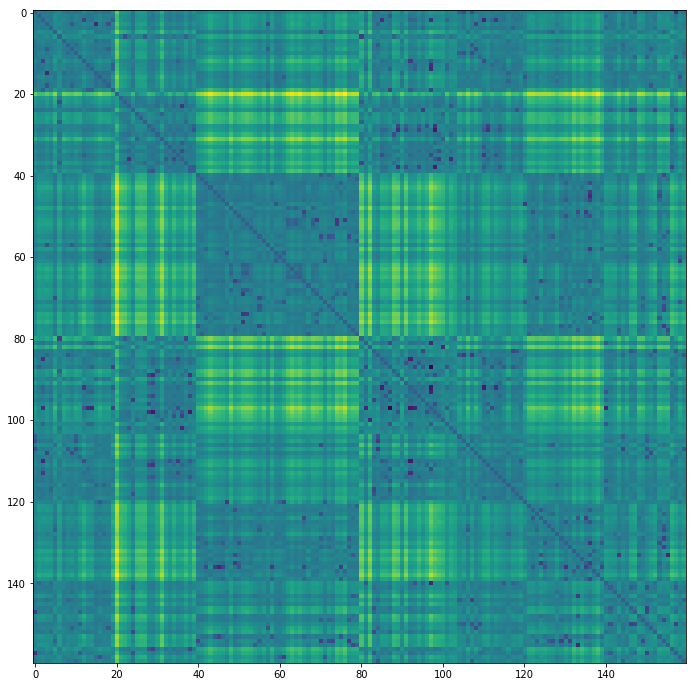

In [11]:
plt.figure(figsize=(12, 12))
plt.imshow(jsmat + jsmat.T)
plt.savefig(os.path.join(figsavepth, "JSDivSplit.pdf"))

In [31]:
print(combined_poptens)

[[array([[[  0.,   0.,   0., ...,   0.,   0.,   0.],
        [  0.,   0.,   0., ...,   0.,   0.,   0.],
        [  0.,   0.,   0., ...,   0.,   0.,   0.],
        ...,
        [  0.,   0.,   0., ...,   0.,   0.,   0.],
        [  0.,   0.,   0., ...,   0.,   0.,   0.],
        [  0.,   0.,   0., ...,   0.,   0.,   0.]],

       [[  0.,   0.,   0., ...,   0.,   0.,   0.],
        [  0.,   0.,   0., ...,   0.,   0.,   0.],
        [  0.,   0.,   0., ...,   0.,   0.,   0.],
        ...,
        [  0.,   0.,   0., ...,   0.,   0.,   0.],
        [  0.,   0.,   0., ...,   0.,   0.,   0.],
        [  0.,   0.,   0., ...,   0.,   0.,   0.]],

       [[  0.,   0.,   0., ...,   0.,   0.,   0.],
        [  0.,   0.,   0., ...,   0.,   0.,   0.],
        [  0.,   0.,   0., ...,   0.,   0.,   0.],
        ...,
        [  0.,   0.,   0., ...,   0.,   0.,   0.],
        [  0.,   0.,   0., ...,   0.,   0.,   0.],
        [  0.,   0.,   0., ...,   0.,   0.,   0.]],

       ...,

       [[  0.,   0.,  